## Reproduction Wang et al

In [1]:
# for arrays
import numpy as np

# for dataframes
import pandas as pd

# plots
import matplotlib.pyplot as plt
import matplotlib.patches as pat
from matplotlib.patches import Ellipse
import matplotlib.patheffects as pe

# high-level plots
import seaborn as sns

# statistics
import scipy.stats as sc
# hierarchical clustering, clusters
from scipy.cluster.hierarchy import linkage, cut_tree, leaves_list
from scipy import stats
# statistical tests
from scipy.stats import mannwhitneyu

# machine learning library
# Principal Component Analysis - determine new axis for representing data
from sklearn.decomposition import PCA
# decision trees
from sklearn.tree import DecisionTreeRegressor
# Random Forests -> vote between decision trees
# Gradient boosting -> instead of a vote, upgrade the same tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# To add interactions in linear regressions models
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OrdinalEncoder
# Elasticnet is an hybrid method between ridge and Lasso
from sklearn.linear_model import LinearRegression, ElasticNet
# support vector machines
from sklearn.svm import SVR
# To separate the data into training and test
from sklearn.model_selection import train_test_split
# Simple clustering (iterative steps)
from sklearn.cluster import KMeans
# metrics
from sklearn.metrics import mean_absolute_error

# neural network
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Activation
from keras.optimizers import Adam, RMSprop
from keras.layers.normalization import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers

# we use it to interact with the file system
import os
# compute time
from time import time, sleep
# iterator
import itertools
# handling json file
import json

# no warning
import warnings
warnings.filterwarnings("ignore")

Using TensorFlow backend.


### Figure 1

In [2]:
tech_df = pd.read_csv("./data/techpower_hard.csv")

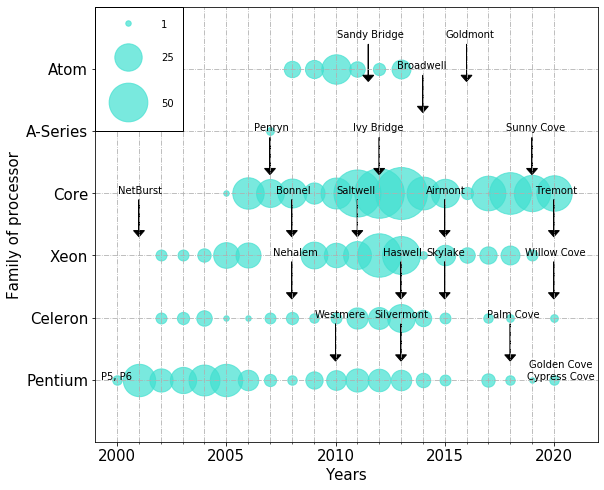

In [3]:
tech_df_intel = tech_df.query("Producer == 'Intel'")

test_df = tech_df_intel.groupby(["Range","rel_year"]).count()

vals = tech_df_intel["Range"].unique()
years = [k for k in range(2000, 2021)]


fig, ax = plt.subplots(figsize=((9,8)))

for y in years:
    for i in range(len(vals)):
        lab = vals[i]
        if (lab, y) in test_df.index:
            ax.scatter(y, i, s = 30*test_df.loc[(lab,y)]["Producer"], color = "turquoise", alpha =0.7)

            
arch_names = ["P5, P6", "NetBurst", "Penryn", "Nehalem", "Bonnel", 
              "Westmere", "Saltwell", "Sandy Bridge", "Ivy Bridge", "Silvermont",
              "Haswell",  "Broadwell ", "Airmont", "Skylake", "Goldmont",
              "Palm Cove", "Sunny Cove", "Tremont", "Willow Cove", "Cypress Cove",
              "Golden Cove"]
arch_years = [2000, 2001, 2007, 2008, 2008, 
              2010, 2011, 2011.5, 2012, 2013, 
              2013, 2014, 2015, 2015, 2016,
              2018, 2019, 2020, 2020, 2020.2,
              2020.2]
arch_position = [0, 3, len(vals)-2, 2, 3, 
                 1, 3, 5.5, len(vals)-2, 1, 
                 2, 5, 3, 2, 5.5,
                 1, 4, 3, 2, 0,
                 0.2]
arch_decal = [1, 0, 0, 0, 0, 
              0, 0, 0, 0, 0, 
              0, 0, 0, 0, 0,
              0, 0, 0, 0, 1,
              1]
  
for i in range(len(arch_names)):
    ax.text(arch_years[i]-0.12*len(arch_names[i]), arch_position[i], arch_names[i])
    if not arch_decal[i]:
        ax.arrow(arch_years[i], arch_position[i]-0.1, 0, 
                 -0.5, head_width=0.5, head_length=0.1, fc='k', ec='k')

plt.xlabel("Years", size= 15)
plt.ylabel("Family of processor", size = 15)
ax.set_xticks([k for k in years if k %5==0], minor=False)
ax.set_xticklabels([k for k in years if k %5==0], Fontsize =15)
ax.set_xticks(years, minor=True)
ax.xaxis.grid(True, which='major')
ax.xaxis.grid(True, which='minor', linestyle = '-.')
plt.yticks(range(len(vals)), vals, size =15)

ax.grid(zorder=0, linestyle = '-.')
plt.xlim((1999, 2022))
plt.ylim(-1,len(vals))
ax.add_patch(pat.Rectangle(
        (1999, len(vals)-2),
        4,
        2,
        edgecolor = 'black',
        facecolor = 'white',
        fill=True,
        zorder=3
 ))

plt.scatter(2000.5, len(vals)-0.4*2/3, s = 30, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-0.5*2/3,"1")
plt.scatter(2000.5, len(vals)-1.2*2/3, s =30*25, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-1.3*2/3,"25")
plt.scatter(2000.5, len(vals)-2.3*2/3, s =30*50, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-2.4*2/3,"50")

plt.savefig('./results/fig1_intel.png', dpi=300)
plt.show()

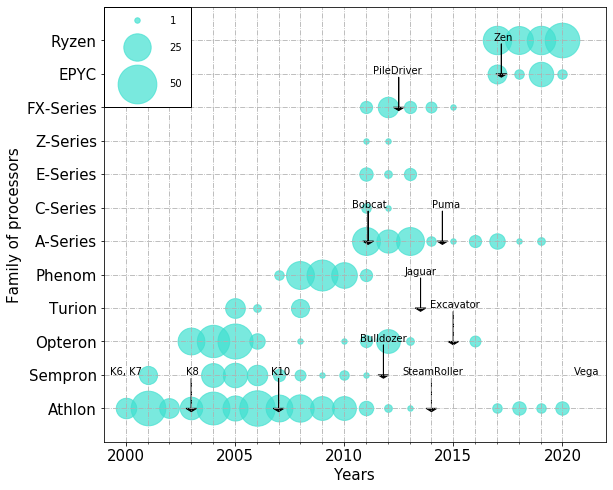

In [4]:
tech_df_intel = tech_df.query("Producer == 'AMD'")

test_df = tech_df_intel.groupby(["Range","rel_year"]).count()

vals = tech_df_intel["Range"].unique()
years = [k for k in range(2000, 2021)]


fig, ax = plt.subplots(figsize=((9,8)))

for y in years:
    for i in range(len(vals)):
        lab = vals[i]
        if (lab, y) in test_df.index:
            ax.scatter(y, i, s = 30*test_df.loc[(lab,y)]["Producer"], color = "turquoise", alpha =0.7)


arch_names = ["Bulldozer", "PileDriver", "SteamRoller", "Excavator", "Bobcat", "Jaguar", "Puma", "Zen",
             "K10", "K6, K7", "K8", "Vega"]
arch_years = [2011.8, 2012.5, 2014, 2015, 2011.1, 2013.5, 2014.5, 2017.2, 2007, 2000, 2003, 2021]
arch_position = [2, len(vals)-2, 1, 3, 6, 4, 6, len(vals)-1, 1, 1, 1, 1]
arch_decal = [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]
       
for i in range(len(arch_names)):
    ax.text(arch_years[i]-0.12*len(arch_names[i]), arch_position[i], arch_names[i])
    if not arch_decal[i]:
        ax.arrow(arch_years[i], arch_position[i]-0.1, 0, 
                 -0.9, head_width=0.5, head_length=0.1, fc='k', ec='k')
            
plt.xlabel("Years", size= 15)
plt.ylabel("Family of processors", size = 15)
ax.set_xticks([k for k in years if k %5==0], minor=False)
ax.set_xticklabels([k for k in years if k %5==0], Fontsize =15)
ax.set_xticks(years, minor=True)
ax.xaxis.grid(True, which='major')
ax.xaxis.grid(True, which='minor', linestyle = '-.')
plt.yticks(range(len(vals)), vals, size =15)

ax.grid(zorder=0, linestyle = '-.')
plt.xlim((1999, 2022))
plt.ylim(-1,len(vals))
ax.add_patch(
    pat.Rectangle(
        (1999, len(vals)-3),
        4,
        3,
        edgecolor = 'black',
        facecolor = 'white',
        fill=True,
        zorder=3))

plt.scatter(2000.5, len(vals)-0.4, s = 30, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-0.5,"1")
plt.scatter(2000.5, len(vals)-1.2, s =30*25, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-1.3,"25")
plt.scatter(2000.5, len(vals)-2.3, s =30*50, color = "turquoise", zorder =4, alpha =0.7)
plt.text(2002, len(vals)-2.4,"50")

plt.savefig('./results/fig1_amd.png', dpi=300)
plt.show()

### Figure 2

In [5]:
system_dir = './data/systems/'
hard_dir = './data/procs/'

to_keep = ['nb_models', 'ls_architecture', 'ls_cpuop-mode', 'ls_cpu', 'ls_threadpercore','ls_corepersocket', 
           'ls_socket', 'ls_numanode', 'ls_vendorid',  'ls_cpufamily', 'ls_model', 'ls_stepping', 
           'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz', 'ls_bogomips', 'ls_virtualization',
           'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_vendor_id','cp_cpufamily', 'cp_model',
           'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
           'cp_physicalid', 'cp_siblings', 'cp_coreid', 'cp_cpucores', 'cp_apicid', 'cp_initialapicid',
           'cp_fpu', 'cp_fpu_exception', 'cp_cpuidlevel', 'cp_wp',
           'cp_bogomips', 'cp_clflushsize', 'cp_cache_alignment', 'cp_addresssizes', 'ls_range']

num = ['nb_models', 'ls_cpu', 'ls_threadpercore', 'ls_corepersocket', 'ls_socket', 'ls_numanode', 
       'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz','ls_bogomips',  'ls_l1dcache', 
       'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_cpumhz', 'cp_cachesize', 
       'cp_siblings', 'cp_cpucores', 'cp_fpu', 'cp_fpu_exception', 'cp_bogomips', 'ls_range']

categ = ['ls_architecture', 'ls_cpuop-mode', 'cp_addresssizes']
#

not_modif = ['ls_range']

# separate average perfs from standard deviations
def separate_perf(perf):
    raw_perf = []
    std_perf = []

    for p in perf:
        tab = str(p).replace(" ", "").split("+/-")
        raw_perf.append(tab[0])
        if len(tab) > 1:
            std_perf.append(tab[1])
        else:
            std_perf.append('')

    return (raw_perf, std_perf)

# load SKU information
envs = pd.read_csv("data/ls_cp_info_modif.csv").set_index("idPhoronix")
# we only keep the skus for which there is only one processor working
envs = envs.query("ls_cpu!='NaN'").query("nb_models==1")[to_keep]
envs = envs[num].join(pd.get_dummies(envs[categ]))

# standardise sku info
for col in envs.columns:
    if col not in not_modif:
        envs[col] = [(k-np.mean(envs[col]))/np.std(envs[col]) for k in envs[col]]

# add profile information
for sys_name in os.listdir(system_dir):
    sys = pd.read_csv(system_dir+sys_name, index_col = 0)
    if sys.shape[0]>10:
        sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]
        score, stds = separate_perf(sys['perf'])
        score = [float(k) for k in score]
        if score[0]<score[sys.shape[1]-1]:
            score = [k*(-1) for k in score]
        score = [(k-np.mean(score))/np.std(score) for k in score]
        sys.loc[:, sys_name[:-4]] = score
        sys = sys.set_index("id")
        sys = sys.drop(["idproc", "percentile", "descproc", "nbproc", "perf"], axis = 1)
        envs = envs.join(sys)

envs["scores"] = [np.mean(envs.iloc[i][30:envs.shape[1]]) for i in range(envs.shape[0])]
#envs = envs.drop(envs.columns[30:envs.shape[1]], axis=1)
envs

,nb_models,ls_cpu,ls_threadpercore,ls_corepersocket,ls_socket,ls_numanode,ls_cpumhz,ls_cpumaxmhz,ls_cpuminmhz,ls_bogomips,...,pts-t-test1,pts-vkpeak,pts-cpuminer-opt,pts-hdparm-read,pts-optcarrot,pts-betsy,pts-rocksdb,pts-f12015,pts-smhasher,scores
AArch64rev4,NaN,-0.349958,-0.899367,-0.488269,2.650734,NaN,NaN,-1.887124,-1.205116,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.180573
AMDA10-4600MAPU,NaN,-0.349958,0.554929,-0.405927,-0.126089,NaN,-0.044795,NaN,NaN,-0.376518,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.741924
AMDA10-5800KAPU,NaN,-0.349958,0.554929,-0.405927,-0.126089,-0.166675,-0.026578,NaN,NaN,1.269770,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.554143
AMDA10-6700APU,NaN,-0.349958,0.554929,-0.405927,-0.126089,-0.166675,-0.041759,0.609093,1.191496,1.161168,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.280961
AMDA10-7700KAPUwithRadeonR7,NaN,-0.349958,0.554929,-0.405927,-0.126089,-0.166675,-0.034169,NaN,NaN,1.490392,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.428856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
POWER98-Core,NaN,0.700969,3.463520,0.088130,-0.126089,-0.166675,NaN,0.715044,1.856011,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.097833
POWER980-Core,NaN,2.502558,9.280703,-0.488269,8.204381,1.525497,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.352270
POWER9altivecsupported44-Core,NaN,6.105736,3.463520,1.240928,0.799519,1.525497,NaN,0.715044,1.834223,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.101195
POWER9altivecsupported64-Core,NaN,1.902028,3.463520,0.088130,0.799519,1.525497,NaN,0.715044,1.834223,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.172493


In [6]:
res = []

for sys_name in os.listdir(system_dir):
    sys = pd.read_csv(system_dir+sys_name, index_col = 0)
    res.append(sys.shape[0]/envs.shape[0])

print(np.mean(res))

0.1033454126056343


In [7]:
s = 0
for sys_name in os.listdir(system_dir):
    sys = pd.read_csv(system_dir+sys_name, index_col = 0)
    if sys.shape[0]>10:
        sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]
        score, stds = separate_perf(sys['perf'])
        score = [float(k) for k in score]
        if score[0]<score[sys.shape[1]-1]:
            s+=1
s

153

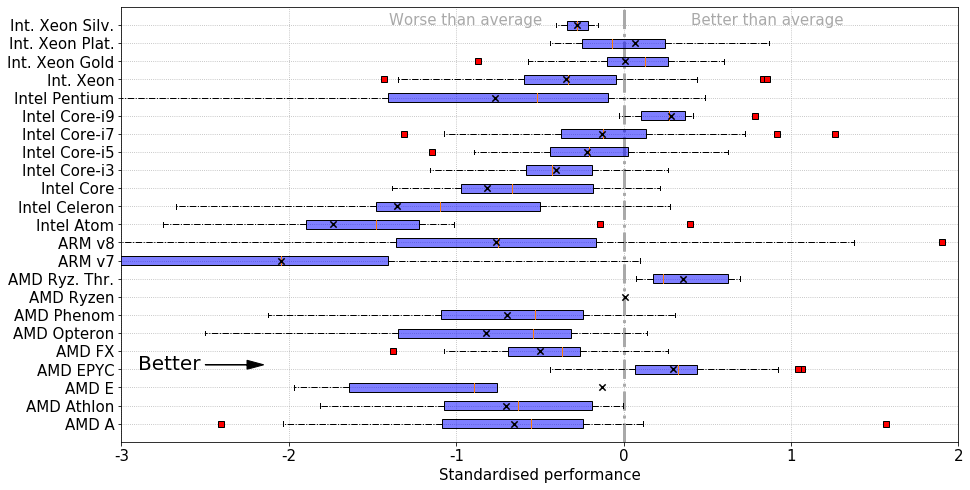

In [8]:
values = envs["ls_range"].unique()[1:]
val_modif =  ['AMD A', 'AMD Athlon', 'AMD E', 'AMD EPYC', 'AMD FX',
       'AMD Opteron', 'AMD Phenom', 'AMD Ryzen', 'AMD Ryz. Thr.',
       'ARM v7', 'ARM v8', 'Intel Atom', 'Intel Celeron', 'Intel Core',
       'Intel Core-i3', 'Intel Core-i5', 'Intel Core-i7', 'Intel Core-i9',
       'Intel Pentium', 'Int. Xeon', 'Int. Xeon Gold',
       'Int. Xeon Plat.', 'Int. Xeon Silv.']

score_dict = dict()
scores = []
for val in values:
    tab = envs.query("ls_range=='"+str(val)+"'")["scores"]
    scores.append(tab)
    score_dict[val] = tab

fig, ax = plt.subplots(figsize=((15,8)))

red_square = dict(markerfacecolor='r', marker='s')

ax.grid(zorder =0, linestyle = ':')

#ax.scatter([np.mean(l) for l in scores], range(1, 1+len(scores)),
#           marker="x", color = "white", alpha = 1, s = 20, zorder=5)
ax.scatter([np.mean(l) for l in scores], range(1, 1+len(scores)),
           marker="x", color = "black", alpha = 1, s = 40, zorder=4)

ax.boxplot(scores, flierprops=red_square,
          vert=False, patch_artist=True, widths=0.5,
          boxprops=dict(facecolor=(0,0,1,0.5),linewidth=1,edgecolor='k'),
          whiskerprops = dict(linestyle='-.',linewidth=1.0, color='black'))

ax.arrow(-2.5, 4.25, 0.25, 0, head_width=0.5, head_length=0.1, fc='k', ec='k', color= 'red')
ax.text(s = "Better", x = -2.9, y = 4, size = 20, color = 'black')

ax.text(s = "Better than average", x = 0.4, y = 23, size = 15, color = 'darkgray')
ax.text(s = "Worse than average", x = -1.4, y = 23, size = 15, color = 'darkgray')
plt.vlines(0, ymin=0, ymax=len(values)+2, linestyle ='-.', linewidth=3, color='darkgray')

plt.xlabel("Standardised performance", size = 15)

ax.set_xticklabels([-3+k for k in range(6)], Fontsize =15)
ax.set_yticklabels(val_modif, Fontsize =15)

plt.xlim((-3,2))
plt.ylim(0,len(values)+1)



plt.savefig("./results/fig2.png", dpi=300)
plt.show()


In [9]:
np.mean(score_dict["AMD Ryzen Threadripper"])

0.3572634972842645

In [10]:
np.mean(score_dict["AMD EPYC"])

0.2951081144826769

In [11]:
np.mean(score_dict["Intel Core-i9"])

0.28415302152400257

In [12]:
np.mean(score_dict["ARM v7"])

-2.0477290466681835

In [13]:
np.mean(score_dict["Intel Core-i3"])

-0.404057164742826

In [14]:
np.mean(score_dict["Intel Xeon Platinum"])

0.07069402294871216

In [15]:
np.mean(score_dict["Intel Xeon Gold"])

0.007382011532578158

#### GeekBench

In [16]:
with open('../cpu_selection-master/geek_data.json','r') as geek_data:
    geek_df = pd.DataFrame(json.load(geek_data))
    geek_df.columns = ['model number', 'freq', 'L2', 'L3', 'memory', 
                       'bench', 'single/multicore', 'score', 'perf']

geek_models = geek_df["model number"].unique()

geek_counts = dict()
intel_names = ["xeon", "i3", "i5", "i7", "core", "pentium", "celeron", "atom", "opteron"]

for ni in intel_names:
    geek_counts[ni] = 0

for spm in geek_models:
    spm = spm.lower()
    if 'xeon' in spm:
        geek_counts["xeon"]+=1
    elif 'i3' in spm:
        geek_counts["i3"]+=1
    elif 'i5' in spm:
        geek_counts["i5"]+=1
    elif 'i7' in spm:
        geek_counts["i7"]+=1
    elif 'core' in spm:
        geek_counts["core"]+=1
    elif 'pentium' in spm:
        geek_counts["pentium"]+=1
    elif "celeron" in spm:
        geek_counts["celeron"]+=1
    elif "atom" in spm:
        geek_counts["atom"]+=1
    elif "opteron" in spm:
        geek_counts["opteron"]+=1
    else:
        print(spm)

geek_values = [k for k in geek_counts.keys()]
geek_count = [geek_counts[k] for k in geek_values]

intel
8
qualcomm qualcomm
intel 000
amd engineering sample
intel 0000
common kvm
qemu virtual version 1.5.3
qemu virtual version ( 64-rhel6)
intel e2697v
intel e2695v
amd eng sample, zs212345tgg45_30/21/20_2/16
westmere e56xx/l56xx/x56xx (nehalem-c)


#### Phoronix

In [17]:
phoronix_values = envs.groupby("ls_range").count().index
phoronix_count = [np.max(envs.groupby("ls_range").count().iloc[i]) for i in range(len(phoronix_values))]

#### TechPowerUp

In [18]:
tech_df = pd.read_csv("./data/techpower_hard.csv")
tech_values = tech_df.groupby("Range").count().index
tech_count = [tech_df.groupby("Range").count()["Producer"].iloc[i] for i in range(len(tech_values))]

#### AMD

In [19]:
amd_df = pd.read_csv("./data/amd_specs.csv")
amd_values = amd_df.groupby("Family").count().index
amd_count = [np.max(amd_df.groupby("Family").count().iloc[i]) for i in range(len(amd_values))]

#### Spec 

In [20]:
spec = pd.read_csv("../cpu_selection-master/spec_data.csv")

spec_models = spec["model number"].unique()

spec_counts = dict()
intel_names = ["xeon", "i3", "i5", "i7", "core", "pentium", "celeron", "atom", "opteron"]

for ni in intel_names:
    spec_counts[ni] = 0

for spm in spec_models:
    spm = spm.lower()
    if 'xeon' in spm:
        spec_counts["xeon"]+=1
    elif 'i3' in spm:
        spec_counts["i3"]+=1
    elif 'i5' in spm:
        spec_counts["i5"]+=1
    elif 'i7' in spm:
        spec_counts["i7"]+=1
    elif 'core' in spm:
        spec_counts["core"]+=1
    elif 'pentium' in spm:
        spec_counts["pentium"]+=1
    elif "celeron" in spm:
        spec_counts["celeron"]+=1
    elif "atom" in spm:
        spec_counts["atom"]+=1
    else:
        print(spm)

spec_values = [k for k in spec_counts.keys()]
spec_count = [spec_counts[k] for k in spec_values]

In [21]:
cols = ["GeekBench", "Phoronix", "SPEC", "TechPower", "AMD"]

#print("Phoronix")
#print(phoronix_values)
#['AMD A' 'AMD Athlon' 'AMD E' 'AMD EPYC' 'AMD FX' 'AMD Opteron'
# 'AMD Phenom' 'AMD Ryzen' 'AMD Ryzen Threadripper' 'ARM v7' 'ARM v8'
# 'Intel Atom' 'Intel Celeron' 'Intel Core' 'Intel Core-i3' 'Intel Core-i5'
# 'Intel Core-i7' 'Intel Core-i9' 'Intel Pentium' 'Intel Xeon'
# 'Intel Xeon Gold' 'Intel Xeon Platinum' 'Intel Xeon Silver']

final_dict = dict()
for i in range(len(phoronix_values)):
    val = phoronix_values[i]
    final_dict["Phoronix", val] = phoronix_count[i]

#print("Geekbench")
#print(geek_values)
#['xeon', 'i3', 'i5', 'i7', 'core', 'pentium', 'celeron', 'atom', 'opteron']
geek_values = ['Intel Xeon', 'Intel Core-i3', 'Intel Core-i5', 'Intel Core-i7', 'Intel Core', 
               'Intel Pentium','Intel Celeron',  'Intel Atom', 'AMD Opteron']

for i in range(len(geek_values)):
    val = geek_values[i]
    final_dict["GeekBench", val] = geek_count[i]

#print("SPEC")
#print(spec_values)
#['xeon', 'i3', 'i5', 'i7', 'core', 'pentium', 'celeron', 'atom', 'opteron']
spec_values = ['Intel Xeon', 'Intel Core-i3', 'Intel Core-i5', 'Intel Core-i7', 'Intel Core', 
               'Intel Pentium','Intel Celeron',  'Intel Atom', 'AMD Opteron']

for i in range(len(spec_values)):
    val = spec_values[i]
    final_dict["SPEC", val] = spec_count[i]

#print("Tech")
#print(tech_values)
#['A-Series', 'Athlon', 'Atom', 'C-Series', 'Celeron', 'Core', 'E-Series',
#       'EPYC', 'FX-Series', 'Opteron', 'Pentium', 'Phenom', 'Ryzen', 'Sempron',
#       'Turion', 'Xeon', 'Z-Series']
tech_values = ['AMD A', 'AMD Athlon', 'Intel Atom',  'AMD C', 'Intel Celeron', 'Intel Cores',
                'AMD E', 'AMD EPYC', 'AMD FX', 'AMD Opteron', 'Intel Pentium', 'AMD Phenom', 'AMD Ryzen', 'AMD Sempron',  
                'AMD Turion', 'Intel Xeon', 'AMD Z']

for i in range(len(tech_values)):
    val = tech_values[i]
    final_dict["TechPower", val] = tech_count[i]

#print("AMD")
#print(amd_values)
#['AMD', 'AMD A-Series Processors', 'AMD Athlon™ Processors',
#       'AMD E-Series Processors', 'AMD EPYC™', 'AMD FX-Series Processors',
#       'AMD Opteron™', 'AMD Phenom™', 'AMD Ryzen™ Processors', 'AMD Sempron™', 'AMD Turion™']

amd_values = ['AMD', 'AMD A', 'AMD Athlon', 'AMD E', 'AMD EPYC', 'AMD FX', 
              'AMD Opteron', 'AMD Phenom', 'AMD Ryzen', 'AMD Sempron', 
              'AMD Turion']

for i in range(len(amd_values)):
    val = amd_values[i]
    final_dict["AMD", val] = amd_count[i]

final_values = []

for pho_val in phoronix_values:
    if pho_val not in final_values:
        final_values.append(pho_val)

for spec_val in spec_values:
    if spec_val not in final_values:
        final_values.append(spec_val)

for tech_val in tech_values:
    if tech_val not in final_values:
        final_values.append(tech_val)

for amd_val in amd_values:
    if amd_val not in final_values:
        final_values.append(amd_val)

final_values = final_values[:len(final_values)-1]
final_values

['AMD A',
 'AMD Athlon',
 'AMD E',
 'AMD EPYC',
 'AMD FX',
 'AMD Opteron',
 'AMD Phenom',
 'AMD Ryzen',
 'AMD Ryzen Threadripper',
 'ARM v7',
 'ARM v8',
 'Intel Atom',
 'Intel Celeron',
 'Intel Core',
 'Intel Core-i3',
 'Intel Core-i5',
 'Intel Core-i7',
 'Intel Core-i9',
 'Intel Pentium',
 'Intel Xeon',
 'Intel Xeon Gold',
 'Intel Xeon Platinum',
 'Intel Xeon Silver',
 'AMD C',
 'Intel Cores',
 'AMD Sempron',
 'AMD Turion',
 'AMD Z']

In [22]:
fig3_df = pd.DataFrame()
fig3_df["model"] = final_values
fig3_df = fig3_df.set_index("model")

for c in cols:
    fig3_df[c] = [final_dict[(c, val)] if (c, val) in final_dict else 0 for val in final_values]

#fig3_df.to_csv("./results/fig3.csv")
# manual regrouping and removing ARM architectures

In [23]:
fig3_df = pd.read_csv("./results/fig3.csv")
fig3_amd_df = pd.read_csv("./results/fig3_amd.csv")

for i in range(len(cols)):
    col = cols[i]
    for j in range(i,len(cols)):
        col2 = cols[j]
        if col == "AMD" or col2 == "AMD":
            print(col, col2, stats.ks_2samp(fig3_amd_df[col], fig3_amd_df[col2]).pvalue)
        else:
            print(col, col2, stats.ks_2samp(fig3_df[col], fig3_df[col2]).pvalue)

GeekBench GeekBench 1.0
GeekBench Phoronix 0.0005909905798671092
GeekBench SPEC 0.7102038997076623
GeekBench TechPower 0.001920719384568105
GeekBench AMD 0.0014969550573265746
Phoronix Phoronix 1.0
Phoronix SPEC 0.001920719384568105
Phoronix TechPower 0.07789836549197329
Phoronix AMD 0.5360977695073805
SPEC SPEC 1.0
SPEC TechPower 0.03561137027640743
SPEC AMD 0.00020413023508998745
TechPower TechPower 1.0
TechPower AMD 0.5360977695073805
AMD AMD 1.0


### Figure 4

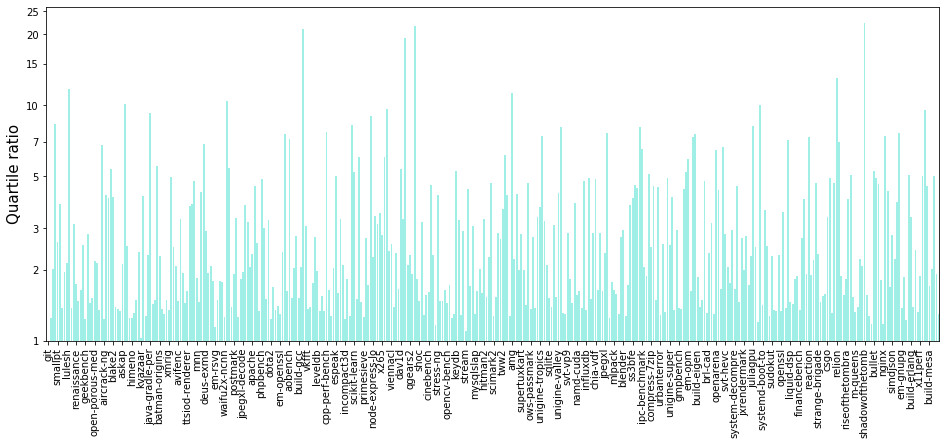

In [24]:
# load SKU information
envs = pd.read_csv("data/ls_cp_info_modif.csv").set_index("idPhoronix")
# we only keep the skus for which there is only one processor working
envs = envs.query("ls_cpu!='NaN'").query("nb_models==1")[to_keep]
envs = envs[num].join(pd.get_dummies(envs[categ]))
names = os.listdir(system_dir)

qratios = []

# add profile information
for sys_name in names:
    sys = pd.read_csv(system_dir+sys_name, index_col = 0)
    if sys.shape[0]>5:
        sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]
        score, stds = separate_perf(sys['perf'])
        score = [float(k) for k in score]
        if score[0]<score[sys.shape[1]-1]:
            score = [k*(-1) for k in score]
        sys.loc[:, sys_name[:-4]] = score
        qratios.append(max(np.nanpercentile(score,75)/np.nanpercentile(score,25),
               np.nanpercentile(score,25)/np.nanpercentile(score,75)))


ns = [names[i] for i in range(len(qratios)) if not np.isnan(qratios[i])]
qrs = [qr for qr in qratios if not np.isnan(qr)]

fig, ax = plt.subplots(figsize=(16, 8))

ax.bar(range(1, len(qrs)+1), [np.log10(k) for k in qrs], color = "turquoise", alpha = 0.5)

plt.xticks([k for k in range(len(qrs)) if k%4==0], 
           [ns[i][4:][:-4][0:15] for i in range(len(ns)) if i%4==0], 
           rotation='vertical')

plt.xlim(-1, 384)

t = [1, 2, 3, 5, 7, 10, 15, 20, 25]

ticks = []
ticks.extend([np.round(np.log10(k),3) for k in t])

labticks = []
labticks.extend(t)

plt.yticks(ticks, labticks)

#ax.set_yscale('log')
#ax.set_yticklabels([k*2 for k in range(8)], Fontsize =15)

plt.ylabel("Quartile ratio", size = 15)

plt.subplots_adjust(bottom=0.3)

plt.savefig("./results/fig4.png", dpi = 300)

plt.show()

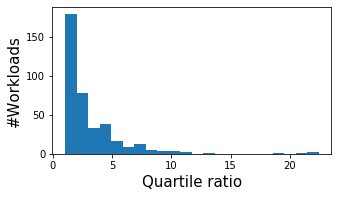

In [25]:
plt.figure(figsize= (5,3))
plt.hist(qratios, bins = 22)
plt.ylabel("#Workloads", size = 15 )
plt.xlabel("Quartile ratio", size=15)
plt.subplots_adjust(bottom=0.2)
plt.savefig("./results/fig4b.png", dpi=300)
plt.show()

In [26]:
ns[np.argmax(qrs)]
np.max(qrs)

22.416666666666668

### Figure 5

In [27]:
# load SKU information
envs = pd.read_csv("data/ls_cp_info_modif.csv").set_index("idPhoronix")
# we only keep the skus for which there is only one processor working
envs = envs.query("ls_cpu!='NaN'").query("nb_models==1")[to_keep]
envs = envs[num].join(pd.get_dummies(envs[categ]))

# standardise skuy info
for col in envs.columns:
    if col not in not_modif:
        envs[col] = [(k-np.mean(envs[col]))/np.std(envs[col]) for k in envs[col]]

# add profile information
for sys_name in os.listdir(system_dir):
    sys = pd.read_csv(system_dir+sys_name, index_col = 0)
    if sys.shape[0]>10:
        sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]
        score, stds = separate_perf(sys['perf'])
        score = [float(k) for k in score]
        if score[0]<score[sys.shape[1]-1]:
            score = [k*(-1) for k in score]
        score = [(k-np.mean(score))/np.std(score) for k in score]
        sys.loc[:, sys_name[:-4]] = score
        sys = sys.set_index("id")
        sys = sys.drop(["idproc", "percentile", "descproc", "nbproc", "perf"], axis = 1)
        envs = envs.join(sys)

#envs["scores"] = [np.mean(envs.iloc[i][30:envs.shape[1]]) for i in range(envs.shape[0])]
envs = envs.drop(envs.columns[:30], axis=1)
envs_copy = envs
envs = envs.fillna(0).transpose()

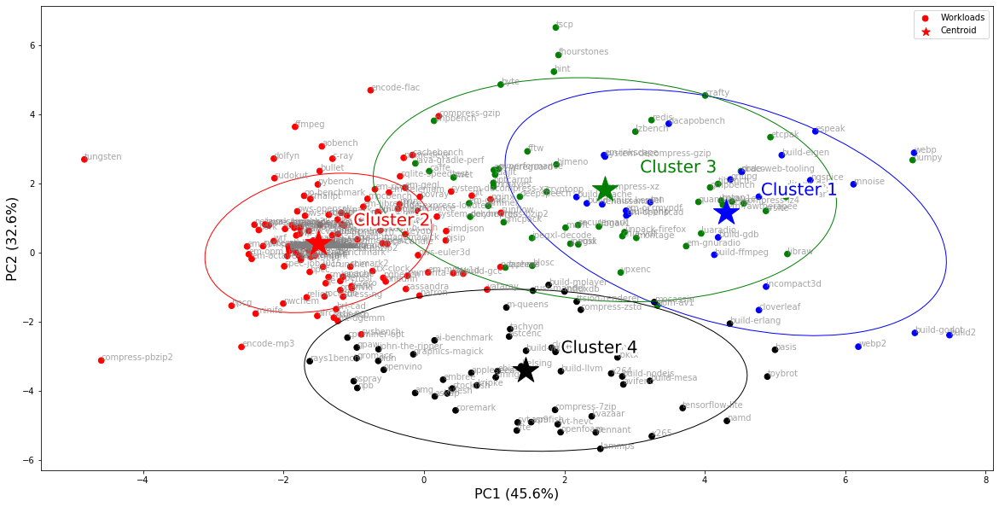

1 blue
['system-openscad', 'pts-renaissance', 'pts-gnupg', 'pts-build-godot', 'pts-system-decompress-gzip', 'system-inkscape', 'pts-webp', 'pts-dacapobench', 'pts-espeak', 'pts-incompact3d', 'pts-build-apache', 'pts-build2', 'pts-build-gdb', 'pts-compress-xz', 'pts-build-ffmpeg', 'pts-draco', 'pts-build-php', 'system-hugin', 'system-rawtherapee', 'pts-webp2', 'pts-build-eigen', 'system-ocrmypdf', 'pts-ngspice', 'pts-tnn', 'pts-cloverleaf', 'pts-build-linux-kernel', 'pts-rnnoise']
2 red
['pts-git', 'pts-php', 'pts-smallpt', 'pts-pts-self-test', 'pts-arrayfire', 'pts-onnx', 'pts-java-scimark2', 'pts-rbenchmark', 'pts-geekbench', 'pts-plaidml', 'pts-mandelgpu', 'pts-aircrack-ng', 'pts-build-imagemagick', 'pts-blake2', 'pts-neatbench', 'pts-node-octane', 'system-gegl', 'pts-mencoder', 'pts-etqw-demo', 'pts-trislam', 'pts-nwchem', 'system-mpv', 'pts-mixbench', 'pts-batman-origins', 'pts-dow3', 'pts-neat', 'pts-mkl-dnn', 'pts-core-latency', 'pts-mpcbench', 'pts-metroll-redux', 'pts-ctx-clock

In [28]:
# k-means

rs = 42
n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, random_state= rs)
kmeans.fit(envs)
groups = kmeans.predict(envs)

colors = ["blue", "red", "green", "black", 'lightgrey', "yellow", 
          "orange", "pink", 'purple',  'lightgreen', 'lightblue']



# PCA
p = PCA(n_components = 3, random_state = rs)

names = [k for k in envs.index]

pca_result = p.fit_transform(envs)

plt.figure(figsize = (20, 10))
ax = plt.subplot(111)
ax.scatter(pca_result[:, 0], 
           pca_result[:, 1],
           color= [colors[groups[i]] for i in range(len(groups))],
           #cmap=cmap,
           label = "Workloads",
           s=45)


pops = []
for i in range(len(colors)):
    pops.append(pat.Patch(color=colors[i], label=values[i]))

imp = p.explained_variance_/np.sum(p.explained_variance_)

def eigsorted(cov): 
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    return vals[order], vecs[:,order]

for i in range(n_clusters):
    x = pca_result[np.where(groups==i), 0] 
    y = pca_result[np.where(groups==i), 1] 
    
    cov = np.cov(x, y) 
    vals, vecs = eigsorted(cov) 
    theta = np.degrees(np.arctan2(*vecs[:,0][::-1])) 
    w, h = 4 * np.sqrt(vals) 
    
    ell = Ellipse(xy=(np.mean(x), np.mean(y)),
                  width=w,
                  height=h,
                  angle=theta,
                  color=colors[i])
    #plt.scatter(np.mean(x), np.mean(y), color="black", marker="*", s =1000, zorder =4)
    if i ==1:
        plt.scatter(np.mean(x), np.mean(y), color=colors[i], marker="*", s =100, zorder =5, label = "Centroid")
    plt.scatter(np.mean(x), np.mean(y), color=colors[i], marker="*", s =1000, zorder =5)
    ell.set_facecolor('none')
    plt.text(np.mean(x)+0.5, np.mean(y)+0.5, "Cluster "+str(i+1), c = colors[i], size=20,
            path_effects=[pe.withStroke(linewidth=6, foreground="white")], zorder=4)
    ax.add_artist(ell)


for i in range(len(names)):
    plt.text(pca_result[:, 0][i], 
            pca_result[:, 1][i],
            envs.index[i][4:], 
             color="gray",
            alpha = 0.7)

imp = p.explained_variance_/np.sum(p.explained_variance_)

plt.ylabel("PC2 ("+str(100*np.round(imp[1],3))+
           "%)", size=16)
plt.xlabel("PC1 ("+str(100*np.round(imp[0],3))
           +"%)", size = 16)
plt.legend()
#plt.ylim([-3, 8])
#plt.xlim([-2.5, 15])
plt.savefig("./results/fig5.png", dpi = 300)
plt.show()

for i in range(n_clusters):
    print(i+1, colors[i])
    print([names[j] for j in range(len(groups)) if groups[j]==i])

### Figure 6

In [2]:
system_dir = './data/systems/'
hard_dir = './data/procs/'

envs = pd.read_csv("data/ls_cp_info_post_join.csv").set_index("idPhoronix")
envs.head()

to_keep = ['perf', 'nb_models', 'ls_architecture', 'ls_cpuop-mode', 'ls_cpu', 'ls_threadpercore',
           'ls_corepersocket', 
           'ls_socket', 'ls_numanode', 'ls_vendorid',  'ls_cpufamily', 'ls_model', 'ls_stepping', 
           'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz', 'ls_bogomips',
           'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_vendor_id','cp_cpufamily', 'cp_model',
           'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
           'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
           'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize',
           'cp_cache_alignment', 'cp_addresssizes', 'ls_range', 'price_dollar',
           'TDP', 'Process', 'Release Year']

num = ['nb_models', 'ls_cpu', 'ls_threadpercore', 'ls_corepersocket', 'ls_socket', 'ls_numanode', 
       'ls_cpufamily', 'ls_model', 'ls_stepping',  'ls_cpumhz', 'ls_cpumaxmhz', 
       'ls_cpuminmhz','ls_bogomips',  'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache',
       'cp_cpufamily', 'cp_model', 'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
       'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
       'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize', 
       'cp_cache_alignment', 'price_dollar', 'TDP', 'Process', 'Release Year']

categ = ['ls_architecture', 'ls_cpuop-mode', 'ls_vendorid', 'cp_vendor_id', 'cp_addresssizes', 'ls_range']

# separate average perfs from standard deviations
def separate_perf(perf):
    raw_perf = []
    std_perf = []

    for p in perf:
        tab = str(p).replace(" ", "").split("+/-")
        raw_perf.append(tab[0])
        if len(tab) > 1:
            std_perf.append(tab[1])
        else:
            std_perf.append('')

    return (raw_perf, std_perf)

In [3]:
def case1(algo):
    
    # compute use case 1 for the algorithm "algo"
    
    names = []
    maes = []
    maes_amd = []
    maes_intel = []
    bad_sys = []
    nbindiv = []

    for sys_name in os.listdir(system_dir):

        try:

            sys = pd.read_csv(system_dir+sys_name, index_col = 0)

            if sys.shape[0] > 150:

                sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]

                sys = sys.set_index("id")

                perf_meta = sys.join(envs)[to_keep].query("ls_cpu!='NaN'").query("ls_vendorid=='AuthenticAMD' or ls_vendorid=='GenuineIntel'").fillna("0")
                #.query("nb_models==1")
                avg, std = separate_perf(perf_meta["perf"])

                perf_meta.loc[:, "avg"] = avg

                del perf_meta["perf"]

                X = perf_meta[num].join(pd.get_dummies(perf_meta[categ]))
                y = [float(k) for k in perf_meta["avg"]]
                y = (y-np.mean(y))/np.std(y)

                inter_mae = []
                inter_mae_amd = []
                inter_mae_intel = []

                for i in range(20):

                    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

                    alg = algo

                    alg.fit(X_train,y_train)

                    y_pred = alg.predict(X_test)

                    inter_mae.append(mean_absolute_error(y_test, y_pred))

                    y_test_intel = [y_test[j] for j in range(len(X_test)) if X_test["ls_vendorid_GenuineIntel"][j]]
                    y_pred_intel = [y_pred[j] for j in range(len(X_test)) if X_test["ls_vendorid_GenuineIntel"][j]]

                    if len(y_test_intel) > 0:
                        inter_mae_intel.append(mean_absolute_error(y_test_intel, y_pred_intel))

                    y_test_amd = [y_test[j] for j in range(len(X_test)) if X_test["ls_vendorid_AuthenticAMD"][j]]
                    y_pred_amd = [y_pred[j] for j in range(len(X_test)) if X_test["ls_vendorid_AuthenticAMD"][j]]

                    if len(y_test_amd) > 0:
                        inter_mae_amd.append(mean_absolute_error(y_test_amd, y_pred_amd))

                maes.append(np.median(inter_mae))
                maes_amd.append(np.median(inter_mae_amd))
                maes_intel.append(np.median(inter_mae_intel))
                names.append(sys_name)
                nbindiv.append(sys.shape[0])

        except:
            bad_sys.append(sys_name)
    
    return (maes, maes_amd, maes_intel, names)


## Linear Regression

In [29]:
lr_avg, lr_amd, lr_intel, lr_name = case1(ElasticNet(l1_ratio=1))

In [30]:
np.mean(lr_avg)

0.3793894320516682

## Decision Tree

In [31]:
dt_avg, dt_amd, dt_intel, dt_name = case1(DecisionTreeRegressor())

## Random Forest

In [32]:
rf_avg, rf_amd, rf_intel, rf_name = case1(RandomForestRegressor())

## Gradient Boosting Tree

In [33]:
gb_avg, gb_amd, gb_intel, gb_name = case1(GradientBoostingRegressor())

## Support Vector Regressor

In [34]:
sv_avg, sv_amd, sv_intel, sv_name = case1(SVR)

## Neural Networks

In [25]:
names = []
maes = []
maes_amd = []
maes_intel = []
bad_sys = []
nbindiv = []

rms = RMSprop(learning_rate=0.001)

for sys_name in os.listdir(system_dir):
    
    try:
        sys = pd.read_csv(system_dir+sys_name, index_col = 0)

        if sys.shape[0] > 150:

            sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]

            sys = sys.set_index("id")

            perf_meta = sys.join(envs)[to_keep].query("ls_cpu!='NaN'").query("ls_vendorid=='AuthenticAMD' or ls_vendorid=='GenuineIntel'").fillna("0")

            avg, std = separate_perf(perf_meta["perf"])

            perf_meta.loc[:, "avg"] = avg

            del perf_meta["perf"]

            X = perf_meta[num].join(pd.get_dummies(perf_meta[categ]))
            for col in X.columns:
                X_fl = np.array(X[col], float)
                if np.std(X_fl)!=0:
                    X[col] = (X_fl-np.mean(X_fl))/np.std(X_fl)
            y = [float(k) for k in perf_meta["avg"]]
            y = (y-np.mean(y))/np.std(y)

            inter_mae = []
            inter_mae_amd = []
            inter_mae_intel = []
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

            model = Sequential()

            model.add(Dense(X_train.shape[1],input_shape=(X_train.shape[1],)))
            model.add(Dense(100, activation = 'tanh'))
            #model.add(Dropout(0.5))
            model.add(Dense(100, activation = 'tanh'))
            model.add(Dense(100, activation = 'tanh'))
            #model.add(Dropout(0.2))
            model.add(Dense(1))

            model.compile(loss = 'mae', optimizer = rms)

            model.fit(np.array(X_train, dtype=float), y_train, epochs = 300, verbose =1)

            y_pred = model.predict(np.array(X_test, dtype=float))

            inter_mae.append(mean_absolute_error(y_test, y_pred))

            y_test_intel = [y_test[j] for j in range(len(X_test)) if X_test["ls_vendorid_GenuineIntel"][j]]
            y_pred_intel = [y_pred[j] for j in range(len(X_test)) if X_test["ls_vendorid_GenuineIntel"][j]]

            if len(y_test_intel) > 0:
                inter_mae_intel.append(mean_absolute_error(y_test_intel, y_pred_intel))

            y_test_amd = [y_test[j] for j in range(len(X_test)) if X_test["ls_vendorid_AuthenticAMD"][j]]
            y_pred_amd = [y_pred[j] for j in range(len(X_test)) if X_test["ls_vendorid_AuthenticAMD"][j]]

            if len(y_test_amd) > 0:
                inter_mae_amd.append(mean_absolute_error(y_test_amd, y_pred_amd))

            maes.append(np.median(inter_mae))
            maes_amd.append(np.median(inter_mae_amd))
            maes_intel.append(np.median(inter_mae_intel))
            names.append(sys_name)
            nbindiv.append(sys.shape[0])
    
    except:
        bad_sys.append(sys_name)

Epoch 1/300
105/105 [==============================] - 0s 3ms/step - loss: 1.6156
Epoch 2/300
105/105 [==============================] - 0s 415us/step - loss: 0.6405
Epoch 3/300
105/105 [==============================] - 0s 207us/step - loss: 0.4756
Epoch 4/300
105/105 [==============================] - 0s 164us/step - loss: 0.4219
Epoch 5/300
105/105 [==============================] - 0s 402us/step - loss: 0.4414
Epoch 6/300
105/105 [==============================] - 0s 236us/step - loss: 0.4737
Epoch 7/300
105/105 [==============================] - 0s 430us/step - loss: 0.3905
Epoch 8/300
105/105 [==============================] - 0s 467us/step - loss: 0.3752
Epoch 9/300
105/105 [==============================] - 0s 347us/step - loss: 0.3735
Epoch 10/300
105/105 [==============================] - 0s 405us/step - loss: 0.3867
Epoch 11/300
105/105 [==============================] - 0s 379us/step - loss: 0.3559
Epoch 12/300
105/105 [==============================] - 0s 367us/step - loss

105/105 [==============================] - 0s 210us/step - loss: 0.0767
Epoch 98/300
105/105 [==============================] - 0s 190us/step - loss: 0.1035
Epoch 99/300
105/105 [==============================] - 0s 197us/step - loss: 0.1107
Epoch 100/300
105/105 [==============================] - 0s 178us/step - loss: 0.0977
Epoch 101/300
105/105 [==============================] - 0s 151us/step - loss: 0.1169
Epoch 102/300
105/105 [==============================] - 0s 130us/step - loss: 0.0968
Epoch 103/300
105/105 [==============================] - 0s 174us/step - loss: 0.0891
Epoch 104/300
105/105 [==============================] - 0s 96us/step - loss: 0.0709
Epoch 105/300
105/105 [==============================] - 0s 238us/step - loss: 0.1204
Epoch 106/300
105/105 [==============================] - 0s 119us/step - loss: 0.0694
Epoch 107/300
105/105 [==============================] - 0s 230us/step - loss: 0.1094
Epoch 108/300
105/105 [==============================] - 0s 127us/step 

105/105 [==============================] - 0s 92us/step - loss: 0.0567
Epoch 193/300
105/105 [==============================] - 0s 254us/step - loss: 0.0681
Epoch 194/300
105/105 [==============================] - 0s 198us/step - loss: 0.0447
Epoch 195/300
105/105 [==============================] - 0s 91us/step - loss: 0.0741
Epoch 196/300
105/105 [==============================] - 0s 187us/step - loss: 0.0622
Epoch 197/300
105/105 [==============================] - 0s 88us/step - loss: 0.0346
Epoch 198/300
105/105 [==============================] - 0s 172us/step - loss: 0.0708
Epoch 199/300
105/105 [==============================] - 0s 89us/step - loss: 0.0471
Epoch 200/300
105/105 [==============================] - 0s 100us/step - loss: 0.0665
Epoch 201/300
105/105 [==============================] - 0s 85us/step - loss: 0.0654
Epoch 202/300
105/105 [==============================] - 0s 96us/step - loss: 0.0636
Epoch 203/300
105/105 [==============================] - 0s 105us/step - l

105/105 [==============================] - 0s 159us/step - loss: 0.0599
Epoch 288/300
105/105 [==============================] - 0s 111us/step - loss: 0.0660
Epoch 289/300
105/105 [==============================] - 0s 80us/step - loss: 0.0313
Epoch 290/300
105/105 [==============================] - 0s 102us/step - loss: 0.0604
Epoch 291/300
105/105 [==============================] - 0s 160us/step - loss: 0.0542
Epoch 292/300
105/105 [==============================] - 0s 107us/step - loss: 0.0555
Epoch 293/300
105/105 [==============================] - 0s 113us/step - loss: 0.0567
Epoch 294/300
105/105 [==============================] - 0s 97us/step - loss: 0.0592
Epoch 295/300
105/105 [==============================] - 0s 108us/step - loss: 0.0488
Epoch 296/300
105/105 [==============================] - 0s 108us/step - loss: 0.0653
Epoch 297/300
105/105 [==============================] - 0s 127us/step - loss: 0.0571
Epoch 298/300
105/105 [==============================] - 0s 82us/step 

154/154 [==============================] - 0s 135us/step - loss: 0.1950
Epoch 84/300
154/154 [==============================] - 0s 152us/step - loss: 0.1876
Epoch 85/300
154/154 [==============================] - 0s 126us/step - loss: 0.1370
Epoch 86/300
154/154 [==============================] - 0s 127us/step - loss: 0.2287
Epoch 87/300
154/154 [==============================] - 0s 95us/step - loss: 0.1689
Epoch 88/300
154/154 [==============================] - 0s 133us/step - loss: 0.1572
Epoch 89/300
154/154 [==============================] - 0s 168us/step - loss: 0.1451
Epoch 90/300
154/154 [==============================] - 0s 71us/step - loss: 0.2156
Epoch 91/300
154/154 [==============================] - 0s 213us/step - loss: 0.1898
Epoch 92/300
154/154 [==============================] - 0s 98us/step - loss: 0.1516
Epoch 93/300
154/154 [==============================] - 0s 301us/step - loss: 0.1871
Epoch 94/300
154/154 [==============================] - 0s 102us/step - loss: 0.1

154/154 [==============================] - 0s 106us/step - loss: 0.0987
Epoch 179/300
154/154 [==============================] - 0s 149us/step - loss: 0.1340
Epoch 180/300
154/154 [==============================] - 0s 101us/step - loss: 0.1045
Epoch 181/300
154/154 [==============================] - 0s 180us/step - loss: 0.1115
Epoch 182/300
154/154 [==============================] - 0s 174us/step - loss: 0.1101
Epoch 183/300
154/154 [==============================] - 0s 111us/step - loss: 0.1068
Epoch 184/300
154/154 [==============================] - 0s 194us/step - loss: 0.0945
Epoch 185/300
154/154 [==============================] - 0s 145us/step - loss: 0.1091
Epoch 186/300
154/154 [==============================] - 0s 142us/step - loss: 0.1177
Epoch 187/300
154/154 [==============================] - 0s 149us/step - loss: 0.1303
Epoch 188/300
154/154 [==============================] - 0s 71us/step - loss: 0.0899
Epoch 189/300
154/154 [==============================] - 0s 167us/ste

154/154 [==============================] - 0s 196us/step - loss: 0.0955
Epoch 274/300
154/154 [==============================] - 0s 199us/step - loss: 0.0599
Epoch 275/300
154/154 [==============================] - 0s 163us/step - loss: 0.0953
Epoch 276/300
154/154 [==============================] - 0s 123us/step - loss: 0.0697
Epoch 277/300
154/154 [==============================] - 0s 111us/step - loss: 0.0785
Epoch 278/300
154/154 [==============================] - 0s 92us/step - loss: 0.0814
Epoch 279/300
154/154 [==============================] - 0s 150us/step - loss: 0.0786
Epoch 280/300
154/154 [==============================] - 0s 101us/step - loss: 0.0838
Epoch 281/300
154/154 [==============================] - 0s 145us/step - loss: 0.0780
Epoch 282/300
154/154 [==============================] - 0s 82us/step - loss: 0.0787
Epoch 283/300
154/154 [==============================] - 0s 96us/step - loss: 0.0730
Epoch 284/300
154/154 [==============================] - 0s 55us/step -

103/103 [==============================] - 0s 163us/step - loss: 0.3693
Epoch 70/300
103/103 [==============================] - 0s 216us/step - loss: 0.3567
Epoch 71/300
103/103 [==============================] - 0s 103us/step - loss: 0.2765
Epoch 72/300
103/103 [==============================] - 0s 145us/step - loss: 0.2579
Epoch 73/300
103/103 [==============================] - 0s 228us/step - loss: 0.2782
Epoch 74/300
103/103 [==============================] - 0s 137us/step - loss: 0.2857
Epoch 75/300
103/103 [==============================] - 0s 219us/step - loss: 0.2278
Epoch 76/300
103/103 [==============================] - 0s 198us/step - loss: 0.2329
Epoch 77/300
103/103 [==============================] - 0s 209us/step - loss: 0.1938
Epoch 78/300
103/103 [==============================] - 0s 153us/step - loss: 0.3060
Epoch 79/300
103/103 [==============================] - 0s 135us/step - loss: 0.2670
Epoch 80/300
103/103 [==============================] - 0s 212us/step - loss: 

103/103 [==============================] - 0s 131us/step - loss: 0.1782
Epoch 165/300
103/103 [==============================] - 0s 158us/step - loss: 0.2020
Epoch 166/300
103/103 [==============================] - 0s 131us/step - loss: 0.2021
Epoch 167/300
103/103 [==============================] - 0s 148us/step - loss: 0.1801
Epoch 168/300
103/103 [==============================] - 0s 145us/step - loss: 0.1821
Epoch 169/300
103/103 [==============================] - 0s 137us/step - loss: 0.1644
Epoch 170/300
103/103 [==============================] - 0s 128us/step - loss: 0.2164
Epoch 171/300
103/103 [==============================] - 0s 114us/step - loss: 0.1560
Epoch 172/300
103/103 [==============================] - 0s 163us/step - loss: 0.2554
Epoch 173/300
103/103 [==============================] - 0s 226us/step - loss: 0.1521
Epoch 174/300
103/103 [==============================] - 0s 185us/step - loss: 0.1148
Epoch 175/300
103/103 [==============================] - 0s 134us/st

103/103 [==============================] - 0s 154us/step - loss: 0.1277
Epoch 260/300
103/103 [==============================] - 0s 175us/step - loss: 0.1571
Epoch 261/300
103/103 [==============================] - 0s 192us/step - loss: 0.1115
Epoch 262/300
103/103 [==============================] - 0s 191us/step - loss: 0.1391
Epoch 263/300
103/103 [==============================] - 0s 175us/step - loss: 0.1485
Epoch 264/300
103/103 [==============================] - 0s 303us/step - loss: 0.1168
Epoch 265/300
103/103 [==============================] - 0s 152us/step - loss: 0.1029
Epoch 266/300
103/103 [==============================] - 0s 162us/step - loss: 0.1499
Epoch 267/300
103/103 [==============================] - 0s 173us/step - loss: 0.1371
Epoch 268/300
103/103 [==============================] - 0s 180us/step - loss: 0.1384
Epoch 269/300
103/103 [==============================] - 0s 166us/step - loss: 0.1141
Epoch 270/300
103/103 [==============================] - 0s 141us/st

146/146 [==============================] - 0s 152us/step - loss: 0.2548
Epoch 56/300
146/146 [==============================] - 0s 141us/step - loss: 0.2345
Epoch 57/300
146/146 [==============================] - 0s 166us/step - loss: 0.2572
Epoch 58/300
146/146 [==============================] - 0s 119us/step - loss: 0.1986
Epoch 59/300
146/146 [==============================] - 0s 146us/step - loss: 0.2700
Epoch 60/300
146/146 [==============================] - 0s 114us/step - loss: 0.2003
Epoch 61/300
146/146 [==============================] - 0s 106us/step - loss: 0.2319
Epoch 62/300
146/146 [==============================] - 0s 162us/step - loss: 0.2958
Epoch 63/300
146/146 [==============================] - 0s 103us/step - loss: 0.3051
Epoch 64/300
146/146 [==============================] - 0s 205us/step - loss: 0.2001
Epoch 65/300
146/146 [==============================] - 0s 155us/step - loss: 0.1783
Epoch 66/300
146/146 [==============================] - 0s 232us/step - loss: 

146/146 [==============================] - 0s 165us/step - loss: 0.1445
Epoch 152/300
146/146 [==============================] - 0s 138us/step - loss: 0.1483
Epoch 153/300
146/146 [==============================] - 0s 273us/step - loss: 0.1395
Epoch 154/300
146/146 [==============================] - 0s 171us/step - loss: 0.1327
Epoch 155/300
146/146 [==============================] - 0s 122us/step - loss: 0.1431
Epoch 156/300
146/146 [==============================] - 0s 153us/step - loss: 0.1229
Epoch 157/300
146/146 [==============================] - 0s 116us/step - loss: 0.1369
Epoch 158/300
146/146 [==============================] - 0s 189us/step - loss: 0.1333
Epoch 159/300
146/146 [==============================] - 0s 115us/step - loss: 0.1437
Epoch 160/300
146/146 [==============================] - 0s 118us/step - loss: 0.1567
Epoch 161/300
146/146 [==============================] - 0s 136us/step - loss: 0.1437
Epoch 162/300
146/146 [==============================] - 0s 127us/st

146/146 [==============================] - 0s 170us/step - loss: 0.1190
Epoch 247/300
146/146 [==============================] - 0s 123us/step - loss: 0.1217
Epoch 248/300
146/146 [==============================] - 0s 146us/step - loss: 0.0946
Epoch 249/300
146/146 [==============================] - 0s 285us/step - loss: 0.1113
Epoch 250/300
146/146 [==============================] - 0s 177us/step - loss: 0.1006
Epoch 251/300
146/146 [==============================] - 0s 191us/step - loss: 0.1170
Epoch 252/300
146/146 [==============================] - 0s 155us/step - loss: 0.0809
Epoch 253/300
146/146 [==============================] - 0s 195us/step - loss: 0.1124
Epoch 254/300
146/146 [==============================] - 0s 113us/step - loss: 0.0844
Epoch 255/300
146/146 [==============================] - 0s 204us/step - loss: 0.1344
Epoch 256/300
146/146 [==============================] - 0s 168us/step - loss: 0.0984
Epoch 257/300
146/146 [==============================] - 0s 283us/st

118/118 [==============================] - 0s 381us/step - loss: 0.3800
Epoch 43/300
118/118 [==============================] - 0s 255us/step - loss: 0.3512
Epoch 44/300
118/118 [==============================] - 0s 387us/step - loss: 0.3454
Epoch 45/300
118/118 [==============================] - 0s 190us/step - loss: 0.3226
Epoch 46/300
118/118 [==============================] - 0s 221us/step - loss: 0.4244
Epoch 47/300
118/118 [==============================] - 0s 249us/step - loss: 0.3449
Epoch 48/300
118/118 [==============================] - 0s 203us/step - loss: 0.2857
Epoch 49/300
118/118 [==============================] - 0s 264us/step - loss: 0.3274
Epoch 50/300
118/118 [==============================] - 0s 116us/step - loss: 0.3041
Epoch 51/300
118/118 [==============================] - 0s 195us/step - loss: 0.4076
Epoch 52/300
118/118 [==============================] - 0s 201us/step - loss: 0.2419
Epoch 53/300
118/118 [==============================] - 0s 182us/step - loss: 

118/118 [==============================] - 0s 115us/step - loss: 0.1960
Epoch 138/300
118/118 [==============================] - 0s 120us/step - loss: 0.1810
Epoch 139/300
118/118 [==============================] - 0s 113us/step - loss: 0.1682
Epoch 140/300
118/118 [==============================] - 0s 150us/step - loss: 0.1558
Epoch 141/300
118/118 [==============================] - 0s 150us/step - loss: 0.2128
Epoch 142/300
118/118 [==============================] - 0s 174us/step - loss: 0.2039
Epoch 143/300
118/118 [==============================] - 0s 213us/step - loss: 0.1578
Epoch 144/300
118/118 [==============================] - 0s 188us/step - loss: 0.1374
Epoch 145/300
118/118 [==============================] - 0s 199us/step - loss: 0.2406
Epoch 146/300
118/118 [==============================] - 0s 185us/step - loss: 0.1693
Epoch 147/300
118/118 [==============================] - 0s 182us/step - loss: 0.1808
Epoch 148/300
118/118 [==============================] - 0s 182us/st

118/118 [==============================] - 0s 92us/step - loss: 0.1185
Epoch 232/300
118/118 [==============================] - 0s 176us/step - loss: 0.1243
Epoch 233/300
118/118 [==============================] - 0s 215us/step - loss: 0.1049
Epoch 234/300
118/118 [==============================] - 0s 147us/step - loss: 0.0916
Epoch 235/300
118/118 [==============================] - 0s 219us/step - loss: 0.1125
Epoch 236/300
118/118 [==============================] - 0s 147us/step - loss: 0.1575
Epoch 237/300
118/118 [==============================] - 0s 114us/step - loss: 0.1082
Epoch 238/300
118/118 [==============================] - 0s 217us/step - loss: 0.1182
Epoch 239/300
118/118 [==============================] - 0s 214us/step - loss: 0.1070
Epoch 240/300
118/118 [==============================] - 0s 136us/step - loss: 0.1224
Epoch 241/300
118/118 [==============================] - 0s 275us/step - loss: 0.1166
Epoch 242/300
118/118 [==============================] - 0s 121us/ste

Epoch 27/300
190/190 [==============================] - 0s 116us/step - loss: 0.2461
Epoch 28/300
190/190 [==============================] - 0s 85us/step - loss: 0.2804
Epoch 29/300
190/190 [==============================] - 0s 113us/step - loss: 0.3181
Epoch 30/300
190/190 [==============================] - 0s 75us/step - loss: 0.2861
Epoch 31/300
190/190 [==============================] - 0s 163us/step - loss: 0.2604
Epoch 32/300
190/190 [==============================] - 0s 139us/step - loss: 0.2885
Epoch 33/300
190/190 [==============================] - 0s 119us/step - loss: 0.2716
Epoch 34/300
190/190 [==============================] - 0s 290us/step - loss: 0.2635
Epoch 35/300
190/190 [==============================] - 0s 161us/step - loss: 0.2403
Epoch 36/300
190/190 [==============================] - 0s 223us/step - loss: 0.2306
Epoch 37/300
190/190 [==============================] - 0s 132us/step - loss: 0.2337
Epoch 38/300
190/190 [==============================] - 0s 273us/st

190/190 [==============================] - 0s 191us/step - loss: 0.1232
Epoch 124/300
190/190 [==============================] - 0s 121us/step - loss: 0.1033
Epoch 125/300
190/190 [==============================] - 0s 198us/step - loss: 0.1204
Epoch 126/300
190/190 [==============================] - 0s 109us/step - loss: 0.0912
Epoch 127/300
190/190 [==============================] - 0s 207us/step - loss: 0.1427
Epoch 128/300
190/190 [==============================] - 0s 136us/step - loss: 0.1094
Epoch 129/300
190/190 [==============================] - 0s 133us/step - loss: 0.1286
Epoch 130/300
190/190 [==============================] - 0s 117us/step - loss: 0.1055
Epoch 131/300
190/190 [==============================] - 0s 217us/step - loss: 0.1189
Epoch 132/300
190/190 [==============================] - 0s 180us/step - loss: 0.0957
Epoch 133/300
190/190 [==============================] - 0s 206us/step - loss: 0.1192
Epoch 134/300
190/190 [==============================] - 0s 155us/st

190/190 [==============================] - 0s 168us/step - loss: 0.1003
Epoch 219/300
190/190 [==============================] - 0s 129us/step - loss: 0.0773
Epoch 220/300
190/190 [==============================] - 0s 156us/step - loss: 0.0892
Epoch 221/300
190/190 [==============================] - 0s 236us/step - loss: 0.0946
Epoch 222/300
190/190 [==============================] - 0s 88us/step - loss: 0.0895
Epoch 223/300
190/190 [==============================] - 0s 128us/step - loss: 0.0853
Epoch 224/300
190/190 [==============================] - 0s 100us/step - loss: 0.0806
Epoch 225/300
190/190 [==============================] - 0s 182us/step - loss: 0.0723
Epoch 226/300
190/190 [==============================] - 0s 162us/step - loss: 0.0984
Epoch 227/300
190/190 [==============================] - 0s 183us/step - loss: 0.0922
Epoch 228/300
190/190 [==============================] - 0s 135us/step - loss: 0.0747
Epoch 229/300
190/190 [==============================] - 0s 100us/ste

108/108 [==============================] - 0s 346us/step - loss: 0.3041
Epoch 14/300
108/108 [==============================] - 0s 173us/step - loss: 0.2751
Epoch 15/300
108/108 [==============================] - 0s 139us/step - loss: 0.3641
Epoch 16/300
108/108 [==============================] - 0s 122us/step - loss: 0.3409
Epoch 17/300
108/108 [==============================] - 0s 160us/step - loss: 0.3084
Epoch 18/300
108/108 [==============================] - 0s 300us/step - loss: 0.2899
Epoch 19/300
108/108 [==============================] - 0s 82us/step - loss: 0.3144
Epoch 20/300
108/108 [==============================] - 0s 135us/step - loss: 0.3042
Epoch 21/300
108/108 [==============================] - 0s 101us/step - loss: 0.2871
Epoch 22/300
108/108 [==============================] - 0s 120us/step - loss: 0.3153
Epoch 23/300
108/108 [==============================] - 0s 179us/step - loss: 0.2911
Epoch 24/300
108/108 [==============================] - 0s 103us/step - loss: 0

108/108 [==============================] - 0s 122us/step - loss: 0.0856
Epoch 110/300
108/108 [==============================] - 0s 188us/step - loss: 0.0945
Epoch 111/300
108/108 [==============================] - 0s 195us/step - loss: 0.0991
Epoch 112/300
108/108 [==============================] - 0s 179us/step - loss: 0.0890
Epoch 113/300
108/108 [==============================] - 0s 177us/step - loss: 0.1090
Epoch 114/300
108/108 [==============================] - 0s 129us/step - loss: 0.0969
Epoch 115/300
108/108 [==============================] - 0s 502us/step - loss: 0.0888
Epoch 116/300
108/108 [==============================] - 0s 220us/step - loss: 0.0885
Epoch 117/300
108/108 [==============================] - 0s 290us/step - loss: 0.0993
Epoch 118/300
108/108 [==============================] - 0s 112us/step - loss: 0.0972
Epoch 119/300
108/108 [==============================] - 0s 297us/step - loss: 0.0887
Epoch 120/300
108/108 [==============================] - 0s 344us/st

108/108 [==============================] - 0s 174us/step - loss: 0.0527
Epoch 205/300
108/108 [==============================] - 0s 181us/step - loss: 0.0525
Epoch 206/300
108/108 [==============================] - 0s 135us/step - loss: 0.0637
Epoch 207/300
108/108 [==============================] - 0s 163us/step - loss: 0.0635
Epoch 208/300
108/108 [==============================] - 0s 114us/step - loss: 0.0557
Epoch 209/300
108/108 [==============================] - 0s 139us/step - loss: 0.0631
Epoch 210/300
108/108 [==============================] - 0s 441us/step - loss: 0.0508
Epoch 211/300
108/108 [==============================] - 0s 102us/step - loss: 0.0623
Epoch 212/300
108/108 [==============================] - 0s 263us/step - loss: 0.0625
Epoch 213/300
108/108 [==============================] - 0s 144us/step - loss: 0.0536
Epoch 214/300
108/108 [==============================] - 0s 128us/step - loss: 0.0640
Epoch 215/300
108/108 [==============================] - 0s 131us/st

108/108 [==============================] - 0s 215us/step - loss: 0.0558
Epoch 300/300
108/108 [==============================] - 0s 102us/step - loss: 0.0643
Epoch 1/300
169/169 [==============================] - 0s 2ms/step - loss: 1.4728
Epoch 2/300
169/169 [==============================] - 0s 219us/step - loss: 0.7287
Epoch 3/300
169/169 [==============================] - 0s 139us/step - loss: 0.5498
Epoch 4/300
169/169 [==============================] - 0s 154us/step - loss: 0.5931
Epoch 5/300
169/169 [==============================] - 0s 119us/step - loss: 0.5691
Epoch 6/300
169/169 [==============================] - 0s 128us/step - loss: 0.6136
Epoch 7/300
169/169 [==============================] - 0s 193us/step - loss: 0.5526
Epoch 8/300
169/169 [==============================] - 0s 175us/step - loss: 0.4071
Epoch 9/300
169/169 [==============================] - 0s 160us/step - loss: 0.4899
Epoch 10/300
169/169 [==============================] - 0s 191us/step - loss: 0.5149
Epo

169/169 [==============================] - 0s 292us/step - loss: 0.1444
Epoch 96/300
169/169 [==============================] - 0s 270us/step - loss: 0.1824
Epoch 97/300
169/169 [==============================] - 0s 193us/step - loss: 0.1627
Epoch 98/300
169/169 [==============================] - 0s 268us/step - loss: 0.1736
Epoch 99/300
169/169 [==============================] - 0s 208us/step - loss: 0.1604
Epoch 100/300
169/169 [==============================] - 0s 318us/step - loss: 0.1574
Epoch 101/300
169/169 [==============================] - 0s 257us/step - loss: 0.1840
Epoch 102/300
169/169 [==============================] - 0s 176us/step - loss: 0.1793
Epoch 103/300
169/169 [==============================] - 0s 391us/step - loss: 0.1454
Epoch 104/300
169/169 [==============================] - 0s 214us/step - loss: 0.1754
Epoch 105/300
169/169 [==============================] - 0s 268us/step - loss: 0.1615
Epoch 106/300
169/169 [==============================] - 0s 267us/step -

169/169 [==============================] - 0s 321us/step - loss: 0.1098
Epoch 191/300
169/169 [==============================] - 0s 237us/step - loss: 0.1089
Epoch 192/300
169/169 [==============================] - 0s 147us/step - loss: 0.1311
Epoch 193/300
169/169 [==============================] - 0s 158us/step - loss: 0.1186
Epoch 194/300
169/169 [==============================] - 0s 140us/step - loss: 0.1125
Epoch 195/300
169/169 [==============================] - 0s 251us/step - loss: 0.1206
Epoch 196/300
169/169 [==============================] - 0s 296us/step - loss: 0.0894
Epoch 197/300
169/169 [==============================] - 0s 243us/step - loss: 0.1354
Epoch 198/300
169/169 [==============================] - 0s 183us/step - loss: 0.1372
Epoch 199/300
169/169 [==============================] - 0s 124us/step - loss: 0.1181
Epoch 200/300
169/169 [==============================] - 0s 146us/step - loss: 0.1233
Epoch 201/300
169/169 [==============================] - 0s 175us/st

169/169 [==============================] - 0s 178us/step - loss: 0.0804
Epoch 286/300
169/169 [==============================] - 0s 178us/step - loss: 0.0982
Epoch 287/300
169/169 [==============================] - 0s 142us/step - loss: 0.0815
Epoch 288/300
169/169 [==============================] - 0s 133us/step - loss: 0.0844
Epoch 289/300
169/169 [==============================] - 0s 292us/step - loss: 0.0853
Epoch 290/300
169/169 [==============================] - 0s 253us/step - loss: 0.0954
Epoch 291/300
169/169 [==============================] - 0s 118us/step - loss: 0.0697
Epoch 292/300
169/169 [==============================] - 0s 157us/step - loss: 0.0911
Epoch 293/300
169/169 [==============================] - 0s 237us/step - loss: 0.0989
Epoch 294/300
169/169 [==============================] - 0s 93us/step - loss: 0.0875
Epoch 295/300
169/169 [==============================] - 0s 376us/step - loss: 0.0767
Epoch 296/300
169/169 [==============================] - 0s 154us/ste

109/109 [==============================] - 0s 157us/step - loss: 0.2275
Epoch 82/300
109/109 [==============================] - 0s 134us/step - loss: 0.2577
Epoch 83/300
109/109 [==============================] - 0s 135us/step - loss: 0.2176
Epoch 84/300
109/109 [==============================] - 0s 123us/step - loss: 0.1787
Epoch 85/300
109/109 [==============================] - 0s 126us/step - loss: 0.2182
Epoch 86/300
109/109 [==============================] - 0s 163us/step - loss: 0.2235
Epoch 87/300
109/109 [==============================] - 0s 171us/step - loss: 0.1761
Epoch 88/300
109/109 [==============================] - 0s 194us/step - loss: 0.2273
Epoch 89/300
109/109 [==============================] - 0s 160us/step - loss: 0.2432
Epoch 90/300
109/109 [==============================] - 0s 165us/step - loss: 0.1872
Epoch 91/300
109/109 [==============================] - 0s 129us/step - loss: 0.1840
Epoch 92/300
109/109 [==============================] - 0s 155us/step - loss: 

109/109 [==============================] - 0s 155us/step - loss: 0.0958
Epoch 177/300
109/109 [==============================] - 0s 319us/step - loss: 0.1238
Epoch 178/300
109/109 [==============================] - 0s 281us/step - loss: 0.1051
Epoch 179/300
109/109 [==============================] - 0s 281us/step - loss: 0.1118
Epoch 180/300
109/109 [==============================] - 0s 290us/step - loss: 0.0729
Epoch 181/300
109/109 [==============================] - 0s 225us/step - loss: 0.0950
Epoch 182/300
109/109 [==============================] - 0s 177us/step - loss: 0.1081
Epoch 183/300
109/109 [==============================] - 0s 188us/step - loss: 0.1322
Epoch 184/300
109/109 [==============================] - 0s 229us/step - loss: 0.1430
Epoch 185/300
109/109 [==============================] - 0s 194us/step - loss: 0.1428
Epoch 186/300
109/109 [==============================] - 0s 271us/step - loss: 0.0763
Epoch 187/300
109/109 [==============================] - 0s 128us/st

109/109 [==============================] - 0s 160us/step - loss: 0.0690
Epoch 272/300
109/109 [==============================] - 0s 114us/step - loss: 0.1170
Epoch 273/300
109/109 [==============================] - 0s 197us/step - loss: 0.1031
Epoch 274/300
109/109 [==============================] - 0s 163us/step - loss: 0.0528
Epoch 275/300
109/109 [==============================] - 0s 87us/step - loss: 0.0861
Epoch 276/300
109/109 [==============================] - 0s 89us/step - loss: 0.1048
Epoch 277/300
109/109 [==============================] - 0s 275us/step - loss: 0.0845
Epoch 278/300
109/109 [==============================] - 0s 95us/step - loss: 0.0910
Epoch 279/300
109/109 [==============================] - 0s 106us/step - loss: 0.0795
Epoch 280/300
109/109 [==============================] - 0s 140us/step - loss: 0.0721
Epoch 281/300
109/109 [==============================] - 0s 110us/step - loss: 0.0602
Epoch 282/300
109/109 [==============================] - 0s 113us/step 

210/210 [==============================] - 0s 182us/step - loss: 0.3506
Epoch 68/300
210/210 [==============================] - 0s 123us/step - loss: 0.3121
Epoch 69/300
210/210 [==============================] - 0s 141us/step - loss: 0.3002
Epoch 70/300
210/210 [==============================] - 0s 164us/step - loss: 0.3004
Epoch 71/300
210/210 [==============================] - 0s 118us/step - loss: 0.2907
Epoch 72/300
210/210 [==============================] - 0s 163us/step - loss: 0.2432
Epoch 73/300
210/210 [==============================] - 0s 167us/step - loss: 0.2960
Epoch 74/300
210/210 [==============================] - 0s 126us/step - loss: 0.3146
Epoch 75/300
210/210 [==============================] - 0s 166us/step - loss: 0.3192
Epoch 76/300
210/210 [==============================] - 0s 199us/step - loss: 0.2670
Epoch 77/300
210/210 [==============================] - 0s 140us/step - loss: 0.2755
Epoch 78/300
210/210 [==============================] - 0s 156us/step - loss: 

210/210 [==============================] - 0s 139us/step - loss: 0.1656
Epoch 163/300
210/210 [==============================] - 0s 116us/step - loss: 0.2152
Epoch 164/300
210/210 [==============================] - 0s 125us/step - loss: 0.1980
Epoch 165/300
210/210 [==============================] - 0s 139us/step - loss: 0.1724
Epoch 166/300
210/210 [==============================] - 0s 143us/step - loss: 0.1847
Epoch 167/300
210/210 [==============================] - 0s 370us/step - loss: 0.1874
Epoch 168/300
210/210 [==============================] - 0s 119us/step - loss: 0.1766
Epoch 169/300
210/210 [==============================] - 0s 113us/step - loss: 0.1842
Epoch 170/300
210/210 [==============================] - 0s 194us/step - loss: 0.1881
Epoch 171/300
210/210 [==============================] - 0s 172us/step - loss: 0.1979
Epoch 172/300
210/210 [==============================] - 0s 157us/step - loss: 0.1723
Epoch 173/300
210/210 [==============================] - 0s 156us/st

210/210 [==============================] - 0s 190us/step - loss: 0.1379
Epoch 258/300
210/210 [==============================] - 0s 162us/step - loss: 0.1392
Epoch 259/300
210/210 [==============================] - 0s 285us/step - loss: 0.1312
Epoch 260/300
210/210 [==============================] - 0s 176us/step - loss: 0.1538
Epoch 261/300
210/210 [==============================] - 0s 102us/step - loss: 0.1215
Epoch 262/300
210/210 [==============================] - 0s 127us/step - loss: 0.1467
Epoch 263/300
210/210 [==============================] - 0s 218us/step - loss: 0.1299
Epoch 264/300
210/210 [==============================] - 0s 156us/step - loss: 0.1127
Epoch 265/300
210/210 [==============================] - 0s 436us/step - loss: 0.1495
Epoch 266/300
210/210 [==============================] - 0s 217us/step - loss: 0.1331
Epoch 267/300
210/210 [==============================] - 0s 238us/step - loss: 0.1049
Epoch 268/300
210/210 [==============================] - 0s 127us/st

180/180 [==============================] - 0s 219us/step - loss: 0.3530
Epoch 54/300
180/180 [==============================] - 0s 179us/step - loss: 0.3217
Epoch 55/300
180/180 [==============================] - 0s 258us/step - loss: 0.3690
Epoch 56/300
180/180 [==============================] - 0s 344us/step - loss: 0.3395
Epoch 57/300
180/180 [==============================] - 0s 137us/step - loss: 0.4051
Epoch 58/300
180/180 [==============================] - 0s 101us/step - loss: 0.2972
Epoch 59/300
180/180 [==============================] - 0s 109us/step - loss: 0.3280
Epoch 60/300
180/180 [==============================] - 0s 153us/step - loss: 0.3134
Epoch 61/300
180/180 [==============================] - 0s 288us/step - loss: 0.3350
Epoch 62/300
180/180 [==============================] - 0s 178us/step - loss: 0.2836
Epoch 63/300
180/180 [==============================] - 0s 156us/step - loss: 0.3318
Epoch 64/300
180/180 [==============================] - 0s 115us/step - loss: 

Epoch 149/300
180/180 [==============================] - 0s 205us/step - loss: 0.1975
Epoch 150/300
180/180 [==============================] - 0s 145us/step - loss: 0.1986
Epoch 151/300
180/180 [==============================] - 0s 120us/step - loss: 0.2095
Epoch 152/300
180/180 [==============================] - 0s 147us/step - loss: 0.2064
Epoch 153/300
180/180 [==============================] - 0s 112us/step - loss: 0.1848
Epoch 154/300
180/180 [==============================] - 0s 195us/step - loss: 0.2008
Epoch 155/300
180/180 [==============================] - 0s 571us/step - loss: 0.1964
Epoch 156/300
180/180 [==============================] - 0s 210us/step - loss: 0.1911
Epoch 157/300
180/180 [==============================] - 0s 417us/step - loss: 0.1939
Epoch 158/300
180/180 [==============================] - 0s 379us/step - loss: 0.2006
Epoch 159/300
180/180 [==============================] - 0s 153us/step - loss: 0.1755
Epoch 160/300
180/180 [==============================]

180/180 [==============================] - 0s 174us/step - loss: 0.1512
Epoch 245/300
180/180 [==============================] - 0s 197us/step - loss: 0.1399
Epoch 246/300
180/180 [==============================] - 0s 135us/step - loss: 0.1538
Epoch 247/300
180/180 [==============================] - 0s 184us/step - loss: 0.1364
Epoch 248/300
180/180 [==============================] - 0s 112us/step - loss: 0.1431
Epoch 249/300
180/180 [==============================] - 0s 152us/step - loss: 0.1556
Epoch 250/300
180/180 [==============================] - 0s 110us/step - loss: 0.1377
Epoch 251/300
180/180 [==============================] - 0s 116us/step - loss: 0.1419
Epoch 252/300
180/180 [==============================] - 0s 126us/step - loss: 0.1293
Epoch 253/300
180/180 [==============================] - 0s 198us/step - loss: 0.1397
Epoch 254/300
180/180 [==============================] - 0s 92us/step - loss: 0.1556
Epoch 255/300
180/180 [==============================] - 0s 153us/ste

201/201 [==============================] - 0s 202us/step - loss: 0.1684
Epoch 41/300
201/201 [==============================] - 0s 77us/step - loss: 0.1830
Epoch 42/300
201/201 [==============================] - 0s 103us/step - loss: 0.1966
Epoch 43/300
201/201 [==============================] - 0s 82us/step - loss: 0.1695
Epoch 44/300
201/201 [==============================] - 0s 104us/step - loss: 0.1891
Epoch 45/300
201/201 [==============================] - 0s 112us/step - loss: 0.1830
Epoch 46/300
201/201 [==============================] - 0s 119us/step - loss: 0.1965
Epoch 47/300
201/201 [==============================] - 0s 99us/step - loss: 0.1719
Epoch 48/300
201/201 [==============================] - 0s 120us/step - loss: 0.1724
Epoch 49/300
201/201 [==============================] - 0s 138us/step - loss: 0.1812
Epoch 50/300
201/201 [==============================] - 0s 97us/step - loss: 0.1655
Epoch 51/300
201/201 [==============================] - 0s 100us/step - loss: 0.17

201/201 [==============================] - 0s 218us/step - loss: 0.1001
Epoch 137/300
201/201 [==============================] - 0s 184us/step - loss: 0.0972
Epoch 138/300
201/201 [==============================] - 0s 139us/step - loss: 0.0788
Epoch 139/300
201/201 [==============================] - 0s 161us/step - loss: 0.0843
Epoch 140/300
201/201 [==============================] - 0s 183us/step - loss: 0.0988
Epoch 141/300
201/201 [==============================] - 0s 196us/step - loss: 0.0638
Epoch 142/300
201/201 [==============================] - 0s 120us/step - loss: 0.1054
Epoch 143/300
201/201 [==============================] - 0s 125us/step - loss: 0.0921
Epoch 144/300
201/201 [==============================] - 0s 116us/step - loss: 0.0710
Epoch 145/300
201/201 [==============================] - 0s 186us/step - loss: 0.0889
Epoch 146/300
201/201 [==============================] - 0s 127us/step - loss: 0.0878
Epoch 147/300
201/201 [==============================] - 0s 120us/st

201/201 [==============================] - 0s 157us/step - loss: 0.0610
Epoch 232/300
201/201 [==============================] - 0s 118us/step - loss: 0.0713
Epoch 233/300
201/201 [==============================] - 0s 121us/step - loss: 0.0656
Epoch 234/300
201/201 [==============================] - 0s 105us/step - loss: 0.0714
Epoch 235/300
201/201 [==============================] - 0s 247us/step - loss: 0.0710
Epoch 236/300
201/201 [==============================] - 0s 96us/step - loss: 0.0683
Epoch 237/300
201/201 [==============================] - 0s 126us/step - loss: 0.0614
Epoch 238/300
201/201 [==============================] - 0s 104us/step - loss: 0.0632
Epoch 239/300
201/201 [==============================] - 0s 118us/step - loss: 0.0661
Epoch 240/300
201/201 [==============================] - 0s 130us/step - loss: 0.0623
Epoch 241/300
201/201 [==============================] - 0s 125us/step - loss: 0.0665
Epoch 242/300
201/201 [==============================] - 0s 103us/ste

117/117 [==============================] - 0s 140us/step - loss: 0.3781
Epoch 28/300
117/117 [==============================] - 0s 194us/step - loss: 0.3835
Epoch 29/300
117/117 [==============================] - 0s 376us/step - loss: 0.6250
Epoch 30/300
117/117 [==============================] - 0s 336us/step - loss: 0.4167
Epoch 31/300
117/117 [==============================] - 0s 208us/step - loss: 0.3671
Epoch 32/300
117/117 [==============================] - 0s 179us/step - loss: 0.3901
Epoch 33/300
117/117 [==============================] - 0s 281us/step - loss: 0.4012
Epoch 34/300
117/117 [==============================] - 0s 178us/step - loss: 0.4228
Epoch 35/300
117/117 [==============================] - 0s 211us/step - loss: 0.3580
Epoch 36/300
117/117 [==============================] - 0s 159us/step - loss: 0.4265
Epoch 37/300
117/117 [==============================] - 0s 194us/step - loss: 0.4762
Epoch 38/300
117/117 [==============================] - 0s 173us/step - loss: 

117/117 [==============================] - 0s 141us/step - loss: 0.1719
Epoch 124/300
117/117 [==============================] - 0s 285us/step - loss: 0.1748
Epoch 125/300
117/117 [==============================] - 0s 218us/step - loss: 0.2133
Epoch 126/300
117/117 [==============================] - 0s 270us/step - loss: 0.1322
Epoch 127/300
117/117 [==============================] - 0s 245us/step - loss: 0.2245
Epoch 128/300
117/117 [==============================] - 0s 172us/step - loss: 0.1662
Epoch 129/300
117/117 [==============================] - 0s 217us/step - loss: 0.1936
Epoch 130/300
117/117 [==============================] - 0s 120us/step - loss: 0.2083
Epoch 131/300
117/117 [==============================] - 0s 106us/step - loss: 0.1549
Epoch 132/300
117/117 [==============================] - 0s 126us/step - loss: 0.1248
Epoch 133/300
117/117 [==============================] - 0s 196us/step - loss: 0.1765
Epoch 134/300
117/117 [==============================] - 0s 121us/st

117/117 [==============================] - 0s 246us/step - loss: 0.1115
Epoch 219/300
117/117 [==============================] - 0s 295us/step - loss: 0.1399
Epoch 220/300
117/117 [==============================] - 0s 253us/step - loss: 0.1447
Epoch 221/300
117/117 [==============================] - 0s 223us/step - loss: 0.1114
Epoch 222/300
117/117 [==============================] - 0s 271us/step - loss: 0.1619
Epoch 223/300
117/117 [==============================] - 0s 248us/step - loss: 0.1151
Epoch 224/300
117/117 [==============================] - 0s 230us/step - loss: 0.1027
Epoch 225/300
117/117 [==============================] - 0s 350us/step - loss: 0.1581
Epoch 226/300
117/117 [==============================] - 0s 160us/step - loss: 0.1289
Epoch 227/300
117/117 [==============================] - 0s 170us/step - loss: 0.1522
Epoch 228/300
117/117 [==============================] - 0s 143us/step - loss: 0.1083
Epoch 229/300
117/117 [==============================] - 0s 168us/st

185/185 [==============================] - 0s 155us/step - loss: 0.3451
Epoch 14/300
185/185 [==============================] - 0s 139us/step - loss: 0.4944
Epoch 15/300
185/185 [==============================] - 0s 107us/step - loss: 0.3969
Epoch 16/300
185/185 [==============================] - 0s 123us/step - loss: 0.4461
Epoch 17/300
185/185 [==============================] - 0s 97us/step - loss: 0.4519
Epoch 18/300
185/185 [==============================] - 0s 100us/step - loss: 0.3647
Epoch 19/300
185/185 [==============================] - 0s 118us/step - loss: 0.4283
Epoch 20/300
185/185 [==============================] - 0s 110us/step - loss: 0.4286
Epoch 21/300
185/185 [==============================] - 0s 186us/step - loss: 0.4225
Epoch 22/300
185/185 [==============================] - 0s 137us/step - loss: 0.3005
Epoch 23/300
185/185 [==============================] - 0s 110us/step - loss: 0.3998
Epoch 24/300
185/185 [==============================] - 0s 125us/step - loss: 0

185/185 [==============================] - 0s 189us/step - loss: 0.2135
Epoch 110/300
185/185 [==============================] - 0s 119us/step - loss: 0.1725
Epoch 111/300
185/185 [==============================] - 0s 163us/step - loss: 0.1469
Epoch 112/300
185/185 [==============================] - 0s 95us/step - loss: 0.1773
Epoch 113/300
185/185 [==============================] - 0s 128us/step - loss: 0.1624
Epoch 114/300
185/185 [==============================] - 0s 160us/step - loss: 0.2008
Epoch 115/300
185/185 [==============================] - 0s 132us/step - loss: 0.1562
Epoch 116/300
185/185 [==============================] - 0s 138us/step - loss: 0.1854
Epoch 117/300
185/185 [==============================] - 0s 173us/step - loss: 0.1455
Epoch 118/300
185/185 [==============================] - 0s 178us/step - loss: 0.1840
Epoch 119/300
185/185 [==============================] - 0s 266us/step - loss: 0.1820
Epoch 120/300
185/185 [==============================] - 0s 92us/step

185/185 [==============================] - 0s 268us/step - loss: 0.1396
Epoch 205/300
185/185 [==============================] - 0s 326us/step - loss: 0.1113
Epoch 206/300
185/185 [==============================] - 0s 204us/step - loss: 0.1237
Epoch 207/300
185/185 [==============================] - 0s 168us/step - loss: 0.1001
Epoch 208/300
185/185 [==============================] - 0s 109us/step - loss: 0.1260
Epoch 209/300
185/185 [==============================] - 0s 97us/step - loss: 0.1158
Epoch 210/300
185/185 [==============================] - 0s 255us/step - loss: 0.0827
Epoch 211/300
185/185 [==============================] - 0s 141us/step - loss: 0.1339
Epoch 212/300
185/185 [==============================] - 0s 133us/step - loss: 0.1065
Epoch 213/300
185/185 [==============================] - 0s 169us/step - loss: 0.1177
Epoch 214/300
185/185 [==============================] - 0s 249us/step - loss: 0.0885
Epoch 215/300
185/185 [==============================] - 0s 126us/ste

185/185 [==============================] - 0s 101us/step - loss: 0.0712
Epoch 300/300
185/185 [==============================] - 0s 90us/step - loss: 0.0899
Epoch 1/300
117/117 [==============================] - 0s 3ms/step - loss: 1.2738
Epoch 2/300
117/117 [==============================] - 0s 133us/step - loss: 0.7359
Epoch 3/300
117/117 [==============================] - 0s 145us/step - loss: 0.5714
Epoch 4/300
117/117 [==============================] - 0s 126us/step - loss: 0.4905
Epoch 5/300
117/117 [==============================] - 0s 136us/step - loss: 0.4019
Epoch 6/300
117/117 [==============================] - 0s 136us/step - loss: 0.4098
Epoch 7/300
117/117 [==============================] - 0s 100us/step - loss: 0.4429
Epoch 8/300
117/117 [==============================] - 0s 109us/step - loss: 0.5101
Epoch 9/300
117/117 [==============================] - 0s 125us/step - loss: 0.3911
Epoch 10/300
117/117 [==============================] - 0s 98us/step - loss: 0.4188
Epoch

117/117 [==============================] - 0s 126us/step - loss: 0.1281
Epoch 96/300
117/117 [==============================] - 0s 132us/step - loss: 0.1571
Epoch 97/300
117/117 [==============================] - 0s 158us/step - loss: 0.1287
Epoch 98/300
117/117 [==============================] - 0s 147us/step - loss: 0.1333
Epoch 99/300
117/117 [==============================] - 0s 273us/step - loss: 0.1599
Epoch 100/300
117/117 [==============================] - 0s 131us/step - loss: 0.1270
Epoch 101/300
117/117 [==============================] - 0s 99us/step - loss: 0.1547
Epoch 102/300
117/117 [==============================] - 0s 265us/step - loss: 0.1316
Epoch 103/300
117/117 [==============================] - 0s 153us/step - loss: 0.1606
Epoch 104/300
117/117 [==============================] - 0s 194us/step - loss: 0.1618
Epoch 105/300
117/117 [==============================] - 0s 172us/step - loss: 0.1269
Epoch 106/300
117/117 [==============================] - 0s 445us/step - 

117/117 [==============================] - 0s 155us/step - loss: 0.0630
Epoch 191/300
117/117 [==============================] - 0s 169us/step - loss: 0.0853
Epoch 192/300
117/117 [==============================] - 0s 174us/step - loss: 0.0815
Epoch 193/300
117/117 [==============================] - 0s 180us/step - loss: 0.1070
Epoch 194/300
117/117 [==============================] - 0s 151us/step - loss: 0.0525
Epoch 195/300
117/117 [==============================] - 0s 154us/step - loss: 0.0984
Epoch 196/300
117/117 [==============================] - 0s 169us/step - loss: 0.0927
Epoch 197/300
117/117 [==============================] - 0s 146us/step - loss: 0.0872
Epoch 198/300
117/117 [==============================] - 0s 137us/step - loss: 0.0779
Epoch 199/300
117/117 [==============================] - 0s 148us/step - loss: 0.1035
Epoch 200/300
117/117 [==============================] - 0s 133us/step - loss: 0.0721
Epoch 201/300
117/117 [==============================] - 0s 138us/st

117/117 [==============================] - 0s 147us/step - loss: 0.0461
Epoch 286/300
117/117 [==============================] - 0s 121us/step - loss: 0.0917
Epoch 287/300
117/117 [==============================] - 0s 119us/step - loss: 0.0809
Epoch 288/300
117/117 [==============================] - 0s 118us/step - loss: 0.0748
Epoch 289/300
117/117 [==============================] - 0s 117us/step - loss: 0.0528
Epoch 290/300
117/117 [==============================] - 0s 119us/step - loss: 0.0553
Epoch 291/300
117/117 [==============================] - 0s 119us/step - loss: 0.0863
Epoch 292/300
117/117 [==============================] - 0s 117us/step - loss: 0.0704
Epoch 293/300
117/117 [==============================] - 0s 119us/step - loss: 0.0635
Epoch 294/300
117/117 [==============================] - 0s 125us/step - loss: 0.0849
Epoch 295/300
117/117 [==============================] - 0s 134us/step - loss: 0.0662
Epoch 296/300
117/117 [==============================] - 0s 118us/st

108/108 [==============================] - 0s 160us/step - loss: 0.3117
Epoch 82/300
108/108 [==============================] - 0s 181us/step - loss: 0.2453
Epoch 83/300
108/108 [==============================] - 0s 243us/step - loss: 0.3409
Epoch 84/300
108/108 [==============================] - 0s 193us/step - loss: 0.2251
Epoch 85/300
108/108 [==============================] - 0s 220us/step - loss: 0.3377
Epoch 86/300
108/108 [==============================] - 0s 167us/step - loss: 0.3731
Epoch 87/300
108/108 [==============================] - 0s 132us/step - loss: 0.2352
Epoch 88/300
108/108 [==============================] - 0s 139us/step - loss: 0.2759
Epoch 89/300
108/108 [==============================] - 0s 133us/step - loss: 0.2532
Epoch 90/300
108/108 [==============================] - 0s 140us/step - loss: 0.2551
Epoch 91/300
108/108 [==============================] - 0s 126us/step - loss: 0.2042
Epoch 92/300
108/108 [==============================] - 0s 130us/step - loss: 

108/108 [==============================] - 0s 150us/step - loss: 0.1482
Epoch 177/300
108/108 [==============================] - 0s 174us/step - loss: 0.1999
Epoch 178/300
108/108 [==============================] - 0s 177us/step - loss: 0.1438
Epoch 179/300
108/108 [==============================] - 0s 119us/step - loss: 0.1546
Epoch 180/300
108/108 [==============================] - 0s 120us/step - loss: 0.2271
Epoch 181/300
108/108 [==============================] - 0s 119us/step - loss: 0.1488
Epoch 182/300
108/108 [==============================] - 0s 120us/step - loss: 0.1895
Epoch 183/300
108/108 [==============================] - 0s 175us/step - loss: 0.2193
Epoch 184/300
108/108 [==============================] - 0s 147us/step - loss: 0.1392
Epoch 185/300
108/108 [==============================] - 0s 167us/step - loss: 0.1541
Epoch 186/300
108/108 [==============================] - 0s 170us/step - loss: 0.1850
Epoch 187/300
108/108 [==============================] - 0s 145us/st

108/108 [==============================] - 0s 140us/step - loss: 0.1332
Epoch 271/300
108/108 [==============================] - 0s 162us/step - loss: 0.1655
Epoch 272/300
108/108 [==============================] - 0s 203us/step - loss: 0.1164
Epoch 273/300
108/108 [==============================] - 0s 160us/step - loss: 0.1140
Epoch 274/300
108/108 [==============================] - 0s 160us/step - loss: 0.1133
Epoch 275/300
108/108 [==============================] - 0s 169us/step - loss: 0.1532
Epoch 276/300
108/108 [==============================] - 0s 115us/step - loss: 0.1397
Epoch 277/300
108/108 [==============================] - 0s 136us/step - loss: 0.1175
Epoch 278/300
108/108 [==============================] - 0s 137us/step - loss: 0.1428
Epoch 279/300
108/108 [==============================] - 0s 156us/step - loss: 0.1178
Epoch 280/300
108/108 [==============================] - 0s 129us/step - loss: 0.1088
Epoch 281/300
108/108 [==============================] - 0s 161us/st

130/130 [==============================] - 0s 153us/step - loss: 0.2850
Epoch 67/300
130/130 [==============================] - 0s 124us/step - loss: 0.2203
Epoch 68/300
130/130 [==============================] - 0s 111us/step - loss: 0.2189
Epoch 69/300
130/130 [==============================] - 0s 100us/step - loss: 0.1761
Epoch 70/300
130/130 [==============================] - 0s 94us/step - loss: 0.2774
Epoch 71/300
130/130 [==============================] - 0s 132us/step - loss: 0.2437
Epoch 72/300
130/130 [==============================] - 0s 168us/step - loss: 0.1336
Epoch 73/300
130/130 [==============================] - 0s 78us/step - loss: 0.3352
Epoch 74/300
130/130 [==============================] - 0s 114us/step - loss: 0.1850
Epoch 75/300
130/130 [==============================] - 0s 107us/step - loss: 0.2335
Epoch 76/300
130/130 [==============================] - 0s 118us/step - loss: 0.2115
Epoch 77/300
130/130 [==============================] - 0s 156us/step - loss: 0.

130/130 [==============================] - 0s 200us/step - loss: 0.1522
Epoch 162/300
130/130 [==============================] - 0s 206us/step - loss: 0.1285
Epoch 163/300
130/130 [==============================] - 0s 193us/step - loss: 0.1694
Epoch 164/300
130/130 [==============================] - 0s 256us/step - loss: 0.1250
Epoch 165/300
130/130 [==============================] - 0s 216us/step - loss: 0.1671
Epoch 166/300
130/130 [==============================] - 0s 146us/step - loss: 0.1447
Epoch 167/300
130/130 [==============================] - 0s 144us/step - loss: 0.1821
Epoch 168/300
130/130 [==============================] - 0s 172us/step - loss: 0.1305
Epoch 169/300
130/130 [==============================] - 0s 147us/step - loss: 0.2168
Epoch 170/300
130/130 [==============================] - 0s 139us/step - loss: 0.1615
Epoch 171/300
130/130 [==============================] - 0s 217us/step - loss: 0.1248
Epoch 172/300
130/130 [==============================] - 0s 144us/st

130/130 [==============================] - 0s 162us/step - loss: 0.0937
Epoch 257/300
130/130 [==============================] - 0s 144us/step - loss: 0.1173
Epoch 258/300
130/130 [==============================] - 0s 133us/step - loss: 0.0914
Epoch 259/300
130/130 [==============================] - 0s 157us/step - loss: 0.1157
Epoch 260/300
130/130 [==============================] - 0s 134us/step - loss: 0.1153
Epoch 261/300
130/130 [==============================] - 0s 180us/step - loss: 0.0876
Epoch 262/300
130/130 [==============================] - 0s 139us/step - loss: 0.1358
Epoch 263/300
130/130 [==============================] - 0s 144us/step - loss: 0.0970
Epoch 264/300
130/130 [==============================] - 0s 125us/step - loss: 0.1321
Epoch 265/300
130/130 [==============================] - 0s 118us/step - loss: 0.0922
Epoch 266/300
130/130 [==============================] - 0s 143us/step - loss: 0.0887
Epoch 267/300
130/130 [==============================] - 0s 90us/ste

113/113 [==============================] - 0s 157us/step - loss: 0.3329
Epoch 53/300
113/113 [==============================] - 0s 196us/step - loss: 0.3192
Epoch 54/300
113/113 [==============================] - 0s 133us/step - loss: 0.3666
Epoch 55/300
113/113 [==============================] - 0s 132us/step - loss: 0.2648
Epoch 56/300
113/113 [==============================] - 0s 125us/step - loss: 0.3074
Epoch 57/300
113/113 [==============================] - 0s 188us/step - loss: 0.3256
Epoch 58/300
113/113 [==============================] - 0s 165us/step - loss: 0.3591
Epoch 59/300
113/113 [==============================] - 0s 177us/step - loss: 0.2585
Epoch 60/300
113/113 [==============================] - 0s 202us/step - loss: 0.3947
Epoch 61/300
113/113 [==============================] - 0s 180us/step - loss: 0.2488
Epoch 62/300
113/113 [==============================] - 0s 159us/step - loss: 0.2682
Epoch 63/300
113/113 [==============================] - 0s 193us/step - loss: 

Epoch 148/300
113/113 [==============================] - 0s 144us/step - loss: 0.1860
Epoch 149/300
113/113 [==============================] - 0s 120us/step - loss: 0.1903
Epoch 150/300
113/113 [==============================] - 0s 133us/step - loss: 0.1817
Epoch 151/300
113/113 [==============================] - 0s 143us/step - loss: 0.1656
Epoch 152/300
113/113 [==============================] - 0s 266us/step - loss: 0.1771
Epoch 153/300
113/113 [==============================] - 0s 178us/step - loss: 0.2305
Epoch 154/300
113/113 [==============================] - 0s 98us/step - loss: 0.1875
Epoch 155/300
113/113 [==============================] - 0s 143us/step - loss: 0.1432
Epoch 156/300
113/113 [==============================] - 0s 147us/step - loss: 0.1732
Epoch 157/300
113/113 [==============================] - 0s 136us/step - loss: 0.2134
Epoch 158/300
113/113 [==============================] - 0s 201us/step - loss: 0.1818
Epoch 159/300
113/113 [==============================] 

113/113 [==============================] - 0s 137us/step - loss: 0.1607
Epoch 244/300
113/113 [==============================] - 0s 164us/step - loss: 0.1484
Epoch 245/300
113/113 [==============================] - 0s 184us/step - loss: 0.1394
Epoch 246/300
113/113 [==============================] - 0s 148us/step - loss: 0.1531
Epoch 247/300
113/113 [==============================] - 0s 174us/step - loss: 0.1254
Epoch 248/300
113/113 [==============================] - 0s 220us/step - loss: 0.1345
Epoch 249/300
113/113 [==============================] - 0s 174us/step - loss: 0.1231
Epoch 250/300
113/113 [==============================] - 0s 193us/step - loss: 0.1164
Epoch 251/300
113/113 [==============================] - 0s 190us/step - loss: 0.1613
Epoch 252/300
113/113 [==============================] - 0s 180us/step - loss: 0.1465
Epoch 253/300
113/113 [==============================] - 0s 165us/step - loss: 0.1477
Epoch 254/300
113/113 [==============================] - 0s 150us/st

107/107 [==============================] - 0s 192us/step - loss: 0.3054
Epoch 40/300
107/107 [==============================] - 0s 372us/step - loss: 0.2766
Epoch 41/300
107/107 [==============================] - 0s 136us/step - loss: 0.4940
Epoch 42/300
107/107 [==============================] - 0s 169us/step - loss: 0.3483
Epoch 43/300
107/107 [==============================] - 0s 198us/step - loss: 0.3394
Epoch 44/300
107/107 [==============================] - 0s 200us/step - loss: 0.3292
Epoch 45/300
107/107 [==============================] - 0s 172us/step - loss: 0.2641
Epoch 46/300
107/107 [==============================] - 0s 166us/step - loss: 0.3842
Epoch 47/300
107/107 [==============================] - 0s 180us/step - loss: 0.3499
Epoch 48/300
107/107 [==============================] - 0s 151us/step - loss: 0.3069
Epoch 49/300
107/107 [==============================] - 0s 189us/step - loss: 0.3522
Epoch 50/300
107/107 [==============================] - 0s 196us/step - loss: 

107/107 [==============================] - 0s 168us/step - loss: 0.1870
Epoch 135/300
107/107 [==============================] - 0s 178us/step - loss: 0.1781
Epoch 136/300
107/107 [==============================] - 0s 183us/step - loss: 0.1699
Epoch 137/300
107/107 [==============================] - 0s 177us/step - loss: 0.1589
Epoch 138/300
107/107 [==============================] - 0s 165us/step - loss: 0.1485
Epoch 139/300
107/107 [==============================] - 0s 168us/step - loss: 0.1425
Epoch 140/300
107/107 [==============================] - 0s 142us/step - loss: 0.1503
Epoch 141/300
107/107 [==============================] - 0s 178us/step - loss: 0.1564
Epoch 142/300
107/107 [==============================] - 0s 187us/step - loss: 0.1377
Epoch 143/300
107/107 [==============================] - 0s 290us/step - loss: 0.1467
Epoch 144/300
107/107 [==============================] - 0s 164us/step - loss: 0.1404
Epoch 145/300
107/107 [==============================] - 0s 185us/st

107/107 [==============================] - 0s 143us/step - loss: 0.0851
Epoch 230/300
107/107 [==============================] - 0s 157us/step - loss: 0.1002
Epoch 231/300
107/107 [==============================] - 0s 151us/step - loss: 0.0799
Epoch 232/300
107/107 [==============================] - 0s 84us/step - loss: 0.1415
Epoch 233/300
107/107 [==============================] - 0s 114us/step - loss: 0.1247
Epoch 234/300
107/107 [==============================] - 0s 134us/step - loss: 0.0695
Epoch 235/300
107/107 [==============================] - 0s 111us/step - loss: 0.1046
Epoch 236/300
107/107 [==============================] - 0s 114us/step - loss: 0.1153
Epoch 237/300
107/107 [==============================] - 0s 99us/step - loss: 0.0972
Epoch 238/300
107/107 [==============================] - 0s 113us/step - loss: 0.1407
Epoch 239/300
107/107 [==============================] - 0s 107us/step - loss: 0.1272
Epoch 240/300
107/107 [==============================] - 0s 121us/step

121/121 [==============================] - 0s 124us/step - loss: 0.4455
Epoch 25/300
121/121 [==============================] - 0s 100us/step - loss: 0.5042
Epoch 26/300
121/121 [==============================] - 0s 176us/step - loss: 0.4543
Epoch 27/300
121/121 [==============================] - 0s 83us/step - loss: 0.4825
Epoch 28/300
121/121 [==============================] - 0s 89us/step - loss: 0.4778
Epoch 29/300
121/121 [==============================] - 0s 108us/step - loss: 0.4848
Epoch 30/300
121/121 [==============================] - 0s 112us/step - loss: 0.4308
Epoch 31/300
121/121 [==============================] - 0s 123us/step - loss: 0.4478
Epoch 32/300
121/121 [==============================] - 0s 124us/step - loss: 0.4376
Epoch 33/300
121/121 [==============================] - 0s 131us/step - loss: 0.4387
Epoch 34/300
121/121 [==============================] - 0s 129us/step - loss: 0.4070
Epoch 35/300
121/121 [==============================] - ETA: 0s - loss: 0.649 - 

121/121 [==============================] - 0s 128us/step - loss: 0.2929
Epoch 121/300
121/121 [==============================] - 0s 116us/step - loss: 0.2738
Epoch 122/300
121/121 [==============================] - 0s 188us/step - loss: 0.2617
Epoch 123/300
121/121 [==============================] - 0s 137us/step - loss: 0.2704
Epoch 124/300
121/121 [==============================] - 0s 132us/step - loss: 0.2720
Epoch 125/300
121/121 [==============================] - 0s 118us/step - loss: 0.2392
Epoch 126/300
121/121 [==============================] - 0s 162us/step - loss: 0.3065
Epoch 127/300
121/121 [==============================] - 0s 157us/step - loss: 0.2496
Epoch 128/300
121/121 [==============================] - 0s 274us/step - loss: 0.2844
Epoch 129/300
121/121 [==============================] - 0s 210us/step - loss: 0.2786
Epoch 130/300
121/121 [==============================] - 0s 170us/step - loss: 0.2807
Epoch 131/300
121/121 [==============================] - 0s 216us/st

121/121 [==============================] - 0s 122us/step - loss: 0.1761
Epoch 216/300
121/121 [==============================] - 0s 125us/step - loss: 0.1847
Epoch 217/300
121/121 [==============================] - 0s 137us/step - loss: 0.1911
Epoch 218/300
121/121 [==============================] - 0s 125us/step - loss: 0.1807
Epoch 219/300
121/121 [==============================] - 0s 182us/step - loss: 0.1566
Epoch 220/300
121/121 [==============================] - 0s 131us/step - loss: 0.1523
Epoch 221/300
121/121 [==============================] - 0s 118us/step - loss: 0.1977
Epoch 222/300
121/121 [==============================] - 0s 127us/step - loss: 0.1605
Epoch 223/300
121/121 [==============================] - 0s 160us/step - loss: 0.1451
Epoch 224/300
121/121 [==============================] - 0s 137us/step - loss: 0.1894
Epoch 225/300
121/121 [==============================] - 0s 135us/step - loss: 0.1595
Epoch 226/300
121/121 [==============================] - 0s 136us/st

101/101 [==============================] - 0s 137us/step - loss: 0.5797
Epoch 11/300
101/101 [==============================] - 0s 140us/step - loss: 0.4134
Epoch 12/300
101/101 [==============================] - 0s 135us/step - loss: 0.5407
Epoch 13/300
101/101 [==============================] - 0s 136us/step - loss: 0.5108
Epoch 14/300
101/101 [==============================] - 0s 127us/step - loss: 0.4792
Epoch 15/300
101/101 [==============================] - 0s 137us/step - loss: 0.4374
Epoch 16/300
101/101 [==============================] - 0s 112us/step - loss: 0.4128
Epoch 17/300
101/101 [==============================] - 0s 123us/step - loss: 0.5247
Epoch 18/300
101/101 [==============================] - 0s 128us/step - loss: 0.4302
Epoch 19/300
101/101 [==============================] - 0s 145us/step - loss: 0.3472
Epoch 20/300
101/101 [==============================] - 0s 150us/step - loss: 0.4602
Epoch 21/300
101/101 [==============================] - 0s 132us/step - loss: 

101/101 [==============================] - 0s 127us/step - loss: 0.1833
Epoch 107/300
101/101 [==============================] - 0s 137us/step - loss: 0.2082
Epoch 108/300
101/101 [==============================] - 0s 147us/step - loss: 0.2009
Epoch 109/300
101/101 [==============================] - 0s 133us/step - loss: 0.2057
Epoch 110/300
101/101 [==============================] - 0s 107us/step - loss: 0.1913
Epoch 111/300
101/101 [==============================] - 0s 134us/step - loss: 0.1670
Epoch 112/300
101/101 [==============================] - 0s 119us/step - loss: 0.1815
Epoch 113/300
101/101 [==============================] - 0s 134us/step - loss: 0.1824
Epoch 114/300
101/101 [==============================] - 0s 141us/step - loss: 0.1680
Epoch 115/300
101/101 [==============================] - 0s 166us/step - loss: 0.2142
Epoch 116/300
101/101 [==============================] - 0s 206us/step - loss: 0.1501
Epoch 117/300
101/101 [==============================] - 0s 113us/st

101/101 [==============================] - 0s 144us/step - loss: 0.1025
Epoch 202/300
101/101 [==============================] - 0s 155us/step - loss: 0.1030
Epoch 203/300
101/101 [==============================] - 0s 178us/step - loss: 0.0944
Epoch 204/300
101/101 [==============================] - 0s 150us/step - loss: 0.1138
Epoch 205/300
101/101 [==============================] - 0s 160us/step - loss: 0.1145
Epoch 206/300
101/101 [==============================] - 0s 161us/step - loss: 0.1063
Epoch 207/300
101/101 [==============================] - 0s 207us/step - loss: 0.0807
Epoch 208/300
101/101 [==============================] - 0s 177us/step - loss: 0.0838
Epoch 209/300
101/101 [==============================] - 0s 177us/step - loss: 0.1185
Epoch 210/300
101/101 [==============================] - 0s 164us/step - loss: 0.0971
Epoch 211/300
101/101 [==============================] - 0s 188us/step - loss: 0.1043
Epoch 212/300
101/101 [==============================] - 0s 156us/st

101/101 [==============================] - 0s 154us/step - loss: 0.0880
Epoch 297/300
101/101 [==============================] - 0s 212us/step - loss: 0.0844
Epoch 298/300
101/101 [==============================] - 0s 169us/step - loss: 0.0932
Epoch 299/300
101/101 [==============================] - 0s 148us/step - loss: 0.0787
Epoch 300/300
101/101 [==============================] - 0s 187us/step - loss: 0.0682
Epoch 1/300
103/103 [==============================] - 1s 5ms/step - loss: 1.4033
Epoch 2/300
103/103 [==============================] - 0s 189us/step - loss: 0.7453
Epoch 3/300
103/103 [==============================] - 0s 230us/step - loss: 0.6868
Epoch 4/300
103/103 [==============================] - 0s 248us/step - loss: 0.8467
Epoch 5/300
103/103 [==============================] - 0s 187us/step - loss: 0.6365
Epoch 6/300
103/103 [==============================] - 0s 210us/step - loss: 0.7347
Epoch 7/300
103/103 [==============================] - 0s 184us/step - loss: 0.633

103/103 [==============================] - 0s 185us/step - loss: 0.2850
Epoch 93/300
103/103 [==============================] - 0s 312us/step - loss: 0.2685
Epoch 94/300
103/103 [==============================] - 0s 325us/step - loss: 0.3768
Epoch 95/300
103/103 [==============================] - 0s 130us/step - loss: 0.3169
Epoch 96/300
103/103 [==============================] - 0s 155us/step - loss: 0.2896
Epoch 97/300
103/103 [==============================] - 0s 118us/step - loss: 0.2322
Epoch 98/300
103/103 [==============================] - 0s 247us/step - loss: 0.2605
Epoch 99/300
103/103 [==============================] - 0s 123us/step - loss: 0.2751
Epoch 100/300
103/103 [==============================] - 0s 123us/step - loss: 0.2272
Epoch 101/300
103/103 [==============================] - 0s 102us/step - loss: 0.2833
Epoch 102/300
103/103 [==============================] - 0s 86us/step - loss: 0.2633
Epoch 103/300
103/103 [==============================] - 0s 125us/step - los

103/103 [==============================] - 0s 138us/step - loss: 0.2137
Epoch 188/300
103/103 [==============================] - 0s 150us/step - loss: 0.1544
Epoch 189/300
103/103 [==============================] - 0s 351us/step - loss: 0.1992
Epoch 190/300
103/103 [==============================] - 0s 285us/step - loss: 0.1652
Epoch 191/300
103/103 [==============================] - 0s 174us/step - loss: 0.1449
Epoch 192/300
103/103 [==============================] - 0s 159us/step - loss: 0.1971
Epoch 193/300
103/103 [==============================] - 0s 177us/step - loss: 0.1487
Epoch 194/300
103/103 [==============================] - 0s 186us/step - loss: 0.2413
Epoch 195/300
103/103 [==============================] - 0s 137us/step - loss: 0.1848
Epoch 196/300
103/103 [==============================] - 0s 135us/step - loss: 0.1637
Epoch 197/300
103/103 [==============================] - 0s 142us/step - loss: 0.1746
Epoch 198/300
103/103 [==============================] - 0s 145us/st

103/103 [==============================] - 0s 307us/step - loss: 0.1461
Epoch 282/300
103/103 [==============================] - 0s 310us/step - loss: 0.1579
Epoch 283/300
103/103 [==============================] - 0s 335us/step - loss: 0.1472
Epoch 284/300
103/103 [==============================] - 0s 217us/step - loss: 0.1256
Epoch 285/300
103/103 [==============================] - 0s 300us/step - loss: 0.1311
Epoch 286/300
103/103 [==============================] - 0s 230us/step - loss: 0.0899
Epoch 287/300
103/103 [==============================] - 0s 276us/step - loss: 0.0998
Epoch 288/300
103/103 [==============================] - 0s 171us/step - loss: 0.1806
Epoch 289/300
103/103 [==============================] - 0s 472us/step - loss: 0.1269
Epoch 290/300
103/103 [==============================] - 0s 194us/step - loss: 0.1170
Epoch 291/300
103/103 [==============================] - 0s 302us/step - loss: 0.1240
Epoch 292/300
103/103 [==============================] - 0s 289us/st

115/115 [==============================] - 0s 159us/step - loss: 0.2695
Epoch 78/300
115/115 [==============================] - 0s 130us/step - loss: 0.2139
Epoch 79/300
115/115 [==============================] - 0s 273us/step - loss: 0.3849
Epoch 80/300
115/115 [==============================] - 0s 346us/step - loss: 0.2742
Epoch 81/300
115/115 [==============================] - 0s 277us/step - loss: 0.2813
Epoch 82/300
115/115 [==============================] - 0s 164us/step - loss: 0.2228
Epoch 83/300
115/115 [==============================] - 0s 213us/step - loss: 0.2329
Epoch 84/300
115/115 [==============================] - 0s 209us/step - loss: 0.2799
Epoch 85/300
115/115 [==============================] - 0s 144us/step - loss: 0.2202
Epoch 86/300
115/115 [==============================] - 0s 311us/step - loss: 0.2450
Epoch 87/300
115/115 [==============================] - 0s 306us/step - loss: 0.3172
Epoch 88/300
115/115 [==============================] - 0s 132us/step - loss: 

115/115 [==============================] - 0s 119us/step - loss: 0.1497
Epoch 173/300
115/115 [==============================] - 0s 119us/step - loss: 0.1863
Epoch 174/300
115/115 [==============================] - 0s 174us/step - loss: 0.1561
Epoch 175/300
115/115 [==============================] - ETA: 0s - loss: 0.126 - 0s 159us/step - loss: 0.1993
Epoch 176/300
115/115 [==============================] - 0s 169us/step - loss: 0.1684
Epoch 177/300
115/115 [==============================] - 0s 160us/step - loss: 0.2117
Epoch 178/300
115/115 [==============================] - 0s 195us/step - loss: 0.2147
Epoch 179/300
115/115 [==============================] - 0s 195us/step - loss: 0.1547
Epoch 180/300
115/115 [==============================] - 0s 168us/step - loss: 0.1768
Epoch 181/300
115/115 [==============================] - 0s 252us/step - loss: 0.1640
Epoch 182/300
115/115 [==============================] - 0s 108us/step - loss: 0.1703
Epoch 183/300
115/115 [=====================

115/115 [==============================] - 0s 95us/step - loss: 0.1388
Epoch 267/300
115/115 [==============================] - 0s 107us/step - loss: 0.1345
Epoch 268/300
115/115 [==============================] - 0s 109us/step - loss: 0.1419
Epoch 269/300
115/115 [==============================] - ETA: 0s - loss: 0.155 - 0s 110us/step - loss: 0.1309
Epoch 270/300
115/115 [==============================] - 0s 114us/step - loss: 0.1491
Epoch 271/300
115/115 [==============================] - 0s 131us/step - loss: 0.1317
Epoch 272/300
115/115 [==============================] - 0s 125us/step - loss: 0.1129
Epoch 273/300
115/115 [==============================] - 0s 130us/step - loss: 0.1498
Epoch 274/300
115/115 [==============================] - 0s 120us/step - loss: 0.1222
Epoch 275/300
115/115 [==============================] - 0s 130us/step - loss: 0.1191
Epoch 276/300
115/115 [==============================] - 0s 121us/step - loss: 0.1504
Epoch 277/300
115/115 [======================

104/104 [==============================] - 0s 163us/step - loss: 0.2784
Epoch 63/300
104/104 [==============================] - 0s 152us/step - loss: 0.2356
Epoch 64/300
104/104 [==============================] - 0s 127us/step - loss: 0.4456
Epoch 65/300
104/104 [==============================] - 0s 517us/step - loss: 0.2264
Epoch 66/300
104/104 [==============================] - 0s 572us/step - loss: 0.3879
Epoch 67/300
104/104 [==============================] - 0s 413us/step - loss: 0.2381
Epoch 68/300
104/104 [==============================] - 0s 388us/step - loss: 0.2808
Epoch 69/300
104/104 [==============================] - 0s 201us/step - loss: 0.4483
Epoch 70/300
104/104 [==============================] - 0s 166us/step - loss: 0.2235
Epoch 71/300
104/104 [==============================] - 0s 182us/step - loss: 0.3218
Epoch 72/300
104/104 [==============================] - 0s 309us/step - loss: 0.2037
Epoch 73/300
104/104 [==============================] - 0s 145us/step - loss: 

104/104 [==============================] - 0s 196us/step - loss: 0.1635
Epoch 158/300
104/104 [==============================] - 0s 209us/step - loss: 0.2649
Epoch 159/300
104/104 [==============================] - 0s 243us/step - loss: 0.1826
Epoch 160/300
104/104 [==============================] - 0s 177us/step - loss: 0.1608
Epoch 161/300
104/104 [==============================] - 0s 431us/step - loss: 0.2221
Epoch 162/300
104/104 [==============================] - 0s 247us/step - loss: 0.1686
Epoch 163/300
104/104 [==============================] - 0s 246us/step - loss: 0.2475
Epoch 164/300
104/104 [==============================] - 0s 303us/step - loss: 0.1429
Epoch 165/300
104/104 [==============================] - 0s 234us/step - loss: 0.2744
Epoch 166/300
104/104 [==============================] - 0s 151us/step - loss: 0.1668
Epoch 167/300
104/104 [==============================] - 0s 267us/step - loss: 0.1711
Epoch 168/300
104/104 [==============================] - 0s 663us/st

104/104 [==============================] - 0s 185us/step - loss: 0.1526
Epoch 253/300
104/104 [==============================] - 0s 237us/step - loss: 0.1283
Epoch 254/300
104/104 [==============================] - 0s 203us/step - loss: 0.1842
Epoch 255/300
104/104 [==============================] - 0s 148us/step - loss: 0.1118
Epoch 256/300
104/104 [==============================] - 0s 156us/step - loss: 0.1725
Epoch 257/300
104/104 [==============================] - 0s 227us/step - loss: 0.1312
Epoch 258/300
104/104 [==============================] - 0s 195us/step - loss: 0.1555
Epoch 259/300
104/104 [==============================] - 0s 241us/step - loss: 0.1242
Epoch 260/300
104/104 [==============================] - 0s 217us/step - loss: 0.1632
Epoch 261/300
104/104 [==============================] - 0s 259us/step - loss: 0.1575
Epoch 262/300
104/104 [==============================] - 0s 127us/step - loss: 0.0935
Epoch 263/300
104/104 [==============================] - 0s 156us/st

150/150 [==============================] - 0s 182us/step - loss: 0.3462
Epoch 48/300
150/150 [==============================] - 0s 167us/step - loss: 0.2660
Epoch 49/300
150/150 [==============================] - 0s 125us/step - loss: 0.2722
Epoch 50/300
150/150 [==============================] - 0s 163us/step - loss: 0.3086
Epoch 51/300
150/150 [==============================] - 0s 289us/step - loss: 0.3637
Epoch 52/300
150/150 [==============================] - 0s 151us/step - loss: 0.3140
Epoch 53/300
150/150 [==============================] - 0s 136us/step - loss: 0.3285
Epoch 54/300
150/150 [==============================] - 0s 139us/step - loss: 0.2127
Epoch 55/300
150/150 [==============================] - 0s 122us/step - loss: 0.3150
Epoch 56/300
150/150 [==============================] - 0s 118us/step - loss: 0.2969
Epoch 57/300
150/150 [==============================] - 0s 147us/step - loss: 0.3141
Epoch 58/300
150/150 [==============================] - 0s 133us/step - loss: 

150/150 [==============================] - 0s 111us/step - loss: 0.1433
Epoch 144/300
150/150 [==============================] - 0s 168us/step - loss: 0.1906
Epoch 145/300
150/150 [==============================] - 0s 101us/step - loss: 0.1617
Epoch 146/300
150/150 [==============================] - 0s 103us/step - loss: 0.1435
Epoch 147/300
150/150 [==============================] - 0s 111us/step - loss: 0.2710
Epoch 148/300
150/150 [==============================] - 0s 110us/step - loss: 0.1682
Epoch 149/300
150/150 [==============================] - 0s 115us/step - loss: 0.1993
Epoch 150/300
150/150 [==============================] - 0s 444us/step - loss: 0.1792
Epoch 151/300
150/150 [==============================] - 0s 162us/step - loss: 0.1727
Epoch 152/300
150/150 [==============================] - 0s 89us/step - loss: 0.1859
Epoch 153/300
150/150 [==============================] - 0s 177us/step - loss: 0.1899
Epoch 154/300
150/150 [==============================] - 0s 128us/ste

150/150 [==============================] - 0s 147us/step - loss: 0.1040
Epoch 239/300
150/150 [==============================] - 0s 178us/step - loss: 0.1342
Epoch 240/300
150/150 [==============================] - 0s 195us/step - loss: 0.1179
Epoch 241/300
150/150 [==============================] - 0s 147us/step - loss: 0.1207
Epoch 242/300
150/150 [==============================] - 0s 128us/step - loss: 0.1012
Epoch 243/300
150/150 [==============================] - 0s 133us/step - loss: 0.1658
Epoch 244/300
150/150 [==============================] - 0s 134us/step - loss: 0.1134
Epoch 245/300
150/150 [==============================] - 0s 120us/step - loss: 0.1414
Epoch 246/300
150/150 [==============================] - 0s 497us/step - loss: 0.1162
Epoch 247/300
150/150 [==============================] - 0s 198us/step - loss: 0.1001
Epoch 248/300
150/150 [==============================] - 0s 129us/step - loss: 0.1335
Epoch 249/300
150/150 [==============================] - 0s 127us/st

Epoch 34/300
196/196 [==============================] - 0s 216us/step - loss: 0.2813
Epoch 35/300
196/196 [==============================] - 0s 149us/step - loss: 0.2660
Epoch 36/300
196/196 [==============================] - 0s 212us/step - loss: 0.2830
Epoch 37/300
196/196 [==============================] - 0s 237us/step - loss: 0.2748
Epoch 38/300
196/196 [==============================] - 0s 224us/step - loss: 0.3055
Epoch 39/300
196/196 [==============================] - 0s 432us/step - loss: 0.2264
Epoch 40/300
196/196 [==============================] - 0s 174us/step - loss: 0.2546
Epoch 41/300
196/196 [==============================] - 0s 106us/step - loss: 0.2598
Epoch 42/300
196/196 [==============================] - 0s 245us/step - loss: 0.2097
Epoch 43/300
196/196 [==============================] - 0s 113us/step - loss: 0.2532
Epoch 44/300
196/196 [==============================] - 0s 103us/step - loss: 0.2577
Epoch 45/300
196/196 [==============================] - 0s 106us/

196/196 [==============================] - 0s 490us/step - loss: 0.1303
Epoch 131/300
196/196 [==============================] - 0s 126us/step - loss: 0.1162
Epoch 132/300
196/196 [==============================] - 0s 132us/step - loss: 0.1446
Epoch 133/300
196/196 [==============================] - 0s 156us/step - loss: 0.1314
Epoch 134/300
196/196 [==============================] - 0s 145us/step - loss: 0.1673
Epoch 135/300
196/196 [==============================] - 0s 138us/step - loss: 0.1523
Epoch 136/300
196/196 [==============================] - 0s 135us/step - loss: 0.1202
Epoch 137/300
196/196 [==============================] - 0s 163us/step - loss: 0.1669
Epoch 138/300
196/196 [==============================] - 0s 141us/step - loss: 0.1683
Epoch 139/300
196/196 [==============================] - 0s 119us/step - loss: 0.1488
Epoch 140/300
196/196 [==============================] - 0s 161us/step - loss: 0.1528
Epoch 141/300
196/196 [==============================] - 0s 158us/st

196/196 [==============================] - 0s 110us/step - loss: 0.1060
Epoch 226/300
196/196 [==============================] - 0s 126us/step - loss: 0.0913
Epoch 227/300
196/196 [==============================] - 0s 191us/step - loss: 0.1106
Epoch 228/300
196/196 [==============================] - 0s 91us/step - loss: 0.1342
Epoch 229/300
196/196 [==============================] - 0s 274us/step - loss: 0.0873
Epoch 230/300
196/196 [==============================] - 0s 210us/step - loss: 0.1098
Epoch 231/300
196/196 [==============================] - 0s 171us/step - loss: 0.0845
Epoch 232/300
196/196 [==============================] - 0s 220us/step - loss: 0.1179
Epoch 233/300
196/196 [==============================] - 0s 170us/step - loss: 0.1349
Epoch 234/300
196/196 [==============================] - 0s 154us/step - loss: 0.0991
Epoch 235/300
196/196 [==============================] - 0s 163us/step - loss: 0.0945
Epoch 236/300
196/196 [==============================] - 0s 178us/ste

210/210 [==============================] - 0s 159us/step - loss: 0.4108
Epoch 21/300
210/210 [==============================] - 0s 152us/step - loss: 0.3329
Epoch 22/300
210/210 [==============================] - 0s 159us/step - loss: 0.3960
Epoch 23/300
210/210 [==============================] - 0s 377us/step - loss: 0.3776
Epoch 24/300
210/210 [==============================] - 0s 147us/step - loss: 0.4304
Epoch 25/300
210/210 [==============================] - 0s 235us/step - loss: 0.3503
Epoch 26/300
210/210 [==============================] - 0s 170us/step - loss: 0.3260
Epoch 27/300
210/210 [==============================] - 0s 86us/step - loss: 0.3569
Epoch 28/300
210/210 [==============================] - 0s 109us/step - loss: 0.2923
Epoch 29/300
210/210 [==============================] - 0s 97us/step - loss: 0.4418
Epoch 30/300
210/210 [==============================] - 0s 101us/step - loss: 0.3401
Epoch 31/300
210/210 [==============================] - 0s 181us/step - loss: 0.

210/210 [==============================] - 0s 157us/step - loss: 0.1879
Epoch 117/300
210/210 [==============================] - 0s 152us/step - loss: 0.1710
Epoch 118/300
210/210 [==============================] - 0s 98us/step - loss: 0.1473
Epoch 119/300
210/210 [==============================] - 0s 127us/step - loss: 0.1705
Epoch 120/300
210/210 [==============================] - 0s 107us/step - loss: 0.1479
Epoch 121/300
210/210 [==============================] - 0s 90us/step - loss: 0.1562
Epoch 122/300
210/210 [==============================] - 0s 136us/step - loss: 0.1801
Epoch 123/300
210/210 [==============================] - 0s 106us/step - loss: 0.1349
Epoch 124/300
210/210 [==============================] - 0s 131us/step - loss: 0.1784
Epoch 125/300
210/210 [==============================] - 0s 167us/step - loss: 0.1734
Epoch 126/300
210/210 [==============================] - 0s 176us/step - loss: 0.1748
Epoch 127/300
210/210 [==============================] - 0s 152us/step

210/210 [==============================] - 0s 139us/step - loss: 0.1043
Epoch 212/300
210/210 [==============================] - 0s 146us/step - loss: 0.1261
Epoch 213/300
210/210 [==============================] - 0s 136us/step - loss: 0.0972
Epoch 214/300
210/210 [==============================] - 0s 158us/step - loss: 0.1017
Epoch 215/300
210/210 [==============================] - 0s 112us/step - loss: 0.1254
Epoch 216/300
210/210 [==============================] - 0s 156us/step - loss: 0.0880
Epoch 217/300
210/210 [==============================] - 0s 184us/step - loss: 0.1021
Epoch 218/300
210/210 [==============================] - 0s 180us/step - loss: 0.1339
Epoch 219/300
210/210 [==============================] - 0s 181us/step - loss: 0.0886
Epoch 220/300
210/210 [==============================] - 0s 152us/step - loss: 0.1189
Epoch 221/300
210/210 [==============================] - 0s 222us/step - loss: 0.1084
Epoch 222/300
210/210 [==============================] - 0s 162us/st

118/118 [==============================] - 0s 316us/step - loss: 0.8196
Epoch 7/300
118/118 [==============================] - 0s 166us/step - loss: 0.6578
Epoch 8/300
118/118 [==============================] - 0s 323us/step - loss: 0.7090
Epoch 9/300
118/118 [==============================] - 0s 168us/step - loss: 0.6544
Epoch 10/300
118/118 [==============================] - 0s 123us/step - loss: 0.7527
Epoch 11/300
118/118 [==============================] - 0s 144us/step - loss: 0.4272
Epoch 12/300
118/118 [==============================] - 0s 132us/step - loss: 0.6571
Epoch 13/300
118/118 [==============================] - 0s 140us/step - loss: 0.6196
Epoch 14/300
118/118 [==============================] - 0s 138us/step - loss: 0.5573
Epoch 15/300
118/118 [==============================] - 0s 154us/step - loss: 0.6366
Epoch 16/300
118/118 [==============================] - 0s 280us/step - loss: 0.4986
Epoch 17/300
118/118 [==============================] - 0s 181us/step - loss: 0.5

118/118 [==============================] - 0s 101us/step - loss: 0.2104
Epoch 103/300
118/118 [==============================] - 0s 315us/step - loss: 0.2457
Epoch 104/300
118/118 [==============================] - 0s 132us/step - loss: 0.2195
Epoch 105/300
118/118 [==============================] - 0s 167us/step - loss: 0.1471
Epoch 106/300
118/118 [==============================] - 0s 178us/step - loss: 0.2497
Epoch 107/300
118/118 [==============================] - 0s 156us/step - loss: 0.2059
Epoch 108/300
118/118 [==============================] - 0s 198us/step - loss: 0.2331
Epoch 109/300
118/118 [==============================] - 0s 214us/step - loss: 0.2178
Epoch 110/300
118/118 [==============================] - 0s 143us/step - loss: 0.2418
Epoch 111/300
118/118 [==============================] - 0s 161us/step - loss: 0.1678
Epoch 112/300
118/118 [==============================] - 0s 184us/step - loss: 0.2617
Epoch 113/300
118/118 [==============================] - 0s 159us/st

118/118 [==============================] - 0s 331us/step - loss: 0.1703
Epoch 198/300
118/118 [==============================] - 0s 112us/step - loss: 0.1286
Epoch 199/300
118/118 [==============================] - 0s 192us/step - loss: 0.1025
Epoch 200/300
118/118 [==============================] - 0s 224us/step - loss: 0.1669
Epoch 201/300
118/118 [==============================] - 0s 211us/step - loss: 0.1396
Epoch 202/300
118/118 [==============================] - 0s 160us/step - loss: 0.1315
Epoch 203/300
118/118 [==============================] - 0s 118us/step - loss: 0.1544
Epoch 204/300
118/118 [==============================] - 0s 133us/step - loss: 0.1525
Epoch 205/300
118/118 [==============================] - 0s 138us/step - loss: 0.1505
Epoch 206/300
118/118 [==============================] - 0s 160us/step - loss: 0.1461
Epoch 207/300
118/118 [==============================] - 0s 158us/step - loss: 0.1435
Epoch 208/300
118/118 [==============================] - 0s 179us/st

118/118 [==============================] - 0s 127us/step - loss: 0.1344
Epoch 293/300
118/118 [==============================] - 0s 173us/step - loss: 0.0883
Epoch 294/300
118/118 [==============================] - 0s 172us/step - loss: 0.1226
Epoch 295/300
118/118 [==============================] - 0s 247us/step - loss: 0.1378
Epoch 296/300
118/118 [==============================] - 0s 90us/step - loss: 0.1135
Epoch 297/300
118/118 [==============================] - 0s 240us/step - loss: 0.0880
Epoch 298/300
118/118 [==============================] - 0s 241us/step - loss: 0.1012
Epoch 299/300
118/118 [==============================] - 0s 119us/step - loss: 0.1042
Epoch 300/300
118/118 [==============================] - 0s 144us/step - loss: 0.1221
Epoch 1/300
126/126 [==============================] - 0s 3ms/step - loss: 1.6497
Epoch 2/300
126/126 [==============================] - 0s 112us/step - loss: 0.8446
Epoch 3/300
126/126 [==============================] - 0s 110us/step - loss

126/126 [==============================] - 0s 129us/step - loss: 0.2486
Epoch 89/300
126/126 [==============================] - 0s 110us/step - loss: 0.2919
Epoch 90/300
126/126 [==============================] - 0s 92us/step - loss: 0.2099
Epoch 91/300
126/126 [==============================] - 0s 99us/step - loss: 0.2525
Epoch 92/300
126/126 [==============================] - 0s 100us/step - loss: 0.2649
Epoch 93/300
126/126 [==============================] - 0s 104us/step - loss: 0.2723
Epoch 94/300
126/126 [==============================] - 0s 116us/step - loss: 0.2608
Epoch 95/300
126/126 [==============================] - 0s 113us/step - loss: 0.2058
Epoch 96/300
126/126 [==============================] - 0s 122us/step - loss: 0.2550
Epoch 97/300
126/126 [==============================] - 0s 99us/step - loss: 0.1934
Epoch 98/300
126/126 [==============================] - 0s 180us/step - loss: 0.3078
Epoch 99/300
126/126 [==============================] - 0s 76us/step - loss: 0.20

126/126 [==============================] - 0s 275us/step - loss: 0.1631
Epoch 184/300
126/126 [==============================] - 0s 212us/step - loss: 0.1556
Epoch 185/300
126/126 [==============================] - 0s 285us/step - loss: 0.1378
Epoch 186/300
126/126 [==============================] - 0s 198us/step - loss: 0.1178
Epoch 187/300
126/126 [==============================] - 0s 256us/step - loss: 0.1565
Epoch 188/300
126/126 [==============================] - 0s 229us/step - loss: 0.1619
Epoch 189/300
126/126 [==============================] - 0s 219us/step - loss: 0.1377
Epoch 190/300
126/126 [==============================] - 0s 91us/step - loss: 0.1711
Epoch 191/300
126/126 [==============================] - 0s 199us/step - loss: 0.1646
Epoch 192/300
126/126 [==============================] - 0s 100us/step - loss: 0.1402
Epoch 193/300
126/126 [==============================] - 0s 111us/step - loss: 0.1777
Epoch 194/300
126/126 [==============================] - 0s 125us/ste

126/126 [==============================] - 0s 184us/step - loss: 0.1048
Epoch 279/300
126/126 [==============================] - 0s 108us/step - loss: 0.1281
Epoch 280/300
126/126 [==============================] - 0s 205us/step - loss: 0.0926
Epoch 281/300
126/126 [==============================] - 0s 225us/step - loss: 0.0955
Epoch 282/300
126/126 [==============================] - 0s 129us/step - loss: 0.1031
Epoch 283/300
126/126 [==============================] - 0s 266us/step - loss: 0.1010
Epoch 284/300
126/126 [==============================] - 0s 230us/step - loss: 0.1270
Epoch 285/300
126/126 [==============================] - 0s 152us/step - loss: 0.1213
Epoch 286/300
126/126 [==============================] - 0s 86us/step - loss: 0.0816
Epoch 287/300
126/126 [==============================] - 0s 231us/step - loss: 0.0866
Epoch 288/300
126/126 [==============================] - 0s 267us/step - loss: 0.1100
Epoch 289/300
126/126 [==============================] - 0s 243us/ste

109/109 [==============================] - 0s 250us/step - loss: 0.2749
Epoch 75/300
109/109 [==============================] - 0s 207us/step - loss: 0.2861
Epoch 76/300
109/109 [==============================] - 0s 276us/step - loss: 0.2208
Epoch 77/300
109/109 [==============================] - 0s 225us/step - loss: 0.3487
Epoch 78/300
109/109 [==============================] - 0s 327us/step - loss: 0.2679
Epoch 79/300
109/109 [==============================] - 0s 234us/step - loss: 0.2393
Epoch 80/300
109/109 [==============================] - 0s 300us/step - loss: 0.2152
Epoch 81/300
109/109 [==============================] - 0s 376us/step - loss: 0.2779
Epoch 82/300
109/109 [==============================] - 0s 271us/step - loss: 0.2648
Epoch 83/300
109/109 [==============================] - 0s 310us/step - loss: 0.2012
Epoch 84/300
109/109 [==============================] - 0s 430us/step - loss: 0.2207
Epoch 85/300
109/109 [==============================] - 0s 429us/step - loss: 

109/109 [==============================] - 0s 215us/step - loss: 0.1394
Epoch 170/300
109/109 [==============================] - 0s 259us/step - loss: 0.1487
Epoch 171/300
109/109 [==============================] - 0s 267us/step - loss: 0.1270
Epoch 172/300
109/109 [==============================] - 0s 260us/step - loss: 0.1514
Epoch 173/300
109/109 [==============================] - 0s 354us/step - loss: 0.0994
Epoch 174/300
109/109 [==============================] - 0s 213us/step - loss: 0.1338
Epoch 175/300
109/109 [==============================] - 0s 316us/step - loss: 0.0782
Epoch 176/300
109/109 [==============================] - 0s 306us/step - loss: 0.1250
Epoch 177/300
109/109 [==============================] - 0s 327us/step - loss: 0.1104
Epoch 178/300
109/109 [==============================] - 0s 391us/step - loss: 0.1085
Epoch 179/300
109/109 [==============================] - 0s 348us/step - loss: 0.1513
Epoch 180/300
109/109 [==============================] - 0s 412us/st

109/109 [==============================] - 0s 154us/step - loss: 0.0572
Epoch 265/300
109/109 [==============================] - 0s 216us/step - loss: 0.0895
Epoch 266/300
109/109 [==============================] - 0s 151us/step - loss: 0.1117
Epoch 267/300
109/109 [==============================] - 0s 267us/step - loss: 0.0952
Epoch 268/300
109/109 [==============================] - 0s 503us/step - loss: 0.1034
Epoch 269/300
109/109 [==============================] - 0s 189us/step - loss: 0.0836
Epoch 270/300
109/109 [==============================] - 0s 249us/step - loss: 0.0998
Epoch 271/300
109/109 [==============================] - 0s 202us/step - loss: 0.0898
Epoch 272/300
109/109 [==============================] - 0s 138us/step - loss: 0.0939
Epoch 273/300
109/109 [==============================] - 0s 140us/step - loss: 0.0965
Epoch 274/300
109/109 [==============================] - 0s 144us/step - loss: 0.1096
Epoch 275/300
109/109 [==============================] - 0s 145us/st

132/132 [==============================] - 0s 262us/step - loss: 0.3408
Epoch 61/300
132/132 [==============================] - 0s 303us/step - loss: 0.2908
Epoch 62/300
132/132 [==============================] - 0s 314us/step - loss: 0.2631
Epoch 63/300
132/132 [==============================] - 0s 226us/step - loss: 0.2700
Epoch 64/300
132/132 [==============================] - 0s 235us/step - loss: 0.3510
Epoch 65/300
132/132 [==============================] - 0s 242us/step - loss: 0.2162
Epoch 66/300
132/132 [==============================] - 0s 206us/step - loss: 0.2937
Epoch 67/300
132/132 [==============================] - 0s 202us/step - loss: 0.2493
Epoch 68/300
132/132 [==============================] - 0s 425us/step - loss: 0.2714
Epoch 69/300
132/132 [==============================] - 0s 92us/step - loss: 0.2315
Epoch 70/300
132/132 [==============================] - 0s 289us/step - loss: 0.3664
Epoch 71/300
132/132 [==============================] - 0s 243us/step - loss: 0

132/132 [==============================] - 0s 174us/step - loss: 0.1593
Epoch 156/300
132/132 [==============================] - 0s 241us/step - loss: 0.1860
Epoch 157/300
132/132 [==============================] - 0s 212us/step - loss: 0.1712
Epoch 158/300
132/132 [==============================] - 0s 185us/step - loss: 0.1983
Epoch 159/300
132/132 [==============================] - 0s 157us/step - loss: 0.1993
Epoch 160/300
132/132 [==============================] - 0s 146us/step - loss: 0.1865
Epoch 161/300
132/132 [==============================] - ETA: 0s - loss: 0.499 - 0s 191us/step - loss: 0.2209
Epoch 162/300
132/132 [==============================] - 0s 191us/step - loss: 0.1673
Epoch 163/300
132/132 [==============================] - 0s 165us/step - loss: 0.1523
Epoch 164/300
132/132 [==============================] - 0s 169us/step - loss: 0.1413
Epoch 165/300
132/132 [==============================] - 0s 213us/step - loss: 0.2263
Epoch 166/300
132/132 [=====================

Epoch 250/300
132/132 [==============================] - 0s 236us/step - loss: 0.1220
Epoch 251/300
132/132 [==============================] - 0s 158us/step - loss: 0.1338
Epoch 252/300
132/132 [==============================] - 0s 204us/step - loss: 0.1429
Epoch 253/300
132/132 [==============================] - 0s 156us/step - loss: 0.1338
Epoch 254/300
132/132 [==============================] - 0s 196us/step - loss: 0.1339
Epoch 255/300
132/132 [==============================] - 0s 173us/step - loss: 0.1564
Epoch 256/300
132/132 [==============================] - 0s 124us/step - loss: 0.1366
Epoch 257/300
132/132 [==============================] - 0s 96us/step - loss: 0.1243
Epoch 258/300
132/132 [==============================] - 0s 123us/step - loss: 0.1352
Epoch 259/300
132/132 [==============================] - 0s 128us/step - loss: 0.1473
Epoch 260/300
132/132 [==============================] - 0s 126us/step - loss: 0.1063
Epoch 261/300
132/132 [==============================] 

Epoch 46/300
197/197 [==============================] - 0s 343us/step - loss: 0.4193
Epoch 47/300
197/197 [==============================] - 0s 200us/step - loss: 0.3372
Epoch 48/300
197/197 [==============================] - 0s 152us/step - loss: 0.4201
Epoch 49/300
197/197 [==============================] - 0s 80us/step - loss: 0.3512
Epoch 50/300
197/197 [==============================] - 0s 158us/step - loss: 0.3316
Epoch 51/300
197/197 [==============================] - 0s 166us/step - loss: 0.4045
Epoch 52/300
197/197 [==============================] - 0s 102us/step - loss: 0.3861
Epoch 53/300
197/197 [==============================] - 0s 135us/step - loss: 0.3667
Epoch 54/300
197/197 [==============================] - 0s 115us/step - loss: 0.3541
Epoch 55/300
197/197 [==============================] - 0s 102us/step - loss: 0.3122
Epoch 56/300
197/197 [==============================] - 0s 155us/step - loss: 0.3388
Epoch 57/300
197/197 [==============================] - 0s 128us/s

Epoch 142/300
197/197 [==============================] - 0s 280us/step - loss: 0.2528
Epoch 143/300
197/197 [==============================] - 0s 189us/step - loss: 0.2740
Epoch 144/300
197/197 [==============================] - 0s 244us/step - loss: 0.2269
Epoch 145/300
197/197 [==============================] - 0s 307us/step - loss: 0.2548
Epoch 146/300
197/197 [==============================] - 0s 213us/step - loss: 0.2261
Epoch 147/300
197/197 [==============================] - 0s 262us/step - loss: 0.2447
Epoch 148/300
197/197 [==============================] - 0s 232us/step - loss: 0.2287
Epoch 149/300
197/197 [==============================] - 0s 244us/step - loss: 0.2456
Epoch 150/300
197/197 [==============================] - 0s 155us/step - loss: 0.2122
Epoch 151/300
197/197 [==============================] - 0s 176us/step - loss: 0.2115
Epoch 152/300
197/197 [==============================] - 0s 136us/step - loss: 0.2121
Epoch 153/300
197/197 [==============================]

197/197 [==============================] - 0s 262us/step - loss: 0.1548
Epoch 238/300
197/197 [==============================] - 0s 152us/step - loss: 0.1696
Epoch 239/300
197/197 [==============================] - 0s 180us/step - loss: 0.1347
Epoch 240/300
197/197 [==============================] - 0s 153us/step - loss: 0.1743
Epoch 241/300
197/197 [==============================] - 0s 175us/step - loss: 0.1702
Epoch 242/300
197/197 [==============================] - 0s 184us/step - loss: 0.1401
Epoch 243/300
197/197 [==============================] - 0s 243us/step - loss: 0.1547
Epoch 244/300
197/197 [==============================] - 0s 143us/step - loss: 0.1544
Epoch 245/300
197/197 [==============================] - 0s 108us/step - loss: 0.1678
Epoch 246/300
197/197 [==============================] - 0s 119us/step - loss: 0.1403
Epoch 247/300
197/197 [==============================] - 0s 177us/step - loss: 0.1776
Epoch 248/300
197/197 [==============================] - 0s 172us/st

170/170 [==============================] - 0s 127us/step - loss: 0.3840
Epoch 34/300
170/170 [==============================] - 0s 95us/step - loss: 0.3132
Epoch 35/300
170/170 [==============================] - 0s 146us/step - loss: 0.2729
Epoch 36/300
170/170 [==============================] - 0s 158us/step - loss: 0.3743
Epoch 37/300
170/170 [==============================] - 0s 90us/step - loss: 0.2926
Epoch 38/300
170/170 [==============================] - 0s 111us/step - loss: 0.3236
Epoch 39/300
170/170 [==============================] - 0s 90us/step - loss: 0.2884
Epoch 40/300
170/170 [==============================] - 0s 95us/step - loss: 0.3466
Epoch 41/300
170/170 [==============================] - 0s 225us/step - loss: 0.2563
Epoch 42/300
170/170 [==============================] - 0s 219us/step - loss: 0.3142
Epoch 43/300
170/170 [==============================] - 0s 172us/step - loss: 0.3200
Epoch 44/300
170/170 [==============================] - 0s 116us/step - loss: 0.24

170/170 [==============================] - 0s 111us/step - loss: 0.1554
Epoch 130/300
170/170 [==============================] - 0s 113us/step - loss: 0.1673
Epoch 131/300
170/170 [==============================] - 0s 167us/step - loss: 0.1830
Epoch 132/300
170/170 [==============================] - 0s 166us/step - loss: 0.1621
Epoch 133/300
170/170 [==============================] - 0s 134us/step - loss: 0.1841
Epoch 134/300
170/170 [==============================] - 0s 168us/step - loss: 0.1802
Epoch 135/300
170/170 [==============================] - 0s 179us/step - loss: 0.1323
Epoch 136/300
170/170 [==============================] - 0s 260us/step - loss: 0.1542
Epoch 137/300
170/170 [==============================] - 0s 197us/step - loss: 0.1649
Epoch 138/300
170/170 [==============================] - 0s 178us/step - loss: 0.1830
Epoch 139/300
170/170 [==============================] - 0s 245us/step - loss: 0.1598
Epoch 140/300
170/170 [==============================] - 0s 210us/st

170/170 [==============================] - 0s 166us/step - loss: 0.1139
Epoch 225/300
170/170 [==============================] - 0s 182us/step - loss: 0.1181
Epoch 226/300
170/170 [==============================] - 0s 134us/step - loss: 0.1405
Epoch 227/300
170/170 [==============================] - 0s 172us/step - loss: 0.1366
Epoch 228/300
170/170 [==============================] - 0s 205us/step - loss: 0.1158
Epoch 229/300
170/170 [==============================] - 0s 152us/step - loss: 0.1002
Epoch 230/300
170/170 [==============================] - 0s 135us/step - loss: 0.1284
Epoch 231/300
170/170 [==============================] - 0s 163us/step - loss: 0.1359
Epoch 232/300
170/170 [==============================] - 0s 147us/step - loss: 0.1080
Epoch 233/300
170/170 [==============================] - 0s 172us/step - loss: 0.1034
Epoch 234/300
170/170 [==============================] - 0s 130us/step - loss: 0.1233
Epoch 235/300
170/170 [==============================] - 0s 113us/st

125/125 [==============================] - 0s 400us/step - loss: 0.6196
Epoch 20/300
125/125 [==============================] - 0s 174us/step - loss: 0.5608
Epoch 21/300
125/125 [==============================] - 0s 195us/step - loss: 0.5327
Epoch 22/300
125/125 [==============================] - 0s 337us/step - loss: 0.5599
Epoch 23/300
125/125 [==============================] - 0s 134us/step - loss: 0.3899
Epoch 24/300
125/125 [==============================] - 0s 183us/step - loss: 0.5821
Epoch 25/300
125/125 [==============================] - 0s 231us/step - loss: 0.5748
Epoch 26/300
125/125 [==============================] - 0s 177us/step - loss: 0.4547
Epoch 27/300
125/125 [==============================] - 0s 106us/step - loss: 0.5157
Epoch 28/300
125/125 [==============================] - 0s 256us/step - loss: 0.5976
Epoch 29/300
125/125 [==============================] - 0s 111us/step - loss: 0.5218
Epoch 30/300
125/125 [==============================] - 0s 174us/step - loss: 

125/125 [==============================] - 0s 133us/step - loss: 0.2262
Epoch 116/300
125/125 [==============================] - 0s 133us/step - loss: 0.2539
Epoch 117/300
125/125 [==============================] - 0s 175us/step - loss: 0.2956
Epoch 118/300
125/125 [==============================] - 0s 173us/step - loss: 0.2756
Epoch 119/300
125/125 [==============================] - 0s 154us/step - loss: 0.2699
Epoch 120/300
125/125 [==============================] - 0s 203us/step - loss: 0.2762
Epoch 121/300
125/125 [==============================] - 0s 112us/step - loss: 0.2249
Epoch 122/300
125/125 [==============================] - 0s 118us/step - loss: 0.3008
Epoch 123/300
125/125 [==============================] - 0s 105us/step - loss: 0.2518
Epoch 124/300
125/125 [==============================] - 0s 100us/step - loss: 0.2355
Epoch 125/300
125/125 [==============================] - 0s 156us/step - loss: 0.2620
Epoch 126/300
125/125 [==============================] - 0s 126us/st

125/125 [==============================] - 0s 163us/step - loss: 0.2024
Epoch 211/300
125/125 [==============================] - 0s 176us/step - loss: 0.1955
Epoch 212/300
125/125 [==============================] - 0s 485us/step - loss: 0.1632
Epoch 213/300
125/125 [==============================] - 0s 349us/step - loss: 0.1533
Epoch 214/300
125/125 [==============================] - 0s 376us/step - loss: 0.1822
Epoch 215/300
125/125 [==============================] - 0s 109us/step - loss: 0.1551
Epoch 216/300
125/125 [==============================] - 0s 302us/step - loss: 0.1922
Epoch 217/300
125/125 [==============================] - 0s 194us/step - loss: 0.1672
Epoch 218/300
125/125 [==============================] - 0s 98us/step - loss: 0.1836
Epoch 219/300
125/125 [==============================] - 0s 384us/step - loss: 0.1667
Epoch 220/300
125/125 [==============================] - 0s 121us/step - loss: 0.1528
Epoch 221/300
125/125 [==============================] - 0s 284us/ste

117/117 [==============================] - 0s 113us/step - loss: 0.8158
Epoch 6/300
117/117 [==============================] - 0s 105us/step - loss: 0.7880
Epoch 7/300
117/117 [==============================] - 0s 101us/step - loss: 0.9567
Epoch 8/300
117/117 [==============================] - 0s 165us/step - loss: 0.7289
Epoch 9/300
117/117 [==============================] - 0s 110us/step - loss: 0.7929
Epoch 10/300
117/117 [==============================] - 0s 106us/step - loss: 0.6858
Epoch 11/300
117/117 [==============================] - 0s 98us/step - loss: 0.8062
Epoch 12/300
117/117 [==============================] - 0s 125us/step - loss: 0.7263
Epoch 13/300
117/117 [==============================] - 0s 112us/step - loss: 0.6749
Epoch 14/300
117/117 [==============================] - 0s 101us/step - loss: 0.7210
Epoch 15/300
117/117 [==============================] - 0s 137us/step - loss: 0.7946
Epoch 16/300
117/117 [==============================] - 0s 103us/step - loss: 0.573

117/117 [==============================] - 0s 204us/step - loss: 0.3564
Epoch 102/300
117/117 [==============================] - 0s 154us/step - loss: 0.3387
Epoch 103/300
117/117 [==============================] - 0s 162us/step - loss: 0.2428
Epoch 104/300
117/117 [==============================] - 0s 156us/step - loss: 0.2614
Epoch 105/300
117/117 [==============================] - 0s 239us/step - loss: 0.3922
Epoch 106/300
117/117 [==============================] - 0s 153us/step - loss: 0.2765
Epoch 107/300
117/117 [==============================] - 0s 151us/step - loss: 0.3029
Epoch 108/300
117/117 [==============================] - 0s 116us/step - loss: 0.2523
Epoch 109/300
117/117 [==============================] - 0s 214us/step - loss: 0.3231
Epoch 110/300
117/117 [==============================] - 0s 131us/step - loss: 0.3142
Epoch 111/300
117/117 [==============================] - 0s 169us/step - loss: 0.2925
Epoch 112/300
117/117 [==============================] - 0s 148us/st

117/117 [==============================] - 0s 149us/step - loss: 0.2801
Epoch 197/300
117/117 [==============================] - 0s 202us/step - loss: 0.1966
Epoch 198/300
117/117 [==============================] - 0s 323us/step - loss: 0.1521
Epoch 199/300
117/117 [==============================] - 0s 140us/step - loss: 0.1553
Epoch 200/300
117/117 [==============================] - 0s 136us/step - loss: 0.1662
Epoch 201/300
117/117 [==============================] - 0s 311us/step - loss: 0.1854
Epoch 202/300
117/117 [==============================] - 0s 253us/step - loss: 0.1905
Epoch 203/300
117/117 [==============================] - 0s 454us/step - loss: 0.1285
Epoch 204/300
117/117 [==============================] - 0s 335us/step - loss: 0.1691
Epoch 205/300
117/117 [==============================] - 0s 291us/step - loss: 0.1828
Epoch 206/300
117/117 [==============================] - 0s 239us/step - loss: 0.2052
Epoch 207/300
117/117 [==============================] - 0s 322us/st

117/117 [==============================] - 0s 133us/step - loss: 0.1352
Epoch 292/300
117/117 [==============================] - 0s 158us/step - loss: 0.1178
Epoch 293/300
117/117 [==============================] - 0s 219us/step - loss: 0.1989
Epoch 294/300
117/117 [==============================] - 0s 229us/step - loss: 0.1089
Epoch 295/300
117/117 [==============================] - 0s 174us/step - loss: 0.1133
Epoch 296/300
117/117 [==============================] - 0s 215us/step - loss: 0.1337
Epoch 297/300
117/117 [==============================] - 0s 200us/step - loss: 0.1125
Epoch 298/300
117/117 [==============================] - 0s 224us/step - loss: 0.1282
Epoch 299/300
117/117 [==============================] - 0s 227us/step - loss: 0.1456
Epoch 300/300
117/117 [==============================] - 0s 169us/step - loss: 0.1207
Epoch 1/300
209/209 [==============================] - 0s 2ms/step - loss: 1.1862
Epoch 2/300
209/209 [==============================] - 0s 260us/step - l

209/209 [==============================] - 0s 135us/step - loss: 0.2891
Epoch 88/300
209/209 [==============================] - 0s 169us/step - loss: 0.2665
Epoch 89/300
209/209 [==============================] - 0s 140us/step - loss: 0.3182
Epoch 90/300
209/209 [==============================] - 0s 161us/step - loss: 0.3209
Epoch 91/300
209/209 [==============================] - 0s 153us/step - loss: 0.2375
Epoch 92/300
209/209 [==============================] - 0s 161us/step - loss: 0.2377
Epoch 93/300
209/209 [==============================] - 0s 148us/step - loss: 0.2951
Epoch 94/300
209/209 [==============================] - 0s 286us/step - loss: 0.2840
Epoch 95/300
209/209 [==============================] - 0s 118us/step - loss: 0.3207
Epoch 96/300
209/209 [==============================] - 0s 218us/step - loss: 0.2654
Epoch 97/300
209/209 [==============================] - 0s 149us/step - loss: 0.2764
Epoch 98/300
209/209 [==============================] - 0s 125us/step - loss: 

209/209 [==============================] - 0s 128us/step - loss: 0.2035
Epoch 183/300
209/209 [==============================] - 0s 117us/step - loss: 0.1868
Epoch 184/300
209/209 [==============================] - 0s 121us/step - loss: 0.1765
Epoch 185/300
209/209 [==============================] - 0s 462us/step - loss: 0.1818
Epoch 186/300
209/209 [==============================] - 0s 213us/step - loss: 0.2122
Epoch 187/300
209/209 [==============================] - 0s 179us/step - loss: 0.2109
Epoch 188/300
209/209 [==============================] - 0s 214us/step - loss: 0.1975
Epoch 189/300
209/209 [==============================] - 0s 197us/step - loss: 0.1854
Epoch 190/300
209/209 [==============================] - 0s 179us/step - loss: 0.2152
Epoch 191/300
209/209 [==============================] - 0s 221us/step - loss: 0.2024
Epoch 192/300
209/209 [==============================] - 0s 157us/step - loss: 0.1851
Epoch 193/300
209/209 [==============================] - 0s 285us/st

209/209 [==============================] - 0s 121us/step - loss: 0.1529
Epoch 278/300
209/209 [==============================] - 0s 118us/step - loss: 0.1427
Epoch 279/300
209/209 [==============================] - 0s 157us/step - loss: 0.1755
Epoch 280/300
209/209 [==============================] - 0s 141us/step - loss: 0.1212
Epoch 281/300
209/209 [==============================] - 0s 107us/step - loss: 0.1316
Epoch 282/300
209/209 [==============================] - 0s 126us/step - loss: 0.1440
Epoch 283/300
209/209 [==============================] - 0s 109us/step - loss: 0.1471
Epoch 284/300
209/209 [==============================] - 0s 164us/step - loss: 0.1488
Epoch 285/300
209/209 [==============================] - 0s 163us/step - loss: 0.1285
Epoch 286/300
209/209 [==============================] - 0s 100us/step - loss: 0.1445
Epoch 287/300
209/209 [==============================] - 0s 194us/step - loss: 0.1589
Epoch 288/300
209/209 [==============================] - 0s 178us/st

173/173 [==============================] - 0s 183us/step - loss: 0.1837
Epoch 74/300
173/173 [==============================] - 0s 135us/step - loss: 0.1718
Epoch 75/300
173/173 [==============================] - 0s 90us/step - loss: 0.1860
Epoch 76/300
173/173 [==============================] - 0s 221us/step - loss: 0.1402
Epoch 77/300
173/173 [==============================] - 0s 107us/step - loss: 0.1747
Epoch 78/300
173/173 [==============================] - 0s 90us/step - loss: 0.2006
Epoch 79/300
173/173 [==============================] - 0s 101us/step - loss: 0.1928
Epoch 80/300
173/173 [==============================] - 0s 99us/step - loss: 0.1678
Epoch 81/300
173/173 [==============================] - 0s 142us/step - loss: 0.1642
Epoch 82/300
173/173 [==============================] - 0s 120us/step - loss: 0.1754
Epoch 83/300
173/173 [==============================] - 0s 89us/step - loss: 0.1734
Epoch 84/300
173/173 [==============================] - 0s 103us/step - loss: 0.20

173/173 [==============================] - 0s 176us/step - loss: 0.1228
Epoch 169/300
173/173 [==============================] - 0s 142us/step - loss: 0.1114
Epoch 170/300
173/173 [==============================] - 0s 151us/step - loss: 0.0898
Epoch 171/300
173/173 [==============================] - 0s 163us/step - loss: 0.1061
Epoch 172/300
173/173 [==============================] - 0s 131us/step - loss: 0.1069
Epoch 173/300
173/173 [==============================] - 0s 163us/step - loss: 0.0911
Epoch 174/300
173/173 [==============================] - 0s 136us/step - loss: 0.1187
Epoch 175/300
173/173 [==============================] - 0s 154us/step - loss: 0.1221
Epoch 176/300
173/173 [==============================] - 0s 142us/step - loss: 0.1309
Epoch 177/300
173/173 [==============================] - 0s 264us/step - loss: 0.0921
Epoch 178/300
173/173 [==============================] - 0s 163us/step - loss: 0.1251
Epoch 179/300
173/173 [==============================] - 0s 66us/ste

173/173 [==============================] - 0s 135us/step - loss: 0.0882
Epoch 264/300
173/173 [==============================] - 0s 129us/step - loss: 0.0853
Epoch 265/300
173/173 [==============================] - 0s 135us/step - loss: 0.0773
Epoch 266/300
173/173 [==============================] - 0s 151us/step - loss: 0.0919
Epoch 267/300
173/173 [==============================] - 0s 109us/step - loss: 0.0857
Epoch 268/300
173/173 [==============================] - 0s 116us/step - loss: 0.0830
Epoch 269/300
173/173 [==============================] - 0s 126us/step - loss: 0.0869
Epoch 270/300
173/173 [==============================] - 0s 237us/step - loss: 0.0842
Epoch 271/300
173/173 [==============================] - 0s 187us/step - loss: 0.0850
Epoch 272/300
173/173 [==============================] - 0s 163us/step - loss: 0.0770
Epoch 273/300
173/173 [==============================] - 0s 154us/step - loss: 0.0955
Epoch 274/300
173/173 [==============================] - 0s 166us/st

120/120 [==============================] - 0s 146us/step - loss: 0.1814
Epoch 60/300
120/120 [==============================] - 0s 218us/step - loss: 0.2936
Epoch 61/300
120/120 [==============================] - 0s 183us/step - loss: 0.1960
Epoch 62/300
120/120 [==============================] - 0s 205us/step - loss: 0.2114
Epoch 63/300
120/120 [==============================] - 0s 186us/step - loss: 0.1905
Epoch 64/300
120/120 [==============================] - 0s 166us/step - loss: 0.2291
Epoch 65/300
120/120 [==============================] - 0s 139us/step - loss: 0.2732
Epoch 66/300
120/120 [==============================] - 0s 136us/step - loss: 0.1731
Epoch 67/300
120/120 [==============================] - 0s 184us/step - loss: 0.2620
Epoch 68/300
120/120 [==============================] - 0s 321us/step - loss: 0.2081
Epoch 69/300
120/120 [==============================] - 0s 218us/step - loss: 0.2378
Epoch 70/300
120/120 [==============================] - 0s 111us/step - loss: 

120/120 [==============================] - 0s 230us/step - loss: 0.1174
Epoch 155/300
120/120 [==============================] - 0s 96us/step - loss: 0.1002
Epoch 156/300
120/120 [==============================] - 0s 76us/step - loss: 0.1284
Epoch 157/300
120/120 [==============================] - 0s 136us/step - loss: 0.1112
Epoch 158/300
120/120 [==============================] - 0s 147us/step - loss: 0.0820
Epoch 159/300
120/120 [==============================] - 0s 95us/step - loss: 0.0779
Epoch 160/300
120/120 [==============================] - 0s 263us/step - loss: 0.1680
Epoch 161/300
120/120 [==============================] - 0s 184us/step - loss: 0.1030
Epoch 162/300
120/120 [==============================] - 0s 101us/step - loss: 0.0923
Epoch 163/300
120/120 [==============================] - 0s 82us/step - loss: 0.1006
Epoch 164/300
120/120 [==============================] - 0s 133us/step - loss: 0.1060
Epoch 165/300
120/120 [==============================] - 0s 154us/step -

120/120 [==============================] - 0s 349us/step - loss: 0.0599
Epoch 250/300
120/120 [==============================] - 0s 269us/step - loss: 0.0784
Epoch 251/300
120/120 [==============================] - 0s 297us/step - loss: 0.0912
Epoch 252/300
120/120 [==============================] - 0s 206us/step - loss: 0.0760
Epoch 253/300
120/120 [==============================] - 0s 229us/step - loss: 0.1068
Epoch 254/300
120/120 [==============================] - 0s 182us/step - loss: 0.0776
Epoch 255/300
120/120 [==============================] - 0s 487us/step - loss: 0.0806
Epoch 256/300
120/120 [==============================] - 0s 161us/step - loss: 0.0760
Epoch 257/300
120/120 [==============================] - 0s 370us/step - loss: 0.0664
Epoch 258/300
120/120 [==============================] - 0s 121us/step - loss: 0.1013
Epoch 259/300
120/120 [==============================] - 0s 111us/step - loss: 0.0807
Epoch 260/300
120/120 [==============================] - 0s 109us/st

108/108 [==============================] - 0s 194us/step - loss: 0.3451
Epoch 45/300
108/108 [==============================] - 0s 170us/step - loss: 0.2976
Epoch 46/300
108/108 [==============================] - 0s 238us/step - loss: 0.2421
Epoch 47/300
108/108 [==============================] - 0s 243us/step - loss: 0.3635
Epoch 48/300
108/108 [==============================] - 0s 198us/step - loss: 0.2313
Epoch 49/300
108/108 [==============================] - 0s 343us/step - loss: 0.2674
Epoch 50/300
108/108 [==============================] - 0s 198us/step - loss: 0.3598
Epoch 51/300
108/108 [==============================] - 0s 211us/step - loss: 0.2564
Epoch 52/300
108/108 [==============================] - 0s 322us/step - loss: 0.3333
Epoch 53/300
108/108 [==============================] - 0s 485us/step - loss: 0.2383
Epoch 54/300
108/108 [==============================] - 0s 231us/step - loss: 0.2935
Epoch 55/300
108/108 [==============================] - 0s 350us/step - loss: 

108/108 [==============================] - 0s 179us/step - loss: 0.2049
Epoch 141/300
108/108 [==============================] - 0s 118us/step - loss: 0.1522
Epoch 142/300
108/108 [==============================] - 0s 86us/step - loss: 0.1655
Epoch 143/300
108/108 [==============================] - 0s 103us/step - loss: 0.1692
Epoch 144/300
108/108 [==============================] - 0s 110us/step - loss: 0.1666
Epoch 145/300
108/108 [==============================] - 0s 121us/step - loss: 0.1677
Epoch 146/300
108/108 [==============================] - 0s 143us/step - loss: 0.1698
Epoch 147/300
108/108 [==============================] - 0s 153us/step - loss: 0.1886
Epoch 148/300
108/108 [==============================] - 0s 172us/step - loss: 0.1234
Epoch 149/300
108/108 [==============================] - 0s 157us/step - loss: 0.1408
Epoch 150/300
108/108 [==============================] - 0s 116us/step - loss: 0.1442
Epoch 151/300
108/108 [==============================] - 0s 148us/ste

108/108 [==============================] - 0s 159us/step - loss: 0.0984
Epoch 236/300
108/108 [==============================] - 0s 216us/step - loss: 0.1073
Epoch 237/300
108/108 [==============================] - 0s 149us/step - loss: 0.0772
Epoch 238/300
108/108 [==============================] - 0s 253us/step - loss: 0.1214
Epoch 239/300
108/108 [==============================] - 0s 240us/step - loss: 0.1178
Epoch 240/300
108/108 [==============================] - 0s 180us/step - loss: 0.0863
Epoch 241/300
108/108 [==============================] - 0s 244us/step - loss: 0.1128
Epoch 242/300
108/108 [==============================] - 0s 159us/step - loss: 0.1704
Epoch 243/300
108/108 [==============================] - 0s 177us/step - loss: 0.1009
Epoch 244/300
108/108 [==============================] - 0s 134us/step - loss: 0.1007
Epoch 245/300
108/108 [==============================] - 0s 371us/step - loss: 0.0894
Epoch 246/300
108/108 [==============================] - 0s 155us/st

Epoch 31/300
121/121 [==============================] - 0s 90us/step - loss: 0.4218
Epoch 32/300
121/121 [==============================] - 0s 197us/step - loss: 0.4579
Epoch 33/300
121/121 [==============================] - 0s 202us/step - loss: 0.3743
Epoch 34/300
121/121 [==============================] - 0s 152us/step - loss: 0.4083
Epoch 35/300
121/121 [==============================] - 0s 98us/step - loss: 0.4470
Epoch 36/300
121/121 [==============================] - 0s 149us/step - loss: 0.3436
Epoch 37/300
121/121 [==============================] - 0s 212us/step - loss: 0.4852
Epoch 38/300
121/121 [==============================] - 0s 162us/step - loss: 0.4261
Epoch 39/300
121/121 [==============================] - 0s 141us/step - loss: 0.3471
Epoch 40/300
121/121 [==============================] - 0s 113us/step - loss: 0.4822
Epoch 41/300
121/121 [==============================] - 0s 137us/step - loss: 0.2967
Epoch 42/300
121/121 [==============================] - 0s 120us/st

121/121 [==============================] - 0s 126us/step - loss: 0.1909
Epoch 128/300
121/121 [==============================] - 0s 106us/step - loss: 0.1996
Epoch 129/300
121/121 [==============================] - 0s 91us/step - loss: 0.1728
Epoch 130/300
121/121 [==============================] - 0s 206us/step - loss: 0.1857
Epoch 131/300
121/121 [==============================] - 0s 136us/step - loss: 0.2058
Epoch 132/300
121/121 [==============================] - 0s 180us/step - loss: 0.1375
Epoch 133/300
121/121 [==============================] - 0s 112us/step - loss: 0.1338
Epoch 134/300
121/121 [==============================] - 0s 184us/step - loss: 0.2708
Epoch 135/300
121/121 [==============================] - 0s 131us/step - loss: 0.1372
Epoch 136/300
121/121 [==============================] - 0s 255us/step - loss: 0.1210
Epoch 137/300
121/121 [==============================] - 0s 203us/step - loss: 0.2390
Epoch 138/300
121/121 [==============================] - 0s 118us/ste

121/121 [==============================] - 0s 188us/step - loss: 0.1337
Epoch 223/300
121/121 [==============================] - 0s 199us/step - loss: 0.1098
Epoch 224/300
121/121 [==============================] - 0s 177us/step - loss: 0.1428
Epoch 225/300
121/121 [==============================] - 0s 180us/step - loss: 0.1073
Epoch 226/300
121/121 [==============================] - 0s 238us/step - loss: 0.1440
Epoch 227/300
121/121 [==============================] - 0s 148us/step - loss: 0.1496
Epoch 228/300
121/121 [==============================] - 0s 125us/step - loss: 0.1104
Epoch 229/300
121/121 [==============================] - 0s 247us/step - loss: 0.1443
Epoch 230/300
121/121 [==============================] - 0s 151us/step - loss: 0.1204
Epoch 231/300
121/121 [==============================] - 0s 186us/step - loss: 0.0960
Epoch 232/300
121/121 [==============================] - 0s 207us/step - loss: 0.1444
Epoch 233/300
121/121 [==============================] - 0s 207us/st

218/218 [==============================] - 0s 215us/step - loss: 0.4553
Epoch 18/300
218/218 [==============================] - 0s 105us/step - loss: 0.3886
Epoch 19/300
218/218 [==============================] - 0s 91us/step - loss: 0.4247
Epoch 20/300
218/218 [==============================] - 0s 110us/step - loss: 0.3626
Epoch 21/300
218/218 [==============================] - 0s 121us/step - loss: 0.4215
Epoch 22/300
218/218 [==============================] - 0s 128us/step - loss: 0.4051
Epoch 23/300
218/218 [==============================] - 0s 136us/step - loss: 0.3886
Epoch 24/300
218/218 [==============================] - 0s 129us/step - loss: 0.4099
Epoch 25/300
218/218 [==============================] - 0s 142us/step - loss: 0.3519
Epoch 26/300
218/218 [==============================] - 0s 128us/step - loss: 0.3957
Epoch 27/300
218/218 [==============================] - 0s 145us/step - loss: 0.3786
Epoch 28/300
218/218 [==============================] - 0s 186us/step - loss: 0

218/218 [==============================] - 0s 116us/step - loss: 0.1892
Epoch 114/300
218/218 [==============================] - 0s 196us/step - loss: 0.2196
Epoch 115/300
218/218 [==============================] - 0s 180us/step - loss: 0.2326
Epoch 116/300
218/218 [==============================] - 0s 170us/step - loss: 0.2342
Epoch 117/300
218/218 [==============================] - 0s 198us/step - loss: 0.1958
Epoch 118/300
218/218 [==============================] - 0s 170us/step - loss: 0.2204
Epoch 119/300
218/218 [==============================] - 0s 191us/step - loss: 0.1981
Epoch 120/300
218/218 [==============================] - 0s 157us/step - loss: 0.2379
Epoch 121/300
218/218 [==============================] - 0s 204us/step - loss: 0.2061
Epoch 122/300
218/218 [==============================] - 0s 130us/step - loss: 0.2004
Epoch 123/300
218/218 [==============================] - 0s 172us/step - loss: 0.2138
Epoch 124/300
218/218 [==============================] - 0s 117us/st

218/218 [==============================] - 0s 246us/step - loss: 0.1439
Epoch 209/300
218/218 [==============================] - 0s 151us/step - loss: 0.1250
Epoch 210/300
218/218 [==============================] - 0s 107us/step - loss: 0.1559
Epoch 211/300
218/218 [==============================] - 0s 162us/step - loss: 0.1228
Epoch 212/300
218/218 [==============================] - 0s 190us/step - loss: 0.1567
Epoch 213/300
218/218 [==============================] - 0s 148us/step - loss: 0.1338
Epoch 214/300
218/218 [==============================] - 0s 83us/step - loss: 0.1338
Epoch 215/300
218/218 [==============================] - 0s 142us/step - loss: 0.1493
Epoch 216/300
218/218 [==============================] - 0s 129us/step - loss: 0.1325
Epoch 217/300
218/218 [==============================] - 0s 147us/step - loss: 0.1441
Epoch 218/300
218/218 [==============================] - 0s 172us/step - loss: 0.1462
Epoch 219/300
218/218 [==============================] - 0s 122us/ste

In [26]:
nn_avg, nn_amd, nn_intel, nn_names = (maes, maes_amd, maes_intel, names)

In [46]:
np.mean(nn_avg)

0.23617302525255685

In [38]:
res

[]

In [ ]:
res = []
lr_threshold = 3

for i in range(len(nn_names)):
    # we filter outliers with MAE > 3 
    # because the average value is sensible to outliers
    # and sometimes we obtain a 10^5 value


    res.append((dt_amd[i], 'AuthenticAMD', 'DT'))
    res.append((dt_intel[i], 'GenuineIntel', 'DT'))

    res.append((gb_amd[i], 'AuthenticAMD', 'GB'))
    res.append((gb_intel[i], 'GenuineIntel', 'GB'))
    
    if lr_amd[i] < lr_threshold:
        res.append((lr_amd[i], 'AuthenticAMD', 'LR'))
    if lr_intel[i] < lr_threshold:
        res.append((lr_intel[i], 'GenuineIntel', 'LR'))

    res.append((nn_amd[i], 'AuthenticAMD', 'NN'))
    res.append((nn_intel[i], 'GenuineIntel', 'NN'))
    
    res.append((rf_amd[i], 'AuthenticAMD', 'RF'))
    res.append((rf_intel[i], 'GenuineIntel', 'RF'))

    if lr_avg[i] < lr_threshold:
        res.append((lr_avg[i], 'Avg', 'LR'))
    res.append((gb_avg[i], 'Avg', 'GB'))
    res.append((rf_avg[i], 'Avg', 'RF'))
    res.append((nn_avg[i], 'Avg', 'NN'))
    res.append((dt_avg[i], 'Avg', 'DT'))
    
df = pd.DataFrame(res)
df.columns = ["Test Mean Absolute Error (Lower is better)", "Hardware", "Algorithm"]

In [220]:
#df.to_csv("results/case1.csv")

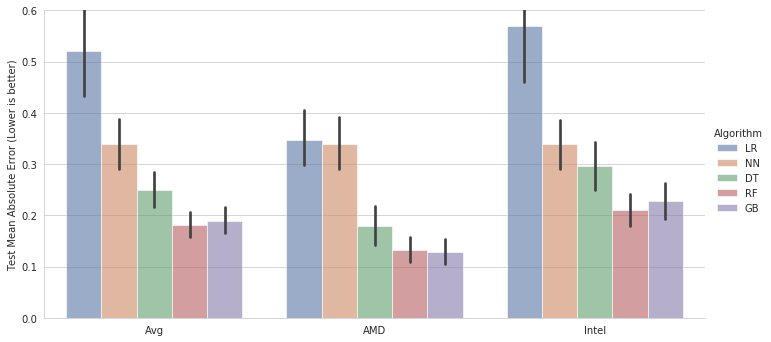

In [74]:
df = pd.read_csv("results/case1.csv")
orig = ['Avg', 'AuthenticAMD', 'GenuineIntel']
rep = ['Avg', 'AMD', 'Intel']
res_hard = []
for i in range(df.shape[0]):
    for j in range(len(orig)):
        if df["Hardware"][i] == orig[j]:
            res_hard.append(rep[j])
df['Hard2'] = res_hard

df = df.query("Algorithm!='SV'")


def change_width(ax, new_value) :
    locs = ax.get_xticks()
    for i,patch in enumerate(ax.patches):
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(locs[i//4] - (new_value * .5))

sns.set_style("whitegrid")
fig_size = (10, 5)

g = sns.catplot(
    data = df, 
    kind = "bar",
    x = "Hard2", 
    y = "Test Mean Absolute Error (Lower is better)", 
    hue = "Algorithm",
    #ci="sd", 
    palette="deep", 
    alpha=.6, 
    height=fig_size[1],
    aspect=fig_size[0]/fig_size[1]
)
#change_width(ax, .01)
plt.xlabel("")
plt.ylim((0,0.6))
plt.savefig("./results/fig6_phoronix.png", dpi = 300)
plt.show()

In [75]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='NN'")["Test Mean Absolute Error (Lower is better)"])

0.339296188483535

In [76]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='LR'")["Test Mean Absolute Error (Lower is better)"])

0.5212596228751777

In [77]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='RF'")["Test Mean Absolute Error (Lower is better)"])

0.18175300496290883

In [ ]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='DT'")["Test Mean Absolute Error (Lower is better)"])

In [254]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='SV'")["Test Mean Absolute Error (Lower is better)"])

nan

In [70]:
np.mean(df.query("Hardware=='Avg'").query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

UndefinedVariableError: name 'Hardware' is not defined

In [71]:
np.mean(df.query("Hardware=='AuthenticAMD'")["Test Mean Absolute Error (Lower is better)"])

UndefinedVariableError: name 'Hardware' is not defined

In [257]:
np.mean(df.query("Hardware=='GenuineIntel'")["Test Mean Absolute Error (Lower is better)"])

0.28507877543884524

In [258]:
np.mean(df.query("Hardware=='AuthenticAMD'")
        .query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

0.11694901474023597

In [259]:
np.mean(df.query("Hardware=='Avg'")["Test Mean Absolute Error (Lower is better)"])

0.24861247700298592

In [69]:
np.percentile(df.query("Hardware=='Avg'")
              .query("Algorithm=='NN'")["Test Mean Absolute Error (Lower is better)"], 75)-np.percentile(df.query("Hardware=='Avg'")
              .query("Algorithm=='NN'")["Test Mean Absolute Error (Lower is better)"], 25)

UndefinedVariableError: name 'Hardware' is not defined

In [261]:
np.std(df.query("Hardware=='Avg'")
              .query("Algorithm=='RF'")["Test Mean Absolute Error (Lower is better)"])

0.08612341012776342

In [262]:
np.std(df.query("Hardware=='Avg'")
              .query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

0.08749791855571135

In [263]:
np.std(df.query("Hardware=='Avg'")
              .query("Algorithm=='NN'")["Test Mean Absolute Error (Lower is better)"])

0.11375859435961322

In [264]:
np.std(df.query("Hardware=='Avg'")
              .query("Algorithm=='LR'")["Test Mean Absolute Error (Lower is better)"])

0.10567780905288178

### Feature Importances

In [51]:
envs = pd.read_csv("data/ls_cp_info_post_join.csv").set_index("idPhoronix")
envs.head()

to_keep = ['perf', 'nb_models', 'ls_architecture', 'ls_cpuop-mode', 'ls_cpu', 'ls_threadpercore',
           'ls_corepersocket', 
           'ls_socket', 'ls_numanode', 'ls_vendorid',  'ls_cpufamily', 'ls_model', 'ls_stepping', 
           'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz', 'ls_bogomips',
           'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_vendor_id','cp_cpufamily', 'cp_model',
           'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
           'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
           'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize',
           'cp_cache_alignment', 'cp_addresssizes', 'ls_range', 'price_dollar',
           'TDP', 'Process', 'Release Year']

num = ['nb_models', 'ls_cpu', 'ls_threadpercore', 'ls_corepersocket', 'ls_socket', 'ls_numanode', 
       'ls_cpufamily', 'ls_model', 'ls_stepping',  'ls_cpumhz', 'ls_cpumaxmhz', 
       'ls_cpuminmhz','ls_bogomips',  'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache',
       'cp_cpufamily', 'cp_model', 'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
       'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
       'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize', 
       'cp_cache_alignment', 'price_dollar', 'TDP', 'Process', 'Release Year']

categ = ['ls_architecture', 'ls_cpuop-mode', 'ls_vendorid', 'cp_vendor_id', 'cp_addresssizes', 'ls_range']

# separate average perfs from standard deviations
def separate_perf(perf):
    raw_perf = []
    std_perf = []

    for p in perf:
        tab = str(p).replace(" ", "").split("+/-")
        raw_perf.append(tab[0])
        if len(tab) > 1:
            std_perf.append(tab[1])
        else:
            std_perf.append('')

    return (raw_perf, std_perf)

maes = []
bad_sys = []

for sys_name in os.listdir(system_dir):

        try:

            sys = pd.read_csv(system_dir+sys_name, index_col = 0)

            if sys.shape[0] > 150:

                sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]

                sys = sys.set_index("id")

                perf_meta = sys.join(envs)[to_keep].query("ls_cpu!='NaN'").query("nb_models==1").query("ls_vendorid=='AuthenticAMD' or ls_vendorid=='GenuineIntel'").fillna("0")

                avg, std = separate_perf(perf_meta["perf"])

                perf_meta.loc[:, "avg"] = avg

                del perf_meta["perf"]

                X = perf_meta[num]#.join(pd.get_dummies(perf_meta[categ]))
                y = [float(k) for k in perf_meta["avg"]]
                y = (y-np.mean(y))/np.std(y)

                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

                alg = RandomForestRegressor()

                alg.fit(X_train, y_train)
                
                maes.append(alg.feature_importances_)

        except:
            bad_sys.append(sys_name)

In [52]:
for i in range(len(X.columns)):
    print(X_train.columns[i], np.round(np.mean([m[i] for m in maes]),4))

nb_models 0.0
ls_cpu 0.0731
ls_threadpercore 0.0022
ls_corepersocket 0.0611
ls_socket 0.0021
ls_numanode 0.0049
ls_cpufamily 0.0052
ls_model 0.0089
ls_stepping 0.0048
ls_cpumhz 0.0147
ls_cpumaxmhz 0.0577
ls_cpuminmhz 0.0093
ls_bogomips 0.0235
ls_l1dcache 0.013
ls_l1icache 0.0091
ls_l2cache 0.0102
ls_l3cache 0.1583
cp_cpufamily 0.0053
cp_model 0.0096
cp_stepping 0.0062
cp_cpumhz 0.0114
cp_cachesize 0.0175
cp_physicalid 0.0
cp_siblings 0.0807
cp_cpucores 0.0791
cp_apicid 0.0012
cp_cpuidlevel 0.0474
cp_bogomips 0.0463
cp_clflushsize 0.0
cp_cache_alignment 0.0008
price_dollar 0.0556
TDP 0.0669
Process 0.0498
Release Year 0.0643


#### SPEC

In [86]:
spec = pd.read_csv("../cpu_selection-master/spec_data.csv", index_col = 0)
spec.columns = ['bench', 'run time', 'score', 'idSPEC', 'freq', 'memory type', 'memory size']
spec = spec.drop(['score'], axis = 1)

# Intel Specifications
intel = pd.read_csv("./data/intel_chips_modif.csv").set_index('idSPEC')

# join spec cpu perfs with intel specif
spec = spec.join(intel, on='idSPEC').query("not uarch.isnull()").fillna(0)

perf = 'run time'

to_keep = ['bench', 'idSPEC',]

num = ['freq', 'memory size', 
        'launch_year', 'cache',  'bus_speed',  'max memory size',
        '# of memory channels', 'max memory bandwidth',
       'ecc memory supported', 'graphics base frequency',
       'graphics max dynamic frequency', 'graphics video max memory',
       '# of d isplays supported', 'graphics and imc lithography',
       'pci express revision', 'pci express lanes', 'lithography',
       '# of cores', '# of threads', 'base frequency', 'turbo frequency',
       'tdp-up frequency', 'tdp-up', 
       'tdp (W)', 'turbo boost technology', 'vpro', 'hyper-threading',
       '(vt-x)', '(vt-d)', 'tsx-ni', 'idle states', 'speedstep',
       'thermal mo nitoring', 'identity protection', 'aes new instructions',
       'secure key', 'trusted execution', 'execute disable bit', 'anti-theft',
       'price']

categ = ['memory type', 'memory types', 'chip type','bus_type', 'instruction set extensions', 
         'instruction set', 'processor number', 
         'tdp-down frequency', 't dp-down', 'processor graphics', 'type_cache', ]

workloads = pd.Series(spec['bench']).unique()

skus = pd.Series(spec['idSPEC']).unique()

uarchs = pd.Series(spec['uarch']).unique()

spec.groupby(['bench']).count()

In [ ]:
res_rq1_spec = dict()

ms = [LinearRegression(), DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor()]
name_ms = ['LR', 'DT', 'RF', 'GB', 'NN']

ms_dict = dict()

for i in range(len(ms)):
    ms_dict[name_ms[i]]=ms[i]
            
blacklist_arch = ['penryn', 'nehalem','merom', 'silvermont']

rms = RMSprop(learning_rate=0.001)

for nms in name_ms:
    print(nms)
    for arch in uarchs:
        #print(arch)
        if arch not in blacklist_arch:
            res_rq1_spec[nms, arch] = []
    if nms == 'NN':
        for j in range(len(workloads)):
            print(workloads[j])
            df = spec.query("bench=='"+workloads[j]+"'")#.query("uarch=='"+arch+"'")
            X = df[num].join(df['uarch'])#.join(pd.get_dummies(df[categ]))
            y = df[perf]
            y = (y-np.mean(y))/np.std(y)
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)
            
            X_train = X_train.drop(['uarch'], axis = 1)

            model = Sequential()

            model.add(Dense(X_train.shape[1], input_shape=(X_train.shape[1],)))
            model.add(Dense(100, activation = 'tanh'))
            #model.add(Dropout(0.5))
            model.add(Dense(100, activation = 'tanh'))
            model.add(Dense(100, activation = 'tanh'))
            #model.add(Dropout(0.2))
            model.add(Dense(1))

            model.compile(loss = 'mae', optimizer = rms) #optimizer = 'adam')

            model.fit(np.array(X_train, dtype=float), y_train, epochs = 300, verbose =1)

            uarch_test = np.array(X_test['uarch'])

            X_test = X_test.drop(['uarch'], axis = 1)

            y_pred = model.predict(np.array(X_test, dtype=float))

            y_test = np.array(y_test)

            for i in range(len(uarch_test)):
                if uarch_test[i] not in blacklist_arch:
                    res_rq1_spec[nms, uarch_test[i]].append(np.abs(y_test[i]-y_pred[i])[0])
    else:
        for j in range(len(workloads)):
            print(workloads[j])
            df = spec.query("bench=='"+workloads[j]+"'")#.query("uarch=='"+arch+"'")
            X = df[num].join(df['uarch']).join(pd.get_dummies(df[categ]))
            y = df[perf]
            y = (y-np.mean(y))/np.std(y)
            for i in range(20):
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)
                X_train = X_train.drop(['uarch'], axis = 1)
                clf = ms_dict[nms]
                clf.fit(X_train, y_train)
                uarch_test = np.array(X_test['uarch'])
                X_test = X_test.drop(['uarch'], axis = 1)
                y_pred = clf.predict(X_test)
                y_test = np.array(y_test)
                for i in range(len(uarch_test)):
                    if uarch_test[i] not in blacklist_arch:
                        res_rq1_spec[nms, uarch_test[i]].append(np.abs(y_test[i]-y_pred[i]))

Index(['Unnamed: 0', 'Test Mean Absolute Error (Lower is better)',
       'Architecture', 'Algorithm'],
      dtype='object')


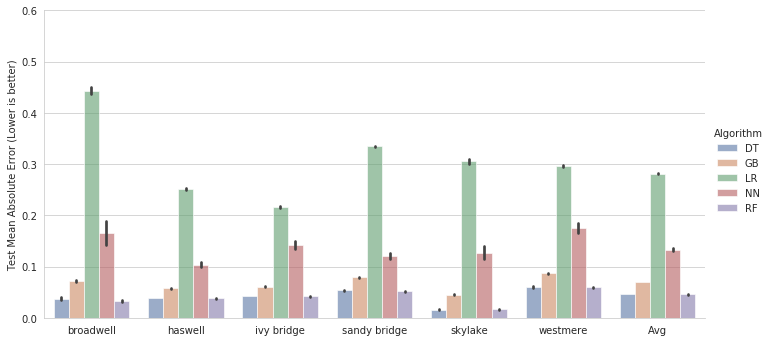

In [266]:
res = []
for i in sorted(res_rq1_spec.keys()):
    nms, arch = i
    val = res_rq1_spec[i]
    for v in val:
        res.append((v, arch, nms))
for i in res_rq1_spec.keys():
    nms, arch = i
    val = res_rq1_spec[i]
    for v in val:
        res.append((v, 'Avg', nms))
res

df = pd.DataFrame(res)
df.columns = ["Test Mean Absolute Error (Lower is better)", "Architecture", "Algorithm"]
#df.to_csv('./data/fig6_data_spec.csv')
df = pd.read_csv('./data/fig6_data_spec.csv')

print(df.columns)

df.sort_values(by=['Algorithm','Architecture'])

sns.set_style("whitegrid")
fig_size = (10, 5)
g = sns.catplot(
    data = df, 
    kind = "bar",
    x = "Architecture", 
    y = "Test Mean Absolute Error (Lower is better)", 
    hue = "Algorithm",
    palette="deep", 
    alpha=.6, 
    height=fig_size[1],
    aspect=fig_size[0]/fig_size[1]
)
plt.xlabel("")
plt.ylim((0,0.6))
plt.savefig("./results/fig6_spec.png", dpi = 300)
plt.show()

In [268]:
np.mean(df.query("Architecture=='Avg'")["Test Mean Absolute Error (Lower is better)"])

0.1111175012912563

In [269]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='LR'")["Test Mean Absolute Error (Lower is better)"])

0.2811752562365011

In [270]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='RF'")["Test Mean Absolute Error (Lower is better)"])

0.04582810825800497

In [271]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

0.06944515553346936

#### GeekBench

In [83]:
with open('../cpu_selection-master/geek_data.json','r') as geek_data:
    geek = pd.DataFrame(json.load(geek_data))
    geek.columns = ['idGeekBench', 'freq', 'L2', 'L3', 'memory', 
                    'bench', 'single/multicore', 'score', 'perf']
geek = geek.drop(['score'], axis = 1)

# Intel Specifications
intel = pd.read_csv("./data/intel_chips_modif.csv").set_index('idGeekBench')

geek = geek.join(intel, on='idGeekBench').query("not uarch.isnull()").fillna(0)

geek['perf'] = [float(k) for k in geek['perf']]

perf = 'perf'

to_keep = ['bench', 'idGeekBench']

num = ['freq', 'memory', 'L3', 'single/multicore',
        'launch_year', 'cache', 'bus_speed', 'max memory size',
        '# of memory channels', 'max memory bandwidth',
       'ecc memory supported', 'graphics base frequency',
       'graphics max dynamic frequency', 'graphics video max memory',
       '# of d isplays supported', 'graphics and imc lithography',
       'pci express revision', 'pci express lanes', 'lithography',
       '# of cores', '# of threads', 'base frequency', 'turbo frequency',
       'tdp-up frequency', 'tdp-up', 
       'tdp (W)', 'turbo boost technology', 'vpro', 'hyper-threading',
       '(vt-x)', '(vt-d)', 'tsx-ni', 'idle states', 'speedstep',
       'thermal mo nitoring', 'identity protection', 'aes new instructions',
       'secure key', 'trusted execution', 'execute disable bit', 'anti-theft',
       'price']

categ = ['memory types', 'chip type','bus_type', 'instruction set extensions', 
         'instruction set', 'processor number', 
         'tdp-down frequency', 't dp-down', 'uarch', 'processor graphics', 'type_cache']

workloads = pd.Series(geek['bench']).unique()

skus = pd.Series(geek['idGeekBench']).unique()

uarchs = pd.Series(geek['uarch']).unique()

geek.groupby(['bench']).count()

print("normalize")
for c in geek.columns:
    if c in num and c != 'uarch':
        print(c)
        stdg = max(np.std(geek[c]),0.01)
        meang = np.mean(geek[c])
        geek = geek.assign(c = lambda x: (x[c]-meang)/stdg)

In [41]:
res_rq1_geek = dict()

ms = [LinearRegression(), DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor()]#, SVR]
name_ms = ['LR', 'DT', 'RF', 'GB', 'NN']#, 'SV']

ms_dict = dict()

for i in range(len(ms)):
    ms_dict[name_ms[i]] = ms[i]

rms = RMSprop(learning_rate = 0.001)

blacklist_arch = ['penryn', 'nehalem','merom', 'silvermont']

for nms in name_ms:
    print(nms)
    for arch in uarchs:
        if arch not in blacklist_arch:
            res_rq1_geek[nms, arch] = []
            for j in range(len(workloads)):
                print(workloads[j])
                if nms == 'NN':
                    df = geek.query("bench=='"+workloads[j]+"'").query("uarch=='"+arch+"'")
                    X = df[num]#.join(pd.get_dummies(df[categ]))
                    y = df[perf]
                    y = (y-np.mean(y))/np.std(y)
                    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

                    model = Sequential()

                    model.add(Dense(X_train.shape[1], input_shape=(X_train.shape[1],)))
                    model.add(Dense(100, activation = 'tanh'))
                    #model.add(Dropout(0.5))
                    model.add(Dense(100, activation = 'tanh'))
                    model.add(Dense(100, activation = 'tanh'))
                    #model.add(Dropout(0.2))
                    model.add(Dense(1))

                    model.compile(loss = 'mae', optimizer = rms) #optimizer = 'adam')

                    model.fit(np.array(X_train, dtype=float), y_train, epochs = 5, verbose =1)

                    y_pred = model.predict(np.array(X_test, dtype=float))

                    y_test = np.array(y_test)

                    res_rq1_geek[nms, arch].append(mean_absolute_error(y_pred, y_test))

                else:
                    maes = []
                    df = geek.query("bench=='"+workloads[j]+"'").query("uarch=='"+arch+"'")
                    X = df[num].join(pd.get_dummies(df[categ]))
                    y = df[perf]
                    y = (y-np.mean(y))/np.std(y)
                    for i in range(20):
                        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)
                        clf = ms_dict[nms]
                        clf.fit(X_train, y_train)
                        y_pred = clf.predict(X_test)
                        maes.append(mean_absolute_error(y_test, y_pred))
                    res_rq1_geek[nms, arch].append(maes)

LR
AES
Twofish
SHA1
SHA2
BZip2 Compress
BZip2 Decompress
JPEG Compress
JPEG Decompress
PNG Compress
PNG Decompress
Sobel
Lua
Dijkstra
BlackScholes
Mandelbrot
Sharpen Filter
Blur Filter
SGEMM
DGEMM
SFFT
DFFT
N-Body
Ray Trace
Stream Copy
Stream Scale
Stream Add
Stream Triad
AES
Twofish
SHA1
SHA2
BZip2 Compress
BZip2 Decompress
JPEG Compress
JPEG Decompress
PNG Compress
PNG Decompress
Sobel
Lua
Dijkstra
BlackScholes
Mandelbrot
Sharpen Filter
Blur Filter
SGEMM
DGEMM
SFFT
DFFT
N-Body
Ray Trace
Stream Copy
Stream Scale
Stream Add
Stream Triad
AES
Twofish
SHA1
SHA2
BZip2 Compress
BZip2 Decompress
JPEG Compress
JPEG Decompress
PNG Compress
PNG Decompress
Sobel
Lua
Dijkstra
BlackScholes
Mandelbrot
Sharpen Filter
Blur Filter
SGEMM
DGEMM
SFFT
DFFT
N-Body
Ray Trace
Stream Copy
Stream Scale
Stream Add
Stream Triad
AES
Twofish
SHA1
SHA2
BZip2 Compress
BZip2 Decompress
JPEG Compress
JPEG Decompress
PNG Compress
PNG Decompress
Sobel
Lua
Dijkstra
BlackScholes
Mandelbrot
Sharpen Filter
Blur Filter
SGEMM

Epoch 1/5
4883/4883 [==============================] - 1s 139us/step - loss: 1.0144
Epoch 2/5
4883/4883 [==============================] - 0s 86us/step - loss: 0.9978
Epoch 3/5
4883/4883 [==============================] - 0s 77us/step - loss: 0.9878
Epoch 4/5
4883/4883 [==============================] - 0s 72us/step - loss: 0.9948
Epoch 5/5
4883/4883 [==============================] - 0s 71us/step - loss: 0.9822
BZip2 Decompress
Epoch 1/5
4883/4883 [==============================] - 1s 125us/step - loss: 1.0202
Epoch 2/5
4883/4883 [==============================] - 1s 150us/step - loss: 0.9940
Epoch 3/5
4883/4883 [==============================] - 0s 84us/step - loss: 0.9955
Epoch 4/5
4883/4883 [==============================] - 0s 80us/step - loss: 1.0016
Epoch 5/5
4883/4883 [==============================] - 0s 93us/step - loss: 0.9869
JPEG Compress
Epoch 1/5
4883/4883 [==============================] - 1s 124us/step - loss: 1.0115
Epoch 2/5
4883/4883 [==============================]

4883/4883 [==============================] - 1s 149us/step - loss: 0.9167
Epoch 2/5
4883/4883 [==============================] - 0s 92us/step - loss: 0.8652
Epoch 3/5
4883/4883 [==============================] - 0s 83us/step - loss: 0.8570
Epoch 4/5
4883/4883 [==============================] - 0s 81us/step - loss: 0.8516
Epoch 5/5
4883/4883 [==============================] - 0s 83us/step - loss: 0.8509
Stream Scale
Epoch 1/5
4883/4883 [==============================] - 1s 130us/step - loss: 0.9308
Epoch 2/5
4883/4883 [==============================] - 0s 99us/step - loss: 0.8828
Epoch 3/5
4883/4883 [==============================] - 0s 88us/step - loss: 0.8705
Epoch 4/5
4883/4883 [==============================] - 1s 118us/step - loss: 0.8636
Epoch 5/5
4883/4883 [==============================] - 0s 94us/step - loss: 0.8639
Stream Add
Epoch 1/5
4883/4883 [==============================] - 1s 132us/step - loss: 0.8989
Epoch 2/5
4883/4883 [==============================] - 0s 75us/step -

10350/10350 [==============================] - 1s 109us/step - loss: 0.7475
Sharpen Filter
Epoch 1/5
10350/10350 [==============================] - 1s 138us/step - loss: 0.8075
Epoch 2/5
10350/10350 [==============================] - 1s 120us/step - loss: 0.7819
Epoch 3/5
10350/10350 [==============================] - 1s 133us/step - loss: 0.7828
Epoch 4/5
10350/10350 [==============================] - 1s 115us/step - loss: 0.7792
Epoch 5/5
10350/10350 [==============================] - 1s 142us/step - loss: 0.7806
Blur Filter
Epoch 1/5
10350/10350 [==============================] - 1s 111us/step - loss: 0.7896
Epoch 2/5
10350/10350 [==============================] - 1s 97us/step - loss: 0.7683
Epoch 3/5
10350/10350 [==============================] - 1s 86us/step - loss: 0.7630
Epoch 4/5
10350/10350 [==============================] - 1s 110us/step - loss: 0.7604
Epoch 5/5
10350/10350 [==============================] - 1s 105us/step - loss: 0.7605
SGEMM
Epoch 1/5
10350/10350 [==========

7268/7268 [==============================] - 1s 112us/step - loss: 0.9188
Epoch 5/5
7268/7268 [==============================] - 1s 125us/step - loss: 0.9132
JPEG Decompress
Epoch 1/5
7268/7268 [==============================] - 1s 132us/step - loss: 0.9086
Epoch 2/5
7268/7268 [==============================] - 1s 132us/step - loss: 0.8830
Epoch 3/5
7268/7268 [==============================] - 1s 129us/step - loss: 0.8806
Epoch 4/5
7268/7268 [==============================] - 1s 142us/step - loss: 0.8796
Epoch 5/5
7268/7268 [==============================] - 1s 113us/step - loss: 0.8792
PNG Compress
Epoch 1/5
7268/7268 [==============================] - 1s 140us/step - loss: 0.9448
Epoch 2/5
7268/7268 [==============================] - 1s 123us/step - loss: 0.9288
Epoch 3/5
7268/7268 [==============================] - 1s 139us/step - loss: 0.9294
Epoch 4/5
7268/7268 [==============================] - 1s 122us/step - loss: 0.9182
Epoch 5/5
7268/7268 [==============================] - 1s

7268/7268 [==============================] - 1s 106us/step - loss: 0.8093
Epoch 5/5
7268/7268 [==============================] - 1s 97us/step - loss: 0.8092
Stream Triad
Epoch 1/5
7268/7268 [==============================] - 1s 120us/step - loss: 0.8513
Epoch 2/5
7268/7268 [==============================] - 1s 106us/step - loss: 0.8244
Epoch 3/5
7268/7268 [==============================] - 1s 117us/step - loss: 0.8199
Epoch 4/5
7268/7268 [==============================] - 1s 119us/step - loss: 0.8177
Epoch 5/5
7268/7268 [==============================] - 1s 91us/step - loss: 0.8160
AES
Epoch 1/5
8668/8668 [==============================] - 1s 136us/step - loss: 0.9413
Epoch 2/5
8668/8668 [==============================] - 1s 103us/step - loss: 0.9172
Epoch 3/5
8668/8668 [==============================] - 1s 134us/step - loss: 0.9101
Epoch 4/5
8668/8668 [==============================] - 1s 112us/step - loss: 0.9102
Epoch 5/5
8668/8668 [==============================] - 1s 102us/step - 

8668/8668 [==============================] - 1s 119us/step - loss: 0.9401
Epoch 5/5
8668/8668 [==============================] - 1s 115us/step - loss: 0.9383
DGEMM
Epoch 1/5
8668/8668 [==============================] - 1s 138us/step - loss: 0.9546
Epoch 2/5
8668/8668 [==============================] - 1s 148us/step - loss: 0.9331
Epoch 3/5
8668/8668 [==============================] - 1s 143us/step - loss: 0.9308
Epoch 4/5
8668/8668 [==============================] - 1s 129us/step - loss: 0.9274
Epoch 5/5
8668/8668 [==============================] - 1s 130us/step - loss: 0.9236
SFFT
Epoch 1/5
8668/8668 [==============================] - 1s 131us/step - loss: 0.9906
Epoch 2/5
8668/8668 [==============================] - 1s 123us/step - loss: 0.9735
Epoch 3/5
8668/8668 [==============================] - 1s 114us/step - loss: 0.9668
Epoch 4/5
8668/8668 [==============================] - 1s 118us/step - loss: 0.9621
Epoch 5/5
8668/8668 [==============================] - 1s 130us/step - loss

Epoch 2/5
28/28 [==============================] - 0s 134us/step - loss: 2.2068
Epoch 3/5
28/28 [==============================] - 0s 107us/step - loss: 0.7791
Epoch 4/5
28/28 [==============================] - 0s 425us/step - loss: 0.8583
Epoch 5/5
28/28 [==============================] - 0s 196us/step - loss: 0.9682
Lua
Epoch 1/5
28/28 [==============================] - 0s 12ms/step - loss: 1.4322
Epoch 2/5
28/28 [==============================] - 0s 384us/step - loss: 1.9086
Epoch 3/5
28/28 [==============================] - 0s 431us/step - loss: 1.0070
Epoch 4/5
28/28 [==============================] - 0s 249us/step - loss: 0.8266
Epoch 5/5
28/28 [==============================] - 0s 267us/step - loss: 1.1855
Dijkstra
Epoch 1/5
28/28 [==============================] - 0s 10ms/step - loss: 0.8461
Epoch 2/5
28/28 [==============================] - 0s 337us/step - loss: 2.5665
Epoch 3/5
28/28 [==============================] - 0s 225us/step - loss: 0.7911
Epoch 4/5
28/28 [============

2232/2232 [==============================] - 1s 247us/step - loss: 1.0228
Epoch 2/5
2232/2232 [==============================] - 0s 173us/step - loss: 0.9920
Epoch 3/5
2232/2232 [==============================] - 0s 145us/step - loss: 0.9740
Epoch 4/5
2232/2232 [==============================] - 0s 138us/step - loss: 0.9826
Epoch 5/5
2232/2232 [==============================] - 0s 133us/step - loss: 0.9903
BZip2 Compress
Epoch 1/5
2232/2232 [==============================] - 0s 206us/step - loss: 0.9935
Epoch 2/5
2232/2232 [==============================] - 0s 79us/step - loss: 0.9634
Epoch 3/5
2232/2232 [==============================] - 0s 87us/step - loss: 0.9768
Epoch 4/5
2232/2232 [==============================] - 0s 117us/step - loss: 0.9433
Epoch 5/5
2232/2232 [==============================] - 0s 122us/step - loss: 0.9557
BZip2 Decompress
Epoch 1/5
2232/2232 [==============================] - 1s 246us/step - loss: 0.9881
Epoch 2/5
2232/2232 [==============================] - 0

2232/2232 [==============================] - 1s 258us/step - loss: 1.0174
Epoch 2/5
2232/2232 [==============================] - 0s 113us/step - loss: 0.9572
Epoch 3/5
2232/2232 [==============================] - 0s 107us/step - loss: 0.9743
Epoch 4/5
2232/2232 [==============================] - 0s 133us/step - loss: 0.9605
Epoch 5/5
2232/2232 [==============================] - 0s 115us/step - loss: 0.9678
Stream Copy
Epoch 1/5
2232/2232 [==============================] - 0s 204us/step - loss: 0.9083
Epoch 2/5
2232/2232 [==============================] - 0s 68us/step - loss: 0.8630
Epoch 3/5
2232/2232 [==============================] - 0s 90us/step - loss: 0.8569
Epoch 4/5
2232/2232 [==============================] - 0s 66us/step - loss: 0.8565
Epoch 5/5
2232/2232 [==============================] - 0s 90us/step - loss: 0.8636
Stream Scale
Epoch 1/5
2232/2232 [==============================] - 0s 223us/step - loss: 0.9041
Epoch 2/5
2232/2232 [==============================] - 0s 104us/s

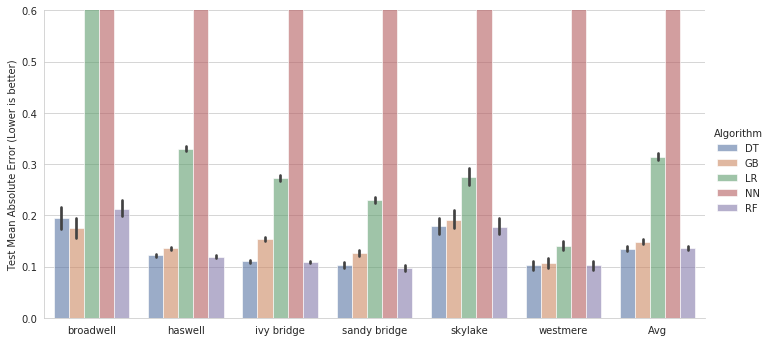

In [59]:
res = []
for i in sorted(res_rq1_geek.keys()):
    nms, arch = i
    val = res_rq1_geek[i]
    for v in np.array(val).reshape(-1,1):
        res.append((v[0], arch, nms))
for i in sorted(res_rq1_geek.keys()):
    nms, arch = i
    val = res_rq1_geek[i]
    for v in np.array(val).reshape(-1,1):
        res.append((v[0], 'Avg', nms))
res

df = pd.DataFrame(res)
df.columns = ["Test Mean Absolute Error (Lower is better)", "Architecture", "Algorithm"]
#df.to_csv('./data/fig6_data_geek.csv')
#df = pd.read_csv('./data/fig6_data_geek.csv')
#df.sort_values(by=['Algorithm','Architecture'])

sns.set_style("whitegrid")
fig_size = (10, 5)
g = sns.catplot(
    data = df, 
    kind = "bar", 
    x = "Architecture", 
    y = "Test Mean Absolute Error (Lower is better)", 
    hue = "Algorithm", 
    palette="deep", 
    alpha=.6, 
    height=fig_size[1],
    aspect=fig_size[0]/fig_size[1]
)
plt.xlabel("")
plt.ylim((0,0.6))
plt.savefig("./results/fig6_geek.png", dpi = 300)
plt.show()

In [53]:
np.mean(df.query("Architecture=='Avg'")["Test Mean Absolute Error (Lower is better)"])

0.19245403180720447

In [54]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='LR'")["Test Mean Absolute Error (Lower is better)"])

0.3145446708078504

In [55]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='RF'")["Test Mean Absolute Error (Lower is better)"])

0.13637262211566353

In [56]:
np.mean(df.query("Architecture=='Avg'").query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

0.14822167645563947

#### AI-BenchMark

In [79]:
# download hardware properties
ai_prop = pd.read_csv("./data/ai_bench_specs.csv").set_index("Device")

# download hardware perfs
ai_perf = pd.read_csv("./data/ai_bench_perfs.csv").set_index("Device")

ai_df =  ai_prop.join(ai_perf, how = "inner")

to_keep = ['Brand']

num = ['RAM', 'Year', 'Android', 'Updated', 'CPU-Qscore', 'CPU-Fscore', 'INT8NNAPI 1.1', 'INT8NNAPI 1.2', 
       'INT8Accuracy', 'FP16NNAPI 1.1', 'FP16NNAPI 1.2', 'FP16Accuracy', 'INT8Parallel',
       'FP16Parallel', 'LSTM', 'Memory']

categ = ['Lib']

workloads = pd.Series(ai_perf.columns).unique()

brands = pd.Series(ai_df['Brand']).unique()

brands_nb = dict()

for b in ai_df['Brand']:
    if b not in brands_nb:
        brands_nb[b] = 1
    else:
        brands_nb[b]+= 1

brands_keep = [b for b in brands_nb if brands_nb[b] > 40]
brands_keep

['Huawei', 'Motorola', 'Oppo', 'Samsung', 'Sony', 'Xiaomi', 'vivo']

In [82]:
np.mean([brands_nb[b] for b in brands_keep])

88.14285714285714

In [190]:
res_rq1_ai = dict()

ms = [ElasticNet(l1_ratio=0), DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor()]
name_ms = ['LR', 'DT', 'RF', 'GB', 'NN']

ms_dict = dict()

for i in range(len(ms)):
    ms_dict[name_ms[i]]=ms[i]

rms = RMSprop(learning_rate=0.001)

for nms in name_ms:
    print(nms)
    for brand in brands_keep:
        print(brand)
        res_rq1_ai[nms, brand] = []
        if nms == 'NN':
            for j in range(len(workloads)):
                print(workloads[j])
                df = ai_df.query("Brand=='"+brand+"'")
                X = df[num]
                X['Brand'] = df['Brand']#.join(pd.get_dummies(df[categ]))
                y = df[workloads[j]]
                y = (y-np.mean(y))/np.std(y)
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

                X_train = X_train.drop(['Brand'], axis = 1)

                model = Sequential()

                model.add(Dense(X_train.shape[1], input_shape=(X_train.shape[1],)))
                model.add(Dense(100, activation = 'tanh'))
                #model.add(Dropout(0.5))
                model.add(Dense(100, activation = 'tanh'))
                model.add(Dense(100, activation = 'tanh'))
                #model.add(Dropout(0.2))
                model.add(Dense(1))

                model.compile(loss = 'mae', optimizer = rms) #optimizer = 'adam')

                model.fit(np.array(X_train, dtype=float), y_train, epochs = 300, verbose =1)

                uarch_test = np.array(X_test['Brand'])

                X_test = X_test.drop(['Brand'], axis = 1)

                y_pred = model.predict(np.array(X_test, dtype=float))

                y_test = np.array(y_test)

                for i in range(len(uarch_test)):
                    if uarch_test[i] not in blacklist_arch:
                        res_rq1_ai[nms, uarch_test[i]].append(np.abs(y_test[i]-y_pred[i])[0])
        else:
            for j in range(len(workloads)):
                #print(workloads[j])
                df = ai_df.query("Brand=='"+brand+"'")
                X = df[num]
                categ = pd.get_dummies(df[categ])
                #for c in categ.columns:
                #    X[c] = [float(k) for k in categ[c]]
                y = df[workloads[j]]
                y = (y-np.mean(y))/np.std(y)
                for i in range(20):
                    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)
                    #for c in X.columns:
                    #    X[c] = (X[c]-np.mean(X[c]))/(np.std(X[c])+1e-2)
                    clf = ms_dict[nms]
                    clf.fit(X_train, y_train)
                    y_pred = clf.predict(X_test)
                    y_test = np.array(y_test)
                    for i in range(len(y_test)):
                        res_rq1_ai[nms, brand].append(np.abs(y_test[i]-y_pred[i]))

LR
Huawei
Motorola
Oppo
Samsung
Sony
Xiaomi
vivo
DT
Huawei
Motorola
Oppo
Samsung
Sony
Xiaomi
vivo
RF
Huawei
Motorola
Oppo
Samsung
Sony
Xiaomi
vivo
GB
Huawei
Motorola
Oppo
Samsung
Sony
Xiaomi
vivo
NN
Huawei
MobileNet-V2-CPU-Q
Epoch 1/300
63/63 [==============================] - 1s 13ms/step - loss: 1.3926
Epoch 2/300
63/63 [==============================] - 0s 374us/step - loss: 0.7709
Epoch 3/300
63/63 [==============================] - 0s 190us/step - loss: 0.8122
Epoch 4/300
63/63 [==============================] - 0s 134us/step - loss: 0.7588
Epoch 5/300
63/63 [==============================] - 0s 180us/step - loss: 0.3592
Epoch 6/300
63/63 [==============================] - 0s 96us/step - loss: 0.6975
Epoch 7/300
63/63 [==============================] - 0s 116us/step - loss: 0.4678
Epoch 8/300
63/63 [==============================] - 0s 129us/step - loss: 0.4261
Epoch 9/300
63/63 [==============================] - 0s 149us/step - loss: 0.4024
Epoch 10/300
63/63 [===================

63/63 [==============================] - 0s 147us/step - loss: 0.2783
Epoch 98/300
63/63 [==============================] - 0s 119us/step - loss: 0.2985
Epoch 99/300
63/63 [==============================] - 0s 176us/step - loss: 0.2489
Epoch 100/300
63/63 [==============================] - 0s 158us/step - loss: 0.3442
Epoch 101/300
63/63 [==============================] - 0s 96us/step - loss: 0.2487
Epoch 102/300
63/63 [==============================] - 0s 156us/step - loss: 0.2753
Epoch 103/300
63/63 [==============================] - 0s 254us/step - loss: 0.3169
Epoch 104/300
63/63 [==============================] - 0s 123us/step - loss: 0.2676
Epoch 105/300
63/63 [==============================] - 0s 66us/step - loss: 0.2713
Epoch 106/300
63/63 [==============================] - 0s 109us/step - loss: 0.2555
Epoch 107/300
63/63 [==============================] - 0s 100us/step - loss: 0.2175
Epoch 108/300
63/63 [==============================] - 0s 124us/step - loss: 0.3335
Epoch 109/

63/63 [==============================] - 0s 137us/step - loss: 0.1500
Epoch 195/300
63/63 [==============================] - 0s 187us/step - loss: 0.2368
Epoch 196/300
63/63 [==============================] - 0s 153us/step - loss: 0.2149
Epoch 197/300
63/63 [==============================] - 0s 136us/step - loss: 0.2631
Epoch 198/300
63/63 [==============================] - 0s 142us/step - loss: 0.2122
Epoch 199/300
63/63 [==============================] - 0s 281us/step - loss: 0.2900
Epoch 200/300
63/63 [==============================] - 0s 139us/step - loss: 0.2672
Epoch 201/300
63/63 [==============================] - 0s 205us/step - loss: 0.2173
Epoch 202/300
63/63 [==============================] - 0s 95us/step - loss: 0.2126
Epoch 203/300
63/63 [==============================] - 0s 238us/step - loss: 0.2354
Epoch 204/300
63/63 [==============================] - 0s 147us/step - loss: 0.2187
Epoch 205/300
63/63 [==============================] - 0s 280us/step - loss: 0.2513
Epoch 2

63/63 [==============================] - 0s 567us/step - loss: 0.2340
Epoch 292/300
63/63 [==============================] - 0s 292us/step - loss: 0.1773
Epoch 293/300
63/63 [==============================] - 0s 237us/step - loss: 0.1462
Epoch 294/300
63/63 [==============================] - 0s 245us/step - loss: 0.2156
Epoch 295/300
63/63 [==============================] - 0s 264us/step - loss: 0.2026
Epoch 296/300
63/63 [==============================] - 0s 240us/step - loss: 0.1468
Epoch 297/300
63/63 [==============================] - 0s 587us/step - loss: 0.1636
Epoch 298/300
63/63 [==============================] - 0s 165us/step - loss: 0.1781
Epoch 299/300
63/63 [==============================] - 0s 213us/step - loss: 0.2142
Epoch 300/300
63/63 [==============================] - 0s 247us/step - loss: 0.1464
MobileNet-V2-CPU-F
Epoch 1/300
63/63 [==============================] - 1s 12ms/step - loss: 1.7946
Epoch 2/300
63/63 [==============================] - 0s 127us/step - loss:

63/63 [==============================] - 0s 162us/step - loss: 0.1802
Epoch 90/300
63/63 [==============================] - 0s 189us/step - loss: 0.2745
Epoch 91/300
63/63 [==============================] - 0s 179us/step - loss: 0.1576
Epoch 92/300
63/63 [==============================] - 0s 229us/step - loss: 0.1887
Epoch 93/300
63/63 [==============================] - 0s 108us/step - loss: 0.2859
Epoch 94/300
63/63 [==============================] - 0s 121us/step - loss: 0.2220
Epoch 95/300
63/63 [==============================] - 0s 191us/step - loss: 0.1806
Epoch 96/300
63/63 [==============================] - 0s 105us/step - loss: 0.1912
Epoch 97/300
63/63 [==============================] - 0s 128us/step - loss: 0.2932
Epoch 98/300
63/63 [==============================] - 0s 122us/step - loss: 0.2457
Epoch 99/300
63/63 [==============================] - 0s 134us/step - loss: 0.2150
Epoch 100/300
63/63 [==============================] - 0s 153us/step - loss: 0.2057
Epoch 101/300
63

63/63 [==============================] - 0s 155us/step - loss: 0.1221
Epoch 186/300
63/63 [==============================] - 0s 253us/step - loss: 0.1347
Epoch 187/300
63/63 [==============================] - 0s 111us/step - loss: 0.2103
Epoch 188/300
63/63 [==============================] - 0s 91us/step - loss: 0.2534
Epoch 189/300
63/63 [==============================] - 0s 96us/step - loss: 0.1503
Epoch 190/300
63/63 [==============================] - 0s 154us/step - loss: 0.1592
Epoch 191/300
63/63 [==============================] - 0s 145us/step - loss: 0.1680
Epoch 192/300
63/63 [==============================] - 0s 251us/step - loss: 0.2497
Epoch 193/300
63/63 [==============================] - 0s 104us/step - loss: 0.1840
Epoch 194/300
63/63 [==============================] - 0s 122us/step - loss: 0.1564
Epoch 195/300
63/63 [==============================] - 0s 96us/step - loss: 0.1562
Epoch 196/300
63/63 [==============================] - 0s 105us/step - loss: 0.1795
Epoch 197

63/63 [==============================] - 0s 130us/step - loss: 0.2032
Epoch 283/300
63/63 [==============================] - 0s 196us/step - loss: 0.1440
Epoch 284/300
63/63 [==============================] - 0s 142us/step - loss: 0.1853
Epoch 285/300
63/63 [==============================] - 0s 129us/step - loss: 0.1207
Epoch 286/300
63/63 [==============================] - 0s 402us/step - loss: 0.1470
Epoch 287/300
63/63 [==============================] - 0s 400us/step - loss: 0.1987
Epoch 288/300
63/63 [==============================] - 0s 190us/step - loss: 0.1716
Epoch 289/300
63/63 [==============================] - 0s 129us/step - loss: 0.1300
Epoch 290/300
63/63 [==============================] - 0s 153us/step - loss: 0.1862
Epoch 291/300
63/63 [==============================] - 0s 308us/step - loss: 0.1520
Epoch 292/300
63/63 [==============================] - 0s 118us/step - loss: 0.1462
Epoch 293/300
63/63 [==============================] - 0s 138us/step - loss: 0.1574
Epoch 

63/63 [==============================] - 0s 165us/step - loss: 0.2070
Epoch 81/300
63/63 [==============================] - 0s 90us/step - loss: 0.1917
Epoch 82/300
63/63 [==============================] - 0s 171us/step - loss: 0.1747
Epoch 83/300
63/63 [==============================] - 0s 203us/step - loss: 0.3051
Epoch 84/300
63/63 [==============================] - 0s 101us/step - loss: 0.3006
Epoch 85/300
63/63 [==============================] - 0s 108us/step - loss: 0.2441
Epoch 86/300
63/63 [==============================] - 0s 132us/step - loss: 0.2333
Epoch 87/300
63/63 [==============================] - 0s 182us/step - loss: 0.2674
Epoch 88/300
63/63 [==============================] - ETA: 0s - loss: 0.281 - 0s 93us/step - loss: 0.2562
Epoch 89/300
63/63 [==============================] - 0s 116us/step - loss: 0.2795
Epoch 90/300
63/63 [==============================] - 0s 100us/step - loss: 0.2363
Epoch 91/300
63/63 [==============================] - 0s 201us/step - loss: 0.

63/63 [==============================] - 0s 386us/step - loss: 0.1639
Epoch 178/300
63/63 [==============================] - 0s 254us/step - loss: 0.1603
Epoch 179/300
63/63 [==============================] - ETA: 0s - loss: 0.229 - 0s 300us/step - loss: 0.1998
Epoch 180/300
63/63 [==============================] - 0s 345us/step - loss: 0.1349
Epoch 181/300
63/63 [==============================] - 0s 271us/step - loss: 0.2098
Epoch 182/300
63/63 [==============================] - 0s 270us/step - loss: 0.1727
Epoch 183/300
63/63 [==============================] - 0s 149us/step - loss: 0.1545
Epoch 184/300
63/63 [==============================] - 0s 258us/step - loss: 0.1417
Epoch 185/300
63/63 [==============================] - 0s 122us/step - loss: 0.1865
Epoch 186/300
63/63 [==============================] - 0s 202us/step - loss: 0.2010
Epoch 187/300
63/63 [==============================] - 0s 154us/step - loss: 0.1466
Epoch 188/300
63/63 [==============================] - 0s 239us/st

63/63 [==============================] - 0s 165us/step - loss: 0.1298
Epoch 275/300
63/63 [==============================] - 0s 200us/step - loss: 0.1312
Epoch 276/300
63/63 [==============================] - 0s 216us/step - loss: 0.1399
Epoch 277/300
63/63 [==============================] - 0s 118us/step - loss: 0.1753
Epoch 278/300
63/63 [==============================] - 0s 114us/step - loss: 0.1433
Epoch 279/300
63/63 [==============================] - 0s 342us/step - loss: 0.1350
Epoch 280/300
63/63 [==============================] - 0s 125us/step - loss: 0.1641
Epoch 281/300
63/63 [==============================] - 0s 114us/step - loss: 0.1274
Epoch 282/300
63/63 [==============================] - 0s 120us/step - loss: 0.1651
Epoch 283/300
63/63 [==============================] - 0s 130us/step - loss: 0.1176
Epoch 284/300
63/63 [==============================] - 0s 280us/step - loss: 0.1388
Epoch 285/300
63/63 [==============================] - 0s 114us/step - loss: 0.1543
Epoch 

63/63 [==============================] - 0s 126us/step - loss: 0.2014
Epoch 73/300
63/63 [==============================] - 0s 199us/step - loss: 0.1745
Epoch 74/300
63/63 [==============================] - 0s 121us/step - loss: 0.1608
Epoch 75/300
63/63 [==============================] - 0s 145us/step - loss: 0.2382
Epoch 76/300
63/63 [==============================] - 0s 228us/step - loss: 0.2382
Epoch 77/300
63/63 [==============================] - 0s 179us/step - loss: 0.1918
Epoch 78/300
63/63 [==============================] - 0s 285us/step - loss: 0.2486
Epoch 79/300
63/63 [==============================] - 0s 181us/step - loss: 0.2198
Epoch 80/300
63/63 [==============================] - 0s 114us/step - loss: 0.2064
Epoch 81/300
63/63 [==============================] - 0s 173us/step - loss: 0.2150
Epoch 82/300
63/63 [==============================] - 0s 227us/step - loss: 0.2099
Epoch 83/300
63/63 [==============================] - 0s 147us/step - loss: 0.2342
Epoch 84/300
63/6

63/63 [==============================] - 0s 149us/step - loss: 0.1550
Epoch 171/300
63/63 [==============================] - 0s 206us/step - loss: 0.1902
Epoch 172/300
63/63 [==============================] - 0s 211us/step - loss: 0.2059
Epoch 173/300
63/63 [==============================] - 0s 167us/step - loss: 0.1589
Epoch 174/300
63/63 [==============================] - 0s 255us/step - loss: 0.1462
Epoch 175/300
63/63 [==============================] - 0s 135us/step - loss: 0.2121
Epoch 176/300
63/63 [==============================] - 0s 187us/step - loss: 0.1872
Epoch 177/300
63/63 [==============================] - 0s 171us/step - loss: 0.2161
Epoch 178/300
63/63 [==============================] - 0s 122us/step - loss: 0.1713
Epoch 179/300
63/63 [==============================] - 0s 155us/step - loss: 0.2059
Epoch 180/300
63/63 [==============================] - 0s 159us/step - loss: 0.1646
Epoch 181/300
63/63 [==============================] - 0s 114us/step - loss: 0.1793
Epoch 

63/63 [==============================] - 0s 250us/step - loss: 0.1520
Epoch 268/300
63/63 [==============================] - 0s 342us/step - loss: 0.1552
Epoch 269/300
63/63 [==============================] - 0s 522us/step - loss: 0.1415
Epoch 270/300
63/63 [==============================] - 0s 393us/step - loss: 0.1963
Epoch 271/300
63/63 [==============================] - 0s 304us/step - loss: 0.1787
Epoch 272/300
63/63 [==============================] - 0s 280us/step - loss: 0.1738
Epoch 273/300
63/63 [==============================] - 0s 285us/step - loss: 0.1330
Epoch 274/300
63/63 [==============================] - 0s 256us/step - loss: 0.1783
Epoch 275/300
63/63 [==============================] - 0s 431us/step - loss: 0.1382
Epoch 276/300
63/63 [==============================] - 0s 108us/step - loss: 0.1479
Epoch 277/300
63/63 [==============================] - 0s 282us/step - loss: 0.1820
Epoch 278/300
63/63 [==============================] - 0s 354us/step - loss: 0.1471
Epoch 

63/63 [==============================] - 0s 98us/step - loss: 0.2649
Epoch 66/300
63/63 [==============================] - 0s 145us/step - loss: 0.2106
Epoch 67/300
63/63 [==============================] - 0s 92us/step - loss: 0.1941
Epoch 68/300
63/63 [==============================] - 0s 185us/step - loss: 0.1900
Epoch 69/300
63/63 [==============================] - 0s 152us/step - loss: 0.2557
Epoch 70/300
63/63 [==============================] - 0s 169us/step - loss: 0.2001
Epoch 71/300
63/63 [==============================] - 0s 111us/step - loss: 0.1940
Epoch 72/300
63/63 [==============================] - 0s 176us/step - loss: 0.2365
Epoch 73/300
63/63 [==============================] - 0s 255us/step - loss: 0.1879
Epoch 74/300
63/63 [==============================] - 0s 134us/step - loss: 0.1698
Epoch 75/300
63/63 [==============================] - 0s 133us/step - loss: 0.1357
Epoch 76/300
63/63 [==============================] - 0s 273us/step - loss: 0.3018
Epoch 77/300
63/63 

63/63 [==============================] - 0s 202us/step - loss: 0.1536
Epoch 164/300
63/63 [==============================] - 0s 334us/step - loss: 0.1823
Epoch 165/300
63/63 [==============================] - 0s 346us/step - loss: 0.1897
Epoch 166/300
63/63 [==============================] - 0s 120us/step - loss: 0.1354
Epoch 167/300
63/63 [==============================] - 0s 181us/step - loss: 0.2365
Epoch 168/300
63/63 [==============================] - 0s 507us/step - loss: 0.1860
Epoch 169/300
63/63 [==============================] - 0s 280us/step - loss: 0.1764
Epoch 170/300
63/63 [==============================] - 0s 221us/step - loss: 0.1330
Epoch 171/300
63/63 [==============================] - 0s 292us/step - loss: 0.1668
Epoch 172/300
63/63 [==============================] - 0s 194us/step - loss: 0.2266
Epoch 173/300
63/63 [==============================] - 0s 200us/step - loss: 0.1796
Epoch 174/300
63/63 [==============================] - 0s 170us/step - loss: 0.2038
Epoch 

63/63 [==============================] - 0s 170us/step - loss: 0.1305
Epoch 261/300
63/63 [==============================] - 0s 175us/step - loss: 0.1454
Epoch 262/300
63/63 [==============================] - 0s 119us/step - loss: 0.1079
Epoch 263/300
63/63 [==============================] - 0s 463us/step - loss: 0.0994
Epoch 264/300
63/63 [==============================] - 0s 170us/step - loss: 0.1551
Epoch 265/300
63/63 [==============================] - 0s 101us/step - loss: 0.1756
Epoch 266/300
63/63 [==============================] - 0s 280us/step - loss: 0.1477
Epoch 267/300
63/63 [==============================] - 0s 384us/step - loss: 0.1364
Epoch 268/300
63/63 [==============================] - 0s 153us/step - loss: 0.1279
Epoch 269/300
63/63 [==============================] - 0s 334us/step - loss: 0.1289
Epoch 270/300
63/63 [==============================] - 0s 292us/step - loss: 0.1299
Epoch 271/300
63/63 [==============================] - 0s 150us/step - loss: 0.1305
Epoch 

63/63 [==============================] - 0s 238us/step - loss: 0.2255
Epoch 59/300
63/63 [==============================] - 0s 229us/step - loss: 0.1720
Epoch 60/300
63/63 [==============================] - 0s 242us/step - loss: 0.1871
Epoch 61/300
63/63 [==============================] - 0s 383us/step - loss: 0.2379
Epoch 62/300
63/63 [==============================] - 0s 121us/step - loss: 0.2516
Epoch 63/300
63/63 [==============================] - 0s 335us/step - loss: 0.2780
Epoch 64/300
63/63 [==============================] - 0s 137us/step - loss: 0.3404
Epoch 65/300
63/63 [==============================] - 0s 226us/step - loss: 0.1820
Epoch 66/300
63/63 [==============================] - 0s 236us/step - loss: 0.1573
Epoch 67/300
63/63 [==============================] - 0s 232us/step - loss: 0.3306
Epoch 68/300
63/63 [==============================] - 0s 185us/step - loss: 0.2973
Epoch 69/300
63/63 [==============================] - 0s 245us/step - loss: 0.2930
Epoch 70/300
63/6

63/63 [==============================] - 0s 123us/step - loss: 0.1307
Epoch 157/300
63/63 [==============================] - 0s 320us/step - loss: 0.1242
Epoch 158/300
63/63 [==============================] - 0s 218us/step - loss: 0.1600
Epoch 159/300
63/63 [==============================] - 0s 160us/step - loss: 0.1607
Epoch 160/300
63/63 [==============================] - 0s 280us/step - loss: 0.1928
Epoch 161/300
63/63 [==============================] - 0s 158us/step - loss: 0.1687
Epoch 162/300
63/63 [==============================] - 0s 130us/step - loss: 0.1602
Epoch 163/300
63/63 [==============================] - 0s 236us/step - loss: 0.1412
Epoch 164/300
63/63 [==============================] - 0s 229us/step - loss: 0.1634
Epoch 165/300
63/63 [==============================] - 0s 146us/step - loss: 0.1109
Epoch 166/300
63/63 [==============================] - 0s 283us/step - loss: 0.1327
Epoch 167/300
63/63 [==============================] - 0s 220us/step - loss: 0.1568
Epoch 

63/63 [==============================] - 0s 545us/step - loss: 0.2021
Epoch 254/300
63/63 [==============================] - 0s 271us/step - loss: 0.1946
Epoch 255/300
63/63 [==============================] - 0s 258us/step - loss: 0.2091
Epoch 256/300
63/63 [==============================] - 0s 135us/step - loss: 0.1589
Epoch 257/300
63/63 [==============================] - 0s 85us/step - loss: 0.1687
Epoch 258/300
63/63 [==============================] - 0s 178us/step - loss: 0.1547
Epoch 259/300
63/63 [==============================] - 0s 85us/step - loss: 0.1872
Epoch 260/300
63/63 [==============================] - 0s 168us/step - loss: 0.1464
Epoch 261/300
63/63 [==============================] - 0s 247us/step - loss: 0.1665
Epoch 262/300
63/63 [==============================] - 0s 181us/step - loss: 0.1610
Epoch 263/300
63/63 [==============================] - 0s 127us/step - loss: 0.1499
Epoch 264/300
63/63 [==============================] - 0s 146us/step - loss: 0.1585
Epoch 26

63/63 [==============================] - 0s 163us/step - loss: 0.2565
Epoch 52/300
63/63 [==============================] - 0s 161us/step - loss: 0.2308
Epoch 53/300
63/63 [==============================] - 0s 149us/step - loss: 0.3783
Epoch 54/300
63/63 [==============================] - 0s 156us/step - loss: 0.3225
Epoch 55/300
63/63 [==============================] - 0s 146us/step - loss: 0.3450
Epoch 56/300
63/63 [==============================] - 0s 173us/step - loss: 0.3622
Epoch 57/300
63/63 [==============================] - 0s 327us/step - loss: 0.3399
Epoch 58/300
63/63 [==============================] - 0s 298us/step - loss: 0.2751
Epoch 59/300
63/63 [==============================] - 0s 183us/step - loss: 0.2687
Epoch 60/300
63/63 [==============================] - 0s 173us/step - loss: 0.3559
Epoch 61/300
63/63 [==============================] - 0s 108us/step - loss: 0.2529
Epoch 62/300
63/63 [==============================] - 0s 106us/step - loss: 0.3812
Epoch 63/300
63/6

63/63 [==============================] - 0s 161us/step - loss: 0.2383
Epoch 150/300
63/63 [==============================] - 0s 359us/step - loss: 0.3158
Epoch 151/300
63/63 [==============================] - 0s 255us/step - loss: 0.2256
Epoch 152/300
63/63 [==============================] - 0s 316us/step - loss: 0.1640
Epoch 153/300
63/63 [==============================] - 0s 247us/step - loss: 0.2997
Epoch 154/300
63/63 [==============================] - 0s 285us/step - loss: 0.2149
Epoch 155/300
63/63 [==============================] - 0s 332us/step - loss: 0.1512
Epoch 156/300
63/63 [==============================] - 0s 114us/step - loss: 0.1920
Epoch 157/300
63/63 [==============================] - 0s 183us/step - loss: 0.1817
Epoch 158/300
63/63 [==============================] - 0s 84us/step - loss: 0.1557
Epoch 159/300
63/63 [==============================] - 0s 213us/step - loss: 0.2803
Epoch 160/300
63/63 [==============================] - 0s 123us/step - loss: 0.2288
Epoch 1

63/63 [==============================] - 0s 154us/step - loss: 0.1600
Epoch 247/300
63/63 [==============================] - 0s 148us/step - loss: 0.1544
Epoch 248/300
63/63 [==============================] - 0s 165us/step - loss: 0.1637
Epoch 249/300
63/63 [==============================] - 0s 158us/step - loss: 0.1462
Epoch 250/300
63/63 [==============================] - 0s 146us/step - loss: 0.2150
Epoch 251/300
63/63 [==============================] - 0s 175us/step - loss: 0.1850
Epoch 252/300
63/63 [==============================] - 0s 196us/step - loss: 0.1598
Epoch 253/300
63/63 [==============================] - 0s 152us/step - loss: 0.1743
Epoch 254/300
63/63 [==============================] - 0s 139us/step - loss: 0.2244
Epoch 255/300
63/63 [==============================] - 0s 170us/step - loss: 0.1717
Epoch 256/300
63/63 [==============================] - 0s 151us/step - loss: 0.1389
Epoch 257/300
63/63 [==============================] - 0s 176us/step - loss: 0.1853
Epoch 

63/63 [==============================] - 0s 112us/step - loss: 0.3705
Epoch 44/300
63/63 [==============================] - 0s 184us/step - loss: 0.3626
Epoch 45/300
63/63 [==============================] - 0s 101us/step - loss: 0.3605
Epoch 46/300
63/63 [==============================] - ETA: 0s - loss: 0.329 - 0s 154us/step - loss: 0.2796
Epoch 47/300
63/63 [==============================] - 0s 189us/step - loss: 0.3150
Epoch 48/300
63/63 [==============================] - 0s 158us/step - loss: 0.2521
Epoch 49/300
63/63 [==============================] - 0s 125us/step - loss: 0.3628
Epoch 50/300
63/63 [==============================] - 0s 171us/step - loss: 0.2883
Epoch 51/300
63/63 [==============================] - 0s 172us/step - loss: 0.3096
Epoch 52/300
63/63 [==============================] - 0s 125us/step - loss: 0.2338
Epoch 53/300
63/63 [==============================] - 0s 336us/step - loss: 0.2712
Epoch 54/300
63/63 [==============================] - 0s 160us/step - loss: 

63/63 [==============================] - 0s 82us/step - loss: 0.2390
Epoch 142/300
63/63 [==============================] - 0s 142us/step - loss: 0.2345
Epoch 143/300
63/63 [==============================] - 0s 190us/step - loss: 0.2525
Epoch 144/300
63/63 [==============================] - 0s 114us/step - loss: 0.1865
Epoch 145/300
63/63 [==============================] - 0s 174us/step - loss: 0.1954
Epoch 146/300
63/63 [==============================] - 0s 165us/step - loss: 0.1780
Epoch 147/300
63/63 [==============================] - 0s 345us/step - loss: 0.3097
Epoch 148/300
63/63 [==============================] - 0s 152us/step - loss: 0.1791
Epoch 149/300
63/63 [==============================] - 0s 237us/step - loss: 0.2310
Epoch 150/300
63/63 [==============================] - 0s 169us/step - loss: 0.2556
Epoch 151/300
63/63 [==============================] - 0s 230us/step - loss: 0.2687
Epoch 152/300
63/63 [==============================] - 0s 116us/step - loss: 0.2117
Epoch 1

63/63 [==============================] - 0s 244us/step - loss: 0.1940
Epoch 239/300
63/63 [==============================] - 0s 197us/step - loss: 0.2007
Epoch 240/300
63/63 [==============================] - 0s 106us/step - loss: 0.2027
Epoch 241/300
63/63 [==============================] - 0s 182us/step - loss: 0.1707
Epoch 242/300
63/63 [==============================] - 0s 151us/step - loss: 0.2233
Epoch 243/300
63/63 [==============================] - 0s 127us/step - loss: 0.2328
Epoch 244/300
63/63 [==============================] - 0s 134us/step - loss: 0.2015
Epoch 245/300
63/63 [==============================] - 0s 138us/step - loss: 0.2668
Epoch 246/300
63/63 [==============================] - 0s 352us/step - loss: 0.1616
Epoch 247/300
63/63 [==============================] - 0s 103us/step - loss: 0.1709
Epoch 248/300
63/63 [==============================] - 0s 361us/step - loss: 0.2121
Epoch 249/300
63/63 [==============================] - 0s 187us/step - loss: 0.2466
Epoch 

63/63 [==============================] - 0s 117us/step - loss: 0.2696
Epoch 36/300
63/63 [==============================] - 0s 224us/step - loss: 0.2464
Epoch 37/300
63/63 [==============================] - 0s 142us/step - loss: 0.3144
Epoch 38/300
63/63 [==============================] - 0s 174us/step - loss: 0.2598
Epoch 39/300
63/63 [==============================] - 0s 106us/step - loss: 0.2488
Epoch 40/300
63/63 [==============================] - 0s 201us/step - loss: 0.2318
Epoch 41/300
63/63 [==============================] - 0s 176us/step - loss: 0.2029
Epoch 42/300
63/63 [==============================] - 0s 78us/step - loss: 0.2004
Epoch 43/300
63/63 [==============================] - 0s 88us/step - loss: 0.2549
Epoch 44/300
63/63 [==============================] - 0s 227us/step - loss: 0.2819
Epoch 45/300
63/63 [==============================] - 0s 155us/step - loss: 0.1819
Epoch 46/300
63/63 [==============================] - 0s 161us/step - loss: 0.2877
Epoch 47/300
63/63 

63/63 [==============================] - 0s 365us/step - loss: 0.1707
Epoch 134/300
63/63 [==============================] - 0s 307us/step - loss: 0.2399
Epoch 135/300
63/63 [==============================] - 0s 215us/step - loss: 0.2483
Epoch 136/300
63/63 [==============================] - 0s 304us/step - loss: 0.2233
Epoch 137/300
63/63 [==============================] - 0s 251us/step - loss: 0.1822
Epoch 138/300
63/63 [==============================] - 0s 208us/step - loss: 0.1851
Epoch 139/300
63/63 [==============================] - 0s 475us/step - loss: 0.1582
Epoch 140/300
63/63 [==============================] - 0s 132us/step - loss: 0.1785
Epoch 141/300
63/63 [==============================] - 0s 233us/step - loss: 0.1787
Epoch 142/300
63/63 [==============================] - 0s 223us/step - loss: 0.1737
Epoch 143/300
63/63 [==============================] - 0s 383us/step - loss: 0.1911
Epoch 144/300
63/63 [==============================] - 0s 124us/step - loss: 0.2088
Epoch 

63/63 [==============================] - 0s 187us/step - loss: 0.1700
Epoch 231/300
63/63 [==============================] - 0s 179us/step - loss: 0.1789
Epoch 232/300
63/63 [==============================] - 0s 157us/step - loss: 0.1669
Epoch 233/300
63/63 [==============================] - 0s 172us/step - loss: 0.1880
Epoch 234/300
63/63 [==============================] - 0s 126us/step - loss: 0.1580
Epoch 235/300
63/63 [==============================] - 0s 89us/step - loss: 0.1748
Epoch 236/300
63/63 [==============================] - 0s 156us/step - loss: 0.1369
Epoch 237/300
63/63 [==============================] - 0s 158us/step - loss: 0.1677
Epoch 238/300
63/63 [==============================] - 0s 210us/step - loss: 0.1050
Epoch 239/300
63/63 [==============================] - 0s 96us/step - loss: 0.1635
Epoch 240/300
63/63 [==============================] - 0s 176us/step - loss: 0.1971
Epoch 241/300
63/63 [==============================] - 0s 173us/step - loss: 0.1476
Epoch 24

63/63 [==============================] - 0s 256us/step - loss: 0.1759
Epoch 28/300
63/63 [==============================] - 0s 235us/step - loss: 0.2474
Epoch 29/300
63/63 [==============================] - 0s 171us/step - loss: 0.4034
Epoch 30/300
63/63 [==============================] - 0s 302us/step - loss: 0.3248
Epoch 31/300
63/63 [==============================] - 0s 319us/step - loss: 0.3165
Epoch 32/300
63/63 [==============================] - 0s 177us/step - loss: 0.2551
Epoch 33/300
63/63 [==============================] - 0s 118us/step - loss: 0.2643
Epoch 34/300
63/63 [==============================] - 0s 387us/step - loss: 0.2661
Epoch 35/300
63/63 [==============================] - 0s 209us/step - loss: 0.2275
Epoch 36/300
63/63 [==============================] - 0s 211us/step - loss: 0.2299
Epoch 37/300
63/63 [==============================] - 0s 269us/step - loss: 0.3243
Epoch 38/300
63/63 [==============================] - 0s 300us/step - loss: 0.2775
Epoch 39/300
63/6

63/63 [==============================] - 0s 235us/step - loss: 0.1605
Epoch 126/300
63/63 [==============================] - 0s 131us/step - loss: 0.2176
Epoch 127/300
63/63 [==============================] - 0s 166us/step - loss: 0.1838
Epoch 128/300
63/63 [==============================] - 0s 98us/step - loss: 0.1915
Epoch 129/300
63/63 [==============================] - 0s 190us/step - loss: 0.1323
Epoch 130/300
63/63 [==============================] - 0s 133us/step - loss: 0.2338
Epoch 131/300
63/63 [==============================] - 0s 128us/step - loss: 0.2020
Epoch 132/300
63/63 [==============================] - 0s 217us/step - loss: 0.1629
Epoch 133/300
63/63 [==============================] - 0s 164us/step - loss: 0.1898
Epoch 134/300
63/63 [==============================] - 0s 142us/step - loss: 0.1860
Epoch 135/300
63/63 [==============================] - ETA: 0s - loss: 0.194 - 0s 152us/step - loss: 0.1995
Epoch 136/300
63/63 [==============================] - 0s 147us/ste

63/63 [==============================] - 0s 444us/step - loss: 0.1800
Epoch 222/300
63/63 [==============================] - 0s 111us/step - loss: 0.2083
Epoch 223/300
63/63 [==============================] - 0s 344us/step - loss: 0.1943
Epoch 224/300
63/63 [==============================] - 0s 142us/step - loss: 0.1295
Epoch 225/300
63/63 [==============================] - 0s 232us/step - loss: 0.1843
Epoch 226/300
63/63 [==============================] - 0s 234us/step - loss: 0.2149
Epoch 227/300
63/63 [==============================] - 0s 255us/step - loss: 0.2086
Epoch 228/300
63/63 [==============================] - 0s 202us/step - loss: 0.2521
Epoch 229/300
63/63 [==============================] - 0s 106us/step - loss: 0.1941
Epoch 230/300
63/63 [==============================] - 0s 204us/step - loss: 0.1838
Epoch 231/300
63/63 [==============================] - 0s 158us/step - loss: 0.1442
Epoch 232/300
63/63 [==============================] - 0s 242us/step - loss: 0.1921
Epoch 

63/63 [==============================] - 0s 104us/step - loss: 0.3349
Epoch 19/300
63/63 [==============================] - 0s 170us/step - loss: 0.4384
Epoch 20/300
63/63 [==============================] - 0s 111us/step - loss: 0.4241
Epoch 21/300
63/63 [==============================] - 0s 220us/step - loss: 0.3105
Epoch 22/300
63/63 [==============================] - 0s 246us/step - loss: 0.2846
Epoch 23/300
63/63 [==============================] - 0s 130us/step - loss: 0.3712
Epoch 24/300
63/63 [==============================] - 0s 203us/step - loss: 0.3308
Epoch 25/300
63/63 [==============================] - 0s 231us/step - loss: 0.3128
Epoch 26/300
63/63 [==============================] - 0s 163us/step - loss: 0.2867
Epoch 27/300
63/63 [==============================] - 0s 135us/step - loss: 0.2807
Epoch 28/300
63/63 [==============================] - 0s 159us/step - loss: 0.2588
Epoch 29/300
63/63 [==============================] - 0s 192us/step - loss: 0.2878
Epoch 30/300
63/6

63/63 [==============================] - 0s 133us/step - loss: 0.0972
Epoch 117/300
63/63 [==============================] - 0s 176us/step - loss: 0.1944
Epoch 118/300
63/63 [==============================] - 0s 160us/step - loss: 0.1953
Epoch 119/300
63/63 [==============================] - 0s 172us/step - loss: 0.2118
Epoch 120/300
63/63 [==============================] - 0s 773us/step - loss: 0.2362
Epoch 121/300
63/63 [==============================] - 0s 138us/step - loss: 0.2168
Epoch 122/300
63/63 [==============================] - 0s 138us/step - loss: 0.1492
Epoch 123/300
63/63 [==============================] - 0s 142us/step - loss: 0.1972
Epoch 124/300
63/63 [==============================] - 0s 215us/step - loss: 0.1772
Epoch 125/300
63/63 [==============================] - 0s 159us/step - loss: 0.1953
Epoch 126/300
63/63 [==============================] - 0s 155us/step - loss: 0.1517
Epoch 127/300
63/63 [==============================] - 0s 199us/step - loss: 0.1520
Epoch 

63/63 [==============================] - 0s 266us/step - loss: 0.1345
Epoch 214/300
63/63 [==============================] - 0s 141us/step - loss: 0.1040
Epoch 215/300
63/63 [==============================] - 0s 285us/step - loss: 0.1193
Epoch 216/300
63/63 [==============================] - 0s 203us/step - loss: 0.1442
Epoch 217/300
63/63 [==============================] - 0s 205us/step - loss: 0.0906
Epoch 218/300
63/63 [==============================] - 0s 294us/step - loss: 0.1321
Epoch 219/300
63/63 [==============================] - 0s 245us/step - loss: 0.1223
Epoch 220/300
63/63 [==============================] - 0s 203us/step - loss: 0.1547
Epoch 221/300
63/63 [==============================] - 0s 269us/step - loss: 0.1105
Epoch 222/300
63/63 [==============================] - 0s 222us/step - loss: 0.1586
Epoch 223/300
63/63 [==============================] - 0s 145us/step - loss: 0.1285
Epoch 224/300
63/63 [==============================] - 0s 218us/step - loss: 0.1645
Epoch 

63/63 [==============================] - 0s 91us/step - loss: 0.4647
Epoch 11/300
63/63 [==============================] - 0s 91us/step - loss: 0.2902
Epoch 12/300
63/63 [==============================] - 0s 97us/step - loss: 0.3865
Epoch 13/300
63/63 [==============================] - 0s 78us/step - loss: 0.3815
Epoch 14/300
63/63 [==============================] - 0s 115us/step - loss: 0.3563
Epoch 15/300
63/63 [==============================] - 0s 104us/step - loss: 0.4223
Epoch 16/300
63/63 [==============================] - 0s 160us/step - loss: 0.3897
Epoch 17/300
63/63 [==============================] - 0s 75us/step - loss: 0.3987
Epoch 18/300
63/63 [==============================] - 0s 230us/step - loss: 0.3175
Epoch 19/300
63/63 [==============================] - 0s 105us/step - loss: 0.3129
Epoch 20/300
63/63 [==============================] - 0s 78us/step - loss: 0.2527
Epoch 21/300
63/63 [==============================] - 0s 163us/step - loss: 0.2878
Epoch 22/300
63/63 [===

63/63 [==============================] - 0s 731us/step - loss: 0.1828
Epoch 109/300
63/63 [==============================] - 0s 139us/step - loss: 0.1560
Epoch 110/300
63/63 [==============================] - 0s 219us/step - loss: 0.1791
Epoch 111/300
63/63 [==============================] - 0s 211us/step - loss: 0.2415
Epoch 112/300
63/63 [==============================] - 0s 342us/step - loss: 0.1972
Epoch 113/300
63/63 [==============================] - 0s 115us/step - loss: 0.1545
Epoch 114/300
63/63 [==============================] - 0s 207us/step - loss: 0.1696
Epoch 115/300
63/63 [==============================] - 0s 184us/step - loss: 0.1710
Epoch 116/300
63/63 [==============================] - 0s 317us/step - loss: 0.2401
Epoch 117/300
63/63 [==============================] - 0s 222us/step - loss: 0.1499
Epoch 118/300
63/63 [==============================] - 0s 159us/step - loss: 0.1391
Epoch 119/300
63/63 [==============================] - 0s 444us/step - loss: 0.2089
Epoch 

63/63 [==============================] - 0s 81us/step - loss: 0.1178
Epoch 206/300
63/63 [==============================] - 0s 102us/step - loss: 0.1203
Epoch 207/300
63/63 [==============================] - 0s 142us/step - loss: 0.0994
Epoch 208/300
63/63 [==============================] - 0s 309us/step - loss: 0.0823
Epoch 209/300
63/63 [==============================] - 0s 183us/step - loss: 0.1583
Epoch 210/300
63/63 [==============================] - 0s 241us/step - loss: 0.1436
Epoch 211/300
63/63 [==============================] - 0s 273us/step - loss: 0.1155
Epoch 212/300
63/63 [==============================] - 0s 100us/step - loss: 0.1601
Epoch 213/300
63/63 [==============================] - 0s 191us/step - loss: 0.1302
Epoch 214/300
63/63 [==============================] - 0s 150us/step - loss: 0.1225
Epoch 215/300
63/63 [==============================] - 0s 245us/step - loss: 0.0861
Epoch 216/300
63/63 [==============================] - 0s 162us/step - loss: 0.1604
Epoch 2

63/63 [==============================] - 0s 213us/step - loss: 0.9250
Epoch 3/300
63/63 [==============================] - 0s 128us/step - loss: 0.5660
Epoch 4/300
63/63 [==============================] - 0s 145us/step - loss: 0.5646
Epoch 5/300
63/63 [==============================] - 0s 217us/step - loss: 0.6284
Epoch 6/300
63/63 [==============================] - 0s 144us/step - loss: 0.5418
Epoch 7/300
63/63 [==============================] - 0s 171us/step - loss: 0.5179
Epoch 8/300
63/63 [==============================] - 0s 154us/step - loss: 0.4492
Epoch 9/300
63/63 [==============================] - 0s 120us/step - loss: 0.3716
Epoch 10/300
63/63 [==============================] - 0s 160us/step - loss: 0.4571
Epoch 11/300
63/63 [==============================] - 0s 125us/step - loss: 0.3459
Epoch 12/300
63/63 [==============================] - 0s 106us/step - loss: 0.3780
Epoch 13/300
63/63 [==============================] - 0s 120us/step - loss: 0.3764
Epoch 14/300
63/63 [====

63/63 [==============================] - 0s 360us/step - loss: 0.3197
Epoch 102/300
63/63 [==============================] - 0s 150us/step - loss: 0.2325
Epoch 103/300
63/63 [==============================] - 0s 121us/step - loss: 0.2266
Epoch 104/300
63/63 [==============================] - 0s 234us/step - loss: 0.2359
Epoch 105/300
63/63 [==============================] - 0s 292us/step - loss: 0.2477
Epoch 106/300
63/63 [==============================] - 0s 197us/step - loss: 0.2108
Epoch 107/300
63/63 [==============================] - 0s 247us/step - loss: 0.2518
Epoch 108/300
63/63 [==============================] - 0s 127us/step - loss: 0.2605
Epoch 109/300
63/63 [==============================] - 0s 96us/step - loss: 0.2364
Epoch 110/300
63/63 [==============================] - 0s 310us/step - loss: 0.1989
Epoch 111/300
63/63 [==============================] - 0s 123us/step - loss: 0.2608
Epoch 112/300
63/63 [==============================] - 0s 242us/step - loss: 0.1568
Epoch 1

63/63 [==============================] - 0s 243us/step - loss: 0.2032
Epoch 199/300
63/63 [==============================] - 0s 347us/step - loss: 0.1903
Epoch 200/300
63/63 [==============================] - 0s 298us/step - loss: 0.1522
Epoch 201/300
63/63 [==============================] - 0s 350us/step - loss: 0.1756
Epoch 202/300
63/63 [==============================] - 0s 200us/step - loss: 0.1857
Epoch 203/300
63/63 [==============================] - 0s 313us/step - loss: 0.1666
Epoch 204/300
63/63 [==============================] - 0s 132us/step - loss: 0.1302
Epoch 205/300
63/63 [==============================] - 0s 373us/step - loss: 0.2145
Epoch 206/300
63/63 [==============================] - 0s 193us/step - loss: 0.2089
Epoch 207/300
63/63 [==============================] - 0s 338us/step - loss: 0.2388
Epoch 208/300
63/63 [==============================] - 0s 236us/step - loss: 0.1727
Epoch 209/300
63/63 [==============================] - 0s 347us/step - loss: 0.1791
Epoch 

63/63 [==============================] - 0s 275us/step - loss: 0.1444
Epoch 296/300
63/63 [==============================] - 0s 131us/step - loss: 0.1518
Epoch 297/300
63/63 [==============================] - 0s 205us/step - loss: 0.1441
Epoch 298/300
63/63 [==============================] - 0s 314us/step - loss: 0.1282
Epoch 299/300
63/63 [==============================] - 0s 116us/step - loss: 0.1565
Epoch 300/300
63/63 [==============================] - 0s 237us/step - loss: 0.1616
MobileNet-V3-LM-NN-FP16
Epoch 1/300
63/63 [==============================] - 1s 12ms/step - loss: 1.3271
Epoch 2/300
63/63 [==============================] - 0s 117us/step - loss: 0.6420
Epoch 3/300
63/63 [==============================] - 0s 431us/step - loss: 0.4847
Epoch 4/300
63/63 [==============================] - 0s 142us/step - loss: 0.3381
Epoch 5/300
63/63 [==============================] - 0s 131us/step - loss: 0.5384
Epoch 6/300
63/63 [==============================] - 0s 247us/step - loss: 0.

63/63 [==============================] - 0s 264us/step - loss: 0.1556
Epoch 94/300
63/63 [==============================] - 0s 137us/step - loss: 0.1895
Epoch 95/300
63/63 [==============================] - 0s 171us/step - loss: 0.2510
Epoch 96/300
63/63 [==============================] - 0s 285us/step - loss: 0.2241
Epoch 97/300
63/63 [==============================] - 0s 363us/step - loss: 0.2042
Epoch 98/300
63/63 [==============================] - 0s 109us/step - loss: 0.2441
Epoch 99/300
63/63 [==============================] - 0s 170us/step - loss: 0.1833
Epoch 100/300
63/63 [==============================] - 0s 133us/step - loss: 0.2078
Epoch 101/300
63/63 [==============================] - 0s 126us/step - loss: 0.2125
Epoch 102/300
63/63 [==============================] - 0s 214us/step - loss: 0.1513
Epoch 103/300
63/63 [==============================] - 0s 168us/step - loss: 0.1579
Epoch 104/300
63/63 [==============================] - 0s 116us/step - loss: 0.1887
Epoch 105/30

63/63 [==============================] - 0s 172us/step - loss: 0.1307
Epoch 191/300
63/63 [==============================] - 0s 177us/step - loss: 0.1369
Epoch 192/300
63/63 [==============================] - 0s 183us/step - loss: 0.1598
Epoch 193/300
63/63 [==============================] - 0s 198us/step - loss: 0.1334
Epoch 194/300
63/63 [==============================] - 0s 84us/step - loss: 0.1422
Epoch 195/300
63/63 [==============================] - 0s 191us/step - loss: 0.1526
Epoch 196/300
63/63 [==============================] - 0s 181us/step - loss: 0.1410
Epoch 197/300
63/63 [==============================] - 0s 142us/step - loss: 0.1482
Epoch 198/300
63/63 [==============================] - 0s 175us/step - loss: 0.1017
Epoch 199/300
63/63 [==============================] - 0s 203us/step - loss: 0.1385
Epoch 200/300
63/63 [==============================] - 0s 115us/step - loss: 0.0948
Epoch 201/300
63/63 [==============================] - 0s 140us/step - loss: 0.1056
Epoch 2

63/63 [==============================] - 0s 234us/step - loss: 0.1189
Epoch 288/300
63/63 [==============================] - 0s 280us/step - loss: 0.1010
Epoch 289/300
63/63 [==============================] - 0s 246us/step - loss: 0.1376
Epoch 290/300
63/63 [==============================] - 0s 177us/step - loss: 0.1506
Epoch 291/300
63/63 [==============================] - 0s 116us/step - loss: 0.0989
Epoch 292/300
63/63 [==============================] - 0s 249us/step - loss: 0.1075
Epoch 293/300
63/63 [==============================] - 0s 220us/step - loss: 0.1432
Epoch 294/300
63/63 [==============================] - 0s 260us/step - loss: 0.1217
Epoch 295/300
63/63 [==============================] - 0s 212us/step - loss: 0.1246
Epoch 296/300
63/63 [==============================] - 0s 236us/step - loss: 0.1281
Epoch 297/300
63/63 [==============================] - 0s 191us/step - loss: 0.0920
Epoch 298/300
63/63 [==============================] - 0s 400us/step - loss: 0.0945
Epoch 

63/63 [==============================] - 0s 163us/step - loss: 0.2945
Epoch 86/300
63/63 [==============================] - 0s 235us/step - loss: 0.3392
Epoch 87/300
63/63 [==============================] - 0s 192us/step - loss: 0.2950
Epoch 88/300
63/63 [==============================] - 0s 124us/step - loss: 0.3271
Epoch 89/300
63/63 [==============================] - 0s 162us/step - loss: 0.3230
Epoch 90/300
63/63 [==============================] - 0s 364us/step - loss: 0.3648
Epoch 91/300
63/63 [==============================] - 0s 182us/step - loss: 0.3104
Epoch 92/300
63/63 [==============================] - 0s 244us/step - loss: 0.2833
Epoch 93/300
63/63 [==============================] - 0s 323us/step - loss: 0.3458
Epoch 94/300
63/63 [==============================] - 0s 143us/step - loss: 0.2843
Epoch 95/300
63/63 [==============================] - 0s 190us/step - loss: 0.4135
Epoch 96/300
63/63 [==============================] - 0s 270us/step - loss: 0.3190
Epoch 97/300
63/6

Epoch 183/300
63/63 [==============================] - 0s 335us/step - loss: 0.3429
Epoch 184/300
63/63 [==============================] - 0s 121us/step - loss: 0.3066
Epoch 185/300
63/63 [==============================] - 0s 156us/step - loss: 0.2637
Epoch 186/300
63/63 [==============================] - 0s 234us/step - loss: 0.2687
Epoch 187/300
63/63 [==============================] - 0s 247us/step - loss: 0.2695
Epoch 188/300
63/63 [==============================] - 0s 227us/step - loss: 0.2455
Epoch 189/300
63/63 [==============================] - 0s 220us/step - loss: 0.3989
Epoch 190/300
63/63 [==============================] - 0s 177us/step - loss: 0.3067
Epoch 191/300
63/63 [==============================] - 0s 194us/step - loss: 0.2726
Epoch 192/300
63/63 [==============================] - 0s 154us/step - loss: 0.3008
Epoch 193/300
63/63 [==============================] - 0s 174us/step - loss: 0.2714
Epoch 194/300
63/63 [==============================] - 0s 178us/step - loss:

63/63 [==============================] - 0s 106us/step - loss: 0.2575
Epoch 281/300
63/63 [==============================] - 0s 141us/step - loss: 0.2488
Epoch 282/300
63/63 [==============================] - 0s 110us/step - loss: 0.2432
Epoch 283/300
63/63 [==============================] - 0s 153us/step - loss: 0.3033
Epoch 284/300
63/63 [==============================] - 0s 138us/step - loss: 0.2689
Epoch 285/300
63/63 [==============================] - 0s 172us/step - loss: 0.3071
Epoch 286/300
63/63 [==============================] - 0s 165us/step - loss: 0.2959
Epoch 287/300
63/63 [==============================] - 0s 153us/step - loss: 0.2619
Epoch 288/300
63/63 [==============================] - 0s 179us/step - loss: 0.2544
Epoch 289/300
63/63 [==============================] - 0s 180us/step - loss: 0.2544
Epoch 290/300
63/63 [==============================] - 0s 160us/step - loss: 0.2730
Epoch 291/300
63/63 [==============================] - 0s 250us/step - loss: 0.2664
Epoch 

63/63 [==============================] - 0s 85us/step - loss: 0.2145
Epoch 79/300
63/63 [==============================] - 0s 230us/step - loss: 0.2658
Epoch 80/300
63/63 [==============================] - 0s 191us/step - loss: 0.3209
Epoch 81/300
63/63 [==============================] - 0s 200us/step - loss: 0.2046
Epoch 82/300
63/63 [==============================] - 0s 210us/step - loss: 0.2300
Epoch 83/300
63/63 [==============================] - 0s 86us/step - loss: 0.3079
Epoch 84/300
63/63 [==============================] - 0s 144us/step - loss: 0.2558
Epoch 85/300
63/63 [==============================] - 0s 205us/step - loss: 0.2187
Epoch 86/300
63/63 [==============================] - 0s 164us/step - loss: 0.2595
Epoch 87/300
63/63 [==============================] - 0s 412us/step - loss: 0.3337
Epoch 88/300
63/63 [==============================] - 0s 372us/step - loss: 0.1992
Epoch 89/300
63/63 [==============================] - 0s 182us/step - loss: 0.2494
Epoch 90/300
63/63 

63/63 [==============================] - 0s 112us/step - loss: 0.3570
Epoch 177/300
63/63 [==============================] - 0s 166us/step - loss: 0.2024
Epoch 178/300
63/63 [==============================] - 0s 207us/step - loss: 0.1647
Epoch 179/300
63/63 [==============================] - 0s 186us/step - loss: 0.2261
Epoch 180/300
63/63 [==============================] - 0s 178us/step - loss: 0.1771
Epoch 181/300
63/63 [==============================] - 0s 184us/step - loss: 0.1700
Epoch 182/300
63/63 [==============================] - 0s 195us/step - loss: 0.2000
Epoch 183/300
63/63 [==============================] - 0s 258us/step - loss: 0.2227
Epoch 184/300
63/63 [==============================] - 0s 147us/step - loss: 0.2016
Epoch 185/300
63/63 [==============================] - 0s 186us/step - loss: 0.2430
Epoch 186/300
63/63 [==============================] - 0s 308us/step - loss: 0.2236
Epoch 187/300
63/63 [==============================] - 0s 165us/step - loss: 0.2449
Epoch 

63/63 [==============================] - 0s 251us/step - loss: 0.1508
Epoch 274/300
63/63 [==============================] - 0s 487us/step - loss: 0.1718
Epoch 275/300
63/63 [==============================] - 0s 274us/step - loss: 0.1432
Epoch 276/300
63/63 [==============================] - 0s 417us/step - loss: 0.1601
Epoch 277/300
63/63 [==============================] - 0s 565us/step - loss: 0.1984
Epoch 278/300
63/63 [==============================] - 0s 511us/step - loss: 0.2457
Epoch 279/300
63/63 [==============================] - 0s 267us/step - loss: 0.1996
Epoch 280/300
63/63 [==============================] - 0s 250us/step - loss: 0.1820
Epoch 281/300
63/63 [==============================] - 0s 357us/step - loss: 0.1984
Epoch 282/300
63/63 [==============================] - 0s 271us/step - loss: 0.1371
Epoch 283/300
63/63 [==============================] - 0s 337us/step - loss: 0.1385
Epoch 284/300
63/63 [==============================] - 0s 298us/step - loss: 0.1485
Epoch 

63/63 [==============================] - 0s 190us/step - loss: 0.2293
Epoch 72/300
63/63 [==============================] - 0s 101us/step - loss: 0.2396
Epoch 73/300
63/63 [==============================] - 0s 186us/step - loss: 0.2344
Epoch 74/300
63/63 [==============================] - 0s 129us/step - loss: 0.2377
Epoch 75/300
63/63 [==============================] - 0s 299us/step - loss: 0.2130
Epoch 76/300
63/63 [==============================] - 0s 125us/step - loss: 0.2417
Epoch 77/300
63/63 [==============================] - 0s 93us/step - loss: 0.2769
Epoch 78/300
63/63 [==============================] - 0s 138us/step - loss: 0.2635
Epoch 79/300
63/63 [==============================] - 0s 209us/step - loss: 0.2900
Epoch 80/300
63/63 [==============================] - 0s 105us/step - loss: 0.2326
Epoch 81/300
63/63 [==============================] - 0s 175us/step - loss: 0.1912
Epoch 82/300
63/63 [==============================] - 0s 148us/step - loss: 0.2172
Epoch 83/300
63/63

63/63 [==============================] - 0s 161us/step - loss: 0.2224
Epoch 170/300
63/63 [==============================] - 0s 224us/step - loss: 0.2602
Epoch 171/300
63/63 [==============================] - 0s 222us/step - loss: 0.2377
Epoch 172/300
63/63 [==============================] - 0s 269us/step - loss: 0.2198
Epoch 173/300
63/63 [==============================] - 0s 197us/step - loss: 0.2213
Epoch 174/300
63/63 [==============================] - 0s 162us/step - loss: 0.1463
Epoch 175/300
63/63 [==============================] - 0s 261us/step - loss: 0.2011
Epoch 176/300
63/63 [==============================] - 0s 147us/step - loss: 0.1983
Epoch 177/300
63/63 [==============================] - 0s 232us/step - loss: 0.2048
Epoch 178/300
63/63 [==============================] - 0s 126us/step - loss: 0.1744
Epoch 179/300
63/63 [==============================] - 0s 227us/step - loss: 0.2246
Epoch 180/300
63/63 [==============================] - 0s 125us/step - loss: 0.1958
Epoch 

63/63 [==============================] - 0s 206us/step - loss: 0.1906
Epoch 267/300
63/63 [==============================] - 0s 230us/step - loss: 0.1452
Epoch 268/300
63/63 [==============================] - 0s 137us/step - loss: 0.1357
Epoch 269/300
63/63 [==============================] - 0s 145us/step - loss: 0.2544
Epoch 270/300
63/63 [==============================] - 0s 303us/step - loss: 0.2991
Epoch 271/300
63/63 [==============================] - 0s 123us/step - loss: 0.2484
Epoch 272/300
63/63 [==============================] - 0s 235us/step - loss: 0.2159
Epoch 273/300
63/63 [==============================] - 0s 172us/step - loss: 0.2024
Epoch 274/300
63/63 [==============================] - 0s 204us/step - loss: 0.2056
Epoch 275/300
63/63 [==============================] - 0s 217us/step - loss: 0.2510
Epoch 276/300
63/63 [==============================] - 0s 138us/step - loss: 0.2229
Epoch 277/300
63/63 [==============================] - 0s 124us/step - loss: 0.2593
Epoch 

63/63 [==============================] - 0s 170us/step - loss: 0.1820
Epoch 65/300
63/63 [==============================] - 0s 168us/step - loss: 0.2553
Epoch 66/300
63/63 [==============================] - 0s 148us/step - loss: 0.2479
Epoch 67/300
63/63 [==============================] - 0s 212us/step - loss: 0.1970
Epoch 68/300
63/63 [==============================] - 0s 213us/step - loss: 0.1785
Epoch 69/300
63/63 [==============================] - 0s 112us/step - loss: 0.2279
Epoch 70/300
63/63 [==============================] - 0s 122us/step - loss: 0.1901
Epoch 71/300
63/63 [==============================] - 0s 127us/step - loss: 0.1475
Epoch 72/300
63/63 [==============================] - 0s 239us/step - loss: 0.1739
Epoch 73/300
63/63 [==============================] - 0s 186us/step - loss: 0.2503
Epoch 74/300
63/63 [==============================] - 0s 221us/step - loss: 0.2344
Epoch 75/300
63/63 [==============================] - 0s 67us/step - loss: 0.1461
Epoch 76/300
63/63

63/63 [==============================] - 0s 212us/step - loss: 0.1699
Epoch 163/300
63/63 [==============================] - 0s 198us/step - loss: 0.1576
Epoch 164/300
63/63 [==============================] - 0s 138us/step - loss: 0.2091
Epoch 165/300
63/63 [==============================] - 0s 143us/step - loss: 0.1958
Epoch 166/300
63/63 [==============================] - 0s 198us/step - loss: 0.1954
Epoch 167/300
63/63 [==============================] - 0s 167us/step - loss: 0.1500
Epoch 168/300
63/63 [==============================] - 0s 382us/step - loss: 0.1564
Epoch 169/300
63/63 [==============================] - 0s 255us/step - loss: 0.1508
Epoch 170/300
63/63 [==============================] - 0s 372us/step - loss: 0.1715
Epoch 171/300
63/63 [==============================] - 0s 236us/step - loss: 0.2026
Epoch 172/300
63/63 [==============================] - 0s 451us/step - loss: 0.2052
Epoch 173/300
63/63 [==============================] - 0s 225us/step - loss: 0.1847
Epoch 

63/63 [==============================] - 0s 282us/step - loss: 0.1148
Epoch 260/300
63/63 [==============================] - 0s 113us/step - loss: 0.1586
Epoch 261/300
63/63 [==============================] - 0s 89us/step - loss: 0.1620
Epoch 262/300
63/63 [==============================] - 0s 219us/step - loss: 0.1470
Epoch 263/300
63/63 [==============================] - 0s 174us/step - loss: 0.1187
Epoch 264/300
63/63 [==============================] - 0s 263us/step - loss: 0.1197
Epoch 265/300
63/63 [==============================] - 0s 105us/step - loss: 0.1148
Epoch 266/300
63/63 [==============================] - 0s 348us/step - loss: 0.1183
Epoch 267/300
63/63 [==============================] - 0s 95us/step - loss: 0.1485
Epoch 268/300
63/63 [==============================] - 0s 301us/step - loss: 0.1142
Epoch 269/300
63/63 [==============================] - 0s 157us/step - loss: 0.1155
Epoch 270/300
63/63 [==============================] - 0s 172us/step - loss: 0.0980
Epoch 27

63/63 [==============================] - 0s 209us/step - loss: 0.3139
Epoch 58/300
63/63 [==============================] - 0s 269us/step - loss: 0.2699
Epoch 59/300
63/63 [==============================] - 0s 183us/step - loss: 0.2644
Epoch 60/300
63/63 [==============================] - 0s 220us/step - loss: 0.2136
Epoch 61/300
63/63 [==============================] - 0s 131us/step - loss: 0.2631
Epoch 62/300
63/63 [==============================] - 0s 91us/step - loss: 0.3429
Epoch 63/300
63/63 [==============================] - 0s 188us/step - loss: 0.3001
Epoch 64/300
63/63 [==============================] - 0s 207us/step - loss: 0.2764
Epoch 65/300
63/63 [==============================] - 0s 116us/step - loss: 0.2674
Epoch 66/300
63/63 [==============================] - 0s 206us/step - loss: 0.2375
Epoch 67/300
63/63 [==============================] - 0s 123us/step - loss: 0.2389
Epoch 68/300
63/63 [==============================] - 0s 251us/step - loss: 0.2221
Epoch 69/300
63/63

Epoch 155/300
63/63 [==============================] - 0s 181us/step - loss: 0.2297
Epoch 156/300
63/63 [==============================] - 0s 231us/step - loss: 0.2237
Epoch 157/300
63/63 [==============================] - 0s 95us/step - loss: 0.2598
Epoch 158/300
63/63 [==============================] - 0s 133us/step - loss: 0.2075
Epoch 159/300
63/63 [==============================] - 0s 136us/step - loss: 0.2546
Epoch 160/300
63/63 [==============================] - 0s 231us/step - loss: 0.2469
Epoch 161/300
63/63 [==============================] - 0s 123us/step - loss: 0.2558
Epoch 162/300
63/63 [==============================] - 0s 199us/step - loss: 0.2935
Epoch 163/300
63/63 [==============================] - 0s 114us/step - loss: 0.2491
Epoch 164/300
63/63 [==============================] - 0s 162us/step - loss: 0.2155
Epoch 165/300
63/63 [==============================] - 0s 188us/step - loss: 0.2380
Epoch 166/300
63/63 [==============================] - 0s 122us/step - loss: 

Epoch 252/300
63/63 [==============================] - 0s 104us/step - loss: 0.2143
Epoch 253/300
63/63 [==============================] - 0s 176us/step - loss: 0.2154
Epoch 254/300
63/63 [==============================] - 0s 171us/step - loss: 0.3160
Epoch 255/300
63/63 [==============================] - 0s 125us/step - loss: 0.3012
Epoch 256/300
63/63 [==============================] - 0s 150us/step - loss: 0.2769
Epoch 257/300
63/63 [==============================] - 0s 184us/step - loss: 0.2586
Epoch 258/300
63/63 [==============================] - 0s 136us/step - loss: 0.2336
Epoch 259/300
63/63 [==============================] - 0s 342us/step - loss: 0.2874
Epoch 260/300
63/63 [==============================] - 0s 367us/step - loss: 0.2583
Epoch 261/300
63/63 [==============================] - 0s 176us/step - loss: 0.3237
Epoch 262/300
63/63 [==============================] - 0s 199us/step - loss: 0.2427
Epoch 263/300
63/63 [==============================] - 0s 135us/step - loss:

Epoch 50/300
63/63 [==============================] - 0s 370us/step - loss: 0.4862
Epoch 51/300
63/63 [==============================] - 0s 315us/step - loss: 0.3447
Epoch 52/300
63/63 [==============================] - 0s 138us/step - loss: 0.3724
Epoch 53/300
63/63 [==============================] - 0s 319us/step - loss: 0.3416
Epoch 54/300
63/63 [==============================] - 0s 251us/step - loss: 0.3887
Epoch 55/300
63/63 [==============================] - 0s 224us/step - loss: 0.3788
Epoch 56/300
63/63 [==============================] - 0s 113us/step - loss: 0.3785
Epoch 57/300
63/63 [==============================] - 0s 240us/step - loss: 0.3596
Epoch 58/300
63/63 [==============================] - 0s 243us/step - loss: 0.3705
Epoch 59/300
63/63 [==============================] - 0s 229us/step - loss: 0.4108
Epoch 60/300
63/63 [==============================] - 0s 226us/step - loss: 0.3509
Epoch 61/300
63/63 [==============================] - 0s 264us/step - loss: 0.3159
Epoc

63/63 [==============================] - 0s 120us/step - loss: 0.1957
Epoch 149/300
63/63 [==============================] - 0s 162us/step - loss: 0.2116
Epoch 150/300
63/63 [==============================] - 0s 110us/step - loss: 0.1699
Epoch 151/300
63/63 [==============================] - 0s 171us/step - loss: 0.2610
Epoch 152/300
63/63 [==============================] - 0s 215us/step - loss: 0.2735
Epoch 153/300
63/63 [==============================] - 0s 185us/step - loss: 0.1622
Epoch 154/300
63/63 [==============================] - 0s 109us/step - loss: 0.2625
Epoch 155/300
63/63 [==============================] - 0s 190us/step - loss: 0.2864
Epoch 156/300
63/63 [==============================] - 0s 202us/step - loss: 0.2413
Epoch 157/300
63/63 [==============================] - 0s 196us/step - loss: 0.2612
Epoch 158/300
63/63 [==============================] - 0s 533us/step - loss: 0.1884
Epoch 159/300
63/63 [==============================] - 0s 214us/step - loss: 0.1959
Epoch 

63/63 [==============================] - 0s 210us/step - loss: 0.1362
Epoch 246/300
63/63 [==============================] - 0s 241us/step - loss: 0.1412
Epoch 247/300
63/63 [==============================] - 0s 186us/step - loss: 0.2393
Epoch 248/300
63/63 [==============================] - 0s 200us/step - loss: 0.1189
Epoch 249/300
63/63 [==============================] - 0s 92us/step - loss: 0.1908
Epoch 250/300
63/63 [==============================] - 0s 195us/step - loss: 0.1571
Epoch 251/300
63/63 [==============================] - 0s 195us/step - loss: 0.2779
Epoch 252/300
63/63 [==============================] - 0s 83us/step - loss: 0.1968
Epoch 253/300
63/63 [==============================] - 0s 178us/step - loss: 0.2441
Epoch 254/300
63/63 [==============================] - 0s 212us/step - loss: 0.1980
Epoch 255/300
63/63 [==============================] - 0s 150us/step - loss: 0.2101
Epoch 256/300
63/63 [==============================] - 0s 174us/step - loss: 0.1649
Epoch 25

63/63 [==============================] - 0s 362us/step - loss: 0.3851
Epoch 43/300
63/63 [==============================] - 0s 572us/step - loss: 0.3629
Epoch 44/300
63/63 [==============================] - 0s 255us/step - loss: 0.3683
Epoch 45/300
63/63 [==============================] - 0s 171us/step - loss: 0.2908
Epoch 46/300
63/63 [==============================] - 0s 135us/step - loss: 0.3231
Epoch 47/300
63/63 [==============================] - 0s 167us/step - loss: 0.3529
Epoch 48/300
63/63 [==============================] - 0s 392us/step - loss: 0.2637
Epoch 49/300
63/63 [==============================] - 0s 129us/step - loss: 0.2632
Epoch 50/300
63/63 [==============================] - 0s 251us/step - loss: 0.4211
Epoch 51/300
63/63 [==============================] - 0s 248us/step - loss: 0.3469
Epoch 52/300
63/63 [==============================] - 0s 242us/step - loss: 0.3322
Epoch 53/300
63/63 [==============================] - 0s 280us/step - loss: 0.2415
Epoch 54/300
63/6

63/63 [==============================] - 0s 160us/step - loss: 0.2122
Epoch 140/300
63/63 [==============================] - 0s 171us/step - loss: 0.1644
Epoch 141/300
63/63 [==============================] - 0s 183us/step - loss: 0.1932
Epoch 142/300
63/63 [==============================] - 0s 161us/step - loss: 0.1874
Epoch 143/300
63/63 [==============================] - 0s 153us/step - loss: 0.2264
Epoch 144/300
63/63 [==============================] - 0s 118us/step - loss: 0.2595
Epoch 145/300
63/63 [==============================] - 0s 198us/step - loss: 0.1734
Epoch 146/300
63/63 [==============================] - 0s 225us/step - loss: 0.2292
Epoch 147/300
63/63 [==============================] - 0s 233us/step - loss: 0.3023
Epoch 148/300
63/63 [==============================] - 0s 180us/step - loss: 0.2138
Epoch 149/300
63/63 [==============================] - 0s 199us/step - loss: 0.1725
Epoch 150/300
63/63 [==============================] - ETA: 0s - loss: 0.175 - 0s 233us/st

63/63 [==============================] - 0s 246us/step - loss: 0.1545
Epoch 236/300
63/63 [==============================] - 0s 279us/step - loss: 0.1841
Epoch 237/300
63/63 [==============================] - 0s 327us/step - loss: 0.1454
Epoch 238/300
63/63 [==============================] - 0s 237us/step - loss: 0.1111
Epoch 239/300
63/63 [==============================] - 0s 236us/step - loss: 0.1555
Epoch 240/300
63/63 [==============================] - 0s 134us/step - loss: 0.1362
Epoch 241/300
63/63 [==============================] - 0s 131us/step - loss: 0.1480
Epoch 242/300
63/63 [==============================] - 0s 247us/step - loss: 0.1942
Epoch 243/300
63/63 [==============================] - 0s 194us/step - loss: 0.1383
Epoch 244/300
63/63 [==============================] - 0s 229us/step - loss: 0.1558
Epoch 245/300
63/63 [==============================] - 0s 181us/step - loss: 0.1569
Epoch 246/300
63/63 [==============================] - 0s 187us/step - loss: 0.2005
Epoch 

63/63 [==============================] - 0s 151us/step - loss: 0.3015
Epoch 33/300
63/63 [==============================] - 0s 111us/step - loss: 0.3204
Epoch 34/300
63/63 [==============================] - 0s 143us/step - loss: 0.3663
Epoch 35/300
63/63 [==============================] - 0s 163us/step - loss: 0.3302
Epoch 36/300
63/63 [==============================] - 0s 130us/step - loss: 0.3223
Epoch 37/300
63/63 [==============================] - 0s 105us/step - loss: 0.3524
Epoch 38/300
63/63 [==============================] - 0s 159us/step - loss: 0.2678
Epoch 39/300
63/63 [==============================] - 0s 152us/step - loss: 0.3812
Epoch 40/300
63/63 [==============================] - 0s 125us/step - loss: 0.3856
Epoch 41/300
63/63 [==============================] - 0s 212us/step - loss: 0.3076
Epoch 42/300
63/63 [==============================] - 0s 109us/step - loss: 0.5385
Epoch 43/300
63/63 [==============================] - 0s 69us/step - loss: 0.3840
Epoch 44/300
63/63

Epoch 130/300
63/63 [==============================] - 0s 323us/step - loss: 0.2592
Epoch 131/300
63/63 [==============================] - 0s 277us/step - loss: 0.1877
Epoch 132/300
63/63 [==============================] - 0s 570us/step - loss: 0.2665
Epoch 133/300
63/63 [==============================] - 0s 287us/step - loss: 0.1641
Epoch 134/300
63/63 [==============================] - 0s 426us/step - loss: 0.1952
Epoch 135/300
63/63 [==============================] - 0s 279us/step - loss: 0.1863
Epoch 136/300
63/63 [==============================] - 0s 241us/step - loss: 0.1901
Epoch 137/300
63/63 [==============================] - 0s 203us/step - loss: 0.2167
Epoch 138/300
63/63 [==============================] - 0s 232us/step - loss: 0.1922
Epoch 139/300
63/63 [==============================] - 0s 241us/step - loss: 0.2190
Epoch 140/300
63/63 [==============================] - 0s 709us/step - loss: 0.1733
Epoch 141/300
63/63 [==============================] - 0s 570us/step - loss:

63/63 [==============================] - 0s 185us/step - loss: 0.1447
Epoch 228/300
63/63 [==============================] - 0s 346us/step - loss: 0.1698
Epoch 229/300
63/63 [==============================] - 0s 176us/step - loss: 0.2116
Epoch 230/300
63/63 [==============================] - 0s 106us/step - loss: 0.2022
Epoch 231/300
63/63 [==============================] - 0s 237us/step - loss: 0.2537
Epoch 232/300
63/63 [==============================] - 0s 187us/step - loss: 0.1933
Epoch 233/300
63/63 [==============================] - 0s 612us/step - loss: 0.2024
Epoch 234/300
63/63 [==============================] - 0s 145us/step - loss: 0.2704
Epoch 235/300
63/63 [==============================] - 0s 143us/step - loss: 0.2024
Epoch 236/300
63/63 [==============================] - 0s 144us/step - loss: 0.1718
Epoch 237/300
63/63 [==============================] - 0s 172us/step - loss: 0.1408
Epoch 238/300
63/63 [==============================] - 0s 226us/step - loss: 0.2116
Epoch 

63/63 [==============================] - 0s 165us/step - loss: 0.2474
Epoch 26/300
63/63 [==============================] - 0s 139us/step - loss: 0.2147
Epoch 27/300
63/63 [==============================] - 0s 202us/step - loss: 0.3883
Epoch 28/300
63/63 [==============================] - 0s 149us/step - loss: 0.2769
Epoch 29/300
63/63 [==============================] - 0s 126us/step - loss: 0.3429
Epoch 30/300
63/63 [==============================] - 0s 226us/step - loss: 0.3467
Epoch 31/300
63/63 [==============================] - 0s 160us/step - loss: 0.2537
Epoch 32/300
63/63 [==============================] - 0s 207us/step - loss: 0.3215
Epoch 33/300
63/63 [==============================] - 0s 107us/step - loss: 0.1896
Epoch 34/300
63/63 [==============================] - 0s 179us/step - loss: 0.2896
Epoch 35/300
63/63 [==============================] - 0s 199us/step - loss: 0.2982
Epoch 36/300
63/63 [==============================] - 0s 127us/step - loss: 0.3048
Epoch 37/300
63/6

63/63 [==============================] - 0s 289us/step - loss: 0.2385
Epoch 124/300
63/63 [==============================] - 0s 134us/step - loss: 0.2360
Epoch 125/300
63/63 [==============================] - 0s 203us/step - loss: 0.2253
Epoch 126/300
63/63 [==============================] - 0s 122us/step - loss: 0.1568
Epoch 127/300
63/63 [==============================] - 0s 162us/step - loss: 0.1958
Epoch 128/300
63/63 [==============================] - 0s 185us/step - loss: 0.1982
Epoch 129/300
63/63 [==============================] - 0s 277us/step - loss: 0.2031
Epoch 130/300
63/63 [==============================] - 0s 178us/step - loss: 0.1561
Epoch 131/300
63/63 [==============================] - 0s 228us/step - loss: 0.2137
Epoch 132/300
63/63 [==============================] - 0s 246us/step - loss: 0.2145
Epoch 133/300
63/63 [==============================] - 0s 185us/step - loss: 0.1832
Epoch 134/300
63/63 [==============================] - 0s 262us/step - loss: 0.1486
Epoch 

63/63 [==============================] - 0s 82us/step - loss: 0.1730
Epoch 221/300
63/63 [==============================] - 0s 489us/step - loss: 0.1368
Epoch 222/300
63/63 [==============================] - 0s 625us/step - loss: 0.1665
Epoch 223/300
63/63 [==============================] - 0s 163us/step - loss: 0.1114
Epoch 224/300
63/63 [==============================] - 0s 352us/step - loss: 0.1618
Epoch 225/300
63/63 [==============================] - 0s 225us/step - loss: 0.2280
Epoch 226/300
63/63 [==============================] - 0s 223us/step - loss: 0.1225
Epoch 227/300
63/63 [==============================] - 0s 136us/step - loss: 0.1060
Epoch 228/300
63/63 [==============================] - 0s 347us/step - loss: 0.1457
Epoch 229/300
63/63 [==============================] - 0s 147us/step - loss: 0.1470
Epoch 230/300
63/63 [==============================] - 0s 369us/step - loss: 0.1349
Epoch 231/300
63/63 [==============================] - 0s 268us/step - loss: 0.1425
Epoch 2

Epoch 18/300
63/63 [==============================] - 0s 112us/step - loss: 0.3076
Epoch 19/300
63/63 [==============================] - 0s 141us/step - loss: 0.3869
Epoch 20/300
63/63 [==============================] - 0s 137us/step - loss: 0.3909
Epoch 21/300
63/63 [==============================] - 0s 160us/step - loss: 0.2056
Epoch 22/300
63/63 [==============================] - 0s 180us/step - loss: 0.3150
Epoch 23/300
63/63 [==============================] - 0s 116us/step - loss: 0.2164
Epoch 24/300
63/63 [==============================] - 0s 178us/step - loss: 0.4139
Epoch 25/300
63/63 [==============================] - 0s 171us/step - loss: 0.2825
Epoch 26/300
63/63 [==============================] - 0s 124us/step - loss: 0.3314
Epoch 27/300
63/63 [==============================] - 0s 133us/step - loss: 0.4334
Epoch 28/300
63/63 [==============================] - 0s 96us/step - loss: 0.3922
Epoch 29/300
63/63 [==============================] - 0s 134us/step - loss: 0.3468
Epoch

63/63 [==============================] - 0s 218us/step - loss: 0.2291
Epoch 117/300
63/63 [==============================] - 0s 246us/step - loss: 0.2349
Epoch 118/300
63/63 [==============================] - 0s 210us/step - loss: 0.1860
Epoch 119/300
63/63 [==============================] - 0s 221us/step - loss: 0.1950
Epoch 120/300
63/63 [==============================] - 0s 137us/step - loss: 0.3672
Epoch 121/300
63/63 [==============================] - 0s 148us/step - loss: 0.2596
Epoch 122/300
63/63 [==============================] - 0s 209us/step - loss: 0.1939
Epoch 123/300
63/63 [==============================] - 0s 102us/step - loss: 0.2003
Epoch 124/300
63/63 [==============================] - 0s 156us/step - loss: 0.3063
Epoch 125/300
63/63 [==============================] - 0s 424us/step - loss: 0.2389
Epoch 126/300
63/63 [==============================] - 0s 85us/step - loss: 0.1802
Epoch 127/300
63/63 [==============================] - 0s 181us/step - loss: 0.2225
Epoch 1

63/63 [==============================] - 0s 332us/step - loss: 0.2088
Epoch 214/300
63/63 [==============================] - 0s 256us/step - loss: 0.2848
Epoch 215/300
63/63 [==============================] - 0s 312us/step - loss: 0.2138
Epoch 216/300
63/63 [==============================] - 0s 220us/step - loss: 0.1887
Epoch 217/300
63/63 [==============================] - 0s 259us/step - loss: 0.1970
Epoch 218/300
63/63 [==============================] - 0s 242us/step - loss: 0.2257
Epoch 219/300
63/63 [==============================] - 0s 217us/step - loss: 0.1858
Epoch 220/300
63/63 [==============================] - 0s 271us/step - loss: 0.2222
Epoch 221/300
63/63 [==============================] - 0s 184us/step - loss: 0.3698
Epoch 222/300
63/63 [==============================] - 0s 295us/step - loss: 0.2224
Epoch 223/300
63/63 [==============================] - 0s 247us/step - loss: 0.1958
Epoch 224/300
63/63 [==============================] - 0s 246us/step - loss: 0.2532
Epoch 

63/63 [==============================] - 0s 246us/step - loss: 0.3702
Epoch 11/300
63/63 [==============================] - 0s 179us/step - loss: 0.3038
Epoch 12/300
63/63 [==============================] - 0s 211us/step - loss: 0.3398
Epoch 13/300
63/63 [==============================] - 0s 245us/step - loss: 0.3244
Epoch 14/300
63/63 [==============================] - 0s 227us/step - loss: 0.2439
Epoch 15/300
63/63 [==============================] - 0s 111us/step - loss: 0.2034
Epoch 16/300
63/63 [==============================] - 0s 169us/step - loss: 0.4602
Epoch 17/300
63/63 [==============================] - 0s 117us/step - loss: 0.4097
Epoch 18/300
63/63 [==============================] - 0s 176us/step - loss: 0.2787
Epoch 19/300
63/63 [==============================] - 0s 136us/step - loss: 0.1690
Epoch 20/300
63/63 [==============================] - 0s 211us/step - loss: 0.3271
Epoch 21/300
63/63 [==============================] - 0s 129us/step - loss: 0.3091
Epoch 22/300
63/6

63/63 [==============================] - 0s 213us/step - loss: 0.2103
Epoch 109/300
63/63 [==============================] - 0s 582us/step - loss: 0.3011
Epoch 110/300
63/63 [==============================] - 0s 113us/step - loss: 0.2570
Epoch 111/300
63/63 [==============================] - 0s 203us/step - loss: 0.1768
Epoch 112/300
63/63 [==============================] - 0s 175us/step - loss: 0.1817
Epoch 113/300
63/63 [==============================] - 0s 214us/step - loss: 0.2013
Epoch 114/300
63/63 [==============================] - 0s 199us/step - loss: 0.2779
Epoch 115/300
63/63 [==============================] - 0s 233us/step - loss: 0.2519
Epoch 116/300
63/63 [==============================] - 0s 99us/step - loss: 0.2329
Epoch 117/300
63/63 [==============================] - 0s 114us/step - loss: 0.2105
Epoch 118/300
63/63 [==============================] - 0s 249us/step - loss: 0.2280
Epoch 119/300
63/63 [==============================] - 0s 281us/step - loss: 0.2345
Epoch 1

63/63 [==============================] - 0s 205us/step - loss: 0.2231
Epoch 206/300
63/63 [==============================] - 0s 236us/step - loss: 0.1791
Epoch 207/300
63/63 [==============================] - 0s 365us/step - loss: 0.2107
Epoch 208/300
63/63 [==============================] - 0s 279us/step - loss: 0.2570
Epoch 209/300
63/63 [==============================] - 0s 251us/step - loss: 0.1734
Epoch 210/300
63/63 [==============================] - 0s 180us/step - loss: 0.2186
Epoch 211/300
63/63 [==============================] - 0s 162us/step - loss: 0.1898
Epoch 212/300
63/63 [==============================] - 0s 149us/step - loss: 0.1814
Epoch 213/300
63/63 [==============================] - 0s 194us/step - loss: 0.2002
Epoch 214/300
63/63 [==============================] - 0s 207us/step - loss: 0.1843
Epoch 215/300
63/63 [==============================] - 0s 168us/step - loss: 0.1761
Epoch 216/300
63/63 [==============================] - 0s 178us/step - loss: 0.2395
Epoch 

63/63 [==============================] - 0s 147us/step - loss: 0.6775
Epoch 3/300
63/63 [==============================] - 0s 150us/step - loss: 0.7229
Epoch 4/300
63/63 [==============================] - 0s 99us/step - loss: 0.5985
Epoch 5/300
63/63 [==============================] - 0s 149us/step - loss: 0.3684
Epoch 6/300
63/63 [==============================] - 0s 131us/step - loss: 0.5306
Epoch 7/300
63/63 [==============================] - 0s 101us/step - loss: 0.3413
Epoch 8/300
63/63 [==============================] - 0s 130us/step - loss: 0.4043
Epoch 9/300
63/63 [==============================] - 0s 163us/step - loss: 0.4691
Epoch 10/300
63/63 [==============================] - 0s 142us/step - loss: 0.3795
Epoch 11/300
63/63 [==============================] - 0s 130us/step - loss: 0.3606
Epoch 12/300
63/63 [==============================] - 0s 106us/step - loss: 0.3281
Epoch 13/300
63/63 [==============================] - 0s 127us/step - loss: 0.3534
Epoch 14/300
63/63 [=====

63/63 [==============================] - 0s 132us/step - loss: 0.1998
Epoch 101/300
63/63 [==============================] - 0s 94us/step - loss: 0.2459
Epoch 102/300
63/63 [==============================] - 0s 142us/step - loss: 0.1716
Epoch 103/300
63/63 [==============================] - 0s 98us/step - loss: 0.2631
Epoch 104/300
63/63 [==============================] - 0s 149us/step - loss: 0.2219
Epoch 105/300
63/63 [==============================] - 0s 259us/step - loss: 0.1902
Epoch 106/300
63/63 [==============================] - 0s 137us/step - loss: 0.2365
Epoch 107/300
63/63 [==============================] - 0s 183us/step - loss: 0.2134
Epoch 108/300
63/63 [==============================] - 0s 147us/step - loss: 0.1764
Epoch 109/300
63/63 [==============================] - 0s 189us/step - loss: 0.1707
Epoch 110/300
63/63 [==============================] - 0s 174us/step - loss: 0.1615
Epoch 111/300
63/63 [==============================] - 0s 216us/step - loss: 0.1727
Epoch 11

63/63 [==============================] - 0s 155us/step - loss: 0.1166
Epoch 199/300
63/63 [==============================] - 0s 101us/step - loss: 0.1454
Epoch 200/300
63/63 [==============================] - 0s 116us/step - loss: 0.1591
Epoch 201/300
63/63 [==============================] - 0s 257us/step - loss: 0.1397
Epoch 202/300
63/63 [==============================] - 0s 288us/step - loss: 0.1635
Epoch 203/300
63/63 [==============================] - 0s 119us/step - loss: 0.1725
Epoch 204/300
63/63 [==============================] - 0s 107us/step - loss: 0.1475
Epoch 205/300
63/63 [==============================] - 0s 104us/step - loss: 0.1051
Epoch 206/300
63/63 [==============================] - 0s 111us/step - loss: 0.1691
Epoch 207/300
63/63 [==============================] - 0s 101us/step - loss: 0.1218
Epoch 208/300
63/63 [==============================] - 0s 118us/step - loss: 0.1185
Epoch 209/300
63/63 [==============================] - 0s 101us/step - loss: 0.1369
Epoch 

63/63 [==============================] - 0s 109us/step - loss: 0.1188
Epoch 295/300
63/63 [==============================] - 0s 140us/step - loss: 0.1180
Epoch 296/300
63/63 [==============================] - 0s 125us/step - loss: 0.1118
Epoch 297/300
63/63 [==============================] - 0s 113us/step - loss: 0.1339
Epoch 298/300
63/63 [==============================] - ETA: 0s - loss: 0.164 - 0s 126us/step - loss: 0.1184
Epoch 299/300
63/63 [==============================] - 0s 112us/step - loss: 0.0901
Epoch 300/300
63/63 [==============================] - 0s 126us/step - loss: 0.1424
PyNET-INT16
Epoch 1/300
63/63 [==============================] - 1s 13ms/step - loss: 0.8732
Epoch 2/300
63/63 [==============================] - 0s 226us/step - loss: 0.9056
Epoch 3/300
63/63 [==============================] - 0s 613us/step - loss: 0.3979
Epoch 4/300
63/63 [==============================] - 0s 149us/step - loss: 0.6089
Epoch 5/300
63/63 [==============================] - 0s 161us/s

63/63 [==============================] - 0s 346us/step - loss: 0.2518
Epoch 93/300
63/63 [==============================] - 0s 326us/step - loss: 0.2207
Epoch 94/300
63/63 [==============================] - 0s 394us/step - loss: 0.2156
Epoch 95/300
63/63 [==============================] - 0s 290us/step - loss: 0.2701
Epoch 96/300
63/63 [==============================] - 0s 234us/step - loss: 0.2017
Epoch 97/300
63/63 [==============================] - 0s 226us/step - loss: 0.2740
Epoch 98/300
63/63 [==============================] - 0s 238us/step - loss: 0.2040
Epoch 99/300
63/63 [==============================] - 0s 118us/step - loss: 0.1841
Epoch 100/300
63/63 [==============================] - 0s 188us/step - loss: 0.2215
Epoch 101/300
63/63 [==============================] - 0s 254us/step - loss: 0.2433
Epoch 102/300
63/63 [==============================] - 0s 234us/step - loss: 0.2957
Epoch 103/300
63/63 [==============================] - 0s 248us/step - loss: 0.2186
Epoch 104/300

63/63 [==============================] - 0s 103us/step - loss: 0.2171
Epoch 189/300
63/63 [==============================] - 0s 130us/step - loss: 0.2371
Epoch 190/300
63/63 [==============================] - ETA: 0s - loss: 0.148 - 0s 137us/step - loss: 0.1816
Epoch 191/300
63/63 [==============================] - 0s 101us/step - loss: 0.2105
Epoch 192/300
63/63 [==============================] - 0s 158us/step - loss: 0.2843
Epoch 193/300
63/63 [==============================] - 0s 176us/step - loss: 0.2331
Epoch 194/300
63/63 [==============================] - 0s 137us/step - loss: 0.2291
Epoch 195/300
63/63 [==============================] - 0s 208us/step - loss: 0.2211
Epoch 196/300
63/63 [==============================] - 0s 149us/step - loss: 0.1988
Epoch 197/300
63/63 [==============================] - 0s 112us/step - loss: 0.1775
Epoch 198/300
63/63 [==============================] - 0s 156us/step - loss: 0.2024
Epoch 199/300
63/63 [==============================] - 0s 219us/st

63/63 [==============================] - 0s 281us/step - loss: 0.1517
Epoch 286/300
63/63 [==============================] - 0s 483us/step - loss: 0.1764
Epoch 287/300
63/63 [==============================] - 0s 246us/step - loss: 0.1860
Epoch 288/300
63/63 [==============================] - 0s 287us/step - loss: 0.2042
Epoch 289/300
63/63 [==============================] - 0s 414us/step - loss: 0.1603
Epoch 290/300
63/63 [==============================] - 0s 133us/step - loss: 0.1943
Epoch 291/300
63/63 [==============================] - 0s 173us/step - loss: 0.1566
Epoch 292/300
63/63 [==============================] - 0s 303us/step - loss: 0.1519
Epoch 293/300
63/63 [==============================] - 0s 709us/step - loss: 0.1794
Epoch 294/300
63/63 [==============================] - 0s 376us/step - loss: 0.1938
Epoch 295/300
63/63 [==============================] - 0s 122us/step - loss: 0.1787
Epoch 296/300
63/63 [==============================] - 0s 297us/step - loss: 0.1491
Epoch 

63/63 [==============================] - 0s 122us/step - loss: 0.2483
Epoch 84/300
63/63 [==============================] - 0s 308us/step - loss: 0.1964
Epoch 85/300
63/63 [==============================] - 0s 120us/step - loss: 0.2431
Epoch 86/300
63/63 [==============================] - 0s 115us/step - loss: 0.2534
Epoch 87/300
63/63 [==============================] - 0s 219us/step - loss: 0.1469
Epoch 88/300
63/63 [==============================] - 0s 167us/step - loss: 0.2931
Epoch 89/300
63/63 [==============================] - 0s 111us/step - loss: 0.3011
Epoch 90/300
63/63 [==============================] - 0s 352us/step - loss: 0.2402
Epoch 91/300
63/63 [==============================] - 0s 90us/step - loss: 0.2321
Epoch 92/300
63/63 [==============================] - 0s 159us/step - loss: 0.2053
Epoch 93/300
63/63 [==============================] - 0s 207us/step - loss: 0.2599
Epoch 94/300
63/63 [==============================] - 0s 202us/step - loss: 0.2496
Epoch 95/300
63/63

Epoch 181/300
63/63 [==============================] - 0s 185us/step - loss: 0.1934
Epoch 182/300
63/63 [==============================] - 0s 679us/step - loss: 0.2340
Epoch 183/300
63/63 [==============================] - 0s 341us/step - loss: 0.2350
Epoch 184/300
63/63 [==============================] - 0s 284us/step - loss: 0.1857
Epoch 185/300
63/63 [==============================] - 0s 255us/step - loss: 0.1879
Epoch 186/300
63/63 [==============================] - 0s 273us/step - loss: 0.2325
Epoch 187/300
63/63 [==============================] - 0s 339us/step - loss: 0.2166
Epoch 188/300
63/63 [==============================] - 0s 196us/step - loss: 0.1833
Epoch 189/300
63/63 [==============================] - 0s 384us/step - loss: 0.1722
Epoch 190/300
63/63 [==============================] - 0s 425us/step - loss: 0.2448
Epoch 191/300
63/63 [==============================] - 0s 197us/step - loss: 0.1929
Epoch 192/300
63/63 [==============================] - 0s 246us/step - loss:

63/63 [==============================] - 0s 229us/step - loss: 0.1363
Epoch 279/300
63/63 [==============================] - 0s 1ms/step - loss: 0.1674
Epoch 280/300
63/63 [==============================] - 0s 661us/step - loss: 0.1511
Epoch 281/300
63/63 [==============================] - 0s 291us/step - loss: 0.1698
Epoch 282/300
63/63 [==============================] - 0s 260us/step - loss: 0.2012
Epoch 283/300
63/63 [==============================] - 0s 263us/step - loss: 0.1358
Epoch 284/300
63/63 [==============================] - 0s 213us/step - loss: 0.1264
Epoch 285/300
63/63 [==============================] - 0s 215us/step - loss: 0.1721
Epoch 286/300
63/63 [==============================] - 0s 618us/step - loss: 0.1475
Epoch 287/300
63/63 [==============================] - 0s 171us/step - loss: 0.1210
Epoch 288/300
63/63 [==============================] - 0s 129us/step - loss: 0.1655
Epoch 289/300
63/63 [==============================] - 0s 119us/step - loss: 0.1642
Epoch 29

63/63 [==============================] - 0s 136us/step - loss: 0.3164
Epoch 77/300
63/63 [==============================] - 0s 128us/step - loss: 0.2545
Epoch 78/300
63/63 [==============================] - 0s 327us/step - loss: 0.1679
Epoch 79/300
63/63 [==============================] - 0s 327us/step - loss: 0.3133
Epoch 80/300
63/63 [==============================] - 0s 305us/step - loss: 0.2235
Epoch 81/300
63/63 [==============================] - 0s 327us/step - loss: 0.2249
Epoch 82/300
63/63 [==============================] - 0s 405us/step - loss: 0.1814
Epoch 83/300
63/63 [==============================] - 0s 121us/step - loss: 0.2319
Epoch 84/300
63/63 [==============================] - 0s 373us/step - loss: 0.2391
Epoch 85/300
63/63 [==============================] - 0s 481us/step - loss: 0.2869
Epoch 86/300
63/63 [==============================] - 0s 498us/step - loss: 0.2698
Epoch 87/300
63/63 [==============================] - 0s 221us/step - loss: 0.2308
Epoch 88/300
63/6

63/63 [==============================] - 0s 93us/step - loss: 0.1914
Epoch 174/300
63/63 [==============================] - 0s 112us/step - loss: 0.1419
Epoch 175/300
63/63 [==============================] - 0s 484us/step - loss: 0.1806
Epoch 176/300
63/63 [==============================] - 0s 126us/step - loss: 0.2813
Epoch 177/300
63/63 [==============================] - 0s 105us/step - loss: 0.1675
Epoch 178/300
63/63 [==============================] - 0s 135us/step - loss: 0.1611
Epoch 179/300
63/63 [==============================] - 0s 110us/step - loss: 0.2029
Epoch 180/300
63/63 [==============================] - 0s 188us/step - loss: 0.1297
Epoch 181/300
63/63 [==============================] - 0s 201us/step - loss: 0.1423
Epoch 182/300
63/63 [==============================] - 0s 191us/step - loss: 0.2097
Epoch 183/300
63/63 [==============================] - 0s 241us/step - loss: 0.1923
Epoch 184/300
63/63 [==============================] - 0s 112us/step - loss: 0.1435
Epoch 1

63/63 [==============================] - 0s 253us/step - loss: 0.1451
Epoch 271/300
63/63 [==============================] - 0s 262us/step - loss: 0.1438
Epoch 272/300
63/63 [==============================] - 0s 410us/step - loss: 0.1626
Epoch 273/300
63/63 [==============================] - ETA: 0s - loss: 0.195 - 0s 442us/step - loss: 0.1928
Epoch 274/300
63/63 [==============================] - 0s 531us/step - loss: 0.1626
Epoch 275/300
63/63 [==============================] - 0s 205us/step - loss: 0.1106
Epoch 276/300
63/63 [==============================] - 0s 263us/step - loss: 0.1885
Epoch 277/300
63/63 [==============================] - 0s 156us/step - loss: 0.1563
Epoch 278/300
63/63 [==============================] - 0s 295us/step - loss: 0.1968
Epoch 279/300
63/63 [==============================] - 0s 279us/step - loss: 0.1250
Epoch 280/300
63/63 [==============================] - 0s 518us/step - loss: 0.1353
Epoch 281/300
63/63 [==============================] - 0s 677us/st

63/63 [==============================] - 0s 164us/step - loss: 0.3311
Epoch 69/300
63/63 [==============================] - 0s 154us/step - loss: 0.2740
Epoch 70/300
63/63 [==============================] - 0s 186us/step - loss: 0.2515
Epoch 71/300
63/63 [==============================] - 0s 145us/step - loss: 0.2227
Epoch 72/300
63/63 [==============================] - 0s 121us/step - loss: 0.2916
Epoch 73/300
63/63 [==============================] - 0s 179us/step - loss: 0.3097
Epoch 74/300
63/63 [==============================] - 0s 113us/step - loss: 0.3031
Epoch 75/300
63/63 [==============================] - 0s 157us/step - loss: 0.2468
Epoch 76/300
63/63 [==============================] - 0s 162us/step - loss: 0.2790
Epoch 77/300
63/63 [==============================] - 0s 138us/step - loss: 0.1824
Epoch 78/300
63/63 [==============================] - ETA: 0s - loss: 0.193 - 0s 138us/step - loss: 0.2741
Epoch 79/300
63/63 [==============================] - 0s 183us/step - loss: 

63/63 [==============================] - 0s 208us/step - loss: 0.1975
Epoch 166/300
63/63 [==============================] - 0s 332us/step - loss: 0.1741
Epoch 167/300
63/63 [==============================] - 0s 170us/step - loss: 0.2039
Epoch 168/300
63/63 [==============================] - 0s 273us/step - loss: 0.2376
Epoch 169/300
63/63 [==============================] - 0s 155us/step - loss: 0.2133
Epoch 170/300
63/63 [==============================] - 0s 105us/step - loss: 0.2284
Epoch 171/300
63/63 [==============================] - 0s 418us/step - loss: 0.2020
Epoch 172/300
63/63 [==============================] - 0s 93us/step - loss: 0.2181
Epoch 173/300
63/63 [==============================] - 0s 95us/step - loss: 0.2063
Epoch 174/300
63/63 [==============================] - 0s 95us/step - loss: 0.2829
Epoch 175/300
63/63 [==============================] - 0s 153us/step - loss: 0.2313
Epoch 176/300
63/63 [==============================] - 0s 92us/step - loss: 0.2419
Epoch 177/

63/63 [==============================] - 0s 227us/step - loss: 0.1418
Epoch 263/300
63/63 [==============================] - 0s 364us/step - loss: 0.1529
Epoch 264/300
63/63 [==============================] - 0s 111us/step - loss: 0.1595
Epoch 265/300
63/63 [==============================] - 0s 157us/step - loss: 0.1440
Epoch 266/300
63/63 [==============================] - 0s 141us/step - loss: 0.1594
Epoch 267/300
63/63 [==============================] - 0s 188us/step - loss: 0.1981
Epoch 268/300
63/63 [==============================] - 0s 157us/step - loss: 0.1301
Epoch 269/300
63/63 [==============================] - 0s 124us/step - loss: 0.1847
Epoch 270/300
63/63 [==============================] - 0s 156us/step - loss: 0.1705
Epoch 271/300
63/63 [==============================] - 0s 120us/step - loss: 0.1742
Epoch 272/300
63/63 [==============================] - 0s 117us/step - loss: 0.1848
Epoch 273/300
63/63 [==============================] - 0s 187us/step - loss: 0.1951
Epoch 

63/63 [==============================] - 0s 158us/step - loss: 0.1569
Epoch 61/300
63/63 [==============================] - 0s 175us/step - loss: 0.2128
Epoch 62/300
63/63 [==============================] - 0s 205us/step - loss: 0.2037
Epoch 63/300
63/63 [==============================] - 0s 230us/step - loss: 0.3117
Epoch 64/300
63/63 [==============================] - 0s 235us/step - loss: 0.1647
Epoch 65/300
63/63 [==============================] - 0s 202us/step - loss: 0.2569
Epoch 66/300
63/63 [==============================] - 0s 98us/step - loss: 0.2541
Epoch 67/300
63/63 [==============================] - 0s 159us/step - loss: 0.2009
Epoch 68/300
63/63 [==============================] - 0s 180us/step - loss: 0.1932
Epoch 69/300
63/63 [==============================] - 0s 118us/step - loss: 0.3308
Epoch 70/300
63/63 [==============================] - 0s 166us/step - loss: 0.1436
Epoch 71/300
63/63 [==============================] - 0s 211us/step - loss: 0.2910
Epoch 72/300
63/63

63/63 [==============================] - 0s 170us/step - loss: 0.2479
Epoch 158/300
63/63 [==============================] - 0s 156us/step - loss: 0.2142
Epoch 159/300
63/63 [==============================] - 0s 132us/step - loss: 0.1759
Epoch 160/300
63/63 [==============================] - 0s 142us/step - loss: 0.2131
Epoch 161/300
63/63 [==============================] - 0s 196us/step - loss: 0.1931
Epoch 162/300
63/63 [==============================] - ETA: 0s - loss: 0.174 - 0s 159us/step - loss: 0.1575
Epoch 163/300
63/63 [==============================] - 0s 120us/step - loss: 0.1145
Epoch 164/300
63/63 [==============================] - 0s 553us/step - loss: 0.2356
Epoch 165/300
63/63 [==============================] - 0s 577us/step - loss: 0.2016
Epoch 166/300
63/63 [==============================] - 0s 230us/step - loss: 0.1952
Epoch 167/300
63/63 [==============================] - 0s 153us/step - loss: 0.1708
Epoch 168/300
63/63 [==============================] - 0s 118us/st

63/63 [==============================] - 0s 298us/step - loss: 0.1800
Epoch 254/300
63/63 [==============================] - 0s 126us/step - loss: 0.2182
Epoch 255/300
63/63 [==============================] - 0s 233us/step - loss: 0.1774
Epoch 256/300
63/63 [==============================] - 0s 116us/step - loss: 0.1562
Epoch 257/300
63/63 [==============================] - 0s 130us/step - loss: 0.2262
Epoch 258/300
63/63 [==============================] - 0s 107us/step - loss: 0.1543
Epoch 259/300
63/63 [==============================] - 0s 104us/step - loss: 0.1760
Epoch 260/300
63/63 [==============================] - 0s 490us/step - loss: 0.1331
Epoch 261/300
63/63 [==============================] - 0s 147us/step - loss: 0.1539
Epoch 262/300
63/63 [==============================] - 0s 155us/step - loss: 0.1224
Epoch 263/300
63/63 [==============================] - 0s 249us/step - loss: 0.2341
Epoch 264/300
63/63 [==============================] - 0s 264us/step - loss: 0.1222
Epoch 

63/63 [==============================] - 0s 127us/step - loss: 0.2056
Epoch 52/300
63/63 [==============================] - 0s 141us/step - loss: 0.2933
Epoch 53/300
63/63 [==============================] - 0s 172us/step - loss: 0.2815
Epoch 54/300
63/63 [==============================] - 0s 120us/step - loss: 0.2654
Epoch 55/300
63/63 [==============================] - 0s 99us/step - loss: 0.2358
Epoch 56/300
63/63 [==============================] - 0s 107us/step - loss: 0.2411
Epoch 57/300
63/63 [==============================] - 0s 105us/step - loss: 0.2418
Epoch 58/300
63/63 [==============================] - 0s 119us/step - loss: 0.2712
Epoch 59/300
63/63 [==============================] - 0s 106us/step - loss: 0.1995
Epoch 60/300
63/63 [==============================] - 0s 170us/step - loss: 0.2444
Epoch 61/300
63/63 [==============================] - 0s 158us/step - loss: 0.2219
Epoch 62/300
63/63 [==============================] - ETA: 0s - loss: 0.270 - 0s 176us/step - loss: 0

Epoch 149/300
63/63 [==============================] - 0s 198us/step - loss: 0.2535
Epoch 150/300
63/63 [==============================] - 0s 253us/step - loss: 0.1661
Epoch 151/300
63/63 [==============================] - 0s 258us/step - loss: 0.1261
Epoch 152/300
63/63 [==============================] - 0s 254us/step - loss: 0.1499
Epoch 153/300
63/63 [==============================] - 0s 277us/step - loss: 0.1972
Epoch 154/300
63/63 [==============================] - 0s 280us/step - loss: 0.1989
Epoch 155/300
63/63 [==============================] - 0s 301us/step - loss: 0.1763
Epoch 156/300
63/63 [==============================] - 0s 219us/step - loss: 0.1841
Epoch 157/300
63/63 [==============================] - 0s 235us/step - loss: 0.1405
Epoch 158/300
63/63 [==============================] - 0s 249us/step - loss: 0.1522
Epoch 159/300
63/63 [==============================] - 0s 216us/step - loss: 0.1677
Epoch 160/300
63/63 [==============================] - 0s 136us/step - loss:

63/63 [==============================] - 0s 148us/step - loss: 0.1400
Epoch 247/300
63/63 [==============================] - 0s 194us/step - loss: 0.1554
Epoch 248/300
63/63 [==============================] - 0s 282us/step - loss: 0.1173
Epoch 249/300
63/63 [==============================] - 0s 258us/step - loss: 0.1271
Epoch 250/300
63/63 [==============================] - 0s 347us/step - loss: 0.1346
Epoch 251/300
63/63 [==============================] - 0s 161us/step - loss: 0.1233
Epoch 252/300
63/63 [==============================] - 0s 188us/step - loss: 0.1380
Epoch 253/300
63/63 [==============================] - 0s 236us/step - loss: 0.1283
Epoch 254/300
63/63 [==============================] - 0s 170us/step - loss: 0.1398
Epoch 255/300
63/63 [==============================] - 0s 212us/step - loss: 0.1138
Epoch 256/300
63/63 [==============================] - 0s 162us/step - loss: 0.1387
Epoch 257/300
63/63 [==============================] - 0s 194us/step - loss: 0.1386
Epoch 

63/63 [==============================] - 0s 106us/step - loss: 0.3749
Epoch 45/300
63/63 [==============================] - 0s 297us/step - loss: 0.3151
Epoch 46/300
63/63 [==============================] - 0s 86us/step - loss: 0.3174
Epoch 47/300
63/63 [==============================] - 0s 295us/step - loss: 0.2816
Epoch 48/300
63/63 [==============================] - 0s 168us/step - loss: 0.2945
Epoch 49/300
63/63 [==============================] - 0s 223us/step - loss: 0.1914
Epoch 50/300
63/63 [==============================] - 0s 137us/step - loss: 0.2820
Epoch 51/300
63/63 [==============================] - 0s 132us/step - loss: 0.3325
Epoch 52/300
63/63 [==============================] - 0s 698us/step - loss: 0.2474
Epoch 53/300
63/63 [==============================] - 0s 127us/step - loss: 0.3042
Epoch 54/300
63/63 [==============================] - 0s 149us/step - loss: 0.2547
Epoch 55/300
63/63 [==============================] - 0s 145us/step - loss: 0.2627
Epoch 56/300
63/63

63/63 [==============================] - 0s 159us/step - loss: 0.2135
Epoch 143/300
63/63 [==============================] - 0s 189us/step - loss: 0.2121
Epoch 144/300
63/63 [==============================] - 0s 137us/step - loss: 0.2099
Epoch 145/300
63/63 [==============================] - 0s 187us/step - loss: 0.2141
Epoch 146/300
63/63 [==============================] - 0s 143us/step - loss: 0.2026
Epoch 147/300
63/63 [==============================] - 0s 97us/step - loss: 0.2010
Epoch 148/300
63/63 [==============================] - 0s 169us/step - loss: 0.2320
Epoch 149/300
63/63 [==============================] - 0s 199us/step - loss: 0.2659
Epoch 150/300
63/63 [==============================] - 0s 169us/step - loss: 0.2287
Epoch 151/300
63/63 [==============================] - 0s 120us/step - loss: 0.2191
Epoch 152/300
63/63 [==============================] - 0s 170us/step - loss: 0.2029
Epoch 153/300
63/63 [==============================] - 0s 165us/step - loss: 0.2485
Epoch 1

63/63 [==============================] - 0s 196us/step - loss: 0.1981
Epoch 240/300
63/63 [==============================] - 0s 146us/step - loss: 0.1889
Epoch 241/300
63/63 [==============================] - 0s 204us/step - loss: 0.1592
Epoch 242/300
63/63 [==============================] - 0s 338us/step - loss: 0.2323
Epoch 243/300
63/63 [==============================] - 0s 571us/step - loss: 0.2241
Epoch 244/300
63/63 [==============================] - 0s 356us/step - loss: 0.2056
Epoch 245/300
63/63 [==============================] - 0s 114us/step - loss: 0.1904
Epoch 246/300
63/63 [==============================] - 0s 304us/step - loss: 0.1933
Epoch 247/300
63/63 [==============================] - 0s 221us/step - loss: 0.2077
Epoch 248/300
63/63 [==============================] - 0s 282us/step - loss: 0.1787
Epoch 249/300
63/63 [==============================] - 0s 152us/step - loss: 0.1743
Epoch 250/300
63/63 [==============================] - 0s 163us/step - loss: 0.2193
Epoch 

63/63 [==============================] - 0s 240us/step - loss: 0.2711
Epoch 38/300
63/63 [==============================] - 0s 215us/step - loss: 0.2896
Epoch 39/300
63/63 [==============================] - 0s 225us/step - loss: 0.2505
Epoch 40/300
63/63 [==============================] - 0s 259us/step - loss: 0.2356
Epoch 41/300
63/63 [==============================] - 0s 131us/step - loss: 0.2460
Epoch 42/300
63/63 [==============================] - 0s 195us/step - loss: 0.2566
Epoch 43/300
63/63 [==============================] - 0s 142us/step - loss: 0.2553
Epoch 44/300
63/63 [==============================] - 0s 161us/step - loss: 0.2865
Epoch 45/300
63/63 [==============================] - 0s 118us/step - loss: 0.2901
Epoch 46/300
63/63 [==============================] - 0s 209us/step - loss: 0.2617
Epoch 47/300
63/63 [==============================] - 0s 103us/step - loss: 0.2708
Epoch 48/300
63/63 [==============================] - 0s 177us/step - loss: 0.2158
Epoch 49/300
63/6

63/63 [==============================] - 0s 162us/step - loss: 0.1889
Epoch 136/300
63/63 [==============================] - 0s 227us/step - loss: 0.1887
Epoch 137/300
63/63 [==============================] - 0s 170us/step - loss: 0.2095
Epoch 138/300
63/63 [==============================] - 0s 228us/step - loss: 0.1386
Epoch 139/300
63/63 [==============================] - 0s 193us/step - loss: 0.1573
Epoch 140/300
63/63 [==============================] - 0s 110us/step - loss: 0.1772
Epoch 141/300
63/63 [==============================] - 0s 135us/step - loss: 0.2483
Epoch 142/300
63/63 [==============================] - 0s 94us/step - loss: 0.1840
Epoch 143/300
63/63 [==============================] - 0s 159us/step - loss: 0.1764
Epoch 144/300
63/63 [==============================] - 0s 95us/step - loss: 0.2433
Epoch 145/300
63/63 [==============================] - 0s 176us/step - loss: 0.2054
Epoch 146/300
63/63 [==============================] - 0s 148us/step - loss: 0.1213
Epoch 14

63/63 [==============================] - 0s 115us/step - loss: 0.1512
Epoch 232/300
63/63 [==============================] - 0s 123us/step - loss: 0.1171
Epoch 233/300
63/63 [==============================] - 0s 104us/step - loss: 0.1499
Epoch 234/300
63/63 [==============================] - 0s 139us/step - loss: 0.1706
Epoch 235/300
63/63 [==============================] - 0s 137us/step - loss: 0.1849
Epoch 236/300
63/63 [==============================] - 0s 143us/step - loss: 0.1931
Epoch 237/300
63/63 [==============================] - 0s 205us/step - loss: 0.1208
Epoch 238/300
63/63 [==============================] - 0s 130us/step - loss: 0.1278
Epoch 239/300
63/63 [==============================] - 0s 255us/step - loss: 0.1103
Epoch 240/300
63/63 [==============================] - 0s 83us/step - loss: 0.1621
Epoch 241/300
63/63 [==============================] - 0s 128us/step - loss: 0.1265
Epoch 242/300
63/63 [==============================] - 0s 301us/step - loss: 0.1735
Epoch 2

63/63 [==============================] - 0s 315us/step - loss: 0.3182
Epoch 29/300
63/63 [==============================] - 0s 216us/step - loss: 0.3630
Epoch 30/300
63/63 [==============================] - 0s 256us/step - loss: 0.3069
Epoch 31/300
63/63 [==============================] - 0s 213us/step - loss: 0.2696
Epoch 32/300
63/63 [==============================] - 0s 126us/step - loss: 0.2001
Epoch 33/300
63/63 [==============================] - 0s 159us/step - loss: 0.3712
Epoch 34/300
63/63 [==============================] - 0s 277us/step - loss: 0.3354
Epoch 35/300
63/63 [==============================] - 0s 176us/step - loss: 0.4071
Epoch 36/300
63/63 [==============================] - 0s 290us/step - loss: 0.2880
Epoch 37/300
63/63 [==============================] - 0s 263us/step - loss: 0.3624
Epoch 38/300
63/63 [==============================] - 0s 190us/step - loss: 0.2809
Epoch 39/300
63/63 [==============================] - 0s 152us/step - loss: 0.2735
Epoch 40/300
63/6

63/63 [==============================] - 0s 214us/step - loss: 0.2408
Epoch 127/300
63/63 [==============================] - 0s 186us/step - loss: 0.2084
Epoch 128/300
63/63 [==============================] - 0s 230us/step - loss: 0.2690
Epoch 129/300
63/63 [==============================] - ETA: 0s - loss: 0.240 - 0s 174us/step - loss: 0.1823
Epoch 130/300
63/63 [==============================] - 0s 212us/step - loss: 0.2039
Epoch 131/300
63/63 [==============================] - 0s 224us/step - loss: 0.1922
Epoch 132/300
63/63 [==============================] - 0s 736us/step - loss: 0.1604
Epoch 133/300
63/63 [==============================] - 0s 206us/step - loss: 0.2312
Epoch 134/300
63/63 [==============================] - 0s 169us/step - loss: 0.2210
Epoch 135/300
63/63 [==============================] - 0s 128us/step - loss: 0.1990
Epoch 136/300
63/63 [==============================] - 0s 191us/step - loss: 0.1342
Epoch 137/300
63/63 [==============================] - 0s 239us/st

63/63 [==============================] - 0s 167us/step - loss: 0.1363
Epoch 224/300
63/63 [==============================] - 0s 157us/step - loss: 0.1584
Epoch 225/300
63/63 [==============================] - 0s 316us/step - loss: 0.1325
Epoch 226/300
63/63 [==============================] - 0s 147us/step - loss: 0.1342
Epoch 227/300
63/63 [==============================] - 0s 225us/step - loss: 0.1217
Epoch 228/300
63/63 [==============================] - 0s 232us/step - loss: 0.1738
Epoch 229/300
63/63 [==============================] - 0s 178us/step - loss: 0.1459
Epoch 230/300
63/63 [==============================] - 0s 184us/step - loss: 0.1149
Epoch 231/300
63/63 [==============================] - 0s 211us/step - loss: 0.1991
Epoch 232/300
63/63 [==============================] - 0s 332us/step - loss: 0.1519
Epoch 233/300
63/63 [==============================] - 0s 188us/step - loss: 0.1544
Epoch 234/300
63/63 [==============================] - 0s 243us/step - loss: 0.1790
Epoch 

63/63 [==============================] - 0s 363us/step - loss: 0.3915
Epoch 20/300
63/63 [==============================] - 0s 198us/step - loss: 0.4050
Epoch 21/300
63/63 [==============================] - 0s 289us/step - loss: 0.3443
Epoch 22/300
63/63 [==============================] - 0s 150us/step - loss: 0.3516
Epoch 23/300
63/63 [==============================] - 0s 211us/step - loss: 0.3158
Epoch 24/300
63/63 [==============================] - 0s 158us/step - loss: 0.3242
Epoch 25/300
63/63 [==============================] - 0s 247us/step - loss: 0.2935
Epoch 26/300
63/63 [==============================] - 0s 199us/step - loss: 0.2721
Epoch 27/300
63/63 [==============================] - 0s 234us/step - loss: 0.4690
Epoch 28/300
63/63 [==============================] - 0s 263us/step - loss: 0.4072
Epoch 29/300
63/63 [==============================] - 0s 172us/step - loss: 0.2740
Epoch 30/300
63/63 [==============================] - 0s 259us/step - loss: 0.3202
Epoch 31/300
63/6

63/63 [==============================] - 0s 120us/step - loss: 0.2127
Epoch 118/300
63/63 [==============================] - 0s 158us/step - loss: 0.2747
Epoch 119/300
63/63 [==============================] - 0s 170us/step - loss: 0.2760
Epoch 120/300
63/63 [==============================] - 0s 187us/step - loss: 0.2450
Epoch 121/300
63/63 [==============================] - 0s 119us/step - loss: 0.2123
Epoch 122/300
63/63 [==============================] - 0s 157us/step - loss: 0.2672
Epoch 123/300
63/63 [==============================] - 0s 165us/step - loss: 0.2962
Epoch 124/300
63/63 [==============================] - 0s 200us/step - loss: 0.2605
Epoch 125/300
63/63 [==============================] - 0s 206us/step - loss: 0.2644
Epoch 126/300
63/63 [==============================] - 0s 104us/step - loss: 0.2550
Epoch 127/300
63/63 [==============================] - 0s 96us/step - loss: 0.2582
Epoch 128/300
63/63 [==============================] - 0s 182us/step - loss: 0.2598
Epoch 1

63/63 [==============================] - 0s 407us/step - loss: 0.2590
Epoch 215/300
63/63 [==============================] - 0s 581us/step - loss: 0.2017
Epoch 216/300
63/63 [==============================] - 0s 203us/step - loss: 0.1850
Epoch 217/300
63/63 [==============================] - 0s 298us/step - loss: 0.2210
Epoch 218/300
63/63 [==============================] - 0s 289us/step - loss: 0.2519
Epoch 219/300
63/63 [==============================] - 0s 446us/step - loss: 0.2312
Epoch 220/300
63/63 [==============================] - 0s 423us/step - loss: 0.1819
Epoch 221/300
63/63 [==============================] - 0s 278us/step - loss: 0.2077
Epoch 222/300
63/63 [==============================] - 0s 309us/step - loss: 0.2213
Epoch 223/300
63/63 [==============================] - 0s 207us/step - loss: 0.2645
Epoch 224/300
63/63 [==============================] - 0s 353us/step - loss: 0.1918
Epoch 225/300
63/63 [==============================] - 0s 274us/step - loss: 0.2008
Epoch 

63/63 [==============================] - 0s 158us/step - loss: 0.5822
Epoch 12/300
63/63 [==============================] - 0s 111us/step - loss: 0.3829
Epoch 13/300
63/63 [==============================] - 0s 258us/step - loss: 0.5883
Epoch 14/300
63/63 [==============================] - 0s 173us/step - loss: 0.3621
Epoch 15/300
63/63 [==============================] - 0s 90us/step - loss: 0.4260
Epoch 16/300
63/63 [==============================] - 0s 141us/step - loss: 0.3409
Epoch 17/300
63/63 [==============================] - 0s 175us/step - loss: 0.4306
Epoch 18/300
63/63 [==============================] - 0s 133us/step - loss: 0.3906
Epoch 19/300
63/63 [==============================] - 0s 155us/step - loss: 0.4997
Epoch 20/300
63/63 [==============================] - 0s 276us/step - loss: 0.5725
Epoch 21/300
63/63 [==============================] - 0s 183us/step - loss: 0.4042
Epoch 22/300
63/63 [==============================] - 0s 100us/step - loss: 0.4786
Epoch 23/300
63/63

63/63 [==============================] - 0s 223us/step - loss: 0.2347
Epoch 110/300
63/63 [==============================] - 0s 331us/step - loss: 0.1681
Epoch 111/300
63/63 [==============================] - 0s 294us/step - loss: 0.2948
Epoch 112/300
63/63 [==============================] - 0s 615us/step - loss: 0.2446
Epoch 113/300
63/63 [==============================] - 0s 138us/step - loss: 0.2782
Epoch 114/300
63/63 [==============================] - 0s 573us/step - loss: 0.2128
Epoch 115/300
63/63 [==============================] - 0s 252us/step - loss: 0.3524
Epoch 116/300
63/63 [==============================] - 0s 239us/step - loss: 0.3476
Epoch 117/300
63/63 [==============================] - 0s 365us/step - loss: 0.3098
Epoch 118/300
63/63 [==============================] - 0s 170us/step - loss: 0.2454
Epoch 119/300
63/63 [==============================] - 0s 327us/step - loss: 0.2784
Epoch 120/300
63/63 [==============================] - 0s 363us/step - loss: 0.1945
Epoch 

63/63 [==============================] - 0s 246us/step - loss: 0.2617
Epoch 207/300
63/63 [==============================] - 0s 910us/step - loss: 0.2574
Epoch 208/300
63/63 [==============================] - 0s 1ms/step - loss: 0.2620
Epoch 209/300
63/63 [==============================] - 0s 495us/step - loss: 0.2940
Epoch 210/300
63/63 [==============================] - 0s 554us/step - loss: 0.2505
Epoch 211/300
63/63 [==============================] - 0s 937us/step - loss: 0.2268
Epoch 212/300
63/63 [==============================] - 0s 320us/step - loss: 0.2653
Epoch 213/300
63/63 [==============================] - 0s 285us/step - loss: 0.2594
Epoch 214/300
63/63 [==============================] - 0s 524us/step - loss: 0.2914
Epoch 215/300
63/63 [==============================] - 0s 386us/step - loss: 0.2209
Epoch 216/300
63/63 [==============================] - 0s 309us/step - loss: 0.2070
Epoch 217/300
63/63 [==============================] - 0s 347us/step - loss: 0.2647
Epoch 21

63/63 [==============================] - 0s 129us/step - loss: 0.6621
Epoch 4/300
63/63 [==============================] - 0s 124us/step - loss: 0.5588
Epoch 5/300
63/63 [==============================] - 0s 169us/step - loss: 0.3559
Epoch 6/300
63/63 [==============================] - 0s 124us/step - loss: 0.4267
Epoch 7/300
63/63 [==============================] - 0s 104us/step - loss: 0.5602
Epoch 8/300
63/63 [==============================] - 0s 124us/step - loss: 0.5997
Epoch 9/300
63/63 [==============================] - 0s 148us/step - loss: 0.4853
Epoch 10/300
63/63 [==============================] - 0s 144us/step - loss: 0.4639
Epoch 11/300
63/63 [==============================] - 0s 112us/step - loss: 0.4330
Epoch 12/300
63/63 [==============================] - 0s 113us/step - loss: 0.4468
Epoch 13/300
63/63 [==============================] - 0s 97us/step - loss: 0.3491
Epoch 14/300
63/63 [==============================] - 0s 105us/step - loss: 0.4467
Epoch 15/300
63/63 [====

63/63 [==============================] - 0s 1ms/step - loss: 0.2737
Epoch 102/300
63/63 [==============================] - 0s 276us/step - loss: 0.2371
Epoch 103/300
63/63 [==============================] - 0s 204us/step - loss: 0.2428
Epoch 104/300
63/63 [==============================] - 0s 324us/step - loss: 0.2738
Epoch 105/300
63/63 [==============================] - 0s 808us/step - loss: 0.2904
Epoch 106/300
63/63 [==============================] - 0s 377us/step - loss: 0.2761
Epoch 107/300
63/63 [==============================] - 0s 207us/step - loss: 0.2885
Epoch 108/300
63/63 [==============================] - 0s 452us/step - loss: 0.3018
Epoch 109/300
63/63 [==============================] - 0s 448us/step - loss: 0.2408
Epoch 110/300
63/63 [==============================] - 0s 270us/step - loss: 0.2524
Epoch 111/300
63/63 [==============================] - 0s 179us/step - loss: 0.2441
Epoch 112/300
63/63 [==============================] - 0s 288us/step - loss: 0.2498
Epoch 11

63/63 [==============================] - 0s 101us/step - loss: 0.2473
Epoch 199/300
63/63 [==============================] - 0s 300us/step - loss: 0.1837
Epoch 200/300
63/63 [==============================] - 0s 421us/step - loss: 0.1520
Epoch 201/300
63/63 [==============================] - 0s 531us/step - loss: 0.2098
Epoch 202/300
63/63 [==============================] - 0s 470us/step - loss: 0.1856
Epoch 203/300
63/63 [==============================] - 0s 653us/step - loss: 0.1659
Epoch 204/300
63/63 [==============================] - 0s 425us/step - loss: 0.1992
Epoch 205/300
63/63 [==============================] - 0s 148us/step - loss: 0.2067
Epoch 206/300
63/63 [==============================] - 0s 341us/step - loss: 0.2725
Epoch 207/300
63/63 [==============================] - 0s 128us/step - loss: 0.2190
Epoch 208/300
63/63 [==============================] - 0s 154us/step - loss: 0.1650
Epoch 209/300
63/63 [==============================] - 0s 206us/step - loss: 0.2035
Epoch 

63/63 [==============================] - 0s 129us/step - loss: 0.2337
Epoch 296/300
63/63 [==============================] - 0s 234us/step - loss: 0.1938
Epoch 297/300
63/63 [==============================] - 0s 229us/step - loss: 0.1602
Epoch 298/300
63/63 [==============================] - 0s 980us/step - loss: 0.1683
Epoch 299/300
63/63 [==============================] - 0s 102us/step - loss: 0.1829
Epoch 300/300
63/63 [==============================] - 0s 493us/step - loss: 0.1778
DeepLabV3-PARA-FP16
Epoch 1/300
63/63 [==============================] - 1s 13ms/step - loss: 1.3240
Epoch 2/300
63/63 [==============================] - 0s 174us/step - loss: 0.8248
Epoch 3/300
63/63 [==============================] - 0s 127us/step - loss: 0.5511
Epoch 4/300
63/63 [==============================] - 0s 125us/step - loss: 0.4101
Epoch 5/300
63/63 [==============================] - 0s 278us/step - loss: 0.6838
Epoch 6/300
63/63 [==============================] - 0s 111us/step - loss: 0.5713

63/63 [==============================] - 0s 534us/step - loss: 0.2361
Epoch 94/300
63/63 [==============================] - 0s 134us/step - loss: 0.1897
Epoch 95/300
63/63 [==============================] - 0s 368us/step - loss: 0.1810
Epoch 96/300
63/63 [==============================] - 0s 266us/step - loss: 0.1993
Epoch 97/300
63/63 [==============================] - 0s 256us/step - loss: 0.1650
Epoch 98/300
63/63 [==============================] - 0s 315us/step - loss: 0.2744
Epoch 99/300
63/63 [==============================] - 0s 619us/step - loss: 0.2480
Epoch 100/300
63/63 [==============================] - 0s 394us/step - loss: 0.1271
Epoch 101/300
63/63 [==============================] - 0s 311us/step - loss: 0.2352
Epoch 102/300
63/63 [==============================] - 0s 242us/step - loss: 0.1817
Epoch 103/300
63/63 [==============================] - 0s 486us/step - loss: 0.2045
Epoch 104/300
63/63 [==============================] - 0s 227us/step - loss: 0.1939
Epoch 105/30

63/63 [==============================] - 0s 218us/step - loss: 0.2028
Epoch 191/300
63/63 [==============================] - 0s 203us/step - loss: 0.2012
Epoch 192/300
63/63 [==============================] - 0s 226us/step - loss: 0.1798
Epoch 193/300
63/63 [==============================] - 0s 308us/step - loss: 0.2141
Epoch 194/300
63/63 [==============================] - 0s 144us/step - loss: 0.1640
Epoch 195/300
63/63 [==============================] - 0s 218us/step - loss: 0.1278
Epoch 196/300
63/63 [==============================] - 0s 170us/step - loss: 0.1887
Epoch 197/300
63/63 [==============================] - 0s 146us/step - loss: 0.1369
Epoch 198/300
63/63 [==============================] - 0s 198us/step - loss: 0.1529
Epoch 199/300
63/63 [==============================] - 0s 251us/step - loss: 0.2313
Epoch 200/300
63/63 [==============================] - 0s 229us/step - loss: 0.2167
Epoch 201/300
63/63 [==============================] - 0s 262us/step - loss: 0.2022
Epoch 

63/63 [==============================] - 0s 183us/step - loss: 0.1446
Epoch 288/300
63/63 [==============================] - 0s 431us/step - loss: 0.1711
Epoch 289/300
63/63 [==============================] - 0s 308us/step - loss: 0.2013
Epoch 290/300
63/63 [==============================] - 0s 235us/step - loss: 0.2206
Epoch 291/300
63/63 [==============================] - 0s 272us/step - loss: 0.1710
Epoch 292/300
63/63 [==============================] - 0s 277us/step - loss: 0.1569
Epoch 293/300
63/63 [==============================] - 0s 223us/step - loss: 0.1425
Epoch 294/300
63/63 [==============================] - 0s 223us/step - loss: 0.1895
Epoch 295/300
63/63 [==============================] - 0s 343us/step - loss: 0.1584
Epoch 296/300
63/63 [==============================] - 0s 136us/step - loss: 0.1631
Epoch 297/300
63/63 [==============================] - 0s 206us/step - loss: 0.1470
Epoch 298/300
63/63 [==============================] - 0s 178us/step - loss: 0.1820
Epoch 

63/63 [==============================] - 0s 183us/step - loss: 0.2635
Epoch 86/300
63/63 [==============================] - 0s 217us/step - loss: 0.1609
Epoch 87/300
63/63 [==============================] - 0s 142us/step - loss: 0.1361
Epoch 88/300
63/63 [==============================] - 0s 209us/step - loss: 0.2496
Epoch 89/300
63/63 [==============================] - 0s 165us/step - loss: 0.2626
Epoch 90/300
63/63 [==============================] - 0s 195us/step - loss: 0.2063
Epoch 91/300
63/63 [==============================] - 0s 195us/step - loss: 0.2253
Epoch 92/300
63/63 [==============================] - 0s 199us/step - loss: 0.2247
Epoch 93/300
63/63 [==============================] - 0s 229us/step - loss: 0.1893
Epoch 94/300
63/63 [==============================] - 0s 183us/step - loss: 0.2086
Epoch 95/300
63/63 [==============================] - 0s 183us/step - loss: 0.2616
Epoch 96/300
63/63 [==============================] - 0s 234us/step - loss: 0.2004
Epoch 97/300
63/6

63/63 [==============================] - 0s 332us/step - loss: 0.1887
Epoch 183/300
63/63 [==============================] - 0s 227us/step - loss: 0.1585
Epoch 184/300
63/63 [==============================] - 0s 155us/step - loss: 0.1610
Epoch 185/300
63/63 [==============================] - 0s 225us/step - loss: 0.1903
Epoch 186/300
63/63 [==============================] - 0s 163us/step - loss: 0.1471
Epoch 187/300
63/63 [==============================] - 0s 297us/step - loss: 0.1491
Epoch 188/300
63/63 [==============================] - 0s 235us/step - loss: 0.1704
Epoch 189/300
63/63 [==============================] - 0s 122us/step - loss: 0.2291
Epoch 190/300
63/63 [==============================] - 0s 119us/step - loss: 0.1595
Epoch 191/300
63/63 [==============================] - 0s 144us/step - loss: 0.1732
Epoch 192/300
63/63 [==============================] - 0s 183us/step - loss: 0.1753
Epoch 193/300
63/63 [==============================] - 0s 118us/step - loss: 0.1812
Epoch 

63/63 [==============================] - 0s 213us/step - loss: 0.1203
Epoch 280/300
63/63 [==============================] - 0s 252us/step - loss: 0.1124
Epoch 281/300
63/63 [==============================] - 0s 286us/step - loss: 0.1399
Epoch 282/300
63/63 [==============================] - 0s 246us/step - loss: 0.1449
Epoch 283/300
63/63 [==============================] - 0s 236us/step - loss: 0.1805
Epoch 284/300
63/63 [==============================] - 0s 263us/step - loss: 0.1585
Epoch 285/300
63/63 [==============================] - 0s 401us/step - loss: 0.1333
Epoch 286/300
63/63 [==============================] - 0s 369us/step - loss: 0.1529
Epoch 287/300
63/63 [==============================] - 0s 698us/step - loss: 0.1186
Epoch 288/300
63/63 [==============================] - 0s 170us/step - loss: 0.1467
Epoch 289/300
63/63 [==============================] - 0s 348us/step - loss: 0.1259
Epoch 290/300
63/63 [==============================] - 0s 328us/step - loss: 0.1330
Epoch 

63/63 [==============================] - 0s 165us/step - loss: 0.3598
Epoch 78/300
63/63 [==============================] - 0s 134us/step - loss: 0.3817
Epoch 79/300
63/63 [==============================] - 0s 238us/step - loss: 0.3327
Epoch 80/300
63/63 [==============================] - 0s 165us/step - loss: 0.2775
Epoch 81/300
63/63 [==============================] - 0s 122us/step - loss: 0.2668
Epoch 82/300
63/63 [==============================] - 0s 247us/step - loss: 0.4098
Epoch 83/300
63/63 [==============================] - 0s 132us/step - loss: 0.2902
Epoch 84/300
63/63 [==============================] - 0s 209us/step - loss: 0.2934
Epoch 85/300
63/63 [==============================] - 0s 237us/step - loss: 0.2653
Epoch 86/300
63/63 [==============================] - 0s 250us/step - loss: 0.3447
Epoch 87/300
63/63 [==============================] - 0s 291us/step - loss: 0.2650
Epoch 88/300
63/63 [==============================] - 0s 223us/step - loss: 0.2940
Epoch 89/300
63/6

63/63 [==============================] - 0s 103us/step - loss: 0.2320
Epoch 175/300
63/63 [==============================] - 0s 216us/step - loss: 0.2838
Epoch 176/300
63/63 [==============================] - 0s 329us/step - loss: 0.2295
Epoch 177/300
63/63 [==============================] - 0s 82us/step - loss: 0.2875
Epoch 178/300
63/63 [==============================] - 0s 122us/step - loss: 0.2373
Epoch 179/300
63/63 [==============================] - 0s 572us/step - loss: 0.2422
Epoch 180/300
63/63 [==============================] - 0s 128us/step - loss: 0.4262
Epoch 181/300
63/63 [==============================] - 0s 104us/step - loss: 0.3182
Epoch 182/300
63/63 [==============================] - 0s 173us/step - loss: 0.3198
Epoch 183/300
63/63 [==============================] - 0s 202us/step - loss: 0.2940
Epoch 184/300
63/63 [==============================] - 0s 346us/step - loss: 0.2609
Epoch 185/300
63/63 [==============================] - 0s 247us/step - loss: 0.1896
Epoch 1

63/63 [==============================] - 0s 322us/step - loss: 0.2179
Epoch 272/300
63/63 [==============================] - 0s 341us/step - loss: 0.2188
Epoch 273/300
63/63 [==============================] - 0s 169us/step - loss: 0.1891
Epoch 274/300
63/63 [==============================] - 0s 218us/step - loss: 0.3061
Epoch 275/300
63/63 [==============================] - 0s 251us/step - loss: 0.2411
Epoch 276/300
63/63 [==============================] - 0s 99us/step - loss: 0.1637
Epoch 277/300
63/63 [==============================] - 0s 182us/step - loss: 0.2015
Epoch 278/300
63/63 [==============================] - 0s 127us/step - loss: 0.2250
Epoch 279/300
63/63 [==============================] - 0s 172us/step - loss: 0.2381
Epoch 280/300
63/63 [==============================] - 0s 138us/step - loss: 0.2711
Epoch 281/300
63/63 [==============================] - 0s 224us/step - loss: 0.1912
Epoch 282/300
63/63 [==============================] - 0s 106us/step - loss: 0.2095
Epoch 2

63/63 [==============================] - 0s 489us/step - loss: 0.2129
Epoch 70/300
63/63 [==============================] - 0s 316us/step - loss: 0.2956
Epoch 71/300
63/63 [==============================] - 0s 289us/step - loss: 0.2361
Epoch 72/300
63/63 [==============================] - 0s 250us/step - loss: 0.2659
Epoch 73/300
63/63 [==============================] - 0s 182us/step - loss: 0.2412
Epoch 74/300
63/63 [==============================] - 0s 190us/step - loss: 0.3165
Epoch 75/300
63/63 [==============================] - 0s 199us/step - loss: 0.2661
Epoch 76/300
63/63 [==============================] - 0s 238us/step - loss: 0.2340
Epoch 77/300
63/63 [==============================] - 0s 226us/step - loss: 0.2147
Epoch 78/300
63/63 [==============================] - 0s 438us/step - loss: 0.2272
Epoch 79/300
63/63 [==============================] - 0s 136us/step - loss: 0.1827
Epoch 80/300
63/63 [==============================] - 0s 142us/step - loss: 0.2305
Epoch 81/300
63/6

63/63 [==============================] - 0s 129us/step - loss: 0.1520
Epoch 167/300
63/63 [==============================] - 0s 220us/step - loss: 0.1970
Epoch 168/300
63/63 [==============================] - 0s 225us/step - loss: 0.2084
Epoch 169/300
63/63 [==============================] - 0s 239us/step - loss: 0.1622
Epoch 170/300
63/63 [==============================] - 0s 171us/step - loss: 0.1482
Epoch 171/300
63/63 [==============================] - 0s 238us/step - loss: 0.2023
Epoch 172/300
63/63 [==============================] - 0s 122us/step - loss: 0.1703
Epoch 173/300
63/63 [==============================] - 0s 121us/step - loss: 0.1786
Epoch 174/300
63/63 [==============================] - 0s 161us/step - loss: 0.2342
Epoch 175/300
63/63 [==============================] - 0s 187us/step - loss: 0.2404
Epoch 176/300
63/63 [==============================] - 0s 131us/step - loss: 0.2219
Epoch 177/300
63/63 [==============================] - 0s 274us/step - loss: 0.1746
Epoch 

63/63 [==============================] - 0s 279us/step - loss: 0.1489
Epoch 264/300
63/63 [==============================] - 0s 164us/step - loss: 0.1459
Epoch 265/300
63/63 [==============================] - 0s 167us/step - loss: 0.1823
Epoch 266/300
63/63 [==============================] - 0s 170us/step - loss: 0.1764
Epoch 267/300
63/63 [==============================] - 0s 141us/step - loss: 0.1330
Epoch 268/300
63/63 [==============================] - 0s 420us/step - loss: 0.1340
Epoch 269/300
63/63 [==============================] - 0s 801us/step - loss: 0.1456
Epoch 270/300
63/63 [==============================] - 0s 575us/step - loss: 0.1381
Epoch 271/300
63/63 [==============================] - 0s 575us/step - loss: 0.1411
Epoch 272/300
63/63 [==============================] - 0s 534us/step - loss: 0.1470
Epoch 273/300
63/63 [==============================] - 0s 312us/step - loss: 0.1134
Epoch 274/300
63/63 [==============================] - 0s 179us/step - loss: 0.1148
Epoch 

63/63 [==============================] - 0s 171us/step - loss: 0.3010
Epoch 62/300
63/63 [==============================] - 0s 157us/step - loss: 0.3099
Epoch 63/300
63/63 [==============================] - 0s 154us/step - loss: 0.2356
Epoch 64/300
63/63 [==============================] - 0s 163us/step - loss: 0.2763
Epoch 65/300
63/63 [==============================] - 0s 330us/step - loss: 0.2162
Epoch 66/300
63/63 [==============================] - 0s 319us/step - loss: 0.2567
Epoch 67/300
63/63 [==============================] - 0s 297us/step - loss: 0.3041
Epoch 68/300
63/63 [==============================] - 0s 138us/step - loss: 0.2489
Epoch 69/300
63/63 [==============================] - 0s 172us/step - loss: 0.2512
Epoch 70/300
63/63 [==============================] - 0s 232us/step - loss: 0.2911
Epoch 71/300
63/63 [==============================] - 0s 99us/step - loss: 0.2285
Epoch 72/300
63/63 [==============================] - 0s 116us/step - loss: 0.3288
Epoch 73/300
63/63

63/63 [==============================] - 0s 139us/step - loss: 0.1960
Epoch 160/300
63/63 [==============================] - 0s 380us/step - loss: 0.1748
Epoch 161/300
63/63 [==============================] - 0s 269us/step - loss: 0.2690
Epoch 162/300
63/63 [==============================] - 0s 284us/step - loss: 0.1929
Epoch 163/300
63/63 [==============================] - 0s 324us/step - loss: 0.2062
Epoch 164/300
63/63 [==============================] - 0s 198us/step - loss: 0.1807
Epoch 165/300
63/63 [==============================] - 0s 219us/step - loss: 0.1948
Epoch 166/300
63/63 [==============================] - 0s 366us/step - loss: 0.1685
Epoch 167/300
63/63 [==============================] - 0s 365us/step - loss: 0.2415
Epoch 168/300
63/63 [==============================] - 0s 307us/step - loss: 0.2378
Epoch 169/300
63/63 [==============================] - 0s 266us/step - loss: 0.2053
Epoch 170/300
63/63 [==============================] - 0s 299us/step - loss: 0.1962
Epoch 

63/63 [==============================] - 0s 291us/step - loss: 0.1878
Epoch 257/300
63/63 [==============================] - 0s 532us/step - loss: 0.1826
Epoch 258/300
63/63 [==============================] - 0s 256us/step - loss: 0.1738
Epoch 259/300
63/63 [==============================] - 0s 342us/step - loss: 0.1998
Epoch 260/300
63/63 [==============================] - 0s 105us/step - loss: 0.1840
Epoch 261/300
63/63 [==============================] - 0s 177us/step - loss: 0.2324
Epoch 262/300
63/63 [==============================] - 0s 135us/step - loss: 0.1987
Epoch 263/300
63/63 [==============================] - 0s 136us/step - loss: 0.1986
Epoch 264/300
63/63 [==============================] - 0s 250us/step - loss: 0.1789
Epoch 265/300
63/63 [==============================] - 0s 191us/step - loss: 0.1530
Epoch 266/300
63/63 [==============================] - 0s 177us/step - loss: 0.2048
Epoch 267/300
63/63 [==============================] - 0s 238us/step - loss: 0.2076
Epoch 

63/63 [==============================] - 0s 182us/step - loss: 0.2370
Epoch 55/300
63/63 [==============================] - 0s 123us/step - loss: 0.2513
Epoch 56/300
63/63 [==============================] - 0s 185us/step - loss: 0.2656
Epoch 57/300
63/63 [==============================] - 0s 214us/step - loss: 0.2939
Epoch 58/300
63/63 [==============================] - 0s 207us/step - loss: 0.2797
Epoch 59/300
63/63 [==============================] - 0s 222us/step - loss: 0.2316
Epoch 60/300
63/63 [==============================] - 0s 190us/step - loss: 0.2329
Epoch 61/300
63/63 [==============================] - 0s 169us/step - loss: 0.2351
Epoch 62/300
63/63 [==============================] - 0s 250us/step - loss: 0.3480
Epoch 63/300
63/63 [==============================] - 0s 181us/step - loss: 0.2181
Epoch 64/300
63/63 [==============================] - 0s 158us/step - loss: 0.1919
Epoch 65/300
63/63 [==============================] - ETA: 0s - loss: 0.293 - 0s 378us/step - loss: 

63/63 [==============================] - 0s 90us/step - loss: 0.1412
Epoch 153/300
63/63 [==============================] - 0s 155us/step - loss: 0.1820
Epoch 154/300
63/63 [==============================] - 0s 175us/step - loss: 0.2153
Epoch 155/300
63/63 [==============================] - 0s 98us/step - loss: 0.1553
Epoch 156/300
63/63 [==============================] - 0s 157us/step - loss: 0.1784
Epoch 157/300
63/63 [==============================] - 0s 110us/step - loss: 0.1562
Epoch 158/300
63/63 [==============================] - 0s 170us/step - loss: 0.2457
Epoch 159/300
63/63 [==============================] - 0s 110us/step - loss: 0.2022
Epoch 160/300
63/63 [==============================] - 0s 145us/step - loss: 0.1661
Epoch 161/300
63/63 [==============================] - 0s 709us/step - loss: 0.2287
Epoch 162/300
63/63 [==============================] - 0s 170us/step - loss: 0.2106
Epoch 163/300
63/63 [==============================] - 0s 137us/step - loss: 0.1995
Epoch 16

63/63 [==============================] - 0s 125us/step - loss: 0.1637
Epoch 250/300
63/63 [==============================] - 0s 234us/step - loss: 0.1944
Epoch 251/300
63/63 [==============================] - 0s 348us/step - loss: 0.1570
Epoch 252/300
63/63 [==============================] - 0s 190us/step - loss: 0.1960
Epoch 253/300
63/63 [==============================] - 0s 213us/step - loss: 0.1746
Epoch 254/300
63/63 [==============================] - 0s 235us/step - loss: 0.1638
Epoch 255/300
63/63 [==============================] - 0s 298us/step - loss: 0.1414
Epoch 256/300
63/63 [==============================] - 0s 209us/step - loss: 0.1813
Epoch 257/300
63/63 [==============================] - 0s 250us/step - loss: 0.1616
Epoch 258/300
63/63 [==============================] - 0s 336us/step - loss: 0.1577
Epoch 259/300
63/63 [==============================] - 0s 374us/step - loss: 0.1898
Epoch 260/300
63/63 [==============================] - 0s 141us/step - loss: 0.1834
Epoch 

63/63 [==============================] - 0s 203us/step - loss: 0.3655
Epoch 47/300
63/63 [==============================] - 0s 91us/step - loss: 0.3332
Epoch 48/300
63/63 [==============================] - 0s 75us/step - loss: 0.2884
Epoch 49/300
63/63 [==============================] - 0s 173us/step - loss: 0.3015
Epoch 50/300
63/63 [==============================] - 0s 76us/step - loss: 0.3124
Epoch 51/300
63/63 [==============================] - 0s 240us/step - loss: 0.2703
Epoch 52/300
63/63 [==============================] - 0s 215us/step - loss: 0.3122
Epoch 53/300
63/63 [==============================] - 0s 157us/step - loss: 0.2756
Epoch 54/300
63/63 [==============================] - 0s 105us/step - loss: 0.2872
Epoch 55/300
63/63 [==============================] - 0s 175us/step - loss: 0.2313
Epoch 56/300
63/63 [==============================] - 0s 208us/step - loss: 0.2692
Epoch 57/300
63/63 [==============================] - 0s 107us/step - loss: 0.2345
Epoch 58/300
63/63 [

63/63 [==============================] - 0s 216us/step - loss: 0.2302
Epoch 145/300
63/63 [==============================] - 0s 261us/step - loss: 0.2462
Epoch 146/300
63/63 [==============================] - 0s 215us/step - loss: 0.2101
Epoch 147/300
63/63 [==============================] - 0s 166us/step - loss: 0.2405
Epoch 148/300
63/63 [==============================] - 0s 127us/step - loss: 0.2434
Epoch 149/300
63/63 [==============================] - 0s 270us/step - loss: 0.2470
Epoch 150/300
63/63 [==============================] - 0s 265us/step - loss: 0.2342
Epoch 151/300
63/63 [==============================] - 0s 364us/step - loss: 0.2595
Epoch 152/300
63/63 [==============================] - 0s 195us/step - loss: 0.2243
Epoch 153/300
63/63 [==============================] - 0s 266us/step - loss: 0.2691
Epoch 154/300
63/63 [==============================] - 0s 231us/step - loss: 0.2758
Epoch 155/300
63/63 [==============================] - 0s 176us/step - loss: 0.2358
Epoch 

63/63 [==============================] - 0s 261us/step - loss: 0.2325
Epoch 242/300
63/63 [==============================] - 0s 388us/step - loss: 0.2290
Epoch 243/300
63/63 [==============================] - 0s 126us/step - loss: 0.2121
Epoch 244/300
63/63 [==============================] - 0s 960us/step - loss: 0.2509
Epoch 245/300
63/63 [==============================] - 0s 243us/step - loss: 0.2475
Epoch 246/300
63/63 [==============================] - 0s 341us/step - loss: 0.2349
Epoch 247/300
63/63 [==============================] - 0s 470us/step - loss: 0.1898
Epoch 248/300
63/63 [==============================] - 0s 359us/step - loss: 0.2373
Epoch 249/300
63/63 [==============================] - 0s 233us/step - loss: 0.2217
Epoch 250/300
63/63 [==============================] - 0s 436us/step - loss: 0.2379
Epoch 251/300
63/63 [==============================] - 0s 238us/step - loss: 0.2085
Epoch 252/300
63/63 [==============================] - 0s 247us/step - loss: 0.2084
Epoch 

Epoch 39/300
54/54 [==============================] - 0s 184us/step - loss: 0.2817
Epoch 40/300
54/54 [==============================] - 0s 172us/step - loss: 0.2246
Epoch 41/300
54/54 [==============================] - 0s 168us/step - loss: 0.1790
Epoch 42/300
54/54 [==============================] - 0s 245us/step - loss: 0.2289
Epoch 43/300
54/54 [==============================] - 0s 143us/step - loss: 0.3256
Epoch 44/300
54/54 [==============================] - 0s 158us/step - loss: 0.2729
Epoch 45/300
54/54 [==============================] - 0s 129us/step - loss: 0.2806
Epoch 46/300
54/54 [==============================] - 0s 173us/step - loss: 0.2837
Epoch 47/300
54/54 [==============================] - 0s 363us/step - loss: 0.2749
Epoch 48/300
54/54 [==============================] - 0s 127us/step - loss: 0.2705
Epoch 49/300
54/54 [==============================] - 0s 147us/step - loss: 0.1735
Epoch 50/300
54/54 [==============================] - 0s 524us/step - loss: 0.1920
Epoc

54/54 [==============================] - 0s 313us/step - loss: 0.1638
Epoch 138/300
54/54 [==============================] - 0s 563us/step - loss: 0.2100
Epoch 139/300
54/54 [==============================] - 0s 256us/step - loss: 0.1479
Epoch 140/300
54/54 [==============================] - 0s 157us/step - loss: 0.1891
Epoch 141/300
54/54 [==============================] - 0s 144us/step - loss: 0.2130
Epoch 142/300
54/54 [==============================] - 0s 297us/step - loss: 0.2081
Epoch 143/300
54/54 [==============================] - 0s 146us/step - loss: 0.2133
Epoch 144/300
54/54 [==============================] - 0s 114us/step - loss: 0.1738
Epoch 145/300
54/54 [==============================] - 0s 134us/step - loss: 0.2775
Epoch 146/300
54/54 [==============================] - 0s 392us/step - loss: 0.1918
Epoch 147/300
54/54 [==============================] - 0s 208us/step - loss: 0.2642
Epoch 148/300
54/54 [==============================] - 0s 214us/step - loss: 0.2340
Epoch 

54/54 [==============================] - 0s 108us/step - loss: 0.1505
Epoch 235/300
54/54 [==============================] - 0s 129us/step - loss: 0.1614
Epoch 236/300
54/54 [==============================] - 0s 268us/step - loss: 0.1813
Epoch 237/300
54/54 [==============================] - 0s 168us/step - loss: 0.2143
Epoch 238/300
54/54 [==============================] - 0s 318us/step - loss: 0.1943
Epoch 239/300
54/54 [==============================] - 0s 177us/step - loss: 0.1874
Epoch 240/300
54/54 [==============================] - 0s 272us/step - loss: 0.1396
Epoch 241/300
54/54 [==============================] - 0s 204us/step - loss: 0.1863
Epoch 242/300
54/54 [==============================] - 0s 287us/step - loss: 0.1758
Epoch 243/300
54/54 [==============================] - 0s 199us/step - loss: 0.1430
Epoch 244/300
54/54 [==============================] - ETA: 0s - loss: 0.207 - 0s 213us/step - loss: 0.1705
Epoch 245/300
54/54 [==============================] - 0s 919us/st

54/54 [==============================] - 0s 263us/step - loss: 0.2673
Epoch 32/300
54/54 [==============================] - 0s 220us/step - loss: 0.3236
Epoch 33/300
54/54 [==============================] - 0s 257us/step - loss: 0.3504
Epoch 34/300
54/54 [==============================] - 0s 236us/step - loss: 0.2478
Epoch 35/300
54/54 [==============================] - 0s 205us/step - loss: 0.3488
Epoch 36/300
54/54 [==============================] - 0s 270us/step - loss: 0.2887
Epoch 37/300
54/54 [==============================] - 0s 202us/step - loss: 0.2733
Epoch 38/300
54/54 [==============================] - 0s 211us/step - loss: 0.3361
Epoch 39/300
54/54 [==============================] - 0s 211us/step - loss: 0.3016
Epoch 40/300
54/54 [==============================] - 0s 162us/step - loss: 0.3013
Epoch 41/300
54/54 [==============================] - 0s 269us/step - loss: 0.3055
Epoch 42/300
54/54 [==============================] - 0s 253us/step - loss: 0.2654
Epoch 43/300
54/5

54/54 [==============================] - 0s 146us/step - loss: 0.2364
Epoch 130/300
54/54 [==============================] - 0s 371us/step - loss: 0.2443
Epoch 131/300
54/54 [==============================] - 0s 224us/step - loss: 0.2530
Epoch 132/300
54/54 [==============================] - 0s 116us/step - loss: 0.2094
Epoch 133/300
54/54 [==============================] - 0s 162us/step - loss: 0.2010
Epoch 134/300
54/54 [==============================] - 0s 320us/step - loss: 0.2618
Epoch 135/300
54/54 [==============================] - 0s 302us/step - loss: 0.2595
Epoch 136/300
54/54 [==============================] - 0s 351us/step - loss: 0.2250
Epoch 137/300
54/54 [==============================] - 0s 274us/step - loss: 0.2370
Epoch 138/300
54/54 [==============================] - 0s 234us/step - loss: 0.2207
Epoch 139/300
54/54 [==============================] - 0s 119us/step - loss: 0.1653
Epoch 140/300
54/54 [==============================] - 0s 304us/step - loss: 0.2675
Epoch 

54/54 [==============================] - 0s 123us/step - loss: 0.1838
Epoch 226/300
54/54 [==============================] - 0s 394us/step - loss: 0.1351
Epoch 227/300
54/54 [==============================] - 0s 181us/step - loss: 0.1341
Epoch 228/300
54/54 [==============================] - 0s 238us/step - loss: 0.1691
Epoch 229/300
54/54 [==============================] - 0s 309us/step - loss: 0.1774
Epoch 230/300
54/54 [==============================] - 0s 198us/step - loss: 0.1694
Epoch 231/300
54/54 [==============================] - 0s 319us/step - loss: 0.1352
Epoch 232/300
54/54 [==============================] - 0s 225us/step - loss: 0.1923
Epoch 233/300
54/54 [==============================] - 0s 303us/step - loss: 0.1632
Epoch 234/300
54/54 [==============================] - 0s 155us/step - loss: 0.2555
Epoch 235/300
54/54 [==============================] - 0s 129us/step - loss: 0.2286
Epoch 236/300
54/54 [==============================] - 0s 158us/step - loss: 0.2214
Epoch 

54/54 [==============================] - 0s 125us/step - loss: 0.2814
Epoch 23/300
54/54 [==============================] - 0s 169us/step - loss: 0.2566
Epoch 24/300
54/54 [==============================] - 0s 309us/step - loss: 0.2713
Epoch 25/300
54/54 [==============================] - 0s 259us/step - loss: 0.2735
Epoch 26/300
54/54 [==============================] - 0s 438us/step - loss: 0.2815
Epoch 27/300
54/54 [==============================] - 0s 232us/step - loss: 0.2631
Epoch 28/300
54/54 [==============================] - 0s 2ms/step - loss: 0.2456
Epoch 29/300
54/54 [==============================] - 0s 415us/step - loss: 0.1580
Epoch 30/300
54/54 [==============================] - 0s 316us/step - loss: 0.2433
Epoch 31/300
54/54 [==============================] - 0s 217us/step - loss: 0.3002
Epoch 32/300
54/54 [==============================] - 0s 309us/step - loss: 0.2779
Epoch 33/300
54/54 [==============================] - 0s 368us/step - loss: 0.2368
Epoch 34/300
54/54 

54/54 [==============================] - 0s 233us/step - loss: 0.1986
Epoch 121/300
54/54 [==============================] - ETA: 0s - loss: 0.134 - 0s 152us/step - loss: 0.1566
Epoch 122/300
54/54 [==============================] - 0s 457us/step - loss: 0.1418
Epoch 123/300
54/54 [==============================] - 0s 115us/step - loss: 0.1199
Epoch 124/300
54/54 [==============================] - 0s 180us/step - loss: 0.1684
Epoch 125/300
54/54 [==============================] - 0s 290us/step - loss: 0.2249
Epoch 126/300
54/54 [==============================] - 0s 153us/step - loss: 0.1692
Epoch 127/300
54/54 [==============================] - 0s 166us/step - loss: 0.1218
Epoch 128/300
54/54 [==============================] - 0s 195us/step - loss: 0.1765
Epoch 129/300
54/54 [==============================] - 0s 255us/step - loss: 0.1917
Epoch 130/300
54/54 [==============================] - 0s 165us/step - loss: 0.0935
Epoch 131/300
54/54 [==============================] - 0s 257us/st

54/54 [==============================] - 0s 169us/step - loss: 0.1266
Epoch 218/300
54/54 [==============================] - 0s 129us/step - loss: 0.2033
Epoch 219/300
54/54 [==============================] - 0s 248us/step - loss: 0.1508
Epoch 220/300
54/54 [==============================] - 0s 218us/step - loss: 0.1110
Epoch 221/300
54/54 [==============================] - 0s 155us/step - loss: 0.1367
Epoch 222/300
54/54 [==============================] - 0s 166us/step - loss: 0.1251
Epoch 223/300
54/54 [==============================] - 0s 143us/step - loss: 0.1105
Epoch 224/300
54/54 [==============================] - 0s 327us/step - loss: 0.1129
Epoch 225/300
54/54 [==============================] - 0s 422us/step - loss: 0.1994
Epoch 226/300
54/54 [==============================] - 0s 501us/step - loss: 0.1428
Epoch 227/300
54/54 [==============================] - 0s 211us/step - loss: 0.1517
Epoch 228/300
54/54 [==============================] - 0s 189us/step - loss: 0.1037
Epoch 

54/54 [==============================] - 0s 163us/step - loss: 0.4196
Epoch 15/300
54/54 [==============================] - 0s 150us/step - loss: 0.4584
Epoch 16/300
54/54 [==============================] - 0s 139us/step - loss: 0.3577
Epoch 17/300
54/54 [==============================] - 0s 182us/step - loss: 0.3256
Epoch 18/300
54/54 [==============================] - 0s 169us/step - loss: 0.3514
Epoch 19/300
54/54 [==============================] - 0s 125us/step - loss: 0.3514
Epoch 20/300
54/54 [==============================] - 0s 254us/step - loss: 0.2486
Epoch 21/300
54/54 [==============================] - 0s 158us/step - loss: 0.3112
Epoch 22/300
54/54 [==============================] - 0s 233us/step - loss: 0.2789
Epoch 23/300
54/54 [==============================] - 0s 147us/step - loss: 0.3055
Epoch 24/300
54/54 [==============================] - 0s 172us/step - loss: 0.3172
Epoch 25/300
54/54 [==============================] - 0s 142us/step - loss: 0.2714
Epoch 26/300
54/5

54/54 [==============================] - 0s 119us/step - loss: 0.2043
Epoch 112/300
54/54 [==============================] - 0s 146us/step - loss: 0.2153
Epoch 113/300
54/54 [==============================] - 0s 111us/step - loss: 0.2548
Epoch 114/300
54/54 [==============================] - 0s 121us/step - loss: 0.2197
Epoch 115/300
54/54 [==============================] - 0s 132us/step - loss: 0.1674
Epoch 116/300
54/54 [==============================] - 0s 138us/step - loss: 0.1817
Epoch 117/300
54/54 [==============================] - 0s 785us/step - loss: 0.1563
Epoch 118/300
54/54 [==============================] - 0s 201us/step - loss: 0.2377
Epoch 119/300
54/54 [==============================] - 0s 114us/step - loss: 0.2472
Epoch 120/300
54/54 [==============================] - 0s 99us/step - loss: 0.2475
Epoch 121/300
54/54 [==============================] - 0s 238us/step - loss: 0.1911
Epoch 122/300
54/54 [==============================] - 0s 236us/step - loss: 0.2108
Epoch 1

54/54 [==============================] - 0s 191us/step - loss: 0.1859
Epoch 209/300
54/54 [==============================] - 0s 154us/step - loss: 0.1955
Epoch 210/300
54/54 [==============================] - 0s 148us/step - loss: 0.1538
Epoch 211/300
54/54 [==============================] - 0s 186us/step - loss: 0.1624
Epoch 212/300
54/54 [==============================] - 0s 164us/step - loss: 0.1374
Epoch 213/300
54/54 [==============================] - ETA: 0s - loss: 0.157 - 0s 146us/step - loss: 0.1427
Epoch 214/300
54/54 [==============================] - 0s 160us/step - loss: 0.1441
Epoch 215/300
54/54 [==============================] - 0s 166us/step - loss: 0.1793
Epoch 216/300
54/54 [==============================] - 0s 149us/step - loss: 0.1312
Epoch 217/300
54/54 [==============================] - 0s 164us/step - loss: 0.1793
Epoch 218/300
54/54 [==============================] - 0s 190us/step - loss: 0.1594
Epoch 219/300
54/54 [==============================] - 0s 144us/st

54/54 [==============================] - 0s 198us/step - loss: 0.3966
Epoch 6/300
54/54 [==============================] - 0s 184us/step - loss: 0.4477
Epoch 7/300
54/54 [==============================] - 0s 191us/step - loss: 0.5089
Epoch 8/300
54/54 [==============================] - 0s 243us/step - loss: 0.3520
Epoch 9/300
54/54 [==============================] - 0s 237us/step - loss: 0.4512
Epoch 10/300
54/54 [==============================] - 0s 171us/step - loss: 0.4743
Epoch 11/300
54/54 [==============================] - 0s 174us/step - loss: 0.4436
Epoch 12/300
54/54 [==============================] - 0s 103us/step - loss: 0.4312
Epoch 13/300
54/54 [==============================] - 0s 173us/step - loss: 0.3830
Epoch 14/300
54/54 [==============================] - 0s 154us/step - loss: 0.3805
Epoch 15/300
54/54 [==============================] - 0s 131us/step - loss: 0.3554
Epoch 16/300
54/54 [==============================] - 0s 177us/step - loss: 0.2814
Epoch 17/300
54/54 [=

54/54 [==============================] - 0s 232us/step - loss: 0.1474
Epoch 104/300
54/54 [==============================] - 0s 166us/step - loss: 0.1632
Epoch 105/300
54/54 [==============================] - 0s 299us/step - loss: 0.2584
Epoch 106/300
54/54 [==============================] - 0s 660us/step - loss: 0.2134
Epoch 107/300
54/54 [==============================] - 0s 317us/step - loss: 0.1442
Epoch 108/300
54/54 [==============================] - 0s 284us/step - loss: 0.2687
Epoch 109/300
54/54 [==============================] - 0s 1ms/step - loss: 0.2457
Epoch 110/300
54/54 [==============================] - 0s 397us/step - loss: 0.2064
Epoch 111/300
54/54 [==============================] - 0s 439us/step - loss: 0.1864
Epoch 112/300
54/54 [==============================] - 0s 152us/step - loss: 0.1627
Epoch 113/300
54/54 [==============================] - 0s 187us/step - loss: 0.2138
Epoch 114/300
54/54 [==============================] - 0s 299us/step - loss: 0.2389
Epoch 11

54/54 [==============================] - 0s 476us/step - loss: 0.0904
Epoch 201/300
54/54 [==============================] - 0s 561us/step - loss: 0.1508
Epoch 202/300
54/54 [==============================] - 0s 453us/step - loss: 0.1477
Epoch 203/300
54/54 [==============================] - 0s 331us/step - loss: 0.1668
Epoch 204/300
54/54 [==============================] - 0s 606us/step - loss: 0.1703
Epoch 205/300
54/54 [==============================] - 0s 553us/step - loss: 0.1527
Epoch 206/300
54/54 [==============================] - 0s 746us/step - loss: 0.1377
Epoch 207/300
54/54 [==============================] - 0s 716us/step - loss: 0.1676
Epoch 208/300
54/54 [==============================] - 0s 597us/step - loss: 0.1734
Epoch 209/300
54/54 [==============================] - 0s 311us/step - loss: 0.1534
Epoch 210/300
54/54 [==============================] - 0s 443us/step - loss: 0.1182
Epoch 211/300
54/54 [==============================] - 0s 218us/step - loss: 0.1975
Epoch 

54/54 [==============================] - 0s 169us/step - loss: 0.1411
Epoch 298/300
54/54 [==============================] - 0s 195us/step - loss: 0.1303
Epoch 299/300
54/54 [==============================] - 0s 184us/step - loss: 0.1166
Epoch 300/300
54/54 [==============================] - 0s 342us/step - loss: 0.1290
MobileNet-V2-NN-FP16-V2
Epoch 1/300
54/54 [==============================] - 1s 15ms/step - loss: 1.2426
Epoch 2/300
54/54 [==============================] - 0s 150us/step - loss: 0.7609
Epoch 3/300
54/54 [==============================] - 0s 138us/step - loss: 0.5318
Epoch 4/300
54/54 [==============================] - 0s 119us/step - loss: 0.3956
Epoch 5/300
54/54 [==============================] - 0s 114us/step - loss: 0.4921
Epoch 6/300
54/54 [==============================] - 0s 139us/step - loss: 0.6261
Epoch 7/300
54/54 [==============================] - 0s 165us/step - loss: 0.4932
Epoch 8/300
54/54 [==============================] - 0s 132us/step - loss: 0.4821

54/54 [==============================] - 0s 281us/step - loss: 0.2107
Epoch 96/300
54/54 [==============================] - 0s 351us/step - loss: 0.1874
Epoch 97/300
54/54 [==============================] - 0s 234us/step - loss: 0.1507
Epoch 98/300
54/54 [==============================] - 0s 235us/step - loss: 0.2714
Epoch 99/300
54/54 [==============================] - 0s 237us/step - loss: 0.2300
Epoch 100/300
54/54 [==============================] - 0s 211us/step - loss: 0.2346
Epoch 101/300
54/54 [==============================] - 0s 213us/step - loss: 0.2456
Epoch 102/300
54/54 [==============================] - 0s 175us/step - loss: 0.2496
Epoch 103/300
54/54 [==============================] - 0s 161us/step - loss: 0.2112
Epoch 104/300
54/54 [==============================] - 0s 311us/step - loss: 0.1953
Epoch 105/300
54/54 [==============================] - 0s 179us/step - loss: 0.3112
Epoch 106/300
54/54 [==============================] - 0s 159us/step - loss: 0.2062
Epoch 107/

54/54 [==============================] - 0s 258us/step - loss: 0.1759
Epoch 193/300
54/54 [==============================] - 0s 200us/step - loss: 0.1662
Epoch 194/300
54/54 [==============================] - 0s 165us/step - loss: 0.1619
Epoch 195/300
54/54 [==============================] - 0s 235us/step - loss: 0.1664
Epoch 196/300
54/54 [==============================] - 0s 323us/step - loss: 0.1774
Epoch 197/300
54/54 [==============================] - 0s 273us/step - loss: 0.1533
Epoch 198/300
54/54 [==============================] - 0s 299us/step - loss: 0.1356
Epoch 199/300
54/54 [==============================] - 0s 215us/step - loss: 0.1375
Epoch 200/300
54/54 [==============================] - 0s 182us/step - loss: 0.2365
Epoch 201/300
54/54 [==============================] - 0s 150us/step - loss: 0.1430
Epoch 202/300
54/54 [==============================] - 0s 318us/step - loss: 0.1973
Epoch 203/300
54/54 [==============================] - 0s 143us/step - loss: 0.1375
Epoch 

54/54 [==============================] - 0s 202us/step - loss: 0.1597
Epoch 290/300
54/54 [==============================] - 0s 226us/step - loss: 0.1274
Epoch 291/300
54/54 [==============================] - 0s 357us/step - loss: 0.1816
Epoch 292/300
54/54 [==============================] - 0s 353us/step - loss: 0.1759
Epoch 293/300
54/54 [==============================] - 0s 151us/step - loss: 0.1516
Epoch 294/300
54/54 [==============================] - 0s 197us/step - loss: 0.1444
Epoch 295/300
54/54 [==============================] - 0s 157us/step - loss: 0.1527
Epoch 296/300
54/54 [==============================] - 0s 219us/step - loss: 0.1360
Epoch 297/300
54/54 [==============================] - 0s 168us/step - loss: 0.2066
Epoch 298/300
54/54 [==============================] - 0s 203us/step - loss: 0.1506
Epoch 299/300
54/54 [==============================] - 0s 281us/step - loss: 0.1872
Epoch 300/300
54/54 [==============================] - 0s 151us/step - loss: 0.1087
Incept

54/54 [==============================] - 0s 393us/step - loss: 0.2061
Epoch 88/300
54/54 [==============================] - 0s 287us/step - loss: 0.3003
Epoch 89/300
54/54 [==============================] - 0s 268us/step - loss: 0.3203
Epoch 90/300
54/54 [==============================] - 0s 307us/step - loss: 0.2533
Epoch 91/300
54/54 [==============================] - 0s 240us/step - loss: 0.2299
Epoch 92/300
54/54 [==============================] - 0s 335us/step - loss: 0.2477
Epoch 93/300
54/54 [==============================] - 0s 295us/step - loss: 0.2698
Epoch 94/300
54/54 [==============================] - 0s 279us/step - loss: 0.2437
Epoch 95/300
54/54 [==============================] - 0s 280us/step - loss: 0.1975
Epoch 96/300
54/54 [==============================] - 0s 250us/step - loss: 0.3307
Epoch 97/300
54/54 [==============================] - 0s 300us/step - loss: 0.2430
Epoch 98/300
54/54 [==============================] - 0s 278us/step - loss: 0.2455
Epoch 99/300
54/5

54/54 [==============================] - 0s 264us/step - loss: 0.1887
Epoch 185/300
54/54 [==============================] - 0s 269us/step - loss: 0.2294
Epoch 186/300
54/54 [==============================] - 0s 273us/step - loss: 0.2609
Epoch 187/300
54/54 [==============================] - 0s 338us/step - loss: 0.1905
Epoch 188/300
54/54 [==============================] - 0s 316us/step - loss: 0.2202
Epoch 189/300
54/54 [==============================] - 0s 262us/step - loss: 0.2347
Epoch 190/300
54/54 [==============================] - 0s 516us/step - loss: 0.2512
Epoch 191/300
54/54 [==============================] - 0s 626us/step - loss: 0.2701
Epoch 192/300
54/54 [==============================] - 0s 188us/step - loss: 0.2043
Epoch 193/300
54/54 [==============================] - 0s 301us/step - loss: 0.2031
Epoch 194/300
54/54 [==============================] - 0s 332us/step - loss: 0.2305
Epoch 195/300
54/54 [==============================] - 0s 426us/step - loss: 0.1956
Epoch 

54/54 [==============================] - 0s 377us/step - loss: 0.1778
Epoch 282/300
54/54 [==============================] - 0s 218us/step - loss: 0.1991
Epoch 283/300
54/54 [==============================] - 0s 203us/step - loss: 0.1855
Epoch 284/300
54/54 [==============================] - 0s 340us/step - loss: 0.1306
Epoch 285/300
54/54 [==============================] - 0s 212us/step - loss: 0.2121
Epoch 286/300
54/54 [==============================] - 0s 290us/step - loss: 0.1968
Epoch 287/300
54/54 [==============================] - 0s 197us/step - loss: 0.1785
Epoch 288/300
54/54 [==============================] - 0s 450us/step - loss: 0.1792
Epoch 289/300
54/54 [==============================] - 0s 297us/step - loss: 0.1623
Epoch 290/300
54/54 [==============================] - 0s 146us/step - loss: 0.1604
Epoch 291/300
54/54 [==============================] - 0s 167us/step - loss: 0.1965
Epoch 292/300
54/54 [==============================] - 0s 222us/step - loss: 0.1450
Epoch 

54/54 [==============================] - 0s 295us/step - loss: 0.2019
Epoch 80/300
54/54 [==============================] - 0s 233us/step - loss: 0.1850
Epoch 81/300
54/54 [==============================] - 0s 292us/step - loss: 0.2490
Epoch 82/300
54/54 [==============================] - 0s 287us/step - loss: 0.1820
Epoch 83/300
54/54 [==============================] - 0s 290us/step - loss: 0.1825
Epoch 84/300
54/54 [==============================] - 0s 292us/step - loss: 0.1551
Epoch 85/300
54/54 [==============================] - 0s 312us/step - loss: 0.3373
Epoch 86/300
54/54 [==============================] - 0s 306us/step - loss: 0.2614
Epoch 87/300
54/54 [==============================] - 0s 416us/step - loss: 0.2730
Epoch 88/300
54/54 [==============================] - 0s 338us/step - loss: 0.1866
Epoch 89/300
54/54 [==============================] - 0s 312us/step - loss: 0.2478
Epoch 90/300
54/54 [==============================] - 0s 537us/step - loss: 0.2336
Epoch 91/300
54/5

54/54 [==============================] - 0s 235us/step - loss: 0.2389
Epoch 177/300
54/54 [==============================] - 0s 155us/step - loss: 0.2172
Epoch 178/300
54/54 [==============================] - 0s 278us/step - loss: 0.1785
Epoch 179/300
54/54 [==============================] - 0s 212us/step - loss: 0.1709
Epoch 180/300
54/54 [==============================] - 0s 221us/step - loss: 0.2282
Epoch 181/300
54/54 [==============================] - 0s 254us/step - loss: 0.2080
Epoch 182/300
54/54 [==============================] - 0s 297us/step - loss: 0.2470
Epoch 183/300
54/54 [==============================] - 0s 308us/step - loss: 0.1888
Epoch 184/300
54/54 [==============================] - 0s 220us/step - loss: 0.1845
Epoch 185/300
54/54 [==============================] - 0s 110us/step - loss: 0.2209
Epoch 186/300
54/54 [==============================] - 0s 292us/step - loss: 0.2527
Epoch 187/300
54/54 [==============================] - 0s 157us/step - loss: 0.2513
Epoch 

54/54 [==============================] - 0s 178us/step - loss: 0.1296
Epoch 273/300
54/54 [==============================] - 0s 236us/step - loss: 0.1898
Epoch 274/300
54/54 [==============================] - 0s 274us/step - loss: 0.1841
Epoch 275/300
54/54 [==============================] - 0s 143us/step - loss: 0.1444
Epoch 276/300
54/54 [==============================] - 0s 229us/step - loss: 0.1873
Epoch 277/300
54/54 [==============================] - 0s 215us/step - loss: 0.2462
Epoch 278/300
54/54 [==============================] - 0s 152us/step - loss: 0.1711
Epoch 279/300
54/54 [==============================] - 0s 199us/step - loss: 0.1355
Epoch 280/300
54/54 [==============================] - 0s 235us/step - loss: 0.1218
Epoch 281/300
54/54 [==============================] - 0s 155us/step - loss: 0.1627
Epoch 282/300
54/54 [==============================] - 0s 180us/step - loss: 0.1880
Epoch 283/300
54/54 [==============================] - 0s 201us/step - loss: 0.1779
Epoch 

54/54 [==============================] - 0s 179us/step - loss: 0.1939
Epoch 71/300
54/54 [==============================] - 0s 255us/step - loss: 0.1860
Epoch 72/300
54/54 [==============================] - 0s 304us/step - loss: 0.1811
Epoch 73/300
54/54 [==============================] - 0s 288us/step - loss: 0.1832
Epoch 74/300
54/54 [==============================] - 0s 417us/step - loss: 0.2163
Epoch 75/300
54/54 [==============================] - 0s 383us/step - loss: 0.1889
Epoch 76/300
54/54 [==============================] - 0s 311us/step - loss: 0.1350
Epoch 77/300
54/54 [==============================] - 0s 209us/step - loss: 0.1651
Epoch 78/300
54/54 [==============================] - 0s 253us/step - loss: 0.1622
Epoch 79/300
54/54 [==============================] - 0s 246us/step - loss: 0.1845
Epoch 80/300
54/54 [==============================] - 0s 143us/step - loss: 0.1483
Epoch 81/300
54/54 [==============================] - 0s 204us/step - loss: 0.1882
Epoch 82/300
54/5

54/54 [==============================] - 0s 212us/step - loss: 0.1529
Epoch 169/300
54/54 [==============================] - 0s 184us/step - loss: 0.1773
Epoch 170/300
54/54 [==============================] - 0s 157us/step - loss: 0.1418
Epoch 171/300
54/54 [==============================] - 0s 170us/step - loss: 0.1202
Epoch 172/300
54/54 [==============================] - 0s 200us/step - loss: 0.1783
Epoch 173/300
54/54 [==============================] - 0s 186us/step - loss: 0.1187
Epoch 174/300
54/54 [==============================] - 0s 144us/step - loss: 0.1707
Epoch 175/300
54/54 [==============================] - 0s 234us/step - loss: 0.1340
Epoch 176/300
54/54 [==============================] - 0s 183us/step - loss: 0.1621
Epoch 177/300
54/54 [==============================] - 0s 158us/step - loss: 0.1928
Epoch 178/300
54/54 [==============================] - 0s 210us/step - loss: 0.1470
Epoch 179/300
54/54 [==============================] - 0s 165us/step - loss: 0.1351
Epoch 

54/54 [==============================] - 0s 134us/step - loss: 0.1078
Epoch 266/300
54/54 [==============================] - 0s 247us/step - loss: 0.1338
Epoch 267/300
54/54 [==============================] - 0s 239us/step - loss: 0.1281
Epoch 268/300
54/54 [==============================] - 0s 196us/step - loss: 0.1538
Epoch 269/300
54/54 [==============================] - 0s 171us/step - loss: 0.1018
Epoch 270/300
54/54 [==============================] - 0s 202us/step - loss: 0.1194
Epoch 271/300
54/54 [==============================] - 0s 230us/step - loss: 0.1462
Epoch 272/300
54/54 [==============================] - 0s 231us/step - loss: 0.1522
Epoch 273/300
54/54 [==============================] - 0s 396us/step - loss: 0.0964
Epoch 274/300
54/54 [==============================] - 0s 321us/step - loss: 0.1496
Epoch 275/300
54/54 [==============================] - 0s 277us/step - loss: 0.1347
Epoch 276/300
54/54 [==============================] - 0s 254us/step - loss: 0.1248
Epoch 

54/54 [==============================] - 0s 249us/step - loss: 0.2398
Epoch 64/300
54/54 [==============================] - 0s 933us/step - loss: 0.2090
Epoch 65/300
54/54 [==============================] - 0s 111us/step - loss: 0.2591
Epoch 66/300
54/54 [==============================] - 0s 157us/step - loss: 0.2753
Epoch 67/300
54/54 [==============================] - 0s 106us/step - loss: 0.2015
Epoch 68/300
54/54 [==============================] - 0s 129us/step - loss: 0.1724
Epoch 69/300
54/54 [==============================] - 0s 576us/step - loss: 0.2101
Epoch 70/300
54/54 [==============================] - 0s 159us/step - loss: 0.1972
Epoch 71/300
54/54 [==============================] - 0s 284us/step - loss: 0.2166
Epoch 72/300
54/54 [==============================] - 0s 189us/step - loss: 0.3028
Epoch 73/300
54/54 [==============================] - 0s 194us/step - loss: 0.2180
Epoch 74/300
54/54 [==============================] - 0s 108us/step - loss: 0.1298
Epoch 75/300
54/5

54/54 [==============================] - 0s 309us/step - loss: 0.1713
Epoch 162/300
54/54 [==============================] - 0s 611us/step - loss: 0.1626
Epoch 163/300
54/54 [==============================] - 0s 676us/step - loss: 0.1920
Epoch 164/300
54/54 [==============================] - 0s 381us/step - loss: 0.1751
Epoch 165/300
54/54 [==============================] - 0s 266us/step - loss: 0.1666
Epoch 166/300
54/54 [==============================] - 0s 269us/step - loss: 0.1754
Epoch 167/300
54/54 [==============================] - 0s 262us/step - loss: 0.1269
Epoch 168/300
54/54 [==============================] - 0s 393us/step - loss: 0.1952
Epoch 169/300
54/54 [==============================] - 0s 209us/step - loss: 0.1948
Epoch 170/300
54/54 [==============================] - 0s 382us/step - loss: 0.2128
Epoch 171/300
54/54 [==============================] - 0s 295us/step - loss: 0.1377
Epoch 172/300
54/54 [==============================] - 0s 193us/step - loss: 0.1752
Epoch 

54/54 [==============================] - 0s 230us/step - loss: 0.1485
Epoch 259/300
54/54 [==============================] - 0s 249us/step - loss: 0.1367
Epoch 260/300
54/54 [==============================] - 0s 275us/step - loss: 0.1220
Epoch 261/300
54/54 [==============================] - 0s 133us/step - loss: 0.1180
Epoch 262/300
54/54 [==============================] - 0s 273us/step - loss: 0.1478
Epoch 263/300
54/54 [==============================] - 0s 275us/step - loss: 0.1889
Epoch 264/300
54/54 [==============================] - 0s 256us/step - loss: 0.1447
Epoch 265/300
54/54 [==============================] - 0s 241us/step - loss: 0.1793
Epoch 266/300
54/54 [==============================] - 0s 247us/step - loss: 0.1742
Epoch 267/300
54/54 [==============================] - 0s 219us/step - loss: 0.1558
Epoch 268/300
54/54 [==============================] - 0s 228us/step - loss: 0.1425
Epoch 269/300
54/54 [==============================] - 0s 179us/step - loss: 0.1381
Epoch 

54/54 [==============================] - 0s 84us/step - loss: 0.1631
Epoch 57/300
54/54 [==============================] - 0s 206us/step - loss: 0.2497
Epoch 58/300
54/54 [==============================] - 0s 174us/step - loss: 0.2595
Epoch 59/300
54/54 [==============================] - 0s 116us/step - loss: 0.2293
Epoch 60/300
54/54 [==============================] - 0s 139us/step - loss: 0.3574
Epoch 61/300
54/54 [==============================] - 0s 242us/step - loss: 0.3328
Epoch 62/300
54/54 [==============================] - 0s 247us/step - loss: 0.2537
Epoch 63/300
54/54 [==============================] - 0s 206us/step - loss: 0.2245
Epoch 64/300
54/54 [==============================] - 0s 292us/step - loss: 0.2424
Epoch 65/300
54/54 [==============================] - 0s 245us/step - loss: 0.2108
Epoch 66/300
54/54 [==============================] - 0s 122us/step - loss: 0.3786
Epoch 67/300
54/54 [==============================] - 0s 91us/step - loss: 0.2537
Epoch 68/300
54/54 

54/54 [==============================] - 0s 199us/step - loss: 0.1954
Epoch 155/300
54/54 [==============================] - 0s 656us/step - loss: 0.1858
Epoch 156/300
54/54 [==============================] - 0s 209us/step - loss: 0.2190
Epoch 157/300
54/54 [==============================] - 0s 252us/step - loss: 0.2359
Epoch 158/300
54/54 [==============================] - 0s 310us/step - loss: 0.2550
Epoch 159/300
54/54 [==============================] - 0s 179us/step - loss: 0.3389
Epoch 160/300
54/54 [==============================] - 0s 362us/step - loss: 0.2070
Epoch 161/300
54/54 [==============================] - 0s 309us/step - loss: 0.2176
Epoch 162/300
54/54 [==============================] - 0s 614us/step - loss: 0.2330
Epoch 163/300
54/54 [==============================] - 0s 302us/step - loss: 0.2190
Epoch 164/300
54/54 [==============================] - 0s 291us/step - loss: 0.2229
Epoch 165/300
54/54 [==============================] - 0s 279us/step - loss: 0.1764
Epoch 

54/54 [==============================] - 0s 535us/step - loss: 0.1529
Epoch 252/300
54/54 [==============================] - 0s 197us/step - loss: 0.1406
Epoch 253/300
54/54 [==============================] - 0s 284us/step - loss: 0.1551
Epoch 254/300
54/54 [==============================] - 0s 300us/step - loss: 0.1157
Epoch 255/300
54/54 [==============================] - 0s 290us/step - loss: 0.1909
Epoch 256/300
54/54 [==============================] - 0s 248us/step - loss: 0.1749
Epoch 257/300
54/54 [==============================] - 0s 263us/step - loss: 0.1406
Epoch 258/300
54/54 [==============================] - 0s 283us/step - loss: 0.1053
Epoch 259/300
54/54 [==============================] - 0s 131us/step - loss: 0.1567
Epoch 260/300
54/54 [==============================] - 0s 255us/step - loss: 0.1488
Epoch 261/300
54/54 [==============================] - 0s 252us/step - loss: 0.1325
Epoch 262/300
54/54 [==============================] - 0s 214us/step - loss: 0.1528
Epoch 

54/54 [==============================] - 0s 269us/step - loss: 0.3089
Epoch 49/300
54/54 [==============================] - 0s 318us/step - loss: 0.2278
Epoch 50/300
54/54 [==============================] - 0s 905us/step - loss: 0.2227
Epoch 51/300
54/54 [==============================] - 0s 207us/step - loss: 0.1607
Epoch 52/300
54/54 [==============================] - 0s 231us/step - loss: 0.2519
Epoch 53/300
54/54 [==============================] - 0s 110us/step - loss: 0.2091
Epoch 54/300
54/54 [==============================] - 0s 126us/step - loss: 0.2261
Epoch 55/300
54/54 [==============================] - 0s 118us/step - loss: 0.3456
Epoch 56/300
54/54 [==============================] - 0s 141us/step - loss: 0.2677
Epoch 57/300
54/54 [==============================] - 0s 138us/step - loss: 0.2999
Epoch 58/300
54/54 [==============================] - 0s 277us/step - loss: 0.2292
Epoch 59/300
54/54 [==============================] - 0s 219us/step - loss: 0.1765
Epoch 60/300
54/5

54/54 [==============================] - 0s 289us/step - loss: 0.2172
Epoch 147/300
54/54 [==============================] - 0s 164us/step - loss: 0.1824
Epoch 148/300
54/54 [==============================] - 0s 174us/step - loss: 0.1404
Epoch 149/300
54/54 [==============================] - 0s 214us/step - loss: 0.2504
Epoch 150/300
54/54 [==============================] - 0s 195us/step - loss: 0.1623
Epoch 151/300
54/54 [==============================] - 0s 142us/step - loss: 0.1630
Epoch 152/300
54/54 [==============================] - 0s 134us/step - loss: 0.1919
Epoch 153/300
54/54 [==============================] - 0s 176us/step - loss: 0.1056
Epoch 154/300
54/54 [==============================] - 0s 158us/step - loss: 0.1853
Epoch 155/300
54/54 [==============================] - 0s 156us/step - loss: 0.2083
Epoch 156/300
54/54 [==============================] - 0s 322us/step - loss: 0.1291
Epoch 157/300
54/54 [==============================] - 0s 229us/step - loss: 0.1874
Epoch 

54/54 [==============================] - 0s 477us/step - loss: 0.1455
Epoch 244/300
54/54 [==============================] - 0s 307us/step - loss: 0.1683
Epoch 245/300
54/54 [==============================] - 0s 468us/step - loss: 0.2341
Epoch 246/300
54/54 [==============================] - 0s 199us/step - loss: 0.1520
Epoch 247/300
54/54 [==============================] - 0s 409us/step - loss: 0.1717
Epoch 248/300
54/54 [==============================] - 0s 162us/step - loss: 0.1936
Epoch 249/300
54/54 [==============================] - 0s 299us/step - loss: 0.1992
Epoch 250/300
54/54 [==============================] - 0s 327us/step - loss: 0.1317
Epoch 251/300
54/54 [==============================] - 0s 364us/step - loss: 0.1515
Epoch 252/300
54/54 [==============================] - 0s 261us/step - loss: 0.2001
Epoch 253/300
54/54 [==============================] - 0s 97us/step - loss: 0.1969
Epoch 254/300
54/54 [==============================] - 0s 449us/step - loss: 0.1213
Epoch 2

54/54 [==============================] - 0s 273us/step - loss: 0.3393
Epoch 42/300
54/54 [==============================] - 0s 148us/step - loss: 0.3025
Epoch 43/300
54/54 [==============================] - 0s 159us/step - loss: 0.3851
Epoch 44/300
54/54 [==============================] - 0s 141us/step - loss: 0.2523
Epoch 45/300
54/54 [==============================] - 0s 225us/step - loss: 0.3200
Epoch 46/300
54/54 [==============================] - 0s 179us/step - loss: 0.4357
Epoch 47/300
54/54 [==============================] - 0s 270us/step - loss: 0.2603
Epoch 48/300
54/54 [==============================] - 0s 608us/step - loss: 0.2484
Epoch 49/300
54/54 [==============================] - 0s 95us/step - loss: 0.2610
Epoch 50/300
54/54 [==============================] - 0s 256us/step - loss: 0.2001
Epoch 51/300
54/54 [==============================] - 0s 161us/step - loss: 0.3412
Epoch 52/300
54/54 [==============================] - 0s 190us/step - loss: 0.2843
Epoch 53/300
54/54

54/54 [==============================] - 0s 294us/step - loss: 0.2092
Epoch 140/300
54/54 [==============================] - 0s 261us/step - loss: 0.1789
Epoch 141/300
54/54 [==============================] - 0s 193us/step - loss: 0.2645
Epoch 142/300
54/54 [==============================] - 0s 184us/step - loss: 0.1503
Epoch 143/300
54/54 [==============================] - 0s 351us/step - loss: 0.1613
Epoch 144/300
54/54 [==============================] - 0s 142us/step - loss: 0.2061
Epoch 145/300
54/54 [==============================] - 0s 308us/step - loss: 0.2027
Epoch 146/300
54/54 [==============================] - 0s 431us/step - loss: 0.1925
Epoch 147/300
54/54 [==============================] - 0s 289us/step - loss: 0.1686
Epoch 148/300
54/54 [==============================] - 0s 131us/step - loss: 0.1869
Epoch 149/300
54/54 [==============================] - 0s 167us/step - loss: 0.1629
Epoch 150/300
54/54 [==============================] - 0s 212us/step - loss: 0.1938
Epoch 

54/54 [==============================] - 0s 221us/step - loss: 0.1716
Epoch 237/300
54/54 [==============================] - 0s 189us/step - loss: 0.1461
Epoch 238/300
54/54 [==============================] - 0s 242us/step - loss: 0.1344
Epoch 239/300
54/54 [==============================] - 0s 308us/step - loss: 0.1266
Epoch 240/300
54/54 [==============================] - 0s 508us/step - loss: 0.1899
Epoch 241/300
54/54 [==============================] - 0s 289us/step - loss: 0.1442
Epoch 242/300
54/54 [==============================] - 0s 208us/step - loss: 0.1202
Epoch 243/300
54/54 [==============================] - 0s 111us/step - loss: 0.1706
Epoch 244/300
54/54 [==============================] - 0s 246us/step - loss: 0.1609
Epoch 245/300
54/54 [==============================] - 0s 287us/step - loss: 0.1380
Epoch 246/300
54/54 [==============================] - 0s 578us/step - loss: 0.1516
Epoch 247/300
54/54 [==============================] - 0s 171us/step - loss: 0.1794
Epoch 

Epoch 34/300
54/54 [==============================] - 0s 339us/step - loss: 0.1940
Epoch 35/300
54/54 [==============================] - 0s 116us/step - loss: 0.3790
Epoch 36/300
54/54 [==============================] - 0s 123us/step - loss: 0.3209
Epoch 37/300
54/54 [==============================] - 0s 241us/step - loss: 0.2969
Epoch 38/300
54/54 [==============================] - 0s 136us/step - loss: 0.2836
Epoch 39/300
54/54 [==============================] - 0s 253us/step - loss: 0.2016
Epoch 40/300
54/54 [==============================] - 0s 375us/step - loss: 0.2512
Epoch 41/300
54/54 [==============================] - 0s 369us/step - loss: 0.3328
Epoch 42/300
54/54 [==============================] - 0s 214us/step - loss: 0.2706
Epoch 43/300
54/54 [==============================] - 0s 247us/step - loss: 0.2721
Epoch 44/300
54/54 [==============================] - 0s 202us/step - loss: 0.2357
Epoch 45/300
54/54 [==============================] - 0s 300us/step - loss: 0.2205
Epoc

54/54 [==============================] - 0s 378us/step - loss: 0.1890
Epoch 133/300
54/54 [==============================] - 0s 167us/step - loss: 0.2058
Epoch 134/300
54/54 [==============================] - 0s 350us/step - loss: 0.1939
Epoch 135/300
54/54 [==============================] - 0s 155us/step - loss: 0.1614
Epoch 136/300
54/54 [==============================] - 0s 470us/step - loss: 0.1230
Epoch 137/300
54/54 [==============================] - 0s 142us/step - loss: 0.1832
Epoch 138/300
54/54 [==============================] - 0s 366us/step - loss: 0.1481
Epoch 139/300
54/54 [==============================] - 0s 348us/step - loss: 0.1792
Epoch 140/300
54/54 [==============================] - 0s 279us/step - loss: 0.1907
Epoch 141/300
54/54 [==============================] - 0s 638us/step - loss: 0.1535
Epoch 142/300
54/54 [==============================] - 0s 272us/step - loss: 0.1359
Epoch 143/300
54/54 [==============================] - 0s 110us/step - loss: 0.2082
Epoch 

54/54 [==============================] - 0s 239us/step - loss: 0.1569
Epoch 230/300
54/54 [==============================] - 0s 148us/step - loss: 0.1214
Epoch 231/300
54/54 [==============================] - 0s 186us/step - loss: 0.1260
Epoch 232/300
54/54 [==============================] - 0s 174us/step - loss: 0.1082
Epoch 233/300
54/54 [==============================] - 0s 445us/step - loss: 0.1515
Epoch 234/300
54/54 [==============================] - 0s 149us/step - loss: 0.1384
Epoch 235/300
54/54 [==============================] - 0s 357us/step - loss: 0.1680
Epoch 236/300
54/54 [==============================] - 0s 140us/step - loss: 0.1120
Epoch 237/300
54/54 [==============================] - 0s 272us/step - loss: 0.1730
Epoch 238/300
54/54 [==============================] - 0s 266us/step - loss: 0.1459
Epoch 239/300
54/54 [==============================] - ETA: 0s - loss: 0.181 - 0s 119us/step - loss: 0.1659
Epoch 240/300
54/54 [==============================] - 0s 174us/st

54/54 [==============================] - 0s 86us/step - loss: 0.4198
Epoch 27/300
54/54 [==============================] - 0s 182us/step - loss: 0.4444
Epoch 28/300
54/54 [==============================] - 0s 235us/step - loss: 0.4170
Epoch 29/300
54/54 [==============================] - 0s 86us/step - loss: 0.3528
Epoch 30/300
54/54 [==============================] - 0s 486us/step - loss: 0.4241
Epoch 31/300
54/54 [==============================] - 0s 241us/step - loss: 0.4580
Epoch 32/300
54/54 [==============================] - 0s 330us/step - loss: 0.3979
Epoch 33/300
54/54 [==============================] - 0s 256us/step - loss: 0.3594
Epoch 34/300
54/54 [==============================] - 0s 150us/step - loss: 0.3909
Epoch 35/300
54/54 [==============================] - 0s 194us/step - loss: 0.3524
Epoch 36/300
54/54 [==============================] - 0s 204us/step - loss: 0.3954
Epoch 37/300
54/54 [==============================] - 0s 366us/step - loss: 0.4471
Epoch 38/300
54/54 

54/54 [==============================] - 0s 192us/step - loss: 0.3287
Epoch 125/300
54/54 [==============================] - 0s 188us/step - loss: 0.2898
Epoch 126/300
54/54 [==============================] - 0s 192us/step - loss: 0.2974
Epoch 127/300
54/54 [==============================] - 0s 221us/step - loss: 0.2969
Epoch 128/300
54/54 [==============================] - 0s 165us/step - loss: 0.2605
Epoch 129/300
54/54 [==============================] - 0s 228us/step - loss: 0.2688
Epoch 130/300
54/54 [==============================] - 0s 263us/step - loss: 0.2953
Epoch 131/300
54/54 [==============================] - 0s 355us/step - loss: 0.2862
Epoch 132/300
54/54 [==============================] - 0s 208us/step - loss: 0.3513
Epoch 133/300
54/54 [==============================] - 0s 214us/step - loss: 0.3245
Epoch 134/300
54/54 [==============================] - 0s 693us/step - loss: 0.2998
Epoch 135/300
54/54 [==============================] - 0s 165us/step - loss: 0.2812
Epoch 

54/54 [==============================] - 0s 197us/step - loss: 0.3444
Epoch 222/300
54/54 [==============================] - 0s 130us/step - loss: 0.2895
Epoch 223/300
54/54 [==============================] - 0s 177us/step - loss: 0.2432
Epoch 224/300
54/54 [==============================] - 0s 174us/step - loss: 0.2341
Epoch 225/300
54/54 [==============================] - 0s 705us/step - loss: 0.2599
Epoch 226/300
54/54 [==============================] - 0s 199us/step - loss: 0.1930
Epoch 227/300
54/54 [==============================] - 0s 763us/step - loss: 0.2361
Epoch 228/300
54/54 [==============================] - 0s 272us/step - loss: 0.2688
Epoch 229/300
54/54 [==============================] - 0s 227us/step - loss: 0.2019
Epoch 230/300
54/54 [==============================] - 0s 235us/step - loss: 0.1901
Epoch 231/300
54/54 [==============================] - 0s 227us/step - loss: 0.2275
Epoch 232/300
54/54 [==============================] - 0s 491us/step - loss: 0.2015
Epoch 

54/54 [==============================] - 0s 220us/step - loss: 0.4611
Epoch 19/300
54/54 [==============================] - 0s 134us/step - loss: 0.4286
Epoch 20/300
54/54 [==============================] - 0s 314us/step - loss: 0.2800
Epoch 21/300
54/54 [==============================] - 0s 803us/step - loss: 0.4728
Epoch 22/300
54/54 [==============================] - 0s 349us/step - loss: 0.3164
Epoch 23/300
54/54 [==============================] - 0s 232us/step - loss: 0.3566
Epoch 24/300
54/54 [==============================] - 0s 237us/step - loss: 0.3541
Epoch 25/300
54/54 [==============================] - 0s 340us/step - loss: 0.3586
Epoch 26/300
54/54 [==============================] - 0s 125us/step - loss: 0.4476
Epoch 27/300
54/54 [==============================] - 0s 267us/step - loss: 0.4049
Epoch 28/300
54/54 [==============================] - 0s 272us/step - loss: 0.3618
Epoch 29/300
54/54 [==============================] - 0s 214us/step - loss: 0.2462
Epoch 30/300
54/5

54/54 [==============================] - 0s 163us/step - loss: 0.2392
Epoch 117/300
54/54 [==============================] - 0s 636us/step - loss: 0.3014
Epoch 118/300
54/54 [==============================] - 0s 335us/step - loss: 0.2150
Epoch 119/300
54/54 [==============================] - 0s 403us/step - loss: 0.2598
Epoch 120/300
54/54 [==============================] - 0s 342us/step - loss: 0.3267
Epoch 121/300
54/54 [==============================] - 0s 355us/step - loss: 0.2757
Epoch 122/300
54/54 [==============================] - 0s 283us/step - loss: 0.2893
Epoch 123/300
54/54 [==============================] - 0s 282us/step - loss: 0.2978
Epoch 124/300
54/54 [==============================] - 0s 198us/step - loss: 0.2630
Epoch 125/300
54/54 [==============================] - 0s 318us/step - loss: 0.2722
Epoch 126/300
54/54 [==============================] - 0s 486us/step - loss: 0.2809
Epoch 127/300
54/54 [==============================] - 0s 176us/step - loss: 0.3151
Epoch 

54/54 [==============================] - 0s 156us/step - loss: 0.2768
Epoch 214/300
54/54 [==============================] - 0s 254us/step - loss: 0.2712
Epoch 215/300
54/54 [==============================] - 0s 298us/step - loss: 0.1983
Epoch 216/300
54/54 [==============================] - 0s 290us/step - loss: 0.3429
Epoch 217/300
54/54 [==============================] - 0s 331us/step - loss: 0.2455
Epoch 218/300
54/54 [==============================] - 0s 195us/step - loss: 0.3562
Epoch 219/300
54/54 [==============================] - 0s 231us/step - loss: 0.3062
Epoch 220/300
54/54 [==============================] - 0s 207us/step - loss: 0.4093
Epoch 221/300
54/54 [==============================] - 0s 230us/step - loss: 0.3217
Epoch 222/300
54/54 [==============================] - 0s 200us/step - loss: 0.3030
Epoch 223/300
54/54 [==============================] - 0s 287us/step - loss: 0.2777
Epoch 224/300
54/54 [==============================] - 0s 220us/step - loss: 0.2986
Epoch 

54/54 [==============================] - 0s 231us/step - loss: 0.8280
Epoch 11/300
54/54 [==============================] - 0s 111us/step - loss: 0.7172
Epoch 12/300
54/54 [==============================] - 0s 133us/step - loss: 0.5068
Epoch 13/300
54/54 [==============================] - 0s 277us/step - loss: 0.5234
Epoch 14/300
54/54 [==============================] - 0s 315us/step - loss: 0.4985
Epoch 15/300
54/54 [==============================] - 0s 188us/step - loss: 0.5672
Epoch 16/300
54/54 [==============================] - 0s 309us/step - loss: 0.6422
Epoch 17/300
54/54 [==============================] - 0s 289us/step - loss: 0.5745
Epoch 18/300
54/54 [==============================] - 0s 231us/step - loss: 0.4698
Epoch 19/300
54/54 [==============================] - 0s 128us/step - loss: 0.4233
Epoch 20/300
54/54 [==============================] - 0s 97us/step - loss: 0.4179
Epoch 21/300
54/54 [==============================] - 0s 129us/step - loss: 0.6198
Epoch 22/300
54/54

54/54 [==============================] - 0s 218us/step - loss: 0.3596
Epoch 109/300
54/54 [==============================] - 0s 418us/step - loss: 0.2748
Epoch 110/300
54/54 [==============================] - 0s 368us/step - loss: 0.2509
Epoch 111/300
54/54 [==============================] - 0s 160us/step - loss: 0.3569
Epoch 112/300
54/54 [==============================] - 0s 592us/step - loss: 0.2808
Epoch 113/300
54/54 [==============================] - 0s 324us/step - loss: 0.3534
Epoch 114/300
54/54 [==============================] - 0s 250us/step - loss: 0.3605
Epoch 115/300
54/54 [==============================] - 0s 169us/step - loss: 0.2931
Epoch 116/300
54/54 [==============================] - 0s 381us/step - loss: 0.3442
Epoch 117/300
54/54 [==============================] - 0s 693us/step - loss: 0.2939
Epoch 118/300
54/54 [==============================] - 0s 1ms/step - loss: 0.3580
Epoch 119/300
54/54 [==============================] - 0s 284us/step - loss: 0.3895
Epoch 12

Epoch 205/300
54/54 [==============================] - 0s 258us/step - loss: 0.2989
Epoch 206/300
54/54 [==============================] - 0s 149us/step - loss: 0.2908
Epoch 207/300
54/54 [==============================] - 0s 136us/step - loss: 0.2770
Epoch 208/300
54/54 [==============================] - 0s 143us/step - loss: 0.4076
Epoch 209/300
54/54 [==============================] - 0s 171us/step - loss: 0.3106
Epoch 210/300
54/54 [==============================] - 0s 208us/step - loss: 0.3071
Epoch 211/300
54/54 [==============================] - 0s 244us/step - loss: 0.2891
Epoch 212/300
54/54 [==============================] - 0s 412us/step - loss: 0.3105
Epoch 213/300
54/54 [==============================] - 0s 167us/step - loss: 0.2896
Epoch 214/300
54/54 [==============================] - 0s 154us/step - loss: 0.2982
Epoch 215/300
54/54 [==============================] - 0s 125us/step - loss: 0.3033
Epoch 216/300
54/54 [==============================] - 0s 144us/step - loss:

Epoch 2/300
54/54 [==============================] - 0s 565us/step - loss: 0.8908
Epoch 3/300
54/54 [==============================] - 0s 593us/step - loss: 0.4194
Epoch 4/300
54/54 [==============================] - 0s 644us/step - loss: 0.5930
Epoch 5/300
54/54 [==============================] - 0s 212us/step - loss: 0.4970
Epoch 6/300
54/54 [==============================] - 0s 378us/step - loss: 0.3118
Epoch 7/300
54/54 [==============================] - 0s 385us/step - loss: 0.5152
Epoch 8/300
54/54 [==============================] - 0s 277us/step - loss: 0.3459
Epoch 9/300
54/54 [==============================] - 0s 296us/step - loss: 0.3851
Epoch 10/300
54/54 [==============================] - 0s 420us/step - loss: 0.3368
Epoch 11/300
54/54 [==============================] - 0s 463us/step - loss: 0.2787
Epoch 12/300
54/54 [==============================] - 0s 336us/step - loss: 0.4315
Epoch 13/300
54/54 [==============================] - 0s 208us/step - loss: 0.4061
Epoch 14/300

Epoch 101/300
54/54 [==============================] - 0s 305us/step - loss: 0.2223
Epoch 102/300
54/54 [==============================] - 0s 313us/step - loss: 0.1787
Epoch 103/300
54/54 [==============================] - 0s 173us/step - loss: 0.2258
Epoch 104/300
54/54 [==============================] - 0s 349us/step - loss: 0.2949
Epoch 105/300
54/54 [==============================] - 0s 356us/step - loss: 0.2474
Epoch 106/300
54/54 [==============================] - 0s 282us/step - loss: 0.2063
Epoch 107/300
54/54 [==============================] - 0s 267us/step - loss: 0.1853
Epoch 108/300
54/54 [==============================] - 0s 749us/step - loss: 0.1745
Epoch 109/300
54/54 [==============================] - 0s 319us/step - loss: 0.1705
Epoch 110/300
54/54 [==============================] - 0s 239us/step - loss: 0.1811
Epoch 111/300
54/54 [==============================] - 0s 159us/step - loss: 0.2656
Epoch 112/300
54/54 [==============================] - 0s 183us/step - loss:

54/54 [==============================] - 0s 190us/step - loss: 0.1976
Epoch 199/300
54/54 [==============================] - 0s 407us/step - loss: 0.2218
Epoch 200/300
54/54 [==============================] - 0s 193us/step - loss: 0.1834
Epoch 201/300
54/54 [==============================] - 0s 189us/step - loss: 0.1711
Epoch 202/300
54/54 [==============================] - 0s 224us/step - loss: 0.1743
Epoch 203/300
54/54 [==============================] - 0s 200us/step - loss: 0.2654
Epoch 204/300
54/54 [==============================] - 0s 150us/step - loss: 0.1848
Epoch 205/300
54/54 [==============================] - 0s 197us/step - loss: 0.2106
Epoch 206/300
54/54 [==============================] - 0s 123us/step - loss: 0.1988
Epoch 207/300
54/54 [==============================] - 0s 630us/step - loss: 0.1983
Epoch 208/300
54/54 [==============================] - 0s 696us/step - loss: 0.1957
Epoch 209/300
54/54 [==============================] - 0s 835us/step - loss: 0.1573
Epoch 

54/54 [==============================] - 0s 352us/step - loss: 0.2952
Epoch 296/300
54/54 [==============================] - 0s 144us/step - loss: 0.2435
Epoch 297/300
54/54 [==============================] - 0s 558us/step - loss: 0.2357
Epoch 298/300
54/54 [==============================] - 0s 198us/step - loss: 0.1837
Epoch 299/300
54/54 [==============================] - 0s 230us/step - loss: 0.2294
Epoch 300/300
54/54 [==============================] - 0s 269us/step - loss: 0.2539
MobileNet-V2 Parallel-FP16-1
Epoch 1/300
54/54 [==============================] - 1s 18ms/step - loss: 1.2849
Epoch 2/300
54/54 [==============================] - 0s 1ms/step - loss: 0.5320
Epoch 3/300
54/54 [==============================] - 0s 652us/step - loss: 0.7551
Epoch 4/300
54/54 [==============================] - 0s 406us/step - loss: 0.7522
Epoch 5/300
54/54 [==============================] - 0s 251us/step - loss: 0.4848
Epoch 6/300
54/54 [==============================] - 0s 559us/step - loss:

54/54 [==============================] - 0s 374us/step - loss: 0.2646
Epoch 94/300
54/54 [==============================] - 0s 152us/step - loss: 0.2580
Epoch 95/300
54/54 [==============================] - 0s 471us/step - loss: 0.2058
Epoch 96/300
54/54 [==============================] - 0s 223us/step - loss: 0.1465
Epoch 97/300
54/54 [==============================] - 0s 151us/step - loss: 0.2347
Epoch 98/300
54/54 [==============================] - 0s 212us/step - loss: 0.2187
Epoch 99/300
54/54 [==============================] - 0s 156us/step - loss: 0.3171
Epoch 100/300
54/54 [==============================] - 0s 128us/step - loss: 0.3078
Epoch 101/300
54/54 [==============================] - 0s 222us/step - loss: 0.2606
Epoch 102/300
54/54 [==============================] - 0s 257us/step - loss: 0.2967
Epoch 103/300
54/54 [==============================] - 0s 276us/step - loss: 0.2383
Epoch 104/300
54/54 [==============================] - 0s 236us/step - loss: 0.2044
Epoch 105/30

54/54 [==============================] - 0s 290us/step - loss: 0.2356
Epoch 191/300
54/54 [==============================] - 0s 108us/step - loss: 0.2057
Epoch 192/300
54/54 [==============================] - 0s 725us/step - loss: 0.2343
Epoch 193/300
54/54 [==============================] - 0s 402us/step - loss: 0.2274
Epoch 194/300
54/54 [==============================] - 0s 232us/step - loss: 0.1844
Epoch 195/300
54/54 [==============================] - 0s 260us/step - loss: 0.2311
Epoch 196/300
54/54 [==============================] - 0s 273us/step - loss: 0.2417
Epoch 197/300
54/54 [==============================] - 0s 297us/step - loss: 0.2348
Epoch 198/300
54/54 [==============================] - 0s 283us/step - loss: 0.2886
Epoch 199/300
54/54 [==============================] - 0s 176us/step - loss: 0.2121
Epoch 200/300
54/54 [==============================] - 0s 157us/step - loss: 0.2591
Epoch 201/300
54/54 [==============================] - 0s 218us/step - loss: 0.1850
Epoch 

54/54 [==============================] - 0s 265us/step - loss: 0.1771
Epoch 288/300
54/54 [==============================] - 0s 315us/step - loss: 0.1583
Epoch 289/300
54/54 [==============================] - 0s 254us/step - loss: 0.1616
Epoch 290/300
54/54 [==============================] - 0s 317us/step - loss: 0.1965
Epoch 291/300
54/54 [==============================] - 0s 527us/step - loss: 0.1532
Epoch 292/300
54/54 [==============================] - 0s 329us/step - loss: 0.1759
Epoch 293/300
54/54 [==============================] - 0s 298us/step - loss: 0.1474
Epoch 294/300
54/54 [==============================] - 0s 233us/step - loss: 0.1870
Epoch 295/300
54/54 [==============================] - 0s 573us/step - loss: 0.1675
Epoch 296/300
54/54 [==============================] - 0s 331us/step - loss: 0.2086
Epoch 297/300
54/54 [==============================] - 0s 268us/step - loss: 0.1828
Epoch 298/300
54/54 [==============================] - 0s 198us/step - loss: 0.1164
Epoch 

54/54 [==============================] - 0s 95us/step - loss: 0.2745
Epoch 86/300
54/54 [==============================] - 0s 189us/step - loss: 0.2559
Epoch 87/300
54/54 [==============================] - 0s 211us/step - loss: 0.2516
Epoch 88/300
54/54 [==============================] - 0s 145us/step - loss: 0.3168
Epoch 89/300
54/54 [==============================] - 0s 511us/step - loss: 0.3466
Epoch 90/300
54/54 [==============================] - 0s 209us/step - loss: 0.4199
Epoch 91/300
54/54 [==============================] - 0s 100us/step - loss: 0.3206
Epoch 92/300
54/54 [==============================] - 0s 160us/step - loss: 0.3244
Epoch 93/300
54/54 [==============================] - 0s 107us/step - loss: 0.2730
Epoch 94/300
54/54 [==============================] - 0s 176us/step - loss: 0.3684
Epoch 95/300
54/54 [==============================] - 0s 151us/step - loss: 0.3283
Epoch 96/300
54/54 [==============================] - 0s 151us/step - loss: 0.3222
Epoch 97/300
54/54

54/54 [==============================] - 0s 340us/step - loss: 0.2647
Epoch 183/300
54/54 [==============================] - 0s 675us/step - loss: 0.2073
Epoch 184/300
54/54 [==============================] - 0s 393us/step - loss: 0.1578
Epoch 185/300
54/54 [==============================] - 0s 221us/step - loss: 0.2179
Epoch 186/300
54/54 [==============================] - 0s 263us/step - loss: 0.2077
Epoch 187/300
54/54 [==============================] - 0s 286us/step - loss: 0.2085
Epoch 188/300
54/54 [==============================] - 0s 438us/step - loss: 0.1715
Epoch 189/300
54/54 [==============================] - 0s 427us/step - loss: 0.1950
Epoch 190/300
54/54 [==============================] - 0s 309us/step - loss: 0.2289
Epoch 191/300
54/54 [==============================] - 0s 284us/step - loss: 0.1729
Epoch 192/300
54/54 [==============================] - 0s 410us/step - loss: 0.2043
Epoch 193/300
54/54 [==============================] - 0s 265us/step - loss: 0.1881
Epoch 

54/54 [==============================] - 0s 212us/step - loss: 0.2141
Epoch 280/300
54/54 [==============================] - 0s 151us/step - loss: 0.2169
Epoch 281/300
54/54 [==============================] - 0s 369us/step - loss: 0.2238
Epoch 282/300
54/54 [==============================] - 0s 316us/step - loss: 0.2802
Epoch 283/300
54/54 [==============================] - 0s 259us/step - loss: 0.2750
Epoch 284/300
54/54 [==============================] - 0s 356us/step - loss: 0.2129
Epoch 285/300
54/54 [==============================] - 0s 230us/step - loss: 0.2252
Epoch 286/300
54/54 [==============================] - 0s 203us/step - loss: 0.1920
Epoch 287/300
54/54 [==============================] - 0s 185us/step - loss: 0.2250
Epoch 288/300
54/54 [==============================] - 0s 153us/step - loss: 0.2211
Epoch 289/300
54/54 [==============================] - ETA: 0s - loss: 0.190 - 0s 193us/step - loss: 0.1910
Epoch 290/300
54/54 [==============================] - 0s 224us/st

54/54 [==============================] - 0s 332us/step - loss: 0.2332
Epoch 78/300
54/54 [==============================] - 0s 124us/step - loss: 0.2371
Epoch 79/300
54/54 [==============================] - 0s 132us/step - loss: 0.2698
Epoch 80/300
54/54 [==============================] - 0s 360us/step - loss: 0.2733
Epoch 81/300
54/54 [==============================] - ETA: 0s - loss: 0.233 - 0s 145us/step - loss: 0.3188
Epoch 82/300
54/54 [==============================] - 0s 166us/step - loss: 0.3695
Epoch 83/300
54/54 [==============================] - 0s 138us/step - loss: 0.3285
Epoch 84/300
54/54 [==============================] - 0s 129us/step - loss: 0.2746
Epoch 85/300
54/54 [==============================] - 0s 190us/step - loss: 0.2754
Epoch 86/300
54/54 [==============================] - 0s 130us/step - loss: 0.3016
Epoch 87/300
54/54 [==============================] - 0s 142us/step - loss: 0.2928
Epoch 88/300
54/54 [==============================] - 0s 124us/step - loss: 

54/54 [==============================] - 0s 115us/step - loss: 0.3193
Epoch 175/300
54/54 [==============================] - 0s 317us/step - loss: 0.4305
Epoch 176/300
54/54 [==============================] - 0s 692us/step - loss: 0.3138
Epoch 177/300
54/54 [==============================] - 0s 596us/step - loss: 0.3234
Epoch 178/300
54/54 [==============================] - 0s 166us/step - loss: 0.3235
Epoch 179/300
54/54 [==============================] - 0s 281us/step - loss: 0.3399
Epoch 180/300
54/54 [==============================] - 0s 282us/step - loss: 0.3031
Epoch 181/300
54/54 [==============================] - 0s 227us/step - loss: 0.2857
Epoch 182/300
54/54 [==============================] - 0s 304us/step - loss: 0.3271
Epoch 183/300
54/54 [==============================] - 0s 212us/step - loss: 0.2798
Epoch 184/300
54/54 [==============================] - 0s 256us/step - loss: 0.3597
Epoch 185/300
54/54 [==============================] - 0s 228us/step - loss: 0.2721
Epoch 

54/54 [==============================] - 0s 947us/step - loss: 0.2834
Epoch 272/300
54/54 [==============================] - 0s 397us/step - loss: 0.3139
Epoch 273/300
54/54 [==============================] - 0s 231us/step - loss: 0.2595
Epoch 274/300
54/54 [==============================] - 0s 337us/step - loss: 0.3224
Epoch 275/300
54/54 [==============================] - 0s 497us/step - loss: 0.2976
Epoch 276/300
54/54 [==============================] - 0s 376us/step - loss: 0.3029
Epoch 277/300
54/54 [==============================] - 0s 864us/step - loss: 0.2724
Epoch 278/300
54/54 [==============================] - 0s 900us/step - loss: 0.2953
Epoch 279/300
54/54 [==============================] - 0s 1ms/step - loss: 0.2808
Epoch 280/300
54/54 [==============================] - 0s 2ms/step - loss: 0.3247
Epoch 281/300
54/54 [==============================] - 0s 346us/step - loss: 0.2763
Epoch 282/300
54/54 [==============================] - 0s 201us/step - loss: 0.2660
Epoch 283/

54/54 [==============================] - 0s 305us/step - loss: 0.3066
Epoch 70/300
54/54 [==============================] - 0s 265us/step - loss: 0.2400
Epoch 71/300
54/54 [==============================] - 0s 366us/step - loss: 0.2436
Epoch 72/300
54/54 [==============================] - 0s 304us/step - loss: 0.1832
Epoch 73/300
54/54 [==============================] - 0s 283us/step - loss: 0.3459
Epoch 74/300
54/54 [==============================] - 0s 299us/step - loss: 0.2537
Epoch 75/300
54/54 [==============================] - 0s 335us/step - loss: 0.2613
Epoch 76/300
54/54 [==============================] - 0s 284us/step - loss: 0.2533
Epoch 77/300
54/54 [==============================] - 0s 692us/step - loss: 0.1802
Epoch 78/300
54/54 [==============================] - 0s 267us/step - loss: 0.2368
Epoch 79/300
54/54 [==============================] - 0s 185us/step - loss: 0.2381
Epoch 80/300
54/54 [==============================] - 0s 190us/step - loss: 0.2121
Epoch 81/300
54/5

54/54 [==============================] - 0s 204us/step - loss: 0.2016
Epoch 168/300
54/54 [==============================] - 0s 185us/step - loss: 0.1993
Epoch 169/300
54/54 [==============================] - 0s 151us/step - loss: 0.1649
Epoch 170/300
54/54 [==============================] - 0s 144us/step - loss: 0.1913
Epoch 171/300
54/54 [==============================] - 0s 187us/step - loss: 0.1913
Epoch 172/300
54/54 [==============================] - 0s 255us/step - loss: 0.1829
Epoch 173/300
54/54 [==============================] - 0s 423us/step - loss: 0.1763
Epoch 174/300
54/54 [==============================] - 0s 343us/step - loss: 0.2086
Epoch 175/300
54/54 [==============================] - 0s 167us/step - loss: 0.2085
Epoch 176/300
54/54 [==============================] - 0s 302us/step - loss: 0.2110
Epoch 177/300
54/54 [==============================] - 0s 304us/step - loss: 0.1576
Epoch 178/300
54/54 [==============================] - 0s 565us/step - loss: 0.2081
Epoch 

54/54 [==============================] - 0s 267us/step - loss: 0.2116
Epoch 265/300
54/54 [==============================] - 0s 306us/step - loss: 0.1897
Epoch 266/300
54/54 [==============================] - 0s 568us/step - loss: 0.2000
Epoch 267/300
54/54 [==============================] - 0s 265us/step - loss: 0.1964
Epoch 268/300
54/54 [==============================] - 0s 298us/step - loss: 0.1957
Epoch 269/300
54/54 [==============================] - 0s 260us/step - loss: 0.2318
Epoch 270/300
54/54 [==============================] - 0s 301us/step - loss: 0.2528
Epoch 271/300
54/54 [==============================] - 0s 267us/step - loss: 0.2538
Epoch 272/300
54/54 [==============================] - 0s 291us/step - loss: 0.2598
Epoch 273/300
54/54 [==============================] - 0s 269us/step - loss: 0.2433
Epoch 274/300
54/54 [==============================] - 0s 293us/step - loss: 0.1824
Epoch 275/300
54/54 [==============================] - 0s 270us/step - loss: 0.1847
Epoch 

54/54 [==============================] - 0s 112us/step - loss: 0.2944
Epoch 63/300
54/54 [==============================] - 0s 379us/step - loss: 0.2655
Epoch 64/300
54/54 [==============================] - 0s 139us/step - loss: 0.1395
Epoch 65/300
54/54 [==============================] - 0s 659us/step - loss: 0.1984
Epoch 66/300
54/54 [==============================] - 0s 138us/step - loss: 0.2088
Epoch 67/300
54/54 [==============================] - 0s 360us/step - loss: 0.3054
Epoch 68/300
54/54 [==============================] - 0s 196us/step - loss: 0.1882
Epoch 69/300
54/54 [==============================] - 0s 252us/step - loss: 0.1766
Epoch 70/300
54/54 [==============================] - 0s 321us/step - loss: 0.1841
Epoch 71/300
54/54 [==============================] - 0s 262us/step - loss: 0.1894
Epoch 72/300
54/54 [==============================] - 0s 110us/step - loss: 0.2582
Epoch 73/300
54/54 [==============================] - 0s 228us/step - loss: 0.3118
Epoch 74/300
54/5

54/54 [==============================] - 0s 158us/step - loss: 0.1313
Epoch 161/300
54/54 [==============================] - 0s 191us/step - loss: 0.1482
Epoch 162/300
54/54 [==============================] - 0s 248us/step - loss: 0.1135
Epoch 163/300
54/54 [==============================] - 0s 172us/step - loss: 0.1970
Epoch 164/300
54/54 [==============================] - 0s 183us/step - loss: 0.2310
Epoch 165/300
54/54 [==============================] - 0s 212us/step - loss: 0.1964
Epoch 166/300
54/54 [==============================] - 0s 165us/step - loss: 0.1555
Epoch 167/300
54/54 [==============================] - 0s 168us/step - loss: 0.1621
Epoch 168/300
54/54 [==============================] - 0s 182us/step - loss: 0.1425
Epoch 169/300
54/54 [==============================] - 0s 175us/step - loss: 0.2259
Epoch 170/300
54/54 [==============================] - 0s 188us/step - loss: 0.1244
Epoch 171/300
54/54 [==============================] - 0s 214us/step - loss: 0.2168
Epoch 

54/54 [==============================] - 0s 219us/step - loss: 0.1281
Epoch 257/300
54/54 [==============================] - 0s 328us/step - loss: 0.1736
Epoch 258/300
54/54 [==============================] - 0s 440us/step - loss: 0.1663
Epoch 259/300
54/54 [==============================] - 0s 428us/step - loss: 0.1412
Epoch 260/300
54/54 [==============================] - 0s 513us/step - loss: 0.2403
Epoch 261/300
54/54 [==============================] - 0s 220us/step - loss: 0.1904
Epoch 262/300
54/54 [==============================] - 0s 400us/step - loss: 0.1610
Epoch 263/300
54/54 [==============================] - 0s 158us/step - loss: 0.1745
Epoch 264/300
54/54 [==============================] - 0s 212us/step - loss: 0.1147
Epoch 265/300
54/54 [==============================] - 0s 210us/step - loss: 0.1145
Epoch 266/300
54/54 [==============================] - 0s 250us/step - loss: 0.1256
Epoch 267/300
54/54 [==============================] - 0s 120us/step - loss: 0.1271
Epoch 

54/54 [==============================] - 0s 597us/step - loss: 0.3351
Epoch 55/300
54/54 [==============================] - 0s 146us/step - loss: 0.3362
Epoch 56/300
54/54 [==============================] - 0s 111us/step - loss: 0.2620
Epoch 57/300
54/54 [==============================] - 0s 201us/step - loss: 0.2690
Epoch 58/300
54/54 [==============================] - 0s 107us/step - loss: 0.3304
Epoch 59/300
54/54 [==============================] - 0s 439us/step - loss: 0.3838
Epoch 60/300
54/54 [==============================] - 0s 203us/step - loss: 0.2919
Epoch 61/300
54/54 [==============================] - 0s 190us/step - loss: 0.3605
Epoch 62/300
54/54 [==============================] - 0s 169us/step - loss: 0.2467
Epoch 63/300
54/54 [==============================] - 0s 129us/step - loss: 0.2942
Epoch 64/300
54/54 [==============================] - 0s 318us/step - loss: 0.2962
Epoch 65/300
54/54 [==============================] - 0s 222us/step - loss: 0.3022
Epoch 66/300
54/5

54/54 [==============================] - 0s 289us/step - loss: 0.1675
Epoch 153/300
54/54 [==============================] - 0s 180us/step - loss: 0.1700
Epoch 154/300
54/54 [==============================] - 0s 130us/step - loss: 0.2876
Epoch 155/300
54/54 [==============================] - 0s 1ms/step - loss: 0.1856
Epoch 156/300
54/54 [==============================] - 0s 676us/step - loss: 0.2573
Epoch 157/300
54/54 [==============================] - 0s 497us/step - loss: 0.2427
Epoch 158/300
54/54 [==============================] - 0s 182us/step - loss: 0.2308
Epoch 159/300
54/54 [==============================] - 0s 209us/step - loss: 0.2376
Epoch 160/300
54/54 [==============================] - 0s 496us/step - loss: 0.1934
Epoch 161/300
54/54 [==============================] - 0s 431us/step - loss: 0.2042
Epoch 162/300
54/54 [==============================] - 0s 969us/step - loss: 0.1558
Epoch 163/300
54/54 [==============================] - 0s 658us/step - loss: 0.1974
Epoch 16

54/54 [==============================] - 0s 360us/step - loss: 0.1857
Epoch 250/300
54/54 [==============================] - 0s 250us/step - loss: 0.1696
Epoch 251/300
54/54 [==============================] - 0s 347us/step - loss: 0.1754
Epoch 252/300
54/54 [==============================] - 0s 445us/step - loss: 0.1766
Epoch 253/300
54/54 [==============================] - 0s 401us/step - loss: 0.2179
Epoch 254/300
54/54 [==============================] - 0s 155us/step - loss: 0.2240
Epoch 255/300
54/54 [==============================] - 0s 290us/step - loss: 0.1149
Epoch 256/300
54/54 [==============================] - 0s 484us/step - loss: 0.1327
Epoch 257/300
54/54 [==============================] - 0s 188us/step - loss: 0.2515
Epoch 258/300
54/54 [==============================] - 0s 217us/step - loss: 0.2248
Epoch 259/300
54/54 [==============================] - 0s 201us/step - loss: 0.2186
Epoch 260/300
54/54 [==============================] - 0s 349us/step - loss: 0.1854
Epoch 

54/54 [==============================] - 0s 242us/step - loss: 0.2410
Epoch 48/300
54/54 [==============================] - 0s 93us/step - loss: 0.2300
Epoch 49/300
54/54 [==============================] - 0s 496us/step - loss: 0.2885
Epoch 50/300
54/54 [==============================] - 0s 252us/step - loss: 0.4084
Epoch 51/300
54/54 [==============================] - 0s 162us/step - loss: 0.2989
Epoch 52/300
54/54 [==============================] - 0s 265us/step - loss: 0.3219
Epoch 53/300
54/54 [==============================] - 0s 193us/step - loss: 0.4011
Epoch 54/300
54/54 [==============================] - 0s 308us/step - loss: 0.3325
Epoch 55/300
54/54 [==============================] - 0s 214us/step - loss: 0.2968
Epoch 56/300
54/54 [==============================] - 0s 251us/step - loss: 0.3810
Epoch 57/300
54/54 [==============================] - 0s 314us/step - loss: 0.3308
Epoch 58/300
54/54 [==============================] - 0s 263us/step - loss: 0.2597
Epoch 59/300
54/54

54/54 [==============================] - 0s 183us/step - loss: 0.1923
Epoch 146/300
54/54 [==============================] - 0s 206us/step - loss: 0.2024
Epoch 147/300
54/54 [==============================] - 0s 194us/step - loss: 0.1865
Epoch 148/300
54/54 [==============================] - 0s 197us/step - loss: 0.2336
Epoch 149/300
54/54 [==============================] - 0s 270us/step - loss: 0.2231
Epoch 150/300
54/54 [==============================] - 0s 205us/step - loss: 0.2681
Epoch 151/300
54/54 [==============================] - 0s 203us/step - loss: 0.2870
Epoch 152/300
54/54 [==============================] - 0s 222us/step - loss: 0.2324
Epoch 153/300
54/54 [==============================] - 0s 250us/step - loss: 0.1752
Epoch 154/300
54/54 [==============================] - 0s 187us/step - loss: 0.2314
Epoch 155/300
54/54 [==============================] - 0s 193us/step - loss: 0.1725
Epoch 156/300
54/54 [==============================] - 0s 237us/step - loss: 0.1713
Epoch 

54/54 [==============================] - 0s 209us/step - loss: 0.2428
Epoch 243/300
54/54 [==============================] - 0s 191us/step - loss: 0.2905
Epoch 244/300
54/54 [==============================] - 0s 156us/step - loss: 0.2799
Epoch 245/300
54/54 [==============================] - 0s 180us/step - loss: 0.1889
Epoch 246/300
54/54 [==============================] - 0s 238us/step - loss: 0.2049
Epoch 247/300
54/54 [==============================] - 0s 155us/step - loss: 0.1766
Epoch 248/300
54/54 [==============================] - 0s 199us/step - loss: 0.2925
Epoch 249/300
54/54 [==============================] - 0s 177us/step - loss: 0.2591
Epoch 250/300
54/54 [==============================] - 0s 261us/step - loss: 0.2001
Epoch 251/300
54/54 [==============================] - 0s 181us/step - loss: 0.2497
Epoch 252/300
54/54 [==============================] - 0s 274us/step - loss: 0.1906
Epoch 253/300
54/54 [==============================] - 0s 135us/step - loss: 0.1885
Epoch 

54/54 [==============================] - 0s 326us/step - loss: 0.2123
Epoch 41/300
54/54 [==============================] - 0s 187us/step - loss: 0.3150
Epoch 42/300
54/54 [==============================] - 0s 263us/step - loss: 0.2262
Epoch 43/300
54/54 [==============================] - 0s 187us/step - loss: 0.2573
Epoch 44/300
54/54 [==============================] - 0s 126us/step - loss: 0.2388
Epoch 45/300
54/54 [==============================] - 0s 205us/step - loss: 0.2371
Epoch 46/300
54/54 [==============================] - 0s 271us/step - loss: 0.2101
Epoch 47/300
54/54 [==============================] - 0s 173us/step - loss: 0.3187
Epoch 48/300
54/54 [==============================] - 0s 323us/step - loss: 0.2826
Epoch 49/300
54/54 [==============================] - 0s 178us/step - loss: 0.2852
Epoch 50/300
54/54 [==============================] - 0s 238us/step - loss: 0.1963
Epoch 51/300
54/54 [==============================] - 0s 254us/step - loss: 0.2252
Epoch 52/300
54/5

54/54 [==============================] - 0s 153us/step - loss: 0.1483
Epoch 139/300
54/54 [==============================] - 0s 257us/step - loss: 0.1905
Epoch 140/300
54/54 [==============================] - 0s 184us/step - loss: 0.2251
Epoch 141/300
54/54 [==============================] - 0s 429us/step - loss: 0.1827
Epoch 142/300
54/54 [==============================] - 0s 254us/step - loss: 0.2037
Epoch 143/300
54/54 [==============================] - 0s 302us/step - loss: 0.1661
Epoch 144/300
54/54 [==============================] - 0s 255us/step - loss: 0.1646
Epoch 145/300
54/54 [==============================] - 0s 262us/step - loss: 0.2083
Epoch 146/300
54/54 [==============================] - 0s 373us/step - loss: 0.1175
Epoch 147/300
54/54 [==============================] - 0s 278us/step - loss: 0.1711
Epoch 148/300
54/54 [==============================] - 0s 209us/step - loss: 0.2360
Epoch 149/300
54/54 [==============================] - 0s 242us/step - loss: 0.1266
Epoch 

54/54 [==============================] - 0s 178us/step - loss: 0.1366
Epoch 236/300
54/54 [==============================] - 0s 138us/step - loss: 0.1552
Epoch 237/300
54/54 [==============================] - 0s 615us/step - loss: 0.1366
Epoch 238/300
54/54 [==============================] - 0s 630us/step - loss: 0.2059
Epoch 239/300
54/54 [==============================] - 0s 198us/step - loss: 0.1939
Epoch 240/300
54/54 [==============================] - 0s 290us/step - loss: 0.1215
Epoch 241/300
54/54 [==============================] - 0s 297us/step - loss: 0.1795
Epoch 242/300
54/54 [==============================] - 0s 344us/step - loss: 0.1528
Epoch 243/300
54/54 [==============================] - 0s 422us/step - loss: 0.1892
Epoch 244/300
54/54 [==============================] - 0s 208us/step - loss: 0.1699
Epoch 245/300
54/54 [==============================] - 0s 159us/step - loss: 0.1183
Epoch 246/300
54/54 [==============================] - 0s 143us/step - loss: 0.2332
Epoch 

54/54 [==============================] - 0s 336us/step - loss: 0.2477
Epoch 34/300
54/54 [==============================] - 0s 385us/step - loss: 0.2673
Epoch 35/300
54/54 [==============================] - 0s 462us/step - loss: 0.3451
Epoch 36/300
54/54 [==============================] - 0s 231us/step - loss: 0.2720
Epoch 37/300
54/54 [==============================] - 0s 310us/step - loss: 0.3419
Epoch 38/300
54/54 [==============================] - 0s 289us/step - loss: 0.2730
Epoch 39/300
54/54 [==============================] - 0s 406us/step - loss: 0.2529
Epoch 40/300
54/54 [==============================] - 0s 306us/step - loss: 0.3063
Epoch 41/300
54/54 [==============================] - 0s 286us/step - loss: 0.3085
Epoch 42/300
54/54 [==============================] - 0s 240us/step - loss: 0.2645
Epoch 43/300
54/54 [==============================] - 0s 235us/step - loss: 0.2799
Epoch 44/300
54/54 [==============================] - 0s 274us/step - loss: 0.2832
Epoch 45/300
54/5

54/54 [==============================] - 0s 464us/step - loss: 0.2318
Epoch 132/300
54/54 [==============================] - 0s 608us/step - loss: 0.2206
Epoch 133/300
54/54 [==============================] - 0s 95us/step - loss: 0.2107
Epoch 134/300
54/54 [==============================] - 0s 195us/step - loss: 0.2512
Epoch 135/300
54/54 [==============================] - 0s 103us/step - loss: 0.2897
Epoch 136/300
54/54 [==============================] - 0s 117us/step - loss: 0.2208
Epoch 137/300
54/54 [==============================] - 0s 162us/step - loss: 0.2274
Epoch 138/300
54/54 [==============================] - 0s 217us/step - loss: 0.2549
Epoch 139/300
54/54 [==============================] - 0s 150us/step - loss: 0.2464
Epoch 140/300
54/54 [==============================] - 0s 206us/step - loss: 0.1847
Epoch 141/300
54/54 [==============================] - 0s 275us/step - loss: 0.2570
Epoch 142/300
54/54 [==============================] - 0s 146us/step - loss: 0.2149
Epoch 1

54/54 [==============================] - 0s 265us/step - loss: 0.1885
Epoch 228/300
54/54 [==============================] - 0s 128us/step - loss: 0.1596
Epoch 229/300
54/54 [==============================] - 0s 111us/step - loss: 0.1702
Epoch 230/300
54/54 [==============================] - 0s 144us/step - loss: 0.1820
Epoch 231/300
54/54 [==============================] - 0s 269us/step - loss: 0.2037
Epoch 232/300
54/54 [==============================] - 0s 182us/step - loss: 0.1870
Epoch 233/300
54/54 [==============================] - 0s 230us/step - loss: 0.1617
Epoch 234/300
54/54 [==============================] - 0s 143us/step - loss: 0.1724
Epoch 235/300
54/54 [==============================] - 0s 171us/step - loss: 0.1940
Epoch 236/300
54/54 [==============================] - 0s 128us/step - loss: 0.1789
Epoch 237/300
54/54 [==============================] - 0s 237us/step - loss: 0.1560
Epoch 238/300
54/54 [==============================] - 0s 216us/step - loss: 0.1749
Epoch 

54/54 [==============================] - 0s 199us/step - loss: 0.2836
Epoch 25/300
54/54 [==============================] - 0s 131us/step - loss: 0.3270
Epoch 26/300
54/54 [==============================] - 0s 219us/step - loss: 0.2638
Epoch 27/300
54/54 [==============================] - 0s 119us/step - loss: 0.3279
Epoch 28/300
54/54 [==============================] - 0s 92us/step - loss: 0.2483
Epoch 29/300
54/54 [==============================] - 0s 218us/step - loss: 0.3315
Epoch 30/300
54/54 [==============================] - 0s 114us/step - loss: 0.2581
Epoch 31/300
54/54 [==============================] - 0s 202us/step - loss: 0.1674
Epoch 32/300
54/54 [==============================] - 0s 129us/step - loss: 0.1924
Epoch 33/300
54/54 [==============================] - 0s 265us/step - loss: 0.4761
Epoch 34/300
54/54 [==============================] - 0s 162us/step - loss: 0.3082
Epoch 35/300
54/54 [==============================] - 0s 128us/step - loss: 0.2467
Epoch 36/300
54/54

54/54 [==============================] - 0s 150us/step - loss: 0.2367
Epoch 123/300
54/54 [==============================] - 0s 158us/step - loss: 0.1737
Epoch 124/300
54/54 [==============================] - 0s 272us/step - loss: 0.2248
Epoch 125/300
54/54 [==============================] - 0s 196us/step - loss: 0.1588
Epoch 126/300
54/54 [==============================] - 0s 253us/step - loss: 0.2012
Epoch 127/300
54/54 [==============================] - 0s 223us/step - loss: 0.2441
Epoch 128/300
54/54 [==============================] - 0s 223us/step - loss: 0.2101
Epoch 129/300
54/54 [==============================] - 0s 489us/step - loss: 0.2009
Epoch 130/300
54/54 [==============================] - 0s 215us/step - loss: 0.1698
Epoch 131/300
54/54 [==============================] - 0s 166us/step - loss: 0.1928
Epoch 132/300
54/54 [==============================] - 0s 223us/step - loss: 0.1879
Epoch 133/300
54/54 [==============================] - 0s 201us/step - loss: 0.1538
Epoch 

54/54 [==============================] - 0s 349us/step - loss: 0.1479
Epoch 220/300
54/54 [==============================] - 0s 212us/step - loss: 0.1191
Epoch 221/300
54/54 [==============================] - 0s 164us/step - loss: 0.1495
Epoch 222/300
54/54 [==============================] - 0s 367us/step - loss: 0.2247
Epoch 223/300
54/54 [==============================] - 0s 201us/step - loss: 0.2037
Epoch 224/300
54/54 [==============================] - 0s 217us/step - loss: 0.1642
Epoch 225/300
54/54 [==============================] - 0s 319us/step - loss: 0.1690
Epoch 226/300
54/54 [==============================] - 0s 235us/step - loss: 0.1790
Epoch 227/300
54/54 [==============================] - 0s 280us/step - loss: 0.1655
Epoch 228/300
54/54 [==============================] - 0s 198us/step - loss: 0.1949
Epoch 229/300
54/54 [==============================] - 0s 280us/step - loss: 0.1280
Epoch 230/300
54/54 [==============================] - 0s 213us/step - loss: 0.1512
Epoch 

54/54 [==============================] - 0s 212us/step - loss: 0.3456
Epoch 17/300
54/54 [==============================] - 0s 187us/step - loss: 0.2929
Epoch 18/300
54/54 [==============================] - 0s 498us/step - loss: 0.3178
Epoch 19/300
54/54 [==============================] - 0s 256us/step - loss: 0.3786
Epoch 20/300
54/54 [==============================] - 0s 523us/step - loss: 0.4363
Epoch 21/300
54/54 [==============================] - 0s 255us/step - loss: 0.4375
Epoch 22/300
54/54 [==============================] - 0s 155us/step - loss: 0.4068
Epoch 23/300
54/54 [==============================] - 0s 232us/step - loss: 0.3318
Epoch 24/300
54/54 [==============================] - 0s 202us/step - loss: 0.3602
Epoch 25/300
54/54 [==============================] - 0s 137us/step - loss: 0.3588
Epoch 26/300
54/54 [==============================] - 0s 211us/step - loss: 0.2708
Epoch 27/300
54/54 [==============================] - 0s 168us/step - loss: 0.3154
Epoch 28/300
54/5

54/54 [==============================] - 0s 516us/step - loss: 0.2065
Epoch 115/300
54/54 [==============================] - 0s 531us/step - loss: 0.2561
Epoch 116/300
54/54 [==============================] - 0s 314us/step - loss: 0.1844
Epoch 117/300
54/54 [==============================] - 0s 183us/step - loss: 0.2803
Epoch 118/300
54/54 [==============================] - 0s 311us/step - loss: 0.2422
Epoch 119/300
54/54 [==============================] - 0s 227us/step - loss: 0.2183
Epoch 120/300
54/54 [==============================] - 0s 176us/step - loss: 0.2221
Epoch 121/300
54/54 [==============================] - 0s 452us/step - loss: 0.1694
Epoch 122/300
54/54 [==============================] - 0s 96us/step - loss: 0.1937
Epoch 123/300
54/54 [==============================] - 0s 151us/step - loss: 0.1650
Epoch 124/300
54/54 [==============================] - 0s 100us/step - loss: 0.2122
Epoch 125/300
54/54 [==============================] - 0s 187us/step - loss: 0.1669
Epoch 1

54/54 [==============================] - 0s 264us/step - loss: 0.2037
Epoch 212/300
54/54 [==============================] - 0s 379us/step - loss: 0.1878
Epoch 213/300
54/54 [==============================] - 0s 328us/step - loss: 0.2300
Epoch 214/300
54/54 [==============================] - 0s 258us/step - loss: 0.1686
Epoch 215/300
54/54 [==============================] - 0s 196us/step - loss: 0.2988
Epoch 216/300
54/54 [==============================] - 0s 287us/step - loss: 0.2249
Epoch 217/300
54/54 [==============================] - 0s 174us/step - loss: 0.2044
Epoch 218/300
54/54 [==============================] - 0s 322us/step - loss: 0.1475
Epoch 219/300
54/54 [==============================] - 0s 149us/step - loss: 0.2101
Epoch 220/300
54/54 [==============================] - 0s 588us/step - loss: 0.2574
Epoch 221/300
54/54 [==============================] - 0s 270us/step - loss: 0.2214
Epoch 222/300
54/54 [==============================] - 0s 684us/step - loss: 0.1931
Epoch 

54/54 [==============================] - 0s 160us/step - loss: 0.6578
Epoch 9/300
54/54 [==============================] - 0s 188us/step - loss: 0.5650
Epoch 10/300
54/54 [==============================] - 0s 189us/step - loss: 0.5963
Epoch 11/300
54/54 [==============================] - 0s 206us/step - loss: 0.5286
Epoch 12/300
54/54 [==============================] - 0s 294us/step - loss: 0.4171
Epoch 13/300
54/54 [==============================] - 0s 156us/step - loss: 0.4327
Epoch 14/300
54/54 [==============================] - 0s 197us/step - loss: 0.4190
Epoch 15/300
54/54 [==============================] - 0s 168us/step - loss: 0.4179
Epoch 16/300
54/54 [==============================] - 0s 137us/step - loss: 0.6216
Epoch 17/300
54/54 [==============================] - 0s 274us/step - loss: 0.3640
Epoch 18/300
54/54 [==============================] - 0s 189us/step - loss: 0.4931
Epoch 19/300
54/54 [==============================] - 0s 365us/step - loss: 0.5660
Epoch 20/300
54/54

54/54 [==============================] - 0s 231us/step - loss: 0.3660
Epoch 107/300
54/54 [==============================] - 0s 178us/step - loss: 0.3127
Epoch 108/300
54/54 [==============================] - 0s 215us/step - loss: 0.3309
Epoch 109/300
54/54 [==============================] - 0s 192us/step - loss: 0.3218
Epoch 110/300
54/54 [==============================] - 0s 183us/step - loss: 0.3207
Epoch 111/300
54/54 [==============================] - 0s 216us/step - loss: 0.3093
Epoch 112/300
54/54 [==============================] - 0s 295us/step - loss: 0.2790
Epoch 113/300
54/54 [==============================] - 0s 308us/step - loss: 0.3182
Epoch 114/300
54/54 [==============================] - 0s 390us/step - loss: 0.3262
Epoch 115/300
54/54 [==============================] - 0s 322us/step - loss: 0.3187
Epoch 116/300
54/54 [==============================] - 0s 103us/step - loss: 0.3098
Epoch 117/300
54/54 [==============================] - 0s 326us/step - loss: 0.3054
Epoch 

54/54 [==============================] - 0s 210us/step - loss: 0.3113
Epoch 204/300
54/54 [==============================] - 0s 162us/step - loss: 0.2525
Epoch 205/300
54/54 [==============================] - 0s 211us/step - loss: 0.2659
Epoch 206/300
54/54 [==============================] - 0s 173us/step - loss: 0.2766
Epoch 207/300
54/54 [==============================] - 0s 174us/step - loss: 0.3219
Epoch 208/300
54/54 [==============================] - 0s 165us/step - loss: 0.2611
Epoch 209/300
54/54 [==============================] - 0s 141us/step - loss: 0.2758
Epoch 210/300
54/54 [==============================] - ETA: 0s - loss: 0.371 - 0s 298us/step - loss: 0.3491
Epoch 211/300
54/54 [==============================] - 0s 192us/step - loss: 0.2830
Epoch 212/300
54/54 [==============================] - 0s 148us/step - loss: 0.2808
Epoch 213/300
54/54 [==============================] - 0s 145us/step - loss: 0.2732
Epoch 214/300
54/54 [==============================] - 0s 180us/st

54/54 [==============================] - 0s 307us/step - loss: 0.3091
SRGAN-FP16
Epoch 1/300
54/54 [==============================] - 1s 13ms/step - loss: 1.2189
Epoch 2/300
54/54 [==============================] - 0s 139us/step - loss: 1.0048
Epoch 3/300
54/54 [==============================] - 0s 219us/step - loss: 0.7178
Epoch 4/300
54/54 [==============================] - 0s 266us/step - loss: 0.5147
Epoch 5/300
54/54 [==============================] - 0s 211us/step - loss: 0.5451
Epoch 6/300
54/54 [==============================] - 0s 213us/step - loss: 0.6348
Epoch 7/300
54/54 [==============================] - 0s 291us/step - loss: 0.5664
Epoch 8/300
54/54 [==============================] - 0s 201us/step - loss: 0.4352
Epoch 9/300
54/54 [==============================] - 0s 219us/step - loss: 0.4272
Epoch 10/300
54/54 [==============================] - 0s 363us/step - loss: 0.4662
Epoch 11/300
54/54 [==============================] - 0s 135us/step - loss: 0.4466
Epoch 12/300
54/

Epoch 99/300
54/54 [==============================] - 0s 242us/step - loss: 0.2409
Epoch 100/300
54/54 [==============================] - 0s 321us/step - loss: 0.3009
Epoch 101/300
54/54 [==============================] - 0s 282us/step - loss: 0.2463
Epoch 102/300
54/54 [==============================] - 0s 264us/step - loss: 0.2013
Epoch 103/300
54/54 [==============================] - 0s 258us/step - loss: 0.3210
Epoch 104/300
54/54 [==============================] - 0s 189us/step - loss: 0.2975
Epoch 105/300
54/54 [==============================] - 0s 103us/step - loss: 0.1969
Epoch 106/300
54/54 [==============================] - 0s 121us/step - loss: 0.2476
Epoch 107/300
54/54 [==============================] - 0s 156us/step - loss: 0.2907
Epoch 108/300
54/54 [==============================] - 0s 277us/step - loss: 0.2662
Epoch 109/300
54/54 [==============================] - 0s 274us/step - loss: 0.2117
Epoch 110/300
54/54 [==============================] - 0s 387us/step - loss: 

54/54 [==============================] - 0s 254us/step - loss: 0.2559
Epoch 197/300
54/54 [==============================] - 0s 209us/step - loss: 0.1960
Epoch 198/300
54/54 [==============================] - 0s 203us/step - loss: 0.2141
Epoch 199/300
54/54 [==============================] - 0s 138us/step - loss: 0.2303
Epoch 200/300
54/54 [==============================] - 0s 266us/step - loss: 0.2269
Epoch 201/300
54/54 [==============================] - 0s 203us/step - loss: 0.2177
Epoch 202/300
54/54 [==============================] - 0s 152us/step - loss: 0.2483
Epoch 203/300
54/54 [==============================] - 0s 291us/step - loss: 0.1984
Epoch 204/300
54/54 [==============================] - 0s 247us/step - loss: 0.2189
Epoch 205/300
54/54 [==============================] - 0s 270us/step - loss: 0.2525
Epoch 206/300
54/54 [==============================] - 0s 279us/step - loss: 0.1786
Epoch 207/300
54/54 [==============================] - 0s 306us/step - loss: 0.1830
Epoch 

54/54 [==============================] - 0s 592us/step - loss: 0.3046
Epoch 294/300
54/54 [==============================] - 0s 487us/step - loss: 0.1673
Epoch 295/300
54/54 [==============================] - 0s 530us/step - loss: 0.2365
Epoch 296/300
54/54 [==============================] - 0s 260us/step - loss: 0.1850
Epoch 297/300
54/54 [==============================] - 0s 173us/step - loss: 0.2145
Epoch 298/300
54/54 [==============================] - 0s 288us/step - loss: 0.1929
Epoch 299/300
54/54 [==============================] - 0s 272us/step - loss: 0.1937
Epoch 300/300
54/54 [==============================] - 0s 132us/step - loss: 0.2120
U-Net-INT8
Epoch 1/300
54/54 [==============================] - 1s 16ms/step - loss: 1.4538
Epoch 2/300
54/54 [==============================] - 0s 233us/step - loss: 0.8059
Epoch 3/300
54/54 [==============================] - 0s 241us/step - loss: 0.8870
Epoch 4/300
54/54 [==============================] - 0s 249us/step - loss: 0.7233
Epoc

54/54 [==============================] - 0s 253us/step - loss: 0.2047
Epoch 92/300
54/54 [==============================] - 0s 282us/step - loss: 0.2740
Epoch 93/300
54/54 [==============================] - 0s 145us/step - loss: 0.3208
Epoch 94/300
54/54 [==============================] - 0s 163us/step - loss: 0.1682
Epoch 95/300
54/54 [==============================] - 0s 179us/step - loss: 0.1883
Epoch 96/300
54/54 [==============================] - 0s 181us/step - loss: 0.2687
Epoch 97/300
54/54 [==============================] - 0s 260us/step - loss: 0.2403
Epoch 98/300
54/54 [==============================] - 0s 350us/step - loss: 0.2364
Epoch 99/300
54/54 [==============================] - 0s 235us/step - loss: 0.2695
Epoch 100/300
54/54 [==============================] - 0s 234us/step - loss: 0.2620
Epoch 101/300
54/54 [==============================] - 0s 303us/step - loss: 0.2402
Epoch 102/300
54/54 [==============================] - 0s 221us/step - loss: 0.1797
Epoch 103/300


54/54 [==============================] - 0s 199us/step - loss: 0.1655
Epoch 189/300
54/54 [==============================] - 0s 184us/step - loss: 0.2228
Epoch 190/300
54/54 [==============================] - 0s 150us/step - loss: 0.2328
Epoch 191/300
54/54 [==============================] - 0s 183us/step - loss: 0.1556
Epoch 192/300
54/54 [==============================] - 0s 171us/step - loss: 0.2223
Epoch 193/300
54/54 [==============================] - 0s 259us/step - loss: 0.1777
Epoch 194/300
54/54 [==============================] - 0s 138us/step - loss: 0.1547
Epoch 195/300
54/54 [==============================] - 0s 143us/step - loss: 0.1387
Epoch 196/300
54/54 [==============================] - 0s 139us/step - loss: 0.2742
Epoch 197/300
54/54 [==============================] - 0s 150us/step - loss: 0.1786
Epoch 198/300
54/54 [==============================] - 0s 207us/step - loss: 0.2272
Epoch 199/300
54/54 [==============================] - ETA: 0s - loss: 0.240 - 0s 162us/st

54/54 [==============================] - 0s 251us/step - loss: 0.1439
Epoch 285/300
54/54 [==============================] - 0s 340us/step - loss: 0.1394
Epoch 286/300
54/54 [==============================] - 0s 173us/step - loss: 0.1605
Epoch 287/300
54/54 [==============================] - 0s 336us/step - loss: 0.2036
Epoch 288/300
54/54 [==============================] - 0s 162us/step - loss: 0.2073
Epoch 289/300
54/54 [==============================] - 0s 290us/step - loss: 0.1488
Epoch 290/300
54/54 [==============================] - 0s 252us/step - loss: 0.1439
Epoch 291/300
54/54 [==============================] - 0s 197us/step - loss: 0.1779
Epoch 292/300
54/54 [==============================] - 0s 118us/step - loss: 0.1828
Epoch 293/300
54/54 [==============================] - 0s 159us/step - loss: 0.1518
Epoch 294/300
54/54 [==============================] - 0s 121us/step - loss: 0.1698
Epoch 295/300
54/54 [==============================] - 0s 163us/step - loss: 0.1595
Epoch 

54/54 [==============================] - 0s 276us/step - loss: 0.2973
Epoch 83/300
54/54 [==============================] - 0s 170us/step - loss: 0.2657
Epoch 84/300
54/54 [==============================] - 0s 287us/step - loss: 0.3047
Epoch 85/300
54/54 [==============================] - 0s 255us/step - loss: 0.2147
Epoch 86/300
54/54 [==============================] - 0s 175us/step - loss: 0.2775
Epoch 87/300
54/54 [==============================] - 0s 238us/step - loss: 0.1898
Epoch 88/300
54/54 [==============================] - 0s 225us/step - loss: 0.1951
Epoch 89/300
54/54 [==============================] - 0s 135us/step - loss: 0.2631
Epoch 90/300
54/54 [==============================] - 0s 219us/step - loss: 0.3394
Epoch 91/300
54/54 [==============================] - 0s 505us/step - loss: 0.3110
Epoch 92/300
54/54 [==============================] - 0s 406us/step - loss: 0.2254
Epoch 93/300
54/54 [==============================] - 0s 190us/step - loss: 0.2680
Epoch 94/300
54/5

Epoch 180/300
54/54 [==============================] - 0s 288us/step - loss: 0.2567
Epoch 181/300
54/54 [==============================] - 0s 215us/step - loss: 0.3145
Epoch 182/300
54/54 [==============================] - 0s 242us/step - loss: 0.2228
Epoch 183/300
54/54 [==============================] - 0s 209us/step - loss: 0.3484
Epoch 184/300
54/54 [==============================] - 0s 240us/step - loss: 0.2591
Epoch 185/300
54/54 [==============================] - 0s 240us/step - loss: 0.2344
Epoch 186/300
54/54 [==============================] - 0s 287us/step - loss: 0.2915
Epoch 187/300
54/54 [==============================] - 0s 287us/step - loss: 0.3246
Epoch 188/300
54/54 [==============================] - 0s 348us/step - loss: 0.3519
Epoch 189/300
54/54 [==============================] - 0s 215us/step - loss: 0.2375
Epoch 190/300
54/54 [==============================] - 0s 228us/step - loss: 0.3326
Epoch 191/300
54/54 [==============================] - 0s 148us/step - loss:

54/54 [==============================] - 0s 149us/step - loss: 0.1945
Epoch 278/300
54/54 [==============================] - 0s 129us/step - loss: 0.2240
Epoch 279/300
54/54 [==============================] - 0s 171us/step - loss: 0.2585
Epoch 280/300
54/54 [==============================] - 0s 160us/step - loss: 0.2210
Epoch 281/300
54/54 [==============================] - 0s 152us/step - loss: 0.2495
Epoch 282/300
54/54 [==============================] - 0s 158us/step - loss: 0.2119
Epoch 283/300
54/54 [==============================] - 0s 152us/step - loss: 0.2647
Epoch 284/300
54/54 [==============================] - 0s 128us/step - loss: 0.2000
Epoch 285/300
54/54 [==============================] - 0s 155us/step - loss: 0.2140
Epoch 286/300
54/54 [==============================] - 0s 178us/step - loss: 0.2110
Epoch 287/300
54/54 [==============================] - 0s 120us/step - loss: 0.2958
Epoch 288/300
54/54 [==============================] - 0s 161us/step - loss: 0.1968
Epoch 

Epoch 75/300
54/54 [==============================] - 0s 182us/step - loss: 0.1592
Epoch 76/300
54/54 [==============================] - 0s 178us/step - loss: 0.2004
Epoch 77/300
54/54 [==============================] - 0s 293us/step - loss: 0.2666
Epoch 78/300
54/54 [==============================] - 0s 118us/step - loss: 0.3062
Epoch 79/300
54/54 [==============================] - 0s 293us/step - loss: 0.2113
Epoch 80/300
54/54 [==============================] - 0s 125us/step - loss: 0.1935
Epoch 81/300
54/54 [==============================] - 0s 147us/step - loss: 0.2110
Epoch 82/300
54/54 [==============================] - 0s 176us/step - loss: 0.2936
Epoch 83/300
54/54 [==============================] - 0s 183us/step - loss: 0.2693
Epoch 84/300
54/54 [==============================] - 0s 145us/step - loss: 0.1952
Epoch 85/300
54/54 [==============================] - 0s 146us/step - loss: 0.2638
Epoch 86/300
54/54 [==============================] - 0s 198us/step - loss: 0.1979
Epoc

54/54 [==============================] - 0s 376us/step - loss: 0.1901
Epoch 173/300
54/54 [==============================] - 0s 111us/step - loss: 0.2233
Epoch 174/300
54/54 [==============================] - 0s 238us/step - loss: 0.1860
Epoch 175/300
54/54 [==============================] - 0s 275us/step - loss: 0.1530
Epoch 176/300
54/54 [==============================] - 0s 136us/step - loss: 0.2153
Epoch 177/300
54/54 [==============================] - 0s 277us/step - loss: 0.1865
Epoch 178/300
54/54 [==============================] - 0s 306us/step - loss: 0.1660
Epoch 179/300
54/54 [==============================] - 0s 266us/step - loss: 0.1424
Epoch 180/300
54/54 [==============================] - 0s 129us/step - loss: 0.1680
Epoch 181/300
54/54 [==============================] - 0s 276us/step - loss: 0.2359
Epoch 182/300
54/54 [==============================] - 0s 165us/step - loss: 0.2176
Epoch 183/300
54/54 [==============================] - 0s 271us/step - loss: 0.2526
Epoch 

54/54 [==============================] - 0s 516us/step - loss: 0.2183
Epoch 270/300
54/54 [==============================] - 0s 393us/step - loss: 0.2495
Epoch 271/300
54/54 [==============================] - 0s 347us/step - loss: 0.1589
Epoch 272/300
54/54 [==============================] - 0s 114us/step - loss: 0.1699
Epoch 273/300
54/54 [==============================] - 0s 89us/step - loss: 0.2145
Epoch 274/300
54/54 [==============================] - 0s 177us/step - loss: 0.1812
Epoch 275/300
54/54 [==============================] - 0s 298us/step - loss: 0.1608
Epoch 276/300
54/54 [==============================] - 0s 272us/step - loss: 0.1818
Epoch 277/300
54/54 [==============================] - 0s 324us/step - loss: 0.2466
Epoch 278/300
54/54 [==============================] - 0s 168us/step - loss: 0.1624
Epoch 279/300
54/54 [==============================] - 0s 137us/step - loss: 0.2349
Epoch 280/300
54/54 [==============================] - 0s 271us/step - loss: 0.1495
Epoch 2

54/54 [==============================] - 0s 214us/step - loss: 0.2073
Epoch 68/300
54/54 [==============================] - 0s 291us/step - loss: 0.1603
Epoch 69/300
54/54 [==============================] - 0s 274us/step - loss: 0.1986
Epoch 70/300
54/54 [==============================] - 0s 2ms/step - loss: 0.2122
Epoch 71/300
54/54 [==============================] - 0s 357us/step - loss: 0.2158
Epoch 72/300
54/54 [==============================] - 0s 122us/step - loss: 0.2399
Epoch 73/300
54/54 [==============================] - 0s 132us/step - loss: 0.2149
Epoch 74/300
54/54 [==============================] - 0s 172us/step - loss: 0.2126
Epoch 75/300
54/54 [==============================] - 0s 188us/step - loss: 0.1782
Epoch 76/300
54/54 [==============================] - 0s 171us/step - loss: 0.1512
Epoch 77/300
54/54 [==============================] - 0s 151us/step - loss: 0.1687
Epoch 78/300
54/54 [==============================] - 0s 130us/step - loss: 0.1703
Epoch 79/300
54/54 

54/54 [==============================] - 0s 120us/step - loss: 0.1496
Epoch 165/300
54/54 [==============================] - 0s 216us/step - loss: 0.1514
Epoch 166/300
54/54 [==============================] - 0s 137us/step - loss: 0.1491
Epoch 167/300
54/54 [==============================] - 0s 108us/step - loss: 0.1740
Epoch 168/300
54/54 [==============================] - 0s 152us/step - loss: 0.2038
Epoch 169/300
54/54 [==============================] - 0s 164us/step - loss: 0.1181
Epoch 170/300
54/54 [==============================] - 0s 151us/step - loss: 0.1168
Epoch 171/300
54/54 [==============================] - 0s 362us/step - loss: 0.1533
Epoch 172/300
54/54 [==============================] - 0s 151us/step - loss: 0.1443
Epoch 173/300
54/54 [==============================] - 0s 155us/step - loss: 0.1615
Epoch 174/300
54/54 [==============================] - 0s 481us/step - loss: 0.2814
Epoch 175/300
54/54 [==============================] - 0s 106us/step - loss: 0.1654
Epoch 

54/54 [==============================] - 0s 135us/step - loss: 0.1459
Epoch 262/300
54/54 [==============================] - 0s 127us/step - loss: 0.1213
Epoch 263/300
54/54 [==============================] - 0s 128us/step - loss: 0.1231
Epoch 264/300
54/54 [==============================] - 0s 113us/step - loss: 0.1425
Epoch 265/300
54/54 [==============================] - 0s 134us/step - loss: 0.0809
Epoch 266/300
54/54 [==============================] - 0s 154us/step - loss: 0.1278
Epoch 267/300
54/54 [==============================] - 0s 155us/step - loss: 0.1412
Epoch 268/300
54/54 [==============================] - 0s 142us/step - loss: 0.1226
Epoch 269/300
54/54 [==============================] - 0s 137us/step - loss: 0.1685
Epoch 270/300
54/54 [==============================] - 0s 145us/step - loss: 0.1364
Epoch 271/300
54/54 [==============================] - 0s 208us/step - loss: 0.1326
Epoch 272/300
54/54 [==============================] - 0s 128us/step - loss: 0.0987
Epoch 

54/54 [==============================] - 0s 505us/step - loss: 0.1372
Epoch 60/300
54/54 [==============================] - 0s 220us/step - loss: 0.1846
Epoch 61/300
54/54 [==============================] - 0s 147us/step - loss: 0.2782
Epoch 62/300
54/54 [==============================] - 0s 154us/step - loss: 0.3622
Epoch 63/300
54/54 [==============================] - 0s 127us/step - loss: 0.2815
Epoch 64/300
54/54 [==============================] - 0s 117us/step - loss: 0.2119
Epoch 65/300
54/54 [==============================] - 0s 181us/step - loss: 0.3220
Epoch 66/300
54/54 [==============================] - 0s 155us/step - loss: 0.2859
Epoch 67/300
54/54 [==============================] - 0s 177us/step - loss: 0.1368
Epoch 68/300
54/54 [==============================] - 0s 184us/step - loss: 0.2089
Epoch 69/300
54/54 [==============================] - 0s 145us/step - loss: 0.2740
Epoch 70/300
54/54 [==============================] - 0s 186us/step - loss: 0.1880
Epoch 71/300
54/5

54/54 [==============================] - 0s 309us/step - loss: 0.1730
Epoch 158/300
54/54 [==============================] - 0s 279us/step - loss: 0.2513
Epoch 159/300
54/54 [==============================] - 0s 345us/step - loss: 0.1919
Epoch 160/300
54/54 [==============================] - 0s 249us/step - loss: 0.2102
Epoch 161/300
54/54 [==============================] - 0s 717us/step - loss: 0.2080
Epoch 162/300
54/54 [==============================] - 0s 367us/step - loss: 0.1757
Epoch 163/300
54/54 [==============================] - 0s 584us/step - loss: 0.1564
Epoch 164/300
54/54 [==============================] - 0s 387us/step - loss: 0.2306
Epoch 165/300
54/54 [==============================] - 0s 382us/step - loss: 0.2077
Epoch 166/300
54/54 [==============================] - 0s 218us/step - loss: 0.1763
Epoch 167/300
54/54 [==============================] - 0s 202us/step - loss: 0.2259
Epoch 168/300
54/54 [==============================] - 0s 267us/step - loss: 0.2256
Epoch 

54/54 [==============================] - 0s 146us/step - loss: 0.1668
Epoch 255/300
54/54 [==============================] - 0s 169us/step - loss: 0.1948
Epoch 256/300
54/54 [==============================] - 0s 445us/step - loss: 0.2066
Epoch 257/300
54/54 [==============================] - 0s 147us/step - loss: 0.1667
Epoch 258/300
54/54 [==============================] - 0s 173us/step - loss: 0.2128
Epoch 259/300
54/54 [==============================] - 0s 157us/step - loss: 0.1154
Epoch 260/300
54/54 [==============================] - 0s 134us/step - loss: 0.1959
Epoch 261/300
54/54 [==============================] - 0s 203us/step - loss: 0.1295
Epoch 262/300
54/54 [==============================] - 0s 137us/step - loss: 0.1957
Epoch 263/300
54/54 [==============================] - 0s 88us/step - loss: 0.1935
Epoch 264/300
54/54 [==============================] - 0s 100us/step - loss: 0.1211
Epoch 265/300
54/54 [==============================] - 0s 218us/step - loss: 0.2033
Epoch 2

54/54 [==============================] - 0s 247us/step - loss: 0.2591
Epoch 52/300
54/54 [==============================] - 0s 165us/step - loss: 0.4054
Epoch 53/300
54/54 [==============================] - 0s 224us/step - loss: 0.3378
Epoch 54/300
54/54 [==============================] - 0s 224us/step - loss: 0.3134
Epoch 55/300
54/54 [==============================] - 0s 273us/step - loss: 0.3079
Epoch 56/300
54/54 [==============================] - 0s 379us/step - loss: 0.3151
Epoch 57/300
54/54 [==============================] - 0s 563us/step - loss: 0.2015
Epoch 58/300
54/54 [==============================] - 0s 147us/step - loss: 0.2641
Epoch 59/300
54/54 [==============================] - 0s 183us/step - loss: 0.2710
Epoch 60/300
54/54 [==============================] - 0s 164us/step - loss: 0.2725
Epoch 61/300
54/54 [==============================] - 0s 169us/step - loss: 0.4217
Epoch 62/300
54/54 [==============================] - 0s 385us/step - loss: 0.2599
Epoch 63/300
54/5

Epoch 149/300
54/54 [==============================] - 0s 198us/step - loss: 0.2629
Epoch 150/300
54/54 [==============================] - 0s 351us/step - loss: 0.2339
Epoch 151/300
54/54 [==============================] - 0s 179us/step - loss: 0.2937
Epoch 152/300
54/54 [==============================] - 0s 273us/step - loss: 0.2621
Epoch 153/300
54/54 [==============================] - 0s 272us/step - loss: 0.2309
Epoch 154/300
54/54 [==============================] - 0s 285us/step - loss: 0.2466
Epoch 155/300
54/54 [==============================] - 0s 332us/step - loss: 0.3095
Epoch 156/300
54/54 [==============================] - 0s 303us/step - loss: 0.2123
Epoch 157/300
54/54 [==============================] - 0s 313us/step - loss: 0.1960
Epoch 158/300
54/54 [==============================] - 0s 158us/step - loss: 0.2092
Epoch 159/300
54/54 [==============================] - 0s 327us/step - loss: 0.3302
Epoch 160/300
54/54 [==============================] - 0s 224us/step - loss:

54/54 [==============================] - 0s 312us/step - loss: 0.2125
Epoch 247/300
54/54 [==============================] - 0s 266us/step - loss: 0.1914
Epoch 248/300
54/54 [==============================] - 0s 309us/step - loss: 0.1630
Epoch 249/300
54/54 [==============================] - 0s 330us/step - loss: 0.1745
Epoch 250/300
54/54 [==============================] - 0s 265us/step - loss: 0.2094
Epoch 251/300
54/54 [==============================] - 0s 244us/step - loss: 0.1962
Epoch 252/300
54/54 [==============================] - 0s 315us/step - loss: 0.1888
Epoch 253/300
54/54 [==============================] - 0s 289us/step - loss: 0.2615
Epoch 254/300
54/54 [==============================] - 0s 814us/step - loss: 0.2297
Epoch 255/300
54/54 [==============================] - 0s 302us/step - loss: 0.2010
Epoch 256/300
54/54 [==============================] - 0s 194us/step - loss: 0.1889
Epoch 257/300
54/54 [==============================] - 0s 322us/step - loss: 0.1560
Epoch 

54/54 [==============================] - 0s 207us/step - loss: 0.3317
Epoch 45/300
54/54 [==============================] - 0s 176us/step - loss: 0.3948
Epoch 46/300
54/54 [==============================] - 0s 161us/step - loss: 0.4066
Epoch 47/300
54/54 [==============================] - 0s 148us/step - loss: 0.2580
Epoch 48/300
54/54 [==============================] - 0s 154us/step - loss: 0.3103
Epoch 49/300
54/54 [==============================] - 0s 172us/step - loss: 0.2135
Epoch 50/300
54/54 [==============================] - 0s 202us/step - loss: 0.3301
Epoch 51/300
54/54 [==============================] - 0s 142us/step - loss: 0.3638
Epoch 52/300
54/54 [==============================] - 0s 121us/step - loss: 0.3133
Epoch 53/300
54/54 [==============================] - 0s 271us/step - loss: 0.2374
Epoch 54/300
54/54 [==============================] - 0s 165us/step - loss: 0.3074
Epoch 55/300
54/54 [==============================] - 0s 126us/step - loss: 0.3568
Epoch 56/300
54/5

54/54 [==============================] - 0s 352us/step - loss: 0.2623
Epoch 143/300
54/54 [==============================] - 0s 396us/step - loss: 0.2604
Epoch 144/300
54/54 [==============================] - 0s 807us/step - loss: 0.2254
Epoch 145/300
54/54 [==============================] - 0s 482us/step - loss: 0.2577
Epoch 146/300
54/54 [==============================] - 0s 723us/step - loss: 0.2558
Epoch 147/300
54/54 [==============================] - 0s 227us/step - loss: 0.2490
Epoch 148/300
54/54 [==============================] - 0s 341us/step - loss: 0.2097
Epoch 149/300
54/54 [==============================] - 0s 503us/step - loss: 0.2270
Epoch 150/300
54/54 [==============================] - 0s 330us/step - loss: 0.2691
Epoch 151/300
54/54 [==============================] - 0s 295us/step - loss: 0.2552
Epoch 152/300
54/54 [==============================] - 0s 508us/step - loss: 0.2225
Epoch 153/300
54/54 [==============================] - 0s 461us/step - loss: 0.2005
Epoch 

54/54 [==============================] - 0s 163us/step - loss: 0.2873
Epoch 240/300
54/54 [==============================] - 0s 222us/step - loss: 0.2208
Epoch 241/300
54/54 [==============================] - 0s 281us/step - loss: 0.2346
Epoch 242/300
54/54 [==============================] - 0s 790us/step - loss: 0.2081
Epoch 243/300
54/54 [==============================] - 0s 213us/step - loss: 0.2694
Epoch 244/300
54/54 [==============================] - 0s 313us/step - loss: 0.2007
Epoch 245/300
54/54 [==============================] - 0s 178us/step - loss: 0.2011
Epoch 246/300
54/54 [==============================] - 0s 259us/step - loss: 0.2164
Epoch 247/300
54/54 [==============================] - 0s 191us/step - loss: 0.1812
Epoch 248/300
54/54 [==============================] - 0s 219us/step - loss: 0.2189
Epoch 249/300
54/54 [==============================] - 0s 277us/step - loss: 0.2317
Epoch 250/300
54/54 [==============================] - 0s 278us/step - loss: 0.2274
Epoch 

54/54 [==============================] - 0s 207us/step - loss: 0.3132
Epoch 38/300
54/54 [==============================] - 0s 217us/step - loss: 0.3379
Epoch 39/300
54/54 [==============================] - 0s 162us/step - loss: 0.3263
Epoch 40/300
54/54 [==============================] - 0s 250us/step - loss: 0.2277
Epoch 41/300
54/54 [==============================] - 0s 219us/step - loss: 0.2972
Epoch 42/300
54/54 [==============================] - 0s 222us/step - loss: 0.3264
Epoch 43/300
54/54 [==============================] - 0s 218us/step - loss: 0.2201
Epoch 44/300
54/54 [==============================] - 0s 111us/step - loss: 0.2842
Epoch 45/300
54/54 [==============================] - 0s 351us/step - loss: 0.2594
Epoch 46/300
54/54 [==============================] - 0s 394us/step - loss: 0.2755
Epoch 47/300
54/54 [==============================] - 0s 211us/step - loss: 0.3678
Epoch 48/300
54/54 [==============================] - 0s 353us/step - loss: 0.3296
Epoch 49/300
54/5

54/54 [==============================] - 0s 229us/step - loss: 0.3243
Epoch 136/300
54/54 [==============================] - 0s 178us/step - loss: 0.2432
Epoch 137/300
54/54 [==============================] - 0s 334us/step - loss: 0.2009
Epoch 138/300
54/54 [==============================] - 0s 417us/step - loss: 0.2626
Epoch 139/300
54/54 [==============================] - 0s 249us/step - loss: 0.2459
Epoch 140/300
54/54 [==============================] - 0s 248us/step - loss: 0.1879
Epoch 141/300
54/54 [==============================] - 0s 170us/step - loss: 0.2012
Epoch 142/300
54/54 [==============================] - 0s 171us/step - loss: 0.2283
Epoch 143/300
54/54 [==============================] - 0s 162us/step - loss: 0.2144
Epoch 144/300
54/54 [==============================] - 0s 380us/step - loss: 0.1604
Epoch 145/300
54/54 [==============================] - 0s 444us/step - loss: 0.2838
Epoch 146/300
54/54 [==============================] - 0s 127us/step - loss: 0.1618
Epoch 

54/54 [==============================] - 0s 416us/step - loss: 0.1901
Epoch 233/300
54/54 [==============================] - 0s 244us/step - loss: 0.1784
Epoch 234/300
54/54 [==============================] - 0s 274us/step - loss: 0.1651
Epoch 235/300
54/54 [==============================] - 0s 332us/step - loss: 0.1816
Epoch 236/300
54/54 [==============================] - 0s 175us/step - loss: 0.1871
Epoch 237/300
54/54 [==============================] - 0s 159us/step - loss: 0.1933
Epoch 238/300
54/54 [==============================] - 0s 200us/step - loss: 0.1843
Epoch 239/300
54/54 [==============================] - ETA: 0s - loss: 0.169 - 0s 108us/step - loss: 0.1927
Epoch 240/300
54/54 [==============================] - 0s 129us/step - loss: 0.1969
Epoch 241/300
54/54 [==============================] - 0s 194us/step - loss: 0.1922
Epoch 242/300
54/54 [==============================] - 0s 107us/step - loss: 0.1382
Epoch 243/300
54/54 [==============================] - 0s 223us/st

54/54 [==============================] - 0s 239us/step - loss: 0.4079
Epoch 29/300
54/54 [==============================] - 0s 286us/step - loss: 0.3688
Epoch 30/300
54/54 [==============================] - 0s 301us/step - loss: 0.3489
Epoch 31/300
54/54 [==============================] - 0s 217us/step - loss: 0.2117
Epoch 32/300
54/54 [==============================] - 0s 337us/step - loss: 0.3912
Epoch 33/300
54/54 [==============================] - 0s 193us/step - loss: 0.4531
Epoch 34/300
54/54 [==============================] - 0s 386us/step - loss: 0.4057
Epoch 35/300
54/54 [==============================] - 0s 414us/step - loss: 0.2387
Epoch 36/300
54/54 [==============================] - 0s 222us/step - loss: 0.2119
Epoch 37/300
54/54 [==============================] - ETA: 0s - loss: 0.271 - 0s 384us/step - loss: 0.2440
Epoch 38/300
54/54 [==============================] - 0s 524us/step - loss: 0.2831
Epoch 39/300
54/54 [==============================] - 0s 260us/step - loss: 

54/54 [==============================] - 0s 275us/step - loss: 0.1714
Epoch 126/300
54/54 [==============================] - 0s 155us/step - loss: 0.2436
Epoch 127/300
54/54 [==============================] - 0s 248us/step - loss: 0.2859
Epoch 128/300
54/54 [==============================] - 0s 215us/step - loss: 0.2243
Epoch 129/300
54/54 [==============================] - 0s 182us/step - loss: 0.1513
Epoch 130/300
54/54 [==============================] - 0s 133us/step - loss: 0.2543
Epoch 131/300
54/54 [==============================] - 0s 216us/step - loss: 0.2626
Epoch 132/300
54/54 [==============================] - 0s 194us/step - loss: 0.1968
Epoch 133/300
54/54 [==============================] - 0s 172us/step - loss: 0.2256
Epoch 134/300
54/54 [==============================] - 0s 138us/step - loss: 0.1754
Epoch 135/300
54/54 [==============================] - 0s 148us/step - loss: 0.1803
Epoch 136/300
54/54 [==============================] - 0s 118us/step - loss: 0.1803
Epoch 

54/54 [==============================] - 0s 191us/step - loss: 0.2328
Epoch 223/300
54/54 [==============================] - 0s 154us/step - loss: 0.1947
Epoch 224/300
54/54 [==============================] - 0s 214us/step - loss: 0.2067
Epoch 225/300
54/54 [==============================] - 0s 129us/step - loss: 0.1444
Epoch 226/300
54/54 [==============================] - 0s 193us/step - loss: 0.1750
Epoch 227/300
54/54 [==============================] - 0s 156us/step - loss: 0.2112
Epoch 228/300
54/54 [==============================] - 0s 116us/step - loss: 0.1805
Epoch 229/300
54/54 [==============================] - 0s 150us/step - loss: 0.1656
Epoch 230/300
54/54 [==============================] - 0s 169us/step - loss: 0.1567
Epoch 231/300
54/54 [==============================] - 0s 113us/step - loss: 0.2041
Epoch 232/300
54/54 [==============================] - 0s 177us/step - loss: 0.1551
Epoch 233/300
54/54 [==============================] - 0s 222us/step - loss: 0.1381
Epoch 

54/54 [==============================] - 0s 133us/step - loss: 0.3815
Epoch 20/300
54/54 [==============================] - 0s 231us/step - loss: 0.4822
Epoch 21/300
54/54 [==============================] - 0s 134us/step - loss: 0.5348
Epoch 22/300
54/54 [==============================] - 0s 186us/step - loss: 0.4418
Epoch 23/300
54/54 [==============================] - 0s 236us/step - loss: 0.4685
Epoch 24/300
54/54 [==============================] - 0s 140us/step - loss: 0.5831
Epoch 25/300
54/54 [==============================] - 0s 157us/step - loss: 0.4654
Epoch 26/300
54/54 [==============================] - 0s 114us/step - loss: 0.4756
Epoch 27/300
54/54 [==============================] - 0s 234us/step - loss: 0.5735
Epoch 28/300
54/54 [==============================] - 0s 202us/step - loss: 0.6313
Epoch 29/300
54/54 [==============================] - 0s 225us/step - loss: 0.5214
Epoch 30/300
54/54 [==============================] - 0s 478us/step - loss: 0.4315
Epoch 31/300
54/5

54/54 [==============================] - 0s 250us/step - loss: 0.1891
Epoch 118/300
54/54 [==============================] - 0s 174us/step - loss: 0.3080
Epoch 119/300
54/54 [==============================] - 0s 110us/step - loss: 0.3310
Epoch 120/300
54/54 [==============================] - 0s 238us/step - loss: 0.2515
Epoch 121/300
54/54 [==============================] - 0s 89us/step - loss: 0.3457
Epoch 122/300
54/54 [==============================] - 0s 113us/step - loss: 0.2153
Epoch 123/300
54/54 [==============================] - 0s 87us/step - loss: 0.2836
Epoch 124/300
54/54 [==============================] - 0s 112us/step - loss: 0.2876
Epoch 125/300
54/54 [==============================] - 0s 109us/step - loss: 0.2725
Epoch 126/300
54/54 [==============================] - 0s 90us/step - loss: 0.2764
Epoch 127/300
54/54 [==============================] - 0s 100us/step - loss: 0.3941
Epoch 128/300
54/54 [==============================] - 0s 129us/step - loss: 0.2261
Epoch 129

54/54 [==============================] - 0s 166us/step - loss: 0.2306
Epoch 215/300
54/54 [==============================] - 0s 137us/step - loss: 0.1689
Epoch 216/300
54/54 [==============================] - 0s 114us/step - loss: 0.2654
Epoch 217/300
54/54 [==============================] - 0s 172us/step - loss: 0.1477
Epoch 218/300
54/54 [==============================] - 0s 405us/step - loss: 0.2161
Epoch 219/300
54/54 [==============================] - 0s 104us/step - loss: 0.1834
Epoch 220/300
54/54 [==============================] - 0s 122us/step - loss: 0.1708
Epoch 221/300
54/54 [==============================] - 0s 162us/step - loss: 0.2754
Epoch 222/300
54/54 [==============================] - 0s 106us/step - loss: 0.1799
Epoch 223/300
54/54 [==============================] - 0s 185us/step - loss: 0.2111
Epoch 224/300
54/54 [==============================] - 0s 150us/step - loss: 0.2516
Epoch 225/300
54/54 [==============================] - 0s 218us/step - loss: 0.2735
Epoch 

54/54 [==============================] - 0s 207us/step - loss: 0.3478
Epoch 12/300
54/54 [==============================] - 0s 231us/step - loss: 0.3111
Epoch 13/300
54/54 [==============================] - 0s 497us/step - loss: 0.3806
Epoch 14/300
54/54 [==============================] - 0s 133us/step - loss: 0.2632
Epoch 15/300
54/54 [==============================] - 0s 390us/step - loss: 0.1907
Epoch 16/300
54/54 [==============================] - 0s 144us/step - loss: 0.3240
Epoch 17/300
54/54 [==============================] - 0s 686us/step - loss: 0.3434
Epoch 18/300
54/54 [==============================] - 0s 237us/step - loss: 0.3585
Epoch 19/300
54/54 [==============================] - 0s 341us/step - loss: 0.3762
Epoch 20/300
54/54 [==============================] - 0s 530us/step - loss: 0.2949
Epoch 21/300
54/54 [==============================] - 0s 361us/step - loss: 0.3152
Epoch 22/300
54/54 [==============================] - 0s 397us/step - loss: 0.1974
Epoch 23/300
54/5

54/54 [==============================] - 0s 692us/step - loss: 0.1468
Epoch 110/300
54/54 [==============================] - 0s 179us/step - loss: 0.2602
Epoch 111/300
54/54 [==============================] - 0s 196us/step - loss: 0.1098
Epoch 112/300
54/54 [==============================] - 0s 251us/step - loss: 0.0971
Epoch 113/300
54/54 [==============================] - 0s 192us/step - loss: 0.2047
Epoch 114/300
54/54 [==============================] - 0s 166us/step - loss: 0.2123
Epoch 115/300
54/54 [==============================] - 0s 179us/step - loss: 0.1830
Epoch 116/300
54/54 [==============================] - 0s 208us/step - loss: 0.1899
Epoch 117/300
54/54 [==============================] - 0s 182us/step - loss: 0.1408
Epoch 118/300
54/54 [==============================] - 0s 168us/step - loss: 0.1196
Epoch 119/300
54/54 [==============================] - 0s 211us/step - loss: 0.2316
Epoch 120/300
54/54 [==============================] - 0s 223us/step - loss: 0.1441
Epoch 

54/54 [==============================] - 0s 191us/step - loss: 0.1507
Epoch 207/300
54/54 [==============================] - 0s 299us/step - loss: 0.1314
Epoch 208/300
54/54 [==============================] - 0s 481us/step - loss: 0.1214
Epoch 209/300
54/54 [==============================] - 0s 630us/step - loss: 0.1604
Epoch 210/300
54/54 [==============================] - 0s 458us/step - loss: 0.1560
Epoch 211/300
54/54 [==============================] - 0s 195us/step - loss: 0.1121
Epoch 212/300
54/54 [==============================] - 0s 156us/step - loss: 0.0579
Epoch 213/300
54/54 [==============================] - 0s 250us/step - loss: 0.1375
Epoch 214/300
54/54 [==============================] - 0s 226us/step - loss: 0.1716
Epoch 215/300
54/54 [==============================] - 0s 166us/step - loss: 0.1885
Epoch 216/300
54/54 [==============================] - 0s 180us/step - loss: 0.1105
Epoch 217/300
54/54 [==============================] - 0s 236us/step - loss: 0.1392
Epoch 

54/54 [==============================] - 0s 584us/step - loss: 0.8593
Epoch 4/300
54/54 [==============================] - 0s 181us/step - loss: 0.7091
Epoch 5/300
54/54 [==============================] - 0s 204us/step - loss: 0.5683
Epoch 6/300
54/54 [==============================] - 0s 603us/step - loss: 0.4572
Epoch 7/300
54/54 [==============================] - 0s 130us/step - loss: 0.4622
Epoch 8/300
54/54 [==============================] - 0s 313us/step - loss: 0.5319
Epoch 9/300
54/54 [==============================] - 0s 228us/step - loss: 0.3656
Epoch 10/300
54/54 [==============================] - 0s 283us/step - loss: 0.3228
Epoch 11/300
54/54 [==============================] - 0s 347us/step - loss: 0.5593
Epoch 12/300
54/54 [==============================] - 0s 275us/step - loss: 0.4707
Epoch 13/300
54/54 [==============================] - 0s 323us/step - loss: 0.4293
Epoch 14/300
54/54 [==============================] - 0s 208us/step - loss: 0.4969
Epoch 15/300
54/54 [===

54/54 [==============================] - 0s 311us/step - loss: 0.2747
Epoch 102/300
54/54 [==============================] - 0s 241us/step - loss: 0.3111
Epoch 103/300
54/54 [==============================] - 0s 264us/step - loss: 0.2525
Epoch 104/300
54/54 [==============================] - 0s 231us/step - loss: 0.1668
Epoch 105/300
54/54 [==============================] - 0s 135us/step - loss: 0.1854
Epoch 106/300
54/54 [==============================] - 0s 198us/step - loss: 0.1600
Epoch 107/300
54/54 [==============================] - 0s 196us/step - loss: 0.2263
Epoch 108/300
54/54 [==============================] - 0s 517us/step - loss: 0.2475
Epoch 109/300
54/54 [==============================] - 0s 118us/step - loss: 0.2530
Epoch 110/300
54/54 [==============================] - 0s 526us/step - loss: 0.1870
Epoch 111/300
54/54 [==============================] - 0s 194us/step - loss: 0.1614
Epoch 112/300
54/54 [==============================] - 0s 372us/step - loss: 0.1557
Epoch 

54/54 [==============================] - 0s 145us/step - loss: 0.1999
Epoch 199/300
54/54 [==============================] - 0s 114us/step - loss: 0.1789
Epoch 200/300
54/54 [==============================] - 0s 276us/step - loss: 0.2069
Epoch 201/300
54/54 [==============================] - 0s 235us/step - loss: 0.1901
Epoch 202/300
54/54 [==============================] - 0s 153us/step - loss: 0.1958
Epoch 203/300
54/54 [==============================] - 0s 153us/step - loss: 0.1742
Epoch 204/300
54/54 [==============================] - 0s 227us/step - loss: 0.1513
Epoch 205/300
54/54 [==============================] - 0s 281us/step - loss: 0.1903
Epoch 206/300
54/54 [==============================] - 0s 243us/step - loss: 0.1641
Epoch 207/300
54/54 [==============================] - 0s 186us/step - loss: 0.1927
Epoch 208/300
54/54 [==============================] - 0s 268us/step - loss: 0.2418
Epoch 209/300
54/54 [==============================] - 0s 177us/step - loss: 0.2129
Epoch 

54/54 [==============================] - 0s 190us/step - loss: 0.1682
Epoch 296/300
54/54 [==============================] - 0s 126us/step - loss: 0.1601
Epoch 297/300
54/54 [==============================] - 0s 247us/step - loss: 0.1830
Epoch 298/300
54/54 [==============================] - 0s 125us/step - loss: 0.1613
Epoch 299/300
54/54 [==============================] - 0s 336us/step - loss: 0.1635
Epoch 300/300
54/54 [==============================] - 0s 161us/step - loss: 0.1539
LSTM-CPU-F
Epoch 1/300
54/54 [==============================] - 1s 16ms/step - loss: 1.1085
Epoch 2/300
54/54 [==============================] - 0s 158us/step - loss: 0.7946
Epoch 3/300
54/54 [==============================] - 0s 106us/step - loss: 0.5155
Epoch 4/300
54/54 [==============================] - 0s 148us/step - loss: 0.4956
Epoch 5/300
54/54 [==============================] - 0s 138us/step - loss: 0.8209
Epoch 6/300
54/54 [==============================] - 0s 166us/step - loss: 0.5775
Epoch 7/

54/54 [==============================] - 0s 269us/step - loss: 0.2227
Epoch 93/300
54/54 [==============================] - 0s 138us/step - loss: 0.3213
Epoch 94/300
54/54 [==============================] - 0s 186us/step - loss: 0.1869
Epoch 95/300
54/54 [==============================] - 0s 429us/step - loss: 0.1593
Epoch 96/300
54/54 [==============================] - 0s 415us/step - loss: 0.2361
Epoch 97/300
54/54 [==============================] - 0s 289us/step - loss: 0.2138
Epoch 98/300
54/54 [==============================] - 0s 180us/step - loss: 0.2011
Epoch 99/300
54/54 [==============================] - 0s 576us/step - loss: 0.3117
Epoch 100/300
54/54 [==============================] - 0s 164us/step - loss: 0.2324
Epoch 101/300
54/54 [==============================] - 0s 327us/step - loss: 0.3194
Epoch 102/300
54/54 [==============================] - 0s 350us/step - loss: 0.1979
Epoch 103/300
54/54 [==============================] - 0s 392us/step - loss: 0.2082
Epoch 104/300

54/54 [==============================] - 0s 358us/step - loss: 0.2971
Epoch 190/300
54/54 [==============================] - 0s 287us/step - loss: 0.2605
Epoch 191/300
54/54 [==============================] - 0s 267us/step - loss: 0.2962
Epoch 192/300
54/54 [==============================] - 0s 237us/step - loss: 0.2513
Epoch 193/300
54/54 [==============================] - 0s 163us/step - loss: 0.2315
Epoch 194/300
54/54 [==============================] - 0s 174us/step - loss: 0.3080
Epoch 195/300
54/54 [==============================] - 0s 320us/step - loss: 0.2386
Epoch 196/300
54/54 [==============================] - 0s 214us/step - loss: 0.2686
Epoch 197/300
54/54 [==============================] - 0s 215us/step - loss: 0.2450
Epoch 198/300
54/54 [==============================] - 0s 235us/step - loss: 0.3009
Epoch 199/300
54/54 [==============================] - 0s 231us/step - loss: 0.2208
Epoch 200/300
54/54 [==============================] - 0s 364us/step - loss: 0.2557
Epoch 

54/54 [==============================] - 0s 307us/step - loss: 0.3140
Epoch 287/300
54/54 [==============================] - 0s 346us/step - loss: 0.2547
Epoch 288/300
54/54 [==============================] - 0s 484us/step - loss: 0.1915
Epoch 289/300
54/54 [==============================] - 0s 227us/step - loss: 0.1869
Epoch 290/300
54/54 [==============================] - 0s 120us/step - loss: 0.2043
Epoch 291/300
54/54 [==============================] - 0s 309us/step - loss: 0.2206
Epoch 292/300
54/54 [==============================] - 0s 225us/step - loss: 0.2252
Epoch 293/300
54/54 [==============================] - 0s 247us/step - loss: 0.2472
Epoch 294/300
54/54 [==============================] - 0s 293us/step - loss: 0.2521
Epoch 295/300
54/54 [==============================] - 0s 238us/step - loss: 0.1646
Epoch 296/300
54/54 [==============================] - 0s 281us/step - loss: 0.1883
Epoch 297/300
54/54 [==============================] - 0s 640us/step - loss: 0.2737
Epoch 

54/54 [==============================] - 0s 320us/step - loss: 0.2388
Epoch 85/300
54/54 [==============================] - 0s 321us/step - loss: 0.1853
Epoch 86/300
54/54 [==============================] - 0s 171us/step - loss: 0.1829
Epoch 87/300
54/54 [==============================] - 0s 190us/step - loss: 0.1242
Epoch 88/300
54/54 [==============================] - 0s 141us/step - loss: 0.1795
Epoch 89/300
54/54 [==============================] - 0s 144us/step - loss: 0.2811
Epoch 90/300
54/54 [==============================] - 0s 113us/step - loss: 0.2161
Epoch 91/300
54/54 [==============================] - 0s 129us/step - loss: 0.1722
Epoch 92/300
54/54 [==============================] - 0s 157us/step - loss: 0.1687
Epoch 93/300
54/54 [==============================] - 0s 118us/step - loss: 0.1962
Epoch 94/300
54/54 [==============================] - 0s 151us/step - loss: 0.1564
Epoch 95/300
54/54 [==============================] - 0s 235us/step - loss: 0.1840
Epoch 96/300
54/5

Epoch 182/300
54/54 [==============================] - 0s 412us/step - loss: 0.1742
Epoch 183/300
54/54 [==============================] - 0s 204us/step - loss: 0.1875
Epoch 184/300
54/54 [==============================] - 0s 189us/step - loss: 0.1768
Epoch 185/300
54/54 [==============================] - 0s 171us/step - loss: 0.2079
Epoch 186/300
54/54 [==============================] - 0s 302us/step - loss: 0.1684
Epoch 187/300
54/54 [==============================] - 0s 204us/step - loss: 0.1469
Epoch 188/300
54/54 [==============================] - 0s 224us/step - loss: 0.1267
Epoch 189/300
54/54 [==============================] - 0s 376us/step - loss: 0.1117
Epoch 190/300
54/54 [==============================] - 0s 106us/step - loss: 0.1416
Epoch 191/300
54/54 [==============================] - 0s 121us/step - loss: 0.1188
Epoch 192/300
54/54 [==============================] - 0s 212us/step - loss: 0.2090
Epoch 193/300
54/54 [==============================] - 0s 175us/step - loss:

Epoch 279/300
54/54 [==============================] - 0s 211us/step - loss: 0.1061
Epoch 280/300
54/54 [==============================] - 0s 455us/step - loss: 0.1600
Epoch 281/300
54/54 [==============================] - 0s 393us/step - loss: 0.1839
Epoch 282/300
54/54 [==============================] - 0s 344us/step - loss: 0.1178
Epoch 283/300
54/54 [==============================] - 0s 261us/step - loss: 0.1008
Epoch 284/300
54/54 [==============================] - 0s 253us/step - loss: 0.1444
Epoch 285/300
54/54 [==============================] - 0s 332us/step - loss: 0.1415
Epoch 286/300
54/54 [==============================] - 0s 476us/step - loss: 0.1775
Epoch 287/300
54/54 [==============================] - 0s 114us/step - loss: 0.1440
Epoch 288/300
54/54 [==============================] - 0s 230us/step - loss: 0.1205
Epoch 289/300
54/54 [==============================] - 0s 220us/step - loss: 0.1227
Epoch 290/300
54/54 [==============================] - 0s 123us/step - loss:

Epoch 77/300
37/37 [==============================] - 0s 306us/step - loss: 0.1532
Epoch 78/300
37/37 [==============================] - 0s 538us/step - loss: 0.2324
Epoch 79/300
37/37 [==============================] - 0s 211us/step - loss: 0.2912
Epoch 80/300
37/37 [==============================] - 0s 254us/step - loss: 0.2550
Epoch 81/300
37/37 [==============================] - 0s 166us/step - loss: 0.1865
Epoch 82/300
37/37 [==============================] - 0s 320us/step - loss: 0.2794
Epoch 83/300
37/37 [==============================] - 0s 254us/step - loss: 0.3402
Epoch 84/300
37/37 [==============================] - ETA: 0s - loss: 0.354 - 0s 230us/step - loss: 0.3480
Epoch 85/300
37/37 [==============================] - 0s 223us/step - loss: 0.2022
Epoch 86/300
37/37 [==============================] - 0s 253us/step - loss: 0.4500
Epoch 87/300
37/37 [==============================] - 0s 645us/step - loss: 0.2504
Epoch 88/300
37/37 [==============================] - 0s 328us/

37/37 [==============================] - 0s 186us/step - loss: 0.3830
Epoch 175/300
37/37 [==============================] - 0s 153us/step - loss: 0.2966
Epoch 176/300
37/37 [==============================] - 0s 134us/step - loss: 0.2427
Epoch 177/300
37/37 [==============================] - 0s 235us/step - loss: 0.1864
Epoch 178/300
37/37 [==============================] - 0s 238us/step - loss: 0.1928
Epoch 179/300
37/37 [==============================] - 0s 280us/step - loss: 0.2936
Epoch 180/300
37/37 [==============================] - 0s 241us/step - loss: 0.1890
Epoch 181/300
37/37 [==============================] - 0s 611us/step - loss: 0.1743
Epoch 182/300
37/37 [==============================] - 0s 217us/step - loss: 0.2296
Epoch 183/300
37/37 [==============================] - 0s 183us/step - loss: 0.1637
Epoch 184/300
37/37 [==============================] - ETA: 0s - loss: 0.420 - 0s 217us/step - loss: 0.3924
Epoch 185/300
37/37 [==============================] - 0s 240us/st

37/37 [==============================] - 0s 215us/step - loss: 0.2166
Epoch 271/300
37/37 [==============================] - 0s 150us/step - loss: 0.1961
Epoch 272/300
37/37 [==============================] - 0s 340us/step - loss: 0.3294
Epoch 273/300
37/37 [==============================] - 0s 417us/step - loss: 0.2482
Epoch 274/300
37/37 [==============================] - 0s 787us/step - loss: 0.2165
Epoch 275/300
37/37 [==============================] - 0s 225us/step - loss: 0.2034
Epoch 276/300
37/37 [==============================] - 0s 698us/step - loss: 0.2013
Epoch 277/300
37/37 [==============================] - 0s 354us/step - loss: 0.2306
Epoch 278/300
37/37 [==============================] - 0s 420us/step - loss: 0.1505
Epoch 279/300
37/37 [==============================] - 0s 167us/step - loss: 0.2160
Epoch 280/300
37/37 [==============================] - 0s 648us/step - loss: 0.2632
Epoch 281/300
37/37 [==============================] - 0s 562us/step - loss: 0.1960
Epoch 

37/37 [==============================] - 0s 188us/step - loss: 0.5075
Epoch 69/300
37/37 [==============================] - 0s 225us/step - loss: 0.2600
Epoch 70/300
37/37 [==============================] - ETA: 0s - loss: 0.497 - 0s 232us/step - loss: 0.4571
Epoch 71/300
37/37 [==============================] - 0s 198us/step - loss: 0.2377
Epoch 72/300
37/37 [==============================] - 0s 262us/step - loss: 0.2166
Epoch 73/300
37/37 [==============================] - 0s 234us/step - loss: 0.6723
Epoch 74/300
37/37 [==============================] - 0s 176us/step - loss: 0.2151
Epoch 75/300
37/37 [==============================] - 0s 301us/step - loss: 0.2896
Epoch 76/300
37/37 [==============================] - 0s 158us/step - loss: 0.3726
Epoch 77/300
37/37 [==============================] - ETA: 0s - loss: 0.372 - 0s 207us/step - loss: 0.3833
Epoch 78/300
37/37 [==============================] - 0s 219us/step - loss: 0.3989
Epoch 79/300
37/37 [==============================] 

37/37 [==============================] - 0s 272us/step - loss: 0.2386
Epoch 166/300
37/37 [==============================] - 0s 300us/step - loss: 0.3200
Epoch 167/300
37/37 [==============================] - 0s 289us/step - loss: 0.1910
Epoch 168/300
37/37 [==============================] - 0s 283us/step - loss: 0.2870
Epoch 169/300
37/37 [==============================] - 0s 505us/step - loss: 0.2338
Epoch 170/300
37/37 [==============================] - 0s 244us/step - loss: 0.2438
Epoch 171/300
37/37 [==============================] - 0s 318us/step - loss: 0.2266
Epoch 172/300
37/37 [==============================] - 0s 251us/step - loss: 0.2859
Epoch 173/300
37/37 [==============================] - 0s 248us/step - loss: 0.3571
Epoch 174/300
37/37 [==============================] - 0s 295us/step - loss: 0.3201
Epoch 175/300
37/37 [==============================] - 0s 264us/step - loss: 0.3546
Epoch 176/300
37/37 [==============================] - 0s 409us/step - loss: 0.3935
Epoch 

37/37 [==============================] - 0s 183us/step - loss: 0.1609
Epoch 263/300
37/37 [==============================] - 0s 480us/step - loss: 0.1887
Epoch 264/300
37/37 [==============================] - 0s 219us/step - loss: 0.1695
Epoch 265/300
37/37 [==============================] - 0s 292us/step - loss: 0.4594
Epoch 266/300
37/37 [==============================] - 0s 193us/step - loss: 0.2404
Epoch 267/300
37/37 [==============================] - 0s 823us/step - loss: 0.2925
Epoch 268/300
37/37 [==============================] - 0s 244us/step - loss: 0.2821
Epoch 269/300
37/37 [==============================] - 0s 179us/step - loss: 0.2296
Epoch 270/300
37/37 [==============================] - 0s 305us/step - loss: 0.1694
Epoch 271/300
37/37 [==============================] - 0s 308us/step - loss: 0.2422
Epoch 272/300
37/37 [==============================] - 0s 441us/step - loss: 0.1895
Epoch 273/300
37/37 [==============================] - 0s 340us/step - loss: 0.3289
Epoch 

37/37 [==============================] - 0s 304us/step - loss: 0.2803
Epoch 61/300
37/37 [==============================] - 0s 531us/step - loss: 0.1663
Epoch 62/300
37/37 [==============================] - 0s 355us/step - loss: 0.1607
Epoch 63/300
37/37 [==============================] - 0s 312us/step - loss: 0.3114
Epoch 64/300
37/37 [==============================] - 0s 378us/step - loss: 0.2995
Epoch 65/300
37/37 [==============================] - 0s 221us/step - loss: 0.3394
Epoch 66/300
37/37 [==============================] - 0s 206us/step - loss: 0.2262
Epoch 67/300
37/37 [==============================] - 0s 703us/step - loss: 0.2198
Epoch 68/300
37/37 [==============================] - 0s 529us/step - loss: 0.2818
Epoch 69/300
37/37 [==============================] - 0s 471us/step - loss: 0.2770
Epoch 70/300
37/37 [==============================] - 0s 546us/step - loss: 0.3104
Epoch 71/300
37/37 [==============================] - 0s 461us/step - loss: 0.1791
Epoch 72/300
37/3

37/37 [==============================] - 0s 189us/step - loss: 0.2344
Epoch 159/300
37/37 [==============================] - 0s 213us/step - loss: 0.1702
Epoch 160/300
37/37 [==============================] - 0s 178us/step - loss: 0.1397
Epoch 161/300
37/37 [==============================] - 0s 237us/step - loss: 0.1906
Epoch 162/300
37/37 [==============================] - 0s 281us/step - loss: 0.2628
Epoch 163/300
37/37 [==============================] - 0s 254us/step - loss: 0.2505
Epoch 164/300
37/37 [==============================] - 0s 183us/step - loss: 0.1313
Epoch 165/300
37/37 [==============================] - 0s 338us/step - loss: 0.2558
Epoch 166/300
37/37 [==============================] - 0s 300us/step - loss: 0.1929
Epoch 167/300
37/37 [==============================] - 0s 197us/step - loss: 0.2171
Epoch 168/300
37/37 [==============================] - 0s 298us/step - loss: 0.1990
Epoch 169/300
37/37 [==============================] - 0s 182us/step - loss: 0.1213
Epoch 

37/37 [==============================] - 0s 579us/step - loss: 0.1362
Epoch 256/300
37/37 [==============================] - 0s 191us/step - loss: 0.2162
Epoch 257/300
37/37 [==============================] - 0s 358us/step - loss: 0.1326
Epoch 258/300
37/37 [==============================] - 0s 490us/step - loss: 0.1832
Epoch 259/300
37/37 [==============================] - 0s 624us/step - loss: 0.2069
Epoch 260/300
37/37 [==============================] - 0s 207us/step - loss: 0.2331
Epoch 261/300
37/37 [==============================] - 0s 773us/step - loss: 0.1287
Epoch 262/300
37/37 [==============================] - 0s 465us/step - loss: 0.1917
Epoch 263/300
37/37 [==============================] - 0s 827us/step - loss: 0.2018
Epoch 264/300
37/37 [==============================] - 0s 687us/step - loss: 0.1378
Epoch 265/300
37/37 [==============================] - 0s 189us/step - loss: 0.2505
Epoch 266/300
37/37 [==============================] - 0s 677us/step - loss: 0.1084
Epoch 

Epoch 53/300
37/37 [==============================] - 0s 257us/step - loss: 0.2979
Epoch 54/300
37/37 [==============================] - 0s 201us/step - loss: 0.4751
Epoch 55/300
37/37 [==============================] - 0s 297us/step - loss: 0.3100
Epoch 56/300
37/37 [==============================] - 0s 309us/step - loss: 0.2568
Epoch 57/300
37/37 [==============================] - 0s 433us/step - loss: 0.3884
Epoch 58/300
37/37 [==============================] - 0s 190us/step - loss: 0.3876
Epoch 59/300
37/37 [==============================] - 0s 935us/step - loss: 0.3766
Epoch 60/300
37/37 [==============================] - 0s 345us/step - loss: 0.3806
Epoch 61/300
37/37 [==============================] - 0s 392us/step - loss: 0.3118
Epoch 62/300
37/37 [==============================] - 0s 316us/step - loss: 0.2973
Epoch 63/300
37/37 [==============================] - 0s 361us/step - loss: 0.4657
Epoch 64/300
37/37 [==============================] - 0s 317us/step - loss: 0.3504
Epoc

37/37 [==============================] - 0s 476us/step - loss: 0.3077
Epoch 151/300
37/37 [==============================] - 0s 595us/step - loss: 0.2857
Epoch 152/300
37/37 [==============================] - 0s 331us/step - loss: 0.3951
Epoch 153/300
37/37 [==============================] - 0s 382us/step - loss: 0.2599
Epoch 154/300
37/37 [==============================] - 0s 337us/step - loss: 0.3426
Epoch 155/300
37/37 [==============================] - 0s 358us/step - loss: 0.2702
Epoch 156/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2526
Epoch 157/300
37/37 [==============================] - 0s 260us/step - loss: 0.2252
Epoch 158/300
37/37 [==============================] - 0s 407us/step - loss: 0.3285
Epoch 159/300
37/37 [==============================] - 0s 297us/step - loss: 0.3665
Epoch 160/300
37/37 [==============================] - 0s 367us/step - loss: 0.3136
Epoch 161/300
37/37 [==============================] - 0s 677us/step - loss: 0.2914
Epoch 16

37/37 [==============================] - 0s 245us/step - loss: 0.2790
Epoch 248/300
37/37 [==============================] - 0s 296us/step - loss: 0.2880
Epoch 249/300
37/37 [==============================] - 0s 342us/step - loss: 0.2716
Epoch 250/300
37/37 [==============================] - 0s 325us/step - loss: 0.3372
Epoch 251/300
37/37 [==============================] - 0s 271us/step - loss: 0.3051
Epoch 252/300
37/37 [==============================] - 0s 833us/step - loss: 0.2696
Epoch 253/300
37/37 [==============================] - 0s 260us/step - loss: 0.2686
Epoch 254/300
37/37 [==============================] - 0s 204us/step - loss: 0.2472
Epoch 255/300
37/37 [==============================] - 0s 278us/step - loss: 0.3037
Epoch 256/300
37/37 [==============================] - 0s 192us/step - loss: 0.2226
Epoch 257/300
37/37 [==============================] - 0s 192us/step - loss: 0.2784
Epoch 258/300
37/37 [==============================] - 0s 233us/step - loss: 0.2961
Epoch 

37/37 [==============================] - 0s 342us/step - loss: 0.4017
Epoch 45/300
37/37 [==============================] - 0s 852us/step - loss: 0.2015
Epoch 46/300
37/37 [==============================] - 0s 388us/step - loss: 0.2585
Epoch 47/300
37/37 [==============================] - 0s 207us/step - loss: 0.2943
Epoch 48/300
37/37 [==============================] - 0s 655us/step - loss: 0.3328
Epoch 49/300
37/37 [==============================] - 0s 1ms/step - loss: 0.3431
Epoch 50/300
37/37 [==============================] - 0s 655us/step - loss: 0.1732
Epoch 51/300
37/37 [==============================] - 0s 304us/step - loss: 0.1860
Epoch 52/300
37/37 [==============================] - 0s 479us/step - loss: 0.3778
Epoch 53/300
37/37 [==============================] - 0s 976us/step - loss: 0.3894
Epoch 54/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2365
Epoch 55/300
37/37 [==============================] - 0s 185us/step - loss: 0.2244
Epoch 56/300
37/37 [=

37/37 [==============================] - 0s 410us/step - loss: 0.1678
Epoch 143/300
37/37 [==============================] - 0s 301us/step - loss: 0.2923
Epoch 144/300
37/37 [==============================] - 0s 399us/step - loss: 0.3110
Epoch 145/300
37/37 [==============================] - 0s 314us/step - loss: 0.1565
Epoch 146/300
37/37 [==============================] - 0s 322us/step - loss: 0.2345
Epoch 147/300
37/37 [==============================] - 0s 246us/step - loss: 0.1980
Epoch 148/300
37/37 [==============================] - 0s 457us/step - loss: 0.1877
Epoch 149/300
37/37 [==============================] - 0s 342us/step - loss: 0.3100
Epoch 150/300
37/37 [==============================] - 0s 327us/step - loss: 0.3050
Epoch 151/300
37/37 [==============================] - 0s 665us/step - loss: 0.1754
Epoch 152/300
37/37 [==============================] - 0s 248us/step - loss: 0.1632
Epoch 153/300
37/37 [==============================] - 0s 330us/step - loss: 0.2526
Epoch 

37/37 [==============================] - 0s 403us/step - loss: 0.2185
Epoch 240/300
37/37 [==============================] - 0s 354us/step - loss: 0.2515
Epoch 241/300
37/37 [==============================] - 0s 733us/step - loss: 0.2183
Epoch 242/300
37/37 [==============================] - 0s 200us/step - loss: 0.1621
Epoch 243/300
37/37 [==============================] - 0s 554us/step - loss: 0.2131
Epoch 244/300
37/37 [==============================] - 0s 385us/step - loss: 0.1543
Epoch 245/300
37/37 [==============================] - 0s 257us/step - loss: 0.1544
Epoch 246/300
37/37 [==============================] - 0s 311us/step - loss: 0.1831
Epoch 247/300
37/37 [==============================] - 0s 522us/step - loss: 0.2202
Epoch 248/300
37/37 [==============================] - 0s 265us/step - loss: 0.2259
Epoch 249/300
37/37 [==============================] - 0s 416us/step - loss: 0.1391
Epoch 250/300
37/37 [==============================] - 0s 480us/step - loss: 0.1889
Epoch 

Epoch 37/300
37/37 [==============================] - 0s 478us/step - loss: 0.3445
Epoch 38/300
37/37 [==============================] - 0s 359us/step - loss: 0.4911
Epoch 39/300
37/37 [==============================] - 0s 328us/step - loss: 0.4807
Epoch 40/300
37/37 [==============================] - 0s 427us/step - loss: 0.3727
Epoch 41/300
37/37 [==============================] - 0s 354us/step - loss: 0.3736
Epoch 42/300
37/37 [==============================] - 0s 359us/step - loss: 0.4444
Epoch 43/300
37/37 [==============================] - 0s 213us/step - loss: 0.2625
Epoch 44/300
37/37 [==============================] - 0s 217us/step - loss: 0.2726
Epoch 45/300
37/37 [==============================] - 0s 221us/step - loss: 0.3260
Epoch 46/300
37/37 [==============================] - 0s 401us/step - loss: 0.4131
Epoch 47/300
37/37 [==============================] - 0s 234us/step - loss: 0.4332
Epoch 48/300
37/37 [==============================] - 0s 249us/step - loss: 0.4615
Epoc

37/37 [==============================] - 0s 469us/step - loss: 0.2191
Epoch 135/300
37/37 [==============================] - 0s 532us/step - loss: 0.3106
Epoch 136/300
37/37 [==============================] - 0s 267us/step - loss: 0.3146
Epoch 137/300
37/37 [==============================] - 0s 369us/step - loss: 0.3821
Epoch 138/300
37/37 [==============================] - 0s 416us/step - loss: 0.2840
Epoch 139/300
37/37 [==============================] - 0s 451us/step - loss: 0.2484
Epoch 140/300
37/37 [==============================] - 0s 551us/step - loss: 0.2645
Epoch 141/300
37/37 [==============================] - 0s 352us/step - loss: 0.3015
Epoch 142/300
37/37 [==============================] - 0s 333us/step - loss: 0.3316
Epoch 143/300
37/37 [==============================] - 0s 333us/step - loss: 0.3870
Epoch 144/300
37/37 [==============================] - 0s 209us/step - loss: 0.2767
Epoch 145/300
37/37 [==============================] - 0s 347us/step - loss: 0.3042
Epoch 

37/37 [==============================] - 0s 381us/step - loss: 0.2414
Epoch 232/300
37/37 [==============================] - 0s 198us/step - loss: 0.2782
Epoch 233/300
37/37 [==============================] - 0s 236us/step - loss: 0.2437
Epoch 234/300
37/37 [==============================] - 0s 220us/step - loss: 0.2225
Epoch 235/300
37/37 [==============================] - 0s 146us/step - loss: 0.2473
Epoch 236/300
37/37 [==============================] - 0s 264us/step - loss: 0.2964
Epoch 237/300
37/37 [==============================] - 0s 350us/step - loss: 0.3245
Epoch 238/300
37/37 [==============================] - 0s 182us/step - loss: 0.2420
Epoch 239/300
37/37 [==============================] - 0s 343us/step - loss: 0.2613
Epoch 240/300
37/37 [==============================] - 0s 273us/step - loss: 0.2704
Epoch 241/300
37/37 [==============================] - 0s 218us/step - loss: 0.2632
Epoch 242/300
37/37 [==============================] - 0s 287us/step - loss: 0.2912
Epoch 

37/37 [==============================] - 0s 428us/step - loss: 0.4015
Epoch 29/300
37/37 [==============================] - 0s 444us/step - loss: 0.3996
Epoch 30/300
37/37 [==============================] - 0s 322us/step - loss: 0.2710
Epoch 31/300
37/37 [==============================] - 0s 373us/step - loss: 0.3363
Epoch 32/300
37/37 [==============================] - 0s 298us/step - loss: 0.2334
Epoch 33/300
37/37 [==============================] - 0s 238us/step - loss: 0.3987
Epoch 34/300
37/37 [==============================] - 0s 304us/step - loss: 0.3772
Epoch 35/300
37/37 [==============================] - 0s 348us/step - loss: 0.3234
Epoch 36/300
37/37 [==============================] - 0s 322us/step - loss: 0.4476
Epoch 37/300
37/37 [==============================] - ETA: 0s - loss: 0.447 - 0s 513us/step - loss: 0.4266
Epoch 38/300
37/37 [==============================] - 0s 131us/step - loss: 0.4131
Epoch 39/300
37/37 [==============================] - 0s 368us/step - loss: 

37/37 [==============================] - 0s 260us/step - loss: 0.2614
Epoch 127/300
37/37 [==============================] - 0s 217us/step - loss: 0.2336
Epoch 128/300
37/37 [==============================] - 0s 251us/step - loss: 0.2176
Epoch 129/300
37/37 [==============================] - 0s 256us/step - loss: 0.2251
Epoch 130/300
37/37 [==============================] - 0s 211us/step - loss: 0.2762
Epoch 131/300
37/37 [==============================] - 0s 329us/step - loss: 0.1815
Epoch 132/300
37/37 [==============================] - 0s 176us/step - loss: 0.1692
Epoch 133/300
37/37 [==============================] - 0s 356us/step - loss: 0.2622
Epoch 134/300
37/37 [==============================] - 0s 154us/step - loss: 0.1845
Epoch 135/300
37/37 [==============================] - 0s 341us/step - loss: 0.2350
Epoch 136/300
37/37 [==============================] - 0s 153us/step - loss: 0.2729
Epoch 137/300
37/37 [==============================] - 0s 201us/step - loss: 0.2537
Epoch 

37/37 [==============================] - 0s 463us/step - loss: 0.2145
Epoch 224/300
37/37 [==============================] - 0s 493us/step - loss: 0.1663
Epoch 225/300
37/37 [==============================] - 0s 332us/step - loss: 0.2075
Epoch 226/300
37/37 [==============================] - 0s 427us/step - loss: 0.1588
Epoch 227/300
37/37 [==============================] - 0s 289us/step - loss: 0.1423
Epoch 228/300
37/37 [==============================] - 0s 395us/step - loss: 0.1874
Epoch 229/300
37/37 [==============================] - 0s 285us/step - loss: 0.2791
Epoch 230/300
37/37 [==============================] - 0s 177us/step - loss: 0.3073
Epoch 231/300
37/37 [==============================] - 0s 405us/step - loss: 0.1754
Epoch 232/300
37/37 [==============================] - 0s 305us/step - loss: 0.1564
Epoch 233/300
37/37 [==============================] - 0s 336us/step - loss: 0.1268
Epoch 234/300
37/37 [==============================] - 0s 2ms/step - loss: 0.1285
Epoch 23

37/37 [==============================] - 0s 319us/step - loss: 0.2788
Epoch 21/300
37/37 [==============================] - 0s 333us/step - loss: 0.5202
Epoch 22/300
37/37 [==============================] - 0s 327us/step - loss: 0.5050
Epoch 23/300
37/37 [==============================] - 0s 344us/step - loss: 0.3624
Epoch 24/300
37/37 [==============================] - 0s 312us/step - loss: 0.3275
Epoch 25/300
37/37 [==============================] - 0s 270us/step - loss: 0.3817
Epoch 26/300
37/37 [==============================] - 0s 216us/step - loss: 0.4132
Epoch 27/300
37/37 [==============================] - 0s 190us/step - loss: 0.2623
Epoch 28/300
37/37 [==============================] - 0s 212us/step - loss: 0.4770
Epoch 29/300
37/37 [==============================] - 0s 279us/step - loss: 0.3221
Epoch 30/300
37/37 [==============================] - 0s 302us/step - loss: 0.4482
Epoch 31/300
37/37 [==============================] - 0s 197us/step - loss: 0.3872
Epoch 32/300
37/3

37/37 [==============================] - 0s 225us/step - loss: 0.2598
Epoch 119/300
37/37 [==============================] - 0s 376us/step - loss: 0.2756
Epoch 120/300
37/37 [==============================] - 0s 301us/step - loss: 0.2144
Epoch 121/300
37/37 [==============================] - 0s 531us/step - loss: 0.2847
Epoch 122/300
37/37 [==============================] - 0s 421us/step - loss: 0.2000
Epoch 123/300
37/37 [==============================] - 0s 243us/step - loss: 0.2143
Epoch 124/300
37/37 [==============================] - 0s 563us/step - loss: 0.3018
Epoch 125/300
37/37 [==============================] - 0s 553us/step - loss: 0.2389
Epoch 126/300
37/37 [==============================] - 0s 523us/step - loss: 0.2312
Epoch 127/300
37/37 [==============================] - 0s 345us/step - loss: 0.2391
Epoch 128/300
37/37 [==============================] - 0s 232us/step - loss: 0.3723
Epoch 129/300
37/37 [==============================] - 0s 746us/step - loss: 0.2756
Epoch 

37/37 [==============================] - 0s 308us/step - loss: 0.1741
Epoch 216/300
37/37 [==============================] - 0s 203us/step - loss: 0.2468
Epoch 217/300
37/37 [==============================] - 0s 184us/step - loss: 0.2745
Epoch 218/300
37/37 [==============================] - 0s 151us/step - loss: 0.2232
Epoch 219/300
37/37 [==============================] - 0s 185us/step - loss: 0.2726
Epoch 220/300
37/37 [==============================] - 0s 165us/step - loss: 0.2568
Epoch 221/300
37/37 [==============================] - 0s 200us/step - loss: 0.1589
Epoch 222/300
37/37 [==============================] - 0s 185us/step - loss: 0.2583
Epoch 223/300
37/37 [==============================] - 0s 156us/step - loss: 0.1762
Epoch 224/300
37/37 [==============================] - 0s 267us/step - loss: 0.1741
Epoch 225/300
37/37 [==============================] - 0s 929us/step - loss: 0.3134
Epoch 226/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2251
Epoch 22

37/37 [==============================] - 0s 449us/step - loss: 0.2876
Epoch 13/300
37/37 [==============================] - 0s 404us/step - loss: 0.5071
Epoch 14/300
37/37 [==============================] - 0s 311us/step - loss: 0.2310
Epoch 15/300
37/37 [==============================] - 0s 306us/step - loss: 0.5091
Epoch 16/300
37/37 [==============================] - 0s 277us/step - loss: 0.5025
Epoch 17/300
37/37 [==============================] - 0s 150us/step - loss: 0.2831
Epoch 18/300
37/37 [==============================] - 0s 158us/step - loss: 0.2815
Epoch 19/300
37/37 [==============================] - 0s 121us/step - loss: 0.4140
Epoch 20/300
37/37 [==============================] - 0s 214us/step - loss: 0.5040
Epoch 21/300
37/37 [==============================] - 0s 115us/step - loss: 0.5063
Epoch 22/300
37/37 [==============================] - 0s 126us/step - loss: 0.5476
Epoch 23/300
37/37 [==============================] - 0s 190us/step - loss: 0.5973
Epoch 24/300
37/3

37/37 [==============================] - 0s 159us/step - loss: 0.2947
Epoch 111/300
37/37 [==============================] - 0s 514us/step - loss: 0.2947
Epoch 112/300
37/37 [==============================] - 0s 305us/step - loss: 0.2584
Epoch 113/300
37/37 [==============================] - 0s 448us/step - loss: 0.3753
Epoch 114/300
37/37 [==============================] - 0s 466us/step - loss: 0.3175
Epoch 115/300
37/37 [==============================] - 0s 577us/step - loss: 0.2286
Epoch 116/300
37/37 [==============================] - 0s 521us/step - loss: 0.2519
Epoch 117/300
37/37 [==============================] - 0s 176us/step - loss: 0.3344
Epoch 118/300
37/37 [==============================] - 0s 285us/step - loss: 0.2181
Epoch 119/300
37/37 [==============================] - 0s 330us/step - loss: 0.1987
Epoch 120/300
37/37 [==============================] - 0s 443us/step - loss: 0.2514
Epoch 121/300
37/37 [==============================] - 0s 427us/step - loss: 0.3114
Epoch 

37/37 [==============================] - 0s 150us/step - loss: 0.1535
Epoch 208/300
37/37 [==============================] - 0s 250us/step - loss: 0.1713
Epoch 209/300
37/37 [==============================] - 0s 220us/step - loss: 0.1728
Epoch 210/300
37/37 [==============================] - 0s 366us/step - loss: 0.3184
Epoch 211/300
37/37 [==============================] - 0s 196us/step - loss: 0.2251
Epoch 212/300
37/37 [==============================] - 0s 200us/step - loss: 0.2302
Epoch 213/300
37/37 [==============================] - 0s 198us/step - loss: 0.1860
Epoch 214/300
37/37 [==============================] - 0s 227us/step - loss: 0.2242
Epoch 215/300
37/37 [==============================] - 0s 223us/step - loss: 0.2513
Epoch 216/300
37/37 [==============================] - 0s 222us/step - loss: 0.1671
Epoch 217/300
37/37 [==============================] - 0s 364us/step - loss: 0.2885
Epoch 218/300
37/37 [==============================] - 0s 153us/step - loss: 0.2701
Epoch 

37/37 [==============================] - 0s 240us/step - loss: 0.3963
Epoch 5/300
37/37 [==============================] - 0s 240us/step - loss: 0.6710
Epoch 6/300
37/37 [==============================] - 0s 251us/step - loss: 0.3228
Epoch 7/300
37/37 [==============================] - 0s 244us/step - loss: 0.4080
Epoch 8/300
37/37 [==============================] - 0s 314us/step - loss: 0.5895
Epoch 9/300
37/37 [==============================] - 0s 316us/step - loss: 0.4600
Epoch 10/300
37/37 [==============================] - 0s 115us/step - loss: 0.2447
Epoch 11/300
37/37 [==============================] - 0s 134us/step - loss: 0.4120
Epoch 12/300
37/37 [==============================] - 0s 249us/step - loss: 0.2711
Epoch 13/300
37/37 [==============================] - 0s 137us/step - loss: 0.6953
Epoch 14/300
37/37 [==============================] - 0s 241us/step - loss: 0.3319
Epoch 15/300
37/37 [==============================] - 0s 159us/step - loss: 0.3059
Epoch 16/300
37/37 [==

37/37 [==============================] - 0s 214us/step - loss: 0.2410
Epoch 103/300
37/37 [==============================] - 0s 180us/step - loss: 0.2776
Epoch 104/300
37/37 [==============================] - 0s 415us/step - loss: 0.2244
Epoch 105/300
37/37 [==============================] - 0s 214us/step - loss: 0.3299
Epoch 106/300
37/37 [==============================] - 0s 247us/step - loss: 0.2022
Epoch 107/300
37/37 [==============================] - 0s 212us/step - loss: 0.2737
Epoch 108/300
37/37 [==============================] - 0s 359us/step - loss: 0.2473
Epoch 109/300
37/37 [==============================] - 0s 303us/step - loss: 0.2384
Epoch 110/300
37/37 [==============================] - 0s 337us/step - loss: 0.2365
Epoch 111/300
37/37 [==============================] - 0s 381us/step - loss: 0.2664
Epoch 112/300
37/37 [==============================] - 0s 396us/step - loss: 0.2048
Epoch 113/300
37/37 [==============================] - 0s 193us/step - loss: 0.2866
Epoch 

37/37 [==============================] - 0s 290us/step - loss: 0.1830
Epoch 200/300
37/37 [==============================] - 0s 201us/step - loss: 0.1363
Epoch 201/300
37/37 [==============================] - 0s 223us/step - loss: 0.2491
Epoch 202/300
37/37 [==============================] - 0s 161us/step - loss: 0.2486
Epoch 203/300
37/37 [==============================] - 0s 274us/step - loss: 0.1566
Epoch 204/300
37/37 [==============================] - 0s 253us/step - loss: 0.2531
Epoch 205/300
37/37 [==============================] - 0s 173us/step - loss: 0.1867
Epoch 206/300
37/37 [==============================] - 0s 251us/step - loss: 0.1868
Epoch 207/300
37/37 [==============================] - 0s 165us/step - loss: 0.1636
Epoch 208/300
37/37 [==============================] - 0s 253us/step - loss: 0.1093
Epoch 209/300
37/37 [==============================] - 0s 165us/step - loss: 0.1850
Epoch 210/300
37/37 [==============================] - 0s 220us/step - loss: 0.1845
Epoch 

Epoch 295/300
37/37 [==============================] - 0s 216us/step - loss: 0.1824
Epoch 296/300
37/37 [==============================] - 0s 190us/step - loss: 0.1543
Epoch 297/300
37/37 [==============================] - 0s 183us/step - loss: 0.2038
Epoch 298/300
37/37 [==============================] - 0s 236us/step - loss: 0.0780
Epoch 299/300
37/37 [==============================] - 0s 222us/step - loss: 0.1781
Epoch 300/300
37/37 [==============================] - 0s 268us/step - loss: 0.1622
MobileNet-V3-LM-CPU-Q
Epoch 1/300
37/37 [==============================] - 1s 19ms/step - loss: 0.8226
Epoch 2/300
37/37 [==============================] - 0s 208us/step - loss: 0.9016
Epoch 3/300
37/37 [==============================] - 0s 189us/step - loss: 0.9098
Epoch 4/300
37/37 [==============================] - 0s 290us/step - loss: 0.9524
Epoch 5/300
37/37 [==============================] - 0s 192us/step - loss: 0.4418
Epoch 6/300
37/37 [==============================] - 0s 267us/ste

37/37 [==============================] - 0s 507us/step - loss: 0.3136
Epoch 94/300
37/37 [==============================] - 0s 266us/step - loss: 0.2963
Epoch 95/300
37/37 [==============================] - 0s 222us/step - loss: 0.2629
Epoch 96/300
37/37 [==============================] - 0s 330us/step - loss: 0.2177
Epoch 97/300
37/37 [==============================] - 0s 238us/step - loss: 0.3295
Epoch 98/300
37/37 [==============================] - 0s 291us/step - loss: 0.2444
Epoch 99/300
37/37 [==============================] - ETA: 0s - loss: 0.343 - 0s 335us/step - loss: 0.3303
Epoch 100/300
37/37 [==============================] - 0s 206us/step - loss: 0.3931
Epoch 101/300
37/37 [==============================] - 0s 282us/step - loss: 0.1654
Epoch 102/300
37/37 [==============================] - 0s 266us/step - loss: 0.2851
Epoch 103/300
37/37 [==============================] - 0s 390us/step - loss: 0.5338
Epoch 104/300
37/37 [==============================] - 0s 338us/step - l

37/37 [==============================] - 0s 338us/step - loss: 0.3595
Epoch 191/300
37/37 [==============================] - 0s 480us/step - loss: 0.1586
Epoch 192/300
37/37 [==============================] - 0s 232us/step - loss: 0.2210
Epoch 193/300
37/37 [==============================] - 0s 338us/step - loss: 0.1986
Epoch 194/300
37/37 [==============================] - 0s 364us/step - loss: 0.2237
Epoch 195/300
37/37 [==============================] - 0s 406us/step - loss: 0.2069
Epoch 196/300
37/37 [==============================] - 0s 644us/step - loss: 0.3792
Epoch 197/300
37/37 [==============================] - 0s 377us/step - loss: 0.2416
Epoch 198/300
37/37 [==============================] - 0s 716us/step - loss: 0.1814
Epoch 199/300
37/37 [==============================] - 0s 345us/step - loss: 0.1807
Epoch 200/300
37/37 [==============================] - 0s 302us/step - loss: 0.2435
Epoch 201/300
37/37 [==============================] - 0s 188us/step - loss: 0.4210
Epoch 

37/37 [==============================] - 0s 224us/step - loss: 0.1529
Epoch 288/300
37/37 [==============================] - 0s 192us/step - loss: 0.1895
Epoch 289/300
37/37 [==============================] - 0s 268us/step - loss: 0.1473
Epoch 290/300
37/37 [==============================] - 0s 295us/step - loss: 0.2520
Epoch 291/300
37/37 [==============================] - 0s 225us/step - loss: 0.2097
Epoch 292/300
37/37 [==============================] - 0s 400us/step - loss: 0.1775
Epoch 293/300
37/37 [==============================] - 0s 394us/step - loss: 0.2832
Epoch 294/300
37/37 [==============================] - 0s 396us/step - loss: 0.2158
Epoch 295/300
37/37 [==============================] - 0s 412us/step - loss: 0.2907
Epoch 296/300
37/37 [==============================] - 0s 470us/step - loss: 0.2139
Epoch 297/300
37/37 [==============================] - 0s 463us/step - loss: 0.2185
Epoch 298/300
37/37 [==============================] - 0s 345us/step - loss: 0.1860
Epoch 

37/37 [==============================] - 0s 412us/step - loss: 0.3578
Epoch 86/300
37/37 [==============================] - 0s 503us/step - loss: 0.2590
Epoch 87/300
37/37 [==============================] - 0s 388us/step - loss: 0.2322
Epoch 88/300
37/37 [==============================] - 0s 333us/step - loss: 0.2321
Epoch 89/300
37/37 [==============================] - 0s 277us/step - loss: 0.3582
Epoch 90/300
37/37 [==============================] - 0s 269us/step - loss: 0.3261
Epoch 91/300
37/37 [==============================] - 0s 189us/step - loss: 0.3308
Epoch 92/300
37/37 [==============================] - 0s 153us/step - loss: 0.2628
Epoch 93/300
37/37 [==============================] - 0s 212us/step - loss: 0.4537
Epoch 94/300
37/37 [==============================] - 0s 268us/step - loss: 0.2313
Epoch 95/300
37/37 [==============================] - 0s 172us/step - loss: 0.1859
Epoch 96/300
37/37 [==============================] - 0s 192us/step - loss: 0.2916
Epoch 97/300
37/3

37/37 [==============================] - 0s 273us/step - loss: 0.1957
Epoch 183/300
37/37 [==============================] - 0s 252us/step - loss: 0.2343
Epoch 184/300
37/37 [==============================] - 0s 357us/step - loss: 0.2033
Epoch 185/300
37/37 [==============================] - 0s 178us/step - loss: 0.1424
Epoch 186/300
37/37 [==============================] - 0s 400us/step - loss: 0.3299
Epoch 187/300
37/37 [==============================] - 0s 315us/step - loss: 0.3557
Epoch 188/300
37/37 [==============================] - 0s 424us/step - loss: 0.1529
Epoch 189/300
37/37 [==============================] - 0s 264us/step - loss: 0.2177
Epoch 190/300
37/37 [==============================] - 0s 242us/step - loss: 0.2556
Epoch 191/300
37/37 [==============================] - 0s 365us/step - loss: 0.1806
Epoch 192/300
37/37 [==============================] - 0s 519us/step - loss: 0.1808
Epoch 193/300
37/37 [==============================] - 0s 205us/step - loss: 0.1450
Epoch 

37/37 [==============================] - 0s 423us/step - loss: 0.2579
Epoch 280/300
37/37 [==============================] - 0s 506us/step - loss: 0.2628
Epoch 281/300
37/37 [==============================] - 0s 247us/step - loss: 0.2486
Epoch 282/300
37/37 [==============================] - 0s 610us/step - loss: 0.3170
Epoch 283/300
37/37 [==============================] - 0s 175us/step - loss: 0.1524
Epoch 284/300
37/37 [==============================] - 0s 451us/step - loss: 0.1504
Epoch 285/300
37/37 [==============================] - 0s 347us/step - loss: 0.2917
Epoch 286/300
37/37 [==============================] - 0s 488us/step - loss: 0.1806
Epoch 287/300
37/37 [==============================] - 0s 685us/step - loss: 0.2646
Epoch 288/300
37/37 [==============================] - 0s 513us/step - loss: 0.1759
Epoch 289/300
37/37 [==============================] - 0s 387us/step - loss: 0.2472
Epoch 290/300
37/37 [==============================] - 0s 424us/step - loss: 0.1884
Epoch 

37/37 [==============================] - 0s 234us/step - loss: 0.3179
Epoch 78/300
37/37 [==============================] - 0s 189us/step - loss: 0.3752
Epoch 79/300
37/37 [==============================] - 0s 254us/step - loss: 0.4207
Epoch 80/300
37/37 [==============================] - 0s 228us/step - loss: 0.4720
Epoch 81/300
37/37 [==============================] - 0s 221us/step - loss: 0.4066
Epoch 82/300
37/37 [==============================] - 0s 366us/step - loss: 0.3965
Epoch 83/300
37/37 [==============================] - 0s 490us/step - loss: 0.2068
Epoch 84/300
37/37 [==============================] - 0s 476us/step - loss: 0.2546
Epoch 85/300
37/37 [==============================] - 0s 159us/step - loss: 0.3293
Epoch 86/300
37/37 [==============================] - 0s 403us/step - loss: 0.3277
Epoch 87/300
37/37 [==============================] - 0s 153us/step - loss: 0.2819
Epoch 88/300
37/37 [==============================] - 0s 322us/step - loss: 0.3498
Epoch 89/300
37/3

Epoch 175/300
37/37 [==============================] - 0s 990us/step - loss: 0.2495
Epoch 176/300
37/37 [==============================] - 0s 571us/step - loss: 0.2964
Epoch 177/300
37/37 [==============================] - 0s 419us/step - loss: 0.3147
Epoch 178/300
37/37 [==============================] - 0s 206us/step - loss: 0.3150
Epoch 179/300
37/37 [==============================] - 0s 659us/step - loss: 0.3415
Epoch 180/300
37/37 [==============================] - 0s 436us/step - loss: 0.2561
Epoch 181/300
37/37 [==============================] - 0s 179us/step - loss: 0.2726
Epoch 182/300
37/37 [==============================] - 0s 309us/step - loss: 0.3335
Epoch 183/300
37/37 [==============================] - 0s 389us/step - loss: 0.2888
Epoch 184/300
37/37 [==============================] - 0s 449us/step - loss: 0.2844
Epoch 185/300
37/37 [==============================] - 0s 595us/step - loss: 0.2540
Epoch 186/300
37/37 [==============================] - 0s 259us/step - loss:

37/37 [==============================] - 0s 604us/step - loss: 0.2290
Epoch 273/300
37/37 [==============================] - 0s 442us/step - loss: 0.1990
Epoch 274/300
37/37 [==============================] - 0s 306us/step - loss: 0.2690
Epoch 275/300
37/37 [==============================] - 0s 256us/step - loss: 0.1944
Epoch 276/300
37/37 [==============================] - 0s 660us/step - loss: 0.2394
Epoch 277/300
37/37 [==============================] - 0s 314us/step - loss: 0.2101
Epoch 278/300
37/37 [==============================] - 0s 351us/step - loss: 0.2538
Epoch 279/300
37/37 [==============================] - 0s 620us/step - loss: 0.2167
Epoch 280/300
37/37 [==============================] - 0s 169us/step - loss: 0.2408
Epoch 281/300
37/37 [==============================] - 0s 696us/step - loss: 0.2699
Epoch 282/300
37/37 [==============================] - 0s 396us/step - loss: 0.2548
Epoch 283/300
37/37 [==============================] - 0s 351us/step - loss: 0.2859
Epoch 

37/37 [==============================] - 0s 325us/step - loss: 0.2679
Epoch 71/300
37/37 [==============================] - 0s 269us/step - loss: 0.2550
Epoch 72/300
37/37 [==============================] - 0s 202us/step - loss: 0.2354
Epoch 73/300
37/37 [==============================] - 0s 254us/step - loss: 0.3942
Epoch 74/300
37/37 [==============================] - 0s 395us/step - loss: 0.1671
Epoch 75/300
37/37 [==============================] - 0s 205us/step - loss: 0.1709
Epoch 76/300
37/37 [==============================] - 0s 309us/step - loss: 0.1968
Epoch 77/300
37/37 [==============================] - 0s 409us/step - loss: 0.1726
Epoch 78/300
37/37 [==============================] - 0s 318us/step - loss: 0.1733
Epoch 79/300
37/37 [==============================] - 0s 385us/step - loss: 0.4434
Epoch 80/300
37/37 [==============================] - 0s 171us/step - loss: 0.3871
Epoch 81/300
37/37 [==============================] - 0s 185us/step - loss: 0.2689
Epoch 82/300
37/3

37/37 [==============================] - 0s 517us/step - loss: 0.2236
Epoch 169/300
37/37 [==============================] - 0s 439us/step - loss: 0.2247
Epoch 170/300
37/37 [==============================] - 0s 623us/step - loss: 0.1580
Epoch 171/300
37/37 [==============================] - 0s 198us/step - loss: 0.1805
Epoch 172/300
37/37 [==============================] - 0s 516us/step - loss: 0.1755
Epoch 173/300
37/37 [==============================] - 0s 339us/step - loss: 0.2132
Epoch 174/300
37/37 [==============================] - 0s 612us/step - loss: 0.1556
Epoch 175/300
37/37 [==============================] - 0s 337us/step - loss: 0.2030
Epoch 176/300
37/37 [==============================] - 0s 553us/step - loss: 0.1007
Epoch 177/300
37/37 [==============================] - 0s 474us/step - loss: 0.2530
Epoch 178/300
37/37 [==============================] - 0s 582us/step - loss: 0.2088
Epoch 179/300
37/37 [==============================] - 0s 418us/step - loss: 0.1808
Epoch 

37/37 [==============================] - 0s 327us/step - loss: 0.1774
Epoch 266/300
37/37 [==============================] - 0s 275us/step - loss: 0.1203
Epoch 267/300
37/37 [==============================] - 0s 393us/step - loss: 0.1559
Epoch 268/300
37/37 [==============================] - 0s 363us/step - loss: 0.1460
Epoch 269/300
37/37 [==============================] - 0s 2ms/step - loss: 0.1664
Epoch 270/300
37/37 [==============================] - 0s 470us/step - loss: 0.0789
Epoch 271/300
37/37 [==============================] - 0s 501us/step - loss: 0.1042
Epoch 272/300
37/37 [==============================] - 0s 582us/step - loss: 0.2156
Epoch 273/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1699
Epoch 274/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1145
Epoch 275/300
37/37 [==============================] - 0s 523us/step - loss: 0.1205
Epoch 276/300
37/37 [==============================] - 0s 426us/step - loss: 0.1231
Epoch 277/30

37/37 [==============================] - 0s 537us/step - loss: 0.3213
Epoch 64/300
37/37 [==============================] - 0s 317us/step - loss: 0.2329
Epoch 65/300
37/37 [==============================] - 0s 186us/step - loss: 0.2469
Epoch 66/300
37/37 [==============================] - 0s 132us/step - loss: 0.2891
Epoch 67/300
37/37 [==============================] - 0s 312us/step - loss: 0.5489
Epoch 68/300
37/37 [==============================] - 0s 351us/step - loss: 0.4205
Epoch 69/300
37/37 [==============================] - 0s 347us/step - loss: 0.3593
Epoch 70/300
37/37 [==============================] - 0s 266us/step - loss: 0.3331
Epoch 71/300
37/37 [==============================] - 0s 459us/step - loss: 0.3461
Epoch 72/300
37/37 [==============================] - 0s 224us/step - loss: 0.2722
Epoch 73/300
37/37 [==============================] - 0s 213us/step - loss: 0.3260
Epoch 74/300
37/37 [==============================] - ETA: 0s - loss: 0.272 - 0s 364us/step - loss: 

37/37 [==============================] - 0s 526us/step - loss: 0.3503
Epoch 161/300
37/37 [==============================] - 0s 741us/step - loss: 0.2773
Epoch 162/300
37/37 [==============================] - 0s 447us/step - loss: 0.2401
Epoch 163/300
37/37 [==============================] - 0s 593us/step - loss: 0.2533
Epoch 164/300
37/37 [==============================] - 0s 615us/step - loss: 0.2424
Epoch 165/300
37/37 [==============================] - 0s 238us/step - loss: 0.2858
Epoch 166/300
37/37 [==============================] - 0s 566us/step - loss: 0.2409
Epoch 167/300
37/37 [==============================] - 0s 516us/step - loss: 0.2939
Epoch 168/300
37/37 [==============================] - 0s 334us/step - loss: 0.2304
Epoch 169/300
37/37 [==============================] - 0s 371us/step - loss: 0.2209
Epoch 170/300
37/37 [==============================] - 0s 461us/step - loss: 0.2092
Epoch 171/300
37/37 [==============================] - 0s 606us/step - loss: 0.2444
Epoch 

37/37 [==============================] - 0s 203us/step - loss: 0.1956
Epoch 258/300
37/37 [==============================] - 0s 441us/step - loss: 0.2789
Epoch 259/300
37/37 [==============================] - 0s 330us/step - loss: 0.2392
Epoch 260/300
37/37 [==============================] - 0s 571us/step - loss: 0.1760
Epoch 261/300
37/37 [==============================] - 0s 527us/step - loss: 0.1907
Epoch 262/300
37/37 [==============================] - 0s 330us/step - loss: 0.2597
Epoch 263/300
37/37 [==============================] - 0s 374us/step - loss: 0.2052
Epoch 264/300
37/37 [==============================] - 0s 407us/step - loss: 0.2325
Epoch 265/300
37/37 [==============================] - 0s 363us/step - loss: 0.2957
Epoch 266/300
37/37 [==============================] - 0s 403us/step - loss: 0.2547
Epoch 267/300
37/37 [==============================] - 0s 436us/step - loss: 0.2095
Epoch 268/300
37/37 [==============================] - 0s 397us/step - loss: 0.2061
Epoch 

37/37 [==============================] - 0s 166us/step - loss: 0.3268
Epoch 56/300
37/37 [==============================] - 0s 172us/step - loss: 0.3945
Epoch 57/300
37/37 [==============================] - 0s 148us/step - loss: 0.4047
Epoch 58/300
37/37 [==============================] - 0s 352us/step - loss: 0.2746
Epoch 59/300
37/37 [==============================] - 0s 208us/step - loss: 0.3075
Epoch 60/300
37/37 [==============================] - 0s 231us/step - loss: 0.1927
Epoch 61/300
37/37 [==============================] - 0s 298us/step - loss: 0.2114
Epoch 62/300
37/37 [==============================] - 0s 265us/step - loss: 0.3850
Epoch 63/300
37/37 [==============================] - 0s 246us/step - loss: 0.4849
Epoch 64/300
37/37 [==============================] - 0s 243us/step - loss: 0.3347
Epoch 65/300
37/37 [==============================] - 0s 340us/step - loss: 0.1899
Epoch 66/300
37/37 [==============================] - 0s 254us/step - loss: 0.1536
Epoch 67/300
37/3

Epoch 153/300
37/37 [==============================] - 0s 176us/step - loss: 0.2141
Epoch 154/300
37/37 [==============================] - 0s 312us/step - loss: 0.2204
Epoch 155/300
37/37 [==============================] - 0s 167us/step - loss: 0.2020
Epoch 156/300
37/37 [==============================] - 0s 206us/step - loss: 0.1710
Epoch 157/300
37/37 [==============================] - 0s 220us/step - loss: 0.2267
Epoch 158/300
37/37 [==============================] - 0s 241us/step - loss: 0.2934
Epoch 159/300
37/37 [==============================] - 0s 235us/step - loss: 0.2326
Epoch 160/300
37/37 [==============================] - 0s 369us/step - loss: 0.2257
Epoch 161/300
37/37 [==============================] - 0s 403us/step - loss: 0.1545
Epoch 162/300
37/37 [==============================] - 0s 636us/step - loss: 0.2407
Epoch 163/300
37/37 [==============================] - 0s 314us/step - loss: 0.2329
Epoch 164/300
37/37 [==============================] - 0s 256us/step - loss:

Epoch 250/300
37/37 [==============================] - 0s 435us/step - loss: 0.1130
Epoch 251/300
37/37 [==============================] - 0s 251us/step - loss: 0.2117
Epoch 252/300
37/37 [==============================] - 0s 385us/step - loss: 0.2520
Epoch 253/300
37/37 [==============================] - 0s 389us/step - loss: 0.2007
Epoch 254/300
37/37 [==============================] - 0s 454us/step - loss: 0.1734
Epoch 255/300
37/37 [==============================] - 0s 266us/step - loss: 0.2342
Epoch 256/300
37/37 [==============================] - 0s 661us/step - loss: 0.2524
Epoch 257/300
37/37 [==============================] - 0s 212us/step - loss: 0.2208
Epoch 258/300
37/37 [==============================] - 0s 865us/step - loss: 0.1908
Epoch 259/300
37/37 [==============================] - 0s 252us/step - loss: 0.1800
Epoch 260/300
37/37 [==============================] - 0s 223us/step - loss: 0.1825
Epoch 261/300
37/37 [==============================] - 0s 513us/step - loss:

37/37 [==============================] - ETA: 0s - loss: 0.369 - 0s 315us/step - loss: 0.3352
Epoch 48/300
37/37 [==============================] - 0s 499us/step - loss: 0.2919
Epoch 49/300
37/37 [==============================] - 0s 542us/step - loss: 0.3785
Epoch 50/300
37/37 [==============================] - 0s 249us/step - loss: 0.2919
Epoch 51/300
37/37 [==============================] - 0s 345us/step - loss: 0.3656
Epoch 52/300
37/37 [==============================] - 0s 228us/step - loss: 0.2989
Epoch 53/300
37/37 [==============================] - 0s 173us/step - loss: 0.2712
Epoch 54/300
37/37 [==============================] - 0s 233us/step - loss: 0.3010
Epoch 55/300
37/37 [==============================] - 0s 209us/step - loss: 0.1878
Epoch 56/300
37/37 [==============================] - 0s 242us/step - loss: 0.1743
Epoch 57/300
37/37 [==============================] - 0s 381us/step - loss: 0.3800
Epoch 58/300
37/37 [==============================] - 0s 194us/step - loss: 

37/37 [==============================] - 0s 198us/step - loss: 0.3529
Epoch 146/300
37/37 [==============================] - 0s 213us/step - loss: 0.2026
Epoch 147/300
37/37 [==============================] - 0s 339us/step - loss: 0.1532
Epoch 148/300
37/37 [==============================] - 0s 195us/step - loss: 0.1601
Epoch 149/300
37/37 [==============================] - 0s 301us/step - loss: 0.3278
Epoch 150/300
37/37 [==============================] - 0s 239us/step - loss: 0.1487
Epoch 151/300
37/37 [==============================] - 0s 363us/step - loss: 0.2032
Epoch 152/300
37/37 [==============================] - 0s 305us/step - loss: 0.2389
Epoch 153/300
37/37 [==============================] - 0s 215us/step - loss: 0.2796
Epoch 154/300
37/37 [==============================] - 0s 194us/step - loss: 0.2331
Epoch 155/300
37/37 [==============================] - ETA: 0s - loss: 0.264 - 0s 297us/step - loss: 0.2638
Epoch 156/300
37/37 [==============================] - 0s 564us/st

37/37 [==============================] - 0s 276us/step - loss: 0.2316
Epoch 243/300
37/37 [==============================] - 0s 396us/step - loss: 0.2309
Epoch 244/300
37/37 [==============================] - 0s 433us/step - loss: 0.1593
Epoch 245/300
37/37 [==============================] - 0s 455us/step - loss: 0.2018
Epoch 246/300
37/37 [==============================] - ETA: 0s - loss: 0.123 - 0s 180us/step - loss: 0.1262
Epoch 247/300
37/37 [==============================] - 0s 379us/step - loss: 0.1360
Epoch 248/300
37/37 [==============================] - 0s 360us/step - loss: 0.1954
Epoch 249/300
37/37 [==============================] - 0s 233us/step - loss: 0.1507
Epoch 250/300
37/37 [==============================] - 0s 417us/step - loss: 0.1292
Epoch 251/300
37/37 [==============================] - 0s 325us/step - loss: 0.1729
Epoch 252/300
37/37 [==============================] - 0s 297us/step - loss: 0.1668
Epoch 253/300
37/37 [==============================] - 0s 220us/st

37/37 [==============================] - 0s 231us/step - loss: 0.1539
Epoch 40/300
37/37 [==============================] - 0s 162us/step - loss: 0.3946
Epoch 41/300
37/37 [==============================] - 0s 235us/step - loss: 0.1817
Epoch 42/300
37/37 [==============================] - 0s 143us/step - loss: 0.2021
Epoch 43/300
37/37 [==============================] - 0s 238us/step - loss: 0.2888
Epoch 44/300
37/37 [==============================] - 0s 168us/step - loss: 0.3231
Epoch 45/300
37/37 [==============================] - 0s 218us/step - loss: 0.3394
Epoch 46/300
37/37 [==============================] - 0s 141us/step - loss: 0.5400
Epoch 47/300
37/37 [==============================] - 0s 243us/step - loss: 0.3289
Epoch 48/300
37/37 [==============================] - 0s 164us/step - loss: 0.3414
Epoch 49/300
37/37 [==============================] - 0s 698us/step - loss: 0.2424
Epoch 50/300
37/37 [==============================] - 0s 152us/step - loss: 0.3364
Epoch 51/300
37/3

37/37 [==============================] - 0s 246us/step - loss: 0.2180
Epoch 138/300
37/37 [==============================] - 0s 395us/step - loss: 0.2764
Epoch 139/300
37/37 [==============================] - 0s 278us/step - loss: 0.2007
Epoch 140/300
37/37 [==============================] - 0s 203us/step - loss: 0.1681
Epoch 141/300
37/37 [==============================] - 0s 253us/step - loss: 0.2910
Epoch 142/300
37/37 [==============================] - 0s 150us/step - loss: 0.1733
Epoch 143/300
37/37 [==============================] - 0s 318us/step - loss: 0.3070
Epoch 144/300
37/37 [==============================] - 0s 212us/step - loss: 0.2882
Epoch 145/300
37/37 [==============================] - 0s 302us/step - loss: 0.3121
Epoch 146/300
37/37 [==============================] - 0s 364us/step - loss: 0.2222
Epoch 147/300
37/37 [==============================] - 0s 316us/step - loss: 0.1444
Epoch 148/300
37/37 [==============================] - 0s 317us/step - loss: 0.3460
Epoch 

37/37 [==============================] - 0s 195us/step - loss: 0.1466
Epoch 235/300
37/37 [==============================] - 0s 185us/step - loss: 0.1651
Epoch 236/300
37/37 [==============================] - 0s 159us/step - loss: 0.2139
Epoch 237/300
37/37 [==============================] - 0s 195us/step - loss: 0.2495
Epoch 238/300
37/37 [==============================] - 0s 336us/step - loss: 0.1863
Epoch 239/300
37/37 [==============================] - 0s 214us/step - loss: 0.2227
Epoch 240/300
37/37 [==============================] - 0s 229us/step - loss: 0.1532
Epoch 241/300
37/37 [==============================] - 0s 284us/step - loss: 0.1927
Epoch 242/300
37/37 [==============================] - 0s 215us/step - loss: 0.2028
Epoch 243/300
37/37 [==============================] - 0s 216us/step - loss: 0.1768
Epoch 244/300
37/37 [==============================] - 0s 177us/step - loss: 0.1891
Epoch 245/300
37/37 [==============================] - 0s 287us/step - loss: 0.2340
Epoch 

37/37 [==============================] - 0s 272us/step - loss: 0.3539
Epoch 32/300
37/37 [==============================] - 0s 301us/step - loss: 0.2765
Epoch 33/300
37/37 [==============================] - 0s 177us/step - loss: 0.2934
Epoch 34/300
37/37 [==============================] - 0s 289us/step - loss: 0.2324
Epoch 35/300
37/37 [==============================] - 0s 405us/step - loss: 0.3908
Epoch 36/300
37/37 [==============================] - 0s 150us/step - loss: 0.3013
Epoch 37/300
37/37 [==============================] - 0s 159us/step - loss: 0.3063
Epoch 38/300
37/37 [==============================] - 0s 300us/step - loss: 0.5748
Epoch 39/300
37/37 [==============================] - 0s 134us/step - loss: 0.2367
Epoch 40/300
37/37 [==============================] - 0s 262us/step - loss: 0.5576
Epoch 41/300
37/37 [==============================] - 0s 179us/step - loss: 0.3158
Epoch 42/300
37/37 [==============================] - 0s 230us/step - loss: 0.3684
Epoch 43/300
37/3

37/37 [==============================] - 0s 241us/step - loss: 0.2741
Epoch 130/300
37/37 [==============================] - 0s 156us/step - loss: 0.1547
Epoch 131/300
37/37 [==============================] - 0s 343us/step - loss: 0.2264
Epoch 132/300
37/37 [==============================] - 0s 396us/step - loss: 0.1880
Epoch 133/300
37/37 [==============================] - 0s 191us/step - loss: 0.1951
Epoch 134/300
37/37 [==============================] - 0s 222us/step - loss: 0.2382
Epoch 135/300
37/37 [==============================] - 0s 204us/step - loss: 0.1356
Epoch 136/300
37/37 [==============================] - 0s 324us/step - loss: 0.2525
Epoch 137/300
37/37 [==============================] - 0s 216us/step - loss: 0.1724
Epoch 138/300
37/37 [==============================] - 0s 257us/step - loss: 0.3041
Epoch 139/300
37/37 [==============================] - 0s 205us/step - loss: 0.1679
Epoch 140/300
37/37 [==============================] - 0s 239us/step - loss: 0.2091
Epoch 

37/37 [==============================] - 0s 262us/step - loss: 0.1205
Epoch 227/300
37/37 [==============================] - 0s 366us/step - loss: 0.1576
Epoch 228/300
37/37 [==============================] - 0s 351us/step - loss: 0.0951
Epoch 229/300
37/37 [==============================] - 0s 251us/step - loss: 0.0983
Epoch 230/300
37/37 [==============================] - 0s 213us/step - loss: 0.1623
Epoch 231/300
37/37 [==============================] - 0s 290us/step - loss: 0.1243
Epoch 232/300
37/37 [==============================] - 0s 336us/step - loss: 0.1108
Epoch 233/300
37/37 [==============================] - 0s 213us/step - loss: 0.1386
Epoch 234/300
37/37 [==============================] - 0s 368us/step - loss: 0.1920
Epoch 235/300
37/37 [==============================] - 0s 351us/step - loss: 0.1552
Epoch 236/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2490
Epoch 237/300
37/37 [==============================] - 0s 311us/step - loss: 0.2084
Epoch 23

37/37 [==============================] - 0s 450us/step - loss: 0.2474
Epoch 24/300
37/37 [==============================] - 0s 254us/step - loss: 0.4144
Epoch 25/300
37/37 [==============================] - 0s 373us/step - loss: 0.2629
Epoch 26/300
37/37 [==============================] - 0s 375us/step - loss: 0.2524
Epoch 27/300
37/37 [==============================] - 0s 183us/step - loss: 0.2620
Epoch 28/300
37/37 [==============================] - 0s 314us/step - loss: 0.4653
Epoch 29/300
37/37 [==============================] - 0s 273us/step - loss: 0.2679
Epoch 30/300
37/37 [==============================] - 0s 199us/step - loss: 0.3341
Epoch 31/300
37/37 [==============================] - 0s 295us/step - loss: 0.4635
Epoch 32/300
37/37 [==============================] - 0s 357us/step - loss: 0.3050
Epoch 33/300
37/37 [==============================] - 0s 322us/step - loss: 0.3196
Epoch 34/300
37/37 [==============================] - 0s 262us/step - loss: 0.4030
Epoch 35/300
37/3

37/37 [==============================] - 0s 281us/step - loss: 0.2259
Epoch 122/300
37/37 [==============================] - 0s 215us/step - loss: 0.2047
Epoch 123/300
37/37 [==============================] - 0s 208us/step - loss: 0.1181
Epoch 124/300
37/37 [==============================] - 0s 224us/step - loss: 0.2529
Epoch 125/300
37/37 [==============================] - 0s 218us/step - loss: 0.1268
Epoch 126/300
37/37 [==============================] - 0s 265us/step - loss: 0.1275
Epoch 127/300
37/37 [==============================] - 0s 193us/step - loss: 0.1563
Epoch 128/300
37/37 [==============================] - 0s 233us/step - loss: 0.2763
Epoch 129/300
37/37 [==============================] - 0s 218us/step - loss: 0.1906
Epoch 130/300
37/37 [==============================] - 0s 185us/step - loss: 0.1200
Epoch 131/300
37/37 [==============================] - 0s 221us/step - loss: 0.1360
Epoch 132/300
37/37 [==============================] - 0s 222us/step - loss: 0.1709
Epoch 

37/37 [==============================] - 0s 234us/step - loss: 0.1262
Epoch 219/300
37/37 [==============================] - 0s 195us/step - loss: 0.1061
Epoch 220/300
37/37 [==============================] - 0s 445us/step - loss: 0.1945
Epoch 221/300
37/37 [==============================] - 0s 445us/step - loss: 0.1551
Epoch 222/300
37/37 [==============================] - 0s 742us/step - loss: 0.2350
Epoch 223/300
37/37 [==============================] - 0s 407us/step - loss: 0.1352
Epoch 224/300
37/37 [==============================] - 0s 336us/step - loss: 0.1824
Epoch 225/300
37/37 [==============================] - 0s 261us/step - loss: 0.1023
Epoch 226/300
37/37 [==============================] - 0s 303us/step - loss: 0.1391
Epoch 227/300
37/37 [==============================] - 0s 352us/step - loss: 0.0906
Epoch 228/300
37/37 [==============================] - 0s 276us/step - loss: 0.1600
Epoch 229/300
37/37 [==============================] - 0s 213us/step - loss: 0.1520
Epoch 

37/37 [==============================] - 0s 182us/step - loss: 0.3425
Epoch 16/300
37/37 [==============================] - 0s 298us/step - loss: 0.7915
Epoch 17/300
37/37 [==============================] - 0s 379us/step - loss: 0.6245
Epoch 18/300
37/37 [==============================] - 0s 347us/step - loss: 0.3509
Epoch 19/300
37/37 [==============================] - 0s 455us/step - loss: 0.4183
Epoch 20/300
37/37 [==============================] - 0s 432us/step - loss: 0.4487
Epoch 21/300
37/37 [==============================] - 0s 213us/step - loss: 0.3731
Epoch 22/300
37/37 [==============================] - 0s 330us/step - loss: 0.3329
Epoch 23/300
37/37 [==============================] - 0s 300us/step - loss: 0.6067
Epoch 24/300
37/37 [==============================] - 0s 499us/step - loss: 0.3496
Epoch 25/300
37/37 [==============================] - 0s 388us/step - loss: 0.7443
Epoch 26/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2954
Epoch 27/300
37/37 

37/37 [==============================] - 0s 241us/step - loss: 0.3355
Epoch 114/300
37/37 [==============================] - 0s 264us/step - loss: 0.1615
Epoch 115/300
37/37 [==============================] - 0s 224us/step - loss: 0.1340
Epoch 116/300
37/37 [==============================] - 0s 292us/step - loss: 0.2857
Epoch 117/300
37/37 [==============================] - 0s 306us/step - loss: 0.0943
Epoch 118/300
37/37 [==============================] - 0s 223us/step - loss: 0.3458
Epoch 119/300
37/37 [==============================] - 0s 266us/step - loss: 0.1529
Epoch 120/300
37/37 [==============================] - 0s 504us/step - loss: 0.2764
Epoch 121/300
37/37 [==============================] - 0s 214us/step - loss: 0.3132
Epoch 122/300
37/37 [==============================] - 0s 149us/step - loss: 0.1290
Epoch 123/300
37/37 [==============================] - 0s 316us/step - loss: 0.3241
Epoch 124/300
37/37 [==============================] - 0s 319us/step - loss: 0.1552
Epoch 

37/37 [==============================] - 0s 495us/step - loss: 0.2609
Epoch 211/300
37/37 [==============================] - 0s 244us/step - loss: 0.1459
Epoch 212/300
37/37 [==============================] - 0s 178us/step - loss: 0.1816
Epoch 213/300
37/37 [==============================] - 0s 488us/step - loss: 0.1587
Epoch 214/300
37/37 [==============================] - 0s 475us/step - loss: 0.1844
Epoch 215/300
37/37 [==============================] - 0s 195us/step - loss: 0.1610
Epoch 216/300
37/37 [==============================] - 0s 419us/step - loss: 0.1969
Epoch 217/300
37/37 [==============================] - 0s 195us/step - loss: 0.1910
Epoch 218/300
37/37 [==============================] - 0s 139us/step - loss: 0.1140
Epoch 219/300
37/37 [==============================] - 0s 220us/step - loss: 0.1522
Epoch 220/300
37/37 [==============================] - 0s 199us/step - loss: 0.1618
Epoch 221/300
37/37 [==============================] - 0s 195us/step - loss: 0.1914
Epoch 

37/37 [==============================] - 0s 362us/step - loss: 0.3649
Epoch 8/300
37/37 [==============================] - 0s 210us/step - loss: 0.4265
Epoch 9/300
37/37 [==============================] - 0s 249us/step - loss: 0.6234
Epoch 10/300
37/37 [==============================] - 0s 365us/step - loss: 0.4979
Epoch 11/300
37/37 [==============================] - 0s 385us/step - loss: 0.4788
Epoch 12/300
37/37 [==============================] - 0s 287us/step - loss: 0.4091
Epoch 13/300
37/37 [==============================] - 0s 299us/step - loss: 0.4989
Epoch 14/300
37/37 [==============================] - 0s 502us/step - loss: 0.5423
Epoch 15/300
37/37 [==============================] - 0s 545us/step - loss: 0.3146
Epoch 16/300
37/37 [==============================] - 0s 439us/step - loss: 0.3113
Epoch 17/300
37/37 [==============================] - 0s 189us/step - loss: 0.3518
Epoch 18/300
37/37 [==============================] - 0s 290us/step - loss: 0.4543
Epoch 19/300
37/37 

37/37 [==============================] - 0s 245us/step - loss: 0.2529
Epoch 106/300
37/37 [==============================] - 0s 278us/step - loss: 0.2421
Epoch 107/300
37/37 [==============================] - 0s 185us/step - loss: 0.2070
Epoch 108/300
37/37 [==============================] - 0s 557us/step - loss: 0.2266
Epoch 109/300
37/37 [==============================] - 0s 790us/step - loss: 0.1584
Epoch 110/300
37/37 [==============================] - 0s 298us/step - loss: 0.3358
Epoch 111/300
37/37 [==============================] - 0s 260us/step - loss: 0.2320
Epoch 112/300
37/37 [==============================] - 0s 303us/step - loss: 0.2463
Epoch 113/300
37/37 [==============================] - 0s 315us/step - loss: 0.2683
Epoch 114/300
37/37 [==============================] - 0s 337us/step - loss: 0.2898
Epoch 115/300
37/37 [==============================] - 0s 221us/step - loss: 0.1201
Epoch 116/300
37/37 [==============================] - 0s 283us/step - loss: 0.3937
Epoch 

37/37 [==============================] - 0s 200us/step - loss: 0.1590
Epoch 202/300
37/37 [==============================] - 0s 350us/step - loss: 0.1924
Epoch 203/300
37/37 [==============================] - 0s 257us/step - loss: 0.1206
Epoch 204/300
37/37 [==============================] - 0s 291us/step - loss: 0.2003
Epoch 205/300
37/37 [==============================] - 0s 246us/step - loss: 0.1469
Epoch 206/300
37/37 [==============================] - ETA: 0s - loss: 0.203 - 0s 386us/step - loss: 0.1868
Epoch 207/300
37/37 [==============================] - 0s 202us/step - loss: 0.0718
Epoch 208/300
37/37 [==============================] - 0s 220us/step - loss: 0.1675
Epoch 209/300
37/37 [==============================] - 0s 152us/step - loss: 0.1087
Epoch 210/300
37/37 [==============================] - 0s 366us/step - loss: 0.1310
Epoch 211/300
37/37 [==============================] - 0s 463us/step - loss: 0.1585
Epoch 212/300
37/37 [==============================] - 0s 167us/st

37/37 [==============================] - 0s 343us/step - loss: 0.1284
Epoch 299/300
37/37 [==============================] - 0s 281us/step - loss: 0.1636
Epoch 300/300
37/37 [==============================] - 0s 304us/step - loss: 0.1533
CRNN-CPU-F
Epoch 1/300
37/37 [==============================] - 1s 27ms/step - loss: 1.0790
Epoch 2/300
37/37 [==============================] - 0s 513us/step - loss: 0.7145
Epoch 3/300
37/37 [==============================] - 0s 286us/step - loss: 0.3438
Epoch 4/300
37/37 [==============================] - 0s 254us/step - loss: 0.7886
Epoch 5/300
37/37 [==============================] - 0s 262us/step - loss: 0.4884
Epoch 6/300
37/37 [==============================] - 0s 295us/step - loss: 0.4913
Epoch 7/300
37/37 [==============================] - 0s 199us/step - loss: 0.6176
Epoch 8/300
37/37 [==============================] - 0s 241us/step - loss: 0.4831
Epoch 9/300
37/37 [==============================] - 0s 324us/step - loss: 0.3459
Epoch 10/300
3

37/37 [==============================] - 0s 283us/step - loss: 0.3507
Epoch 95/300
37/37 [==============================] - 0s 458us/step - loss: 0.2636
Epoch 96/300
37/37 [==============================] - 0s 320us/step - loss: 0.2381
Epoch 97/300
37/37 [==============================] - 0s 265us/step - loss: 0.2082
Epoch 98/300
37/37 [==============================] - 0s 338us/step - loss: 0.2087
Epoch 99/300
37/37 [==============================] - 0s 431us/step - loss: 0.4067
Epoch 100/300
37/37 [==============================] - 0s 499us/step - loss: 0.2617
Epoch 101/300
37/37 [==============================] - 0s 351us/step - loss: 0.2519
Epoch 102/300
37/37 [==============================] - 0s 890us/step - loss: 0.3190
Epoch 103/300
37/37 [==============================] - 0s 278us/step - loss: 0.4664
Epoch 104/300
37/37 [==============================] - 0s 392us/step - loss: 0.3803
Epoch 105/300
37/37 [==============================] - 0s 898us/step - loss: 0.2065
Epoch 106/3

37/37 [==============================] - 0s 271us/step - loss: 0.2534
Epoch 192/300
37/37 [==============================] - 0s 272us/step - loss: 0.2307
Epoch 193/300
37/37 [==============================] - 0s 192us/step - loss: 0.2128
Epoch 194/300
37/37 [==============================] - 0s 186us/step - loss: 0.1803
Epoch 195/300
37/37 [==============================] - 0s 300us/step - loss: 0.1945
Epoch 196/300
37/37 [==============================] - 0s 307us/step - loss: 0.2436
Epoch 197/300
37/37 [==============================] - 0s 381us/step - loss: 0.1623
Epoch 198/300
37/37 [==============================] - 0s 423us/step - loss: 0.2146
Epoch 199/300
37/37 [==============================] - 0s 365us/step - loss: 0.2069
Epoch 200/300
37/37 [==============================] - 0s 391us/step - loss: 0.3292
Epoch 201/300
37/37 [==============================] - 0s 390us/step - loss: 0.2778
Epoch 202/300
37/37 [==============================] - 0s 561us/step - loss: 0.2251
Epoch 

37/37 [==============================] - 0s 468us/step - loss: 0.2076
Epoch 288/300
37/37 [==============================] - 0s 609us/step - loss: 0.1644
Epoch 289/300
37/37 [==============================] - 0s 820us/step - loss: 0.2448
Epoch 290/300
37/37 [==============================] - 0s 630us/step - loss: 0.1726
Epoch 291/300
37/37 [==============================] - 0s 484us/step - loss: 0.2037
Epoch 292/300
37/37 [==============================] - 0s 423us/step - loss: 0.1400
Epoch 293/300
37/37 [==============================] - 0s 612us/step - loss: 0.2326
Epoch 294/300
37/37 [==============================] - 0s 622us/step - loss: 0.1497
Epoch 295/300
37/37 [==============================] - 0s 412us/step - loss: 0.1737
Epoch 296/300
37/37 [==============================] - 0s 483us/step - loss: 0.2083
Epoch 297/300
37/37 [==============================] - 0s 211us/step - loss: 0.1757
Epoch 298/300
37/37 [==============================] - 0s 382us/step - loss: 0.2337
Epoch 

37/37 [==============================] - 0s 398us/step - loss: 0.2077
Epoch 86/300
37/37 [==============================] - 0s 619us/step - loss: 0.3084
Epoch 87/300
37/37 [==============================] - 0s 364us/step - loss: 0.2700
Epoch 88/300
37/37 [==============================] - 0s 293us/step - loss: 0.2098
Epoch 89/300
37/37 [==============================] - 0s 312us/step - loss: 0.2825
Epoch 90/300
37/37 [==============================] - 0s 331us/step - loss: 0.2580
Epoch 91/300
37/37 [==============================] - 0s 343us/step - loss: 0.1113
Epoch 92/300
37/37 [==============================] - 0s 322us/step - loss: 0.1658
Epoch 93/300
37/37 [==============================] - 0s 273us/step - loss: 0.2311
Epoch 94/300
37/37 [==============================] - 0s 258us/step - loss: 0.1416
Epoch 95/300
37/37 [==============================] - 0s 744us/step - loss: 0.1137
Epoch 96/300
37/37 [==============================] - 0s 288us/step - loss: 0.2957
Epoch 97/300
37/3

37/37 [==============================] - 0s 366us/step - loss: 0.1936
Epoch 183/300
37/37 [==============================] - 0s 345us/step - loss: 0.1527
Epoch 184/300
37/37 [==============================] - 0s 282us/step - loss: 0.1576
Epoch 185/300
37/37 [==============================] - 0s 376us/step - loss: 0.0965
Epoch 186/300
37/37 [==============================] - 0s 334us/step - loss: 0.1476
Epoch 187/300
37/37 [==============================] - 0s 376us/step - loss: 0.1959
Epoch 188/300
37/37 [==============================] - 0s 434us/step - loss: 0.1703
Epoch 189/300
37/37 [==============================] - 0s 247us/step - loss: 0.1677
Epoch 190/300
37/37 [==============================] - 0s 268us/step - loss: 0.0938
Epoch 191/300
37/37 [==============================] - 0s 439us/step - loss: 0.1773
Epoch 192/300
37/37 [==============================] - 0s 215us/step - loss: 0.1579
Epoch 193/300
37/37 [==============================] - 0s 574us/step - loss: 0.0839
Epoch 

37/37 [==============================] - 0s 245us/step - loss: 0.0764
Epoch 280/300
37/37 [==============================] - 0s 224us/step - loss: 0.1377
Epoch 281/300
37/37 [==============================] - 0s 290us/step - loss: 0.1521
Epoch 282/300
37/37 [==============================] - ETA: 0s - loss: 0.112 - 0s 493us/step - loss: 0.1164
Epoch 283/300
37/37 [==============================] - 0s 444us/step - loss: 0.1831
Epoch 284/300
37/37 [==============================] - 0s 331us/step - loss: 0.0987
Epoch 285/300
37/37 [==============================] - 0s 390us/step - loss: 0.1416
Epoch 286/300
37/37 [==============================] - 0s 195us/step - loss: 0.1032
Epoch 287/300
37/37 [==============================] - 0s 370us/step - loss: 0.0879
Epoch 288/300
37/37 [==============================] - 0s 193us/step - loss: 0.1252
Epoch 289/300
37/37 [==============================] - 0s 253us/step - loss: 0.1448
Epoch 290/300
37/37 [==============================] - 0s 289us/st

37/37 [==============================] - 0s 574us/step - loss: 0.2096
Epoch 78/300
37/37 [==============================] - 0s 390us/step - loss: 0.1457
Epoch 79/300
37/37 [==============================] - 0s 506us/step - loss: 0.1780
Epoch 80/300
37/37 [==============================] - 0s 279us/step - loss: 0.3300
Epoch 81/300
37/37 [==============================] - 0s 409us/step - loss: 0.1707
Epoch 82/300
37/37 [==============================] - 0s 361us/step - loss: 0.2098
Epoch 83/300
37/37 [==============================] - 0s 219us/step - loss: 0.1615
Epoch 84/300
37/37 [==============================] - 0s 218us/step - loss: 0.2445
Epoch 85/300
37/37 [==============================] - 0s 283us/step - loss: 0.1167
Epoch 86/300
37/37 [==============================] - 0s 166us/step - loss: 0.2474
Epoch 87/300
37/37 [==============================] - 0s 257us/step - loss: 0.4133
Epoch 88/300
37/37 [==============================] - 0s 123us/step - loss: 0.1844
Epoch 89/300
37/3

37/37 [==============================] - 0s 474us/step - loss: 0.1813
Epoch 175/300
37/37 [==============================] - 0s 404us/step - loss: 0.1348
Epoch 176/300
37/37 [==============================] - 0s 921us/step - loss: 0.2521
Epoch 177/300
37/37 [==============================] - 0s 329us/step - loss: 0.1990
Epoch 178/300
37/37 [==============================] - 0s 354us/step - loss: 0.1093
Epoch 179/300
37/37 [==============================] - 0s 349us/step - loss: 0.1940
Epoch 180/300
37/37 [==============================] - 0s 267us/step - loss: 0.2074
Epoch 181/300
37/37 [==============================] - 0s 283us/step - loss: 0.2313
Epoch 182/300
37/37 [==============================] - 0s 274us/step - loss: 0.1719
Epoch 183/300
37/37 [==============================] - 0s 254us/step - loss: 0.1002
Epoch 184/300
37/37 [==============================] - 0s 399us/step - loss: 0.1898
Epoch 185/300
37/37 [==============================] - 0s 389us/step - loss: 0.1963
Epoch 

37/37 [==============================] - 0s 421us/step - loss: 0.2304
Epoch 271/300
37/37 [==============================] - 0s 294us/step - loss: 0.1021
Epoch 272/300
37/37 [==============================] - 0s 397us/step - loss: 0.1307
Epoch 273/300
37/37 [==============================] - 0s 375us/step - loss: 0.1339
Epoch 274/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1673
Epoch 275/300
37/37 [==============================] - 0s 152us/step - loss: 0.0975
Epoch 276/300
37/37 [==============================] - 0s 369us/step - loss: 0.1802
Epoch 277/300
37/37 [==============================] - 0s 421us/step - loss: 0.1538
Epoch 278/300
37/37 [==============================] - 0s 389us/step - loss: 0.0955
Epoch 279/300
37/37 [==============================] - 0s 390us/step - loss: 0.1630
Epoch 280/300
37/37 [==============================] - 0s 358us/step - loss: 0.1480
Epoch 281/300
37/37 [==============================] - 0s 748us/step - loss: 0.1255
Epoch 28

Epoch 68/300
37/37 [==============================] - 0s 239us/step - loss: 0.2267
Epoch 69/300
37/37 [==============================] - 0s 337us/step - loss: 0.3285
Epoch 70/300
37/37 [==============================] - 0s 343us/step - loss: 0.2983
Epoch 71/300
37/37 [==============================] - 0s 248us/step - loss: 0.3348
Epoch 72/300
37/37 [==============================] - 0s 264us/step - loss: 0.2568
Epoch 73/300
37/37 [==============================] - 0s 314us/step - loss: 0.2470
Epoch 74/300
37/37 [==============================] - 0s 424us/step - loss: 0.3284
Epoch 75/300
37/37 [==============================] - 0s 317us/step - loss: 0.3053
Epoch 76/300
37/37 [==============================] - 0s 218us/step - loss: 0.2451
Epoch 77/300
37/37 [==============================] - 0s 284us/step - loss: 0.3060
Epoch 78/300
37/37 [==============================] - 0s 221us/step - loss: 0.1970
Epoch 79/300
37/37 [==============================] - 0s 210us/step - loss: 0.2926
Epoc

37/37 [==============================] - 0s 475us/step - loss: 0.3157
Epoch 167/300
37/37 [==============================] - 0s 161us/step - loss: 0.2170
Epoch 168/300
37/37 [==============================] - 0s 467us/step - loss: 0.2938
Epoch 169/300
37/37 [==============================] - 0s 140us/step - loss: 0.3385
Epoch 170/300
37/37 [==============================] - 0s 154us/step - loss: 0.2419
Epoch 171/300
37/37 [==============================] - 0s 379us/step - loss: 0.2744
Epoch 172/300
37/37 [==============================] - 0s 724us/step - loss: 0.2093
Epoch 173/300
37/37 [==============================] - 0s 972us/step - loss: 0.3570
Epoch 174/300
37/37 [==============================] - 0s 300us/step - loss: 0.2179
Epoch 175/300
37/37 [==============================] - 0s 706us/step - loss: 0.2439
Epoch 176/300
37/37 [==============================] - 0s 328us/step - loss: 0.3204
Epoch 177/300
37/37 [==============================] - 0s 397us/step - loss: 0.2235
Epoch 

37/37 [==============================] - 0s 515us/step - loss: 0.2551
Epoch 264/300
37/37 [==============================] - 0s 388us/step - loss: 0.1884
Epoch 265/300
37/37 [==============================] - 0s 746us/step - loss: 0.2283
Epoch 266/300
37/37 [==============================] - 0s 639us/step - loss: 0.2379
Epoch 267/300
37/37 [==============================] - 0s 455us/step - loss: 0.2249
Epoch 268/300
37/37 [==============================] - 0s 354us/step - loss: 0.3214
Epoch 269/300
37/37 [==============================] - 0s 426us/step - loss: 0.2643
Epoch 270/300
37/37 [==============================] - 0s 357us/step - loss: 0.2725
Epoch 271/300
37/37 [==============================] - 0s 265us/step - loss: 0.2003
Epoch 272/300
37/37 [==============================] - 0s 450us/step - loss: 0.2202
Epoch 273/300
37/37 [==============================] - 0s 568us/step - loss: 0.3399
Epoch 274/300
37/37 [==============================] - 0s 301us/step - loss: 0.2586
Epoch 

37/37 [==============================] - 0s 332us/step - loss: 0.2201
Epoch 62/300
37/37 [==============================] - 0s 410us/step - loss: 0.2837
Epoch 63/300
37/37 [==============================] - 0s 166us/step - loss: 0.3053
Epoch 64/300
37/37 [==============================] - 0s 182us/step - loss: 0.2601
Epoch 65/300
37/37 [==============================] - 0s 399us/step - loss: 0.3069
Epoch 66/300
37/37 [==============================] - 0s 329us/step - loss: 0.2592
Epoch 67/300
37/37 [==============================] - 0s 183us/step - loss: 0.2471
Epoch 68/300
37/37 [==============================] - 0s 1ms/step - loss: 0.4201
Epoch 69/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1401
Epoch 70/300
37/37 [==============================] - 0s 388us/step - loss: 0.3462
Epoch 71/300
37/37 [==============================] - 0s 325us/step - loss: 0.3089
Epoch 72/300
37/37 [==============================] - 0s 398us/step - loss: 0.2859
Epoch 73/300
37/37 [=

37/37 [==============================] - 0s 311us/step - loss: 0.3238
Epoch 159/300
37/37 [==============================] - 0s 470us/step - loss: 0.1282
Epoch 160/300
37/37 [==============================] - 0s 328us/step - loss: 0.2671
Epoch 161/300
37/37 [==============================] - 0s 760us/step - loss: 0.1194
Epoch 162/300
37/37 [==============================] - 0s 183us/step - loss: 0.2072
Epoch 163/300
37/37 [==============================] - 0s 289us/step - loss: 0.1694
Epoch 164/300
37/37 [==============================] - 0s 374us/step - loss: 0.1668
Epoch 165/300
37/37 [==============================] - 0s 530us/step - loss: 0.2599
Epoch 166/300
37/37 [==============================] - 0s 181us/step - loss: 0.2102
Epoch 167/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2217
Epoch 168/300
37/37 [==============================] - 0s 183us/step - loss: 0.1929
Epoch 169/300
37/37 [==============================] - 0s 798us/step - loss: 0.1400
Epoch 17

37/37 [==============================] - 0s 655us/step - loss: 0.1626
Epoch 256/300
37/37 [==============================] - 0s 324us/step - loss: 0.1491
Epoch 257/300
37/37 [==============================] - 0s 524us/step - loss: 0.1703
Epoch 258/300
37/37 [==============================] - 0s 268us/step - loss: 0.1262
Epoch 259/300
37/37 [==============================] - 0s 321us/step - loss: 0.1533
Epoch 260/300
37/37 [==============================] - 0s 391us/step - loss: 0.2163
Epoch 261/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1957
Epoch 262/300
37/37 [==============================] - 0s 700us/step - loss: 0.1430
Epoch 263/300
37/37 [==============================] - 0s 528us/step - loss: 0.1031
Epoch 264/300
37/37 [==============================] - 0s 357us/step - loss: 0.1168
Epoch 265/300
37/37 [==============================] - 0s 480us/step - loss: 0.1832
Epoch 266/300
37/37 [==============================] - 0s 231us/step - loss: 0.1492
Epoch 26

37/37 [==============================] - 0s 331us/step - loss: 0.4683
Epoch 54/300
37/37 [==============================] - 0s 369us/step - loss: 0.2370
Epoch 55/300
37/37 [==============================] - 0s 250us/step - loss: 0.3715
Epoch 56/300
37/37 [==============================] - 0s 365us/step - loss: 0.4420
Epoch 57/300
37/37 [==============================] - 0s 232us/step - loss: 0.3482
Epoch 58/300
37/37 [==============================] - 0s 306us/step - loss: 0.2871
Epoch 59/300
37/37 [==============================] - 0s 290us/step - loss: 0.3791
Epoch 60/300
37/37 [==============================] - 0s 392us/step - loss: 0.2098
Epoch 61/300
37/37 [==============================] - 0s 245us/step - loss: 0.2883
Epoch 62/300
37/37 [==============================] - 0s 455us/step - loss: 0.2833
Epoch 63/300
37/37 [==============================] - 0s 706us/step - loss: 0.2204
Epoch 64/300
37/37 [==============================] - 0s 344us/step - loss: 0.4036
Epoch 65/300
37/3

37/37 [==============================] - 0s 485us/step - loss: 0.2931
Epoch 152/300
37/37 [==============================] - 0s 720us/step - loss: 0.2310
Epoch 153/300
37/37 [==============================] - 0s 437us/step - loss: 0.3107
Epoch 154/300
37/37 [==============================] - 0s 448us/step - loss: 0.3726
Epoch 155/300
37/37 [==============================] - 0s 409us/step - loss: 0.2297
Epoch 156/300
37/37 [==============================] - 0s 332us/step - loss: 0.3000
Epoch 157/300
37/37 [==============================] - 0s 334us/step - loss: 0.2083
Epoch 158/300
37/37 [==============================] - 0s 582us/step - loss: 0.2261
Epoch 159/300
37/37 [==============================] - 0s 409us/step - loss: 0.2522
Epoch 160/300
37/37 [==============================] - 0s 344us/step - loss: 0.2367
Epoch 161/300
37/37 [==============================] - 0s 555us/step - loss: 0.2016
Epoch 162/300
37/37 [==============================] - 0s 393us/step - loss: 0.2849
Epoch 

37/37 [==============================] - 0s 554us/step - loss: 0.2226
Epoch 249/300
37/37 [==============================] - 0s 476us/step - loss: 0.2517
Epoch 250/300
37/37 [==============================] - 0s 215us/step - loss: 0.1975
Epoch 251/300
37/37 [==============================] - 0s 398us/step - loss: 0.2655
Epoch 252/300
37/37 [==============================] - 0s 556us/step - loss: 0.2888
Epoch 253/300
37/37 [==============================] - 0s 412us/step - loss: 0.2441
Epoch 254/300
37/37 [==============================] - 0s 390us/step - loss: 0.2503
Epoch 255/300
37/37 [==============================] - 0s 879us/step - loss: 0.1922
Epoch 256/300
37/37 [==============================] - 0s 898us/step - loss: 0.2387
Epoch 257/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2019
Epoch 258/300
37/37 [==============================] - 0s 518us/step - loss: 0.2690
Epoch 259/300
37/37 [==============================] - 0s 845us/step - loss: 0.2690
Epoch 26

Epoch 46/300
37/37 [==============================] - 0s 869us/step - loss: 0.3518
Epoch 47/300
37/37 [==============================] - 0s 386us/step - loss: 0.3489
Epoch 48/300
37/37 [==============================] - 0s 423us/step - loss: 0.2314
Epoch 49/300
37/37 [==============================] - 0s 557us/step - loss: 0.1540
Epoch 50/300
37/37 [==============================] - 0s 398us/step - loss: 0.3489
Epoch 51/300
37/37 [==============================] - 0s 316us/step - loss: 0.2609
Epoch 52/300
37/37 [==============================] - 0s 351us/step - loss: 0.2646
Epoch 53/300
37/37 [==============================] - 0s 260us/step - loss: 0.1717
Epoch 54/300
37/37 [==============================] - 0s 732us/step - loss: 0.3341
Epoch 55/300
37/37 [==============================] - 0s 615us/step - loss: 0.3464
Epoch 56/300
37/37 [==============================] - 0s 235us/step - loss: 0.2539
Epoch 57/300
37/37 [==============================] - 0s 265us/step - loss: 0.2321
Epoc

37/37 [==============================] - 0s 218us/step - loss: 0.2463
Epoch 144/300
37/37 [==============================] - 0s 223us/step - loss: 0.1061
Epoch 145/300
37/37 [==============================] - 0s 212us/step - loss: 0.0987
Epoch 146/300
37/37 [==============================] - 0s 238us/step - loss: 0.2029
Epoch 147/300
37/37 [==============================] - 0s 680us/step - loss: 0.1885
Epoch 148/300
37/37 [==============================] - 0s 521us/step - loss: 0.0772
Epoch 149/300
37/37 [==============================] - 0s 364us/step - loss: 0.2310
Epoch 150/300
37/37 [==============================] - 0s 392us/step - loss: 0.1484
Epoch 151/300
37/37 [==============================] - 0s 418us/step - loss: 0.0895
Epoch 152/300
37/37 [==============================] - 0s 450us/step - loss: 0.1756
Epoch 153/300
37/37 [==============================] - 0s 428us/step - loss: 0.1801
Epoch 154/300
37/37 [==============================] - 0s 337us/step - loss: 0.1265
Epoch 

37/37 [==============================] - 0s 237us/step - loss: 0.0727
Epoch 240/300
37/37 [==============================] - 0s 499us/step - loss: 0.0759
Epoch 241/300
37/37 [==============================] - 0s 331us/step - loss: 0.0673
Epoch 242/300
37/37 [==============================] - 0s 554us/step - loss: 0.2195
Epoch 243/300
37/37 [==============================] - 0s 315us/step - loss: 0.1883
Epoch 244/300
37/37 [==============================] - 0s 425us/step - loss: 0.2009
Epoch 245/300
37/37 [==============================] - 0s 444us/step - loss: 0.1288
Epoch 246/300
37/37 [==============================] - 0s 324us/step - loss: 0.1046
Epoch 247/300
37/37 [==============================] - 0s 346us/step - loss: 0.1307
Epoch 248/300
37/37 [==============================] - 0s 382us/step - loss: 0.1790
Epoch 249/300
37/37 [==============================] - 0s 430us/step - loss: 0.1630
Epoch 250/300
37/37 [==============================] - 0s 577us/step - loss: 0.1523
Epoch 

37/37 [==============================] - 0s 323us/step - loss: 0.4639
Epoch 37/300
37/37 [==============================] - 0s 354us/step - loss: 0.2912
Epoch 38/300
37/37 [==============================] - 0s 681us/step - loss: 0.3665
Epoch 39/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2727
Epoch 40/300
37/37 [==============================] - 0s 354us/step - loss: 0.3270
Epoch 41/300
37/37 [==============================] - 0s 612us/step - loss: 0.3013
Epoch 42/300
37/37 [==============================] - 0s 560us/step - loss: 0.3296
Epoch 43/300
37/37 [==============================] - 0s 205us/step - loss: 0.3987
Epoch 44/300
37/37 [==============================] - 0s 467us/step - loss: 0.4052
Epoch 45/300
37/37 [==============================] - 0s 170us/step - loss: 0.2785
Epoch 46/300
37/37 [==============================] - 0s 383us/step - loss: 0.5394
Epoch 47/300
37/37 [==============================] - 0s 291us/step - loss: 0.4443
Epoch 48/300
37/37 

37/37 [==============================] - 0s 433us/step - loss: 0.2943
Epoch 135/300
37/37 [==============================] - 0s 390us/step - loss: 0.2031
Epoch 136/300
37/37 [==============================] - 0s 354us/step - loss: 0.2665
Epoch 137/300
37/37 [==============================] - 0s 628us/step - loss: 0.2593
Epoch 138/300
37/37 [==============================] - 0s 659us/step - loss: 0.2052
Epoch 139/300
37/37 [==============================] - 0s 228us/step - loss: 0.3152
Epoch 140/300
37/37 [==============================] - 0s 280us/step - loss: 0.1947
Epoch 141/300
37/37 [==============================] - 0s 369us/step - loss: 0.2618
Epoch 142/300
37/37 [==============================] - 0s 487us/step - loss: 0.2466
Epoch 143/300
37/37 [==============================] - 0s 253us/step - loss: 0.2247
Epoch 144/300
37/37 [==============================] - 0s 348us/step - loss: 0.2722
Epoch 145/300
37/37 [==============================] - 0s 417us/step - loss: 0.1802
Epoch 

37/37 [==============================] - 0s 169us/step - loss: 0.2293
Epoch 232/300
37/37 [==============================] - ETA: 0s - loss: 0.221 - 0s 522us/step - loss: 0.1998
Epoch 233/300
37/37 [==============================] - 0s 270us/step - loss: 0.2608
Epoch 234/300
37/37 [==============================] - 0s 161us/step - loss: 0.2624
Epoch 235/300
37/37 [==============================] - 0s 401us/step - loss: 0.1861
Epoch 236/300
37/37 [==============================] - 0s 320us/step - loss: 0.1613
Epoch 237/300
37/37 [==============================] - 0s 332us/step - loss: 0.1792
Epoch 238/300
37/37 [==============================] - 0s 433us/step - loss: 0.2285
Epoch 239/300
37/37 [==============================] - 0s 294us/step - loss: 0.2435
Epoch 240/300
37/37 [==============================] - 0s 212us/step - loss: 0.1838
Epoch 241/300
37/37 [==============================] - 0s 354us/step - loss: 0.2250
Epoch 242/300
37/37 [==============================] - 0s 322us/st

37/37 [==============================] - 0s 285us/step - loss: 0.2599
Epoch 29/300
37/37 [==============================] - 0s 408us/step - loss: 0.2374
Epoch 30/300
37/37 [==============================] - 0s 131us/step - loss: 0.3917
Epoch 31/300
37/37 [==============================] - 0s 345us/step - loss: 0.1974
Epoch 32/300
37/37 [==============================] - 0s 353us/step - loss: 0.3348
Epoch 33/300
37/37 [==============================] - 0s 231us/step - loss: 0.2840
Epoch 34/300
37/37 [==============================] - 0s 238us/step - loss: 0.3543
Epoch 35/300
37/37 [==============================] - 0s 229us/step - loss: 0.2777
Epoch 36/300
37/37 [==============================] - 0s 517us/step - loss: 0.1678
Epoch 37/300
37/37 [==============================] - 0s 134us/step - loss: 0.4297
Epoch 38/300
37/37 [==============================] - 0s 770us/step - loss: 0.2118
Epoch 39/300
37/37 [==============================] - 0s 405us/step - loss: 0.2555
Epoch 40/300
37/3

37/37 [==============================] - 0s 229us/step - loss: 0.2048
Epoch 127/300
37/37 [==============================] - 0s 159us/step - loss: 0.2143
Epoch 128/300
37/37 [==============================] - 0s 285us/step - loss: 0.1354
Epoch 129/300
37/37 [==============================] - 0s 193us/step - loss: 0.1675
Epoch 130/300
37/37 [==============================] - 0s 254us/step - loss: 0.1386
Epoch 131/300
37/37 [==============================] - 0s 272us/step - loss: 0.1873
Epoch 132/300
37/37 [==============================] - 0s 504us/step - loss: 0.2017
Epoch 133/300
37/37 [==============================] - 0s 684us/step - loss: 0.3145
Epoch 134/300
37/37 [==============================] - 0s 684us/step - loss: 0.0872
Epoch 135/300
37/37 [==============================] - 0s 229us/step - loss: 0.1157
Epoch 136/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1430
Epoch 137/300
37/37 [==============================] - 0s 2ms/step - loss: 0.1920
Epoch 138/

Epoch 224/300
37/37 [==============================] - 0s 540us/step - loss: 0.1630
Epoch 225/300
37/37 [==============================] - 0s 157us/step - loss: 0.1445
Epoch 226/300
37/37 [==============================] - 0s 203us/step - loss: 0.1216
Epoch 227/300
37/37 [==============================] - 0s 151us/step - loss: 0.1726
Epoch 228/300
37/37 [==============================] - 0s 202us/step - loss: 0.1167
Epoch 229/300
37/37 [==============================] - 0s 418us/step - loss: 0.1853
Epoch 230/300
37/37 [==============================] - 0s 239us/step - loss: 0.1817
Epoch 231/300
37/37 [==============================] - 0s 412us/step - loss: 0.1028
Epoch 232/300
37/37 [==============================] - 0s 841us/step - loss: 0.1849
Epoch 233/300
37/37 [==============================] - 0s 427us/step - loss: 0.0818
Epoch 234/300
37/37 [==============================] - 0s 460us/step - loss: 0.1859
Epoch 235/300
37/37 [==============================] - 0s 349us/step - loss:

37/37 [==============================] - 0s 347us/step - loss: 0.5007
Epoch 22/300
37/37 [==============================] - 0s 317us/step - loss: 0.2725
Epoch 23/300
37/37 [==============================] - 0s 360us/step - loss: 0.5499
Epoch 24/300
37/37 [==============================] - 0s 187us/step - loss: 0.2466
Epoch 25/300
37/37 [==============================] - 0s 248us/step - loss: 0.4619
Epoch 26/300
37/37 [==============================] - 0s 207us/step - loss: 0.2621
Epoch 27/300
37/37 [==============================] - 0s 190us/step - loss: 0.2262
Epoch 28/300
37/37 [==============================] - 0s 463us/step - loss: 0.5967
Epoch 29/300
37/37 [==============================] - 0s 356us/step - loss: 0.3815
Epoch 30/300
37/37 [==============================] - 0s 176us/step - loss: 0.3127
Epoch 31/300
37/37 [==============================] - 0s 272us/step - loss: 0.1908
Epoch 32/300
37/37 [==============================] - 0s 254us/step - loss: 0.3419
Epoch 33/300
37/3

37/37 [==============================] - 0s 244us/step - loss: 0.1983
Epoch 119/300
37/37 [==============================] - 0s 391us/step - loss: 0.2675
Epoch 120/300
37/37 [==============================] - 0s 200us/step - loss: 0.2319
Epoch 121/300
37/37 [==============================] - 0s 205us/step - loss: 0.2088
Epoch 122/300
37/37 [==============================] - 0s 292us/step - loss: 0.2087
Epoch 123/300
37/37 [==============================] - 0s 375us/step - loss: 0.1850
Epoch 124/300
37/37 [==============================] - 0s 609us/step - loss: 0.2815
Epoch 125/300
37/37 [==============================] - 0s 443us/step - loss: 0.1581
Epoch 126/300
37/37 [==============================] - 0s 376us/step - loss: 0.2085
Epoch 127/300
37/37 [==============================] - 0s 310us/step - loss: 0.3201
Epoch 128/300
37/37 [==============================] - 0s 203us/step - loss: 0.1609
Epoch 129/300
37/37 [==============================] - 0s 210us/step - loss: 0.1526
Epoch 

37/37 [==============================] - 0s 186us/step - loss: 0.2000
Epoch 215/300
37/37 [==============================] - 0s 161us/step - loss: 0.2557
Epoch 216/300
37/37 [==============================] - 0s 200us/step - loss: 0.1945
Epoch 217/300
37/37 [==============================] - 0s 301us/step - loss: 0.1878
Epoch 218/300
37/37 [==============================] - 0s 249us/step - loss: 0.2503
Epoch 219/300
37/37 [==============================] - 0s 217us/step - loss: 0.2359
Epoch 220/300
37/37 [==============================] - 0s 236us/step - loss: 0.1814
Epoch 221/300
37/37 [==============================] - 0s 229us/step - loss: 0.1637
Epoch 222/300
37/37 [==============================] - 0s 200us/step - loss: 0.1941
Epoch 223/300
37/37 [==============================] - 0s 223us/step - loss: 0.1897
Epoch 224/300
37/37 [==============================] - 0s 196us/step - loss: 0.1824
Epoch 225/300
37/37 [==============================] - 0s 257us/step - loss: 0.2148
Epoch 

37/37 [==============================] - 0s 315us/step - loss: 0.6703
Epoch 11/300
37/37 [==============================] - 0s 258us/step - loss: 0.6025
Epoch 12/300
37/37 [==============================] - 0s 212us/step - loss: 0.2736
Epoch 13/300
37/37 [==============================] - 0s 454us/step - loss: 0.3617
Epoch 14/300
37/37 [==============================] - 0s 231us/step - loss: 0.3823
Epoch 15/300
37/37 [==============================] - 0s 260us/step - loss: 0.4031
Epoch 16/300
37/37 [==============================] - 0s 314us/step - loss: 0.4292
Epoch 17/300
37/37 [==============================] - 0s 282us/step - loss: 0.4268
Epoch 18/300
37/37 [==============================] - 0s 333us/step - loss: 0.4426
Epoch 19/300
37/37 [==============================] - 0s 180us/step - loss: 0.4758
Epoch 20/300
37/37 [==============================] - 0s 202us/step - loss: 0.5189
Epoch 21/300
37/37 [==============================] - 0s 235us/step - loss: 0.3176
Epoch 22/300
37/3

37/37 [==============================] - 0s 1ms/step - loss: 0.2622
Epoch 109/300
37/37 [==============================] - 0s 428us/step - loss: 0.2872
Epoch 110/300
37/37 [==============================] - 0s 220us/step - loss: 0.1922
Epoch 111/300
37/37 [==============================] - 0s 489us/step - loss: 0.1971
Epoch 112/300
37/37 [==============================] - 0s 731us/step - loss: 0.2935
Epoch 113/300
37/37 [==============================] - 0s 623us/step - loss: 0.2275
Epoch 114/300
37/37 [==============================] - 0s 380us/step - loss: 0.1069
Epoch 115/300
37/37 [==============================] - 0s 486us/step - loss: 0.1207
Epoch 116/300
37/37 [==============================] - 0s 139us/step - loss: 0.1993
Epoch 117/300
37/37 [==============================] - 0s 387us/step - loss: 0.1778
Epoch 118/300
37/37 [==============================] - 0s 381us/step - loss: 0.1341
Epoch 119/300
37/37 [==============================] - 0s 206us/step - loss: 0.2701
Epoch 12

37/37 [==============================] - 0s 519us/step - loss: 0.1818
Epoch 206/300
37/37 [==============================] - 0s 628us/step - loss: 0.1932
Epoch 207/300
37/37 [==============================] - 0s 384us/step - loss: 0.1558
Epoch 208/300
37/37 [==============================] - 0s 412us/step - loss: 0.1093
Epoch 209/300
37/37 [==============================] - 0s 364us/step - loss: 0.1512
Epoch 210/300
37/37 [==============================] - 0s 349us/step - loss: 0.1173
Epoch 211/300
37/37 [==============================] - 0s 339us/step - loss: 0.1657
Epoch 212/300
37/37 [==============================] - 0s 572us/step - loss: 0.1624
Epoch 213/300
37/37 [==============================] - 0s 535us/step - loss: 0.2450
Epoch 214/300
37/37 [==============================] - 0s 506us/step - loss: 0.2736
Epoch 215/300
37/37 [==============================] - 0s 380us/step - loss: 0.2325
Epoch 216/300
37/37 [==============================] - 0s 424us/step - loss: 0.1514
Epoch 

37/37 [==============================] - 0s 462us/step - loss: 0.4825
Epoch 3/300
37/37 [==============================] - 0s 523us/step - loss: 1.1206
Epoch 4/300
37/37 [==============================] - 0s 366us/step - loss: 0.3764
Epoch 5/300
37/37 [==============================] - 0s 233us/step - loss: 0.7200
Epoch 6/300
37/37 [==============================] - 0s 224us/step - loss: 0.5747
Epoch 7/300
37/37 [==============================] - 0s 234us/step - loss: 0.7042
Epoch 8/300
37/37 [==============================] - 0s 214us/step - loss: 0.4199
Epoch 9/300
37/37 [==============================] - 0s 255us/step - loss: 0.5007
Epoch 10/300
37/37 [==============================] - 0s 1ms/step - loss: 0.7595
Epoch 11/300
37/37 [==============================] - 0s 161us/step - loss: 0.7496
Epoch 12/300
37/37 [==============================] - 0s 283us/step - loss: 0.3534
Epoch 13/300
37/37 [==============================] - 0s 346us/step - loss: 0.3435
Epoch 14/300
37/37 [======

37/37 [==============================] - 0s 918us/step - loss: 0.3936
Epoch 101/300
37/37 [==============================] - 0s 258us/step - loss: 0.3150
Epoch 102/300
37/37 [==============================] - 0s 662us/step - loss: 0.4204
Epoch 103/300
37/37 [==============================] - 0s 452us/step - loss: 0.4875
Epoch 104/300
37/37 [==============================] - 0s 310us/step - loss: 0.3320
Epoch 105/300
37/37 [==============================] - 0s 313us/step - loss: 0.3472
Epoch 106/300
37/37 [==============================] - 0s 561us/step - loss: 0.2490
Epoch 107/300
37/37 [==============================] - 0s 770us/step - loss: 0.3523
Epoch 108/300
37/37 [==============================] - 0s 1ms/step - loss: 0.3454
Epoch 109/300
37/37 [==============================] - 0s 2ms/step - loss: 0.4582
Epoch 110/300
37/37 [==============================] - 0s 484us/step - loss: 0.4044
Epoch 111/300
37/37 [==============================] - 0s 328us/step - loss: 0.3121
Epoch 112/

37/37 [==============================] - 0s 442us/step - loss: 0.3392
Epoch 198/300
37/37 [==============================] - 0s 159us/step - loss: 0.2662
Epoch 199/300
37/37 [==============================] - 0s 239us/step - loss: 0.3196
Epoch 200/300
37/37 [==============================] - 0s 400us/step - loss: 0.3592
Epoch 201/300
37/37 [==============================] - 0s 379us/step - loss: 0.3276
Epoch 202/300
37/37 [==============================] - 0s 594us/step - loss: 0.3297
Epoch 203/300
37/37 [==============================] - 0s 774us/step - loss: 0.3723
Epoch 204/300
37/37 [==============================] - 0s 187us/step - loss: 0.3137
Epoch 205/300
37/37 [==============================] - 0s 360us/step - loss: 0.2558
Epoch 206/300
37/37 [==============================] - 0s 338us/step - loss: 0.3248
Epoch 207/300
37/37 [==============================] - 0s 358us/step - loss: 0.2942
Epoch 208/300
37/37 [==============================] - 0s 376us/step - loss: 0.3006
Epoch 

37/37 [==============================] - 0s 747us/step - loss: 0.2503
Epoch 295/300
37/37 [==============================] - 0s 380us/step - loss: 0.2784
Epoch 296/300
37/37 [==============================] - 0s 457us/step - loss: 0.3021
Epoch 297/300
37/37 [==============================] - 0s 289us/step - loss: 0.2730
Epoch 298/300
37/37 [==============================] - 0s 468us/step - loss: 0.2859
Epoch 299/300
37/37 [==============================] - 0s 490us/step - loss: 0.3857
Epoch 300/300
37/37 [==============================] - 0s 728us/step - loss: 0.3280
DeepLabV3-CPU-F
Epoch 1/300
37/37 [==============================] - 1s 25ms/step - loss: 0.9714
Epoch 2/300
37/37 [==============================] - 0s 399us/step - loss: 0.4233
Epoch 3/300
37/37 [==============================] - 0s 220us/step - loss: 0.4554
Epoch 4/300
37/37 [==============================] - 0s 225us/step - loss: 0.8673
Epoch 5/300
37/37 [==============================] - 0s 226us/step - loss: 0.7819
E

37/37 [==============================] - 0s 300us/step - loss: 0.3123
Epoch 93/300
37/37 [==============================] - 0s 195us/step - loss: 0.4059
Epoch 94/300
37/37 [==============================] - 0s 990us/step - loss: 0.2007
Epoch 95/300
37/37 [==============================] - 0s 190us/step - loss: 0.3538
Epoch 96/300
37/37 [==============================] - 0s 293us/step - loss: 0.1654
Epoch 97/300
37/37 [==============================] - 0s 656us/step - loss: 0.3385
Epoch 98/300
37/37 [==============================] - 0s 239us/step - loss: 0.1783
Epoch 99/300
37/37 [==============================] - 0s 291us/step - loss: 0.1650
Epoch 100/300
37/37 [==============================] - 0s 292us/step - loss: 0.1785
Epoch 101/300
37/37 [==============================] - 0s 264us/step - loss: 0.3095
Epoch 102/300
37/37 [==============================] - 0s 452us/step - loss: 0.3690
Epoch 103/300
37/37 [==============================] - 0s 872us/step - loss: 0.3070
Epoch 104/300

37/37 [==============================] - 0s 343us/step - loss: 0.2078
Epoch 190/300
37/37 [==============================] - 0s 504us/step - loss: 0.1617
Epoch 191/300
37/37 [==============================] - 0s 628us/step - loss: 0.2626
Epoch 192/300
37/37 [==============================] - 0s 459us/step - loss: 0.1988
Epoch 193/300
37/37 [==============================] - 0s 435us/step - loss: 0.3133
Epoch 194/300
37/37 [==============================] - 0s 374us/step - loss: 0.2414
Epoch 195/300
37/37 [==============================] - 0s 1ms/step - loss: 0.3309
Epoch 196/300
37/37 [==============================] - 0s 262us/step - loss: 0.2682
Epoch 197/300
37/37 [==============================] - 0s 281us/step - loss: 0.2140
Epoch 198/300
37/37 [==============================] - 0s 428us/step - loss: 0.2171
Epoch 199/300
37/37 [==============================] - 0s 349us/step - loss: 0.2434
Epoch 200/300
37/37 [==============================] - 0s 548us/step - loss: 0.2691
Epoch 20

37/37 [==============================] - 0s 708us/step - loss: 0.2384
Epoch 288/300
37/37 [==============================] - 0s 810us/step - loss: 0.2531
Epoch 289/300
37/37 [==============================] - 0s 981us/step - loss: 0.2053
Epoch 290/300
37/37 [==============================] - 0s 539us/step - loss: 0.1621
Epoch 291/300
37/37 [==============================] - 0s 502us/step - loss: 0.2818
Epoch 292/300
37/37 [==============================] - 0s 539us/step - loss: 0.1909
Epoch 293/300
37/37 [==============================] - 0s 340us/step - loss: 0.2038
Epoch 294/300
37/37 [==============================] - 0s 527us/step - loss: 0.1580
Epoch 295/300
37/37 [==============================] - 0s 344us/step - loss: 0.2153
Epoch 296/300
37/37 [==============================] - 0s 420us/step - loss: 0.1743
Epoch 297/300
37/37 [==============================] - 0s 663us/step - loss: 0.2393
Epoch 298/300
37/37 [==============================] - 0s 432us/step - loss: 0.1409
Epoch 

37/37 [==============================] - 0s 288us/step - loss: 0.3561
Epoch 86/300
37/37 [==============================] - 0s 305us/step - loss: 0.2696
Epoch 87/300
37/37 [==============================] - 0s 446us/step - loss: 0.2193
Epoch 88/300
37/37 [==============================] - 0s 252us/step - loss: 0.2097
Epoch 89/300
37/37 [==============================] - 0s 134us/step - loss: 0.2980
Epoch 90/300
37/37 [==============================] - 0s 155us/step - loss: 0.3792
Epoch 91/300
37/37 [==============================] - 0s 179us/step - loss: 0.2028
Epoch 92/300
37/37 [==============================] - 0s 214us/step - loss: 0.2973
Epoch 93/300
37/37 [==============================] - 0s 274us/step - loss: 0.1671
Epoch 94/300
37/37 [==============================] - 0s 401us/step - loss: 0.3961
Epoch 95/300
37/37 [==============================] - 0s 394us/step - loss: 0.2095
Epoch 96/300
37/37 [==============================] - 0s 444us/step - loss: 0.4663
Epoch 97/300
37/3

37/37 [==============================] - 0s 435us/step - loss: 0.1977
Epoch 183/300
37/37 [==============================] - 0s 185us/step - loss: 0.2796
Epoch 184/300
37/37 [==============================] - 0s 220us/step - loss: 0.1557
Epoch 185/300
37/37 [==============================] - 0s 220us/step - loss: 0.2814
Epoch 186/300
37/37 [==============================] - 0s 193us/step - loss: 0.1940
Epoch 187/300
37/37 [==============================] - 0s 197us/step - loss: 0.2570
Epoch 188/300
37/37 [==============================] - 0s 558us/step - loss: 0.1998
Epoch 189/300
37/37 [==============================] - 0s 351us/step - loss: 0.1665
Epoch 190/300
37/37 [==============================] - 0s 229us/step - loss: 0.1995
Epoch 191/300
37/37 [==============================] - 0s 155us/step - loss: 0.2346
Epoch 192/300
37/37 [==============================] - 0s 589us/step - loss: 0.2038
Epoch 193/300
37/37 [==============================] - 0s 219us/step - loss: 0.3196
Epoch 

37/37 [==============================] - 0s 386us/step - loss: 0.2393
Epoch 279/300
37/37 [==============================] - 0s 276us/step - loss: 0.2601
Epoch 280/300
37/37 [==============================] - 0s 373us/step - loss: 0.1532
Epoch 281/300
37/37 [==============================] - 0s 216us/step - loss: 0.1185
Epoch 282/300
37/37 [==============================] - 0s 205us/step - loss: 0.1328
Epoch 283/300
37/37 [==============================] - 0s 479us/step - loss: 0.1616
Epoch 284/300
37/37 [==============================] - 0s 248us/step - loss: 0.1925
Epoch 285/300
37/37 [==============================] - 0s 222us/step - loss: 0.1774
Epoch 286/300
37/37 [==============================] - 0s 666us/step - loss: 0.2380
Epoch 287/300
37/37 [==============================] - 0s 388us/step - loss: 0.1675
Epoch 288/300
37/37 [==============================] - 0s 649us/step - loss: 0.2059
Epoch 289/300
37/37 [==============================] - 0s 178us/step - loss: 0.1653
Epoch 

37/37 [==============================] - 0s 348us/step - loss: 0.2073
Epoch 77/300
37/37 [==============================] - 0s 177us/step - loss: 0.2439
Epoch 78/300
37/37 [==============================] - 0s 329us/step - loss: 0.2773
Epoch 79/300
37/37 [==============================] - 0s 268us/step - loss: 0.2069
Epoch 80/300
37/37 [==============================] - 0s 221us/step - loss: 0.2835
Epoch 81/300
37/37 [==============================] - 0s 404us/step - loss: 0.2057
Epoch 82/300
37/37 [==============================] - 0s 198us/step - loss: 0.1219
Epoch 83/300
37/37 [==============================] - 0s 200us/step - loss: 0.2286
Epoch 84/300
37/37 [==============================] - 0s 313us/step - loss: 0.2676
Epoch 85/300
37/37 [==============================] - 0s 217us/step - loss: 0.2522
Epoch 86/300
37/37 [==============================] - 0s 184us/step - loss: 0.2639
Epoch 87/300
37/37 [==============================] - 0s 278us/step - loss: 0.2440
Epoch 88/300
37/3

37/37 [==============================] - 0s 488us/step - loss: 0.0953
Epoch 175/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1512
Epoch 176/300
37/37 [==============================] - 0s 335us/step - loss: 0.1423
Epoch 177/300
37/37 [==============================] - 0s 410us/step - loss: 0.0918
Epoch 178/300
37/37 [==============================] - 0s 300us/step - loss: 0.1512
Epoch 179/300
37/37 [==============================] - 0s 454us/step - loss: 0.1345
Epoch 180/300
37/37 [==============================] - 0s 471us/step - loss: 0.1373
Epoch 181/300
37/37 [==============================] - 0s 874us/step - loss: 0.1935
Epoch 182/300
37/37 [==============================] - 0s 261us/step - loss: 0.1631
Epoch 183/300
37/37 [==============================] - 0s 402us/step - loss: 0.1335
Epoch 184/300
37/37 [==============================] - 0s 469us/step - loss: 0.1185
Epoch 185/300
37/37 [==============================] - 0s 491us/step - loss: 0.0785
Epoch 18

37/37 [==============================] - 0s 227us/step - loss: 0.1304
Epoch 272/300
37/37 [==============================] - 0s 367us/step - loss: 0.0795
Epoch 273/300
37/37 [==============================] - 0s 350us/step - loss: 0.1163
Epoch 274/300
37/37 [==============================] - 0s 617us/step - loss: 0.1285
Epoch 275/300
37/37 [==============================] - 0s 192us/step - loss: 0.1705
Epoch 276/300
37/37 [==============================] - 0s 262us/step - loss: 0.0956
Epoch 277/300
37/37 [==============================] - 0s 445us/step - loss: 0.2172
Epoch 278/300
37/37 [==============================] - 0s 157us/step - loss: 0.1084
Epoch 279/300
37/37 [==============================] - 0s 703us/step - loss: 0.1533
Epoch 280/300
37/37 [==============================] - 0s 350us/step - loss: 0.1303
Epoch 281/300
37/37 [==============================] - 0s 356us/step - loss: 0.0858
Epoch 282/300
37/37 [==============================] - 0s 341us/step - loss: 0.1586
Epoch 

Epoch 69/300
37/37 [==============================] - 0s 379us/step - loss: 0.3014
Epoch 70/300
37/37 [==============================] - 0s 256us/step - loss: 0.1745
Epoch 71/300
37/37 [==============================] - 0s 178us/step - loss: 0.2615
Epoch 72/300
37/37 [==============================] - 0s 398us/step - loss: 0.2117
Epoch 73/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2999
Epoch 74/300
37/37 [==============================] - 0s 237us/step - loss: 0.2846
Epoch 75/300
37/37 [==============================] - 0s 320us/step - loss: 0.2818
Epoch 76/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1691
Epoch 77/300
37/37 [==============================] - 0s 775us/step - loss: 0.2614
Epoch 78/300
37/37 [==============================] - 0s 218us/step - loss: 0.2811
Epoch 79/300
37/37 [==============================] - 0s 235us/step - loss: 0.1692
Epoch 80/300
37/37 [==============================] - 0s 2ms/step - loss: 0.2376
Epoch 81/3

Epoch 167/300
37/37 [==============================] - 0s 293us/step - loss: 0.2141
Epoch 168/300
37/37 [==============================] - 0s 332us/step - loss: 0.1698
Epoch 169/300
37/37 [==============================] - 0s 352us/step - loss: 0.1272
Epoch 170/300
37/37 [==============================] - 0s 242us/step - loss: 0.1687
Epoch 171/300
37/37 [==============================] - 0s 249us/step - loss: 0.1857
Epoch 172/300
37/37 [==============================] - 0s 396us/step - loss: 0.2738
Epoch 173/300
37/37 [==============================] - 0s 306us/step - loss: 0.1377
Epoch 174/300
37/37 [==============================] - 0s 243us/step - loss: 0.1277
Epoch 175/300
37/37 [==============================] - 0s 274us/step - loss: 0.2261
Epoch 176/300
37/37 [==============================] - 0s 197us/step - loss: 0.1471
Epoch 177/300
37/37 [==============================] - 0s 350us/step - loss: 0.1809
Epoch 178/300
37/37 [==============================] - 0s 459us/step - loss:

37/37 [==============================] - 0s 403us/step - loss: 0.1390
Epoch 265/300
37/37 [==============================] - 0s 436us/step - loss: 0.1082
Epoch 266/300
37/37 [==============================] - 0s 329us/step - loss: 0.1229
Epoch 267/300
37/37 [==============================] - 0s 507us/step - loss: 0.1897
Epoch 268/300
37/37 [==============================] - 0s 373us/step - loss: 0.1518
Epoch 269/300
37/37 [==============================] - 0s 418us/step - loss: 0.2527
Epoch 270/300
37/37 [==============================] - 0s 317us/step - loss: 0.0975
Epoch 271/300
37/37 [==============================] - 0s 438us/step - loss: 0.1306
Epoch 272/300
37/37 [==============================] - 0s 502us/step - loss: 0.1835
Epoch 273/300
37/37 [==============================] - 0s 399us/step - loss: 0.1078
Epoch 274/300
37/37 [==============================] - 0s 333us/step - loss: 0.1636
Epoch 275/300
37/37 [==============================] - 0s 439us/step - loss: 0.1410
Epoch 

37/37 [==============================] - 0s 231us/step - loss: 0.2016
Epoch 63/300
37/37 [==============================] - 0s 175us/step - loss: 0.2392
Epoch 64/300
37/37 [==============================] - 0s 209us/step - loss: 0.1203
Epoch 65/300
37/37 [==============================] - 0s 156us/step - loss: 0.1744
Epoch 66/300
37/37 [==============================] - 0s 152us/step - loss: 0.2313
Epoch 67/300
37/37 [==============================] - 0s 197us/step - loss: 0.2331
Epoch 68/300
37/37 [==============================] - 0s 346us/step - loss: 0.2037
Epoch 69/300
37/37 [==============================] - 0s 162us/step - loss: 0.2962
Epoch 70/300
37/37 [==============================] - ETA: 0s - loss: 0.308 - 0s 206us/step - loss: 0.2945
Epoch 71/300
37/37 [==============================] - 0s 144us/step - loss: 0.1669
Epoch 72/300
37/37 [==============================] - 0s 284us/step - loss: 0.2253
Epoch 73/300
37/37 [==============================] - 0s 195us/step - loss: 

37/37 [==============================] - 0s 188us/step - loss: 0.1407
Epoch 159/300
37/37 [==============================] - 0s 450us/step - loss: 0.1329
Epoch 160/300
37/37 [==============================] - 0s 289us/step - loss: 0.1934
Epoch 161/300
37/37 [==============================] - 0s 179us/step - loss: 0.1971
Epoch 162/300
37/37 [==============================] - 0s 305us/step - loss: 0.1541
Epoch 163/300
37/37 [==============================] - 0s 404us/step - loss: 0.2088
Epoch 164/300
37/37 [==============================] - 0s 237us/step - loss: 0.1814
Epoch 165/300
37/37 [==============================] - 0s 176us/step - loss: 0.1971
Epoch 166/300
37/37 [==============================] - 0s 348us/step - loss: 0.1756
Epoch 167/300
37/37 [==============================] - 0s 268us/step - loss: 0.3208
Epoch 168/300
37/37 [==============================] - 0s 177us/step - loss: 0.1861
Epoch 169/300
37/37 [==============================] - 0s 358us/step - loss: 0.1382
Epoch 

37/37 [==============================] - 0s 303us/step - loss: 0.1095
Epoch 256/300
37/37 [==============================] - 0s 213us/step - loss: 0.0982
Epoch 257/300
37/37 [==============================] - 0s 438us/step - loss: 0.2035
Epoch 258/300
37/37 [==============================] - 0s 243us/step - loss: 0.1323
Epoch 259/300
37/37 [==============================] - 0s 277us/step - loss: 0.1559
Epoch 260/300
37/37 [==============================] - 0s 216us/step - loss: 0.1172
Epoch 261/300
37/37 [==============================] - 0s 348us/step - loss: 0.1521
Epoch 262/300
37/37 [==============================] - 0s 403us/step - loss: 0.1509
Epoch 263/300
37/37 [==============================] - 0s 292us/step - loss: 0.1426
Epoch 264/300
37/37 [==============================] - 0s 295us/step - loss: 0.1215
Epoch 265/300
37/37 [==============================] - 0s 291us/step - loss: 0.1123
Epoch 266/300
37/37 [==============================] - 0s 276us/step - loss: 0.0971
Epoch 

37/37 [==============================] - 0s 195us/step - loss: 0.5729
Epoch 53/300
37/37 [==============================] - 0s 190us/step - loss: 0.4639
Epoch 54/300
37/37 [==============================] - 0s 199us/step - loss: 0.2722
Epoch 55/300
37/37 [==============================] - 0s 175us/step - loss: 0.3551
Epoch 56/300
37/37 [==============================] - ETA: 0s - loss: 0.226 - 0s 507us/step - loss: 0.2233
Epoch 57/300
37/37 [==============================] - 0s 342us/step - loss: 0.2683
Epoch 58/300
37/37 [==============================] - 0s 371us/step - loss: 0.4341
Epoch 59/300
37/37 [==============================] - 0s 169us/step - loss: 0.2511
Epoch 60/300
37/37 [==============================] - 0s 277us/step - loss: 0.3146
Epoch 61/300
37/37 [==============================] - 0s 287us/step - loss: 0.2389
Epoch 62/300
37/37 [==============================] - 0s 241us/step - loss: 0.3517
Epoch 63/300
37/37 [==============================] - 0s 218us/step - loss: 

37/37 [==============================] - 0s 188us/step - loss: 0.1277
Epoch 150/300
37/37 [==============================] - 0s 298us/step - loss: 0.1811
Epoch 151/300
37/37 [==============================] - 0s 162us/step - loss: 0.1836
Epoch 152/300
37/37 [==============================] - 0s 234us/step - loss: 0.1829
Epoch 153/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2919
Epoch 154/300
37/37 [==============================] - 0s 322us/step - loss: 0.1643
Epoch 155/300
37/37 [==============================] - 0s 192us/step - loss: 0.2044
Epoch 156/300
37/37 [==============================] - 0s 167us/step - loss: 0.2325
Epoch 157/300
37/37 [==============================] - 0s 276us/step - loss: 0.2725
Epoch 158/300
37/37 [==============================] - 0s 202us/step - loss: 0.2482
Epoch 159/300
37/37 [==============================] - 0s 201us/step - loss: 0.2172
Epoch 160/300
37/37 [==============================] - 0s 345us/step - loss: 0.3848
Epoch 16

37/37 [==============================] - 0s 301us/step - loss: 0.2103
Epoch 247/300
37/37 [==============================] - 0s 382us/step - loss: 0.2218
Epoch 248/300
37/37 [==============================] - 0s 178us/step - loss: 0.2152
Epoch 249/300
37/37 [==============================] - 0s 346us/step - loss: 0.1438
Epoch 250/300
37/37 [==============================] - 0s 185us/step - loss: 0.2703
Epoch 251/300
37/37 [==============================] - 0s 952us/step - loss: 0.1185
Epoch 252/300
37/37 [==============================] - 0s 276us/step - loss: 0.3201
Epoch 253/300
37/37 [==============================] - 0s 232us/step - loss: 0.2262
Epoch 254/300
37/37 [==============================] - 0s 211us/step - loss: 0.2090
Epoch 255/300
37/37 [==============================] - 0s 246us/step - loss: 0.2333
Epoch 256/300
37/37 [==============================] - 0s 370us/step - loss: 0.1822
Epoch 257/300
37/37 [==============================] - 0s 200us/step - loss: 0.1796
Epoch 

37/37 [==============================] - 0s 429us/step - loss: 0.2024
Epoch 45/300
37/37 [==============================] - 0s 374us/step - loss: 0.3128
Epoch 46/300
37/37 [==============================] - 0s 423us/step - loss: 0.2400
Epoch 47/300
37/37 [==============================] - 0s 580us/step - loss: 0.3028
Epoch 48/300
37/37 [==============================] - 0s 458us/step - loss: 0.4680
Epoch 49/300
37/37 [==============================] - 0s 596us/step - loss: 0.3936
Epoch 50/300
37/37 [==============================] - 0s 338us/step - loss: 0.2272
Epoch 51/300
37/37 [==============================] - 0s 670us/step - loss: 0.4121
Epoch 52/300
37/37 [==============================] - 0s 500us/step - loss: 0.2580
Epoch 53/300
37/37 [==============================] - 0s 521us/step - loss: 0.3989
Epoch 54/300
37/37 [==============================] - 0s 468us/step - loss: 0.3607
Epoch 55/300
37/37 [==============================] - 0s 305us/step - loss: 0.2221
Epoch 56/300
37/3

37/37 [==============================] - 0s 336us/step - loss: 0.1699
Epoch 143/300
37/37 [==============================] - 0s 212us/step - loss: 0.2306
Epoch 144/300
37/37 [==============================] - 0s 279us/step - loss: 0.1786
Epoch 145/300
37/37 [==============================] - 0s 235us/step - loss: 0.2413
Epoch 146/300
37/37 [==============================] - 0s 202us/step - loss: 0.1696
Epoch 147/300
37/37 [==============================] - 0s 268us/step - loss: 0.1833
Epoch 148/300
37/37 [==============================] - 0s 249us/step - loss: 0.1691
Epoch 149/300
37/37 [==============================] - 0s 277us/step - loss: 0.2323
Epoch 150/300
37/37 [==============================] - 0s 354us/step - loss: 0.1798
Epoch 151/300
37/37 [==============================] - 0s 320us/step - loss: 0.1041
Epoch 152/300
37/37 [==============================] - 0s 202us/step - loss: 0.1241
Epoch 153/300
37/37 [==============================] - 0s 240us/step - loss: 0.1528
Epoch 

37/37 [==============================] - 0s 221us/step - loss: 0.1882
Epoch 240/300
37/37 [==============================] - 0s 223us/step - loss: 0.1791
Epoch 241/300
37/37 [==============================] - 0s 661us/step - loss: 0.1321
Epoch 242/300
37/37 [==============================] - 0s 210us/step - loss: 0.1014
Epoch 243/300
37/37 [==============================] - 0s 286us/step - loss: 0.1114
Epoch 244/300
37/37 [==============================] - 0s 416us/step - loss: 0.1312
Epoch 245/300
37/37 [==============================] - 0s 310us/step - loss: 0.1841
Epoch 246/300
37/37 [==============================] - 0s 621us/step - loss: 0.1359
Epoch 247/300
37/37 [==============================] - 0s 274us/step - loss: 0.1533
Epoch 248/300
37/37 [==============================] - 0s 390us/step - loss: 0.1950
Epoch 249/300
37/37 [==============================] - 0s 323us/step - loss: 0.1277
Epoch 250/300
37/37 [==============================] - 0s 574us/step - loss: 0.1974
Epoch 

37/37 [==============================] - 0s 326us/step - loss: 0.5876
Epoch 37/300
37/37 [==============================] - 0s 252us/step - loss: 0.2918
Epoch 38/300
37/37 [==============================] - 0s 192us/step - loss: 0.3255
Epoch 39/300
37/37 [==============================] - 0s 283us/step - loss: 0.4026
Epoch 40/300
37/37 [==============================] - 0s 322us/step - loss: 0.5424
Epoch 41/300
37/37 [==============================] - 0s 187us/step - loss: 0.3612
Epoch 42/300
37/37 [==============================] - 0s 242us/step - loss: 0.4068
Epoch 43/300
37/37 [==============================] - 0s 199us/step - loss: 0.2629
Epoch 44/300
37/37 [==============================] - 0s 191us/step - loss: 0.4321
Epoch 45/300
37/37 [==============================] - 0s 239us/step - loss: 0.2864
Epoch 46/300
37/37 [==============================] - 0s 613us/step - loss: 0.5135
Epoch 47/300
37/37 [==============================] - 0s 528us/step - loss: 0.3685
Epoch 48/300
37/3

37/37 [==============================] - 0s 175us/step - loss: 0.2148
Epoch 135/300
37/37 [==============================] - 0s 240us/step - loss: 0.2244
Epoch 136/300
37/37 [==============================] - 0s 233us/step - loss: 0.3057
Epoch 137/300
37/37 [==============================] - 0s 277us/step - loss: 0.3219
Epoch 138/300
37/37 [==============================] - 0s 307us/step - loss: 0.2747
Epoch 139/300
37/37 [==============================] - 0s 197us/step - loss: 0.2337
Epoch 140/300
37/37 [==============================] - 0s 404us/step - loss: 0.2560
Epoch 141/300
37/37 [==============================] - 0s 201us/step - loss: 0.2373
Epoch 142/300
37/37 [==============================] - 0s 678us/step - loss: 0.1859
Epoch 143/300
37/37 [==============================] - 0s 182us/step - loss: 0.3122
Epoch 144/300
37/37 [==============================] - 0s 333us/step - loss: 0.3733
Epoch 145/300
37/37 [==============================] - 0s 221us/step - loss: 0.1702
Epoch 

37/37 [==============================] - 0s 319us/step - loss: 0.1730
Epoch 231/300
37/37 [==============================] - 0s 276us/step - loss: 0.2373
Epoch 232/300
37/37 [==============================] - 0s 242us/step - loss: 0.1902
Epoch 233/300
37/37 [==============================] - 0s 230us/step - loss: 0.3283
Epoch 234/300
37/37 [==============================] - 0s 372us/step - loss: 0.2989
Epoch 235/300
37/37 [==============================] - 0s 280us/step - loss: 0.1657
Epoch 236/300
37/37 [==============================] - 0s 405us/step - loss: 0.2007
Epoch 237/300
37/37 [==============================] - 0s 227us/step - loss: 0.2498
Epoch 238/300
37/37 [==============================] - 0s 286us/step - loss: 0.2209
Epoch 239/300
37/37 [==============================] - 0s 173us/step - loss: 0.1890
Epoch 240/300
37/37 [==============================] - ETA: 0s - loss: 0.206 - 0s 338us/step - loss: 0.1887
Epoch 241/300
37/37 [==============================] - 0s 187us/st

37/37 [==============================] - 0s 313us/step - loss: 0.4472
Epoch 28/300
37/37 [==============================] - 0s 286us/step - loss: 0.4198
Epoch 29/300
37/37 [==============================] - 0s 215us/step - loss: 0.3879
Epoch 30/300
37/37 [==============================] - 0s 350us/step - loss: 0.2089
Epoch 31/300
37/37 [==============================] - 0s 309us/step - loss: 0.5228
Epoch 32/300
37/37 [==============================] - 0s 259us/step - loss: 0.3545
Epoch 33/300
37/37 [==============================] - 0s 240us/step - loss: 0.3148
Epoch 34/300
37/37 [==============================] - 0s 489us/step - loss: 0.4567
Epoch 35/300
37/37 [==============================] - 0s 322us/step - loss: 0.2961
Epoch 36/300
37/37 [==============================] - 0s 363us/step - loss: 0.4310
Epoch 37/300
37/37 [==============================] - 0s 262us/step - loss: 0.3526
Epoch 38/300
37/37 [==============================] - 0s 273us/step - loss: 0.4221
Epoch 39/300
37/3

37/37 [==============================] - 0s 753us/step - loss: 0.1507
Epoch 126/300
37/37 [==============================] - 0s 367us/step - loss: 0.1889
Epoch 127/300
37/37 [==============================] - 0s 488us/step - loss: 0.2139
Epoch 128/300
37/37 [==============================] - 0s 470us/step - loss: 0.3261
Epoch 129/300
37/37 [==============================] - 0s 913us/step - loss: 0.2776
Epoch 130/300
37/37 [==============================] - 0s 344us/step - loss: 0.1318
Epoch 131/300
37/37 [==============================] - 0s 462us/step - loss: 0.2243
Epoch 132/300
37/37 [==============================] - 0s 438us/step - loss: 0.1707
Epoch 133/300
37/37 [==============================] - 0s 503us/step - loss: 0.1778
Epoch 134/300
37/37 [==============================] - 0s 490us/step - loss: 0.1227
Epoch 135/300
37/37 [==============================] - 0s 867us/step - loss: 0.2124
Epoch 136/300
37/37 [==============================] - 0s 527us/step - loss: 0.2120
Epoch 

37/37 [==============================] - 0s 228us/step - loss: 0.1639
Epoch 223/300
37/37 [==============================] - 0s 325us/step - loss: 0.1463
Epoch 224/300
37/37 [==============================] - 0s 218us/step - loss: 0.0778
Epoch 225/300
37/37 [==============================] - 0s 237us/step - loss: 0.1642
Epoch 226/300
37/37 [==============================] - 0s 2ms/step - loss: 0.1115
Epoch 227/300
37/37 [==============================] - 0s 979us/step - loss: 0.1174
Epoch 228/300
37/37 [==============================] - 0s 203us/step - loss: 0.1998
Epoch 229/300
37/37 [==============================] - 0s 575us/step - loss: 0.1110
Epoch 230/300
37/37 [==============================] - 0s 253us/step - loss: 0.1558
Epoch 231/300
37/37 [==============================] - 0s 182us/step - loss: 0.0921
Epoch 232/300
37/37 [==============================] - 0s 870us/step - loss: 0.1336
Epoch 233/300
37/37 [==============================] - 0s 334us/step - loss: 0.1773
Epoch 23

37/37 [==============================] - 0s 1ms/step - loss: 0.2774
Epoch 20/300
37/37 [==============================] - 0s 319us/step - loss: 0.3959
Epoch 21/300
37/37 [==============================] - 0s 412us/step - loss: 0.3772
Epoch 22/300
37/37 [==============================] - 0s 390us/step - loss: 0.5130
Epoch 23/300
37/37 [==============================] - 0s 299us/step - loss: 0.3523
Epoch 24/300
37/37 [==============================] - 0s 386us/step - loss: 0.4283
Epoch 25/300
37/37 [==============================] - 0s 389us/step - loss: 0.5099
Epoch 26/300
37/37 [==============================] - 0s 438us/step - loss: 0.3880
Epoch 27/300
37/37 [==============================] - 0s 370us/step - loss: 0.3590
Epoch 28/300
37/37 [==============================] - 0s 521us/step - loss: 0.3921
Epoch 29/300
37/37 [==============================] - 0s 313us/step - loss: 0.3445
Epoch 30/300
37/37 [==============================] - 0s 250us/step - loss: 0.4910
Epoch 31/300
37/37 

37/37 [==============================] - 0s 286us/step - loss: 0.4544
Epoch 117/300
37/37 [==============================] - 0s 343us/step - loss: 0.3023
Epoch 118/300
37/37 [==============================] - 0s 445us/step - loss: 0.2347
Epoch 119/300
37/37 [==============================] - 0s 317us/step - loss: 0.3033
Epoch 120/300
37/37 [==============================] - 0s 241us/step - loss: 0.3024
Epoch 121/300
37/37 [==============================] - 0s 295us/step - loss: 0.3180
Epoch 122/300
37/37 [==============================] - 0s 223us/step - loss: 0.3105
Epoch 123/300
37/37 [==============================] - 0s 352us/step - loss: 0.2798
Epoch 124/300
37/37 [==============================] - ETA: 0s - loss: 0.389 - 0s 384us/step - loss: 0.3682
Epoch 125/300
37/37 [==============================] - 0s 193us/step - loss: 0.3685
Epoch 126/300
37/37 [==============================] - 0s 279us/step - loss: 0.2431
Epoch 127/300
37/37 [==============================] - 0s 268us/st

37/37 [==============================] - 0s 388us/step - loss: 0.3461
Epoch 214/300
37/37 [==============================] - 0s 433us/step - loss: 0.2760
Epoch 215/300
37/37 [==============================] - 0s 387us/step - loss: 0.2333
Epoch 216/300
37/37 [==============================] - 0s 602us/step - loss: 0.2156
Epoch 217/300
37/37 [==============================] - 0s 404us/step - loss: 0.2808
Epoch 218/300
37/37 [==============================] - 0s 487us/step - loss: 0.2139
Epoch 219/300
37/37 [==============================] - 0s 885us/step - loss: 0.3115
Epoch 220/300
37/37 [==============================] - 0s 302us/step - loss: 0.2653
Epoch 221/300
37/37 [==============================] - 0s 363us/step - loss: 0.3070
Epoch 222/300
37/37 [==============================] - 0s 298us/step - loss: 0.2165
Epoch 223/300
37/37 [==============================] - 0s 289us/step - loss: 0.2631
Epoch 224/300
37/37 [==============================] - 0s 425us/step - loss: 0.2405
Epoch 

37/37 [==============================] - 0s 247us/step - loss: 0.8351
Epoch 11/300
37/37 [==============================] - 0s 273us/step - loss: 0.6860
Epoch 12/300
37/37 [==============================] - 0s 325us/step - loss: 0.3688
Epoch 13/300
37/37 [==============================] - 0s 367us/step - loss: 0.5837
Epoch 14/300
37/37 [==============================] - 0s 335us/step - loss: 0.4042
Epoch 15/300
37/37 [==============================] - 0s 369us/step - loss: 0.5411
Epoch 16/300
37/37 [==============================] - 0s 231us/step - loss: 0.4500
Epoch 17/300
37/37 [==============================] - 0s 725us/step - loss: 0.2733
Epoch 18/300
37/37 [==============================] - 0s 303us/step - loss: 0.3711
Epoch 19/300
37/37 [==============================] - 0s 240us/step - loss: 0.6187
Epoch 20/300
37/37 [==============================] - 0s 246us/step - loss: 0.5490
Epoch 21/300
37/37 [==============================] - 0s 190us/step - loss: 0.3755
Epoch 22/300
37/3

37/37 [==============================] - 0s 675us/step - loss: 0.3828
Epoch 109/300
37/37 [==============================] - 0s 331us/step - loss: 0.2551
Epoch 110/300
37/37 [==============================] - 0s 1ms/step - loss: 0.3084
Epoch 111/300
37/37 [==============================] - 0s 367us/step - loss: 0.2719
Epoch 112/300
37/37 [==============================] - 0s 517us/step - loss: 0.1588
Epoch 113/300
37/37 [==============================] - 0s 602us/step - loss: 0.3242
Epoch 114/300
37/37 [==============================] - 0s 757us/step - loss: 0.3090
Epoch 115/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2957
Epoch 116/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2127
Epoch 117/300
37/37 [==============================] - 0s 309us/step - loss: 0.2081
Epoch 118/300
37/37 [==============================] - 0s 1ms/step - loss: 0.1862
Epoch 119/300
37/37 [==============================] - 0s 1ms/step - loss: 0.2120
Epoch 120/300
37

37/37 [==============================] - 0s 289us/step - loss: 0.2957
Epoch 206/300
37/37 [==============================] - 0s 234us/step - loss: 0.1402
Epoch 207/300
37/37 [==============================] - 0s 238us/step - loss: 0.2928
Epoch 208/300
37/37 [==============================] - 0s 478us/step - loss: 0.1677
Epoch 209/300
37/37 [==============================] - 0s 297us/step - loss: 0.1824
Epoch 210/300
37/37 [==============================] - 0s 339us/step - loss: 0.1865
Epoch 211/300
37/37 [==============================] - 0s 177us/step - loss: 0.2325
Epoch 212/300
37/37 [==============================] - 0s 431us/step - loss: 0.2356
Epoch 213/300
37/37 [==============================] - 0s 193us/step - loss: 0.1795
Epoch 214/300
37/37 [==============================] - 0s 211us/step - loss: 0.1907
Epoch 215/300
37/37 [==============================] - 0s 224us/step - loss: 0.2088
Epoch 216/300
37/37 [==============================] - 0s 392us/step - loss: 0.2877
Epoch 

222/222 [==============================] - 0s 153us/step - loss: 0.4951
Epoch 3/300
222/222 [==============================] - 0s 138us/step - loss: 0.4202
Epoch 4/300
222/222 [==============================] - 0s 116us/step - loss: 0.3596
Epoch 5/300
222/222 [==============================] - 0s 129us/step - loss: 0.3879
Epoch 6/300
222/222 [==============================] - 0s 129us/step - loss: 0.3718
Epoch 7/300
222/222 [==============================] - 0s 112us/step - loss: 0.3192
Epoch 8/300
222/222 [==============================] - 0s 139us/step - loss: 0.2705
Epoch 9/300
222/222 [==============================] - 0s 117us/step - loss: 0.4707
Epoch 10/300
222/222 [==============================] - 0s 100us/step - loss: 0.3256
Epoch 11/300
222/222 [==============================] - 0s 219us/step - loss: 0.3678
Epoch 12/300
222/222 [==============================] - 0s 113us/step - loss: 0.2985
Epoch 13/300
222/222 [==============================] - 0s 153us/step - loss: 0.3583


222/222 [==============================] - 0s 128us/step - loss: 0.2568
Epoch 99/300
222/222 [==============================] - 0s 162us/step - loss: 0.2629
Epoch 100/300
222/222 [==============================] - 0s 150us/step - loss: 0.2500
Epoch 101/300
222/222 [==============================] - 0s 100us/step - loss: 0.2459
Epoch 102/300
222/222 [==============================] - 0s 124us/step - loss: 0.2694
Epoch 103/300
222/222 [==============================] - 0s 120us/step - loss: 0.2403
Epoch 104/300
222/222 [==============================] - 0s 126us/step - loss: 0.2635
Epoch 105/300
222/222 [==============================] - 0s 155us/step - loss: 0.2303
Epoch 106/300
222/222 [==============================] - 0s 176us/step - loss: 0.2421
Epoch 107/300
222/222 [==============================] - 0s 134us/step - loss: 0.2444
Epoch 108/300
222/222 [==============================] - 0s 237us/step - loss: 0.2468
Epoch 109/300
222/222 [==============================] - 0s 127us/ste

222/222 [==============================] - 0s 241us/step - loss: 0.2240
Epoch 194/300
222/222 [==============================] - 0s 140us/step - loss: 0.2248
Epoch 195/300
222/222 [==============================] - 0s 98us/step - loss: 0.2400
Epoch 196/300
222/222 [==============================] - 0s 99us/step - loss: 0.2318
Epoch 197/300
222/222 [==============================] - 0s 96us/step - loss: 0.2183
Epoch 198/300
222/222 [==============================] - 0s 111us/step - loss: 0.2444
Epoch 199/300
222/222 [==============================] - 0s 119us/step - loss: 0.2330
Epoch 200/300
222/222 [==============================] - 0s 93us/step - loss: 0.2242
Epoch 201/300
222/222 [==============================] - 0s 100us/step - loss: 0.2485
Epoch 202/300
222/222 [==============================] - 0s 96us/step - loss: 0.2296
Epoch 203/300
222/222 [==============================] - 0s 97us/step - loss: 0.2323
Epoch 204/300
222/222 [==============================] - 0s 101us/step - l

222/222 [==============================] - 0s 152us/step - loss: 0.2060
Epoch 289/300
222/222 [==============================] - 0s 133us/step - loss: 0.1984
Epoch 290/300
222/222 [==============================] - 0s 188us/step - loss: 0.2147
Epoch 291/300
222/222 [==============================] - 0s 281us/step - loss: 0.2070
Epoch 292/300
222/222 [==============================] - 0s 271us/step - loss: 0.2018
Epoch 293/300
222/222 [==============================] - 0s 231us/step - loss: 0.1990
Epoch 294/300
222/222 [==============================] - 0s 294us/step - loss: 0.1882
Epoch 295/300
222/222 [==============================] - 0s 144us/step - loss: 0.2166
Epoch 296/300
222/222 [==============================] - 0s 146us/step - loss: 0.2024
Epoch 297/300
222/222 [==============================] - 0s 169us/step - loss: 0.2078
Epoch 298/300
222/222 [==============================] - 0s 150us/step - loss: 0.1898
Epoch 299/300
222/222 [==============================] - 0s 132us/st

222/222 [==============================] - 0s 121us/step - loss: 0.2325
Epoch 85/300
222/222 [==============================] - 0s 137us/step - loss: 0.2429
Epoch 86/300
222/222 [==============================] - 0s 102us/step - loss: 0.2333
Epoch 87/300
222/222 [==============================] - 0s 116us/step - loss: 0.2277
Epoch 88/300
222/222 [==============================] - 0s 130us/step - loss: 0.2108
Epoch 89/300
222/222 [==============================] - 0s 121us/step - loss: 0.2689
Epoch 90/300
222/222 [==============================] - 0s 118us/step - loss: 0.2484
Epoch 91/300
222/222 [==============================] - 0s 137us/step - loss: 0.2270
Epoch 92/300
222/222 [==============================] - 0s 267us/step - loss: 0.2417
Epoch 93/300
222/222 [==============================] - 0s 169us/step - loss: 0.2271
Epoch 94/300
222/222 [==============================] - 0s 119us/step - loss: 0.2429
Epoch 95/300
222/222 [==============================] - 0s 122us/step - loss: 

222/222 [==============================] - 0s 113us/step - loss: 0.2056
Epoch 180/300
222/222 [==============================] - 0s 110us/step - loss: 0.2010
Epoch 181/300
222/222 [==============================] - 0s 100us/step - loss: 0.1955
Epoch 182/300
222/222 [==============================] - 0s 106us/step - loss: 0.1968
Epoch 183/300
222/222 [==============================] - 0s 101us/step - loss: 0.1938
Epoch 184/300
222/222 [==============================] - 0s 115us/step - loss: 0.2097
Epoch 185/300
222/222 [==============================] - 0s 132us/step - loss: 0.1977
Epoch 186/300
222/222 [==============================] - 0s 118us/step - loss: 0.1939
Epoch 187/300
222/222 [==============================] - 0s 145us/step - loss: 0.2139
Epoch 188/300
222/222 [==============================] - 0s 147us/step - loss: 0.1948
Epoch 189/300
222/222 [==============================] - 0s 191us/step - loss: 0.2059
Epoch 190/300
222/222 [==============================] - 0s 84us/ste

222/222 [==============================] - 0s 132us/step - loss: 0.2032
Epoch 274/300
222/222 [==============================] - 0s 113us/step - loss: 0.1862
Epoch 275/300
222/222 [==============================] - 0s 151us/step - loss: 0.1968
Epoch 276/300
222/222 [==============================] - ETA: 0s - loss: 0.278 - 0s 162us/step - loss: 0.1961
Epoch 277/300
222/222 [==============================] - 0s 169us/step - loss: 0.2028
Epoch 278/300
222/222 [==============================] - 0s 158us/step - loss: 0.1985
Epoch 279/300
222/222 [==============================] - 0s 188us/step - loss: 0.1978
Epoch 280/300
222/222 [==============================] - 0s 145us/step - loss: 0.1933
Epoch 281/300
222/222 [==============================] - 0s 247us/step - loss: 0.1903
Epoch 282/300
222/222 [==============================] - 0s 164us/step - loss: 0.1853
Epoch 283/300
222/222 [==============================] - 0s 131us/step - loss: 0.1850
Epoch 284/300
222/222 [=====================

222/222 [==============================] - 0s 109us/step - loss: 0.2921
Epoch 69/300
222/222 [==============================] - 0s 125us/step - loss: 0.2947
Epoch 70/300
222/222 [==============================] - 0s 159us/step - loss: 0.2535
Epoch 71/300
222/222 [==============================] - 0s 162us/step - loss: 0.2918
Epoch 72/300
222/222 [==============================] - 0s 149us/step - loss: 0.2902
Epoch 73/300
222/222 [==============================] - 0s 158us/step - loss: 0.3037
Epoch 74/300
222/222 [==============================] - 0s 226us/step - loss: 0.2655
Epoch 75/300
222/222 [==============================] - 0s 281us/step - loss: 0.2666
Epoch 76/300
222/222 [==============================] - 0s 205us/step - loss: 0.2799
Epoch 77/300
222/222 [==============================] - 0s 159us/step - loss: 0.2949
Epoch 78/300
222/222 [==============================] - 0s 106us/step - loss: 0.2894
Epoch 79/300
222/222 [==============================] - 0s 119us/step - loss: 

222/222 [==============================] - 0s 195us/step - loss: 0.2394
Epoch 164/300
222/222 [==============================] - 0s 135us/step - loss: 0.2371
Epoch 165/300
222/222 [==============================] - 0s 239us/step - loss: 0.2380
Epoch 166/300
222/222 [==============================] - 0s 169us/step - loss: 0.2232
Epoch 167/300
222/222 [==============================] - 0s 150us/step - loss: 0.2664
Epoch 168/300
222/222 [==============================] - 0s 154us/step - loss: 0.2158
Epoch 169/300
222/222 [==============================] - 0s 199us/step - loss: 0.2302
Epoch 170/300
222/222 [==============================] - 0s 140us/step - loss: 0.2452
Epoch 171/300
222/222 [==============================] - 0s 186us/step - loss: 0.2457
Epoch 172/300
222/222 [==============================] - 0s 206us/step - loss: 0.2425
Epoch 173/300
222/222 [==============================] - 0s 147us/step - loss: 0.2368
Epoch 174/300
222/222 [==============================] - 0s 135us/st

222/222 [==============================] - 0s 177us/step - loss: 0.2231
Epoch 259/300
222/222 [==============================] - 0s 144us/step - loss: 0.2280
Epoch 260/300
222/222 [==============================] - 0s 199us/step - loss: 0.2096
Epoch 261/300
222/222 [==============================] - 0s 127us/step - loss: 0.2326
Epoch 262/300
222/222 [==============================] - 0s 117us/step - loss: 0.2114
Epoch 263/300
222/222 [==============================] - 0s 140us/step - loss: 0.2358
Epoch 264/300
222/222 [==============================] - 0s 167us/step - loss: 0.2423
Epoch 265/300
222/222 [==============================] - 0s 188us/step - loss: 0.2260
Epoch 266/300
222/222 [==============================] - 0s 149us/step - loss: 0.2190
Epoch 267/300
222/222 [==============================] - 0s 145us/step - loss: 0.2299
Epoch 268/300
222/222 [==============================] - 0s 187us/step - loss: 0.2239
Epoch 269/300
222/222 [==============================] - 0s 152us/st

Epoch 54/300
222/222 [==============================] - 0s 187us/step - loss: 0.2826
Epoch 55/300
222/222 [==============================] - 0s 144us/step - loss: 0.2768
Epoch 56/300
222/222 [==============================] - 0s 230us/step - loss: 0.2719
Epoch 57/300
222/222 [==============================] - 0s 147us/step - loss: 0.2812
Epoch 58/300
222/222 [==============================] - 0s 215us/step - loss: 0.2756
Epoch 59/300
222/222 [==============================] - 0s 323us/step - loss: 0.2556
Epoch 60/300
222/222 [==============================] - 0s 174us/step - loss: 0.2574
Epoch 61/300
222/222 [==============================] - 0s 144us/step - loss: 0.2619
Epoch 62/300
222/222 [==============================] - 0s 210us/step - loss: 0.2793
Epoch 63/300
222/222 [==============================] - 0s 167us/step - loss: 0.2586
Epoch 64/300
222/222 [==============================] - 0s 140us/step - loss: 0.2705
Epoch 65/300
222/222 [==============================] - 0s 189us/

222/222 [==============================] - 0s 213us/step - loss: 0.2534
Epoch 150/300
222/222 [==============================] - 0s 250us/step - loss: 0.2620
Epoch 151/300
222/222 [==============================] - 0s 301us/step - loss: 0.2480
Epoch 152/300
222/222 [==============================] - 0s 217us/step - loss: 0.2529
Epoch 153/300
222/222 [==============================] - 0s 176us/step - loss: 0.2763
Epoch 154/300
222/222 [==============================] - 0s 179us/step - loss: 0.2473
Epoch 155/300
222/222 [==============================] - 0s 306us/step - loss: 0.2590
Epoch 156/300
222/222 [==============================] - 0s 202us/step - loss: 0.2668
Epoch 157/300
222/222 [==============================] - 0s 206us/step - loss: 0.2474
Epoch 158/300
222/222 [==============================] - 0s 221us/step - loss: 0.2460
Epoch 159/300
222/222 [==============================] - 0s 173us/step - loss: 0.2398
Epoch 160/300
222/222 [==============================] - 0s 165us/st

222/222 [==============================] - 0s 172us/step - loss: 0.2481
Epoch 245/300
222/222 [==============================] - 0s 149us/step - loss: 0.2490
Epoch 246/300
222/222 [==============================] - 0s 125us/step - loss: 0.2361
Epoch 247/300
222/222 [==============================] - 0s 254us/step - loss: 0.2343
Epoch 248/300
222/222 [==============================] - 0s 123us/step - loss: 0.2320
Epoch 249/300
222/222 [==============================] - 0s 132us/step - loss: 0.2465
Epoch 250/300
222/222 [==============================] - 0s 113us/step - loss: 0.2354
Epoch 251/300
222/222 [==============================] - 0s 147us/step - loss: 0.2544
Epoch 252/300
222/222 [==============================] - 0s 251us/step - loss: 0.2475
Epoch 253/300
222/222 [==============================] - 0s 271us/step - loss: 0.2394
Epoch 254/300
222/222 [==============================] - 0s 163us/step - loss: 0.2347
Epoch 255/300
222/222 [==============================] - 0s 159us/st

222/222 [==============================] - 0s 130us/step - loss: 0.2907
Epoch 40/300
222/222 [==============================] - 0s 141us/step - loss: 0.3129
Epoch 41/300
222/222 [==============================] - 0s 117us/step - loss: 0.3005
Epoch 42/300
222/222 [==============================] - 0s 120us/step - loss: 0.3147
Epoch 43/300
222/222 [==============================] - 0s 137us/step - loss: 0.3039
Epoch 44/300
222/222 [==============================] - 0s 122us/step - loss: 0.3028
Epoch 45/300
222/222 [==============================] - 0s 140us/step - loss: 0.2988
Epoch 46/300
222/222 [==============================] - 0s 141us/step - loss: 0.3276
Epoch 47/300
222/222 [==============================] - 0s 136us/step - loss: 0.2936
Epoch 48/300
222/222 [==============================] - 0s 146us/step - loss: 0.2938
Epoch 49/300
222/222 [==============================] - 0s 148us/step - loss: 0.2749
Epoch 50/300
222/222 [==============================] - 0s 169us/step - loss: 

222/222 [==============================] - 0s 181us/step - loss: 0.2581
Epoch 136/300
222/222 [==============================] - 0s 170us/step - loss: 0.2597
Epoch 137/300
222/222 [==============================] - 0s 171us/step - loss: 0.2483
Epoch 138/300
222/222 [==============================] - 0s 209us/step - loss: 0.2759
Epoch 139/300
222/222 [==============================] - 0s 180us/step - loss: 0.2530
Epoch 140/300
222/222 [==============================] - 0s 173us/step - loss: 0.2537
Epoch 141/300
222/222 [==============================] - 0s 203us/step - loss: 0.2663
Epoch 142/300
222/222 [==============================] - 0s 170us/step - loss: 0.2460
Epoch 143/300
222/222 [==============================] - 0s 173us/step - loss: 0.2514
Epoch 144/300
222/222 [==============================] - 0s 162us/step - loss: 0.2497
Epoch 145/300
222/222 [==============================] - 0s 158us/step - loss: 0.2502
Epoch 146/300
222/222 [==============================] - 0s 152us/st

222/222 [==============================] - 0s 145us/step - loss: 0.2264
Epoch 231/300
222/222 [==============================] - 0s 181us/step - loss: 0.2329
Epoch 232/300
222/222 [==============================] - 0s 184us/step - loss: 0.2424
Epoch 233/300
222/222 [==============================] - 0s 155us/step - loss: 0.2485
Epoch 234/300
222/222 [==============================] - 0s 155us/step - loss: 0.2305
Epoch 235/300
222/222 [==============================] - 0s 176us/step - loss: 0.2331
Epoch 236/300
222/222 [==============================] - 0s 174us/step - loss: 0.2170
Epoch 237/300
222/222 [==============================] - 0s 168us/step - loss: 0.2383
Epoch 238/300
222/222 [==============================] - 0s 141us/step - loss: 0.2301
Epoch 239/300
222/222 [==============================] - 0s 199us/step - loss: 0.2303
Epoch 240/300
222/222 [==============================] - 0s 399us/step - loss: 0.2247
Epoch 241/300
222/222 [==============================] - 0s 295us/st

222/222 [==============================] - 0s 146us/step - loss: 0.3119
Epoch 26/300
222/222 [==============================] - 0s 158us/step - loss: 0.2758
Epoch 27/300
222/222 [==============================] - 0s 203us/step - loss: 0.2804
Epoch 28/300
222/222 [==============================] - 0s 158us/step - loss: 0.2730
Epoch 29/300
222/222 [==============================] - 0s 119us/step - loss: 0.3122
Epoch 30/300
222/222 [==============================] - 0s 111us/step - loss: 0.2549
Epoch 31/300
222/222 [==============================] - 0s 119us/step - loss: 0.2884
Epoch 32/300
222/222 [==============================] - 0s 139us/step - loss: 0.2872
Epoch 33/300
222/222 [==============================] - 0s 135us/step - loss: 0.2514
Epoch 34/300
222/222 [==============================] - 0s 150us/step - loss: 0.2568
Epoch 35/300
222/222 [==============================] - 0s 162us/step - loss: 0.2776
Epoch 36/300
222/222 [==============================] - 0s 156us/step - loss: 

222/222 [==============================] - 0s 188us/step - loss: 0.2141
Epoch 121/300
222/222 [==============================] - 0s 145us/step - loss: 0.1949
Epoch 122/300
222/222 [==============================] - 0s 157us/step - loss: 0.2022
Epoch 123/300
222/222 [==============================] - 0s 134us/step - loss: 0.2080
Epoch 124/300
222/222 [==============================] - 0s 115us/step - loss: 0.2065
Epoch 125/300
222/222 [==============================] - 0s 141us/step - loss: 0.1997
Epoch 126/300
222/222 [==============================] - 0s 122us/step - loss: 0.2005
Epoch 127/300
222/222 [==============================] - 0s 138us/step - loss: 0.1825
Epoch 128/300
222/222 [==============================] - 0s 176us/step - loss: 0.1871
Epoch 129/300
222/222 [==============================] - 0s 141us/step - loss: 0.1928
Epoch 130/300
222/222 [==============================] - 0s 134us/step - loss: 0.1995
Epoch 131/300
222/222 [==============================] - 0s 150us/st

222/222 [==============================] - 0s 136us/step - loss: 0.2000
Epoch 216/300
222/222 [==============================] - 0s 108us/step - loss: 0.1978
Epoch 217/300
222/222 [==============================] - 0s 169us/step - loss: 0.1822
Epoch 218/300
222/222 [==============================] - 0s 126us/step - loss: 0.1850
Epoch 219/300
222/222 [==============================] - 0s 129us/step - loss: 0.1933
Epoch 220/300
222/222 [==============================] - 0s 117us/step - loss: 0.1909
Epoch 221/300
222/222 [==============================] - 0s 156us/step - loss: 0.1919
Epoch 222/300
222/222 [==============================] - 0s 163us/step - loss: 0.1905
Epoch 223/300
222/222 [==============================] - 0s 131us/step - loss: 0.1946
Epoch 224/300
222/222 [==============================] - 0s 138us/step - loss: 0.1926
Epoch 225/300
222/222 [==============================] - 0s 154us/step - loss: 0.1977
Epoch 226/300
222/222 [==============================] - 0s 267us/st

222/222 [==============================] - 0s 166us/step - loss: 0.3276
Epoch 11/300
222/222 [==============================] - 0s 133us/step - loss: 0.3240
Epoch 12/300
222/222 [==============================] - 0s 97us/step - loss: 0.2943
Epoch 13/300
222/222 [==============================] - 0s 239us/step - loss: 0.3298
Epoch 14/300
222/222 [==============================] - 0s 129us/step - loss: 0.3213
Epoch 15/300
222/222 [==============================] - 0s 119us/step - loss: 0.3063
Epoch 16/300
222/222 [==============================] - 0s 100us/step - loss: 0.3055
Epoch 17/300
222/222 [==============================] - 0s 113us/step - loss: 0.2976
Epoch 18/300
222/222 [==============================] - 0s 209us/step - loss: 0.3211
Epoch 19/300
222/222 [==============================] - 0s 197us/step - loss: 0.3082
Epoch 20/300
222/222 [==============================] - 0s 199us/step - loss: 0.2854
Epoch 21/300
222/222 [==============================] - 0s 173us/step - loss: 0

222/222 [==============================] - 0s 143us/step - loss: 0.2460
Epoch 107/300
222/222 [==============================] - 0s 147us/step - loss: 0.2145
Epoch 108/300
222/222 [==============================] - 0s 144us/step - loss: 0.2186
Epoch 109/300
222/222 [==============================] - 0s 142us/step - loss: 0.2296
Epoch 110/300
222/222 [==============================] - 0s 135us/step - loss: 0.2349
Epoch 111/300
222/222 [==============================] - 0s 195us/step - loss: 0.2366
Epoch 112/300
222/222 [==============================] - 0s 235us/step - loss: 0.2152
Epoch 113/300
222/222 [==============================] - 0s 220us/step - loss: 0.2509
Epoch 114/300
222/222 [==============================] - 0s 117us/step - loss: 0.2341
Epoch 115/300
222/222 [==============================] - 0s 116us/step - loss: 0.2323
Epoch 116/300
222/222 [==============================] - 0s 119us/step - loss: 0.2367
Epoch 117/300
222/222 [==============================] - 0s 145us/st

222/222 [==============================] - 0s 190us/step - loss: 0.2053
Epoch 202/300
222/222 [==============================] - 0s 134us/step - loss: 0.2074
Epoch 203/300
222/222 [==============================] - 0s 138us/step - loss: 0.2089
Epoch 204/300
222/222 [==============================] - 0s 160us/step - loss: 0.1936
Epoch 205/300
222/222 [==============================] - 0s 137us/step - loss: 0.2157
Epoch 206/300
222/222 [==============================] - 0s 138us/step - loss: 0.2111
Epoch 207/300
222/222 [==============================] - 0s 160us/step - loss: 0.1972
Epoch 208/300
222/222 [==============================] - 0s 120us/step - loss: 0.2089
Epoch 209/300
222/222 [==============================] - 0s 163us/step - loss: 0.2018
Epoch 210/300
222/222 [==============================] - 0s 137us/step - loss: 0.1988
Epoch 211/300
222/222 [==============================] - 0s 147us/step - loss: 0.2185
Epoch 212/300
222/222 [==============================] - 0s 169us/st

222/222 [==============================] - 0s 115us/step - loss: 0.1934
Epoch 297/300
222/222 [==============================] - 0s 100us/step - loss: 0.2167
Epoch 298/300
222/222 [==============================] - 0s 222us/step - loss: 0.1924
Epoch 299/300
222/222 [==============================] - 0s 195us/step - loss: 0.1900
Epoch 300/300
222/222 [==============================] - 0s 145us/step - loss: 0.2091
Inception-V3-CPU-F
Epoch 1/300
222/222 [==============================] - 1s 4ms/step - loss: 0.7322
Epoch 2/300
222/222 [==============================] - 0s 85us/step - loss: 0.4377
Epoch 3/300
222/222 [==============================] - 0s 190us/step - loss: 0.3740
Epoch 4/300
222/222 [==============================] - 0s 106us/step - loss: 0.3747
Epoch 5/300
222/222 [==============================] - 0s 114us/step - loss: 0.4125
Epoch 6/300
222/222 [==============================] - 0s 104us/step - loss: 0.3171
Epoch 7/300
222/222 [==============================] - 0s 118us/

222/222 [==============================] - 0s 100us/step - loss: 0.2073
Epoch 93/300
222/222 [==============================] - ETA: 0s - loss: 0.107 - 0s 123us/step - loss: 0.2278
Epoch 94/300
222/222 [==============================] - 0s 91us/step - loss: 0.2131
Epoch 95/300
222/222 [==============================] - 0s 163us/step - loss: 0.2239
Epoch 96/300
222/222 [==============================] - 0s 118us/step - loss: 0.2297
Epoch 97/300
222/222 [==============================] - 0s 130us/step - loss: 0.2168
Epoch 98/300
222/222 [==============================] - 0s 134us/step - loss: 0.1945
Epoch 99/300
222/222 [==============================] - 0s 144us/step - loss: 0.2173
Epoch 100/300
222/222 [==============================] - 0s 131us/step - loss: 0.2116
Epoch 101/300
222/222 [==============================] - 0s 348us/step - loss: 0.2079
Epoch 102/300
222/222 [==============================] - 0s 132us/step - loss: 0.2218
Epoch 103/300
222/222 [=============================

222/222 [==============================] - 0s 118us/step - loss: 0.2053
Epoch 188/300
222/222 [==============================] - 0s 96us/step - loss: 0.2027
Epoch 189/300
222/222 [==============================] - 0s 117us/step - loss: 0.2010
Epoch 190/300
222/222 [==============================] - 0s 149us/step - loss: 0.2028
Epoch 191/300
222/222 [==============================] - 0s 149us/step - loss: 0.2069
Epoch 192/300
222/222 [==============================] - 0s 133us/step - loss: 0.1942
Epoch 193/300
222/222 [==============================] - 0s 246us/step - loss: 0.2056
Epoch 194/300
222/222 [==============================] - 0s 122us/step - loss: 0.2069
Epoch 195/300
222/222 [==============================] - 0s 137us/step - loss: 0.1867
Epoch 196/300
222/222 [==============================] - 0s 138us/step - loss: 0.1963
Epoch 197/300
222/222 [==============================] - 0s 125us/step - loss: 0.1837
Epoch 198/300
222/222 [==============================] - 0s 123us/ste

222/222 [==============================] - 0s 139us/step - loss: 0.1879
Epoch 283/300
222/222 [==============================] - 0s 234us/step - loss: 0.1811
Epoch 284/300
222/222 [==============================] - 0s 211us/step - loss: 0.1766
Epoch 285/300
222/222 [==============================] - 0s 146us/step - loss: 0.1759
Epoch 286/300
222/222 [==============================] - 0s 183us/step - loss: 0.1764
Epoch 287/300
222/222 [==============================] - 0s 115us/step - loss: 0.1755
Epoch 288/300
222/222 [==============================] - 0s 154us/step - loss: 0.1725
Epoch 289/300
222/222 [==============================] - 0s 130us/step - loss: 0.1776
Epoch 290/300
222/222 [==============================] - 0s 149us/step - loss: 0.1624
Epoch 291/300
222/222 [==============================] - 0s 110us/step - loss: 0.1687
Epoch 292/300
222/222 [==============================] - 0s 179us/step - loss: 0.1751
Epoch 293/300
222/222 [==============================] - 0s 174us/st

222/222 [==============================] - 0s 107us/step - loss: 0.2487
Epoch 79/300
222/222 [==============================] - 0s 108us/step - loss: 0.2464
Epoch 80/300
222/222 [==============================] - 0s 117us/step - loss: 0.2348
Epoch 81/300
222/222 [==============================] - 0s 115us/step - loss: 0.2465
Epoch 82/300
222/222 [==============================] - 0s 99us/step - loss: 0.2322
Epoch 83/300
222/222 [==============================] - 0s 82us/step - loss: 0.2371
Epoch 84/300
222/222 [==============================] - 0s 140us/step - loss: 0.2234
Epoch 85/300
222/222 [==============================] - 0s 86us/step - loss: 0.2478
Epoch 86/300
222/222 [==============================] - 0s 114us/step - loss: 0.2188
Epoch 87/300
222/222 [==============================] - 0s 127us/step - loss: 0.2447
Epoch 88/300
222/222 [==============================] - 0s 114us/step - loss: 0.2298
Epoch 89/300
222/222 [==============================] - 0s 120us/step - loss: 0.2

222/222 [==============================] - 0s 250us/step - loss: 0.1947
Epoch 174/300
222/222 [==============================] - 0s 176us/step - loss: 0.1972
Epoch 175/300
222/222 [==============================] - 0s 154us/step - loss: 0.1965
Epoch 176/300
222/222 [==============================] - 0s 146us/step - loss: 0.1910
Epoch 177/300
222/222 [==============================] - 0s 199us/step - loss: 0.2034
Epoch 178/300
222/222 [==============================] - 0s 147us/step - loss: 0.2019
Epoch 179/300
222/222 [==============================] - 0s 201us/step - loss: 0.2070
Epoch 180/300
222/222 [==============================] - 0s 351us/step - loss: 0.2017
Epoch 181/300
222/222 [==============================] - 0s 220us/step - loss: 0.2007
Epoch 182/300
222/222 [==============================] - 0s 251us/step - loss: 0.1873
Epoch 183/300
222/222 [==============================] - 0s 223us/step - loss: 0.2022
Epoch 184/300
222/222 [==============================] - 0s 216us/st

222/222 [==============================] - 0s 127us/step - loss: 0.1867
Epoch 269/300
222/222 [==============================] - 0s 157us/step - loss: 0.1906
Epoch 270/300
222/222 [==============================] - 0s 151us/step - loss: 0.1826
Epoch 271/300
222/222 [==============================] - 0s 207us/step - loss: 0.1786
Epoch 272/300
222/222 [==============================] - 0s 138us/step - loss: 0.1977
Epoch 273/300
222/222 [==============================] - 0s 229us/step - loss: 0.1854
Epoch 274/300
222/222 [==============================] - 0s 148us/step - loss: 0.1949
Epoch 275/300
222/222 [==============================] - 0s 177us/step - loss: 0.1803
Epoch 276/300
222/222 [==============================] - 0s 182us/step - loss: 0.1833
Epoch 277/300
222/222 [==============================] - 0s 165us/step - loss: 0.1944
Epoch 278/300
222/222 [==============================] - 0s 213us/step - loss: 0.1830
Epoch 279/300
222/222 [==============================] - 0s 153us/st

222/222 [==============================] - 0s 176us/step - loss: 0.2480
Epoch 65/300
222/222 [==============================] - 0s 254us/step - loss: 0.2172
Epoch 66/300
222/222 [==============================] - 0s 155us/step - loss: 0.2779
Epoch 67/300
222/222 [==============================] - 0s 157us/step - loss: 0.2346
Epoch 68/300
222/222 [==============================] - 0s 147us/step - loss: 0.2344
Epoch 69/300
222/222 [==============================] - 0s 150us/step - loss: 0.2174
Epoch 70/300
222/222 [==============================] - 0s 165us/step - loss: 0.1851
Epoch 71/300
222/222 [==============================] - 0s 177us/step - loss: 0.2287
Epoch 72/300
222/222 [==============================] - 0s 167us/step - loss: 0.2164
Epoch 73/300
222/222 [==============================] - 0s 141us/step - loss: 0.2173
Epoch 74/300
222/222 [==============================] - 0s 161us/step - loss: 0.2308
Epoch 75/300
222/222 [==============================] - 0s 271us/step - loss: 

222/222 [==============================] - 0s 277us/step - loss: 0.1789
Epoch 160/300
222/222 [==============================] - 0s 249us/step - loss: 0.1892
Epoch 161/300
222/222 [==============================] - 0s 197us/step - loss: 0.2193
Epoch 162/300
222/222 [==============================] - 0s 493us/step - loss: 0.1880
Epoch 163/300
222/222 [==============================] - 0s 372us/step - loss: 0.2127
Epoch 164/300
222/222 [==============================] - 0s 334us/step - loss: 0.2104
Epoch 165/300
222/222 [==============================] - 0s 221us/step - loss: 0.1982
Epoch 166/300
222/222 [==============================] - 0s 411us/step - loss: 0.2121
Epoch 167/300
222/222 [==============================] - 0s 380us/step - loss: 0.1991
Epoch 168/300
222/222 [==============================] - 0s 242us/step - loss: 0.1835
Epoch 169/300
222/222 [==============================] - 0s 269us/step - loss: 0.1878
Epoch 170/300
222/222 [==============================] - 0s 121us/st

222/222 [==============================] - 0s 382us/step - loss: 0.1789
Epoch 255/300
222/222 [==============================] - 0s 236us/step - loss: 0.1778
Epoch 256/300
222/222 [==============================] - 0s 207us/step - loss: 0.1807
Epoch 257/300
222/222 [==============================] - 0s 288us/step - loss: 0.1643
Epoch 258/300
222/222 [==============================] - 0s 214us/step - loss: 0.1621
Epoch 259/300
222/222 [==============================] - 0s 287us/step - loss: 0.1765
Epoch 260/300
222/222 [==============================] - 0s 483us/step - loss: 0.1703
Epoch 261/300
222/222 [==============================] - 0s 306us/step - loss: 0.1527
Epoch 262/300
222/222 [==============================] - 0s 175us/step - loss: 0.1529
Epoch 263/300
222/222 [==============================] - 0s 141us/step - loss: 0.1569
Epoch 264/300
222/222 [==============================] - 0s 142us/step - loss: 0.1631
Epoch 265/300
222/222 [==============================] - 0s 128us/st

222/222 [==============================] - 0s 129us/step - loss: 0.2534
Epoch 50/300
222/222 [==============================] - 0s 105us/step - loss: 0.2361
Epoch 51/300
222/222 [==============================] - 0s 138us/step - loss: 0.2449
Epoch 52/300
222/222 [==============================] - 0s 218us/step - loss: 0.2536
Epoch 53/300
222/222 [==============================] - 0s 132us/step - loss: 0.2223
Epoch 54/300
222/222 [==============================] - 0s 114us/step - loss: 0.2327
Epoch 55/300
222/222 [==============================] - 0s 103us/step - loss: 0.2418
Epoch 56/300
222/222 [==============================] - 0s 122us/step - loss: 0.2421
Epoch 57/300
222/222 [==============================] - 0s 100us/step - loss: 0.2649
Epoch 58/300
222/222 [==============================] - 0s 138us/step - loss: 0.2381
Epoch 59/300
222/222 [==============================] - 0s 128us/step - loss: 0.2378
Epoch 60/300
222/222 [==============================] - 0s 165us/step - loss: 

222/222 [==============================] - 0s 136us/step - loss: 0.2109
Epoch 146/300
222/222 [==============================] - 0s 128us/step - loss: 0.2227
Epoch 147/300
222/222 [==============================] - 0s 101us/step - loss: 0.1978
Epoch 148/300
222/222 [==============================] - 0s 121us/step - loss: 0.2022
Epoch 149/300
222/222 [==============================] - 0s 184us/step - loss: 0.1983
Epoch 150/300
222/222 [==============================] - 0s 202us/step - loss: 0.2180
Epoch 151/300
222/222 [==============================] - 0s 156us/step - loss: 0.1885
Epoch 152/300
222/222 [==============================] - 0s 109us/step - loss: 0.2017
Epoch 153/300
222/222 [==============================] - 0s 165us/step - loss: 0.1899
Epoch 154/300
222/222 [==============================] - 0s 117us/step - loss: 0.1875
Epoch 155/300
222/222 [==============================] - 0s 103us/step - loss: 0.1823
Epoch 156/300
222/222 [==============================] - 0s 209us/st

222/222 [==============================] - 0s 148us/step - loss: 0.1863
Epoch 241/300
222/222 [==============================] - 0s 146us/step - loss: 0.1849
Epoch 242/300
222/222 [==============================] - 0s 132us/step - loss: 0.1891
Epoch 243/300
222/222 [==============================] - 0s 151us/step - loss: 0.2057
Epoch 244/300
222/222 [==============================] - 0s 150us/step - loss: 0.1800
Epoch 245/300
222/222 [==============================] - 0s 112us/step - loss: 0.1677
Epoch 246/300
222/222 [==============================] - 0s 118us/step - loss: 0.1696
Epoch 247/300
222/222 [==============================] - 0s 158us/step - loss: 0.1767
Epoch 248/300
222/222 [==============================] - 0s 177us/step - loss: 0.1608
Epoch 249/300
222/222 [==============================] - 0s 124us/step - loss: 0.1593
Epoch 250/300
222/222 [==============================] - 0s 175us/step - loss: 0.1732
Epoch 251/300
222/222 [==============================] - 0s 171us/st

222/222 [==============================] - 0s 139us/step - loss: 0.2346
Epoch 36/300
222/222 [==============================] - 0s 125us/step - loss: 0.2866
Epoch 37/300
222/222 [==============================] - 0s 138us/step - loss: 0.2520
Epoch 38/300
222/222 [==============================] - 0s 139us/step - loss: 0.2396
Epoch 39/300
222/222 [==============================] - 0s 94us/step - loss: 0.2784
Epoch 40/300
222/222 [==============================] - 0s 136us/step - loss: 0.2261
Epoch 41/300
222/222 [==============================] - 0s 129us/step - loss: 0.2434
Epoch 42/300
222/222 [==============================] - 0s 142us/step - loss: 0.2313
Epoch 43/300
222/222 [==============================] - 0s 217us/step - loss: 0.2556
Epoch 44/300
222/222 [==============================] - 0s 147us/step - loss: 0.2578
Epoch 45/300
222/222 [==============================] - 0s 158us/step - loss: 0.2458
Epoch 46/300
222/222 [==============================] - 0s 163us/step - loss: 0

222/222 [==============================] - 0s 131us/step - loss: 0.2062
Epoch 132/300
222/222 [==============================] - 0s 100us/step - loss: 0.2140
Epoch 133/300
222/222 [==============================] - 0s 117us/step - loss: 0.2107
Epoch 134/300
222/222 [==============================] - 0s 152us/step - loss: 0.1973
Epoch 135/300
222/222 [==============================] - 0s 139us/step - loss: 0.1869
Epoch 136/300
222/222 [==============================] - 0s 149us/step - loss: 0.1804
Epoch 137/300
222/222 [==============================] - 0s 148us/step - loss: 0.2136
Epoch 138/300
222/222 [==============================] - 0s 107us/step - loss: 0.1866
Epoch 139/300
222/222 [==============================] - 0s 127us/step - loss: 0.2018
Epoch 140/300
222/222 [==============================] - 0s 142us/step - loss: 0.1833
Epoch 141/300
222/222 [==============================] - 0s 135us/step - loss: 0.1943
Epoch 142/300
222/222 [==============================] - 0s 143us/st

222/222 [==============================] - 0s 180us/step - loss: 0.1836
Epoch 227/300
222/222 [==============================] - 0s 181us/step - loss: 0.1742
Epoch 228/300
222/222 [==============================] - 0s 110us/step - loss: 0.1692
Epoch 229/300
222/222 [==============================] - 0s 154us/step - loss: 0.1778
Epoch 230/300
222/222 [==============================] - ETA: 0s - loss: 0.121 - 0s 244us/step - loss: 0.1772
Epoch 231/300
222/222 [==============================] - 0s 160us/step - loss: 0.1870
Epoch 232/300
222/222 [==============================] - 0s 232us/step - loss: 0.1777
Epoch 233/300
222/222 [==============================] - 0s 196us/step - loss: 0.1722
Epoch 234/300
222/222 [==============================] - 0s 159us/step - loss: 0.1835
Epoch 235/300
222/222 [==============================] - 0s 181us/step - loss: 0.1801
Epoch 236/300
222/222 [==============================] - 0s 154us/step - loss: 0.1765
Epoch 237/300
222/222 [=====================

222/222 [==============================] - 0s 93us/step - loss: 0.3060
Epoch 22/300
222/222 [==============================] - 0s 117us/step - loss: 0.3490
Epoch 23/300
222/222 [==============================] - 0s 92us/step - loss: 0.3116
Epoch 24/300
222/222 [==============================] - 0s 96us/step - loss: 0.3513
Epoch 25/300
222/222 [==============================] - 0s 114us/step - loss: 0.3354
Epoch 26/300
222/222 [==============================] - 0s 110us/step - loss: 0.3066
Epoch 27/300
222/222 [==============================] - 0s 109us/step - loss: 0.3000
Epoch 28/300
222/222 [==============================] - 0s 108us/step - loss: 0.3331
Epoch 29/300
222/222 [==============================] - 0s 319us/step - loss: 0.3103
Epoch 30/300
222/222 [==============================] - 0s 135us/step - loss: 0.3118
Epoch 31/300
222/222 [==============================] - 0s 125us/step - loss: 0.3200
Epoch 32/300
222/222 [==============================] - 0s 156us/step - loss: 0.3

222/222 [==============================] - 0s 82us/step - loss: 0.2450
Epoch 118/300
222/222 [==============================] - 0s 106us/step - loss: 0.2774
Epoch 119/300
222/222 [==============================] - 0s 178us/step - loss: 0.2806
Epoch 120/300
222/222 [==============================] - 0s 188us/step - loss: 0.2742
Epoch 121/300
222/222 [==============================] - 0s 166us/step - loss: 0.2968
Epoch 122/300
222/222 [==============================] - 0s 294us/step - loss: 0.2902
Epoch 123/300
222/222 [==============================] - 0s 230us/step - loss: 0.2618
Epoch 124/300
222/222 [==============================] - 0s 175us/step - loss: 0.2906
Epoch 125/300
222/222 [==============================] - 0s 285us/step - loss: 0.2933
Epoch 126/300
222/222 [==============================] - 0s 160us/step - loss: 0.2844
Epoch 127/300
222/222 [==============================] - 0s 91us/step - loss: 0.2692
Epoch 128/300
222/222 [==============================] - 0s 182us/step

222/222 [==============================] - 0s 124us/step - loss: 0.2652
Epoch 213/300
222/222 [==============================] - 0s 141us/step - loss: 0.2895
Epoch 214/300
222/222 [==============================] - 0s 148us/step - loss: 0.2698
Epoch 215/300
222/222 [==============================] - 0s 133us/step - loss: 0.2620
Epoch 216/300
222/222 [==============================] - 0s 159us/step - loss: 0.2620
Epoch 217/300
222/222 [==============================] - 0s 208us/step - loss: 0.2483
Epoch 218/300
222/222 [==============================] - 0s 134us/step - loss: 0.2614
Epoch 219/300
222/222 [==============================] - 0s 158us/step - loss: 0.2709
Epoch 220/300
222/222 [==============================] - 0s 147us/step - loss: 0.2690
Epoch 221/300
222/222 [==============================] - 0s 186us/step - loss: 0.2707
Epoch 222/300
222/222 [==============================] - 0s 136us/step - loss: 0.2544
Epoch 223/300
222/222 [==============================] - 0s 130us/st

222/222 [==============================] - 0s 163us/step - loss: 0.4220
Epoch 7/300
222/222 [==============================] - 0s 162us/step - loss: 0.3320
Epoch 8/300
222/222 [==============================] - 0s 77us/step - loss: 0.3665
Epoch 9/300
222/222 [==============================] - 0s 134us/step - loss: 0.3613
Epoch 10/300
222/222 [==============================] - 0s 170us/step - loss: 0.3394
Epoch 11/300
222/222 [==============================] - 0s 167us/step - loss: 0.3143
Epoch 12/300
222/222 [==============================] - 0s 121us/step - loss: 0.3484
Epoch 13/300
222/222 [==============================] - 0s 124us/step - loss: 0.3384
Epoch 14/300
222/222 [==============================] - 0s 90us/step - loss: 0.3107
Epoch 15/300
222/222 [==============================] - 0s 175us/step - loss: 0.2925
Epoch 16/300
222/222 [==============================] - 0s 122us/step - loss: 0.3086
Epoch 17/300
222/222 [==============================] - 0s 127us/step - loss: 0.275

222/222 [==============================] - 0s 133us/step - loss: 0.2147
Epoch 103/300
222/222 [==============================] - 0s 163us/step - loss: 0.2195
Epoch 104/300
222/222 [==============================] - 0s 88us/step - loss: 0.2210
Epoch 105/300
222/222 [==============================] - 0s 144us/step - loss: 0.2082
Epoch 106/300
222/222 [==============================] - 0s 108us/step - loss: 0.2117
Epoch 107/300
222/222 [==============================] - 0s 104us/step - loss: 0.2310
Epoch 108/300
222/222 [==============================] - 0s 102us/step - loss: 0.2138
Epoch 109/300
222/222 [==============================] - 0s 108us/step - loss: 0.2116
Epoch 110/300
222/222 [==============================] - 0s 134us/step - loss: 0.2028
Epoch 111/300
222/222 [==============================] - 0s 88us/step - loss: 0.2197
Epoch 112/300
222/222 [==============================] - 0s 101us/step - loss: 0.2106
Epoch 113/300
222/222 [==============================] - 0s 183us/step

222/222 [==============================] - 0s 245us/step - loss: 0.2176
Epoch 198/300
222/222 [==============================] - 0s 184us/step - loss: 0.2230
Epoch 199/300
222/222 [==============================] - 0s 153us/step - loss: 0.1962
Epoch 200/300
222/222 [==============================] - 0s 223us/step - loss: 0.2001
Epoch 201/300
222/222 [==============================] - 0s 230us/step - loss: 0.2051
Epoch 202/300
222/222 [==============================] - 0s 184us/step - loss: 0.1899
Epoch 203/300
222/222 [==============================] - 0s 122us/step - loss: 0.1943
Epoch 204/300
222/222 [==============================] - 0s 146us/step - loss: 0.1935
Epoch 205/300
222/222 [==============================] - ETA: 0s - loss: 0.146 - 0s 148us/step - loss: 0.1971
Epoch 206/300
222/222 [==============================] - 0s 227us/step - loss: 0.1973
Epoch 207/300
222/222 [==============================] - 0s 188us/step - loss: 0.1958
Epoch 208/300
222/222 [=====================

222/222 [==============================] - 0s 183us/step - loss: 0.1652
Epoch 293/300
222/222 [==============================] - 0s 129us/step - loss: 0.1786
Epoch 294/300
222/222 [==============================] - 0s 135us/step - loss: 0.1746
Epoch 295/300
222/222 [==============================] - 0s 209us/step - loss: 0.1850
Epoch 296/300
222/222 [==============================] - 0s 262us/step - loss: 0.1732
Epoch 297/300
222/222 [==============================] - 0s 152us/step - loss: 0.1850
Epoch 298/300
222/222 [==============================] - 0s 161us/step - loss: 0.1658
Epoch 299/300
222/222 [==============================] - 0s 146us/step - loss: 0.1793
Epoch 300/300
222/222 [==============================] - 0s 135us/step - loss: 0.1740
MobileNet-V2 Parallel-FP8-1
Epoch 1/300
222/222 [==============================] - 1s 3ms/step - loss: 0.7829
Epoch 2/300
222/222 [==============================] - 0s 107us/step - loss: 0.5239
Epoch 3/300
222/222 [=========================

222/222 [==============================] - 0s 178us/step - loss: 0.3041
Epoch 89/300
222/222 [==============================] - 0s 173us/step - loss: 0.3195
Epoch 90/300
222/222 [==============================] - ETA: 0s - loss: 0.193 - 0s 117us/step - loss: 0.2937
Epoch 91/300
222/222 [==============================] - 0s 134us/step - loss: 0.3206
Epoch 92/300
222/222 [==============================] - 0s 162us/step - loss: 0.3382
Epoch 93/300
222/222 [==============================] - 0s 120us/step - loss: 0.3092
Epoch 94/300
222/222 [==============================] - 0s 136us/step - loss: 0.3112
Epoch 95/300
222/222 [==============================] - 0s 121us/step - loss: 0.3179
Epoch 96/300
222/222 [==============================] - 0s 166us/step - loss: 0.3319
Epoch 97/300
222/222 [==============================] - 0s 144us/step - loss: 0.3156
Epoch 98/300
222/222 [==============================] - 0s 111us/step - loss: 0.3121
Epoch 99/300
222/222 [==============================] 

222/222 [==============================] - 0s 186us/step - loss: 0.3132
Epoch 184/300
222/222 [==============================] - 0s 136us/step - loss: 0.3106
Epoch 185/300
222/222 [==============================] - 0s 114us/step - loss: 0.3092
Epoch 186/300
222/222 [==============================] - 0s 202us/step - loss: 0.3110
Epoch 187/300
222/222 [==============================] - 0s 210us/step - loss: 0.3186
Epoch 188/300
222/222 [==============================] - 0s 215us/step - loss: 0.2952
Epoch 189/300
222/222 [==============================] - 0s 263us/step - loss: 0.2926
Epoch 190/300
222/222 [==============================] - 0s 123us/step - loss: 0.3118
Epoch 191/300
222/222 [==============================] - 0s 150us/step - loss: 0.3076
Epoch 192/300
222/222 [==============================] - 0s 145us/step - loss: 0.3058
Epoch 193/300
222/222 [==============================] - 0s 121us/step - loss: 0.2957
Epoch 194/300
222/222 [==============================] - 0s 155us/st

222/222 [==============================] - 0s 185us/step - loss: 0.2756
Epoch 279/300
222/222 [==============================] - 0s 213us/step - loss: 0.2907
Epoch 280/300
222/222 [==============================] - 0s 154us/step - loss: 0.2851
Epoch 281/300
222/222 [==============================] - 0s 133us/step - loss: 0.2776
Epoch 282/300
222/222 [==============================] - 0s 151us/step - loss: 0.2825
Epoch 283/300
222/222 [==============================] - 0s 209us/step - loss: 0.3020
Epoch 284/300
222/222 [==============================] - 0s 149us/step - loss: 0.2799
Epoch 285/300
222/222 [==============================] - 0s 145us/step - loss: 0.2966
Epoch 286/300
222/222 [==============================] - 0s 158us/step - loss: 0.2837
Epoch 287/300
222/222 [==============================] - 0s 168us/step - loss: 0.2769
Epoch 288/300
222/222 [==============================] - 0s 158us/step - loss: 0.2788
Epoch 289/300
222/222 [==============================] - 0s 121us/st

222/222 [==============================] - 0s 151us/step - loss: 0.3705
Epoch 74/300
222/222 [==============================] - 0s 118us/step - loss: 0.3728
Epoch 75/300
222/222 [==============================] - 0s 139us/step - loss: 0.3803
Epoch 76/300
222/222 [==============================] - 0s 96us/step - loss: 0.3503
Epoch 77/300
222/222 [==============================] - 0s 129us/step - loss: 0.3512
Epoch 78/300
222/222 [==============================] - 0s 114us/step - loss: 0.3606
Epoch 79/300
222/222 [==============================] - 0s 166us/step - loss: 0.3145
Epoch 80/300
222/222 [==============================] - 0s 99us/step - loss: 0.3580
Epoch 81/300
222/222 [==============================] - 0s 209us/step - loss: 0.3478
Epoch 82/300
222/222 [==============================] - 0s 126us/step - loss: 0.3898
Epoch 83/300
222/222 [==============================] - 0s 149us/step - loss: 0.3526
Epoch 84/300
222/222 [==============================] - 0s 169us/step - loss: 0.

Epoch 168/300
222/222 [==============================] - 0s 88us/step - loss: 0.3247
Epoch 169/300
222/222 [==============================] - 0s 114us/step - loss: 0.3224
Epoch 170/300
222/222 [==============================] - 0s 164us/step - loss: 0.3261
Epoch 171/300
222/222 [==============================] - 0s 158us/step - loss: 0.3152
Epoch 172/300
222/222 [==============================] - 0s 157us/step - loss: 0.3000
Epoch 173/300
222/222 [==============================] - 0s 120us/step - loss: 0.3008
Epoch 174/300
222/222 [==============================] - 0s 135us/step - loss: 0.3275
Epoch 175/300
222/222 [==============================] - 0s 157us/step - loss: 0.3500
Epoch 176/300
222/222 [==============================] - 0s 144us/step - loss: 0.3128
Epoch 177/300
222/222 [==============================] - 0s 107us/step - loss: 0.3499
Epoch 178/300
222/222 [==============================] - 0s 66us/step - loss: 0.3525
Epoch 179/300
222/222 [==============================] -

222/222 [==============================] - 0s 176us/step - loss: 0.3178
Epoch 264/300
222/222 [==============================] - 0s 148us/step - loss: 0.3336
Epoch 265/300
222/222 [==============================] - 0s 80us/step - loss: 0.2896
Epoch 266/300
222/222 [==============================] - 0s 186us/step - loss: 0.2769
Epoch 267/300
222/222 [==============================] - 0s 113us/step - loss: 0.2861
Epoch 268/300
222/222 [==============================] - 0s 126us/step - loss: 0.2674
Epoch 269/300
222/222 [==============================] - 0s 157us/step - loss: 0.2665
Epoch 270/300
222/222 [==============================] - 0s 180us/step - loss: 0.2626
Epoch 271/300
222/222 [==============================] - 0s 144us/step - loss: 0.2850
Epoch 272/300
222/222 [==============================] - 0s 157us/step - loss: 0.3058
Epoch 273/300
222/222 [==============================] - 0s 150us/step - loss: 0.3665
Epoch 274/300
222/222 [==============================] - 0s 158us/ste

Epoch 59/300
222/222 [==============================] - 0s 159us/step - loss: 0.3203
Epoch 60/300
222/222 [==============================] - 0s 188us/step - loss: 0.3504
Epoch 61/300
222/222 [==============================] - 0s 144us/step - loss: 0.3591
Epoch 62/300
222/222 [==============================] - 0s 154us/step - loss: 0.3452
Epoch 63/300
222/222 [==============================] - 0s 130us/step - loss: 0.3382
Epoch 64/300
222/222 [==============================] - 0s 128us/step - loss: 0.3569
Epoch 65/300
222/222 [==============================] - 0s 148us/step - loss: 0.3488
Epoch 66/300
222/222 [==============================] - 0s 193us/step - loss: 0.3591
Epoch 67/300
222/222 [==============================] - 0s 183us/step - loss: 0.3480
Epoch 68/300
222/222 [==============================] - 0s 161us/step - loss: 0.3334
Epoch 69/300
222/222 [==============================] - 0s 163us/step - loss: 0.3634
Epoch 70/300
222/222 [==============================] - 0s 100us/

222/222 [==============================] - 0s 161us/step - loss: 0.3290
Epoch 155/300
222/222 [==============================] - 0s 216us/step - loss: 0.3337
Epoch 156/300
222/222 [==============================] - 0s 188us/step - loss: 0.3518
Epoch 157/300
222/222 [==============================] - 0s 163us/step - loss: 0.3324
Epoch 158/300
222/222 [==============================] - 0s 119us/step - loss: 0.3153
Epoch 159/300
222/222 [==============================] - 0s 123us/step - loss: 0.3344
Epoch 160/300
222/222 [==============================] - 0s 181us/step - loss: 0.3185
Epoch 161/300
222/222 [==============================] - 0s 190us/step - loss: 0.2910
Epoch 162/300
222/222 [==============================] - 0s 192us/step - loss: 0.3207
Epoch 163/300
222/222 [==============================] - 0s 181us/step - loss: 0.3117
Epoch 164/300
222/222 [==============================] - 0s 208us/step - loss: 0.3325
Epoch 165/300
222/222 [==============================] - 0s 214us/st

222/222 [==============================] - 0s 144us/step - loss: 0.2797
Epoch 250/300
222/222 [==============================] - 0s 135us/step - loss: 0.2973
Epoch 251/300
222/222 [==============================] - 0s 181us/step - loss: 0.2902
Epoch 252/300
222/222 [==============================] - 0s 125us/step - loss: 0.2818
Epoch 253/300
222/222 [==============================] - 0s 117us/step - loss: 0.2940
Epoch 254/300
222/222 [==============================] - 0s 108us/step - loss: 0.2907
Epoch 255/300
222/222 [==============================] - 0s 105us/step - loss: 0.3214
Epoch 256/300
222/222 [==============================] - 0s 130us/step - loss: 0.2862
Epoch 257/300
222/222 [==============================] - 0s 132us/step - loss: 0.2911
Epoch 258/300
222/222 [==============================] - 0s 125us/step - loss: 0.2680
Epoch 259/300
222/222 [==============================] - 0s 192us/step - loss: 0.2709
Epoch 260/300
222/222 [==============================] - 0s 134us/st

222/222 [==============================] - 0s 103us/step - loss: 0.3475
Epoch 45/300
222/222 [==============================] - 0s 100us/step - loss: 0.3435
Epoch 46/300
222/222 [==============================] - 0s 98us/step - loss: 0.3079
Epoch 47/300
222/222 [==============================] - 0s 114us/step - loss: 0.3077
Epoch 48/300
222/222 [==============================] - 0s 95us/step - loss: 0.3505
Epoch 49/300
222/222 [==============================] - 0s 105us/step - loss: 0.3459
Epoch 50/300
222/222 [==============================] - 0s 98us/step - loss: 0.3500
Epoch 51/300
222/222 [==============================] - 0s 82us/step - loss: 0.3236
Epoch 52/300
222/222 [==============================] - 0s 125us/step - loss: 0.3586
Epoch 53/300
222/222 [==============================] - 0s 102us/step - loss: 0.3337
Epoch 54/300
222/222 [==============================] - 0s 92us/step - loss: 0.3072
Epoch 55/300
222/222 [==============================] - 0s 99us/step - loss: 0.3181

Epoch 140/300
222/222 [==============================] - 0s 134us/step - loss: 0.2829
Epoch 141/300
222/222 [==============================] - 0s 163us/step - loss: 0.2783
Epoch 142/300
222/222 [==============================] - 0s 164us/step - loss: 0.2908
Epoch 143/300
222/222 [==============================] - 0s 95us/step - loss: 0.2928
Epoch 144/300
222/222 [==============================] - ETA: 0s - loss: 0.295 - 0s 177us/step - loss: 0.2961
Epoch 145/300
222/222 [==============================] - 0s 177us/step - loss: 0.3124
Epoch 146/300
222/222 [==============================] - 0s 141us/step - loss: 0.2923
Epoch 147/300
222/222 [==============================] - 0s 137us/step - loss: 0.2831
Epoch 148/300
222/222 [==============================] - 0s 119us/step - loss: 0.2906
Epoch 149/300
222/222 [==============================] - 0s 149us/step - loss: 0.3030
Epoch 150/300
222/222 [==============================] - 0s 100us/step - loss: 0.2835
Epoch 151/300
222/222 [========

222/222 [==============================] - 0s 136us/step - loss: 0.2866
Epoch 235/300
222/222 [==============================] - 0s 128us/step - loss: 0.2754
Epoch 236/300
222/222 [==============================] - 0s 145us/step - loss: 0.2660
Epoch 237/300
222/222 [==============================] - 0s 183us/step - loss: 0.2840
Epoch 238/300
222/222 [==============================] - 0s 129us/step - loss: 0.2750
Epoch 239/300
222/222 [==============================] - 0s 119us/step - loss: 0.2761
Epoch 240/300
222/222 [==============================] - 0s 127us/step - loss: 0.2839
Epoch 241/300
222/222 [==============================] - ETA: 0s - loss: 0.156 - 0s 150us/step - loss: 0.2715
Epoch 242/300
222/222 [==============================] - 0s 138us/step - loss: 0.2625
Epoch 243/300
222/222 [==============================] - 0s 173us/step - loss: 0.2818
Epoch 244/300
222/222 [==============================] - 0s 131us/step - loss: 0.2775
Epoch 245/300
222/222 [=====================

222/222 [==============================] - 0s 90us/step - loss: 0.3360
Epoch 30/300
222/222 [==============================] - 0s 96us/step - loss: 0.3175
Epoch 31/300
222/222 [==============================] - 0s 98us/step - loss: 0.3208
Epoch 32/300
222/222 [==============================] - 0s 115us/step - loss: 0.3448
Epoch 33/300
222/222 [==============================] - 0s 112us/step - loss: 0.2996
Epoch 34/300
222/222 [==============================] - 0s 89us/step - loss: 0.3369
Epoch 35/300
222/222 [==============================] - 0s 92us/step - loss: 0.3060
Epoch 36/300
222/222 [==============================] - 0s 118us/step - loss: 0.3484
Epoch 37/300
222/222 [==============================] - 0s 98us/step - loss: 0.3070
Epoch 38/300
222/222 [==============================] - 0s 99us/step - loss: 0.3287
Epoch 39/300
222/222 [==============================] - 0s 146us/step - loss: 0.3221
Epoch 40/300
222/222 [==============================] - 0s 135us/step - loss: 0.3197


222/222 [==============================] - 0s 163us/step - loss: 0.2531
Epoch 126/300
222/222 [==============================] - 0s 218us/step - loss: 0.2656
Epoch 127/300
222/222 [==============================] - 0s 136us/step - loss: 0.2502
Epoch 128/300
222/222 [==============================] - 0s 118us/step - loss: 0.2665
Epoch 129/300
222/222 [==============================] - 0s 138us/step - loss: 0.2648
Epoch 130/300
222/222 [==============================] - 0s 97us/step - loss: 0.2725
Epoch 131/300
222/222 [==============================] - 0s 182us/step - loss: 0.2498
Epoch 132/300
222/222 [==============================] - 0s 107us/step - loss: 0.2452
Epoch 133/300
222/222 [==============================] - 0s 111us/step - loss: 0.2784
Epoch 134/300
222/222 [==============================] - 0s 150us/step - loss: 0.2657
Epoch 135/300
222/222 [==============================] - 0s 127us/step - loss: 0.2553
Epoch 136/300
222/222 [==============================] - 0s 184us/ste

222/222 [==============================] - 0s 156us/step - loss: 0.2467
Epoch 221/300
222/222 [==============================] - 0s 210us/step - loss: 0.2359
Epoch 222/300
222/222 [==============================] - 0s 174us/step - loss: 0.2497
Epoch 223/300
222/222 [==============================] - 0s 140us/step - loss: 0.2679
Epoch 224/300
222/222 [==============================] - 0s 131us/step - loss: 0.2451
Epoch 225/300
222/222 [==============================] - 0s 174us/step - loss: 0.2379
Epoch 226/300
222/222 [==============================] - 0s 148us/step - loss: 0.2506
Epoch 227/300
222/222 [==============================] - 0s 156us/step - loss: 0.2647
Epoch 228/300
222/222 [==============================] - 0s 130us/step - loss: 0.2533
Epoch 229/300
222/222 [==============================] - 0s 143us/step - loss: 0.2334
Epoch 230/300
222/222 [==============================] - 0s 194us/step - loss: 0.2328
Epoch 231/300
222/222 [==============================] - 0s 127us/st

222/222 [==============================] - 0s 114us/step - loss: 0.4356
Epoch 16/300
222/222 [==============================] - 0s 235us/step - loss: 0.4582
Epoch 17/300
222/222 [==============================] - 0s 157us/step - loss: 0.4293
Epoch 18/300
222/222 [==============================] - 0s 102us/step - loss: 0.4331
Epoch 19/300
222/222 [==============================] - 0s 103us/step - loss: 0.4278
Epoch 20/300
222/222 [==============================] - 0s 151us/step - loss: 0.3675
Epoch 21/300
222/222 [==============================] - 0s 156us/step - loss: 0.4207
Epoch 22/300
222/222 [==============================] - 0s 138us/step - loss: 0.4590
Epoch 23/300
222/222 [==============================] - 0s 140us/step - loss: 0.4276
Epoch 24/300
222/222 [==============================] - 0s 113us/step - loss: 0.4087
Epoch 25/300
222/222 [==============================] - 0s 108us/step - loss: 0.3924
Epoch 26/300
222/222 [==============================] - 0s 109us/step - loss: 

222/222 [==============================] - 0s 252us/step - loss: 0.3641
Epoch 112/300
222/222 [==============================] - 0s 222us/step - loss: 0.3337
Epoch 113/300
222/222 [==============================] - 0s 152us/step - loss: 0.3140
Epoch 114/300
222/222 [==============================] - 0s 162us/step - loss: 0.3102
Epoch 115/300
222/222 [==============================] - 0s 130us/step - loss: 0.3256
Epoch 116/300
222/222 [==============================] - 0s 149us/step - loss: 0.3186
Epoch 117/300
222/222 [==============================] - 0s 206us/step - loss: 0.3451
Epoch 118/300
222/222 [==============================] - 0s 244us/step - loss: 0.3181
Epoch 119/300
222/222 [==============================] - 0s 213us/step - loss: 0.3221
Epoch 120/300
222/222 [==============================] - 0s 224us/step - loss: 0.3159
Epoch 121/300
222/222 [==============================] - 0s 149us/step - loss: 0.3385
Epoch 122/300
222/222 [==============================] - 0s 125us/st

222/222 [==============================] - 0s 91us/step - loss: 0.3196
Epoch 207/300
222/222 [==============================] - 0s 143us/step - loss: 0.3263
Epoch 208/300
222/222 [==============================] - 0s 130us/step - loss: 0.2863
Epoch 209/300
222/222 [==============================] - 0s 141us/step - loss: 0.2982
Epoch 210/300
222/222 [==============================] - 0s 148us/step - loss: 0.2803
Epoch 211/300
222/222 [==============================] - 0s 129us/step - loss: 0.2972
Epoch 212/300
222/222 [==============================] - 0s 154us/step - loss: 0.3232
Epoch 213/300
222/222 [==============================] - 0s 113us/step - loss: 0.3092
Epoch 214/300
222/222 [==============================] - 0s 112us/step - loss: 0.3171
Epoch 215/300
222/222 [==============================] - 0s 113us/step - loss: 0.2918
Epoch 216/300
222/222 [==============================] - 0s 335us/step - loss: 0.2971
Epoch 217/300
222/222 [==============================] - 0s 102us/ste

222/222 [==============================] - 1s 4ms/step - loss: 0.8802
Epoch 2/300
222/222 [==============================] - 0s 138us/step - loss: 0.6872
Epoch 3/300
222/222 [==============================] - 0s 95us/step - loss: 0.5104
Epoch 4/300
222/222 [==============================] - 0s 134us/step - loss: 0.6100
Epoch 5/300
222/222 [==============================] - 0s 127us/step - loss: 0.5185
Epoch 6/300
222/222 [==============================] - 0s 138us/step - loss: 0.5079
Epoch 7/300
222/222 [==============================] - 0s 246us/step - loss: 0.5689
Epoch 8/300
222/222 [==============================] - ETA: 0s - loss: 0.515 - 0s 118us/step - loss: 0.5408
Epoch 9/300
222/222 [==============================] - 0s 139us/step - loss: 0.4890
Epoch 10/300
222/222 [==============================] - 0s 106us/step - loss: 0.4730
Epoch 11/300
222/222 [==============================] - 0s 156us/step - loss: 0.4355
Epoch 12/300
222/222 [==============================] - 0s 110us/

222/222 [==============================] - 0s 288us/step - loss: 0.3816
Epoch 98/300
222/222 [==============================] - 0s 353us/step - loss: 0.3904
Epoch 99/300
222/222 [==============================] - 0s 172us/step - loss: 0.3908
Epoch 100/300
222/222 [==============================] - 0s 547us/step - loss: 0.3732
Epoch 101/300
222/222 [==============================] - 0s 236us/step - loss: 0.3668
Epoch 102/300
222/222 [==============================] - 0s 276us/step - loss: 0.3428
Epoch 103/300
222/222 [==============================] - 0s 191us/step - loss: 0.3468
Epoch 104/300
222/222 [==============================] - 0s 348us/step - loss: 0.3955
Epoch 105/300
222/222 [==============================] - 0s 270us/step - loss: 0.3702
Epoch 106/300
222/222 [==============================] - 0s 574us/step - loss: 0.3747
Epoch 107/300
222/222 [==============================] - 0s 547us/step - loss: 0.3483
Epoch 108/300
222/222 [==============================] - 0s 353us/step

222/222 [==============================] - 0s 142us/step - loss: 0.3919
Epoch 193/300
222/222 [==============================] - 0s 102us/step - loss: 0.3800
Epoch 194/300
222/222 [==============================] - 0s 106us/step - loss: 0.3749
Epoch 195/300
222/222 [==============================] - 0s 111us/step - loss: 0.3743
Epoch 196/300
222/222 [==============================] - 0s 133us/step - loss: 0.3278
Epoch 197/300
222/222 [==============================] - 0s 175us/step - loss: 0.3336
Epoch 198/300
222/222 [==============================] - 0s 106us/step - loss: 0.3715
Epoch 199/300
222/222 [==============================] - 0s 158us/step - loss: 0.3288
Epoch 200/300
222/222 [==============================] - 0s 190us/step - loss: 0.3465
Epoch 201/300
222/222 [==============================] - 0s 126us/step - loss: 0.3211
Epoch 202/300
222/222 [==============================] - 0s 251us/step - loss: 0.3550
Epoch 203/300
222/222 [==============================] - 0s 162us/st

222/222 [==============================] - 0s 164us/step - loss: 0.3229
Epoch 288/300
222/222 [==============================] - 0s 332us/step - loss: 0.3223
Epoch 289/300
222/222 [==============================] - 0s 458us/step - loss: 0.3234
Epoch 290/300
222/222 [==============================] - 0s 234us/step - loss: 0.3239
Epoch 291/300
222/222 [==============================] - 0s 273us/step - loss: 0.3299
Epoch 292/300
222/222 [==============================] - 0s 237us/step - loss: 0.3266
Epoch 293/300
222/222 [==============================] - 0s 257us/step - loss: 0.3126
Epoch 294/300
222/222 [==============================] - 0s 146us/step - loss: 0.3249
Epoch 295/300
222/222 [==============================] - 0s 499us/step - loss: 0.3160
Epoch 296/300
222/222 [==============================] - 0s 315us/step - loss: 0.3124
Epoch 297/300
222/222 [==============================] - 0s 318us/step - loss: 0.3072
Epoch 298/300
222/222 [==============================] - 0s 254us/st

222/222 [==============================] - 0s 200us/step - loss: 0.3757
Epoch 83/300
222/222 [==============================] - 0s 144us/step - loss: 0.3603
Epoch 84/300
222/222 [==============================] - 0s 161us/step - loss: 0.3996
Epoch 85/300
222/222 [==============================] - 0s 167us/step - loss: 0.3489
Epoch 86/300
222/222 [==============================] - 0s 213us/step - loss: 0.3955
Epoch 87/300
222/222 [==============================] - 0s 155us/step - loss: 0.3432
Epoch 88/300
222/222 [==============================] - 0s 120us/step - loss: 0.3505
Epoch 89/300
222/222 [==============================] - 0s 299us/step - loss: 0.3784
Epoch 90/300
222/222 [==============================] - 0s 177us/step - loss: 0.3681
Epoch 91/300
222/222 [==============================] - 0s 332us/step - loss: 0.3694
Epoch 92/300
222/222 [==============================] - 0s 253us/step - loss: 0.3303
Epoch 93/300
222/222 [==============================] - 0s 109us/step - loss: 

222/222 [==============================] - 0s 231us/step - loss: 0.3278
Epoch 178/300
222/222 [==============================] - 0s 380us/step - loss: 0.3392
Epoch 179/300
222/222 [==============================] - 0s 326us/step - loss: 0.3180
Epoch 180/300
222/222 [==============================] - 0s 178us/step - loss: 0.3117
Epoch 181/300
222/222 [==============================] - 0s 149us/step - loss: 0.3161
Epoch 182/300
222/222 [==============================] - 0s 526us/step - loss: 0.3140
Epoch 183/300
222/222 [==============================] - 0s 369us/step - loss: 0.3042
Epoch 184/300
222/222 [==============================] - 0s 309us/step - loss: 0.3043
Epoch 185/300
222/222 [==============================] - 0s 286us/step - loss: 0.2996
Epoch 186/300
222/222 [==============================] - 0s 131us/step - loss: 0.2882
Epoch 187/300
222/222 [==============================] - 0s 324us/step - loss: 0.3104
Epoch 188/300
222/222 [==============================] - 0s 312us/st

222/222 [==============================] - 0s 192us/step - loss: 0.2924
Epoch 273/300
222/222 [==============================] - 0s 275us/step - loss: 0.3310
Epoch 274/300
222/222 [==============================] - 0s 197us/step - loss: 0.3287
Epoch 275/300
222/222 [==============================] - 0s 205us/step - loss: 0.3127
Epoch 276/300
222/222 [==============================] - 0s 170us/step - loss: 0.3214
Epoch 277/300
222/222 [==============================] - 0s 210us/step - loss: 0.3198
Epoch 278/300
222/222 [==============================] - 0s 322us/step - loss: 0.3037
Epoch 279/300
222/222 [==============================] - 0s 236us/step - loss: 0.3216
Epoch 280/300
222/222 [==============================] - 0s 194us/step - loss: 0.3060
Epoch 281/300
222/222 [==============================] - 0s 180us/step - loss: 0.3156
Epoch 282/300
222/222 [==============================] - 0s 161us/step - loss: 0.3053
Epoch 283/300
222/222 [==============================] - 0s 617us/st

222/222 [==============================] - 0s 141us/step - loss: 0.2572
Epoch 69/300
222/222 [==============================] - 0s 139us/step - loss: 0.2613
Epoch 70/300
222/222 [==============================] - 0s 147us/step - loss: 0.2779
Epoch 71/300
222/222 [==============================] - 0s 135us/step - loss: 0.2382
Epoch 72/300
222/222 [==============================] - 0s 193us/step - loss: 0.2650
Epoch 73/300
222/222 [==============================] - 0s 131us/step - loss: 0.2359
Epoch 74/300
222/222 [==============================] - 0s 115us/step - loss: 0.2508
Epoch 75/300
222/222 [==============================] - 0s 137us/step - loss: 0.2464
Epoch 76/300
222/222 [==============================] - 0s 251us/step - loss: 0.2528
Epoch 77/300
222/222 [==============================] - 0s 143us/step - loss: 0.2334
Epoch 78/300
222/222 [==============================] - 0s 245us/step - loss: 0.2487
Epoch 79/300
222/222 [==============================] - 0s 237us/step - loss: 

222/222 [==============================] - 0s 206us/step - loss: 0.2233
Epoch 164/300
222/222 [==============================] - 0s 208us/step - loss: 0.2175
Epoch 165/300
222/222 [==============================] - 0s 162us/step - loss: 0.2177
Epoch 166/300
222/222 [==============================] - 0s 146us/step - loss: 0.2471
Epoch 167/300
222/222 [==============================] - 0s 144us/step - loss: 0.2144
Epoch 168/300
222/222 [==============================] - 0s 321us/step - loss: 0.2226
Epoch 169/300
222/222 [==============================] - 0s 141us/step - loss: 0.2237
Epoch 170/300
222/222 [==============================] - 0s 214us/step - loss: 0.2293
Epoch 171/300
222/222 [==============================] - 0s 191us/step - loss: 0.2227
Epoch 172/300
222/222 [==============================] - 0s 273us/step - loss: 0.2202
Epoch 173/300
222/222 [==============================] - 0s 376us/step - loss: 0.2240
Epoch 174/300
222/222 [==============================] - 0s 195us/st

222/222 [==============================] - 0s 220us/step - loss: 0.2085
Epoch 259/300
222/222 [==============================] - 0s 157us/step - loss: 0.2179
Epoch 260/300
222/222 [==============================] - 0s 221us/step - loss: 0.2076
Epoch 261/300
222/222 [==============================] - 0s 206us/step - loss: 0.2267
Epoch 262/300
222/222 [==============================] - 0s 203us/step - loss: 0.2053
Epoch 263/300
222/222 [==============================] - 0s 141us/step - loss: 0.2156
Epoch 264/300
222/222 [==============================] - 0s 178us/step - loss: 0.2080
Epoch 265/300
222/222 [==============================] - 0s 278us/step - loss: 0.2264
Epoch 266/300
222/222 [==============================] - 0s 229us/step - loss: 0.2110
Epoch 267/300
222/222 [==============================] - 0s 186us/step - loss: 0.2044
Epoch 268/300
222/222 [==============================] - 0s 139us/step - loss: 0.2027
Epoch 269/300
222/222 [==============================] - 0s 145us/st

222/222 [==============================] - 0s 150us/step - loss: 0.2251
Epoch 55/300
222/222 [==============================] - 0s 320us/step - loss: 0.2213
Epoch 56/300
222/222 [==============================] - 0s 279us/step - loss: 0.2196
Epoch 57/300
222/222 [==============================] - 0s 167us/step - loss: 0.2062
Epoch 58/300
222/222 [==============================] - 0s 156us/step - loss: 0.2060
Epoch 59/300
222/222 [==============================] - 0s 163us/step - loss: 0.2109
Epoch 60/300
222/222 [==============================] - 0s 177us/step - loss: 0.2194
Epoch 61/300
222/222 [==============================] - 0s 128us/step - loss: 0.2262
Epoch 62/300
222/222 [==============================] - 0s 140us/step - loss: 0.2165
Epoch 63/300
222/222 [==============================] - 0s 117us/step - loss: 0.1933
Epoch 64/300
222/222 [==============================] - 0s 116us/step - loss: 0.2205
Epoch 65/300
222/222 [==============================] - 0s 127us/step - loss: 

Epoch 150/300
222/222 [==============================] - 0s 134us/step - loss: 0.1783
Epoch 151/300
222/222 [==============================] - 0s 110us/step - loss: 0.1663
Epoch 152/300
222/222 [==============================] - 0s 303us/step - loss: 0.1883
Epoch 153/300
222/222 [==============================] - 0s 166us/step - loss: 0.1685
Epoch 154/300
222/222 [==============================] - 0s 231us/step - loss: 0.1947
Epoch 155/300
222/222 [==============================] - 0s 194us/step - loss: 0.1833
Epoch 156/300
222/222 [==============================] - 0s 381us/step - loss: 0.1783
Epoch 157/300
222/222 [==============================] - 0s 308us/step - loss: 0.1913
Epoch 158/300
222/222 [==============================] - 0s 389us/step - loss: 0.1923
Epoch 159/300
222/222 [==============================] - 0s 204us/step - loss: 0.1912
Epoch 160/300
222/222 [==============================] - 0s 158us/step - loss: 0.1926
Epoch 161/300
222/222 [==============================]

222/222 [==============================] - 0s 339us/step - loss: 0.1683
Epoch 246/300
222/222 [==============================] - 0s 538us/step - loss: 0.1637
Epoch 247/300
222/222 [==============================] - 0s 258us/step - loss: 0.1569
Epoch 248/300
222/222 [==============================] - 0s 286us/step - loss: 0.1709
Epoch 249/300
222/222 [==============================] - 0s 392us/step - loss: 0.1641
Epoch 250/300
222/222 [==============================] - 0s 258us/step - loss: 0.1587
Epoch 251/300
222/222 [==============================] - 0s 202us/step - loss: 0.1640
Epoch 252/300
222/222 [==============================] - 0s 286us/step - loss: 0.1647
Epoch 253/300
222/222 [==============================] - 0s 205us/step - loss: 0.1705
Epoch 254/300
222/222 [==============================] - 0s 164us/step - loss: 0.1698
Epoch 255/300
222/222 [==============================] - 0s 174us/step - loss: 0.1682
Epoch 256/300
222/222 [==============================] - 0s 263us/st

Epoch 41/300
222/222 [==============================] - 0s 182us/step - loss: 0.2459
Epoch 42/300
222/222 [==============================] - 0s 198us/step - loss: 0.2816
Epoch 43/300
222/222 [==============================] - 0s 194us/step - loss: 0.2476
Epoch 44/300
222/222 [==============================] - 0s 143us/step - loss: 0.2553
Epoch 45/300
222/222 [==============================] - 0s 149us/step - loss: 0.2783
Epoch 46/300
222/222 [==============================] - 0s 200us/step - loss: 0.2663
Epoch 47/300
222/222 [==============================] - 0s 191us/step - loss: 0.2372
Epoch 48/300
222/222 [==============================] - 0s 252us/step - loss: 0.2567
Epoch 49/300
222/222 [==============================] - 0s 180us/step - loss: 0.2574
Epoch 50/300
222/222 [==============================] - 0s 314us/step - loss: 0.2587
Epoch 51/300
222/222 [==============================] - 0s 208us/step - loss: 0.2634
Epoch 52/300
222/222 [==============================] - 0s 100us/

Epoch 137/300
222/222 [==============================] - 0s 433us/step - loss: 0.2217
Epoch 138/300
222/222 [==============================] - 0s 314us/step - loss: 0.2307
Epoch 139/300
222/222 [==============================] - 0s 334us/step - loss: 0.2122
Epoch 140/300
222/222 [==============================] - 0s 328us/step - loss: 0.2189
Epoch 141/300
222/222 [==============================] - 0s 222us/step - loss: 0.2134
Epoch 142/300
222/222 [==============================] - 0s 198us/step - loss: 0.2244
Epoch 143/300
222/222 [==============================] - 0s 239us/step - loss: 0.2130
Epoch 144/300
222/222 [==============================] - 0s 190us/step - loss: 0.2186
Epoch 145/300
222/222 [==============================] - 0s 212us/step - loss: 0.2055
Epoch 146/300
222/222 [==============================] - 0s 163us/step - loss: 0.2116
Epoch 147/300
222/222 [==============================] - 0s 172us/step - loss: 0.2366
Epoch 148/300
222/222 [==============================]

222/222 [==============================] - 0s 198us/step - loss: 0.1928
Epoch 233/300
222/222 [==============================] - 0s 254us/step - loss: 0.1796
Epoch 234/300
222/222 [==============================] - 0s 205us/step - loss: 0.1984
Epoch 235/300
222/222 [==============================] - 0s 156us/step - loss: 0.1902
Epoch 236/300
222/222 [==============================] - 0s 150us/step - loss: 0.1987
Epoch 237/300
222/222 [==============================] - 0s 122us/step - loss: 0.2040
Epoch 238/300
222/222 [==============================] - 0s 154us/step - loss: 0.1838
Epoch 239/300
222/222 [==============================] - 0s 117us/step - loss: 0.1848
Epoch 240/300
222/222 [==============================] - 0s 156us/step - loss: 0.1965
Epoch 241/300
222/222 [==============================] - 0s 184us/step - loss: 0.1799
Epoch 242/300
222/222 [==============================] - 0s 274us/step - loss: 0.1860
Epoch 243/300
222/222 [==============================] - 0s 538us/st

222/222 [==============================] - 0s 113us/step - loss: 0.2902
Epoch 28/300
222/222 [==============================] - 0s 124us/step - loss: 0.2841
Epoch 29/300
222/222 [==============================] - 0s 242us/step - loss: 0.2983
Epoch 30/300
222/222 [==============================] - 0s 98us/step - loss: 0.2817
Epoch 31/300
222/222 [==============================] - 0s 98us/step - loss: 0.2635
Epoch 32/300
222/222 [==============================] - 0s 118us/step - loss: 0.2982
Epoch 33/300
222/222 [==============================] - 0s 112us/step - loss: 0.2860
Epoch 34/300
222/222 [==============================] - 0s 98us/step - loss: 0.2824
Epoch 35/300
222/222 [==============================] - 0s 114us/step - loss: 0.2576
Epoch 36/300
222/222 [==============================] - 0s 135us/step - loss: 0.2803
Epoch 37/300
222/222 [==============================] - 0s 159us/step - loss: 0.2801
Epoch 38/300
222/222 [==============================] - 0s 166us/step - loss: 0.2

222/222 [==============================] - 0s 142us/step - loss: 0.2361
Epoch 124/300
222/222 [==============================] - 0s 124us/step - loss: 0.2427
Epoch 125/300
222/222 [==============================] - 0s 122us/step - loss: 0.2394
Epoch 126/300
222/222 [==============================] - 0s 145us/step - loss: 0.2376
Epoch 127/300
222/222 [==============================] - 0s 214us/step - loss: 0.2319
Epoch 128/300
222/222 [==============================] - 0s 231us/step - loss: 0.2208
Epoch 129/300
222/222 [==============================] - 0s 184us/step - loss: 0.2372
Epoch 130/300
222/222 [==============================] - 0s 227us/step - loss: 0.2373
Epoch 131/300
222/222 [==============================] - 0s 213us/step - loss: 0.2304
Epoch 132/300
222/222 [==============================] - 0s 208us/step - loss: 0.2389
Epoch 133/300
222/222 [==============================] - 0s 300us/step - loss: 0.2329
Epoch 134/300
222/222 [==============================] - 0s 346us/st

222/222 [==============================] - 0s 198us/step - loss: 0.2079
Epoch 219/300
222/222 [==============================] - 0s 242us/step - loss: 0.2229
Epoch 220/300
222/222 [==============================] - 0s 161us/step - loss: 0.2103
Epoch 221/300
222/222 [==============================] - 0s 126us/step - loss: 0.2086
Epoch 222/300
222/222 [==============================] - 0s 417us/step - loss: 0.2132
Epoch 223/300
222/222 [==============================] - 0s 432us/step - loss: 0.1995
Epoch 224/300
222/222 [==============================] - 0s 359us/step - loss: 0.2060
Epoch 225/300
222/222 [==============================] - 0s 164us/step - loss: 0.2054
Epoch 226/300
222/222 [==============================] - 0s 286us/step - loss: 0.2335
Epoch 227/300
222/222 [==============================] - 0s 353us/step - loss: 0.2016
Epoch 228/300
222/222 [==============================] - 0s 186us/step - loss: 0.1983
Epoch 229/300
222/222 [==============================] - 0s 218us/st

222/222 [==============================] - 0s 164us/step - loss: 0.3808
Epoch 14/300
222/222 [==============================] - 0s 218us/step - loss: 0.2906
Epoch 15/300
222/222 [==============================] - 0s 169us/step - loss: 0.3604
Epoch 16/300
222/222 [==============================] - 0s 224us/step - loss: 0.3781
Epoch 17/300
222/222 [==============================] - 0s 236us/step - loss: 0.3709
Epoch 18/300
222/222 [==============================] - 0s 168us/step - loss: 0.3104
Epoch 19/300
222/222 [==============================] - 0s 143us/step - loss: 0.3176
Epoch 20/300
222/222 [==============================] - 0s 175us/step - loss: 0.3422
Epoch 21/300
222/222 [==============================] - 0s 339us/step - loss: 0.2826
Epoch 22/300
222/222 [==============================] - 0s 294us/step - loss: 0.3185
Epoch 23/300
222/222 [==============================] - 0s 149us/step - loss: 0.3127
Epoch 24/300
222/222 [==============================] - 0s 172us/step - loss: 

222/222 [==============================] - 0s 185us/step - loss: 0.2670
Epoch 110/300
222/222 [==============================] - 0s 196us/step - loss: 0.2486
Epoch 111/300
222/222 [==============================] - 0s 482us/step - loss: 0.2360
Epoch 112/300
222/222 [==============================] - 0s 285us/step - loss: 0.2808
Epoch 113/300
222/222 [==============================] - 0s 381us/step - loss: 0.2152
Epoch 114/300
222/222 [==============================] - 0s 506us/step - loss: 0.2356
Epoch 115/300
222/222 [==============================] - 0s 196us/step - loss: 0.2476
Epoch 116/300
222/222 [==============================] - 0s 288us/step - loss: 0.2274
Epoch 117/300
222/222 [==============================] - 0s 458us/step - loss: 0.2457
Epoch 118/300
222/222 [==============================] - 0s 576us/step - loss: 0.2425
Epoch 119/300
222/222 [==============================] - 0s 366us/step - loss: 0.2608
Epoch 120/300
222/222 [==============================] - 0s 359us/st

222/222 [==============================] - 0s 201us/step - loss: 0.2091
Epoch 205/300
222/222 [==============================] - 0s 167us/step - loss: 0.2532
Epoch 206/300
222/222 [==============================] - 0s 167us/step - loss: 0.2118
Epoch 207/300
222/222 [==============================] - 0s 380us/step - loss: 0.2069
Epoch 208/300
222/222 [==============================] - 0s 204us/step - loss: 0.2393
Epoch 209/300
222/222 [==============================] - 0s 194us/step - loss: 0.2341
Epoch 210/300
222/222 [==============================] - 0s 150us/step - loss: 0.2650
Epoch 211/300
222/222 [==============================] - 0s 221us/step - loss: 0.2508
Epoch 212/300
222/222 [==============================] - 0s 143us/step - loss: 0.2491
Epoch 213/300
222/222 [==============================] - 0s 115us/step - loss: 0.2110
Epoch 214/300
222/222 [==============================] - 0s 111us/step - loss: 0.2377
Epoch 215/300
222/222 [==============================] - 0s 198us/st

222/222 [==============================] - 0s 94us/step - loss: 0.2107
Epoch 300/300
222/222 [==============================] - 0s 139us/step - loss: 0.1958
VGG-19-INT8
Epoch 1/300
222/222 [==============================] - 1s 4ms/step - loss: 0.7349
Epoch 2/300
222/222 [==============================] - 0s 137us/step - loss: 0.4673
Epoch 3/300
222/222 [==============================] - 0s 270us/step - loss: 0.4021
Epoch 4/300
222/222 [==============================] - 0s 143us/step - loss: 0.3415
Epoch 5/300
222/222 [==============================] - 0s 122us/step - loss: 0.3435
Epoch 6/300
222/222 [==============================] - 0s 103us/step - loss: 0.3250
Epoch 7/300
222/222 [==============================] - 0s 185us/step - loss: 0.3630
Epoch 8/300
222/222 [==============================] - 0s 109us/step - loss: 0.3252
Epoch 9/300
222/222 [==============================] - 0s 120us/step - loss: 0.3150
Epoch 10/300
222/222 [==============================] - 0s 141us/step - loss:

222/222 [==============================] - 0s 268us/step - loss: 0.2582
Epoch 96/300
222/222 [==============================] - 0s 140us/step - loss: 0.2513
Epoch 97/300
222/222 [==============================] - 0s 186us/step - loss: 0.2336
Epoch 98/300
222/222 [==============================] - 0s 185us/step - loss: 0.2464
Epoch 99/300
222/222 [==============================] - 0s 208us/step - loss: 0.2605
Epoch 100/300
222/222 [==============================] - 0s 216us/step - loss: 0.2322
Epoch 101/300
222/222 [==============================] - 0s 231us/step - loss: 0.2464
Epoch 102/300
222/222 [==============================] - 0s 335us/step - loss: 0.2450
Epoch 103/300
222/222 [==============================] - 0s 145us/step - loss: 0.2370
Epoch 104/300
222/222 [==============================] - 0s 140us/step - loss: 0.2285
Epoch 105/300
222/222 [==============================] - 0s 140us/step - loss: 0.2390
Epoch 106/300
222/222 [==============================] - 0s 110us/step -

222/222 [==============================] - 0s 115us/step - loss: 0.2266
Epoch 191/300
222/222 [==============================] - 0s 109us/step - loss: 0.2505
Epoch 192/300
222/222 [==============================] - 0s 112us/step - loss: 0.2260
Epoch 193/300
222/222 [==============================] - 0s 180us/step - loss: 0.2246
Epoch 194/300
222/222 [==============================] - 0s 156us/step - loss: 0.2365
Epoch 195/300
222/222 [==============================] - 0s 159us/step - loss: 0.2303
Epoch 196/300
222/222 [==============================] - 0s 180us/step - loss: 0.2522
Epoch 197/300
222/222 [==============================] - 0s 142us/step - loss: 0.2486
Epoch 198/300
222/222 [==============================] - 0s 224us/step - loss: 0.2283
Epoch 199/300
222/222 [==============================] - 0s 218us/step - loss: 0.2360
Epoch 200/300
222/222 [==============================] - 0s 179us/step - loss: 0.2156
Epoch 201/300
222/222 [==============================] - 0s 178us/st

222/222 [==============================] - 0s 162us/step - loss: 0.2471
Epoch 286/300
222/222 [==============================] - 0s 183us/step - loss: 0.2223
Epoch 287/300
222/222 [==============================] - 0s 257us/step - loss: 0.2185
Epoch 288/300
222/222 [==============================] - 0s 239us/step - loss: 0.2524
Epoch 289/300
222/222 [==============================] - 0s 115us/step - loss: 0.2332
Epoch 290/300
222/222 [==============================] - 0s 105us/step - loss: 0.2355
Epoch 291/300
222/222 [==============================] - 0s 117us/step - loss: 0.2347
Epoch 292/300
222/222 [==============================] - 0s 116us/step - loss: 0.2212
Epoch 293/300
222/222 [==============================] - 0s 112us/step - loss: 0.2309
Epoch 294/300
222/222 [==============================] - 0s 152us/step - loss: 0.2348
Epoch 295/300
222/222 [==============================] - 0s 157us/step - loss: 0.2400
Epoch 296/300
222/222 [==============================] - 0s 177us/st

222/222 [==============================] - 0s 108us/step - loss: 0.2621
Epoch 82/300
222/222 [==============================] - 0s 110us/step - loss: 0.2542
Epoch 83/300
222/222 [==============================] - 0s 135us/step - loss: 0.2203
Epoch 84/300
222/222 [==============================] - 0s 136us/step - loss: 0.2485
Epoch 85/300
222/222 [==============================] - 0s 209us/step - loss: 0.2439
Epoch 86/300
222/222 [==============================] - 0s 176us/step - loss: 0.2262
Epoch 87/300
222/222 [==============================] - 0s 175us/step - loss: 0.2358
Epoch 88/300
222/222 [==============================] - 0s 104us/step - loss: 0.2271
Epoch 89/300
222/222 [==============================] - 0s 164us/step - loss: 0.2391
Epoch 90/300
222/222 [==============================] - 0s 224us/step - loss: 0.2418
Epoch 91/300
222/222 [==============================] - 0s 135us/step - loss: 0.2489
Epoch 92/300
222/222 [==============================] - 0s 149us/step - loss: 

222/222 [==============================] - 0s 234us/step - loss: 0.1999
Epoch 177/300
222/222 [==============================] - 0s 152us/step - loss: 0.2048
Epoch 178/300
222/222 [==============================] - 0s 152us/step - loss: 0.1912
Epoch 179/300
222/222 [==============================] - 0s 170us/step - loss: 0.2187
Epoch 180/300
222/222 [==============================] - 0s 136us/step - loss: 0.2145
Epoch 181/300
222/222 [==============================] - 0s 136us/step - loss: 0.1891
Epoch 182/300
222/222 [==============================] - 0s 117us/step - loss: 0.2051
Epoch 183/300
222/222 [==============================] - 0s 255us/step - loss: 0.1856
Epoch 184/300
222/222 [==============================] - 0s 175us/step - loss: 0.2086
Epoch 185/300
222/222 [==============================] - 0s 230us/step - loss: 0.1905
Epoch 186/300
222/222 [==============================] - 0s 176us/step - loss: 0.2292
Epoch 187/300
222/222 [==============================] - 0s 188us/st

222/222 [==============================] - 0s 165us/step - loss: 0.1980
Epoch 272/300
222/222 [==============================] - 0s 139us/step - loss: 0.1994
Epoch 273/300
222/222 [==============================] - 0s 112us/step - loss: 0.1919
Epoch 274/300
222/222 [==============================] - 0s 182us/step - loss: 0.2067
Epoch 275/300
222/222 [==============================] - 0s 249us/step - loss: 0.1983
Epoch 276/300
222/222 [==============================] - 0s 190us/step - loss: 0.2048
Epoch 277/300
222/222 [==============================] - 0s 187us/step - loss: 0.1936
Epoch 278/300
222/222 [==============================] - 0s 256us/step - loss: 0.2137
Epoch 279/300
222/222 [==============================] - 0s 223us/step - loss: 0.2293
Epoch 280/300
222/222 [==============================] - 0s 250us/step - loss: 0.2073
Epoch 281/300
222/222 [==============================] - 0s 165us/step - loss: 0.2002
Epoch 282/300
222/222 [==============================] - 0s 197us/st

222/222 [==============================] - 0s 397us/step - loss: 0.2441
Epoch 68/300
222/222 [==============================] - 0s 257us/step - loss: 0.2407
Epoch 69/300
222/222 [==============================] - 0s 289us/step - loss: 0.2566
Epoch 70/300
222/222 [==============================] - 0s 138us/step - loss: 0.2774
Epoch 71/300
222/222 [==============================] - 0s 208us/step - loss: 0.2558
Epoch 72/300
222/222 [==============================] - 0s 179us/step - loss: 0.2480
Epoch 73/300
222/222 [==============================] - 0s 142us/step - loss: 0.2435
Epoch 74/300
222/222 [==============================] - 0s 158us/step - loss: 0.2438
Epoch 75/300
222/222 [==============================] - 0s 163us/step - loss: 0.2340
Epoch 76/300
222/222 [==============================] - 0s 155us/step - loss: 0.2619
Epoch 77/300
222/222 [==============================] - 0s 148us/step - loss: 0.2692
Epoch 78/300
222/222 [==============================] - 0s 139us/step - loss: 

222/222 [==============================] - 0s 214us/step - loss: 0.2174
Epoch 163/300
222/222 [==============================] - 0s 106us/step - loss: 0.2056
Epoch 164/300
222/222 [==============================] - 0s 192us/step - loss: 0.2151
Epoch 165/300
222/222 [==============================] - 0s 166us/step - loss: 0.2234
Epoch 166/300
222/222 [==============================] - 0s 154us/step - loss: 0.2058
Epoch 167/300
222/222 [==============================] - 0s 155us/step - loss: 0.1976
Epoch 168/300
222/222 [==============================] - 0s 192us/step - loss: 0.2290
Epoch 169/300
222/222 [==============================] - 0s 250us/step - loss: 0.1994
Epoch 170/300
222/222 [==============================] - 0s 152us/step - loss: 0.2004
Epoch 171/300
222/222 [==============================] - 0s 304us/step - loss: 0.2199
Epoch 172/300
222/222 [==============================] - 0s 151us/step - loss: 0.2105
Epoch 173/300
222/222 [==============================] - 0s 129us/st

222/222 [==============================] - 0s 98us/step - loss: 0.2306
Epoch 258/300
222/222 [==============================] - 0s 387us/step - loss: 0.2106
Epoch 259/300
222/222 [==============================] - 0s 561us/step - loss: 0.2129
Epoch 260/300
222/222 [==============================] - 0s 362us/step - loss: 0.2198
Epoch 261/300
222/222 [==============================] - 0s 196us/step - loss: 0.2149
Epoch 262/300
222/222 [==============================] - 0s 125us/step - loss: 0.2165
Epoch 263/300
222/222 [==============================] - 0s 120us/step - loss: 0.2124
Epoch 264/300
222/222 [==============================] - 0s 107us/step - loss: 0.2337
Epoch 265/300
222/222 [==============================] - 0s 124us/step - loss: 0.2164
Epoch 266/300
222/222 [==============================] - 0s 381us/step - loss: 0.2221
Epoch 267/300
222/222 [==============================] - 0s 235us/step - loss: 0.2056
Epoch 268/300
222/222 [==============================] - 0s 201us/ste

222/222 [==============================] - 0s 124us/step - loss: 0.2749
Epoch 54/300
222/222 [==============================] - 0s 135us/step - loss: 0.2532
Epoch 55/300
222/222 [==============================] - 0s 128us/step - loss: 0.2324
Epoch 56/300
222/222 [==============================] - 0s 124us/step - loss: 0.2804
Epoch 57/300
222/222 [==============================] - 0s 182us/step - loss: 0.2163
Epoch 58/300
222/222 [==============================] - 0s 243us/step - loss: 0.2823
Epoch 59/300
222/222 [==============================] - 0s 190us/step - loss: 0.2699
Epoch 60/300
222/222 [==============================] - 0s 280us/step - loss: 0.2421
Epoch 61/300
222/222 [==============================] - 0s 224us/step - loss: 0.2822
Epoch 62/300
222/222 [==============================] - 0s 204us/step - loss: 0.2478
Epoch 63/300
222/222 [==============================] - 0s 179us/step - loss: 0.2205
Epoch 64/300
222/222 [==============================] - 0s 139us/step - loss: 

Epoch 149/300
222/222 [==============================] - 0s 142us/step - loss: 0.2225
Epoch 150/300
222/222 [==============================] - 0s 144us/step - loss: 0.2239
Epoch 151/300
222/222 [==============================] - 0s 134us/step - loss: 0.2278
Epoch 152/300
222/222 [==============================] - 0s 137us/step - loss: 0.2188
Epoch 153/300
222/222 [==============================] - 0s 135us/step - loss: 0.2392
Epoch 154/300
222/222 [==============================] - 0s 133us/step - loss: 0.2292
Epoch 155/300
222/222 [==============================] - 0s 133us/step - loss: 0.2186
Epoch 156/300
222/222 [==============================] - 0s 127us/step - loss: 0.2130
Epoch 157/300
222/222 [==============================] - 0s 144us/step - loss: 0.2117
Epoch 158/300
222/222 [==============================] - 0s 217us/step - loss: 0.2414
Epoch 159/300
222/222 [==============================] - 0s 180us/step - loss: 0.2067
Epoch 160/300
222/222 [==============================]

222/222 [==============================] - 0s 218us/step - loss: 0.1830
Epoch 245/300
222/222 [==============================] - 0s 342us/step - loss: 0.1808
Epoch 246/300
222/222 [==============================] - 0s 324us/step - loss: 0.2104
Epoch 247/300
222/222 [==============================] - 0s 246us/step - loss: 0.1980
Epoch 248/300
222/222 [==============================] - 0s 221us/step - loss: 0.2211
Epoch 249/300
222/222 [==============================] - 0s 233us/step - loss: 0.1918
Epoch 250/300
222/222 [==============================] - 0s 239us/step - loss: 0.2085
Epoch 251/300
222/222 [==============================] - 0s 237us/step - loss: 0.2088
Epoch 252/300
222/222 [==============================] - 0s 196us/step - loss: 0.2177
Epoch 253/300
222/222 [==============================] - 0s 232us/step - loss: 0.2306
Epoch 254/300
222/222 [==============================] - 0s 218us/step - loss: 0.2096
Epoch 255/300
222/222 [==============================] - 0s 241us/st

222/222 [==============================] - 0s 284us/step - loss: 0.2922
Epoch 40/300
222/222 [==============================] - 0s 207us/step - loss: 0.3034
Epoch 41/300
222/222 [==============================] - 0s 166us/step - loss: 0.2964
Epoch 42/300
222/222 [==============================] - 0s 186us/step - loss: 0.3069
Epoch 43/300
222/222 [==============================] - 0s 212us/step - loss: 0.3281
Epoch 44/300
222/222 [==============================] - 0s 150us/step - loss: 0.2976
Epoch 45/300
222/222 [==============================] - 0s 192us/step - loss: 0.3012
Epoch 46/300
222/222 [==============================] - 0s 128us/step - loss: 0.3150
Epoch 47/300
222/222 [==============================] - 0s 230us/step - loss: 0.2973
Epoch 48/300
222/222 [==============================] - 0s 240us/step - loss: 0.2916
Epoch 49/300
222/222 [==============================] - 0s 141us/step - loss: 0.2976
Epoch 50/300
222/222 [==============================] - 0s 161us/step - loss: 

222/222 [==============================] - 0s 123us/step - loss: 0.2365
Epoch 136/300
222/222 [==============================] - 0s 141us/step - loss: 0.2422
Epoch 137/300
222/222 [==============================] - 0s 249us/step - loss: 0.2377
Epoch 138/300
222/222 [==============================] - 0s 216us/step - loss: 0.2337
Epoch 139/300
222/222 [==============================] - 0s 149us/step - loss: 0.2301
Epoch 140/300
222/222 [==============================] - 0s 221us/step - loss: 0.2465
Epoch 141/300
222/222 [==============================] - 0s 135us/step - loss: 0.2386
Epoch 142/300
222/222 [==============================] - 0s 113us/step - loss: 0.2319
Epoch 143/300
222/222 [==============================] - 0s 140us/step - loss: 0.2456
Epoch 144/300
222/222 [==============================] - 0s 138us/step - loss: 0.2495
Epoch 145/300
222/222 [==============================] - 0s 136us/step - loss: 0.2411
Epoch 146/300
222/222 [==============================] - 0s 140us/st

222/222 [==============================] - 0s 119us/step - loss: 0.2385
Epoch 231/300
222/222 [==============================] - 0s 135us/step - loss: 0.2195
Epoch 232/300
222/222 [==============================] - 0s 206us/step - loss: 0.2305
Epoch 233/300
222/222 [==============================] - 0s 167us/step - loss: 0.2207
Epoch 234/300
222/222 [==============================] - 0s 191us/step - loss: 0.2229
Epoch 235/300
222/222 [==============================] - 0s 138us/step - loss: 0.2101
Epoch 236/300
222/222 [==============================] - 0s 147us/step - loss: 0.2116
Epoch 237/300
222/222 [==============================] - 0s 168us/step - loss: 0.2152
Epoch 238/300
222/222 [==============================] - 0s 123us/step - loss: 0.2183
Epoch 239/300
222/222 [==============================] - 0s 135us/step - loss: 0.2199
Epoch 240/300
222/222 [==============================] - 0s 127us/step - loss: 0.2179
Epoch 241/300
222/222 [==============================] - 0s 130us/st

222/222 [==============================] - 0s 92us/step - loss: 0.3058
Epoch 26/300
222/222 [==============================] - 0s 146us/step - loss: 0.3613
Epoch 27/300
222/222 [==============================] - 0s 134us/step - loss: 0.3492
Epoch 28/300
222/222 [==============================] - 0s 150us/step - loss: 0.3327
Epoch 29/300
222/222 [==============================] - 0s 135us/step - loss: 0.3105
Epoch 30/300
222/222 [==============================] - 0s 106us/step - loss: 0.3173
Epoch 31/300
222/222 [==============================] - 0s 99us/step - loss: 0.3498
Epoch 32/300
222/222 [==============================] - 0s 125us/step - loss: 0.3331
Epoch 33/300
222/222 [==============================] - 0s 123us/step - loss: 0.3323
Epoch 34/300
222/222 [==============================] - 0s 112us/step - loss: 0.3313
Epoch 35/300
222/222 [==============================] - 0s 112us/step - loss: 0.3310
Epoch 36/300
222/222 [==============================] - 0s 151us/step - loss: 0.

222/222 [==============================] - 0s 175us/step - loss: 0.2846
Epoch 122/300
222/222 [==============================] - 0s 151us/step - loss: 0.2840
Epoch 123/300
222/222 [==============================] - 0s 172us/step - loss: 0.2701
Epoch 124/300
222/222 [==============================] - 0s 145us/step - loss: 0.2561
Epoch 125/300
222/222 [==============================] - 0s 168us/step - loss: 0.2688
Epoch 126/300
222/222 [==============================] - 0s 127us/step - loss: 0.2569
Epoch 127/300
222/222 [==============================] - 0s 155us/step - loss: 0.2481
Epoch 128/300
222/222 [==============================] - 0s 162us/step - loss: 0.2336
Epoch 129/300
222/222 [==============================] - 0s 144us/step - loss: 0.2843
Epoch 130/300
222/222 [==============================] - 0s 121us/step - loss: 0.2592
Epoch 131/300
222/222 [==============================] - 0s 137us/step - loss: 0.2498
Epoch 132/300
222/222 [==============================] - ETA: 0s - l

222/222 [==============================] - 0s 193us/step - loss: 0.2128
Epoch 217/300
222/222 [==============================] - 0s 163us/step - loss: 0.2211
Epoch 218/300
222/222 [==============================] - 0s 139us/step - loss: 0.2230
Epoch 219/300
222/222 [==============================] - 0s 133us/step - loss: 0.2243
Epoch 220/300
222/222 [==============================] - 0s 154us/step - loss: 0.2238
Epoch 221/300
222/222 [==============================] - 0s 152us/step - loss: 0.2132
Epoch 222/300
222/222 [==============================] - 0s 133us/step - loss: 0.2252
Epoch 223/300
222/222 [==============================] - 0s 92us/step - loss: 0.2353
Epoch 224/300
222/222 [==============================] - 0s 116us/step - loss: 0.2438
Epoch 225/300
222/222 [==============================] - 0s 222us/step - loss: 0.2195
Epoch 226/300
222/222 [==============================] - 0s 116us/step - loss: 0.2311
Epoch 227/300
222/222 [==============================] - 0s 203us/ste

222/222 [==============================] - 0s 127us/step - loss: 0.3275
Epoch 11/300
222/222 [==============================] - 0s 105us/step - loss: 0.2708
Epoch 12/300
222/222 [==============================] - 0s 81us/step - loss: 0.3219
Epoch 13/300
222/222 [==============================] - 0s 75us/step - loss: 0.3475
Epoch 14/300
222/222 [==============================] - 0s 103us/step - loss: 0.3112
Epoch 15/300
222/222 [==============================] - 0s 149us/step - loss: 0.2799
Epoch 16/300
222/222 [==============================] - 0s 141us/step - loss: 0.3022
Epoch 17/300
222/222 [==============================] - 0s 115us/step - loss: 0.3271
Epoch 18/300
222/222 [==============================] - 0s 89us/step - loss: 0.2759
Epoch 19/300
222/222 [==============================] - 0s 136us/step - loss: 0.2980
Epoch 20/300
222/222 [==============================] - 0s 116us/step - loss: 0.2964
Epoch 21/300
222/222 [==============================] - 0s 99us/step - loss: 0.26

222/222 [==============================] - 0s 110us/step - loss: 0.2232
Epoch 107/300
222/222 [==============================] - 0s 107us/step - loss: 0.2014
Epoch 108/300
222/222 [==============================] - 0s 135us/step - loss: 0.2465
Epoch 109/300
222/222 [==============================] - 0s 116us/step - loss: 0.2167
Epoch 110/300
222/222 [==============================] - 0s 117us/step - loss: 0.2302
Epoch 111/300
222/222 [==============================] - 0s 142us/step - loss: 0.1976
Epoch 112/300
222/222 [==============================] - 0s 133us/step - loss: 0.1960
Epoch 113/300
222/222 [==============================] - 0s 174us/step - loss: 0.2241
Epoch 114/300
222/222 [==============================] - 0s 139us/step - loss: 0.1910
Epoch 115/300
222/222 [==============================] - 0s 151us/step - loss: 0.2275
Epoch 116/300
222/222 [==============================] - 0s 131us/step - loss: 0.2153
Epoch 117/300
222/222 [==============================] - 0s 190us/st

222/222 [==============================] - 0s 194us/step - loss: 0.1863
Epoch 202/300
222/222 [==============================] - 0s 190us/step - loss: 0.1891
Epoch 203/300
222/222 [==============================] - 0s 162us/step - loss: 0.1824
Epoch 204/300
222/222 [==============================] - 0s 170us/step - loss: 0.1877
Epoch 205/300
222/222 [==============================] - 0s 188us/step - loss: 0.1773
Epoch 206/300
222/222 [==============================] - 0s 162us/step - loss: 0.1825
Epoch 207/300
222/222 [==============================] - 0s 144us/step - loss: 0.1987
Epoch 208/300
222/222 [==============================] - 0s 225us/step - loss: 0.1931
Epoch 209/300
222/222 [==============================] - 0s 141us/step - loss: 0.2032
Epoch 210/300
222/222 [==============================] - 0s 245us/step - loss: 0.1957
Epoch 211/300
222/222 [==============================] - 0s 165us/step - loss: 0.2030
Epoch 212/300
222/222 [==============================] - 0s 151us/st

222/222 [==============================] - 0s 132us/step - loss: 0.1660
Epoch 297/300
222/222 [==============================] - 0s 144us/step - loss: 0.2029
Epoch 298/300
222/222 [==============================] - 0s 113us/step - loss: 0.1816
Epoch 299/300
222/222 [==============================] - 0s 203us/step - loss: 0.1732
Epoch 300/300
222/222 [==============================] - 0s 157us/step - loss: 0.1824
DeepLabV3-CPU-F
Epoch 1/300
222/222 [==============================] - 1s 4ms/step - loss: 0.6557
Epoch 2/300
222/222 [==============================] - 0s 97us/step - loss: 0.5658
Epoch 3/300
222/222 [==============================] - 0s 91us/step - loss: 0.3888
Epoch 4/300
222/222 [==============================] - 0s 116us/step - loss: 0.4094
Epoch 5/300
222/222 [==============================] - 0s 169us/step - loss: 0.3989
Epoch 6/300
222/222 [==============================] - 0s 124us/step - loss: 0.3596
Epoch 7/300
222/222 [==============================] - 0s 97us/step 

222/222 [==============================] - 0s 129us/step - loss: 0.2167
Epoch 93/300
222/222 [==============================] - 0s 121us/step - loss: 0.1978
Epoch 94/300
222/222 [==============================] - 0s 138us/step - loss: 0.2079
Epoch 95/300
222/222 [==============================] - 0s 139us/step - loss: 0.2140
Epoch 96/300
222/222 [==============================] - 0s 139us/step - loss: 0.2255
Epoch 97/300
222/222 [==============================] - 0s 142us/step - loss: 0.2161
Epoch 98/300
222/222 [==============================] - 0s 119us/step - loss: 0.2097
Epoch 99/300
222/222 [==============================] - 0s 96us/step - loss: 0.2259
Epoch 100/300
222/222 [==============================] - 0s 84us/step - loss: 0.2152
Epoch 101/300
222/222 [==============================] - 0s 139us/step - loss: 0.2307
Epoch 102/300
222/222 [==============================] - 0s 135us/step - loss: 0.2098
Epoch 103/300
222/222 [==============================] - 0s 123us/step - loss

222/222 [==============================] - 0s 228us/step - loss: 0.1895
Epoch 188/300
222/222 [==============================] - 0s 142us/step - loss: 0.1851
Epoch 189/300
222/222 [==============================] - 0s 138us/step - loss: 0.1833
Epoch 190/300
222/222 [==============================] - 0s 101us/step - loss: 0.1818
Epoch 191/300
222/222 [==============================] - 0s 153us/step - loss: 0.1764
Epoch 192/300
222/222 [==============================] - 0s 118us/step - loss: 0.1702
Epoch 193/300
222/222 [==============================] - 0s 206us/step - loss: 0.1792
Epoch 194/300
222/222 [==============================] - 0s 142us/step - loss: 0.1724
Epoch 195/300
222/222 [==============================] - 0s 132us/step - loss: 0.1733
Epoch 196/300
222/222 [==============================] - 0s 199us/step - loss: 0.1868
Epoch 197/300
222/222 [==============================] - 0s 293us/step - loss: 0.1699
Epoch 198/300
222/222 [==============================] - 0s 259us/st

222/222 [==============================] - 0s 170us/step - loss: 0.1627
Epoch 283/300
222/222 [==============================] - 0s 227us/step - loss: 0.1537
Epoch 284/300
222/222 [==============================] - 0s 198us/step - loss: 0.1647
Epoch 285/300
222/222 [==============================] - 0s 217us/step - loss: 0.1580
Epoch 286/300
222/222 [==============================] - 0s 186us/step - loss: 0.1608
Epoch 287/300
222/222 [==============================] - 0s 192us/step - loss: 0.1707
Epoch 288/300
222/222 [==============================] - 0s 241us/step - loss: 0.1658
Epoch 289/300
222/222 [==============================] - 0s 251us/step - loss: 0.1762
Epoch 290/300
222/222 [==============================] - 0s 209us/step - loss: 0.1700
Epoch 291/300
222/222 [==============================] - 0s 176us/step - loss: 0.1649
Epoch 292/300
222/222 [==============================] - 0s 263us/step - loss: 0.1700
Epoch 293/300
222/222 [==============================] - 0s 110us/st

222/222 [==============================] - 0s 232us/step - loss: 0.2702
Epoch 79/300
222/222 [==============================] - 0s 159us/step - loss: 0.2544
Epoch 80/300
222/222 [==============================] - 0s 163us/step - loss: 0.2156
Epoch 81/300
222/222 [==============================] - ETA: 0s - loss: 0.223 - 0s 179us/step - loss: 0.2711
Epoch 82/300
222/222 [==============================] - 0s 158us/step - loss: 0.2396
Epoch 83/300
222/222 [==============================] - 0s 167us/step - loss: 0.2421
Epoch 84/300
222/222 [==============================] - 0s 178us/step - loss: 0.2615
Epoch 85/300
222/222 [==============================] - 0s 177us/step - loss: 0.2734
Epoch 86/300
222/222 [==============================] - 0s 215us/step - loss: 0.2441
Epoch 87/300
222/222 [==============================] - 0s 135us/step - loss: 0.2834
Epoch 88/300
222/222 [==============================] - 0s 117us/step - loss: 0.2733
Epoch 89/300
222/222 [==============================] 

222/222 [==============================] - 0s 147us/step - loss: 0.2570
Epoch 174/300
222/222 [==============================] - 0s 222us/step - loss: 0.2357
Epoch 175/300
222/222 [==============================] - 0s 188us/step - loss: 0.2528
Epoch 176/300
222/222 [==============================] - 0s 173us/step - loss: 0.2394
Epoch 177/300
222/222 [==============================] - 0s 210us/step - loss: 0.2583
Epoch 178/300
222/222 [==============================] - 0s 193us/step - loss: 0.2644
Epoch 179/300
222/222 [==============================] - 0s 111us/step - loss: 0.2206
Epoch 180/300
222/222 [==============================] - 0s 152us/step - loss: 0.2511
Epoch 181/300
222/222 [==============================] - 0s 146us/step - loss: 0.2583
Epoch 182/300
222/222 [==============================] - 0s 194us/step - loss: 0.2334
Epoch 183/300
222/222 [==============================] - 0s 155us/step - loss: 0.2312
Epoch 184/300
222/222 [==============================] - 0s 158us/st

222/222 [==============================] - 0s 129us/step - loss: 0.2118
Epoch 269/300
222/222 [==============================] - 0s 113us/step - loss: 0.2168
Epoch 270/300
222/222 [==============================] - 0s 268us/step - loss: 0.2046
Epoch 271/300
222/222 [==============================] - 0s 156us/step - loss: 0.2200
Epoch 272/300
222/222 [==============================] - 0s 153us/step - loss: 0.2066
Epoch 273/300
222/222 [==============================] - 0s 111us/step - loss: 0.2079
Epoch 274/300
222/222 [==============================] - 0s 155us/step - loss: 0.1961
Epoch 275/300
222/222 [==============================] - 0s 165us/step - loss: 0.2170
Epoch 276/300
222/222 [==============================] - 0s 142us/step - loss: 0.2228
Epoch 277/300
222/222 [==============================] - 0s 142us/step - loss: 0.2116
Epoch 278/300
222/222 [==============================] - 0s 143us/step - loss: 0.2189
Epoch 279/300
222/222 [==============================] - 0s 182us/st

222/222 [==============================] - 0s 171us/step - loss: 0.2728
Epoch 65/300
222/222 [==============================] - 0s 153us/step - loss: 0.2452
Epoch 66/300
222/222 [==============================] - 0s 175us/step - loss: 0.2511
Epoch 67/300
222/222 [==============================] - 0s 128us/step - loss: 0.2667
Epoch 68/300
222/222 [==============================] - 0s 129us/step - loss: 0.2681
Epoch 69/300
222/222 [==============================] - 0s 129us/step - loss: 0.2528
Epoch 70/300
222/222 [==============================] - 0s 186us/step - loss: 0.2313
Epoch 71/300
222/222 [==============================] - 0s 220us/step - loss: 0.2870
Epoch 72/300
222/222 [==============================] - 0s 190us/step - loss: 0.2725
Epoch 73/300
222/222 [==============================] - 0s 246us/step - loss: 0.2545
Epoch 74/300
222/222 [==============================] - 0s 232us/step - loss: 0.2465
Epoch 75/300
222/222 [==============================] - 0s 173us/step - loss: 

222/222 [==============================] - 0s 109us/step - loss: 0.2277
Epoch 160/300
222/222 [==============================] - 0s 126us/step - loss: 0.2017
Epoch 161/300
222/222 [==============================] - 0s 164us/step - loss: 0.2233
Epoch 162/300
222/222 [==============================] - 0s 154us/step - loss: 0.2131
Epoch 163/300
222/222 [==============================] - 0s 145us/step - loss: 0.2159
Epoch 164/300
222/222 [==============================] - 0s 153us/step - loss: 0.2173
Epoch 165/300
222/222 [==============================] - 0s 173us/step - loss: 0.2104
Epoch 166/300
222/222 [==============================] - 0s 190us/step - loss: 0.2099
Epoch 167/300
222/222 [==============================] - 0s 146us/step - loss: 0.2037
Epoch 168/300
222/222 [==============================] - 0s 183us/step - loss: 0.2168
Epoch 169/300
222/222 [==============================] - 0s 167us/step - loss: 0.2180
Epoch 170/300
222/222 [==============================] - 0s 146us/st

222/222 [==============================] - 0s 183us/step - loss: 0.2006
Epoch 255/300
222/222 [==============================] - 0s 130us/step - loss: 0.1902
Epoch 256/300
222/222 [==============================] - 0s 128us/step - loss: 0.2064
Epoch 257/300
222/222 [==============================] - 0s 102us/step - loss: 0.1915
Epoch 258/300
222/222 [==============================] - 0s 214us/step - loss: 0.1869
Epoch 259/300
222/222 [==============================] - 0s 109us/step - loss: 0.1904
Epoch 260/300
222/222 [==============================] - 0s 124us/step - loss: 0.2005
Epoch 261/300
222/222 [==============================] - 0s 206us/step - loss: 0.1775
Epoch 262/300
222/222 [==============================] - 0s 187us/step - loss: 0.1831
Epoch 263/300
222/222 [==============================] - 0s 112us/step - loss: 0.2086
Epoch 264/300
222/222 [==============================] - 0s 93us/step - loss: 0.1960
Epoch 265/300
222/222 [==============================] - 0s 151us/ste

Epoch 50/300
222/222 [==============================] - 0s 129us/step - loss: 0.2979
Epoch 51/300
222/222 [==============================] - 0s 104us/step - loss: 0.2864
Epoch 52/300
222/222 [==============================] - 0s 104us/step - loss: 0.3071
Epoch 53/300
222/222 [==============================] - 0s 127us/step - loss: 0.2892
Epoch 54/300
222/222 [==============================] - 0s 126us/step - loss: 0.2955
Epoch 55/300
222/222 [==============================] - 0s 116us/step - loss: 0.2696
Epoch 56/300
222/222 [==============================] - 0s 134us/step - loss: 0.2627
Epoch 57/300
222/222 [==============================] - 0s 157us/step - loss: 0.2884
Epoch 58/300
222/222 [==============================] - 0s 108us/step - loss: 0.2912
Epoch 59/300
222/222 [==============================] - 0s 140us/step - loss: 0.3100
Epoch 60/300
222/222 [==============================] - 0s 123us/step - loss: 0.2843
Epoch 61/300
222/222 [==============================] - 0s 107us/

222/222 [==============================] - 0s 118us/step - loss: 0.2723
Epoch 146/300
222/222 [==============================] - 0s 133us/step - loss: 0.2477
Epoch 147/300
222/222 [==============================] - 0s 121us/step - loss: 0.2505
Epoch 148/300
222/222 [==============================] - 0s 126us/step - loss: 0.2304
Epoch 149/300
222/222 [==============================] - 0s 152us/step - loss: 0.2437
Epoch 150/300
222/222 [==============================] - 0s 159us/step - loss: 0.2595
Epoch 151/300
222/222 [==============================] - 0s 126us/step - loss: 0.2470
Epoch 152/300
222/222 [==============================] - 0s 139us/step - loss: 0.2493
Epoch 153/300
222/222 [==============================] - 0s 115us/step - loss: 0.2549
Epoch 154/300
222/222 [==============================] - 0s 150us/step - loss: 0.2474
Epoch 155/300
222/222 [==============================] - 0s 91us/step - loss: 0.2421
Epoch 156/300
222/222 [==============================] - 0s 239us/ste

222/222 [==============================] - 0s 279us/step - loss: 0.2220
Epoch 241/300
222/222 [==============================] - 0s 227us/step - loss: 0.2157
Epoch 242/300
222/222 [==============================] - 0s 248us/step - loss: 0.2115
Epoch 243/300
222/222 [==============================] - 0s 156us/step - loss: 0.2252
Epoch 244/300
222/222 [==============================] - 0s 166us/step - loss: 0.2177
Epoch 245/300
222/222 [==============================] - 0s 184us/step - loss: 0.2432
Epoch 246/300
222/222 [==============================] - 0s 252us/step - loss: 0.2164
Epoch 247/300
222/222 [==============================] - 0s 190us/step - loss: 0.2155
Epoch 248/300
222/222 [==============================] - 0s 217us/step - loss: 0.2276
Epoch 249/300
222/222 [==============================] - 0s 267us/step - loss: 0.2300
Epoch 250/300
222/222 [==============================] - 0s 166us/step - loss: 0.2245
Epoch 251/300
222/222 [==============================] - 0s 198us/st

222/222 [==============================] - 0s 158us/step - loss: 0.2617
Epoch 36/300
222/222 [==============================] - 0s 155us/step - loss: 0.2613
Epoch 37/300
222/222 [==============================] - 0s 204us/step - loss: 0.2591
Epoch 38/300
222/222 [==============================] - 0s 135us/step - loss: 0.2724
Epoch 39/300
222/222 [==============================] - 0s 99us/step - loss: 0.2419
Epoch 40/300
222/222 [==============================] - 0s 119us/step - loss: 0.2840
Epoch 41/300
222/222 [==============================] - 0s 120us/step - loss: 0.2578
Epoch 42/300
222/222 [==============================] - 0s 141us/step - loss: 0.2741
Epoch 43/300
222/222 [==============================] - 0s 116us/step - loss: 0.2639
Epoch 44/300
222/222 [==============================] - 0s 169us/step - loss: 0.2611
Epoch 45/300
222/222 [==============================] - 0s 145us/step - loss: 0.2519
Epoch 46/300
222/222 [==============================] - 0s 171us/step - loss: 0

222/222 [==============================] - 0s 144us/step - loss: 0.2095
Epoch 132/300
222/222 [==============================] - 0s 168us/step - loss: 0.2233
Epoch 133/300
222/222 [==============================] - 0s 150us/step - loss: 0.2257
Epoch 134/300
222/222 [==============================] - 0s 151us/step - loss: 0.2143
Epoch 135/300
222/222 [==============================] - 0s 152us/step - loss: 0.2227
Epoch 136/300
222/222 [==============================] - 0s 104us/step - loss: 0.2075
Epoch 137/300
222/222 [==============================] - 0s 205us/step - loss: 0.2110
Epoch 138/300
222/222 [==============================] - 0s 135us/step - loss: 0.2113
Epoch 139/300
222/222 [==============================] - 0s 100us/step - loss: 0.2287
Epoch 140/300
222/222 [==============================] - 0s 124us/step - loss: 0.2136
Epoch 141/300
222/222 [==============================] - 0s 99us/step - loss: 0.2109
Epoch 142/300
222/222 [==============================] - 0s 114us/ste

222/222 [==============================] - 0s 164us/step - loss: 0.2104
Epoch 227/300
222/222 [==============================] - 0s 195us/step - loss: 0.2023
Epoch 228/300
222/222 [==============================] - 0s 162us/step - loss: 0.1987
Epoch 229/300
222/222 [==============================] - 0s 162us/step - loss: 0.2025
Epoch 230/300
222/222 [==============================] - 0s 162us/step - loss: 0.1901
Epoch 231/300
222/222 [==============================] - 0s 121us/step - loss: 0.1923
Epoch 232/300
222/222 [==============================] - 0s 165us/step - loss: 0.2063
Epoch 233/300
222/222 [==============================] - 0s 240us/step - loss: 0.1862
Epoch 234/300
222/222 [==============================] - 0s 126us/step - loss: 0.2191
Epoch 235/300
222/222 [==============================] - 0s 143us/step - loss: 0.1941
Epoch 236/300
222/222 [==============================] - 0s 203us/step - loss: 0.1892
Epoch 237/300
222/222 [==============================] - 0s 157us/st

222/222 [==============================] - 0s 117us/step - loss: 0.2873
Epoch 22/300
222/222 [==============================] - 0s 134us/step - loss: 0.3001
Epoch 23/300
222/222 [==============================] - 0s 121us/step - loss: 0.3170
Epoch 24/300
222/222 [==============================] - 0s 114us/step - loss: 0.3056
Epoch 25/300
222/222 [==============================] - 0s 119us/step - loss: 0.2961
Epoch 26/300
222/222 [==============================] - 0s 126us/step - loss: 0.2810
Epoch 27/300
222/222 [==============================] - 0s 118us/step - loss: 0.2790
Epoch 28/300
222/222 [==============================] - 0s 91us/step - loss: 0.2982
Epoch 29/300
222/222 [==============================] - 0s 144us/step - loss: 0.2931
Epoch 30/300
222/222 [==============================] - 0s 116us/step - loss: 0.2802
Epoch 31/300
222/222 [==============================] - 0s 130us/step - loss: 0.2671
Epoch 32/300
222/222 [==============================] - 0s 109us/step - loss: 0

222/222 [==============================] - 0s 122us/step - loss: 0.2466
Epoch 118/300
222/222 [==============================] - 0s 139us/step - loss: 0.2459
Epoch 119/300
222/222 [==============================] - 0s 129us/step - loss: 0.2444
Epoch 120/300
222/222 [==============================] - 0s 133us/step - loss: 0.2448
Epoch 121/300
222/222 [==============================] - 0s 138us/step - loss: 0.2401
Epoch 122/300
222/222 [==============================] - 0s 221us/step - loss: 0.2355
Epoch 123/300
222/222 [==============================] - 0s 156us/step - loss: 0.2503
Epoch 124/300
222/222 [==============================] - 0s 163us/step - loss: 0.2527
Epoch 125/300
222/222 [==============================] - 0s 180us/step - loss: 0.2544
Epoch 126/300
222/222 [==============================] - 0s 189us/step - loss: 0.2316
Epoch 127/300
222/222 [==============================] - 0s 183us/step - loss: 0.2394
Epoch 128/300
222/222 [==============================] - 0s 104us/st

222/222 [==============================] - 0s 116us/step - loss: 0.2288
Epoch 213/300
222/222 [==============================] - 0s 142us/step - loss: 0.2269
Epoch 214/300
222/222 [==============================] - 0s 110us/step - loss: 0.2384
Epoch 215/300
222/222 [==============================] - 0s 141us/step - loss: 0.2401
Epoch 216/300
222/222 [==============================] - 0s 158us/step - loss: 0.2196
Epoch 217/300
222/222 [==============================] - 0s 138us/step - loss: 0.2329
Epoch 218/300
222/222 [==============================] - 0s 128us/step - loss: 0.2241
Epoch 219/300
222/222 [==============================] - 0s 130us/step - loss: 0.2263
Epoch 220/300
222/222 [==============================] - 0s 139us/step - loss: 0.2319
Epoch 221/300
222/222 [==============================] - 0s 134us/step - loss: 0.2423
Epoch 222/300
222/222 [==============================] - 0s 156us/step - loss: 0.2323
Epoch 223/300
222/222 [==============================] - 0s 121us/st

222/222 [==============================] - 0s 95us/step - loss: 0.4121
Epoch 7/300
222/222 [==============================] - 0s 108us/step - loss: 0.3500
Epoch 8/300
222/222 [==============================] - 0s 97us/step - loss: 0.3785
Epoch 9/300
222/222 [==============================] - 0s 108us/step - loss: 0.3316
Epoch 10/300
222/222 [==============================] - 0s 124us/step - loss: 0.3893
Epoch 11/300
222/222 [==============================] - 0s 108us/step - loss: 0.3394
Epoch 12/300
222/222 [==============================] - 0s 236us/step - loss: 0.3562
Epoch 13/300
222/222 [==============================] - 0s 145us/step - loss: 0.3369
Epoch 14/300
222/222 [==============================] - 0s 201us/step - loss: 0.3112
Epoch 15/300
222/222 [==============================] - 0s 208us/step - loss: 0.3286
Epoch 16/300
222/222 [==============================] - 0s 191us/step - loss: 0.3253
Epoch 17/300
222/222 [==============================] - 0s 113us/step - loss: 0.335

222/222 [==============================] - 0s 374us/step - loss: 0.2290
Epoch 103/300
222/222 [==============================] - 0s 345us/step - loss: 0.2318
Epoch 104/300
222/222 [==============================] - 0s 70us/step - loss: 0.2184
Epoch 105/300
222/222 [==============================] - 0s 106us/step - loss: 0.2259
Epoch 106/300
222/222 [==============================] - 0s 94us/step - loss: 0.2324
Epoch 107/300
222/222 [==============================] - 0s 110us/step - loss: 0.2270
Epoch 108/300
222/222 [==============================] - 0s 97us/step - loss: 0.2359
Epoch 109/300
222/222 [==============================] - 0s 96us/step - loss: 0.2382
Epoch 110/300
222/222 [==============================] - 0s 89us/step - loss: 0.2187
Epoch 111/300
222/222 [==============================] - 0s 85us/step - loss: 0.2225
Epoch 112/300
222/222 [==============================] - 0s 129us/step - loss: 0.2394
Epoch 113/300
222/222 [==============================] - 0s 103us/step - l

222/222 [==============================] - 0s 122us/step - loss: 0.2059
Epoch 198/300
222/222 [==============================] - 0s 133us/step - loss: 0.1976
Epoch 199/300
222/222 [==============================] - 0s 127us/step - loss: 0.2090
Epoch 200/300
222/222 [==============================] - 0s 152us/step - loss: 0.1980
Epoch 201/300
222/222 [==============================] - 0s 88us/step - loss: 0.1962
Epoch 202/300
222/222 [==============================] - 0s 136us/step - loss: 0.2064
Epoch 203/300
222/222 [==============================] - 0s 128us/step - loss: 0.1980
Epoch 204/300
222/222 [==============================] - 0s 130us/step - loss: 0.1898
Epoch 205/300
222/222 [==============================] - 0s 149us/step - loss: 0.2022
Epoch 206/300
222/222 [==============================] - 0s 118us/step - loss: 0.2171
Epoch 207/300
222/222 [==============================] - 0s 105us/step - loss: 0.1987
Epoch 208/300
222/222 [==============================] - 0s 132us/ste

222/222 [==============================] - 0s 132us/step - loss: 0.1851
Epoch 293/300
222/222 [==============================] - 0s 209us/step - loss: 0.1836
Epoch 294/300
222/222 [==============================] - 0s 111us/step - loss: 0.1720
Epoch 295/300
222/222 [==============================] - 0s 101us/step - loss: 0.1739
Epoch 296/300
222/222 [==============================] - ETA: 0s - loss: 0.294 - 0s 115us/step - loss: 0.1801
Epoch 297/300
222/222 [==============================] - 0s 118us/step - loss: 0.1823
Epoch 298/300
222/222 [==============================] - 0s 138us/step - loss: 0.2119
Epoch 299/300
222/222 [==============================] - 0s 116us/step - loss: 0.2008
Epoch 300/300
222/222 [==============================] - 0s 133us/step - loss: 0.2070
DPED-ResNet-INT8
Epoch 1/300
222/222 [==============================] - 1s 4ms/step - loss: 0.8656
Epoch 2/300
222/222 [==============================] - 0s 107us/step - loss: 0.4904
Epoch 3/300
222/222 [============

222/222 [==============================] - 0s 122us/step - loss: 0.2687
Epoch 89/300
222/222 [==============================] - 0s 135us/step - loss: 0.2625
Epoch 90/300
222/222 [==============================] - 0s 148us/step - loss: 0.2756
Epoch 91/300
222/222 [==============================] - 0s 136us/step - loss: 0.2733
Epoch 92/300
222/222 [==============================] - 0s 123us/step - loss: 0.2752
Epoch 93/300
222/222 [==============================] - 0s 155us/step - loss: 0.2700
Epoch 94/300
222/222 [==============================] - 0s 167us/step - loss: 0.2673
Epoch 95/300
222/222 [==============================] - 0s 139us/step - loss: 0.2522
Epoch 96/300
222/222 [==============================] - 0s 144us/step - loss: 0.2691
Epoch 97/300
222/222 [==============================] - 0s 139us/step - loss: 0.2478
Epoch 98/300
222/222 [==============================] - 0s 129us/step - loss: 0.2626
Epoch 99/300
222/222 [==============================] - 0s 112us/step - loss: 

222/222 [==============================] - 0s 163us/step - loss: 0.2475
Epoch 184/300
222/222 [==============================] - 0s 152us/step - loss: 0.2397
Epoch 185/300
222/222 [==============================] - 0s 175us/step - loss: 0.2371
Epoch 186/300
222/222 [==============================] - 0s 184us/step - loss: 0.2563
Epoch 187/300
222/222 [==============================] - 0s 143us/step - loss: 0.2452
Epoch 188/300
222/222 [==============================] - 0s 153us/step - loss: 0.2480
Epoch 189/300
222/222 [==============================] - 0s 162us/step - loss: 0.2600
Epoch 190/300
222/222 [==============================] - 0s 98us/step - loss: 0.2628
Epoch 191/300
222/222 [==============================] - 0s 277us/step - loss: 0.2593
Epoch 192/300
222/222 [==============================] - 0s 158us/step - loss: 0.2448
Epoch 193/300
222/222 [==============================] - 0s 133us/step - loss: 0.2443
Epoch 194/300
222/222 [==============================] - 0s 137us/ste

222/222 [==============================] - 0s 411us/step - loss: 0.2371
Epoch 279/300
222/222 [==============================] - 0s 128us/step - loss: 0.2329
Epoch 280/300
222/222 [==============================] - 0s 189us/step - loss: 0.2359
Epoch 281/300
222/222 [==============================] - 0s 100us/step - loss: 0.2355
Epoch 282/300
222/222 [==============================] - 0s 134us/step - loss: 0.2367
Epoch 283/300
222/222 [==============================] - 0s 127us/step - loss: 0.2264
Epoch 284/300
222/222 [==============================] - 0s 171us/step - loss: 0.2978
Epoch 285/300
222/222 [==============================] - 0s 162us/step - loss: 0.2544
Epoch 286/300
222/222 [==============================] - 0s 162us/step - loss: 0.2884
Epoch 287/300
222/222 [==============================] - 0s 151us/step - loss: 0.2749
Epoch 288/300
222/222 [==============================] - 0s 144us/step - loss: 0.2345
Epoch 289/300
222/222 [==============================] - 0s 186us/st

222/222 [==============================] - 0s 148us/step - loss: 0.2594
Epoch 75/300
222/222 [==============================] - 0s 116us/step - loss: 0.2916
Epoch 76/300
222/222 [==============================] - 0s 143us/step - loss: 0.2555
Epoch 77/300
222/222 [==============================] - 0s 132us/step - loss: 0.2990
Epoch 78/300
222/222 [==============================] - 0s 104us/step - loss: 0.2562
Epoch 79/300
222/222 [==============================] - 0s 133us/step - loss: 0.2738
Epoch 80/300
222/222 [==============================] - 0s 143us/step - loss: 0.2503
Epoch 81/300
222/222 [==============================] - 0s 111us/step - loss: 0.2836
Epoch 82/300
222/222 [==============================] - 0s 110us/step - loss: 0.2345
Epoch 83/300
222/222 [==============================] - 0s 126us/step - loss: 0.2321
Epoch 84/300
222/222 [==============================] - 0s 111us/step - loss: 0.2543
Epoch 85/300
222/222 [==============================] - 0s 134us/step - loss: 

222/222 [==============================] - 0s 128us/step - loss: 0.2368
Epoch 170/300
222/222 [==============================] - 0s 148us/step - loss: 0.2004
Epoch 171/300
222/222 [==============================] - 0s 152us/step - loss: 0.2266
Epoch 172/300
222/222 [==============================] - 0s 229us/step - loss: 0.2407
Epoch 173/300
222/222 [==============================] - 0s 193us/step - loss: 0.2248
Epoch 174/300
222/222 [==============================] - 0s 166us/step - loss: 0.1961
Epoch 175/300
222/222 [==============================] - 0s 208us/step - loss: 0.1911
Epoch 176/300
222/222 [==============================] - 0s 225us/step - loss: 0.2308
Epoch 177/300
222/222 [==============================] - 0s 214us/step - loss: 0.2122
Epoch 178/300
222/222 [==============================] - 0s 140us/step - loss: 0.2141
Epoch 179/300
222/222 [==============================] - 0s 180us/step - loss: 0.2048
Epoch 180/300
222/222 [==============================] - 0s 171us/st

222/222 [==============================] - 0s 212us/step - loss: 0.1937
Epoch 265/300
222/222 [==============================] - 0s 133us/step - loss: 0.1783
Epoch 266/300
222/222 [==============================] - 0s 155us/step - loss: 0.1892
Epoch 267/300
222/222 [==============================] - 0s 160us/step - loss: 0.2118
Epoch 268/300
222/222 [==============================] - 0s 217us/step - loss: 0.2212
Epoch 269/300
222/222 [==============================] - 0s 148us/step - loss: 0.1927
Epoch 270/300
222/222 [==============================] - 0s 139us/step - loss: 0.2115
Epoch 271/300
222/222 [==============================] - 0s 201us/step - loss: 0.1833
Epoch 272/300
222/222 [==============================] - 0s 273us/step - loss: 0.2091
Epoch 273/300
222/222 [==============================] - 0s 159us/step - loss: 0.1979
Epoch 274/300
222/222 [==============================] - 0s 181us/step - loss: 0.1997
Epoch 275/300
222/222 [==============================] - 0s 234us/st

222/222 [==============================] - 0s 251us/step - loss: 0.2814
Epoch 60/300
222/222 [==============================] - 0s 187us/step - loss: 0.2737
Epoch 61/300
222/222 [==============================] - 0s 162us/step - loss: 0.2942
Epoch 62/300
222/222 [==============================] - 0s 166us/step - loss: 0.2991
Epoch 63/300
222/222 [==============================] - 0s 161us/step - loss: 0.2874
Epoch 64/300
222/222 [==============================] - 0s 153us/step - loss: 0.2829
Epoch 65/300
222/222 [==============================] - 0s 157us/step - loss: 0.2668
Epoch 66/300
222/222 [==============================] - 0s 133us/step - loss: 0.2832
Epoch 67/300
222/222 [==============================] - 0s 151us/step - loss: 0.3072
Epoch 68/300
222/222 [==============================] - 0s 137us/step - loss: 0.2688
Epoch 69/300
222/222 [==============================] - 0s 152us/step - loss: 0.2933
Epoch 70/300
222/222 [==============================] - 0s 134us/step - loss: 

222/222 [==============================] - 0s 147us/step - loss: 0.2436
Epoch 155/300
222/222 [==============================] - 0s 141us/step - loss: 0.2413
Epoch 156/300
222/222 [==============================] - 0s 96us/step - loss: 0.2344
Epoch 157/300
222/222 [==============================] - 0s 123us/step - loss: 0.2378
Epoch 158/300
222/222 [==============================] - 0s 248us/step - loss: 0.2456
Epoch 159/300
222/222 [==============================] - 0s 201us/step - loss: 0.2230
Epoch 160/300
222/222 [==============================] - 0s 164us/step - loss: 0.2292
Epoch 161/300
222/222 [==============================] - 0s 83us/step - loss: 0.2477
Epoch 162/300
222/222 [==============================] - 0s 152us/step - loss: 0.2364
Epoch 163/300
222/222 [==============================] - 0s 191us/step - loss: 0.2493
Epoch 164/300
222/222 [==============================] - 0s 222us/step - loss: 0.2418
Epoch 165/300
222/222 [==============================] - 0s 178us/step

222/222 [==============================] - 0s 109us/step - loss: 0.2501
Epoch 250/300
222/222 [==============================] - 0s 102us/step - loss: 0.2381
Epoch 251/300
222/222 [==============================] - 0s 99us/step - loss: 0.2443
Epoch 252/300
222/222 [==============================] - 0s 102us/step - loss: 0.2533
Epoch 253/300
222/222 [==============================] - 0s 124us/step - loss: 0.2354
Epoch 254/300
222/222 [==============================] - 0s 94us/step - loss: 0.2370
Epoch 255/300
222/222 [==============================] - 0s 95us/step - loss: 0.2414
Epoch 256/300
222/222 [==============================] - 0s 99us/step - loss: 0.2382
Epoch 257/300
222/222 [==============================] - 0s 128us/step - loss: 0.2420
Epoch 258/300
222/222 [==============================] - 0s 155us/step - loss: 0.2452
Epoch 259/300
222/222 [==============================] - 0s 175us/step - loss: 0.2479
Epoch 260/300
222/222 [==============================] - 0s 145us/step -

222/222 [==============================] - 0s 104us/step - loss: 0.2666
Epoch 46/300
222/222 [==============================] - 0s 98us/step - loss: 0.2525
Epoch 47/300
222/222 [==============================] - 0s 99us/step - loss: 0.2675
Epoch 48/300
222/222 [==============================] - 0s 99us/step - loss: 0.2897
Epoch 49/300
222/222 [==============================] - 0s 112us/step - loss: 0.2754
Epoch 50/300
222/222 [==============================] - 0s 108us/step - loss: 0.3010
Epoch 51/300
222/222 [==============================] - 0s 106us/step - loss: 0.2803
Epoch 52/300
222/222 [==============================] - 0s 164us/step - loss: 0.2655
Epoch 53/300
222/222 [==============================] - 0s 120us/step - loss: 0.2681
Epoch 54/300
222/222 [==============================] - 0s 177us/step - loss: 0.2541
Epoch 55/300
222/222 [==============================] - 0s 148us/step - loss: 0.2865
Epoch 56/300
222/222 [==============================] - 0s 190us/step - loss: 0.2

222/222 [==============================] - 0s 128us/step - loss: 0.2357
Epoch 141/300
222/222 [==============================] - 0s 98us/step - loss: 0.2288
Epoch 142/300
222/222 [==============================] - 0s 99us/step - loss: 0.2310
Epoch 143/300
222/222 [==============================] - 0s 94us/step - loss: 0.2315
Epoch 144/300
222/222 [==============================] - 0s 143us/step - loss: 0.2224
Epoch 145/300
222/222 [==============================] - 0s 108us/step - loss: 0.2405
Epoch 146/300
222/222 [==============================] - 0s 110us/step - loss: 0.2297
Epoch 147/300
222/222 [==============================] - 0s 127us/step - loss: 0.2522
Epoch 148/300
222/222 [==============================] - 0s 99us/step - loss: 0.2335
Epoch 149/300
222/222 [==============================] - 0s 93us/step - loss: 0.2165
Epoch 150/300
222/222 [==============================] - 0s 112us/step - loss: 0.2421
Epoch 151/300
222/222 [==============================] - 0s 123us/step - 

222/222 [==============================] - 0s 134us/step - loss: 0.2109
Epoch 236/300
222/222 [==============================] - 0s 141us/step - loss: 0.2047
Epoch 237/300
222/222 [==============================] - 0s 155us/step - loss: 0.2055
Epoch 238/300
222/222 [==============================] - 0s 143us/step - loss: 0.2038
Epoch 239/300
222/222 [==============================] - 0s 135us/step - loss: 0.2129
Epoch 240/300
222/222 [==============================] - 0s 139us/step - loss: 0.2086
Epoch 241/300
222/222 [==============================] - 0s 115us/step - loss: 0.2078
Epoch 242/300
222/222 [==============================] - 0s 124us/step - loss: 0.1994
Epoch 243/300
222/222 [==============================] - 0s 121us/step - loss: 0.2027
Epoch 244/300
222/222 [==============================] - 0s 194us/step - loss: 0.2101
Epoch 245/300
222/222 [==============================] - 0s 99us/step - loss: 0.2033
Epoch 246/300
222/222 [==============================] - 0s 160us/ste

36/36 [==============================] - 0s 177us/step - loss: 0.5061
Epoch 32/300
36/36 [==============================] - 0s 273us/step - loss: 0.3742
Epoch 33/300
36/36 [==============================] - 0s 253us/step - loss: 0.4713
Epoch 34/300
36/36 [==============================] - 0s 330us/step - loss: 0.2784
Epoch 35/300
36/36 [==============================] - 0s 170us/step - loss: 0.5428
Epoch 36/300
36/36 [==============================] - 0s 253us/step - loss: 0.2697
Epoch 37/300
36/36 [==============================] - 0s 278us/step - loss: 0.3178
Epoch 38/300
36/36 [==============================] - ETA: 0s - loss: 0.287 - 0s 305us/step - loss: 0.2815
Epoch 39/300
36/36 [==============================] - 0s 242us/step - loss: 0.3732
Epoch 40/300
36/36 [==============================] - 0s 257us/step - loss: 0.2960
Epoch 41/300
36/36 [==============================] - 0s 335us/step - loss: 0.1980
Epoch 42/300
36/36 [==============================] - 0s 191us/step - loss: 

36/36 [==============================] - 0s 384us/step - loss: 0.1688
Epoch 129/300
36/36 [==============================] - 0s 343us/step - loss: 0.2319
Epoch 130/300
36/36 [==============================] - 0s 331us/step - loss: 0.1760
Epoch 131/300
36/36 [==============================] - 0s 199us/step - loss: 0.2798
Epoch 132/300
36/36 [==============================] - 0s 344us/step - loss: 0.1681
Epoch 133/300
36/36 [==============================] - 0s 328us/step - loss: 0.1901
Epoch 134/300
36/36 [==============================] - 0s 615us/step - loss: 0.2316
Epoch 135/300
36/36 [==============================] - 0s 487us/step - loss: 0.1661
Epoch 136/300
36/36 [==============================] - 0s 373us/step - loss: 0.2507
Epoch 137/300
36/36 [==============================] - 0s 308us/step - loss: 0.2217
Epoch 138/300
36/36 [==============================] - 0s 135us/step - loss: 0.2336
Epoch 139/300
36/36 [==============================] - 0s 350us/step - loss: 0.2090
Epoch 

36/36 [==============================] - 0s 186us/step - loss: 0.1347
Epoch 226/300
36/36 [==============================] - 0s 321us/step - loss: 0.2413
Epoch 227/300
36/36 [==============================] - 0s 230us/step - loss: 0.2691
Epoch 228/300
36/36 [==============================] - 0s 221us/step - loss: 0.1881
Epoch 229/300
36/36 [==============================] - 0s 348us/step - loss: 0.1768
Epoch 230/300
36/36 [==============================] - 0s 279us/step - loss: 0.1129
Epoch 231/300
36/36 [==============================] - 0s 551us/step - loss: 0.1865
Epoch 232/300
36/36 [==============================] - 0s 196us/step - loss: 0.1744
Epoch 233/300
36/36 [==============================] - 0s 225us/step - loss: 0.2594
Epoch 234/300
36/36 [==============================] - 0s 292us/step - loss: 0.1249
Epoch 235/300
36/36 [==============================] - 0s 182us/step - loss: 0.2004
Epoch 236/300
36/36 [==============================] - 0s 286us/step - loss: 0.1952
Epoch 

36/36 [==============================] - 0s 392us/step - loss: 0.3322
Epoch 23/300
36/36 [==============================] - 0s 437us/step - loss: 0.6240
Epoch 24/300
36/36 [==============================] - 0s 847us/step - loss: 0.2926
Epoch 25/300
36/36 [==============================] - 0s 316us/step - loss: 0.4024
Epoch 26/300
36/36 [==============================] - 0s 252us/step - loss: 0.5615
Epoch 27/300
36/36 [==============================] - 0s 324us/step - loss: 0.5583
Epoch 28/300
36/36 [==============================] - 0s 391us/step - loss: 0.2887
Epoch 29/300
36/36 [==============================] - 0s 638us/step - loss: 0.5340
Epoch 30/300
36/36 [==============================] - 0s 153us/step - loss: 0.3524
Epoch 31/300
36/36 [==============================] - 0s 353us/step - loss: 0.3628
Epoch 32/300
36/36 [==============================] - 0s 258us/step - loss: 0.3298
Epoch 33/300
36/36 [==============================] - 0s 216us/step - loss: 0.3330
Epoch 34/300
36/3

36/36 [==============================] - 0s 667us/step - loss: 0.2509
Epoch 121/300
36/36 [==============================] - 0s 152us/step - loss: 0.2407
Epoch 122/300
36/36 [==============================] - 0s 298us/step - loss: 0.2816
Epoch 123/300
36/36 [==============================] - 0s 226us/step - loss: 0.3021
Epoch 124/300
36/36 [==============================] - 0s 360us/step - loss: 0.2546
Epoch 125/300
36/36 [==============================] - 0s 399us/step - loss: 0.2864
Epoch 126/300
36/36 [==============================] - 0s 435us/step - loss: 0.3479
Epoch 127/300
36/36 [==============================] - 0s 395us/step - loss: 0.2691
Epoch 128/300
36/36 [==============================] - 0s 351us/step - loss: 0.3032
Epoch 129/300
36/36 [==============================] - 0s 245us/step - loss: 0.2209
Epoch 130/300
36/36 [==============================] - 0s 296us/step - loss: 0.2210
Epoch 131/300
36/36 [==============================] - 0s 388us/step - loss: 0.1316
Epoch 

36/36 [==============================] - 0s 340us/step - loss: 0.1535
Epoch 218/300
36/36 [==============================] - 0s 271us/step - loss: 0.2808
Epoch 219/300
36/36 [==============================] - 0s 186us/step - loss: 0.1738
Epoch 220/300
36/36 [==============================] - 0s 397us/step - loss: 0.1496
Epoch 221/300
36/36 [==============================] - 0s 319us/step - loss: 0.1285
Epoch 222/300
36/36 [==============================] - 0s 279us/step - loss: 0.1774
Epoch 223/300
36/36 [==============================] - 0s 311us/step - loss: 0.1336
Epoch 224/300
36/36 [==============================] - 0s 262us/step - loss: 0.1349
Epoch 225/300
36/36 [==============================] - 0s 313us/step - loss: 0.2946
Epoch 226/300
36/36 [==============================] - 0s 340us/step - loss: 0.1407
Epoch 227/300
36/36 [==============================] - 0s 418us/step - loss: 0.1967
Epoch 228/300
36/36 [==============================] - 0s 297us/step - loss: 0.2397
Epoch 

36/36 [==============================] - 0s 161us/step - loss: 0.2992
Epoch 15/300
36/36 [==============================] - 0s 182us/step - loss: 0.4037
Epoch 16/300
36/36 [==============================] - 0s 611us/step - loss: 0.3946
Epoch 17/300
36/36 [==============================] - 0s 388us/step - loss: 0.5676
Epoch 18/300
36/36 [==============================] - 0s 157us/step - loss: 0.4918
Epoch 19/300
36/36 [==============================] - 0s 301us/step - loss: 0.1834
Epoch 20/300
36/36 [==============================] - 0s 184us/step - loss: 0.3372
Epoch 21/300
36/36 [==============================] - 0s 277us/step - loss: 0.4237
Epoch 22/300
36/36 [==============================] - 0s 400us/step - loss: 0.4463
Epoch 23/300
36/36 [==============================] - 0s 224us/step - loss: 0.3770
Epoch 24/300
36/36 [==============================] - 0s 170us/step - loss: 0.4153
Epoch 25/300
36/36 [==============================] - 0s 297us/step - loss: 0.4066
Epoch 26/300
36/3

36/36 [==============================] - 0s 256us/step - loss: 0.2696
Epoch 112/300
36/36 [==============================] - 0s 334us/step - loss: 0.3349
Epoch 113/300
36/36 [==============================] - 0s 235us/step - loss: 0.2248
Epoch 114/300
36/36 [==============================] - 0s 379us/step - loss: 0.1611
Epoch 115/300
36/36 [==============================] - 0s 371us/step - loss: 0.2645
Epoch 116/300
36/36 [==============================] - 0s 356us/step - loss: 0.2856
Epoch 117/300
36/36 [==============================] - 0s 570us/step - loss: 0.2720
Epoch 118/300
36/36 [==============================] - 0s 197us/step - loss: 0.2648
Epoch 119/300
36/36 [==============================] - 0s 257us/step - loss: 0.1803
Epoch 120/300
36/36 [==============================] - 0s 241us/step - loss: 0.2448
Epoch 121/300
36/36 [==============================] - 0s 298us/step - loss: 0.2255
Epoch 122/300
36/36 [==============================] - 0s 462us/step - loss: 0.1293
Epoch 

36/36 [==============================] - 0s 255us/step - loss: 0.3330
Epoch 209/300
36/36 [==============================] - 0s 188us/step - loss: 0.1992
Epoch 210/300
36/36 [==============================] - 0s 183us/step - loss: 0.2414
Epoch 211/300
36/36 [==============================] - 0s 207us/step - loss: 0.1120
Epoch 212/300
36/36 [==============================] - 0s 328us/step - loss: 0.1162
Epoch 213/300
36/36 [==============================] - 0s 346us/step - loss: 0.1738
Epoch 214/300
36/36 [==============================] - 0s 183us/step - loss: 0.2055
Epoch 215/300
36/36 [==============================] - 0s 220us/step - loss: 0.1712
Epoch 216/300
36/36 [==============================] - 0s 393us/step - loss: 0.1129
Epoch 217/300
36/36 [==============================] - 0s 190us/step - loss: 0.2855
Epoch 218/300
36/36 [==============================] - 0s 337us/step - loss: 0.2576
Epoch 219/300
36/36 [==============================] - 0s 455us/step - loss: 0.1090
Epoch 

36/36 [==============================] - 0s 208us/step - loss: 0.3746
Epoch 6/300
36/36 [==============================] - 0s 147us/step - loss: 0.5676
Epoch 7/300
36/36 [==============================] - 0s 167us/step - loss: 0.2966
Epoch 8/300
36/36 [==============================] - 0s 254us/step - loss: 0.5500
Epoch 9/300
36/36 [==============================] - 0s 175us/step - loss: 0.5210
Epoch 10/300
36/36 [==============================] - 0s 126us/step - loss: 0.3107
Epoch 11/300
36/36 [==============================] - 0s 184us/step - loss: 0.7391
Epoch 12/300
36/36 [==============================] - 0s 141us/step - loss: 0.2896
Epoch 13/300
36/36 [==============================] - 0s 290us/step - loss: 0.3696
Epoch 14/300
36/36 [==============================] - 0s 158us/step - loss: 0.4380
Epoch 15/300
36/36 [==============================] - 0s 380us/step - loss: 0.5601
Epoch 16/300
36/36 [==============================] - 0s 285us/step - loss: 0.2741
Epoch 17/300
36/36 [=

36/36 [==============================] - 0s 235us/step - loss: 0.2253
Epoch 104/300
36/36 [==============================] - 0s 256us/step - loss: 0.3732
Epoch 105/300
36/36 [==============================] - 0s 281us/step - loss: 0.3376
Epoch 106/300
36/36 [==============================] - 0s 218us/step - loss: 0.2122
Epoch 107/300
36/36 [==============================] - 0s 162us/step - loss: 0.3073
Epoch 108/300
36/36 [==============================] - 0s 408us/step - loss: 0.2110
Epoch 109/300
36/36 [==============================] - 0s 283us/step - loss: 0.1839
Epoch 110/300
36/36 [==============================] - 0s 230us/step - loss: 0.2597
Epoch 111/300
36/36 [==============================] - 0s 426us/step - loss: 0.2875
Epoch 112/300
36/36 [==============================] - 0s 267us/step - loss: 0.3198
Epoch 113/300
36/36 [==============================] - 0s 367us/step - loss: 0.2265
Epoch 114/300
36/36 [==============================] - 0s 191us/step - loss: 0.1608
Epoch 

Epoch 199/300
36/36 [==============================] - 0s 299us/step - loss: 0.1561
Epoch 200/300
36/36 [==============================] - 0s 304us/step - loss: 0.1422
Epoch 201/300
36/36 [==============================] - 0s 918us/step - loss: 0.1220
Epoch 202/300
36/36 [==============================] - 0s 223us/step - loss: 0.2488
Epoch 203/300
36/36 [==============================] - 0s 188us/step - loss: 0.2478
Epoch 204/300
36/36 [==============================] - 0s 612us/step - loss: 0.1298
Epoch 205/300
36/36 [==============================] - 0s 438us/step - loss: 0.1121
Epoch 206/300
36/36 [==============================] - 0s 109us/step - loss: 0.2214
Epoch 207/300
36/36 [==============================] - 0s 346us/step - loss: 0.2090
Epoch 208/300
36/36 [==============================] - 0s 441us/step - loss: 0.1846
Epoch 209/300
36/36 [==============================] - 0s 175us/step - loss: 0.2923
Epoch 210/300
36/36 [==============================] - 0s 486us/step - loss:

36/36 [==============================] - 0s 294us/step - loss: 0.1392
Epoch 297/300
36/36 [==============================] - 0s 273us/step - loss: 0.1469
Epoch 298/300
36/36 [==============================] - 0s 228us/step - loss: 0.1021
Epoch 299/300
36/36 [==============================] - 0s 173us/step - loss: 0.1498
Epoch 300/300
36/36 [==============================] - 0s 211us/step - loss: 0.1759
MobileNet-V2-NN-FP16-V1
Epoch 1/300
36/36 [==============================] - 1s 22ms/step - loss: 1.0831
Epoch 2/300
36/36 [==============================] - 0s 224us/step - loss: 0.6708
Epoch 3/300
36/36 [==============================] - 0s 450us/step - loss: 0.8972
Epoch 4/300
36/36 [==============================] - 0s 445us/step - loss: 0.7441
Epoch 5/300
36/36 [==============================] - 0s 387us/step - loss: 0.4561
Epoch 6/300
36/36 [==============================] - 0s 192us/step - loss: 0.5160
Epoch 7/300
36/36 [==============================] - 0s 341us/step - loss: 0.34

36/36 [==============================] - 0s 401us/step - loss: 0.3173
Epoch 95/300
36/36 [==============================] - 0s 262us/step - loss: 0.1717
Epoch 96/300
36/36 [==============================] - 0s 226us/step - loss: 0.2676
Epoch 97/300
36/36 [==============================] - 0s 216us/step - loss: 0.2356
Epoch 98/300
36/36 [==============================] - 0s 224us/step - loss: 0.1604
Epoch 99/300
36/36 [==============================] - 0s 259us/step - loss: 0.2396
Epoch 100/300
36/36 [==============================] - 0s 346us/step - loss: 0.1854
Epoch 101/300
36/36 [==============================] - 0s 367us/step - loss: 0.2467
Epoch 102/300
36/36 [==============================] - 0s 209us/step - loss: 0.2136
Epoch 103/300
36/36 [==============================] - 0s 343us/step - loss: 0.2684
Epoch 104/300
36/36 [==============================] - 0s 265us/step - loss: 0.1955
Epoch 105/300
36/36 [==============================] - 0s 225us/step - loss: 0.2416
Epoch 106/3

36/36 [==============================] - 0s 486us/step - loss: 0.1662
Epoch 192/300
36/36 [==============================] - 0s 354us/step - loss: 0.1649
Epoch 193/300
36/36 [==============================] - 0s 337us/step - loss: 0.2286
Epoch 194/300
36/36 [==============================] - 0s 308us/step - loss: 0.0688
Epoch 195/300
36/36 [==============================] - 0s 479us/step - loss: 0.1317
Epoch 196/300
36/36 [==============================] - 0s 490us/step - loss: 0.2355
Epoch 197/300
36/36 [==============================] - 0s 400us/step - loss: 0.1304
Epoch 198/300
36/36 [==============================] - 0s 472us/step - loss: 0.1773
Epoch 199/300
36/36 [==============================] - 0s 358us/step - loss: 0.1667
Epoch 200/300
36/36 [==============================] - 0s 296us/step - loss: 0.2319
Epoch 201/300
36/36 [==============================] - 0s 551us/step - loss: 0.1325
Epoch 202/300
36/36 [==============================] - 0s 278us/step - loss: 0.2121
Epoch 

36/36 [==============================] - 0s 532us/step - loss: 0.0547
Epoch 289/300
36/36 [==============================] - 0s 329us/step - loss: 0.0937
Epoch 290/300
36/36 [==============================] - 0s 431us/step - loss: 0.1515
Epoch 291/300
36/36 [==============================] - 0s 482us/step - loss: 0.1418
Epoch 292/300
36/36 [==============================] - 0s 471us/step - loss: 0.1316
Epoch 293/300
36/36 [==============================] - 0s 323us/step - loss: 0.1023
Epoch 294/300
36/36 [==============================] - 0s 456us/step - loss: 0.0777
Epoch 295/300
36/36 [==============================] - 0s 397us/step - loss: 0.1012
Epoch 296/300
36/36 [==============================] - 0s 331us/step - loss: 0.0610
Epoch 297/300
36/36 [==============================] - 0s 282us/step - loss: 0.1098
Epoch 298/300
36/36 [==============================] - 0s 354us/step - loss: 0.1602
Epoch 299/300
36/36 [==============================] - 0s 361us/step - loss: 0.1057
Epoch 

36/36 [==============================] - 0s 330us/step - loss: 0.2829
Epoch 87/300
36/36 [==============================] - 0s 418us/step - loss: 0.1464
Epoch 88/300
36/36 [==============================] - 0s 279us/step - loss: 0.2675
Epoch 89/300
36/36 [==============================] - 0s 324us/step - loss: 0.2022
Epoch 90/300
36/36 [==============================] - 0s 278us/step - loss: 0.2023
Epoch 91/300
36/36 [==============================] - 0s 481us/step - loss: 0.3000
Epoch 92/300
36/36 [==============================] - 0s 440us/step - loss: 0.3898
Epoch 93/300
36/36 [==============================] - 0s 223us/step - loss: 0.3382
Epoch 94/300
36/36 [==============================] - 0s 191us/step - loss: 0.1369
Epoch 95/300
36/36 [==============================] - 0s 298us/step - loss: 0.1607
Epoch 96/300
36/36 [==============================] - 0s 411us/step - loss: 0.1902
Epoch 97/300
36/36 [==============================] - 0s 281us/step - loss: 0.3799
Epoch 98/300
36/3

36/36 [==============================] - 0s 499us/step - loss: 0.1836
Epoch 184/300
36/36 [==============================] - 0s 343us/step - loss: 0.2108
Epoch 185/300
36/36 [==============================] - 0s 504us/step - loss: 0.2811
Epoch 186/300
36/36 [==============================] - 0s 157us/step - loss: 0.1693
Epoch 187/300
36/36 [==============================] - 0s 236us/step - loss: 0.1574
Epoch 188/300
36/36 [==============================] - 0s 156us/step - loss: 0.1608
Epoch 189/300
36/36 [==============================] - 0s 350us/step - loss: 0.1675
Epoch 190/300
36/36 [==============================] - 0s 226us/step - loss: 0.1651
Epoch 191/300
36/36 [==============================] - 0s 332us/step - loss: 0.1615
Epoch 192/300
36/36 [==============================] - 0s 222us/step - loss: 0.2673
Epoch 193/300
36/36 [==============================] - 0s 417us/step - loss: 0.1882
Epoch 194/300
36/36 [==============================] - 0s 444us/step - loss: 0.1942
Epoch 

36/36 [==============================] - 0s 303us/step - loss: 0.1203
Epoch 281/300
36/36 [==============================] - 0s 376us/step - loss: 0.1486
Epoch 282/300
36/36 [==============================] - 0s 186us/step - loss: 0.1337
Epoch 283/300
36/36 [==============================] - 0s 281us/step - loss: 0.1422
Epoch 284/300
36/36 [==============================] - 0s 189us/step - loss: 0.1466
Epoch 285/300
36/36 [==============================] - 0s 359us/step - loss: 0.1492
Epoch 286/300
36/36 [==============================] - 0s 273us/step - loss: 0.1572
Epoch 287/300
36/36 [==============================] - 0s 440us/step - loss: 0.2327
Epoch 288/300
36/36 [==============================] - 0s 757us/step - loss: 0.1837
Epoch 289/300
36/36 [==============================] - 0s 543us/step - loss: 0.0922
Epoch 290/300
36/36 [==============================] - 0s 311us/step - loss: 0.1148
Epoch 291/300
36/36 [==============================] - 0s 292us/step - loss: 0.0773
Epoch 

36/36 [==============================] - 0s 271us/step - loss: 0.2304
Epoch 78/300
36/36 [==============================] - 0s 301us/step - loss: 0.5425
Epoch 79/300
36/36 [==============================] - 0s 173us/step - loss: 0.2757
Epoch 80/300
36/36 [==============================] - 0s 331us/step - loss: 0.1663
Epoch 81/300
36/36 [==============================] - 0s 374us/step - loss: 0.1417
Epoch 82/300
36/36 [==============================] - 0s 336us/step - loss: 0.5020
Epoch 83/300
36/36 [==============================] - 0s 235us/step - loss: 0.1460
Epoch 84/300
36/36 [==============================] - 0s 530us/step - loss: 0.1641
Epoch 85/300
36/36 [==============================] - 0s 206us/step - loss: 0.2321
Epoch 86/300
36/36 [==============================] - 0s 204us/step - loss: 0.2731
Epoch 87/300
36/36 [==============================] - 0s 325us/step - loss: 0.0996
Epoch 88/300
36/36 [==============================] - 0s 243us/step - loss: 0.1951
Epoch 89/300
36/3

36/36 [==============================] - 0s 208us/step - loss: 0.2743
Epoch 175/300
36/36 [==============================] - 0s 303us/step - loss: 0.1490
Epoch 176/300
36/36 [==============================] - ETA: 0s - loss: 0.085 - 0s 252us/step - loss: 0.1135
Epoch 177/300
36/36 [==============================] - 0s 230us/step - loss: 0.1265
Epoch 178/300
36/36 [==============================] - 0s 326us/step - loss: 0.2789
Epoch 179/300
36/36 [==============================] - 0s 313us/step - loss: 0.2082
Epoch 180/300
36/36 [==============================] - 0s 264us/step - loss: 0.2746
Epoch 181/300
36/36 [==============================] - 0s 260us/step - loss: 0.2827
Epoch 182/300
36/36 [==============================] - 0s 301us/step - loss: 0.1920
Epoch 183/300
36/36 [==============================] - 0s 302us/step - loss: 0.1976
Epoch 184/300
36/36 [==============================] - 0s 312us/step - loss: 0.1498
Epoch 185/300
36/36 [==============================] - 0s 308us/st

36/36 [==============================] - 0s 305us/step - loss: 0.1271
Epoch 272/300
36/36 [==============================] - 0s 366us/step - loss: 0.1425
Epoch 273/300
36/36 [==============================] - 0s 312us/step - loss: 0.2010
Epoch 274/300
36/36 [==============================] - 0s 391us/step - loss: 0.1467
Epoch 275/300
36/36 [==============================] - 0s 352us/step - loss: 0.2498
Epoch 276/300
36/36 [==============================] - 0s 416us/step - loss: 0.1630
Epoch 277/300
36/36 [==============================] - 0s 281us/step - loss: 0.2435
Epoch 278/300
36/36 [==============================] - 0s 390us/step - loss: 0.2088
Epoch 279/300
36/36 [==============================] - 0s 302us/step - loss: 0.2266
Epoch 280/300
36/36 [==============================] - 0s 246us/step - loss: 0.1085
Epoch 281/300
36/36 [==============================] - 0s 434us/step - loss: 0.1097
Epoch 282/300
36/36 [==============================] - 0s 354us/step - loss: 0.2355
Epoch 

36/36 [==============================] - 0s 292us/step - loss: 0.3030
Epoch 70/300
36/36 [==============================] - 0s 528us/step - loss: 0.2796
Epoch 71/300
36/36 [==============================] - 0s 341us/step - loss: 0.1707
Epoch 72/300
36/36 [==============================] - 0s 172us/step - loss: 0.2740
Epoch 73/300
36/36 [==============================] - 0s 410us/step - loss: 0.1761
Epoch 74/300
36/36 [==============================] - 0s 329us/step - loss: 0.3099
Epoch 75/300
36/36 [==============================] - 0s 161us/step - loss: 0.2848
Epoch 76/300
36/36 [==============================] - 0s 385us/step - loss: 0.1355
Epoch 77/300
36/36 [==============================] - 0s 197us/step - loss: 0.2147
Epoch 78/300
36/36 [==============================] - 0s 359us/step - loss: 0.2743
Epoch 79/300
36/36 [==============================] - 0s 335us/step - loss: 0.1637
Epoch 80/300
36/36 [==============================] - 0s 270us/step - loss: 0.1822
Epoch 81/300
36/3

36/36 [==============================] - 0s 274us/step - loss: 0.1164
Epoch 168/300
36/36 [==============================] - 0s 227us/step - loss: 0.2435
Epoch 169/300
36/36 [==============================] - 0s 322us/step - loss: 0.1166
Epoch 170/300
36/36 [==============================] - 0s 328us/step - loss: 0.1861
Epoch 171/300
36/36 [==============================] - 0s 277us/step - loss: 0.1214
Epoch 172/300
36/36 [==============================] - 0s 535us/step - loss: 0.1099
Epoch 173/300
36/36 [==============================] - 0s 510us/step - loss: 0.2381
Epoch 174/300
36/36 [==============================] - 0s 201us/step - loss: 0.1811
Epoch 175/300
36/36 [==============================] - 0s 835us/step - loss: 0.2067
Epoch 176/300
36/36 [==============================] - 0s 316us/step - loss: 0.1887
Epoch 177/300
36/36 [==============================] - 0s 377us/step - loss: 0.1886
Epoch 178/300
36/36 [==============================] - 0s 280us/step - loss: 0.1188
Epoch 

36/36 [==============================] - 0s 450us/step - loss: 0.1111
Epoch 265/300
36/36 [==============================] - 0s 704us/step - loss: 0.1833
Epoch 266/300
36/36 [==============================] - 0s 403us/step - loss: 0.1128
Epoch 267/300
36/36 [==============================] - 0s 236us/step - loss: 0.1564
Epoch 268/300
36/36 [==============================] - 0s 515us/step - loss: 0.1473
Epoch 269/300
36/36 [==============================] - 0s 357us/step - loss: 0.0873
Epoch 270/300
36/36 [==============================] - 0s 234us/step - loss: 0.1134
Epoch 271/300
36/36 [==============================] - 0s 344us/step - loss: 0.1535
Epoch 272/300
36/36 [==============================] - 0s 705us/step - loss: 0.1308
Epoch 273/300
36/36 [==============================] - 0s 654us/step - loss: 0.1420
Epoch 274/300
36/36 [==============================] - 0s 486us/step - loss: 0.1582
Epoch 275/300
36/36 [==============================] - 0s 360us/step - loss: 0.1098
Epoch 

36/36 [==============================] - 0s 173us/step - loss: 0.1237
Epoch 63/300
36/36 [==============================] - 0s 306us/step - loss: 0.1960
Epoch 64/300
36/36 [==============================] - 0s 177us/step - loss: 0.2624
Epoch 65/300
36/36 [==============================] - 0s 185us/step - loss: 0.1369
Epoch 66/300
36/36 [==============================] - 0s 215us/step - loss: 0.3014
Epoch 67/300
36/36 [==============================] - 0s 181us/step - loss: 0.2727
Epoch 68/300
36/36 [==============================] - 0s 253us/step - loss: 0.1874
Epoch 69/300
36/36 [==============================] - 0s 169us/step - loss: 0.2336
Epoch 70/300
36/36 [==============================] - 0s 278us/step - loss: 0.2004
Epoch 71/300
36/36 [==============================] - 0s 188us/step - loss: 0.2649
Epoch 72/300
36/36 [==============================] - 0s 262us/step - loss: 0.1543
Epoch 73/300
36/36 [==============================] - 0s 282us/step - loss: 0.2065
Epoch 74/300
36/3

36/36 [==============================] - 0s 171us/step - loss: 0.2159
Epoch 160/300
36/36 [==============================] - 0s 331us/step - loss: 0.2106
Epoch 161/300
36/36 [==============================] - 0s 264us/step - loss: 0.1876
Epoch 162/300
36/36 [==============================] - 0s 291us/step - loss: 0.1431
Epoch 163/300
36/36 [==============================] - 0s 277us/step - loss: 0.1388
Epoch 164/300
36/36 [==============================] - 0s 303us/step - loss: 0.2314
Epoch 165/300
36/36 [==============================] - 0s 157us/step - loss: 0.2043
Epoch 166/300
36/36 [==============================] - 0s 320us/step - loss: 0.1060
Epoch 167/300
36/36 [==============================] - 0s 242us/step - loss: 0.1493
Epoch 168/300
36/36 [==============================] - 0s 288us/step - loss: 0.1482
Epoch 169/300
36/36 [==============================] - 0s 264us/step - loss: 0.1745
Epoch 170/300
36/36 [==============================] - 0s 255us/step - loss: 0.1013
Epoch 

36/36 [==============================] - 0s 228us/step - loss: 0.1212
Epoch 257/300
36/36 [==============================] - 0s 227us/step - loss: 0.1420
Epoch 258/300
36/36 [==============================] - 0s 312us/step - loss: 0.1743
Epoch 259/300
36/36 [==============================] - 0s 278us/step - loss: 0.1146
Epoch 260/300
36/36 [==============================] - 0s 273us/step - loss: 0.1648
Epoch 261/300
36/36 [==============================] - 0s 222us/step - loss: 0.2012
Epoch 262/300
36/36 [==============================] - 0s 295us/step - loss: 0.1254
Epoch 263/300
36/36 [==============================] - 0s 205us/step - loss: 0.0938
Epoch 264/300
36/36 [==============================] - 0s 282us/step - loss: 0.1282
Epoch 265/300
36/36 [==============================] - 0s 207us/step - loss: 0.0986
Epoch 266/300
36/36 [==============================] - 0s 287us/step - loss: 0.0920
Epoch 267/300
36/36 [==============================] - 0s 314us/step - loss: 0.1180
Epoch 

36/36 [==============================] - 0s 131us/step - loss: 0.3243
Epoch 54/300
36/36 [==============================] - 0s 194us/step - loss: 0.3820
Epoch 55/300
36/36 [==============================] - 0s 289us/step - loss: 0.4585
Epoch 56/300
36/36 [==============================] - 0s 159us/step - loss: 0.1914
Epoch 57/300
36/36 [==============================] - 0s 291us/step - loss: 0.2946
Epoch 58/300
36/36 [==============================] - 0s 172us/step - loss: 0.3117
Epoch 59/300
36/36 [==============================] - 0s 237us/step - loss: 0.3482
Epoch 60/300
36/36 [==============================] - 0s 137us/step - loss: 0.1767
Epoch 61/300
36/36 [==============================] - 0s 243us/step - loss: 0.1973
Epoch 62/300
36/36 [==============================] - 0s 174us/step - loss: 0.2008
Epoch 63/300
36/36 [==============================] - 0s 278us/step - loss: 0.2342
Epoch 64/300
36/36 [==============================] - 0s 204us/step - loss: 0.2506
Epoch 65/300
36/3

36/36 [==============================] - 0s 305us/step - loss: 0.2587
Epoch 151/300
36/36 [==============================] - 0s 261us/step - loss: 0.1086
Epoch 152/300
36/36 [==============================] - 0s 330us/step - loss: 0.2411
Epoch 153/300
36/36 [==============================] - 0s 383us/step - loss: 0.0666
Epoch 154/300
36/36 [==============================] - 0s 347us/step - loss: 0.1338
Epoch 155/300
36/36 [==============================] - 0s 301us/step - loss: 0.1719
Epoch 156/300
36/36 [==============================] - 0s 330us/step - loss: 0.1684
Epoch 157/300
36/36 [==============================] - 0s 301us/step - loss: 0.1435
Epoch 158/300
36/36 [==============================] - 0s 316us/step - loss: 0.1074
Epoch 159/300
36/36 [==============================] - 0s 328us/step - loss: 0.1735
Epoch 160/300
36/36 [==============================] - 0s 310us/step - loss: 0.2025
Epoch 161/300
36/36 [==============================] - 0s 388us/step - loss: 0.1090
Epoch 

36/36 [==============================] - 0s 202us/step - loss: 0.1830
Epoch 248/300
36/36 [==============================] - 0s 270us/step - loss: 0.1126
Epoch 249/300
36/36 [==============================] - 0s 260us/step - loss: 0.2337
Epoch 250/300
36/36 [==============================] - 0s 185us/step - loss: 0.1912
Epoch 251/300
36/36 [==============================] - 0s 260us/step - loss: 0.1465
Epoch 252/300
36/36 [==============================] - 0s 232us/step - loss: 0.1301
Epoch 253/300
36/36 [==============================] - 0s 323us/step - loss: 0.0900
Epoch 254/300
36/36 [==============================] - 0s 216us/step - loss: 0.1860
Epoch 255/300
36/36 [==============================] - 0s 215us/step - loss: 0.0919
Epoch 256/300
36/36 [==============================] - 0s 307us/step - loss: 0.2097
Epoch 257/300
36/36 [==============================] - 0s 244us/step - loss: 0.0547
Epoch 258/300
36/36 [==============================] - 0s 269us/step - loss: 0.1273
Epoch 

36/36 [==============================] - 0s 291us/step - loss: 0.5034
Epoch 45/300
36/36 [==============================] - 0s 362us/step - loss: 0.4691
Epoch 46/300
36/36 [==============================] - 0s 262us/step - loss: 0.3231
Epoch 47/300
36/36 [==============================] - 0s 225us/step - loss: 0.3398
Epoch 48/300
36/36 [==============================] - 0s 375us/step - loss: 0.2244
Epoch 49/300
36/36 [==============================] - 0s 348us/step - loss: 0.3587
Epoch 50/300
36/36 [==============================] - 0s 382us/step - loss: 0.3674
Epoch 51/300
36/36 [==============================] - 0s 169us/step - loss: 0.4261
Epoch 52/300
36/36 [==============================] - 0s 691us/step - loss: 0.2596
Epoch 53/300
36/36 [==============================] - 0s 367us/step - loss: 0.2552
Epoch 54/300
36/36 [==============================] - 0s 223us/step - loss: 0.3495
Epoch 55/300
36/36 [==============================] - 0s 532us/step - loss: 0.3255
Epoch 56/300
36/3

36/36 [==============================] - 0s 272us/step - loss: 0.1689
Epoch 143/300
36/36 [==============================] - 0s 302us/step - loss: 0.2776
Epoch 144/300
36/36 [==============================] - 0s 225us/step - loss: 0.1653
Epoch 145/300
36/36 [==============================] - 0s 283us/step - loss: 0.1799
Epoch 146/300
36/36 [==============================] - 0s 359us/step - loss: 0.1046
Epoch 147/300
36/36 [==============================] - 0s 342us/step - loss: 0.2970
Epoch 148/300
36/36 [==============================] - 0s 278us/step - loss: 0.1983
Epoch 149/300
36/36 [==============================] - 0s 207us/step - loss: 0.1896
Epoch 150/300
36/36 [==============================] - 0s 239us/step - loss: 0.2062
Epoch 151/300
36/36 [==============================] - ETA: 0s - loss: 0.248 - 0s 259us/step - loss: 0.2344
Epoch 152/300
36/36 [==============================] - 0s 267us/step - loss: 0.1176
Epoch 153/300
36/36 [==============================] - 0s 296us/st

36/36 [==============================] - 0s 163us/step - loss: 0.2176
Epoch 240/300
36/36 [==============================] - 0s 219us/step - loss: 0.3134
Epoch 241/300
36/36 [==============================] - 0s 223us/step - loss: 0.1463
Epoch 242/300
36/36 [==============================] - 0s 191us/step - loss: 0.1904
Epoch 243/300
36/36 [==============================] - 0s 261us/step - loss: 0.2924
Epoch 244/300
36/36 [==============================] - 0s 167us/step - loss: 0.1914
Epoch 245/300
36/36 [==============================] - 0s 193us/step - loss: 0.2144
Epoch 246/300
36/36 [==============================] - 0s 187us/step - loss: 0.1588
Epoch 247/300
36/36 [==============================] - 0s 216us/step - loss: 0.2075
Epoch 248/300
36/36 [==============================] - 0s 167us/step - loss: 0.1802
Epoch 249/300
36/36 [==============================] - 0s 203us/step - loss: 0.1850
Epoch 250/300
36/36 [==============================] - 0s 168us/step - loss: 0.1816
Epoch 

36/36 [==============================] - 0s 315us/step - loss: 0.4319
Epoch 37/300
36/36 [==============================] - 0s 345us/step - loss: 0.2165
Epoch 38/300
36/36 [==============================] - 0s 392us/step - loss: 0.2449
Epoch 39/300
36/36 [==============================] - 0s 250us/step - loss: 0.2475
Epoch 40/300
36/36 [==============================] - 0s 198us/step - loss: 0.2590
Epoch 41/300
36/36 [==============================] - 0s 333us/step - loss: 0.1485
Epoch 42/300
36/36 [==============================] - 0s 645us/step - loss: 0.2918
Epoch 43/300
36/36 [==============================] - 0s 315us/step - loss: 0.3896
Epoch 44/300
36/36 [==============================] - 0s 335us/step - loss: 0.2431
Epoch 45/300
36/36 [==============================] - 0s 226us/step - loss: 0.4663
Epoch 46/300
36/36 [==============================] - 0s 482us/step - loss: 0.4429
Epoch 47/300
36/36 [==============================] - 0s 379us/step - loss: 0.1887
Epoch 48/300
36/3

36/36 [==============================] - 0s 208us/step - loss: 0.1708
Epoch 135/300
36/36 [==============================] - 0s 355us/step - loss: 0.1774
Epoch 136/300
36/36 [==============================] - ETA: 0s - loss: 0.125 - 0s 191us/step - loss: 0.1241
Epoch 137/300
36/36 [==============================] - 0s 239us/step - loss: 0.2396
Epoch 138/300
36/36 [==============================] - 0s 230us/step - loss: 0.1863
Epoch 139/300
36/36 [==============================] - 0s 276us/step - loss: 0.1512
Epoch 140/300
36/36 [==============================] - 0s 227us/step - loss: 0.2051
Epoch 141/300
36/36 [==============================] - 0s 370us/step - loss: 0.2412
Epoch 142/300
36/36 [==============================] - 0s 399us/step - loss: 0.1259
Epoch 143/300
36/36 [==============================] - 0s 338us/step - loss: 0.3372
Epoch 144/300
36/36 [==============================] - 0s 355us/step - loss: 0.2160
Epoch 145/300
36/36 [==============================] - 0s 443us/st

36/36 [==============================] - 0s 254us/step - loss: 0.1595
Epoch 231/300
36/36 [==============================] - 0s 253us/step - loss: 0.0835
Epoch 232/300
36/36 [==============================] - 0s 261us/step - loss: 0.0802
Epoch 233/300
36/36 [==============================] - 0s 325us/step - loss: 0.1232
Epoch 234/300
36/36 [==============================] - 0s 454us/step - loss: 0.2278
Epoch 235/300
36/36 [==============================] - 0s 194us/step - loss: 0.2186
Epoch 236/300
36/36 [==============================] - 0s 353us/step - loss: 0.1139
Epoch 237/300
36/36 [==============================] - 0s 463us/step - loss: 0.1645
Epoch 238/300
36/36 [==============================] - 0s 645us/step - loss: 0.1685
Epoch 239/300
36/36 [==============================] - 0s 457us/step - loss: 0.1885
Epoch 240/300
36/36 [==============================] - 0s 216us/step - loss: 0.2051
Epoch 241/300
36/36 [==============================] - 0s 472us/step - loss: 0.1726
Epoch 

36/36 [==============================] - 0s 313us/step - loss: 0.1848
Epoch 28/300
36/36 [==============================] - ETA: 0s - loss: 0.314 - 0s 211us/step - loss: 0.3386
Epoch 29/300
36/36 [==============================] - 0s 494us/step - loss: 0.1712
Epoch 30/300
36/36 [==============================] - 0s 243us/step - loss: 0.1671
Epoch 31/300
36/36 [==============================] - 0s 363us/step - loss: 0.2742
Epoch 32/300
36/36 [==============================] - 0s 514us/step - loss: 0.3487
Epoch 33/300
36/36 [==============================] - 0s 179us/step - loss: 0.2850
Epoch 34/300
36/36 [==============================] - 0s 343us/step - loss: 0.2259
Epoch 35/300
36/36 [==============================] - 0s 282us/step - loss: 0.5756
Epoch 36/300
36/36 [==============================] - 0s 173us/step - loss: 0.2212
Epoch 37/300
36/36 [==============================] - 0s 286us/step - loss: 0.2649
Epoch 38/300
36/36 [==============================] - 0s 392us/step - loss: 

36/36 [==============================] - 0s 273us/step - loss: 0.1541
Epoch 125/300
36/36 [==============================] - 0s 289us/step - loss: 0.1920
Epoch 126/300
36/36 [==============================] - 0s 575us/step - loss: 0.1232
Epoch 127/300
36/36 [==============================] - 0s 537us/step - loss: 0.0921
Epoch 128/300
36/36 [==============================] - 0s 369us/step - loss: 0.1486
Epoch 129/300
36/36 [==============================] - 0s 486us/step - loss: 0.2195
Epoch 130/300
36/36 [==============================] - 0s 811us/step - loss: 0.1862
Epoch 131/300
36/36 [==============================] - 0s 813us/step - loss: 0.2166
Epoch 132/300
36/36 [==============================] - 0s 677us/step - loss: 0.1961
Epoch 133/300
36/36 [==============================] - 0s 493us/step - loss: 0.2460
Epoch 134/300
36/36 [==============================] - 0s 474us/step - loss: 0.1549
Epoch 135/300
36/36 [==============================] - 0s 366us/step - loss: 0.1551
Epoch 

36/36 [==============================] - 0s 303us/step - loss: 0.1150
Epoch 222/300
36/36 [==============================] - 0s 417us/step - loss: 0.1433
Epoch 223/300
36/36 [==============================] - 0s 266us/step - loss: 0.1721
Epoch 224/300
36/36 [==============================] - 0s 394us/step - loss: 0.1462
Epoch 225/300
36/36 [==============================] - 0s 280us/step - loss: 0.0720
Epoch 226/300
36/36 [==============================] - 0s 234us/step - loss: 0.1459
Epoch 227/300
36/36 [==============================] - 0s 360us/step - loss: 0.1808
Epoch 228/300
36/36 [==============================] - 0s 345us/step - loss: 0.1009
Epoch 229/300
36/36 [==============================] - 0s 339us/step - loss: 0.2168
Epoch 230/300
36/36 [==============================] - 0s 258us/step - loss: 0.2125
Epoch 231/300
36/36 [==============================] - 0s 226us/step - loss: 0.1591
Epoch 232/300
36/36 [==============================] - 0s 365us/step - loss: 0.2826
Epoch 

36/36 [==============================] - 0s 452us/step - loss: 0.2727
Epoch 19/300
36/36 [==============================] - 0s 380us/step - loss: 0.3359
Epoch 20/300
36/36 [==============================] - ETA: 0s - loss: 0.351 - 0s 414us/step - loss: 0.3329
Epoch 21/300
36/36 [==============================] - 0s 1ms/step - loss: 0.3447
Epoch 22/300
36/36 [==============================] - 0s 200us/step - loss: 0.2764
Epoch 23/300
36/36 [==============================] - 0s 418us/step - loss: 0.2853
Epoch 24/300
36/36 [==============================] - 0s 299us/step - loss: 0.3391
Epoch 25/300
36/36 [==============================] - 0s 378us/step - loss: 0.6102
Epoch 26/300
36/36 [==============================] - 0s 319us/step - loss: 0.2665
Epoch 27/300
36/36 [==============================] - 0s 513us/step - loss: 0.4992
Epoch 28/300
36/36 [==============================] - 0s 416us/step - loss: 0.3727
Epoch 29/300
36/36 [==============================] - 0s 401us/step - loss: 0.

36/36 [==============================] - 0s 183us/step - loss: 0.1775
Epoch 116/300
36/36 [==============================] - 0s 185us/step - loss: 0.0805
Epoch 117/300
36/36 [==============================] - 0s 240us/step - loss: 0.1302
Epoch 118/300
36/36 [==============================] - 0s 223us/step - loss: 0.2093
Epoch 119/300
36/36 [==============================] - 0s 173us/step - loss: 0.2594
Epoch 120/300
36/36 [==============================] - 0s 201us/step - loss: 0.2210
Epoch 121/300
36/36 [==============================] - 0s 188us/step - loss: 0.2551
Epoch 122/300
36/36 [==============================] - 0s 282us/step - loss: 0.1685
Epoch 123/300
36/36 [==============================] - ETA: 0s - loss: 0.389 - 0s 252us/step - loss: 0.3607
Epoch 124/300
36/36 [==============================] - 0s 251us/step - loss: 0.1648
Epoch 125/300
36/36 [==============================] - 0s 238us/step - loss: 0.2689
Epoch 126/300
36/36 [==============================] - 0s 325us/st

36/36 [==============================] - 0s 476us/step - loss: 0.1598
Epoch 212/300
36/36 [==============================] - 0s 163us/step - loss: 0.1327
Epoch 213/300
36/36 [==============================] - 0s 443us/step - loss: 0.1201
Epoch 214/300
36/36 [==============================] - 0s 535us/step - loss: 0.1681
Epoch 215/300
36/36 [==============================] - 0s 184us/step - loss: 0.1182
Epoch 216/300
36/36 [==============================] - 0s 353us/step - loss: 0.1321
Epoch 217/300
36/36 [==============================] - 0s 244us/step - loss: 0.1429
Epoch 218/300
36/36 [==============================] - 0s 184us/step - loss: 0.0671
Epoch 219/300
36/36 [==============================] - 0s 372us/step - loss: 0.1807
Epoch 220/300
36/36 [==============================] - 0s 939us/step - loss: 0.1583
Epoch 221/300
36/36 [==============================] - 0s 161us/step - loss: 0.1472
Epoch 222/300
36/36 [==============================] - 0s 254us/step - loss: 0.1048
Epoch 

36/36 [==============================] - 0s 314us/step - loss: 0.3133
Epoch 9/300
36/36 [==============================] - 0s 255us/step - loss: 0.3274
Epoch 10/300
36/36 [==============================] - 0s 349us/step - loss: 0.6656
Epoch 11/300
36/36 [==============================] - 0s 711us/step - loss: 0.2933
Epoch 12/300
36/36 [==============================] - 0s 256us/step - loss: 0.4575
Epoch 13/300
36/36 [==============================] - 0s 356us/step - loss: 0.3060
Epoch 14/300
36/36 [==============================] - 0s 222us/step - loss: 0.3214
Epoch 15/300
36/36 [==============================] - 0s 227us/step - loss: 0.8702
Epoch 16/300
36/36 [==============================] - 0s 274us/step - loss: 0.3234
Epoch 17/300
36/36 [==============================] - 0s 330us/step - loss: 0.5994
Epoch 18/300
36/36 [==============================] - 0s 277us/step - loss: 0.5488
Epoch 19/300
36/36 [==============================] - 0s 327us/step - loss: 0.6613
Epoch 20/300
36/36

36/36 [==============================] - 0s 224us/step - loss: 0.2244
Epoch 107/300
36/36 [==============================] - 0s 224us/step - loss: 0.3990
Epoch 108/300
36/36 [==============================] - 0s 202us/step - loss: 0.2866
Epoch 109/300
36/36 [==============================] - 0s 174us/step - loss: 0.2136
Epoch 110/300
36/36 [==============================] - 0s 225us/step - loss: 0.1767
Epoch 111/300
36/36 [==============================] - 0s 190us/step - loss: 0.2243
Epoch 112/300
36/36 [==============================] - 0s 186us/step - loss: 0.3749
Epoch 113/300
36/36 [==============================] - 0s 235us/step - loss: 0.1951
Epoch 114/300
36/36 [==============================] - 0s 243us/step - loss: 0.2681
Epoch 115/300
36/36 [==============================] - 0s 227us/step - loss: 0.1692
Epoch 116/300
36/36 [==============================] - 0s 220us/step - loss: 0.2513
Epoch 117/300
36/36 [==============================] - 0s 190us/step - loss: 0.3114
Epoch 

36/36 [==============================] - 0s 271us/step - loss: 0.1731
Epoch 203/300
36/36 [==============================] - 0s 361us/step - loss: 0.2445
Epoch 204/300
36/36 [==============================] - 0s 338us/step - loss: 0.2092
Epoch 205/300
36/36 [==============================] - 0s 250us/step - loss: 0.2740
Epoch 206/300
36/36 [==============================] - 0s 228us/step - loss: 0.2190
Epoch 207/300
36/36 [==============================] - 0s 206us/step - loss: 0.2461
Epoch 208/300
36/36 [==============================] - 0s 243us/step - loss: 0.1978
Epoch 209/300
36/36 [==============================] - 0s 296us/step - loss: 0.2263
Epoch 210/300
36/36 [==============================] - 0s 271us/step - loss: 0.1839
Epoch 211/300
36/36 [==============================] - 0s 213us/step - loss: 0.1953
Epoch 212/300
36/36 [==============================] - 0s 220us/step - loss: 0.1387
Epoch 213/300
36/36 [==============================] - 0s 428us/step - loss: 0.1468
Epoch 

36/36 [==============================] - 0s 332us/step - loss: 0.2376
Epoch 300/300
36/36 [==============================] - 0s 224us/step - loss: 0.1359
MobileNet-V2 Parallel-FP8-2
Epoch 1/300
36/36 [==============================] - 1s 23ms/step - loss: 0.7795
Epoch 2/300
36/36 [==============================] - 0s 207us/step - loss: 2.0883
Epoch 3/300
36/36 [==============================] - 0s 238us/step - loss: 0.6839
Epoch 4/300
36/36 [==============================] - 0s 242us/step - loss: 0.7717
Epoch 5/300
36/36 [==============================] - 0s 217us/step - loss: 0.8980
Epoch 6/300
36/36 [==============================] - 0s 278us/step - loss: 0.4845
Epoch 7/300
36/36 [==============================] - 0s 302us/step - loss: 0.4242
Epoch 8/300
36/36 [==============================] - 0s 247us/step - loss: 0.3737
Epoch 9/300
36/36 [==============================] - 0s 130us/step - loss: 0.6338
Epoch 10/300
36/36 [==============================] - 0s 146us/step - loss: 0.410

36/36 [==============================] - 0s 273us/step - loss: 0.2957
Epoch 97/300
36/36 [==============================] - 0s 566us/step - loss: 0.4306
Epoch 98/300
36/36 [==============================] - 0s 244us/step - loss: 0.2588
Epoch 99/300
36/36 [==============================] - 0s 203us/step - loss: 0.1753
Epoch 100/300
36/36 [==============================] - 0s 216us/step - loss: 0.2957
Epoch 101/300
36/36 [==============================] - 0s 519us/step - loss: 0.2303
Epoch 102/300
36/36 [==============================] - 0s 265us/step - loss: 0.3488
Epoch 103/300
36/36 [==============================] - 0s 173us/step - loss: 0.3888
Epoch 104/300
36/36 [==============================] - 0s 362us/step - loss: 0.2908
Epoch 105/300
36/36 [==============================] - 0s 165us/step - loss: 0.3692
Epoch 106/300
36/36 [==============================] - 0s 236us/step - loss: 0.2465
Epoch 107/300
36/36 [==============================] - 0s 486us/step - loss: 0.2894
Epoch 108

36/36 [==============================] - 0s 344us/step - loss: 0.1867
Epoch 194/300
36/36 [==============================] - 0s 175us/step - loss: 0.1952
Epoch 195/300
36/36 [==============================] - 0s 347us/step - loss: 0.1686
Epoch 196/300
36/36 [==============================] - 0s 227us/step - loss: 0.2163
Epoch 197/300
36/36 [==============================] - 0s 267us/step - loss: 0.2208
Epoch 198/300
36/36 [==============================] - 0s 239us/step - loss: 0.1729
Epoch 199/300
36/36 [==============================] - 0s 159us/step - loss: 0.3131
Epoch 200/300
36/36 [==============================] - 0s 211us/step - loss: 0.3021
Epoch 201/300
36/36 [==============================] - 0s 145us/step - loss: 0.1740
Epoch 202/300
36/36 [==============================] - 0s 341us/step - loss: 0.2549
Epoch 203/300
36/36 [==============================] - 0s 339us/step - loss: 0.1883
Epoch 204/300
36/36 [==============================] - 0s 280us/step - loss: 0.1929
Epoch 

36/36 [==============================] - 0s 299us/step - loss: 0.1434
Epoch 291/300
36/36 [==============================] - 0s 234us/step - loss: 0.1473
Epoch 292/300
36/36 [==============================] - 0s 273us/step - loss: 0.1369
Epoch 293/300
36/36 [==============================] - 0s 197us/step - loss: 0.1847
Epoch 294/300
36/36 [==============================] - 0s 618us/step - loss: 0.2139
Epoch 295/300
36/36 [==============================] - 0s 407us/step - loss: 0.1671
Epoch 296/300
36/36 [==============================] - ETA: 0s - loss: 0.238 - 0s 354us/step - loss: 0.2224
Epoch 297/300
36/36 [==============================] - 0s 362us/step - loss: 0.1762
Epoch 298/300
36/36 [==============================] - 0s 239us/step - loss: 0.1161
Epoch 299/300
36/36 [==============================] - 0s 214us/step - loss: 0.2139
Epoch 300/300
36/36 [==============================] - 0s 153us/step - loss: 0.2433
MobileNet-V2 Parallel-FP8-4
Epoch 1/300
36/36 [===================

36/36 [==============================] - 0s 423us/step - loss: 0.2521
Epoch 89/300
36/36 [==============================] - 0s 393us/step - loss: 0.3043
Epoch 90/300
36/36 [==============================] - 0s 321us/step - loss: 0.1547
Epoch 91/300
36/36 [==============================] - 0s 174us/step - loss: 0.2395
Epoch 92/300
36/36 [==============================] - 0s 302us/step - loss: 0.5898
Epoch 93/300
36/36 [==============================] - 0s 358us/step - loss: 0.3102
Epoch 94/300
36/36 [==============================] - 0s 181us/step - loss: 0.3186
Epoch 95/300
36/36 [==============================] - 0s 298us/step - loss: 0.2983
Epoch 96/300
36/36 [==============================] - 0s 246us/step - loss: 0.2830
Epoch 97/300
36/36 [==============================] - 0s 200us/step - loss: 0.2979
Epoch 98/300
36/36 [==============================] - 0s 122us/step - loss: 0.1388
Epoch 99/300
36/36 [==============================] - 0s 261us/step - loss: 0.2638
Epoch 100/300
36/

36/36 [==============================] - 0s 197us/step - loss: 0.1962
Epoch 186/300
36/36 [==============================] - 0s 288us/step - loss: 0.3802
Epoch 187/300
36/36 [==============================] - 0s 361us/step - loss: 0.2624
Epoch 188/300
36/36 [==============================] - 0s 400us/step - loss: 0.3181
Epoch 189/300
36/36 [==============================] - 0s 394us/step - loss: 0.2820
Epoch 190/300
36/36 [==============================] - 0s 336us/step - loss: 0.2123
Epoch 191/300
36/36 [==============================] - 0s 178us/step - loss: 0.3235
Epoch 192/300
36/36 [==============================] - 0s 966us/step - loss: 0.1521
Epoch 193/300
36/36 [==============================] - 0s 406us/step - loss: 0.3290
Epoch 194/300
36/36 [==============================] - 0s 346us/step - loss: 0.3576
Epoch 195/300
36/36 [==============================] - 0s 228us/step - loss: 0.1471
Epoch 196/300
36/36 [==============================] - 0s 296us/step - loss: 0.2566
Epoch 

36/36 [==============================] - 0s 238us/step - loss: 0.2889
Epoch 283/300
36/36 [==============================] - 0s 213us/step - loss: 0.1628
Epoch 284/300
36/36 [==============================] - 0s 340us/step - loss: 0.2069
Epoch 285/300
36/36 [==============================] - 0s 186us/step - loss: 0.2098
Epoch 286/300
36/36 [==============================] - 0s 217us/step - loss: 0.2516
Epoch 287/300
36/36 [==============================] - 0s 231us/step - loss: 0.1609
Epoch 288/300
36/36 [==============================] - 0s 259us/step - loss: 0.2246
Epoch 289/300
36/36 [==============================] - 0s 236us/step - loss: 0.1713
Epoch 290/300
36/36 [==============================] - 0s 181us/step - loss: 0.1982
Epoch 291/300
36/36 [==============================] - 0s 204us/step - loss: 0.1123
Epoch 292/300
36/36 [==============================] - 0s 471us/step - loss: 0.1211
Epoch 293/300
36/36 [==============================] - 0s 204us/step - loss: 0.3697
Epoch 

36/36 [==============================] - 0s 429us/step - loss: 0.2413
Epoch 81/300
36/36 [==============================] - 0s 298us/step - loss: 0.3705
Epoch 82/300
36/36 [==============================] - 0s 375us/step - loss: 0.3380
Epoch 83/300
36/36 [==============================] - 0s 489us/step - loss: 0.3372
Epoch 84/300
36/36 [==============================] - 0s 407us/step - loss: 0.1675
Epoch 85/300
36/36 [==============================] - 0s 276us/step - loss: 0.1492
Epoch 86/300
36/36 [==============================] - 0s 337us/step - loss: 0.1541
Epoch 87/300
36/36 [==============================] - 0s 446us/step - loss: 0.2011
Epoch 88/300
36/36 [==============================] - 0s 341us/step - loss: 0.4871
Epoch 89/300
36/36 [==============================] - 0s 467us/step - loss: 0.3455
Epoch 90/300
36/36 [==============================] - 0s 349us/step - loss: 0.2455
Epoch 91/300
36/36 [==============================] - 0s 566us/step - loss: 0.1863
Epoch 92/300
36/3

36/36 [==============================] - 0s 248us/step - loss: 0.1421
Epoch 178/300
36/36 [==============================] - 0s 234us/step - loss: 0.1502
Epoch 179/300
36/36 [==============================] - 0s 199us/step - loss: 0.2211
Epoch 180/300
36/36 [==============================] - 0s 203us/step - loss: 0.2168
Epoch 181/300
36/36 [==============================] - 0s 243us/step - loss: 0.2617
Epoch 182/300
36/36 [==============================] - 0s 225us/step - loss: 0.2256
Epoch 183/300
36/36 [==============================] - 0s 261us/step - loss: 0.1703
Epoch 184/300
36/36 [==============================] - 0s 550us/step - loss: 0.2149
Epoch 185/300
36/36 [==============================] - 0s 239us/step - loss: 0.1586
Epoch 186/300
36/36 [==============================] - ETA: 0s - loss: 0.293 - 0s 234us/step - loss: 0.2717
Epoch 187/300
36/36 [==============================] - 0s 282us/step - loss: 0.2719
Epoch 188/300
36/36 [==============================] - 0s 235us/st

36/36 [==============================] - 0s 246us/step - loss: 0.1290
Epoch 275/300
36/36 [==============================] - 0s 300us/step - loss: 0.2209
Epoch 276/300
36/36 [==============================] - 0s 360us/step - loss: 0.2622
Epoch 277/300
36/36 [==============================] - ETA: 0s - loss: 0.357 - 0s 305us/step - loss: 0.3253
Epoch 278/300
36/36 [==============================] - 0s 315us/step - loss: 0.1270
Epoch 279/300
36/36 [==============================] - 0s 302us/step - loss: 0.1907
Epoch 280/300
36/36 [==============================] - 0s 389us/step - loss: 0.1365
Epoch 281/300
36/36 [==============================] - 0s 238us/step - loss: 0.1500
Epoch 282/300
36/36 [==============================] - ETA: 0s - loss: 0.269 - 0s 202us/step - loss: 0.2695
Epoch 283/300
36/36 [==============================] - 0s 201us/step - loss: 0.2774
Epoch 284/300
36/36 [==============================] - 0s 233us/step - loss: 0.1690
Epoch 285/300
36/36 [=====================

36/36 [==============================] - 0s 209us/step - loss: 0.1822
Epoch 72/300
36/36 [==============================] - 0s 181us/step - loss: 0.1636
Epoch 73/300
36/36 [==============================] - 0s 196us/step - loss: 0.2571
Epoch 74/300
36/36 [==============================] - 0s 217us/step - loss: 0.3087
Epoch 75/300
36/36 [==============================] - 0s 220us/step - loss: 0.3218
Epoch 76/300
36/36 [==============================] - 0s 288us/step - loss: 0.5175
Epoch 77/300
36/36 [==============================] - 0s 241us/step - loss: 0.1823
Epoch 78/300
36/36 [==============================] - 0s 231us/step - loss: 0.2170
Epoch 79/300
36/36 [==============================] - 0s 483us/step - loss: 0.1645
Epoch 80/300
36/36 [==============================] - 0s 193us/step - loss: 0.1377
Epoch 81/300
36/36 [==============================] - 0s 249us/step - loss: 0.2078
Epoch 82/300
36/36 [==============================] - 0s 252us/step - loss: 0.2687
Epoch 83/300
36/3

36/36 [==============================] - 0s 207us/step - loss: 0.2726
Epoch 169/300
36/36 [==============================] - 0s 197us/step - loss: 0.1462
Epoch 170/300
36/36 [==============================] - 0s 364us/step - loss: 0.2538
Epoch 171/300
36/36 [==============================] - 0s 191us/step - loss: 0.1767
Epoch 172/300
36/36 [==============================] - 0s 238us/step - loss: 0.1228
Epoch 173/300
36/36 [==============================] - 0s 187us/step - loss: 0.2272
Epoch 174/300
36/36 [==============================] - 0s 201us/step - loss: 0.1670
Epoch 175/300
36/36 [==============================] - 0s 274us/step - loss: 0.3674
Epoch 176/300
36/36 [==============================] - 0s 225us/step - loss: 0.2270
Epoch 177/300
36/36 [==============================] - 0s 215us/step - loss: 0.2211
Epoch 178/300
36/36 [==============================] - 0s 186us/step - loss: 0.1599
Epoch 179/300
36/36 [==============================] - 0s 216us/step - loss: 0.1658
Epoch 

Epoch 264/300
36/36 [==============================] - 0s 208us/step - loss: 0.1765
Epoch 265/300
36/36 [==============================] - 0s 457us/step - loss: 0.1764
Epoch 266/300
36/36 [==============================] - 0s 239us/step - loss: 0.2227
Epoch 267/300
36/36 [==============================] - 0s 207us/step - loss: 0.1292
Epoch 268/300
36/36 [==============================] - ETA: 0s - loss: 0.291 - 0s 244us/step - loss: 0.2749
Epoch 269/300
36/36 [==============================] - 0s 317us/step - loss: 0.1479
Epoch 270/300
36/36 [==============================] - 0s 296us/step - loss: 0.1186
Epoch 271/300
36/36 [==============================] - 0s 254us/step - loss: 0.1450
Epoch 272/300
36/36 [==============================] - 0s 277us/step - loss: 0.1797
Epoch 273/300
36/36 [==============================] - 0s 284us/step - loss: 0.1089
Epoch 274/300
36/36 [==============================] - 0s 414us/step - loss: 0.1701
Epoch 275/300
36/36 [==============================]

36/36 [==============================] - 0s 493us/step - loss: 0.2883
Epoch 62/300
36/36 [==============================] - 0s 284us/step - loss: 0.3301
Epoch 63/300
36/36 [==============================] - 0s 222us/step - loss: 0.4618
Epoch 64/300
36/36 [==============================] - 0s 367us/step - loss: 0.4726
Epoch 65/300
36/36 [==============================] - 0s 414us/step - loss: 0.2570
Epoch 66/300
36/36 [==============================] - 0s 405us/step - loss: 0.5139
Epoch 67/300
36/36 [==============================] - 0s 374us/step - loss: 0.2860
Epoch 68/300
36/36 [==============================] - 0s 381us/step - loss: 0.2870
Epoch 69/300
36/36 [==============================] - 0s 401us/step - loss: 0.2622
Epoch 70/300
36/36 [==============================] - 0s 409us/step - loss: 0.2415
Epoch 71/300
36/36 [==============================] - 0s 439us/step - loss: 0.4123
Epoch 72/300
36/36 [==============================] - 0s 220us/step - loss: 0.6199
Epoch 73/300
36/3

36/36 [==============================] - 0s 382us/step - loss: 0.2388
Epoch 159/300
36/36 [==============================] - 0s 416us/step - loss: 0.3757
Epoch 160/300
36/36 [==============================] - 0s 526us/step - loss: 0.3037
Epoch 161/300
36/36 [==============================] - 0s 299us/step - loss: 0.3632
Epoch 162/300
36/36 [==============================] - 0s 723us/step - loss: 0.3421
Epoch 163/300
36/36 [==============================] - 0s 724us/step - loss: 0.3804
Epoch 164/300
36/36 [==============================] - 0s 238us/step - loss: 0.4510
Epoch 165/300
36/36 [==============================] - 0s 428us/step - loss: 0.2968
Epoch 166/300
36/36 [==============================] - 0s 367us/step - loss: 0.2989
Epoch 167/300
36/36 [==============================] - 0s 386us/step - loss: 0.2858
Epoch 168/300
36/36 [==============================] - 0s 385us/step - loss: 0.2508
Epoch 169/300
36/36 [==============================] - 0s 418us/step - loss: 0.2945
Epoch 

36/36 [==============================] - 0s 387us/step - loss: 0.1586
Epoch 256/300
36/36 [==============================] - 0s 351us/step - loss: 0.2547
Epoch 257/300
36/36 [==============================] - 0s 342us/step - loss: 0.3231
Epoch 258/300
36/36 [==============================] - 0s 150us/step - loss: 0.3112
Epoch 259/300
36/36 [==============================] - 0s 358us/step - loss: 0.3386
Epoch 260/300
36/36 [==============================] - 0s 192us/step - loss: 0.1873
Epoch 261/300
36/36 [==============================] - 0s 405us/step - loss: 0.3084
Epoch 262/300
36/36 [==============================] - 0s 408us/step - loss: 0.2556
Epoch 263/300
36/36 [==============================] - 0s 231us/step - loss: 0.1986
Epoch 264/300
36/36 [==============================] - 0s 240us/step - loss: 0.2027
Epoch 265/300
36/36 [==============================] - 0s 323us/step - loss: 0.3688
Epoch 266/300
36/36 [==============================] - 0s 355us/step - loss: 0.2461
Epoch 

36/36 [==============================] - 0s 399us/step - loss: 0.1668
Epoch 53/300
36/36 [==============================] - 0s 229us/step - loss: 0.3728
Epoch 54/300
36/36 [==============================] - 0s 315us/step - loss: 0.3418
Epoch 55/300
36/36 [==============================] - 0s 186us/step - loss: 0.3376
Epoch 56/300
36/36 [==============================] - 0s 301us/step - loss: 0.2147
Epoch 57/300
36/36 [==============================] - 0s 251us/step - loss: 0.2731
Epoch 58/300
36/36 [==============================] - 0s 258us/step - loss: 0.4025
Epoch 59/300
36/36 [==============================] - 0s 304us/step - loss: 0.2136
Epoch 60/300
36/36 [==============================] - 0s 283us/step - loss: 0.3132
Epoch 61/300
36/36 [==============================] - 0s 658us/step - loss: 0.3420
Epoch 62/300
36/36 [==============================] - 0s 244us/step - loss: 0.1705
Epoch 63/300
36/36 [==============================] - 0s 286us/step - loss: 0.4523
Epoch 64/300
36/3

36/36 [==============================] - 0s 361us/step - loss: 0.2741
Epoch 150/300
36/36 [==============================] - 0s 319us/step - loss: 0.2099
Epoch 151/300
36/36 [==============================] - 0s 278us/step - loss: 0.1708
Epoch 152/300
36/36 [==============================] - 0s 311us/step - loss: 0.2918
Epoch 153/300
36/36 [==============================] - 0s 304us/step - loss: 0.2180
Epoch 154/300
36/36 [==============================] - 0s 273us/step - loss: 0.1484
Epoch 155/300
36/36 [==============================] - 0s 204us/step - loss: 0.1367
Epoch 156/300
36/36 [==============================] - ETA: 0s - loss: 0.277 - 0s 177us/step - loss: 0.2773
Epoch 157/300
36/36 [==============================] - 0s 227us/step - loss: 0.2667
Epoch 158/300
36/36 [==============================] - 0s 333us/step - loss: 0.3759
Epoch 159/300
36/36 [==============================] - 0s 197us/step - loss: 0.1908
Epoch 160/300
36/36 [==============================] - 0s 243us/st

36/36 [==============================] - 0s 345us/step - loss: 0.1758
Epoch 247/300
36/36 [==============================] - 0s 271us/step - loss: 0.1853
Epoch 248/300
36/36 [==============================] - 0s 187us/step - loss: 0.1337
Epoch 249/300
36/36 [==============================] - 0s 428us/step - loss: 0.2012
Epoch 250/300
36/36 [==============================] - ETA: 0s - loss: 0.152 - 0s 315us/step - loss: 0.1434
Epoch 251/300
36/36 [==============================] - ETA: 0s - loss: 0.130 - 0s 396us/step - loss: 0.1230
Epoch 252/300
36/36 [==============================] - 0s 387us/step - loss: 0.1796
Epoch 253/300
36/36 [==============================] - 0s 232us/step - loss: 0.1810
Epoch 254/300
36/36 [==============================] - 0s 413us/step - loss: 0.1382
Epoch 255/300
36/36 [==============================] - 0s 293us/step - loss: 0.1505
Epoch 256/300
36/36 [==============================] - 0s 282us/step - loss: 0.1534
Epoch 257/300
36/36 [=====================

36/36 [==============================] - 0s 320us/step - loss: 0.4592
Epoch 44/300
36/36 [==============================] - 0s 324us/step - loss: 0.3748
Epoch 45/300
36/36 [==============================] - 0s 196us/step - loss: 0.2807
Epoch 46/300
36/36 [==============================] - 0s 162us/step - loss: 0.3350
Epoch 47/300
36/36 [==============================] - 0s 135us/step - loss: 0.5906
Epoch 48/300
36/36 [==============================] - 0s 162us/step - loss: 0.2739
Epoch 49/300
36/36 [==============================] - 0s 178us/step - loss: 0.2383
Epoch 50/300
36/36 [==============================] - 0s 237us/step - loss: 0.2610
Epoch 51/300
36/36 [==============================] - 0s 159us/step - loss: 0.3726
Epoch 52/300
36/36 [==============================] - 0s 197us/step - loss: 0.3331
Epoch 53/300
36/36 [==============================] - 0s 262us/step - loss: 0.5398
Epoch 54/300
36/36 [==============================] - 0s 236us/step - loss: 0.2518
Epoch 55/300
36/3

36/36 [==============================] - 0s 431us/step - loss: 0.3583
Epoch 142/300
36/36 [==============================] - 0s 462us/step - loss: 0.3774
Epoch 143/300
36/36 [==============================] - 0s 258us/step - loss: 0.2551
Epoch 144/300
36/36 [==============================] - 0s 391us/step - loss: 0.2089
Epoch 145/300
36/36 [==============================] - 0s 283us/step - loss: 0.3216
Epoch 146/300
36/36 [==============================] - 0s 384us/step - loss: 0.2646
Epoch 147/300
36/36 [==============================] - 0s 312us/step - loss: 0.2917
Epoch 148/300
36/36 [==============================] - 0s 510us/step - loss: 0.4092
Epoch 149/300
36/36 [==============================] - 0s 419us/step - loss: 0.2528
Epoch 150/300
36/36 [==============================] - 0s 462us/step - loss: 0.3682
Epoch 151/300
36/36 [==============================] - 0s 350us/step - loss: 0.2109
Epoch 152/300
36/36 [==============================] - 0s 366us/step - loss: 0.2124
Epoch 

36/36 [==============================] - 0s 533us/step - loss: 0.3106
Epoch 239/300
36/36 [==============================] - 0s 236us/step - loss: 0.1787
Epoch 240/300
36/36 [==============================] - 0s 186us/step - loss: 0.2976
Epoch 241/300
36/36 [==============================] - 0s 514us/step - loss: 0.2919
Epoch 242/300
36/36 [==============================] - 0s 127us/step - loss: 0.3157
Epoch 243/300
36/36 [==============================] - 0s 636us/step - loss: 0.2239
Epoch 244/300
36/36 [==============================] - 0s 772us/step - loss: 0.2193
Epoch 245/300
36/36 [==============================] - 0s 346us/step - loss: 0.1542
Epoch 246/300
36/36 [==============================] - 0s 160us/step - loss: 0.4575
Epoch 247/300
36/36 [==============================] - 0s 163us/step - loss: 0.3102
Epoch 248/300
36/36 [==============================] - 0s 180us/step - loss: 0.2410
Epoch 249/300
36/36 [==============================] - 0s 175us/step - loss: 0.2828
Epoch 

36/36 [==============================] - 0s 253us/step - loss: 0.3099
Epoch 37/300
36/36 [==============================] - 0s 260us/step - loss: 0.2427
Epoch 38/300
36/36 [==============================] - 0s 293us/step - loss: 0.2184
Epoch 39/300
36/36 [==============================] - 0s 285us/step - loss: 0.4358
Epoch 40/300
36/36 [==============================] - 0s 243us/step - loss: 0.4397
Epoch 41/300
36/36 [==============================] - 0s 449us/step - loss: 0.4574
Epoch 42/300
36/36 [==============================] - 0s 315us/step - loss: 0.3549
Epoch 43/300
36/36 [==============================] - 0s 311us/step - loss: 0.3532
Epoch 44/300
36/36 [==============================] - 0s 193us/step - loss: 0.3611
Epoch 45/300
36/36 [==============================] - 0s 261us/step - loss: 0.3395
Epoch 46/300
36/36 [==============================] - 0s 276us/step - loss: 0.3606
Epoch 47/300
36/36 [==============================] - 0s 310us/step - loss: 0.2471
Epoch 48/300
36/3

36/36 [==============================] - 0s 291us/step - loss: 0.1867
Epoch 135/300
36/36 [==============================] - 0s 244us/step - loss: 0.1742
Epoch 136/300
36/36 [==============================] - 0s 175us/step - loss: 0.1239
Epoch 137/300
36/36 [==============================] - 0s 176us/step - loss: 0.0925
Epoch 138/300
36/36 [==============================] - 0s 347us/step - loss: 0.2589
Epoch 139/300
36/36 [==============================] - 0s 201us/step - loss: 0.1954
Epoch 140/300
36/36 [==============================] - 0s 237us/step - loss: 0.1199
Epoch 141/300
36/36 [==============================] - 0s 286us/step - loss: 0.1584
Epoch 142/300
36/36 [==============================] - 0s 216us/step - loss: 0.2037
Epoch 143/300
36/36 [==============================] - 0s 412us/step - loss: 0.3128
Epoch 144/300
36/36 [==============================] - 0s 277us/step - loss: 0.4239
Epoch 145/300
36/36 [==============================] - 0s 233us/step - loss: 0.1473
Epoch 

36/36 [==============================] - 0s 397us/step - loss: 0.1396
Epoch 232/300
36/36 [==============================] - 0s 355us/step - loss: 0.2436
Epoch 233/300
36/36 [==============================] - 0s 419us/step - loss: 0.2837
Epoch 234/300
36/36 [==============================] - 0s 389us/step - loss: 0.1856
Epoch 235/300
36/36 [==============================] - 0s 630us/step - loss: 0.1799
Epoch 236/300
36/36 [==============================] - 0s 388us/step - loss: 0.1016
Epoch 237/300
36/36 [==============================] - 0s 578us/step - loss: 0.3106
Epoch 238/300
36/36 [==============================] - 0s 298us/step - loss: 0.2317
Epoch 239/300
36/36 [==============================] - 0s 440us/step - loss: 0.0904
Epoch 240/300
36/36 [==============================] - 0s 434us/step - loss: 0.1083
Epoch 241/300
36/36 [==============================] - 0s 386us/step - loss: 0.1872
Epoch 242/300
36/36 [==============================] - 0s 267us/step - loss: 0.1087
Epoch 

36/36 [==============================] - 0s 232us/step - loss: 0.1819
Epoch 29/300
36/36 [==============================] - 0s 205us/step - loss: 0.2335
Epoch 30/300
36/36 [==============================] - 0s 200us/step - loss: 0.3201
Epoch 31/300
36/36 [==============================] - 0s 163us/step - loss: 0.3056
Epoch 32/300
36/36 [==============================] - 0s 189us/step - loss: 0.2595
Epoch 33/300
36/36 [==============================] - 0s 309us/step - loss: 0.3472
Epoch 34/300
36/36 [==============================] - 0s 375us/step - loss: 0.3561
Epoch 35/300
36/36 [==============================] - 0s 222us/step - loss: 0.2515
Epoch 36/300
36/36 [==============================] - 0s 223us/step - loss: 0.2505
Epoch 37/300
36/36 [==============================] - 0s 383us/step - loss: 0.3511
Epoch 38/300
36/36 [==============================] - ETA: 0s - loss: 0.292 - 0s 217us/step - loss: 0.2880
Epoch 39/300
36/36 [==============================] - 0s 205us/step - loss: 

36/36 [==============================] - 0s 248us/step - loss: 0.2649
Epoch 126/300
36/36 [==============================] - 0s 259us/step - loss: 0.2998
Epoch 127/300
36/36 [==============================] - 0s 320us/step - loss: 0.1880
Epoch 128/300
36/36 [==============================] - 0s 312us/step - loss: 0.1237
Epoch 129/300
36/36 [==============================] - 0s 234us/step - loss: 0.1597
Epoch 130/300
36/36 [==============================] - 0s 391us/step - loss: 0.1297
Epoch 131/300
36/36 [==============================] - 0s 431us/step - loss: 0.1940
Epoch 132/300
36/36 [==============================] - 0s 378us/step - loss: 0.2749
Epoch 133/300
36/36 [==============================] - 0s 247us/step - loss: 0.0610
Epoch 134/300
36/36 [==============================] - 0s 397us/step - loss: 0.1788
Epoch 135/300
36/36 [==============================] - 0s 403us/step - loss: 0.2931
Epoch 136/300
36/36 [==============================] - 0s 426us/step - loss: 0.1874
Epoch 

36/36 [==============================] - 0s 355us/step - loss: 0.2425
Epoch 223/300
36/36 [==============================] - 0s 238us/step - loss: 0.2627
Epoch 224/300
36/36 [==============================] - 0s 269us/step - loss: 0.1769
Epoch 225/300
36/36 [==============================] - 0s 553us/step - loss: 0.1959
Epoch 226/300
36/36 [==============================] - ETA: 0s - loss: 0.121 - 0s 311us/step - loss: 0.1230
Epoch 227/300
36/36 [==============================] - 0s 547us/step - loss: 0.1511
Epoch 228/300
36/36 [==============================] - 0s 538us/step - loss: 0.1867
Epoch 229/300
36/36 [==============================] - ETA: 0s - loss: 0.136 - 0s 303us/step - loss: 0.1291
Epoch 230/300
36/36 [==============================] - 0s 311us/step - loss: 0.1215
Epoch 231/300
36/36 [==============================] - 0s 205us/step - loss: 0.2258
Epoch 232/300
36/36 [==============================] - 0s 475us/step - loss: 0.1021
Epoch 233/300
36/36 [=====================

36/36 [==============================] - 0s 254us/step - loss: 0.2048
Epoch 19/300
36/36 [==============================] - 0s 428us/step - loss: 0.4376
Epoch 20/300
36/36 [==============================] - 0s 347us/step - loss: 0.4123
Epoch 21/300
36/36 [==============================] - 0s 474us/step - loss: 0.3718
Epoch 22/300
36/36 [==============================] - 0s 286us/step - loss: 0.3580
Epoch 23/300
36/36 [==============================] - 0s 469us/step - loss: 0.3653
Epoch 24/300
36/36 [==============================] - 0s 531us/step - loss: 0.2675
Epoch 25/300
36/36 [==============================] - 0s 453us/step - loss: 0.4424
Epoch 26/300
36/36 [==============================] - 0s 341us/step - loss: 0.3708
Epoch 27/300
36/36 [==============================] - 0s 295us/step - loss: 0.1477
Epoch 28/300
36/36 [==============================] - 0s 338us/step - loss: 0.5222
Epoch 29/300
36/36 [==============================] - 0s 310us/step - loss: 0.2213
Epoch 30/300
36/3

36/36 [==============================] - 0s 178us/step - loss: 0.2430
Epoch 117/300
36/36 [==============================] - 0s 2ms/step - loss: 0.1183
Epoch 118/300
36/36 [==============================] - 0s 390us/step - loss: 0.2353
Epoch 119/300
36/36 [==============================] - 0s 332us/step - loss: 0.1831
Epoch 120/300
36/36 [==============================] - 0s 275us/step - loss: 0.1597
Epoch 121/300
36/36 [==============================] - 0s 223us/step - loss: 0.1481
Epoch 122/300
36/36 [==============================] - 0s 255us/step - loss: 0.2578
Epoch 123/300
36/36 [==============================] - 0s 208us/step - loss: 0.1820
Epoch 124/300
36/36 [==============================] - 0s 316us/step - loss: 0.2014
Epoch 125/300
36/36 [==============================] - 0s 352us/step - loss: 0.3266
Epoch 126/300
36/36 [==============================] - 0s 198us/step - loss: 0.1462
Epoch 127/300
36/36 [==============================] - 0s 288us/step - loss: 0.2227
Epoch 12

36/36 [==============================] - 0s 483us/step - loss: 0.2689
Epoch 214/300
36/36 [==============================] - 0s 286us/step - loss: 0.0728
Epoch 215/300
36/36 [==============================] - 0s 519us/step - loss: 0.1087
Epoch 216/300
36/36 [==============================] - 0s 373us/step - loss: 0.2809
Epoch 217/300
36/36 [==============================] - 0s 289us/step - loss: 0.1703
Epoch 218/300
36/36 [==============================] - 0s 400us/step - loss: 0.2311
Epoch 219/300
36/36 [==============================] - 0s 298us/step - loss: 0.1123
Epoch 220/300
36/36 [==============================] - 0s 207us/step - loss: 0.0919
Epoch 221/300
36/36 [==============================] - 0s 345us/step - loss: 0.2267
Epoch 222/300
36/36 [==============================] - 0s 347us/step - loss: 0.1873
Epoch 223/300
36/36 [==============================] - 0s 365us/step - loss: 0.1915
Epoch 224/300
36/36 [==============================] - 0s 439us/step - loss: 0.1559
Epoch 

36/36 [==============================] - 0s 261us/step - loss: 0.5746
Epoch 11/300
36/36 [==============================] - 0s 218us/step - loss: 0.4045
Epoch 12/300
36/36 [==============================] - 0s 300us/step - loss: 0.5328
Epoch 13/300
36/36 [==============================] - 0s 230us/step - loss: 0.3703
Epoch 14/300
36/36 [==============================] - 0s 295us/step - loss: 0.3922
Epoch 15/300
36/36 [==============================] - 0s 258us/step - loss: 0.5240
Epoch 16/300
36/36 [==============================] - 0s 490us/step - loss: 0.5428
Epoch 17/300
36/36 [==============================] - 0s 241us/step - loss: 0.3644
Epoch 18/300
36/36 [==============================] - 0s 154us/step - loss: 0.6480
Epoch 19/300
36/36 [==============================] - 0s 182us/step - loss: 0.5970
Epoch 20/300
36/36 [==============================] - 0s 177us/step - loss: 0.4351
Epoch 21/300
36/36 [==============================] - 0s 222us/step - loss: 0.4532
Epoch 22/300
36/3

36/36 [==============================] - 0s 326us/step - loss: 0.2565
Epoch 109/300
36/36 [==============================] - 0s 365us/step - loss: 0.3266
Epoch 110/300
36/36 [==============================] - 0s 289us/step - loss: 0.2086
Epoch 111/300
36/36 [==============================] - 0s 235us/step - loss: 0.1663
Epoch 112/300
36/36 [==============================] - 0s 403us/step - loss: 0.2804
Epoch 113/300
36/36 [==============================] - 0s 297us/step - loss: 0.1243
Epoch 114/300
36/36 [==============================] - 0s 182us/step - loss: 0.4323
Epoch 115/300
36/36 [==============================] - 0s 349us/step - loss: 0.2879
Epoch 116/300
36/36 [==============================] - 0s 262us/step - loss: 0.3062
Epoch 117/300
36/36 [==============================] - 0s 173us/step - loss: 0.2426
Epoch 118/300
36/36 [==============================] - 0s 364us/step - loss: 0.1165
Epoch 119/300
36/36 [==============================] - 0s 218us/step - loss: 0.1913
Epoch 

36/36 [==============================] - 0s 174us/step - loss: 0.1278
Epoch 205/300
36/36 [==============================] - 0s 193us/step - loss: 0.2537
Epoch 206/300
36/36 [==============================] - 0s 371us/step - loss: 0.2261
Epoch 207/300
36/36 [==============================] - 0s 195us/step - loss: 0.2953
Epoch 208/300
36/36 [==============================] - 0s 309us/step - loss: 0.2281
Epoch 209/300
36/36 [==============================] - 0s 291us/step - loss: 0.2372
Epoch 210/300
36/36 [==============================] - 0s 256us/step - loss: 0.1960
Epoch 211/300
36/36 [==============================] - 0s 219us/step - loss: 0.1738
Epoch 212/300
36/36 [==============================] - 0s 199us/step - loss: 0.1727
Epoch 213/300
36/36 [==============================] - 0s 183us/step - loss: 0.2132
Epoch 214/300
36/36 [==============================] - 0s 181us/step - loss: 0.1299
Epoch 215/300
36/36 [==============================] - 0s 218us/step - loss: 0.2102
Epoch 

36/36 [==============================] - 1s 21ms/step - loss: 0.6271
Epoch 2/300
36/36 [==============================] - 0s 637us/step - loss: 0.9250
Epoch 3/300
36/36 [==============================] - 0s 256us/step - loss: 0.8181
Epoch 4/300
36/36 [==============================] - 0s 175us/step - loss: 0.6075
Epoch 5/300
36/36 [==============================] - 0s 197us/step - loss: 0.8869
Epoch 6/300
36/36 [==============================] - 0s 236us/step - loss: 0.2700
Epoch 7/300
36/36 [==============================] - 0s 226us/step - loss: 0.5053
Epoch 8/300
36/36 [==============================] - 0s 287us/step - loss: 0.6037
Epoch 9/300
36/36 [==============================] - 0s 310us/step - loss: 0.5588
Epoch 10/300
36/36 [==============================] - 0s 192us/step - loss: 0.4891
Epoch 11/300
36/36 [==============================] - 0s 309us/step - loss: 0.2725
Epoch 12/300
36/36 [==============================] - 0s 207us/step - loss: 0.6388
Epoch 13/300
36/36 [======

Epoch 100/300
36/36 [==============================] - 0s 389us/step - loss: 0.2045
Epoch 101/300
36/36 [==============================] - 0s 147us/step - loss: 0.1713
Epoch 102/300
36/36 [==============================] - 0s 554us/step - loss: 0.1688
Epoch 103/300
36/36 [==============================] - 0s 215us/step - loss: 0.2642
Epoch 104/300
36/36 [==============================] - 0s 367us/step - loss: 0.2241
Epoch 105/300
36/36 [==============================] - 0s 148us/step - loss: 0.1873
Epoch 106/300
36/36 [==============================] - 0s 460us/step - loss: 0.2785
Epoch 107/300
36/36 [==============================] - 0s 226us/step - loss: 0.2806
Epoch 108/300
36/36 [==============================] - 0s 219us/step - loss: 0.2310
Epoch 109/300
36/36 [==============================] - 0s 188us/step - loss: 0.3436
Epoch 110/300
36/36 [==============================] - 0s 430us/step - loss: 0.1934
Epoch 111/300
36/36 [==============================] - 0s 192us/step - loss:

Epoch 197/300
36/36 [==============================] - 0s 504us/step - loss: 0.1259
Epoch 198/300
36/36 [==============================] - 0s 275us/step - loss: 0.2564
Epoch 199/300
36/36 [==============================] - 0s 393us/step - loss: 0.2930
Epoch 200/300
36/36 [==============================] - 0s 395us/step - loss: 0.1063
Epoch 201/300
36/36 [==============================] - 0s 403us/step - loss: 0.1289
Epoch 202/300
36/36 [==============================] - 0s 436us/step - loss: 0.1072
Epoch 203/300
36/36 [==============================] - 0s 301us/step - loss: 0.1741
Epoch 204/300
36/36 [==============================] - 0s 549us/step - loss: 0.1132
Epoch 205/300
36/36 [==============================] - 0s 255us/step - loss: 0.1360
Epoch 206/300
36/36 [==============================] - 0s 419us/step - loss: 0.1487
Epoch 207/300
36/36 [==============================] - 0s 327us/step - loss: 0.1749
Epoch 208/300
36/36 [==============================] - 0s 310us/step - loss:

36/36 [==============================] - 0s 613us/step - loss: 0.2460
Epoch 295/300
36/36 [==============================] - 0s 446us/step - loss: 0.0888
Epoch 296/300
36/36 [==============================] - 0s 296us/step - loss: 0.1481
Epoch 297/300
36/36 [==============================] - 0s 467us/step - loss: 0.1643
Epoch 298/300
36/36 [==============================] - 0s 493us/step - loss: 0.1366
Epoch 299/300
36/36 [==============================] - 0s 227us/step - loss: 0.1495
Epoch 300/300
36/36 [==============================] - 0s 436us/step - loss: 0.0879
VGG-19-INT8
Epoch 1/300
36/36 [==============================] - 1s 24ms/step - loss: 1.4000
Epoch 2/300
36/36 [==============================] - 0s 233us/step - loss: 0.9471
Epoch 3/300
36/36 [==============================] - 0s 243us/step - loss: 0.4116
Epoch 4/300
36/36 [==============================] - 0s 424us/step - loss: 0.5884
Epoch 5/300
36/36 [==============================] - 0s 458us/step - loss: 0.4796
Epoch

36/36 [==============================] - 0s 316us/step - loss: 0.3406
Epoch 93/300
36/36 [==============================] - 0s 521us/step - loss: 0.4154
Epoch 94/300
36/36 [==============================] - 0s 352us/step - loss: 0.1979
Epoch 95/300
36/36 [==============================] - 0s 414us/step - loss: 0.2763
Epoch 96/300
36/36 [==============================] - 0s 308us/step - loss: 0.2123
Epoch 97/300
36/36 [==============================] - 0s 223us/step - loss: 0.2982
Epoch 98/300
36/36 [==============================] - 0s 282us/step - loss: 0.1565
Epoch 99/300
36/36 [==============================] - 0s 394us/step - loss: 0.1580
Epoch 100/300
36/36 [==============================] - 0s 189us/step - loss: 0.1735
Epoch 101/300
36/36 [==============================] - 0s 286us/step - loss: 0.1765
Epoch 102/300
36/36 [==============================] - 0s 330us/step - loss: 0.2098
Epoch 103/300
36/36 [==============================] - 0s 384us/step - loss: 0.2917
Epoch 104/300

36/36 [==============================] - 0s 181us/step - loss: 0.1728
Epoch 190/300
36/36 [==============================] - 0s 212us/step - loss: 0.2422
Epoch 191/300
36/36 [==============================] - 0s 232us/step - loss: 0.2669
Epoch 192/300
36/36 [==============================] - 0s 190us/step - loss: 0.1502
Epoch 193/300
36/36 [==============================] - 0s 182us/step - loss: 0.1713
Epoch 194/300
36/36 [==============================] - 0s 203us/step - loss: 0.1533
Epoch 195/300
36/36 [==============================] - 0s 198us/step - loss: 0.1855
Epoch 196/300
36/36 [==============================] - 0s 198us/step - loss: 0.2833
Epoch 197/300
36/36 [==============================] - 0s 214us/step - loss: 0.2193
Epoch 198/300
36/36 [==============================] - 0s 253us/step - loss: 0.1263
Epoch 199/300
36/36 [==============================] - 0s 160us/step - loss: 0.2717
Epoch 200/300
36/36 [==============================] - 0s 199us/step - loss: 0.1126
Epoch 

36/36 [==============================] - 0s 282us/step - loss: 0.1342
Epoch 287/300
36/36 [==============================] - 0s 253us/step - loss: 0.1247
Epoch 288/300
36/36 [==============================] - 0s 210us/step - loss: 0.1400
Epoch 289/300
36/36 [==============================] - 0s 360us/step - loss: 0.1089
Epoch 290/300
36/36 [==============================] - 0s 179us/step - loss: 0.1461
Epoch 291/300
36/36 [==============================] - 0s 420us/step - loss: 0.1464
Epoch 292/300
36/36 [==============================] - 0s 301us/step - loss: 0.0935
Epoch 293/300
36/36 [==============================] - 0s 301us/step - loss: 0.1777
Epoch 294/300
36/36 [==============================] - 0s 336us/step - loss: 0.0522
Epoch 295/300
36/36 [==============================] - 0s 282us/step - loss: 0.1702
Epoch 296/300
36/36 [==============================] - 0s 352us/step - loss: 0.1556
Epoch 297/300
36/36 [==============================] - 0s 308us/step - loss: 0.1524
Epoch 

36/36 [==============================] - 0s 254us/step - loss: 0.1241
Epoch 85/300
36/36 [==============================] - 0s 393us/step - loss: 0.1974
Epoch 86/300
36/36 [==============================] - 0s 415us/step - loss: 0.1281
Epoch 87/300
36/36 [==============================] - 0s 611us/step - loss: 0.3427
Epoch 88/300
36/36 [==============================] - 0s 419us/step - loss: 0.3633
Epoch 89/300
36/36 [==============================] - 0s 201us/step - loss: 0.3051
Epoch 90/300
36/36 [==============================] - 0s 391us/step - loss: 0.1612
Epoch 91/300
36/36 [==============================] - 0s 355us/step - loss: 0.2432
Epoch 92/300
36/36 [==============================] - 0s 256us/step - loss: 0.2127
Epoch 93/300
36/36 [==============================] - 0s 192us/step - loss: 0.1711
Epoch 94/300
36/36 [==============================] - ETA: 0s - loss: 0.364 - 0s 284us/step - loss: 0.3359
Epoch 95/300
36/36 [==============================] - 0s 318us/step - loss: 

36/36 [==============================] - 0s 392us/step - loss: 0.2193
Epoch 182/300
36/36 [==============================] - 0s 387us/step - loss: 0.1575
Epoch 183/300
36/36 [==============================] - 0s 359us/step - loss: 0.1691
Epoch 184/300
36/36 [==============================] - 0s 173us/step - loss: 0.1534
Epoch 185/300
36/36 [==============================] - 0s 699us/step - loss: 0.1087
Epoch 186/300
36/36 [==============================] - 0s 263us/step - loss: 0.1239
Epoch 187/300
36/36 [==============================] - 0s 303us/step - loss: 0.2280
Epoch 188/300
36/36 [==============================] - ETA: 0s - loss: 0.144 - 0s 236us/step - loss: 0.1357
Epoch 189/300
36/36 [==============================] - 0s 356us/step - loss: 0.1049
Epoch 190/300
36/36 [==============================] - 0s 304us/step - loss: 0.1538
Epoch 191/300
36/36 [==============================] - 0s 380us/step - loss: 0.1085
Epoch 192/300
36/36 [==============================] - 0s 186us/st

36/36 [==============================] - 0s 414us/step - loss: 0.1662
Epoch 279/300
36/36 [==============================] - 0s 311us/step - loss: 0.1427
Epoch 280/300
36/36 [==============================] - 0s 235us/step - loss: 0.1009
Epoch 281/300
36/36 [==============================] - 0s 264us/step - loss: 0.0997
Epoch 282/300
36/36 [==============================] - 0s 370us/step - loss: 0.1333
Epoch 283/300
36/36 [==============================] - 0s 468us/step - loss: 0.0903
Epoch 284/300
36/36 [==============================] - 0s 817us/step - loss: 0.1438
Epoch 285/300
36/36 [==============================] - 0s 409us/step - loss: 0.0932
Epoch 286/300
36/36 [==============================] - 0s 380us/step - loss: 0.1690
Epoch 287/300
36/36 [==============================] - 0s 386us/step - loss: 0.0992
Epoch 288/300
36/36 [==============================] - 0s 419us/step - loss: 0.1167
Epoch 289/300
36/36 [==============================] - 0s 388us/step - loss: 0.1156
Epoch 

36/36 [==============================] - 0s 671us/step - loss: 0.1714
Epoch 77/300
36/36 [==============================] - 0s 614us/step - loss: 0.3209
Epoch 78/300
36/36 [==============================] - 0s 245us/step - loss: 0.3050
Epoch 79/300
36/36 [==============================] - 0s 216us/step - loss: 0.1312
Epoch 80/300
36/36 [==============================] - 0s 347us/step - loss: 0.3210
Epoch 81/300
36/36 [==============================] - 0s 184us/step - loss: 0.2587
Epoch 82/300
36/36 [==============================] - 0s 276us/step - loss: 0.4330
Epoch 83/300
36/36 [==============================] - 0s 302us/step - loss: 0.2646
Epoch 84/300
36/36 [==============================] - 0s 270us/step - loss: 0.1896
Epoch 85/300
36/36 [==============================] - 0s 341us/step - loss: 0.3387
Epoch 86/300
36/36 [==============================] - 0s 293us/step - loss: 0.3859
Epoch 87/300
36/36 [==============================] - 0s 268us/step - loss: 0.1937
Epoch 88/300
36/3

Epoch 174/300
36/36 [==============================] - 0s 536us/step - loss: 0.2073
Epoch 175/300
36/36 [==============================] - 0s 646us/step - loss: 0.2563
Epoch 176/300
36/36 [==============================] - 0s 418us/step - loss: 0.1292
Epoch 177/300
36/36 [==============================] - 0s 406us/step - loss: 0.1240
Epoch 178/300
36/36 [==============================] - 0s 588us/step - loss: 0.3676
Epoch 179/300
36/36 [==============================] - 0s 421us/step - loss: 0.3006
Epoch 180/300
36/36 [==============================] - 0s 362us/step - loss: 0.1689
Epoch 181/300
36/36 [==============================] - 0s 305us/step - loss: 0.1897
Epoch 182/300
36/36 [==============================] - 0s 435us/step - loss: 0.1953
Epoch 183/300
36/36 [==============================] - 0s 521us/step - loss: 0.1921
Epoch 184/300
36/36 [==============================] - 0s 549us/step - loss: 0.2279
Epoch 185/300
36/36 [==============================] - 0s 375us/step - loss:

Epoch 271/300
36/36 [==============================] - 0s 287us/step - loss: 0.1032
Epoch 272/300
36/36 [==============================] - 0s 265us/step - loss: 0.2266
Epoch 273/300
36/36 [==============================] - ETA: 0s - loss: 0.256 - 0s 303us/step - loss: 0.2480
Epoch 274/300
36/36 [==============================] - 0s 208us/step - loss: 0.1217
Epoch 275/300
36/36 [==============================] - 0s 377us/step - loss: 0.1018
Epoch 276/300
36/36 [==============================] - 0s 320us/step - loss: 0.1575
Epoch 277/300
36/36 [==============================] - 0s 272us/step - loss: 0.1665
Epoch 278/300
36/36 [==============================] - 0s 325us/step - loss: 0.1124
Epoch 279/300
36/36 [==============================] - 0s 281us/step - loss: 0.1052
Epoch 280/300
36/36 [==============================] - 0s 449us/step - loss: 0.1628
Epoch 281/300
36/36 [==============================] - 0s 241us/step - loss: 0.1779
Epoch 282/300
36/36 [==============================]

36/36 [==============================] - 0s 216us/step - loss: 0.3873
Epoch 69/300
36/36 [==============================] - 0s 217us/step - loss: 0.0966
Epoch 70/300
36/36 [==============================] - 0s 235us/step - loss: 0.3728
Epoch 71/300
36/36 [==============================] - 0s 258us/step - loss: 0.3682
Epoch 72/300
36/36 [==============================] - 0s 256us/step - loss: 0.2945
Epoch 73/300
36/36 [==============================] - 0s 308us/step - loss: 0.3513
Epoch 74/300
36/36 [==============================] - 0s 239us/step - loss: 0.2840
Epoch 75/300
36/36 [==============================] - 0s 374us/step - loss: 0.1280
Epoch 76/300
36/36 [==============================] - 0s 193us/step - loss: 0.4594
Epoch 77/300
36/36 [==============================] - 0s 230us/step - loss: 0.2717
Epoch 78/300
36/36 [==============================] - 0s 147us/step - loss: 0.2959
Epoch 79/300
36/36 [==============================] - 0s 177us/step - loss: 0.3117
Epoch 80/300
36/3

36/36 [==============================] - 0s 397us/step - loss: 0.1962
Epoch 167/300
36/36 [==============================] - 0s 1ms/step - loss: 0.2134
Epoch 168/300
36/36 [==============================] - 0s 406us/step - loss: 0.1192
Epoch 169/300
36/36 [==============================] - 0s 390us/step - loss: 0.1757
Epoch 170/300
36/36 [==============================] - 0s 312us/step - loss: 0.2934
Epoch 171/300
36/36 [==============================] - 0s 315us/step - loss: 0.2456
Epoch 172/300
36/36 [==============================] - 0s 316us/step - loss: 0.3039
Epoch 173/300
36/36 [==============================] - 0s 306us/step - loss: 0.2985
Epoch 174/300
36/36 [==============================] - 0s 380us/step - loss: 0.2964
Epoch 175/300
36/36 [==============================] - 0s 286us/step - loss: 0.3015
Epoch 176/300
36/36 [==============================] - 0s 361us/step - loss: 0.1681
Epoch 177/300
36/36 [==============================] - 0s 274us/step - loss: 0.2797
Epoch 17

36/36 [==============================] - 0s 257us/step - loss: 0.1501
Epoch 264/300
36/36 [==============================] - 0s 542us/step - loss: 0.2067
Epoch 265/300
36/36 [==============================] - 0s 916us/step - loss: 0.1734
Epoch 266/300
36/36 [==============================] - 0s 330us/step - loss: 0.0824
Epoch 267/300
36/36 [==============================] - 0s 527us/step - loss: 0.3215
Epoch 268/300
36/36 [==============================] - 0s 354us/step - loss: 0.1409
Epoch 269/300
36/36 [==============================] - 0s 434us/step - loss: 0.1332
Epoch 270/300
36/36 [==============================] - 0s 221us/step - loss: 0.1542
Epoch 271/300
36/36 [==============================] - 0s 228us/step - loss: 0.2190
Epoch 272/300
36/36 [==============================] - 0s 392us/step - loss: 0.1613
Epoch 273/300
36/36 [==============================] - 0s 617us/step - loss: 0.1369
Epoch 274/300
36/36 [==============================] - 0s 250us/step - loss: 0.1818
Epoch 

36/36 [==============================] - 0s 419us/step - loss: 0.1718
Epoch 61/300
36/36 [==============================] - 0s 263us/step - loss: 0.3010
Epoch 62/300
36/36 [==============================] - 0s 237us/step - loss: 0.3843
Epoch 63/300
36/36 [==============================] - 0s 176us/step - loss: 0.3463
Epoch 64/300
36/36 [==============================] - 0s 333us/step - loss: 0.1979
Epoch 65/300
36/36 [==============================] - 0s 432us/step - loss: 0.1541
Epoch 66/300
36/36 [==============================] - 0s 255us/step - loss: 0.2362
Epoch 67/300
36/36 [==============================] - 0s 324us/step - loss: 0.2197
Epoch 68/300
36/36 [==============================] - 0s 585us/step - loss: 0.1260
Epoch 69/300
36/36 [==============================] - 0s 284us/step - loss: 0.1847
Epoch 70/300
36/36 [==============================] - 0s 472us/step - loss: 0.2304
Epoch 71/300
36/36 [==============================] - 0s 338us/step - loss: 0.2891
Epoch 72/300
36/3

36/36 [==============================] - 0s 360us/step - loss: 0.1486
Epoch 157/300
36/36 [==============================] - 0s 405us/step - loss: 0.2140
Epoch 158/300
36/36 [==============================] - 0s 601us/step - loss: 0.1944
Epoch 159/300
36/36 [==============================] - 0s 323us/step - loss: 0.2154
Epoch 160/300
36/36 [==============================] - 0s 529us/step - loss: 0.1306
Epoch 161/300
36/36 [==============================] - 0s 287us/step - loss: 0.2261
Epoch 162/300
36/36 [==============================] - 0s 381us/step - loss: 0.1249
Epoch 163/300
36/36 [==============================] - 0s 456us/step - loss: 0.1189
Epoch 164/300
36/36 [==============================] - 0s 325us/step - loss: 0.2604
Epoch 165/300
36/36 [==============================] - 0s 378us/step - loss: 0.1459
Epoch 166/300
36/36 [==============================] - 0s 572us/step - loss: 0.2144
Epoch 167/300
36/36 [==============================] - 0s 502us/step - loss: 0.2232
Epoch 

36/36 [==============================] - 0s 628us/step - loss: 0.2026
Epoch 254/300
36/36 [==============================] - 0s 378us/step - loss: 0.1278
Epoch 255/300
36/36 [==============================] - 0s 304us/step - loss: 0.2116
Epoch 256/300
36/36 [==============================] - 0s 297us/step - loss: 0.1340
Epoch 257/300
36/36 [==============================] - 0s 461us/step - loss: 0.1646
Epoch 258/300
36/36 [==============================] - 0s 751us/step - loss: 0.1579
Epoch 259/300
36/36 [==============================] - 0s 370us/step - loss: 0.1195
Epoch 260/300
36/36 [==============================] - 0s 534us/step - loss: 0.1854
Epoch 261/300
36/36 [==============================] - 0s 323us/step - loss: 0.1000
Epoch 262/300
36/36 [==============================] - 0s 390us/step - loss: 0.1640
Epoch 263/300
36/36 [==============================] - 0s 265us/step - loss: 0.1059
Epoch 264/300
36/36 [==============================] - 0s 429us/step - loss: 0.0920
Epoch 

36/36 [==============================] - 0s 275us/step - loss: 0.1882
Epoch 52/300
36/36 [==============================] - 0s 217us/step - loss: 0.3490
Epoch 53/300
36/36 [==============================] - 0s 122us/step - loss: 0.4372
Epoch 54/300
36/36 [==============================] - 0s 217us/step - loss: 0.2579
Epoch 55/300
36/36 [==============================] - 0s 307us/step - loss: 0.2724
Epoch 56/300
36/36 [==============================] - 0s 204us/step - loss: 0.2399
Epoch 57/300
36/36 [==============================] - 0s 493us/step - loss: 0.2224
Epoch 58/300
36/36 [==============================] - 0s 228us/step - loss: 0.3030
Epoch 59/300
36/36 [==============================] - 0s 178us/step - loss: 0.3196
Epoch 60/300
36/36 [==============================] - 0s 121us/step - loss: 0.1955
Epoch 61/300
36/36 [==============================] - 0s 662us/step - loss: 0.3201
Epoch 62/300
36/36 [==============================] - 0s 100us/step - loss: 0.2908
Epoch 63/300
36/3

36/36 [==============================] - 0s 226us/step - loss: 0.1967
Epoch 150/300
36/36 [==============================] - 0s 198us/step - loss: 0.2325
Epoch 151/300
36/36 [==============================] - 0s 208us/step - loss: 0.2283
Epoch 152/300
36/36 [==============================] - 0s 222us/step - loss: 0.1431
Epoch 153/300
36/36 [==============================] - 0s 227us/step - loss: 0.1803
Epoch 154/300
36/36 [==============================] - 0s 173us/step - loss: 0.1600
Epoch 155/300
36/36 [==============================] - 0s 143us/step - loss: 0.2495
Epoch 156/300
36/36 [==============================] - 0s 301us/step - loss: 0.1640
Epoch 157/300
36/36 [==============================] - 0s 224us/step - loss: 0.1479
Epoch 158/300
36/36 [==============================] - 0s 226us/step - loss: 0.1062
Epoch 159/300
36/36 [==============================] - 0s 340us/step - loss: 0.1914
Epoch 160/300
36/36 [==============================] - 0s 296us/step - loss: 0.1882
Epoch 

36/36 [==============================] - 0s 550us/step - loss: 0.1646
Epoch 247/300
36/36 [==============================] - 0s 213us/step - loss: 0.2235
Epoch 248/300
36/36 [==============================] - 0s 392us/step - loss: 0.0888
Epoch 249/300
36/36 [==============================] - 0s 181us/step - loss: 0.1318
Epoch 250/300
36/36 [==============================] - 0s 244us/step - loss: 0.0942
Epoch 251/300
36/36 [==============================] - 0s 324us/step - loss: 0.2923
Epoch 252/300
36/36 [==============================] - 0s 225us/step - loss: 0.0891
Epoch 253/300
36/36 [==============================] - 0s 246us/step - loss: 0.2154
Epoch 254/300
36/36 [==============================] - 0s 236us/step - loss: 0.1955
Epoch 255/300
36/36 [==============================] - 0s 225us/step - loss: 0.1723
Epoch 256/300
36/36 [==============================] - 0s 214us/step - loss: 0.0976
Epoch 257/300
36/36 [==============================] - 0s 249us/step - loss: 0.2172
Epoch 

36/36 [==============================] - 0s 156us/step - loss: 0.1502
Epoch 45/300
36/36 [==============================] - 0s 221us/step - loss: 0.2779
Epoch 46/300
36/36 [==============================] - 0s 265us/step - loss: 0.2513
Epoch 47/300
36/36 [==============================] - 0s 337us/step - loss: 0.3672
Epoch 48/300
36/36 [==============================] - 0s 344us/step - loss: 0.3540
Epoch 49/300
36/36 [==============================] - 0s 376us/step - loss: 0.1839
Epoch 50/300
36/36 [==============================] - 0s 251us/step - loss: 0.2650
Epoch 51/300
36/36 [==============================] - 0s 271us/step - loss: 0.4188
Epoch 52/300
36/36 [==============================] - 0s 276us/step - loss: 0.1256
Epoch 53/300
36/36 [==============================] - 0s 291us/step - loss: 0.3840
Epoch 54/300
36/36 [==============================] - 0s 320us/step - loss: 0.1947
Epoch 55/300
36/36 [==============================] - 0s 335us/step - loss: 0.2015
Epoch 56/300
36/3

36/36 [==============================] - 0s 431us/step - loss: 0.2159
Epoch 142/300
36/36 [==============================] - 0s 384us/step - loss: 0.2447
Epoch 143/300
36/36 [==============================] - 0s 455us/step - loss: 0.2029
Epoch 144/300
36/36 [==============================] - 0s 459us/step - loss: 0.3308
Epoch 145/300
36/36 [==============================] - 0s 483us/step - loss: 0.1993
Epoch 146/300
36/36 [==============================] - 0s 404us/step - loss: 0.2754
Epoch 147/300
36/36 [==============================] - 0s 458us/step - loss: 0.1652
Epoch 148/300
36/36 [==============================] - 0s 179us/step - loss: 0.2032
Epoch 149/300
36/36 [==============================] - 0s 244us/step - loss: 0.2471
Epoch 150/300
36/36 [==============================] - 0s 457us/step - loss: 0.1496
Epoch 151/300
36/36 [==============================] - 0s 259us/step - loss: 0.2465
Epoch 152/300
36/36 [==============================] - 0s 242us/step - loss: 0.2896
Epoch 

36/36 [==============================] - 0s 265us/step - loss: 0.1463
Epoch 239/300
36/36 [==============================] - 0s 238us/step - loss: 0.0655
Epoch 240/300
36/36 [==============================] - 0s 216us/step - loss: 0.1824
Epoch 241/300
36/36 [==============================] - 0s 273us/step - loss: 0.1107
Epoch 242/300
36/36 [==============================] - 0s 219us/step - loss: 0.2298
Epoch 243/300
36/36 [==============================] - 0s 233us/step - loss: 0.1001
Epoch 244/300
36/36 [==============================] - 0s 225us/step - loss: 0.2342
Epoch 245/300
36/36 [==============================] - 0s 221us/step - loss: 0.1100
Epoch 246/300
36/36 [==============================] - 0s 166us/step - loss: 0.2156
Epoch 247/300
36/36 [==============================] - 0s 229us/step - loss: 0.1364
Epoch 248/300
36/36 [==============================] - 0s 249us/step - loss: 0.2069
Epoch 249/300
36/36 [==============================] - 0s 210us/step - loss: 0.2187
Epoch 

36/36 [==============================] - 0s 437us/step - loss: 0.3915
Epoch 36/300
36/36 [==============================] - 0s 501us/step - loss: 0.2792
Epoch 37/300
36/36 [==============================] - 0s 238us/step - loss: 0.2690
Epoch 38/300
36/36 [==============================] - 0s 132us/step - loss: 0.2506
Epoch 39/300
36/36 [==============================] - 0s 407us/step - loss: 0.4418
Epoch 40/300
36/36 [==============================] - 0s 171us/step - loss: 0.2506
Epoch 41/300
36/36 [==============================] - 0s 265us/step - loss: 0.3092
Epoch 42/300
36/36 [==============================] - 0s 215us/step - loss: 0.2101
Epoch 43/300
36/36 [==============================] - 0s 181us/step - loss: 0.2776
Epoch 44/300
36/36 [==============================] - 0s 272us/step - loss: 0.2374
Epoch 45/300
36/36 [==============================] - 0s 338us/step - loss: 0.4935
Epoch 46/300
36/36 [==============================] - 0s 467us/step - loss: 0.4819
Epoch 47/300
36/3

36/36 [==============================] - 0s 173us/step - loss: 0.1566
Epoch 134/300
36/36 [==============================] - 0s 376us/step - loss: 0.2390
Epoch 135/300
36/36 [==============================] - 0s 210us/step - loss: 0.1510
Epoch 136/300
36/36 [==============================] - 0s 198us/step - loss: 0.2919
Epoch 137/300
36/36 [==============================] - 0s 152us/step - loss: 0.1752
Epoch 138/300
36/36 [==============================] - 0s 446us/step - loss: 0.1063
Epoch 139/300
36/36 [==============================] - 0s 171us/step - loss: 0.2479
Epoch 140/300
36/36 [==============================] - 0s 235us/step - loss: 0.3195
Epoch 141/300
36/36 [==============================] - 0s 231us/step - loss: 0.1518
Epoch 142/300
36/36 [==============================] - 0s 302us/step - loss: 0.2570
Epoch 143/300
36/36 [==============================] - 0s 172us/step - loss: 0.1155
Epoch 144/300
36/36 [==============================] - 0s 346us/step - loss: 0.1288
Epoch 

36/36 [==============================] - 0s 310us/step - loss: 0.2072
Epoch 230/300
36/36 [==============================] - 0s 260us/step - loss: 0.0804
Epoch 231/300
36/36 [==============================] - 0s 416us/step - loss: 0.1058
Epoch 232/300
36/36 [==============================] - 0s 270us/step - loss: 0.1958
Epoch 233/300
36/36 [==============================] - 0s 293us/step - loss: 0.2109
Epoch 234/300
36/36 [==============================] - 0s 344us/step - loss: 0.2191
Epoch 235/300
36/36 [==============================] - 0s 446us/step - loss: 0.2373
Epoch 236/300
36/36 [==============================] - 0s 232us/step - loss: 0.1410
Epoch 237/300
36/36 [==============================] - 0s 175us/step - loss: 0.1090
Epoch 238/300
36/36 [==============================] - 0s 314us/step - loss: 0.2441
Epoch 239/300
36/36 [==============================] - 0s 364us/step - loss: 0.0705
Epoch 240/300
36/36 [==============================] - 0s 287us/step - loss: 0.1855
Epoch 

Epoch 27/300
36/36 [==============================] - 0s 192us/step - loss: 0.2043
Epoch 28/300
36/36 [==============================] - 0s 376us/step - loss: 0.1748
Epoch 29/300
36/36 [==============================] - 0s 221us/step - loss: 0.2825
Epoch 30/300
36/36 [==============================] - 0s 230us/step - loss: 0.3994
Epoch 31/300
36/36 [==============================] - 0s 201us/step - loss: 0.2520
Epoch 32/300
36/36 [==============================] - 0s 140us/step - loss: 0.3479
Epoch 33/300
36/36 [==============================] - 0s 325us/step - loss: 0.4778
Epoch 34/300
36/36 [==============================] - 0s 345us/step - loss: 0.2703
Epoch 35/300
36/36 [==============================] - 0s 365us/step - loss: 0.2941
Epoch 36/300
36/36 [==============================] - 0s 178us/step - loss: 0.2531
Epoch 37/300
36/36 [==============================] - 0s 303us/step - loss: 0.3216
Epoch 38/300
36/36 [==============================] - 0s 203us/step - loss: 0.3802
Epoc

36/36 [==============================] - 0s 227us/step - loss: 0.2208
Epoch 126/300
36/36 [==============================] - 0s 209us/step - loss: 0.1700
Epoch 127/300
36/36 [==============================] - 0s 192us/step - loss: 0.1909
Epoch 128/300
36/36 [==============================] - 0s 223us/step - loss: 0.3368
Epoch 129/300
36/36 [==============================] - 0s 254us/step - loss: 0.2353
Epoch 130/300
36/36 [==============================] - 0s 224us/step - loss: 0.1983
Epoch 131/300
36/36 [==============================] - 0s 201us/step - loss: 0.2400
Epoch 132/300
36/36 [==============================] - 0s 224us/step - loss: 0.1267
Epoch 133/300
36/36 [==============================] - 0s 208us/step - loss: 0.1765
Epoch 134/300
36/36 [==============================] - 0s 233us/step - loss: 0.1708
Epoch 135/300
36/36 [==============================] - 0s 250us/step - loss: 0.2675
Epoch 136/300
36/36 [==============================] - 0s 225us/step - loss: 0.1372
Epoch 

36/36 [==============================] - 0s 245us/step - loss: 0.1553
Epoch 223/300
36/36 [==============================] - 0s 251us/step - loss: 0.2553
Epoch 224/300
36/36 [==============================] - 0s 271us/step - loss: 0.1088
Epoch 225/300
36/36 [==============================] - ETA: 0s - loss: 0.129 - 0s 270us/step - loss: 0.1316
Epoch 226/300
36/36 [==============================] - 0s 166us/step - loss: 0.2086
Epoch 227/300
36/36 [==============================] - 0s 114us/step - loss: 0.1095
Epoch 228/300
36/36 [==============================] - 0s 379us/step - loss: 0.2301
Epoch 229/300
36/36 [==============================] - 0s 223us/step - loss: 0.1223
Epoch 230/300
36/36 [==============================] - 0s 230us/step - loss: 0.2291
Epoch 231/300
36/36 [==============================] - 0s 233us/step - loss: 0.1523
Epoch 232/300
36/36 [==============================] - 0s 318us/step - loss: 0.1666
Epoch 233/300
36/36 [==============================] - 0s 215us/st

36/36 [==============================] - 0s 286us/step - loss: 0.1536
Epoch 20/300
36/36 [==============================] - 0s 314us/step - loss: 0.4595
Epoch 21/300
36/36 [==============================] - 0s 400us/step - loss: 0.3856
Epoch 22/300
36/36 [==============================] - 0s 292us/step - loss: 0.3518
Epoch 23/300
36/36 [==============================] - 0s 438us/step - loss: 0.4245
Epoch 24/300
36/36 [==============================] - ETA: 0s - loss: 0.394 - 0s 247us/step - loss: 0.3681
Epoch 25/300
36/36 [==============================] - 0s 292us/step - loss: 0.2587
Epoch 26/300
36/36 [==============================] - 0s 453us/step - loss: 0.2738
Epoch 27/300
36/36 [==============================] - 0s 256us/step - loss: 0.2485
Epoch 28/300
36/36 [==============================] - 0s 286us/step - loss: 0.3427
Epoch 29/300
36/36 [==============================] - 0s 430us/step - loss: 0.3743
Epoch 30/300
36/36 [==============================] - 0s 391us/step - loss: 

36/36 [==============================] - 0s 213us/step - loss: 0.2283
Epoch 117/300
36/36 [==============================] - 0s 198us/step - loss: 0.2040
Epoch 118/300
36/36 [==============================] - 0s 212us/step - loss: 0.3905
Epoch 119/300
36/36 [==============================] - 0s 299us/step - loss: 0.1236
Epoch 120/300
36/36 [==============================] - 0s 216us/step - loss: 0.2486
Epoch 121/300
36/36 [==============================] - 0s 215us/step - loss: 0.2311
Epoch 122/300
36/36 [==============================] - 0s 191us/step - loss: 0.1281
Epoch 123/300
36/36 [==============================] - 0s 206us/step - loss: 0.2801
Epoch 124/300
36/36 [==============================] - 0s 197us/step - loss: 0.2521
Epoch 125/300
36/36 [==============================] - 0s 224us/step - loss: 0.1520
Epoch 126/300
36/36 [==============================] - 0s 262us/step - loss: 0.3981
Epoch 127/300
36/36 [==============================] - 0s 205us/step - loss: 0.1133
Epoch 

36/36 [==============================] - 0s 419us/step - loss: 0.1172
Epoch 214/300
36/36 [==============================] - 0s 294us/step - loss: 0.2827
Epoch 215/300
36/36 [==============================] - 0s 325us/step - loss: 0.1276
Epoch 216/300
36/36 [==============================] - 0s 354us/step - loss: 0.2339
Epoch 217/300
36/36 [==============================] - 0s 1ms/step - loss: 0.2275
Epoch 218/300
36/36 [==============================] - 0s 203us/step - loss: 0.0927
Epoch 219/300
36/36 [==============================] - 0s 224us/step - loss: 0.0822
Epoch 220/300
36/36 [==============================] - 0s 210us/step - loss: 0.1259
Epoch 221/300
36/36 [==============================] - 0s 235us/step - loss: 0.1764
Epoch 222/300
36/36 [==============================] - 0s 392us/step - loss: 0.1902
Epoch 223/300
36/36 [==============================] - ETA: 0s - loss: 0.121 - 0s 279us/step - loss: 0.1218
Epoch 224/300
36/36 [==============================] - 0s 282us/step

36/36 [==============================] - 0s 271us/step - loss: 0.3750
Epoch 10/300
36/36 [==============================] - 0s 307us/step - loss: 0.4713
Epoch 11/300
36/36 [==============================] - 0s 174us/step - loss: 0.3305
Epoch 12/300
36/36 [==============================] - 0s 296us/step - loss: 0.2540
Epoch 13/300
36/36 [==============================] - 0s 178us/step - loss: 0.3853
Epoch 14/300
36/36 [==============================] - 0s 194us/step - loss: 0.4777
Epoch 15/300
36/36 [==============================] - 0s 190us/step - loss: 0.3213
Epoch 16/300
36/36 [==============================] - 0s 234us/step - loss: 0.4267
Epoch 17/300
36/36 [==============================] - 0s 212us/step - loss: 0.2300
Epoch 18/300
36/36 [==============================] - 0s 229us/step - loss: 0.7060
Epoch 19/300
36/36 [==============================] - 0s 395us/step - loss: 0.3020
Epoch 20/300
36/36 [==============================] - 0s 291us/step - loss: 0.3543
Epoch 21/300
36/3

36/36 [==============================] - 0s 349us/step - loss: 0.1827
Epoch 108/300
36/36 [==============================] - 0s 664us/step - loss: 0.1316
Epoch 109/300
36/36 [==============================] - 0s 451us/step - loss: 0.1397
Epoch 110/300
36/36 [==============================] - 0s 362us/step - loss: 0.3445
Epoch 111/300
36/36 [==============================] - 0s 366us/step - loss: 0.1336
Epoch 112/300
36/36 [==============================] - 0s 525us/step - loss: 0.2102
Epoch 113/300
36/36 [==============================] - 0s 863us/step - loss: 0.2415
Epoch 114/300
36/36 [==============================] - 0s 367us/step - loss: 0.3237
Epoch 115/300
36/36 [==============================] - 0s 334us/step - loss: 0.1493
Epoch 116/300
36/36 [==============================] - 0s 401us/step - loss: 0.1642
Epoch 117/300
36/36 [==============================] - 0s 367us/step - loss: 0.1414
Epoch 118/300
36/36 [==============================] - 0s 531us/step - loss: 0.3018
Epoch 

36/36 [==============================] - 0s 202us/step - loss: 0.1728
Epoch 205/300
36/36 [==============================] - 0s 354us/step - loss: 0.1701
Epoch 206/300
36/36 [==============================] - 0s 994us/step - loss: 0.1914
Epoch 207/300
36/36 [==============================] - 0s 331us/step - loss: 0.2006
Epoch 208/300
36/36 [==============================] - 0s 253us/step - loss: 0.1920
Epoch 209/300
36/36 [==============================] - 0s 509us/step - loss: 0.2093
Epoch 210/300
36/36 [==============================] - 0s 197us/step - loss: 0.2177
Epoch 211/300
36/36 [==============================] - 0s 166us/step - loss: 0.1437
Epoch 212/300
36/36 [==============================] - 0s 190us/step - loss: 0.1289
Epoch 213/300
36/36 [==============================] - 0s 172us/step - loss: 0.2676
Epoch 214/300
36/36 [==============================] - 0s 374us/step - loss: 0.2138
Epoch 215/300
36/36 [==============================] - 0s 182us/step - loss: 0.2067
Epoch 

36/36 [==============================] - 1s 22ms/step - loss: 0.7300
Epoch 2/300
36/36 [==============================] - 0s 251us/step - loss: 0.9776
Epoch 3/300
36/36 [==============================] - 0s 286us/step - loss: 0.3635
Epoch 4/300
36/36 [==============================] - 0s 236us/step - loss: 1.0511
Epoch 5/300
36/36 [==============================] - 0s 290us/step - loss: 0.4951
Epoch 6/300
36/36 [==============================] - 0s 246us/step - loss: 0.3672
Epoch 7/300
36/36 [==============================] - 0s 258us/step - loss: 1.0360
Epoch 8/300
36/36 [==============================] - 0s 315us/step - loss: 0.6698
Epoch 9/300
36/36 [==============================] - 0s 251us/step - loss: 0.3807
Epoch 10/300
36/36 [==============================] - 0s 237us/step - loss: 0.2741
Epoch 11/300
36/36 [==============================] - 0s 274us/step - loss: 0.6524
Epoch 12/300
36/36 [==============================] - 0s 244us/step - loss: 0.2170
Epoch 13/300
36/36 [======

36/36 [==============================] - 0s 397us/step - loss: 0.2738
Epoch 100/300
36/36 [==============================] - 0s 324us/step - loss: 0.2373
Epoch 101/300
36/36 [==============================] - 0s 289us/step - loss: 0.1532
Epoch 102/300
36/36 [==============================] - 0s 383us/step - loss: 0.1897
Epoch 103/300
36/36 [==============================] - 0s 362us/step - loss: 0.2954
Epoch 104/300
36/36 [==============================] - 0s 191us/step - loss: 0.1207
Epoch 105/300
36/36 [==============================] - 0s 358us/step - loss: 0.2192
Epoch 106/300
36/36 [==============================] - 0s 210us/step - loss: 0.2276
Epoch 107/300
36/36 [==============================] - 0s 241us/step - loss: 0.1281
Epoch 108/300
36/36 [==============================] - 0s 324us/step - loss: 0.1265
Epoch 109/300
36/36 [==============================] - 0s 303us/step - loss: 0.0910
Epoch 110/300
36/36 [==============================] - 0s 258us/step - loss: 0.4183
Epoch 

36/36 [==============================] - 0s 124us/step - loss: 0.1217
Epoch 197/300
36/36 [==============================] - 0s 381us/step - loss: 0.1404
Epoch 198/300
36/36 [==============================] - 0s 278us/step - loss: 0.1229
Epoch 199/300
36/36 [==============================] - 0s 306us/step - loss: 0.1727
Epoch 200/300
36/36 [==============================] - 0s 250us/step - loss: 0.1646
Epoch 201/300
36/36 [==============================] - 0s 312us/step - loss: 0.1298
Epoch 202/300
36/36 [==============================] - 0s 345us/step - loss: 0.1187
Epoch 203/300
36/36 [==============================] - 0s 164us/step - loss: 0.1302
Epoch 204/300
36/36 [==============================] - 0s 394us/step - loss: 0.1619
Epoch 205/300
36/36 [==============================] - 0s 168us/step - loss: 0.1548
Epoch 206/300
36/36 [==============================] - 0s 179us/step - loss: 0.0932
Epoch 207/300
36/36 [==============================] - 0s 312us/step - loss: 0.2149
Epoch 

36/36 [==============================] - 0s 298us/step - loss: 0.1308
Epoch 293/300
36/36 [==============================] - 0s 259us/step - loss: 0.1938
Epoch 294/300
36/36 [==============================] - 0s 223us/step - loss: 0.1022
Epoch 295/300
36/36 [==============================] - 0s 611us/step - loss: 0.1101
Epoch 296/300
36/36 [==============================] - 0s 300us/step - loss: 0.1537
Epoch 297/300
36/36 [==============================] - 0s 200us/step - loss: 0.1751
Epoch 298/300
36/36 [==============================] - 0s 296us/step - loss: 0.1720
Epoch 299/300
36/36 [==============================] - 0s 546us/step - loss: 0.1211
Epoch 300/300
36/36 [==============================] - 0s 389us/step - loss: 0.0837
DPED-ResNet-CPU-Q
Epoch 1/300
36/36 [==============================] - 1s 22ms/step - loss: 1.0169
Epoch 2/300
36/36 [==============================] - 0s 865us/step - loss: 0.7508
Epoch 3/300
36/36 [==============================] - 0s 457us/step - loss: 0.

36/36 [==============================] - 0s 298us/step - loss: 0.4397
Epoch 91/300
36/36 [==============================] - 0s 331us/step - loss: 0.4256
Epoch 92/300
36/36 [==============================] - 0s 496us/step - loss: 0.2274
Epoch 93/300
36/36 [==============================] - 0s 437us/step - loss: 0.4891
Epoch 94/300
36/36 [==============================] - 0s 244us/step - loss: 0.1880
Epoch 95/300
36/36 [==============================] - 0s 226us/step - loss: 0.3624
Epoch 96/300
36/36 [==============================] - 0s 362us/step - loss: 0.4533
Epoch 97/300
36/36 [==============================] - 0s 224us/step - loss: 0.4605
Epoch 98/300
36/36 [==============================] - 0s 288us/step - loss: 0.2677
Epoch 99/300
36/36 [==============================] - 0s 234us/step - loss: 0.4504
Epoch 100/300
36/36 [==============================] - 0s 563us/step - loss: 0.2912
Epoch 101/300
36/36 [==============================] - 0s 259us/step - loss: 0.3295
Epoch 102/300
3

36/36 [==============================] - 0s 658us/step - loss: 0.1876
Epoch 188/300
36/36 [==============================] - 0s 633us/step - loss: 0.1851
Epoch 189/300
36/36 [==============================] - 0s 629us/step - loss: 0.2261
Epoch 190/300
36/36 [==============================] - 0s 665us/step - loss: 0.1745
Epoch 191/300
36/36 [==============================] - 0s 666us/step - loss: 0.2865
Epoch 192/300
36/36 [==============================] - 0s 711us/step - loss: 0.2044
Epoch 193/300
36/36 [==============================] - 0s 233us/step - loss: 0.1833
Epoch 194/300
36/36 [==============================] - 0s 239us/step - loss: 0.2393
Epoch 195/300
36/36 [==============================] - 0s 330us/step - loss: 0.1693
Epoch 196/300
36/36 [==============================] - 0s 356us/step - loss: 0.2129
Epoch 197/300
36/36 [==============================] - 0s 280us/step - loss: 0.1889
Epoch 198/300
36/36 [==============================] - 0s 444us/step - loss: 0.3068
Epoch 

36/36 [==============================] - 0s 388us/step - loss: 0.1264
Epoch 285/300
36/36 [==============================] - 0s 606us/step - loss: 0.1638
Epoch 286/300
36/36 [==============================] - 0s 469us/step - loss: 0.1830
Epoch 287/300
36/36 [==============================] - 0s 661us/step - loss: 0.2192
Epoch 288/300
36/36 [==============================] - 0s 663us/step - loss: 0.1986
Epoch 289/300
36/36 [==============================] - 0s 388us/step - loss: 0.1520
Epoch 290/300
36/36 [==============================] - 0s 320us/step - loss: 0.1747
Epoch 291/300
36/36 [==============================] - 0s 198us/step - loss: 0.2275
Epoch 292/300
36/36 [==============================] - 0s 303us/step - loss: 0.1761
Epoch 293/300
36/36 [==============================] - 0s 401us/step - loss: 0.2601
Epoch 294/300
36/36 [==============================] - 0s 120us/step - loss: 0.2066
Epoch 295/300
36/36 [==============================] - 0s 176us/step - loss: 0.1056
Epoch 

Epoch 82/300
36/36 [==============================] - 0s 447us/step - loss: 0.2399
Epoch 83/300
36/36 [==============================] - 0s 381us/step - loss: 0.1692
Epoch 84/300
36/36 [==============================] - 0s 307us/step - loss: 0.2756
Epoch 85/300
36/36 [==============================] - 0s 344us/step - loss: 0.1401
Epoch 86/300
36/36 [==============================] - 0s 455us/step - loss: 0.1600
Epoch 87/300
36/36 [==============================] - 0s 337us/step - loss: 0.2201
Epoch 88/300
36/36 [==============================] - 0s 221us/step - loss: 0.2548
Epoch 89/300
36/36 [==============================] - 0s 409us/step - loss: 0.3008
Epoch 90/300
36/36 [==============================] - 0s 371us/step - loss: 0.2824
Epoch 91/300
36/36 [==============================] - 0s 520us/step - loss: 0.3009
Epoch 92/300
36/36 [==============================] - ETA: 0s - loss: 0.483 - 0s 356us/step - loss: 0.4522
Epoch 93/300
36/36 [==============================] - 0s 333us/

36/36 [==============================] - 0s 316us/step - loss: 0.1568
Epoch 179/300
36/36 [==============================] - 0s 294us/step - loss: 0.2538
Epoch 180/300
36/36 [==============================] - 0s 243us/step - loss: 0.1465
Epoch 181/300
36/36 [==============================] - 0s 288us/step - loss: 0.2696
Epoch 182/300
36/36 [==============================] - 0s 491us/step - loss: 0.1779
Epoch 183/300
36/36 [==============================] - 0s 365us/step - loss: 0.2007
Epoch 184/300
36/36 [==============================] - 0s 320us/step - loss: 0.1734
Epoch 185/300
36/36 [==============================] - 0s 228us/step - loss: 0.2770
Epoch 186/300
36/36 [==============================] - 0s 320us/step - loss: 0.1509
Epoch 187/300
36/36 [==============================] - 0s 375us/step - loss: 0.1687
Epoch 188/300
36/36 [==============================] - 0s 393us/step - loss: 0.2318
Epoch 189/300
36/36 [==============================] - 0s 441us/step - loss: 0.1961
Epoch 

36/36 [==============================] - 0s 230us/step - loss: 0.1396
Epoch 276/300
36/36 [==============================] - 0s 210us/step - loss: 0.1521
Epoch 277/300
36/36 [==============================] - 0s 281us/step - loss: 0.0715
Epoch 278/300
36/36 [==============================] - 0s 396us/step - loss: 0.1156
Epoch 279/300
36/36 [==============================] - 0s 242us/step - loss: 0.1698
Epoch 280/300
36/36 [==============================] - 0s 221us/step - loss: 0.1019
Epoch 281/300
36/36 [==============================] - 0s 208us/step - loss: 0.1182
Epoch 282/300
36/36 [==============================] - 0s 320us/step - loss: 0.2871
Epoch 283/300
36/36 [==============================] - 0s 226us/step - loss: 0.1708
Epoch 284/300
36/36 [==============================] - 0s 204us/step - loss: 0.1742
Epoch 285/300
36/36 [==============================] - 0s 640us/step - loss: 0.1687
Epoch 286/300
36/36 [==============================] - 0s 199us/step - loss: 0.1409
Epoch 

Epoch 73/300
36/36 [==============================] - 0s 233us/step - loss: 0.3715
Epoch 74/300
36/36 [==============================] - 0s 313us/step - loss: 0.1490
Epoch 75/300
36/36 [==============================] - 0s 366us/step - loss: 0.3479
Epoch 76/300
36/36 [==============================] - 0s 286us/step - loss: 0.3092
Epoch 77/300
36/36 [==============================] - 0s 211us/step - loss: 0.1983
Epoch 78/300
36/36 [==============================] - 0s 343us/step - loss: 0.3112
Epoch 79/300
36/36 [==============================] - 0s 257us/step - loss: 0.3078
Epoch 80/300
36/36 [==============================] - 0s 199us/step - loss: 0.4999
Epoch 81/300
36/36 [==============================] - 0s 378us/step - loss: 0.3186
Epoch 82/300
36/36 [==============================] - 0s 343us/step - loss: 0.1657
Epoch 83/300
36/36 [==============================] - 0s 349us/step - loss: 0.2223
Epoch 84/300
36/36 [==============================] - 0s 189us/step - loss: 0.2237
Epoc

36/36 [==============================] - 0s 228us/step - loss: 0.1410
Epoch 171/300
36/36 [==============================] - 0s 326us/step - loss: 0.3006
Epoch 172/300
36/36 [==============================] - 0s 207us/step - loss: 0.2546
Epoch 173/300
36/36 [==============================] - 0s 323us/step - loss: 0.1106
Epoch 174/300
36/36 [==============================] - 0s 241us/step - loss: 0.1074
Epoch 175/300
36/36 [==============================] - 0s 297us/step - loss: 0.2930
Epoch 176/300
36/36 [==============================] - 0s 240us/step - loss: 0.1514
Epoch 177/300
36/36 [==============================] - 0s 363us/step - loss: 0.3154
Epoch 178/300
36/36 [==============================] - 0s 250us/step - loss: 0.1594
Epoch 179/300
36/36 [==============================] - 0s 212us/step - loss: 0.3252
Epoch 180/300
36/36 [==============================] - 0s 339us/step - loss: 0.0976
Epoch 181/300
36/36 [==============================] - 0s 364us/step - loss: 0.1640
Epoch 

36/36 [==============================] - 0s 276us/step - loss: 0.1746
Epoch 268/300
36/36 [==============================] - 0s 401us/step - loss: 0.1774
Epoch 269/300
36/36 [==============================] - 0s 585us/step - loss: 0.1877
Epoch 270/300
36/36 [==============================] - 0s 396us/step - loss: 0.2011
Epoch 271/300
36/36 [==============================] - 0s 449us/step - loss: 0.1466
Epoch 272/300
36/36 [==============================] - 0s 311us/step - loss: 0.1737
Epoch 273/300
36/36 [==============================] - 0s 433us/step - loss: 0.1943
Epoch 274/300
36/36 [==============================] - 0s 273us/step - loss: 0.0904
Epoch 275/300
36/36 [==============================] - 0s 230us/step - loss: 0.2790
Epoch 276/300
36/36 [==============================] - 0s 373us/step - loss: 0.2247
Epoch 277/300
36/36 [==============================] - 0s 409us/step - loss: 0.1855
Epoch 278/300
36/36 [==============================] - 0s 415us/step - loss: 0.1861
Epoch 

36/36 [==============================] - 0s 497us/step - loss: 0.2024
Epoch 66/300
36/36 [==============================] - 0s 319us/step - loss: 0.2608
Epoch 67/300
36/36 [==============================] - 0s 218us/step - loss: 0.2443
Epoch 68/300
36/36 [==============================] - 0s 434us/step - loss: 0.3594
Epoch 69/300
36/36 [==============================] - 0s 436us/step - loss: 0.3264
Epoch 70/300
36/36 [==============================] - 0s 347us/step - loss: 0.1763
Epoch 71/300
36/36 [==============================] - 0s 241us/step - loss: 0.2440
Epoch 72/300
36/36 [==============================] - 0s 375us/step - loss: 0.2769
Epoch 73/300
36/36 [==============================] - 0s 380us/step - loss: 0.2215
Epoch 74/300
36/36 [==============================] - 0s 360us/step - loss: 0.1989
Epoch 75/300
36/36 [==============================] - 0s 413us/step - loss: 0.2875
Epoch 76/300
36/36 [==============================] - 0s 193us/step - loss: 0.2263
Epoch 77/300
36/3

36/36 [==============================] - 0s 734us/step - loss: 0.1267
Epoch 163/300
36/36 [==============================] - 0s 429us/step - loss: 0.2408
Epoch 164/300
36/36 [==============================] - 0s 236us/step - loss: 0.3489
Epoch 165/300
36/36 [==============================] - 0s 428us/step - loss: 0.1233
Epoch 166/300
36/36 [==============================] - 0s 491us/step - loss: 0.1611
Epoch 167/300
36/36 [==============================] - 0s 297us/step - loss: 0.1500
Epoch 168/300
36/36 [==============================] - 0s 617us/step - loss: 0.1739
Epoch 169/300
36/36 [==============================] - 0s 453us/step - loss: 0.1653
Epoch 170/300
36/36 [==============================] - 0s 271us/step - loss: 0.1211
Epoch 171/300
36/36 [==============================] - 0s 294us/step - loss: 0.1983
Epoch 172/300
36/36 [==============================] - 0s 264us/step - loss: 0.0800
Epoch 173/300
36/36 [==============================] - 0s 914us/step - loss: 0.1050
Epoch 

36/36 [==============================] - 0s 397us/step - loss: 0.1689
Epoch 260/300
36/36 [==============================] - 0s 330us/step - loss: 0.0970
Epoch 261/300
36/36 [==============================] - 0s 480us/step - loss: 0.0501
Epoch 262/300
36/36 [==============================] - ETA: 0s - loss: 0.086 - 0s 262us/step - loss: 0.0893
Epoch 263/300
36/36 [==============================] - 0s 296us/step - loss: 0.1098
Epoch 264/300
36/36 [==============================] - 0s 341us/step - loss: 0.1483
Epoch 265/300
36/36 [==============================] - 0s 302us/step - loss: 0.0933
Epoch 266/300
36/36 [==============================] - 0s 254us/step - loss: 0.1240
Epoch 267/300
36/36 [==============================] - 0s 423us/step - loss: 0.1388
Epoch 268/300
36/36 [==============================] - 0s 325us/step - loss: 0.0963
Epoch 269/300
36/36 [==============================] - 0s 281us/step - loss: 0.1067
Epoch 270/300
36/36 [==============================] - 0s 381us/st

36/36 [==============================] - 0s 773us/step - loss: 0.3065
Epoch 58/300
36/36 [==============================] - 0s 261us/step - loss: 0.2663
Epoch 59/300
36/36 [==============================] - 0s 196us/step - loss: 0.1228
Epoch 60/300
36/36 [==============================] - 0s 206us/step - loss: 0.3500
Epoch 61/300
36/36 [==============================] - 0s 221us/step - loss: 0.3729
Epoch 62/300
36/36 [==============================] - 0s 203us/step - loss: 0.3489
Epoch 63/300
36/36 [==============================] - 0s 186us/step - loss: 0.1880
Epoch 64/300
36/36 [==============================] - 0s 220us/step - loss: 0.2258
Epoch 65/300
36/36 [==============================] - 0s 244us/step - loss: 0.2468
Epoch 66/300
36/36 [==============================] - 0s 251us/step - loss: 0.2720
Epoch 67/300
36/36 [==============================] - 0s 256us/step - loss: 0.3094
Epoch 68/300
36/36 [==============================] - 0s 219us/step - loss: 0.1907
Epoch 69/300
36/3

36/36 [==============================] - 0s 403us/step - loss: 0.3114
Epoch 155/300
36/36 [==============================] - 0s 478us/step - loss: 0.3351
Epoch 156/300
36/36 [==============================] - 0s 793us/step - loss: 0.2019
Epoch 157/300
36/36 [==============================] - 0s 466us/step - loss: 0.2198
Epoch 158/300
36/36 [==============================] - 0s 442us/step - loss: 0.2475
Epoch 159/300
36/36 [==============================] - 0s 449us/step - loss: 0.2846
Epoch 160/300
36/36 [==============================] - 0s 621us/step - loss: 0.2983
Epoch 161/300
36/36 [==============================] - 0s 405us/step - loss: 0.2644
Epoch 162/300
36/36 [==============================] - 0s 364us/step - loss: 0.4192
Epoch 163/300
36/36 [==============================] - 0s 385us/step - loss: 0.2854
Epoch 164/300
36/36 [==============================] - 0s 289us/step - loss: 0.1997
Epoch 165/300
36/36 [==============================] - 0s 335us/step - loss: 0.3767
Epoch 

36/36 [==============================] - 0s 435us/step - loss: 0.1585
Epoch 252/300
36/36 [==============================] - ETA: 0s - loss: 0.155 - 0s 405us/step - loss: 0.1670
Epoch 253/300
36/36 [==============================] - 0s 486us/step - loss: 0.1896
Epoch 254/300
36/36 [==============================] - 0s 383us/step - loss: 0.1942
Epoch 255/300
36/36 [==============================] - 0s 310us/step - loss: 0.1824
Epoch 256/300
36/36 [==============================] - ETA: 0s - loss: 0.219 - 0s 389us/step - loss: 0.2063
Epoch 257/300
36/36 [==============================] - 0s 564us/step - loss: 0.1915
Epoch 258/300
36/36 [==============================] - 0s 571us/step - loss: 0.1447
Epoch 259/300
36/36 [==============================] - 0s 473us/step - loss: 0.2760
Epoch 260/300
36/36 [==============================] - 0s 226us/step - loss: 0.2737
Epoch 261/300
36/36 [==============================] - 0s 361us/step - loss: 0.1296
Epoch 262/300
36/36 [=====================

36/36 [==============================] - 0s 224us/step - loss: 0.3548
Epoch 49/300
36/36 [==============================] - 0s 279us/step - loss: 0.3667
Epoch 50/300
36/36 [==============================] - 0s 302us/step - loss: 0.4131
Epoch 51/300
36/36 [==============================] - 0s 156us/step - loss: 0.2277
Epoch 52/300
36/36 [==============================] - 0s 301us/step - loss: 0.3486
Epoch 53/300
36/36 [==============================] - 0s 246us/step - loss: 0.4367
Epoch 54/300
36/36 [==============================] - 0s 214us/step - loss: 0.4592
Epoch 55/300
36/36 [==============================] - 0s 219us/step - loss: 0.2619
Epoch 56/300
36/36 [==============================] - 0s 307us/step - loss: 0.2831
Epoch 57/300
36/36 [==============================] - 0s 340us/step - loss: 0.2103
Epoch 58/300
36/36 [==============================] - 0s 237us/step - loss: 0.3035
Epoch 59/300
36/36 [==============================] - 0s 228us/step - loss: 0.2811
Epoch 60/300
36/3

36/36 [==============================] - 0s 181us/step - loss: 0.2902
Epoch 147/300
36/36 [==============================] - 0s 231us/step - loss: 0.1554
Epoch 148/300
36/36 [==============================] - 0s 187us/step - loss: 0.2602
Epoch 149/300
36/36 [==============================] - 0s 383us/step - loss: 0.3536
Epoch 150/300
36/36 [==============================] - 0s 275us/step - loss: 0.1759
Epoch 151/300
36/36 [==============================] - 0s 376us/step - loss: 0.3007
Epoch 152/300
36/36 [==============================] - 0s 410us/step - loss: 0.2118
Epoch 153/300
36/36 [==============================] - 0s 481us/step - loss: 0.1281
Epoch 154/300
36/36 [==============================] - 0s 300us/step - loss: 0.1931
Epoch 155/300
36/36 [==============================] - 0s 569us/step - loss: 0.3832
Epoch 156/300
36/36 [==============================] - 0s 440us/step - loss: 0.5090
Epoch 157/300
36/36 [==============================] - 0s 401us/step - loss: 0.2608
Epoch 

36/36 [==============================] - 0s 202us/step - loss: 0.1616
Epoch 244/300
36/36 [==============================] - 0s 192us/step - loss: 0.2007
Epoch 245/300
36/36 [==============================] - 0s 407us/step - loss: 0.2476
Epoch 246/300
36/36 [==============================] - 0s 360us/step - loss: 0.3603
Epoch 247/300
36/36 [==============================] - 0s 540us/step - loss: 0.1234
Epoch 248/300
36/36 [==============================] - 0s 496us/step - loss: 0.2541
Epoch 249/300
36/36 [==============================] - 0s 805us/step - loss: 0.1288
Epoch 250/300
36/36 [==============================] - 0s 279us/step - loss: 0.2534
Epoch 251/300
36/36 [==============================] - 0s 569us/step - loss: 0.2264
Epoch 252/300
36/36 [==============================] - 0s 344us/step - loss: 0.1590
Epoch 253/300
36/36 [==============================] - 0s 304us/step - loss: 0.1763
Epoch 254/300
36/36 [==============================] - 0s 413us/step - loss: 0.1746
Epoch 

100/100 [==============================] - 0s 248us/step - loss: 0.2540
Epoch 40/300
100/100 [==============================] - 0s 319us/step - loss: 0.3631
Epoch 41/300
100/100 [==============================] - 0s 262us/step - loss: 0.3040
Epoch 42/300
100/100 [==============================] - 0s 252us/step - loss: 0.2533
Epoch 43/300
100/100 [==============================] - 0s 333us/step - loss: 0.3412
Epoch 44/300
100/100 [==============================] - 0s 288us/step - loss: 0.2263
Epoch 45/300
100/100 [==============================] - 0s 515us/step - loss: 0.3140
Epoch 46/300
100/100 [==============================] - 0s 372us/step - loss: 0.2103
Epoch 47/300
100/100 [==============================] - 0s 202us/step - loss: 0.2619
Epoch 48/300
100/100 [==============================] - 0s 311us/step - loss: 0.2764
Epoch 49/300
100/100 [==============================] - 0s 273us/step - loss: 0.2614
Epoch 50/300
100/100 [==============================] - 0s 273us/step - loss: 

100/100 [==============================] - 0s 189us/step - loss: 0.2696
Epoch 136/300
100/100 [==============================] - 0s 290us/step - loss: 0.2108
Epoch 137/300
100/100 [==============================] - 0s 185us/step - loss: 0.2248
Epoch 138/300
100/100 [==============================] - 0s 408us/step - loss: 0.1693
Epoch 139/300
100/100 [==============================] - 0s 198us/step - loss: 0.1824
Epoch 140/300
100/100 [==============================] - 0s 264us/step - loss: 0.2326
Epoch 141/300
100/100 [==============================] - 0s 181us/step - loss: 0.1864
Epoch 142/300
100/100 [==============================] - 0s 314us/step - loss: 0.1918
Epoch 143/300
100/100 [==============================] - 0s 260us/step - loss: 0.2697
Epoch 144/300
100/100 [==============================] - 0s 141us/step - loss: 0.1785
Epoch 145/300
100/100 [==============================] - 0s 188us/step - loss: 0.2410
Epoch 146/300
100/100 [==============================] - 0s 176us/st

100/100 [==============================] - 0s 271us/step - loss: 0.1954
Epoch 231/300
100/100 [==============================] - 0s 246us/step - loss: 0.1908
Epoch 232/300
100/100 [==============================] - 0s 232us/step - loss: 0.1601
Epoch 233/300
100/100 [==============================] - 0s 234us/step - loss: 0.1694
Epoch 234/300
100/100 [==============================] - 0s 252us/step - loss: 0.1720
Epoch 235/300
100/100 [==============================] - 0s 310us/step - loss: 0.1617
Epoch 236/300
100/100 [==============================] - 0s 272us/step - loss: 0.1948
Epoch 237/300
100/100 [==============================] - 0s 264us/step - loss: 0.1481
Epoch 238/300
100/100 [==============================] - 0s 362us/step - loss: 0.1670
Epoch 239/300
100/100 [==============================] - 0s 240us/step - loss: 0.1932
Epoch 240/300
100/100 [==============================] - 0s 228us/step - loss: 0.1965
Epoch 241/300
100/100 [==============================] - 0s 370us/st

100/100 [==============================] - 0s 192us/step - loss: 0.3630
Epoch 26/300
100/100 [==============================] - 0s 128us/step - loss: 0.3671
Epoch 27/300
100/100 [==============================] - 0s 150us/step - loss: 0.3034
Epoch 28/300
100/100 [==============================] - 0s 114us/step - loss: 0.2640
Epoch 29/300
100/100 [==============================] - 0s 124us/step - loss: 0.2670
Epoch 30/300
100/100 [==============================] - 0s 118us/step - loss: 0.3583
Epoch 31/300
100/100 [==============================] - 0s 148us/step - loss: 0.2737
Epoch 32/300
100/100 [==============================] - 0s 129us/step - loss: 0.3280
Epoch 33/300
100/100 [==============================] - 0s 108us/step - loss: 0.2766
Epoch 34/300
100/100 [==============================] - 0s 127us/step - loss: 0.3352
Epoch 35/300
100/100 [==============================] - 0s 121us/step - loss: 0.3440
Epoch 36/300
100/100 [==============================] - 0s 163us/step - loss: 

100/100 [==============================] - 0s 209us/step - loss: 0.2923
Epoch 121/300
100/100 [==============================] - 0s 187us/step - loss: 0.3388
Epoch 122/300
100/100 [==============================] - 0s 188us/step - loss: 0.2703
Epoch 123/300
100/100 [==============================] - 0s 200us/step - loss: 0.3001
Epoch 124/300
100/100 [==============================] - 0s 197us/step - loss: 0.2706
Epoch 125/300
100/100 [==============================] - 0s 204us/step - loss: 0.2828
Epoch 126/300
100/100 [==============================] - 0s 154us/step - loss: 0.2835
Epoch 127/300
100/100 [==============================] - 0s 157us/step - loss: 0.2995
Epoch 128/300
100/100 [==============================] - 0s 174us/step - loss: 0.3120
Epoch 129/300
100/100 [==============================] - 0s 161us/step - loss: 0.2994
Epoch 130/300
100/100 [==============================] - 0s 167us/step - loss: 0.2472
Epoch 131/300
100/100 [==============================] - 0s 202us/st

100/100 [==============================] - 0s 153us/step - loss: 0.2419
Epoch 216/300
100/100 [==============================] - 0s 165us/step - loss: 0.2726
Epoch 217/300
100/100 [==============================] - 0s 162us/step - loss: 0.2421
Epoch 218/300
100/100 [==============================] - 0s 190us/step - loss: 0.2413
Epoch 219/300
100/100 [==============================] - 0s 196us/step - loss: 0.3173
Epoch 220/300
100/100 [==============================] - 0s 169us/step - loss: 0.2579
Epoch 221/300
100/100 [==============================] - 0s 185us/step - loss: 0.2570
Epoch 222/300
100/100 [==============================] - 0s 195us/step - loss: 0.2869
Epoch 223/300
100/100 [==============================] - 0s 312us/step - loss: 0.2477
Epoch 224/300
100/100 [==============================] - 0s 234us/step - loss: 0.2325
Epoch 225/300
100/100 [==============================] - 0s 209us/step - loss: 0.2563
Epoch 226/300
100/100 [==============================] - 0s 243us/st

100/100 [==============================] - 0s 166us/step - loss: 0.3537
Epoch 11/300
100/100 [==============================] - 0s 165us/step - loss: 0.3369
Epoch 12/300
100/100 [==============================] - 0s 181us/step - loss: 0.3059
Epoch 13/300
100/100 [==============================] - 0s 165us/step - loss: 0.3219
Epoch 14/300
100/100 [==============================] - 0s 182us/step - loss: 0.2857
Epoch 15/300
100/100 [==============================] - 0s 165us/step - loss: 0.2971
Epoch 16/300
100/100 [==============================] - 0s 167us/step - loss: 0.3331
Epoch 17/300
100/100 [==============================] - 0s 174us/step - loss: 0.3725
Epoch 18/300
100/100 [==============================] - 0s 171us/step - loss: 0.3048
Epoch 19/300
100/100 [==============================] - 0s 128us/step - loss: 0.2961
Epoch 20/300
100/100 [==============================] - 0s 169us/step - loss: 0.2723
Epoch 21/300
100/100 [==============================] - 0s 207us/step - loss: 

100/100 [==============================] - 0s 204us/step - loss: 0.1580
Epoch 107/300
100/100 [==============================] - 0s 157us/step - loss: 0.1907
Epoch 108/300
100/100 [==============================] - 0s 196us/step - loss: 0.1674
Epoch 109/300
100/100 [==============================] - 0s 192us/step - loss: 0.2002
Epoch 110/300
100/100 [==============================] - 0s 159us/step - loss: 0.1748
Epoch 111/300
100/100 [==============================] - 0s 265us/step - loss: 0.2255
Epoch 112/300
100/100 [==============================] - 0s 164us/step - loss: 0.1778
Epoch 113/300
100/100 [==============================] - 0s 230us/step - loss: 0.1996
Epoch 114/300
100/100 [==============================] - 0s 182us/step - loss: 0.1630
Epoch 115/300
100/100 [==============================] - 0s 208us/step - loss: 0.1717
Epoch 116/300
100/100 [==============================] - 0s 242us/step - loss: 0.1772
Epoch 117/300
100/100 [==============================] - 0s 210us/st

100/100 [==============================] - 0s 156us/step - loss: 0.1664
Epoch 202/300
100/100 [==============================] - 0s 202us/step - loss: 0.1496
Epoch 203/300
100/100 [==============================] - 0s 180us/step - loss: 0.1401
Epoch 204/300
100/100 [==============================] - 0s 231us/step - loss: 0.1378
Epoch 205/300
100/100 [==============================] - 0s 110us/step - loss: 0.1737
Epoch 206/300
100/100 [==============================] - 0s 199us/step - loss: 0.1386
Epoch 207/300
100/100 [==============================] - 0s 230us/step - loss: 0.1535
Epoch 208/300
100/100 [==============================] - 0s 209us/step - loss: 0.1998
Epoch 209/300
100/100 [==============================] - 0s 235us/step - loss: 0.1341
Epoch 210/300
100/100 [==============================] - 0s 272us/step - loss: 0.1350
Epoch 211/300
100/100 [==============================] - 0s 162us/step - loss: 0.1990
Epoch 212/300
100/100 [==============================] - 0s 211us/st

100/100 [==============================] - 0s 275us/step - loss: 0.0993
Epoch 297/300
100/100 [==============================] - 0s 183us/step - loss: 0.1018
Epoch 298/300
100/100 [==============================] - 0s 278us/step - loss: 0.1416
Epoch 299/300
100/100 [==============================] - 0s 248us/step - loss: 0.1598
Epoch 300/300
100/100 [==============================] - 0s 304us/step - loss: 0.1296
MobileNet-V2-NNINT8
Epoch 1/300
100/100 [==============================] - 1s 8ms/step - loss: 1.0525
Epoch 2/300
100/100 [==============================] - 0s 158us/step - loss: 0.6100
Epoch 3/300
100/100 [==============================] - 0s 140us/step - loss: 0.6104
Epoch 4/300
100/100 [==============================] - 0s 115us/step - loss: 0.3622
Epoch 5/300
100/100 [==============================] - 0s 150us/step - loss: 0.4095
Epoch 6/300
100/100 [==============================] - 0s 172us/step - loss: 0.4224
Epoch 7/300
100/100 [==============================] - 0s 122u

100/100 [==============================] - 0s 180us/step - loss: 0.1708
Epoch 93/300
100/100 [==============================] - 0s 211us/step - loss: 0.1943
Epoch 94/300
100/100 [==============================] - 0s 266us/step - loss: 0.2325
Epoch 95/300
100/100 [==============================] - 0s 329us/step - loss: 0.2291
Epoch 96/300
100/100 [==============================] - 0s 149us/step - loss: 0.2500
Epoch 97/300
100/100 [==============================] - 0s 207us/step - loss: 0.1658
Epoch 98/300
100/100 [==============================] - 0s 254us/step - loss: 0.1581
Epoch 99/300
100/100 [==============================] - 0s 194us/step - loss: 0.1509
Epoch 100/300
100/100 [==============================] - 0s 319us/step - loss: 0.2118
Epoch 101/300
100/100 [==============================] - 0s 283us/step - loss: 0.2319
Epoch 102/300
100/100 [==============================] - 0s 393us/step - loss: 0.2243
Epoch 103/300
100/100 [==============================] - 0s 153us/step - lo

100/100 [==============================] - 0s 191us/step - loss: 0.1453
Epoch 188/300
100/100 [==============================] - 0s 175us/step - loss: 0.1594
Epoch 189/300
100/100 [==============================] - 0s 235us/step - loss: 0.1525
Epoch 190/300
100/100 [==============================] - 0s 149us/step - loss: 0.1308
Epoch 191/300
100/100 [==============================] - 0s 265us/step - loss: 0.1676
Epoch 192/300
100/100 [==============================] - 0s 177us/step - loss: 0.1229
Epoch 193/300
100/100 [==============================] - 0s 202us/step - loss: 0.1171
Epoch 194/300
100/100 [==============================] - 0s 340us/step - loss: 0.1528
Epoch 195/300
100/100 [==============================] - 0s 211us/step - loss: 0.1204
Epoch 196/300
100/100 [==============================] - 0s 429us/step - loss: 0.1294
Epoch 197/300
100/100 [==============================] - 0s 224us/step - loss: 0.1642
Epoch 198/300
100/100 [==============================] - 0s 257us/st

100/100 [==============================] - 0s 238us/step - loss: 0.1248
Epoch 282/300
100/100 [==============================] - 0s 221us/step - loss: 0.1083
Epoch 283/300
100/100 [==============================] - 0s 249us/step - loss: 0.1306
Epoch 284/300
100/100 [==============================] - 0s 180us/step - loss: 0.1128
Epoch 285/300
100/100 [==============================] - 0s 342us/step - loss: 0.1341
Epoch 286/300
100/100 [==============================] - 0s 288us/step - loss: 0.1160
Epoch 287/300
100/100 [==============================] - 0s 318us/step - loss: 0.1106
Epoch 288/300
100/100 [==============================] - 0s 254us/step - loss: 0.0970
Epoch 289/300
100/100 [==============================] - 0s 222us/step - loss: 0.1088
Epoch 290/300
100/100 [==============================] - 0s 179us/step - loss: 0.1166
Epoch 291/300
100/100 [==============================] - 0s 219us/step - loss: 0.1209
Epoch 292/300
100/100 [==============================] - 0s 242us/st

100/100 [==============================] - 0s 145us/step - loss: 0.1520
Epoch 77/300
100/100 [==============================] - 0s 191us/step - loss: 0.1936
Epoch 78/300
100/100 [==============================] - 0s 239us/step - loss: 0.1493
Epoch 79/300
100/100 [==============================] - 0s 256us/step - loss: 0.1710
Epoch 80/300
100/100 [==============================] - 0s 214us/step - loss: 0.1438
Epoch 81/300
100/100 [==============================] - 0s 194us/step - loss: 0.2028
Epoch 82/300
100/100 [==============================] - 0s 273us/step - loss: 0.2057
Epoch 83/300
100/100 [==============================] - 0s 310us/step - loss: 0.1627
Epoch 84/300
100/100 [==============================] - 0s 176us/step - loss: 0.1564
Epoch 85/300
100/100 [==============================] - 0s 224us/step - loss: 0.2238
Epoch 86/300
100/100 [==============================] - 0s 195us/step - loss: 0.2325
Epoch 87/300
100/100 [==============================] - 0s 324us/step - loss: 

100/100 [==============================] - 0s 337us/step - loss: 0.1675
Epoch 172/300
100/100 [==============================] - 0s 293us/step - loss: 0.1753
Epoch 173/300
100/100 [==============================] - 0s 210us/step - loss: 0.1832
Epoch 174/300
100/100 [==============================] - 0s 472us/step - loss: 0.2106
Epoch 175/300
100/100 [==============================] - 0s 223us/step - loss: 0.2271
Epoch 176/300
100/100 [==============================] - 0s 272us/step - loss: 0.2096
Epoch 177/300
100/100 [==============================] - 0s 299us/step - loss: 0.1608
Epoch 178/300
100/100 [==============================] - 0s 267us/step - loss: 0.1592
Epoch 179/300
100/100 [==============================] - 0s 263us/step - loss: 0.2128
Epoch 180/300
100/100 [==============================] - 0s 231us/step - loss: 0.1949
Epoch 181/300
100/100 [==============================] - 0s 293us/step - loss: 0.2043
Epoch 182/300
100/100 [==============================] - 0s 294us/st

100/100 [==============================] - 0s 203us/step - loss: 0.1548
Epoch 266/300
100/100 [==============================] - 0s 234us/step - loss: 0.2132
Epoch 267/300
100/100 [==============================] - 0s 145us/step - loss: 0.1883
Epoch 268/300
100/100 [==============================] - 0s 230us/step - loss: 0.1514
Epoch 269/300
100/100 [==============================] - 0s 156us/step - loss: 0.2001
Epoch 270/300
100/100 [==============================] - 0s 181us/step - loss: 0.1730
Epoch 271/300
100/100 [==============================] - 0s 380us/step - loss: 0.1481
Epoch 272/300
100/100 [==============================] - 0s 143us/step - loss: 0.1608
Epoch 273/300
100/100 [==============================] - 0s 232us/step - loss: 0.1957
Epoch 274/300
100/100 [==============================] - 0s 215us/step - loss: 0.1536
Epoch 275/300
100/100 [==============================] - 0s 148us/step - loss: 0.1780
Epoch 276/300
100/100 [==============================] - 0s 135us/st

Epoch 61/300
100/100 [==============================] - 0s 170us/step - loss: 0.2560
Epoch 62/300
100/100 [==============================] - 0s 169us/step - loss: 0.2266
Epoch 63/300
100/100 [==============================] - 0s 208us/step - loss: 0.2193
Epoch 64/300
100/100 [==============================] - 0s 167us/step - loss: 0.2022
Epoch 65/300
100/100 [==============================] - 0s 129us/step - loss: 0.2211
Epoch 66/300
100/100 [==============================] - 0s 103us/step - loss: 0.2171
Epoch 67/300
100/100 [==============================] - 0s 275us/step - loss: 0.2310
Epoch 68/300
100/100 [==============================] - 0s 128us/step - loss: 0.1816
Epoch 69/300
100/100 [==============================] - 0s 148us/step - loss: 0.2156
Epoch 70/300
100/100 [==============================] - 0s 146us/step - loss: 0.2558
Epoch 71/300
100/100 [==============================] - 0s 148us/step - loss: 0.2628
Epoch 72/300
100/100 [==============================] - 0s 150us/

100/100 [==============================] - 0s 208us/step - loss: 0.1532
Epoch 157/300
100/100 [==============================] - 0s 154us/step - loss: 0.1708
Epoch 158/300
100/100 [==============================] - 0s 175us/step - loss: 0.1970
Epoch 159/300
100/100 [==============================] - 0s 271us/step - loss: 0.1744
Epoch 160/300
100/100 [==============================] - 0s 165us/step - loss: 0.1824
Epoch 161/300
100/100 [==============================] - 0s 167us/step - loss: 0.1918
Epoch 162/300
100/100 [==============================] - 0s 146us/step - loss: 0.2014
Epoch 163/300
100/100 [==============================] - 0s 125us/step - loss: 0.1768
Epoch 164/300
100/100 [==============================] - 0s 173us/step - loss: 0.1730
Epoch 165/300
100/100 [==============================] - 0s 160us/step - loss: 0.1679
Epoch 166/300
100/100 [==============================] - 0s 150us/step - loss: 0.1959
Epoch 167/300
100/100 [==============================] - 0s 176us/st

100/100 [==============================] - 0s 260us/step - loss: 0.1130
Epoch 252/300
100/100 [==============================] - 0s 946us/step - loss: 0.1548
Epoch 253/300
100/100 [==============================] - 0s 351us/step - loss: 0.1373
Epoch 254/300
100/100 [==============================] - 0s 289us/step - loss: 0.1139
Epoch 255/300
100/100 [==============================] - 0s 251us/step - loss: 0.1476
Epoch 256/300
100/100 [==============================] - 0s 375us/step - loss: 0.1164
Epoch 257/300
100/100 [==============================] - 0s 165us/step - loss: 0.1384
Epoch 258/300
100/100 [==============================] - 0s 218us/step - loss: 0.1289
Epoch 259/300
100/100 [==============================] - 0s 214us/step - loss: 0.1390
Epoch 260/300
100/100 [==============================] - 0s 183us/step - loss: 0.1270
Epoch 261/300
100/100 [==============================] - 0s 165us/step - loss: 0.1877
Epoch 262/300
100/100 [==============================] - 0s 216us/st

100/100 [==============================] - 0s 205us/step - loss: 0.1955
Epoch 47/300
100/100 [==============================] - 0s 178us/step - loss: 0.1812
Epoch 48/300
100/100 [==============================] - 0s 185us/step - loss: 0.2050
Epoch 49/300
100/100 [==============================] - 0s 140us/step - loss: 0.1852
Epoch 50/300
100/100 [==============================] - 0s 188us/step - loss: 0.2349
Epoch 51/300
100/100 [==============================] - 0s 208us/step - loss: 0.2004
Epoch 52/300
100/100 [==============================] - 0s 150us/step - loss: 0.2097
Epoch 53/300
100/100 [==============================] - 0s 159us/step - loss: 0.1542
Epoch 54/300
100/100 [==============================] - 0s 168us/step - loss: 0.1684
Epoch 55/300
100/100 [==============================] - 0s 164us/step - loss: 0.1868
Epoch 56/300
100/100 [==============================] - 0s 174us/step - loss: 0.1819
Epoch 57/300
100/100 [==============================] - 0s 286us/step - loss: 

100/100 [==============================] - 0s 121us/step - loss: 0.1699
Epoch 142/300
100/100 [==============================] - 0s 305us/step - loss: 0.1673
Epoch 143/300
100/100 [==============================] - 0s 215us/step - loss: 0.2398
Epoch 144/300
100/100 [==============================] - 0s 221us/step - loss: 0.2012
Epoch 145/300
100/100 [==============================] - 0s 174us/step - loss: 0.1669
Epoch 146/300
100/100 [==============================] - 0s 181us/step - loss: 0.1677
Epoch 147/300
100/100 [==============================] - 0s 151us/step - loss: 0.1772
Epoch 148/300
100/100 [==============================] - 0s 435us/step - loss: 0.1802
Epoch 149/300
100/100 [==============================] - 0s 380us/step - loss: 0.1930
Epoch 150/300
100/100 [==============================] - 0s 189us/step - loss: 0.1605
Epoch 151/300
100/100 [==============================] - 0s 270us/step - loss: 0.1744
Epoch 152/300
100/100 [==============================] - 0s 133us/st

100/100 [==============================] - 0s 161us/step - loss: 0.1727
Epoch 236/300
100/100 [==============================] - 0s 222us/step - loss: 0.2115
Epoch 237/300
100/100 [==============================] - 0s 214us/step - loss: 0.1743
Epoch 238/300
100/100 [==============================] - 0s 238us/step - loss: 0.1614
Epoch 239/300
100/100 [==============================] - 0s 142us/step - loss: 0.1612
Epoch 240/300
100/100 [==============================] - 0s 231us/step - loss: 0.2189
Epoch 241/300
100/100 [==============================] - 0s 190us/step - loss: 0.1547
Epoch 242/300
100/100 [==============================] - 0s 271us/step - loss: 0.1457
Epoch 243/300
100/100 [==============================] - 0s 187us/step - loss: 0.1864
Epoch 244/300
100/100 [==============================] - 0s 154us/step - loss: 0.1690
Epoch 245/300
100/100 [==============================] - 0s 181us/step - loss: 0.1665
Epoch 246/300
100/100 [==============================] - 0s 265us/st

100/100 [==============================] - 0s 174us/step - loss: 0.2487
Epoch 31/300
100/100 [==============================] - 0s 180us/step - loss: 0.2946
Epoch 32/300
100/100 [==============================] - 0s 191us/step - loss: 0.3166
Epoch 33/300
100/100 [==============================] - 0s 165us/step - loss: 0.2647
Epoch 34/300
100/100 [==============================] - 0s 173us/step - loss: 0.3214
Epoch 35/300
100/100 [==============================] - 0s 177us/step - loss: 0.2815
Epoch 36/300
100/100 [==============================] - 0s 168us/step - loss: 0.3021
Epoch 37/300
100/100 [==============================] - 0s 163us/step - loss: 0.3644
Epoch 38/300
100/100 [==============================] - 0s 212us/step - loss: 0.3102
Epoch 39/300
100/100 [==============================] - 0s 201us/step - loss: 0.3133
Epoch 40/300
100/100 [==============================] - 0s 213us/step - loss: 0.2967
Epoch 41/300
100/100 [==============================] - 0s 185us/step - loss: 

100/100 [==============================] - 0s 143us/step - loss: 0.2624
Epoch 127/300
100/100 [==============================] - 0s 156us/step - loss: 0.2800
Epoch 128/300
100/100 [==============================] - 0s 140us/step - loss: 0.2306
Epoch 129/300
100/100 [==============================] - 0s 124us/step - loss: 0.2506
Epoch 130/300
100/100 [==============================] - ETA: 0s - loss: 0.227 - 0s 141us/step - loss: 0.1639
Epoch 131/300
100/100 [==============================] - 0s 178us/step - loss: 0.2140
Epoch 132/300
100/100 [==============================] - 0s 149us/step - loss: 0.2518
Epoch 133/300
100/100 [==============================] - 0s 160us/step - loss: 0.2341
Epoch 134/300
100/100 [==============================] - 0s 164us/step - loss: 0.1973
Epoch 135/300
100/100 [==============================] - 0s 160us/step - loss: 0.2281
Epoch 136/300
100/100 [==============================] - 0s 215us/step - loss: 0.2308
Epoch 137/300
100/100 [=====================

100/100 [==============================] - 0s 191us/step - loss: 0.1998
Epoch 222/300
100/100 [==============================] - 0s 204us/step - loss: 0.1712
Epoch 223/300
100/100 [==============================] - 0s 243us/step - loss: 0.1735
Epoch 224/300
100/100 [==============================] - 0s 127us/step - loss: 0.1665
Epoch 225/300
100/100 [==============================] - 0s 151us/step - loss: 0.2059
Epoch 226/300
100/100 [==============================] - 0s 212us/step - loss: 0.1751
Epoch 227/300
100/100 [==============================] - 0s 199us/step - loss: 0.1826
Epoch 228/300
100/100 [==============================] - 0s 240us/step - loss: 0.1755
Epoch 229/300
100/100 [==============================] - 0s 334us/step - loss: 0.1629
Epoch 230/300
100/100 [==============================] - 0s 210us/step - loss: 0.2001
Epoch 231/300
100/100 [==============================] - 0s 149us/step - loss: 0.1900
Epoch 232/300
100/100 [==============================] - 0s 214us/st

100/100 [==============================] - 0s 374us/step - loss: 0.3080
Epoch 16/300
100/100 [==============================] - 0s 238us/step - loss: 0.3180
Epoch 17/300
100/100 [==============================] - 0s 232us/step - loss: 0.1735
Epoch 18/300
100/100 [==============================] - 0s 281us/step - loss: 0.3589
Epoch 19/300
100/100 [==============================] - 0s 244us/step - loss: 0.2348
Epoch 20/300
100/100 [==============================] - 0s 352us/step - loss: 0.2789
Epoch 21/300
100/100 [==============================] - 0s 241us/step - loss: 0.2898
Epoch 22/300
100/100 [==============================] - 0s 189us/step - loss: 0.2900
Epoch 23/300
100/100 [==============================] - 0s 181us/step - loss: 0.2415
Epoch 24/300
100/100 [==============================] - 0s 296us/step - loss: 0.2785
Epoch 25/300
100/100 [==============================] - 0s 181us/step - loss: 0.2669
Epoch 26/300
100/100 [==============================] - 0s 210us/step - loss: 

Epoch 111/300
100/100 [==============================] - 0s 200us/step - loss: 0.2016
Epoch 112/300
100/100 [==============================] - 0s 163us/step - loss: 0.1415
Epoch 113/300
100/100 [==============================] - 0s 165us/step - loss: 0.2511
Epoch 114/300
100/100 [==============================] - 0s 163us/step - loss: 0.2305
Epoch 115/300
100/100 [==============================] - 0s 200us/step - loss: 0.1839
Epoch 116/300
100/100 [==============================] - 0s 137us/step - loss: 0.1617
Epoch 117/300
100/100 [==============================] - 0s 152us/step - loss: 0.2458
Epoch 118/300
100/100 [==============================] - 0s 181us/step - loss: 0.2556
Epoch 119/300
100/100 [==============================] - 0s 216us/step - loss: 0.1945
Epoch 120/300
100/100 [==============================] - 0s 181us/step - loss: 0.1822
Epoch 121/300
100/100 [==============================] - 0s 244us/step - loss: 0.1881
Epoch 122/300
100/100 [==============================]

100/100 [==============================] - 0s 221us/step - loss: 0.1485
Epoch 207/300
100/100 [==============================] - 0s 335us/step - loss: 0.1487
Epoch 208/300
100/100 [==============================] - 0s 197us/step - loss: 0.1946
Epoch 209/300
100/100 [==============================] - 0s 262us/step - loss: 0.1079
Epoch 210/300
100/100 [==============================] - 0s 467us/step - loss: 0.1223
Epoch 211/300
100/100 [==============================] - 0s 389us/step - loss: 0.1662
Epoch 212/300
100/100 [==============================] - 0s 294us/step - loss: 0.1451
Epoch 213/300
100/100 [==============================] - 0s 406us/step - loss: 0.1549
Epoch 214/300
100/100 [==============================] - 0s 343us/step - loss: 0.1460
Epoch 215/300
100/100 [==============================] - 0s 476us/step - loss: 0.1779
Epoch 216/300
100/100 [==============================] - 0s 198us/step - loss: 0.1389
Epoch 217/300
100/100 [==============================] - 0s 492us/st

100/100 [==============================] - 1s 9ms/step - loss: 0.9736
Epoch 2/300
100/100 [==============================] - 0s 248us/step - loss: 0.5784
Epoch 3/300
100/100 [==============================] - 0s 167us/step - loss: 0.7265
Epoch 4/300
100/100 [==============================] - 0s 143us/step - loss: 0.3519
Epoch 5/300
100/100 [==============================] - 0s 157us/step - loss: 0.4106
Epoch 6/300
100/100 [==============================] - 0s 160us/step - loss: 0.3776
Epoch 7/300
100/100 [==============================] - 0s 151us/step - loss: 0.2825
Epoch 8/300
100/100 [==============================] - 0s 174us/step - loss: 0.3885
Epoch 9/300
100/100 [==============================] - 0s 165us/step - loss: 0.3069
Epoch 10/300
100/100 [==============================] - 0s 163us/step - loss: 0.2323
Epoch 11/300
100/100 [==============================] - 0s 156us/step - loss: 0.3929
Epoch 12/300
100/100 [==============================] - 0s 292us/step - loss: 0.3050
Epo

100/100 [==============================] - 0s 200us/step - loss: 0.1826
Epoch 98/300
100/100 [==============================] - 0s 244us/step - loss: 0.2090
Epoch 99/300
100/100 [==============================] - 0s 185us/step - loss: 0.1533
Epoch 100/300
100/100 [==============================] - 0s 250us/step - loss: 0.1232
Epoch 101/300
100/100 [==============================] - 0s 314us/step - loss: 0.2032
Epoch 102/300
100/100 [==============================] - 0s 212us/step - loss: 0.1448
Epoch 103/300
100/100 [==============================] - 0s 215us/step - loss: 0.1937
Epoch 104/300
100/100 [==============================] - 0s 218us/step - loss: 0.1606
Epoch 105/300
100/100 [==============================] - 0s 210us/step - loss: 0.1948
Epoch 106/300
100/100 [==============================] - 0s 201us/step - loss: 0.1497
Epoch 107/300
100/100 [==============================] - 0s 227us/step - loss: 0.1624
Epoch 108/300
100/100 [==============================] - 0s 191us/step

100/100 [==============================] - 0s 193us/step - loss: 0.1511
Epoch 193/300
100/100 [==============================] - 0s 252us/step - loss: 0.1315
Epoch 194/300
100/100 [==============================] - 0s 268us/step - loss: 0.1154
Epoch 195/300
100/100 [==============================] - 0s 191us/step - loss: 0.1600
Epoch 196/300
100/100 [==============================] - 0s 209us/step - loss: 0.1329
Epoch 197/300
100/100 [==============================] - 0s 184us/step - loss: 0.1265
Epoch 198/300
100/100 [==============================] - 0s 274us/step - loss: 0.1571
Epoch 199/300
100/100 [==============================] - 0s 153us/step - loss: 0.1527
Epoch 200/300
100/100 [==============================] - 0s 203us/step - loss: 0.1698
Epoch 201/300
100/100 [==============================] - 0s 168us/step - loss: 0.1663
Epoch 202/300
100/100 [==============================] - 0s 257us/step - loss: 0.1326
Epoch 203/300
100/100 [==============================] - 0s 178us/st

100/100 [==============================] - 0s 259us/step - loss: 0.1629
Epoch 288/300
100/100 [==============================] - 0s 204us/step - loss: 0.1096
Epoch 289/300
100/100 [==============================] - 0s 187us/step - loss: 0.1331
Epoch 290/300
100/100 [==============================] - 0s 247us/step - loss: 0.1335
Epoch 291/300
100/100 [==============================] - 0s 204us/step - loss: 0.1065
Epoch 292/300
100/100 [==============================] - 0s 190us/step - loss: 0.1454
Epoch 293/300
100/100 [==============================] - 0s 180us/step - loss: 0.1464
Epoch 294/300
100/100 [==============================] - 0s 248us/step - loss: 0.1326
Epoch 295/300
100/100 [==============================] - 0s 189us/step - loss: 0.0970
Epoch 296/300
100/100 [==============================] - 0s 189us/step - loss: 0.1443
Epoch 297/300
100/100 [==============================] - ETA: 0s - loss: 0.123 - 0s 185us/step - loss: 0.1151
Epoch 298/300
100/100 [=====================

100/100 [==============================] - 0s 131us/step - loss: 0.2173
Epoch 83/300
100/100 [==============================] - 0s 156us/step - loss: 0.1820
Epoch 84/300
100/100 [==============================] - 0s 152us/step - loss: 0.1655
Epoch 85/300
100/100 [==============================] - 0s 173us/step - loss: 0.2049
Epoch 86/300
100/100 [==============================] - 0s 171us/step - loss: 0.1987
Epoch 87/300
100/100 [==============================] - 0s 157us/step - loss: 0.2014
Epoch 88/300
100/100 [==============================] - 0s 230us/step - loss: 0.1939
Epoch 89/300
100/100 [==============================] - 0s 185us/step - loss: 0.1722
Epoch 90/300
100/100 [==============================] - 0s 190us/step - loss: 0.1719
Epoch 91/300
100/100 [==============================] - 0s 165us/step - loss: 0.1954
Epoch 92/300
100/100 [==============================] - 0s 154us/step - loss: 0.2015
Epoch 93/300
100/100 [==============================] - 0s 172us/step - loss: 

100/100 [==============================] - 0s 233us/step - loss: 0.1580
Epoch 178/300
100/100 [==============================] - 0s 164us/step - loss: 0.1396
Epoch 179/300
100/100 [==============================] - 0s 196us/step - loss: 0.1336
Epoch 180/300
100/100 [==============================] - 0s 284us/step - loss: 0.1686
Epoch 181/300
100/100 [==============================] - 0s 209us/step - loss: 0.1574
Epoch 182/300
100/100 [==============================] - 0s 239us/step - loss: 0.1626
Epoch 183/300
100/100 [==============================] - 0s 196us/step - loss: 0.1410
Epoch 184/300
100/100 [==============================] - 0s 261us/step - loss: 0.1343
Epoch 185/300
100/100 [==============================] - 0s 272us/step - loss: 0.1498
Epoch 186/300
100/100 [==============================] - 0s 233us/step - loss: 0.1393
Epoch 187/300
100/100 [==============================] - 0s 236us/step - loss: 0.1087
Epoch 188/300
100/100 [==============================] - 0s 218us/st

100/100 [==============================] - 0s 322us/step - loss: 0.1132
Epoch 273/300
100/100 [==============================] - 0s 349us/step - loss: 0.1135
Epoch 274/300
100/100 [==============================] - 0s 340us/step - loss: 0.1331
Epoch 275/300
100/100 [==============================] - 0s 217us/step - loss: 0.1104
Epoch 276/300
100/100 [==============================] - 0s 265us/step - loss: 0.1209
Epoch 277/300
100/100 [==============================] - 0s 325us/step - loss: 0.1188
Epoch 278/300
100/100 [==============================] - 0s 295us/step - loss: 0.1067
Epoch 279/300
100/100 [==============================] - 0s 267us/step - loss: 0.1573
Epoch 280/300
100/100 [==============================] - 0s 285us/step - loss: 0.1230
Epoch 281/300
100/100 [==============================] - 0s 262us/step - loss: 0.1437
Epoch 282/300
100/100 [==============================] - 0s 250us/step - loss: 0.1092
Epoch 283/300
100/100 [==============================] - 0s 241us/st

100/100 [==============================] - 0s 246us/step - loss: 0.2811
Epoch 68/300
100/100 [==============================] - 0s 186us/step - loss: 0.1886
Epoch 69/300
100/100 [==============================] - 0s 321us/step - loss: 0.2007
Epoch 70/300
100/100 [==============================] - 0s 163us/step - loss: 0.2527
Epoch 71/300
100/100 [==============================] - 0s 238us/step - loss: 0.2331
Epoch 72/300
100/100 [==============================] - 0s 206us/step - loss: 0.1455
Epoch 73/300
100/100 [==============================] - 0s 159us/step - loss: 0.2283
Epoch 74/300
100/100 [==============================] - 0s 211us/step - loss: 0.2184
Epoch 75/300
100/100 [==============================] - 0s 189us/step - loss: 0.2384
Epoch 76/300
100/100 [==============================] - 0s 249us/step - loss: 0.2216
Epoch 77/300
100/100 [==============================] - 0s 177us/step - loss: 0.3099
Epoch 78/300
100/100 [==============================] - 0s 198us/step - loss: 

100/100 [==============================] - 0s 159us/step - loss: 0.1536
Epoch 163/300
100/100 [==============================] - 0s 183us/step - loss: 0.2017
Epoch 164/300
100/100 [==============================] - ETA: 0s - loss: 0.251 - 0s 155us/step - loss: 0.1787
Epoch 165/300
100/100 [==============================] - 0s 190us/step - loss: 0.2204
Epoch 166/300
100/100 [==============================] - 0s 167us/step - loss: 0.2591
Epoch 167/300
100/100 [==============================] - 0s 201us/step - loss: 0.1867
Epoch 168/300
100/100 [==============================] - 0s 179us/step - loss: 0.1301
Epoch 169/300
100/100 [==============================] - 0s 214us/step - loss: 0.2302
Epoch 170/300
100/100 [==============================] - 0s 210us/step - loss: 0.1460
Epoch 171/300
100/100 [==============================] - 0s 293us/step - loss: 0.2021
Epoch 172/300
100/100 [==============================] - 0s 183us/step - loss: 0.1718
Epoch 173/300
100/100 [=====================

100/100 [==============================] - 0s 183us/step - loss: 0.1716
Epoch 257/300
100/100 [==============================] - 0s 181us/step - loss: 0.1330
Epoch 258/300
100/100 [==============================] - 0s 214us/step - loss: 0.1575
Epoch 259/300
100/100 [==============================] - ETA: 0s - loss: 0.160 - 0s 226us/step - loss: 0.1519
Epoch 260/300
100/100 [==============================] - 0s 189us/step - loss: 0.1883
Epoch 261/300
100/100 [==============================] - 0s 244us/step - loss: 0.1265
Epoch 262/300
100/100 [==============================] - 0s 168us/step - loss: 0.1713
Epoch 263/300
100/100 [==============================] - 0s 217us/step - loss: 0.1366
Epoch 264/300
100/100 [==============================] - 0s 203us/step - loss: 0.1684
Epoch 265/300
100/100 [==============================] - 0s 198us/step - loss: 0.1736
Epoch 266/300
100/100 [==============================] - 0s 172us/step - loss: 0.1660
Epoch 267/300
100/100 [=====================

100/100 [==============================] - 0s 285us/step - loss: 0.1912
Epoch 52/300
100/100 [==============================] - 0s 171us/step - loss: 0.2320
Epoch 53/300
100/100 [==============================] - 0s 237us/step - loss: 0.2502
Epoch 54/300
100/100 [==============================] - 0s 197us/step - loss: 0.1714
Epoch 55/300
100/100 [==============================] - 0s 208us/step - loss: 0.2457
Epoch 56/300
100/100 [==============================] - 0s 248us/step - loss: 0.1973
Epoch 57/300
100/100 [==============================] - 0s 211us/step - loss: 0.2130
Epoch 58/300
100/100 [==============================] - 0s 155us/step - loss: 0.2046
Epoch 59/300
100/100 [==============================] - 0s 222us/step - loss: 0.1712
Epoch 60/300
100/100 [==============================] - 0s 185us/step - loss: 0.1650
Epoch 61/300
100/100 [==============================] - 0s 247us/step - loss: 0.2063
Epoch 62/300
100/100 [==============================] - 0s 195us/step - loss: 

100/100 [==============================] - 0s 238us/step - loss: 0.1553
Epoch 147/300
100/100 [==============================] - 0s 182us/step - loss: 0.1377
Epoch 148/300
100/100 [==============================] - 0s 133us/step - loss: 0.1612
Epoch 149/300
100/100 [==============================] - 0s 143us/step - loss: 0.1150
Epoch 150/300
100/100 [==============================] - 0s 155us/step - loss: 0.1851
Epoch 151/300
100/100 [==============================] - 0s 150us/step - loss: 0.1739
Epoch 152/300
100/100 [==============================] - 0s 168us/step - loss: 0.1448
Epoch 153/300
100/100 [==============================] - 0s 143us/step - loss: 0.2213
Epoch 154/300
100/100 [==============================] - 0s 143us/step - loss: 0.1405
Epoch 155/300
100/100 [==============================] - 0s 134us/step - loss: 0.1506
Epoch 156/300
100/100 [==============================] - 0s 136us/step - loss: 0.1546
Epoch 157/300
100/100 [==============================] - 0s 143us/st

100/100 [==============================] - 0s 130us/step - loss: 0.1767
Epoch 242/300
100/100 [==============================] - 0s 301us/step - loss: 0.1342
Epoch 243/300
100/100 [==============================] - 0s 173us/step - loss: 0.1121
Epoch 244/300
100/100 [==============================] - 0s 228us/step - loss: 0.1129
Epoch 245/300
100/100 [==============================] - 0s 139us/step - loss: 0.1145
Epoch 246/300
100/100 [==============================] - 0s 184us/step - loss: 0.1254
Epoch 247/300
100/100 [==============================] - 0s 269us/step - loss: 0.1223
Epoch 248/300
100/100 [==============================] - 0s 331us/step - loss: 0.1168
Epoch 249/300
100/100 [==============================] - 0s 250us/step - loss: 0.1591
Epoch 250/300
100/100 [==============================] - 0s 251us/step - loss: 0.1077
Epoch 251/300
100/100 [==============================] - 0s 169us/step - loss: 0.1361
Epoch 252/300
100/100 [==============================] - 0s 261us/st

100/100 [==============================] - 0s 147us/step - loss: 0.2531
Epoch 37/300
100/100 [==============================] - 0s 208us/step - loss: 0.2223
Epoch 38/300
100/100 [==============================] - 0s 181us/step - loss: 0.2668
Epoch 39/300
100/100 [==============================] - 0s 172us/step - loss: 0.2382
Epoch 40/300
100/100 [==============================] - 0s 206us/step - loss: 0.1937
Epoch 41/300
100/100 [==============================] - 0s 197us/step - loss: 0.3309
Epoch 42/300
100/100 [==============================] - 0s 186us/step - loss: 0.2938
Epoch 43/300
100/100 [==============================] - 0s 207us/step - loss: 0.3038
Epoch 44/300
100/100 [==============================] - 0s 197us/step - loss: 0.2365
Epoch 45/300
100/100 [==============================] - 0s 207us/step - loss: 0.3118
Epoch 46/300
100/100 [==============================] - 0s 218us/step - loss: 0.2203
Epoch 47/300
100/100 [==============================] - 0s 211us/step - loss: 

100/100 [==============================] - 0s 193us/step - loss: 0.1925
Epoch 132/300
100/100 [==============================] - ETA: 0s - loss: 0.138 - 0s 293us/step - loss: 0.2110
Epoch 133/300
100/100 [==============================] - 0s 187us/step - loss: 0.2185
Epoch 134/300
100/100 [==============================] - 0s 329us/step - loss: 0.2050
Epoch 135/300
100/100 [==============================] - 0s 198us/step - loss: 0.1868
Epoch 136/300
100/100 [==============================] - 0s 673us/step - loss: 0.1679
Epoch 137/300
100/100 [==============================] - 0s 641us/step - loss: 0.1652
Epoch 138/300
100/100 [==============================] - 0s 262us/step - loss: 0.1684
Epoch 139/300
100/100 [==============================] - 0s 135us/step - loss: 0.1507
Epoch 140/300
100/100 [==============================] - ETA: 0s - loss: 0.338 - 0s 127us/step - loss: 0.1874
Epoch 141/300
100/100 [==============================] - 0s 261us/step - loss: 0.1746
Epoch 142/300
100/10

100/100 [==============================] - 0s 232us/step - loss: 0.1462
Epoch 226/300
100/100 [==============================] - 0s 191us/step - loss: 0.1176
Epoch 227/300
100/100 [==============================] - 0s 297us/step - loss: 0.1448
Epoch 228/300
100/100 [==============================] - 0s 321us/step - loss: 0.1519
Epoch 229/300
100/100 [==============================] - 0s 267us/step - loss: 0.1755
Epoch 230/300
100/100 [==============================] - 0s 134us/step - loss: 0.1472
Epoch 231/300
100/100 [==============================] - 0s 149us/step - loss: 0.1294
Epoch 232/300
100/100 [==============================] - 0s 262us/step - loss: 0.1794
Epoch 233/300
100/100 [==============================] - 0s 230us/step - loss: 0.1149
Epoch 234/300
100/100 [==============================] - 0s 171us/step - loss: 0.1444
Epoch 235/300
100/100 [==============================] - 0s 248us/step - loss: 0.1384
Epoch 236/300
100/100 [==============================] - 0s 220us/st

100/100 [==============================] - 0s 153us/step - loss: 0.3195
Epoch 21/300
100/100 [==============================] - 0s 189us/step - loss: 0.4539
Epoch 22/300
100/100 [==============================] - 0s 144us/step - loss: 0.3550
Epoch 23/300
100/100 [==============================] - 0s 121us/step - loss: 0.3140
Epoch 24/300
100/100 [==============================] - 0s 172us/step - loss: 0.4078
Epoch 25/300
100/100 [==============================] - 0s 165us/step - loss: 0.3794
Epoch 26/300
100/100 [==============================] - 0s 213us/step - loss: 0.3407
Epoch 27/300
100/100 [==============================] - 0s 166us/step - loss: 0.3102
Epoch 28/300
100/100 [==============================] - 0s 206us/step - loss: 0.2965
Epoch 29/300
100/100 [==============================] - 0s 245us/step - loss: 0.3366
Epoch 30/300
100/100 [==============================] - 0s 190us/step - loss: 0.3685
Epoch 31/300
100/100 [==============================] - 0s 268us/step - loss: 

100/100 [==============================] - 0s 150us/step - loss: 0.2746
Epoch 117/300
100/100 [==============================] - 0s 144us/step - loss: 0.2362
Epoch 118/300
100/100 [==============================] - 0s 196us/step - loss: 0.2896
Epoch 119/300
100/100 [==============================] - 0s 250us/step - loss: 0.2310
Epoch 120/300
100/100 [==============================] - 0s 184us/step - loss: 0.2363
Epoch 121/300
100/100 [==============================] - 0s 151us/step - loss: 0.2234
Epoch 122/300
100/100 [==============================] - 0s 213us/step - loss: 0.2488
Epoch 123/300
100/100 [==============================] - 0s 161us/step - loss: 0.2182
Epoch 124/300
100/100 [==============================] - 0s 209us/step - loss: 0.2229
Epoch 125/300
100/100 [==============================] - 0s 180us/step - loss: 0.2399
Epoch 126/300
100/100 [==============================] - 0s 207us/step - loss: 0.3031
Epoch 127/300
100/100 [==============================] - 0s 182us/st

100/100 [==============================] - 0s 235us/step - loss: 0.1718
Epoch 212/300
100/100 [==============================] - 0s 190us/step - loss: 0.1853
Epoch 213/300
100/100 [==============================] - 0s 259us/step - loss: 0.2366
Epoch 214/300
100/100 [==============================] - 0s 194us/step - loss: 0.2207
Epoch 215/300
100/100 [==============================] - 0s 241us/step - loss: 0.2065
Epoch 216/300
100/100 [==============================] - 0s 198us/step - loss: 0.1898
Epoch 217/300
100/100 [==============================] - 0s 187us/step - loss: 0.1902
Epoch 218/300
100/100 [==============================] - 0s 319us/step - loss: 0.1882
Epoch 219/300
100/100 [==============================] - 0s 301us/step - loss: 0.1657
Epoch 220/300
100/100 [==============================] - 0s 225us/step - loss: 0.1843
Epoch 221/300
100/100 [==============================] - 0s 388us/step - loss: 0.1849
Epoch 222/300
100/100 [==============================] - 0s 227us/st

100/100 [==============================] - 0s 136us/step - loss: 0.4439
Epoch 7/300
100/100 [==============================] - 0s 145us/step - loss: 0.5544
Epoch 8/300
100/100 [==============================] - 0s 152us/step - loss: 0.4746
Epoch 9/300
100/100 [==============================] - 0s 148us/step - loss: 0.4989
Epoch 10/300
100/100 [==============================] - 0s 144us/step - loss: 0.3351
Epoch 11/300
100/100 [==============================] - 0s 229us/step - loss: 0.3963
Epoch 12/300
100/100 [==============================] - 0s 278us/step - loss: 0.5148
Epoch 13/300
100/100 [==============================] - 0s 167us/step - loss: 0.4719
Epoch 14/300
100/100 [==============================] - 0s 218us/step - loss: 0.4901
Epoch 15/300
100/100 [==============================] - 0s 169us/step - loss: 0.4022
Epoch 16/300
100/100 [==============================] - 0s 176us/step - loss: 0.5267
Epoch 17/300
100/100 [==============================] - 0s 182us/step - loss: 0.4

100/100 [==============================] - 0s 214us/step - loss: 0.2861
Epoch 103/300
100/100 [==============================] - 0s 134us/step - loss: 0.3052
Epoch 104/300
100/100 [==============================] - 0s 159us/step - loss: 0.3209
Epoch 105/300
100/100 [==============================] - 0s 173us/step - loss: 0.3206
Epoch 106/300
100/100 [==============================] - 0s 163us/step - loss: 0.3104
Epoch 107/300
100/100 [==============================] - 0s 82us/step - loss: 0.3079
Epoch 108/300
100/100 [==============================] - 0s 180us/step - loss: 0.2802
Epoch 109/300
100/100 [==============================] - 0s 136us/step - loss: 0.2550
Epoch 110/300
100/100 [==============================] - 0s 207us/step - loss: 0.3478
Epoch 111/300
100/100 [==============================] - 0s 205us/step - loss: 0.3847
Epoch 112/300
100/100 [==============================] - 0s 193us/step - loss: 0.2650
Epoch 113/300
100/100 [==============================] - 0s 184us/ste

100/100 [==============================] - 0s 230us/step - loss: 0.2130
Epoch 198/300
100/100 [==============================] - 0s 225us/step - loss: 0.2093
Epoch 199/300
100/100 [==============================] - 0s 231us/step - loss: 0.2703
Epoch 200/300
100/100 [==============================] - 0s 237us/step - loss: 0.2262
Epoch 201/300
100/100 [==============================] - 0s 255us/step - loss: 0.2701
Epoch 202/300
100/100 [==============================] - 0s 225us/step - loss: 0.2052
Epoch 203/300
100/100 [==============================] - 0s 229us/step - loss: 0.2518
Epoch 204/300
100/100 [==============================] - 0s 276us/step - loss: 0.2507
Epoch 205/300
100/100 [==============================] - 0s 168us/step - loss: 0.2322
Epoch 206/300
100/100 [==============================] - 0s 264us/step - loss: 0.2237
Epoch 207/300
100/100 [==============================] - 0s 291us/step - loss: 0.2758
Epoch 208/300
100/100 [==============================] - 0s 213us/st

100/100 [==============================] - 0s 184us/step - loss: 0.2285
Epoch 293/300
100/100 [==============================] - 0s 155us/step - loss: 0.2350
Epoch 294/300
100/100 [==============================] - 0s 169us/step - loss: 0.1975
Epoch 295/300
100/100 [==============================] - 0s 135us/step - loss: 0.2380
Epoch 296/300
100/100 [==============================] - 0s 158us/step - loss: 0.2354
Epoch 297/300
100/100 [==============================] - 0s 126us/step - loss: 0.2192
Epoch 298/300
100/100 [==============================] - 0s 177us/step - loss: 0.2307
Epoch 299/300
100/100 [==============================] - 0s 150us/step - loss: 0.2039
Epoch 300/300
100/100 [==============================] - 0s 228us/step - loss: 0.2330
MobileNet-V2 Parallel-FP8-4
Epoch 1/300
100/100 [==============================] - 1s 7ms/step - loss: 0.8654
Epoch 2/300
100/100 [==============================] - 0s 94us/step - loss: 0.6738
Epoch 3/300
100/100 [==========================

Epoch 88/300
100/100 [==============================] - 0s 177us/step - loss: 0.2511
Epoch 89/300
100/100 [==============================] - 0s 146us/step - loss: 0.2376
Epoch 90/300
100/100 [==============================] - 0s 131us/step - loss: 0.2971
Epoch 91/300
100/100 [==============================] - 0s 147us/step - loss: 0.2568
Epoch 92/300
100/100 [==============================] - 0s 166us/step - loss: 0.2582
Epoch 93/300
100/100 [==============================] - 0s 131us/step - loss: 0.2390
Epoch 94/300
100/100 [==============================] - 0s 229us/step - loss: 0.2677
Epoch 95/300
100/100 [==============================] - 0s 132us/step - loss: 0.2624
Epoch 96/300
100/100 [==============================] - 0s 210us/step - loss: 0.2229
Epoch 97/300
100/100 [==============================] - 0s 208us/step - loss: 0.2785
Epoch 98/300
100/100 [==============================] - 0s 220us/step - loss: 0.2128
Epoch 99/300
100/100 [==============================] - 0s 198us/

100/100 [==============================] - 0s 420us/step - loss: 0.2344
Epoch 184/300
100/100 [==============================] - 0s 233us/step - loss: 0.2882
Epoch 185/300
100/100 [==============================] - 0s 328us/step - loss: 0.2346
Epoch 186/300
100/100 [==============================] - 0s 282us/step - loss: 0.2392
Epoch 187/300
100/100 [==============================] - 0s 221us/step - loss: 0.2463
Epoch 188/300
100/100 [==============================] - 0s 283us/step - loss: 0.2714
Epoch 189/300
100/100 [==============================] - 0s 331us/step - loss: 0.2348
Epoch 190/300
100/100 [==============================] - 0s 256us/step - loss: 0.2468
Epoch 191/300
100/100 [==============================] - 0s 265us/step - loss: 0.2386
Epoch 192/300
100/100 [==============================] - 0s 247us/step - loss: 0.2276
Epoch 193/300
100/100 [==============================] - 0s 230us/step - loss: 0.2386
Epoch 194/300
100/100 [==============================] - 0s 239us/st

100/100 [==============================] - 0s 202us/step - loss: 0.2015
Epoch 279/300
100/100 [==============================] - 0s 171us/step - loss: 0.2056
Epoch 280/300
100/100 [==============================] - 0s 168us/step - loss: 0.2422
Epoch 281/300
100/100 [==============================] - 0s 176us/step - loss: 0.2361
Epoch 282/300
100/100 [==============================] - 0s 204us/step - loss: 0.1980
Epoch 283/300
100/100 [==============================] - 0s 194us/step - loss: 0.2166
Epoch 284/300
100/100 [==============================] - 0s 172us/step - loss: 0.2330
Epoch 285/300
100/100 [==============================] - 0s 203us/step - loss: 0.2146
Epoch 286/300
100/100 [==============================] - 0s 171us/step - loss: 0.2218
Epoch 287/300
100/100 [==============================] - 0s 145us/step - loss: 0.1981
Epoch 288/300
100/100 [==============================] - 0s 150us/step - loss: 0.1866
Epoch 289/300
100/100 [==============================] - 0s 145us/st

100/100 [==============================] - 0s 151us/step - loss: 0.2275
Epoch 74/300
100/100 [==============================] - 0s 163us/step - loss: 0.2203
Epoch 75/300
100/100 [==============================] - 0s 163us/step - loss: 0.2174
Epoch 76/300
100/100 [==============================] - 0s 223us/step - loss: 0.2411
Epoch 77/300
100/100 [==============================] - 0s 187us/step - loss: 0.2309
Epoch 78/300
100/100 [==============================] - 0s 194us/step - loss: 0.2559
Epoch 79/300
100/100 [==============================] - 0s 197us/step - loss: 0.2499
Epoch 80/300
100/100 [==============================] - 0s 165us/step - loss: 0.2521
Epoch 81/300
100/100 [==============================] - 0s 175us/step - loss: 0.2199
Epoch 82/300
100/100 [==============================] - 0s 153us/step - loss: 0.1894
Epoch 83/300
100/100 [==============================] - 0s 175us/step - loss: 0.2765
Epoch 84/300
100/100 [==============================] - 0s 166us/step - loss: 

100/100 [==============================] - 0s 128us/step - loss: 0.1935
Epoch 169/300
100/100 [==============================] - 0s 164us/step - loss: 0.2378
Epoch 170/300
100/100 [==============================] - 0s 203us/step - loss: 0.2112
Epoch 171/300
100/100 [==============================] - 0s 109us/step - loss: 0.1940
Epoch 172/300
100/100 [==============================] - 0s 228us/step - loss: 0.1794
Epoch 173/300
100/100 [==============================] - 0s 244us/step - loss: 0.1856
Epoch 174/300
100/100 [==============================] - 0s 189us/step - loss: 0.2310
Epoch 175/300
100/100 [==============================] - 0s 176us/step - loss: 0.1941
Epoch 176/300
100/100 [==============================] - 0s 229us/step - loss: 0.1864
Epoch 177/300
100/100 [==============================] - 0s 225us/step - loss: 0.1807
Epoch 178/300
100/100 [==============================] - 0s 284us/step - loss: 0.1856
Epoch 179/300
100/100 [==============================] - 0s 426us/st

100/100 [==============================] - 0s 271us/step - loss: 0.1630
Epoch 264/300
100/100 [==============================] - 0s 195us/step - loss: 0.1964
Epoch 265/300
100/100 [==============================] - 0s 199us/step - loss: 0.1678
Epoch 266/300
100/100 [==============================] - 0s 200us/step - loss: 0.1462
Epoch 267/300
100/100 [==============================] - 0s 168us/step - loss: 0.1980
Epoch 268/300
100/100 [==============================] - 0s 265us/step - loss: 0.1338
Epoch 269/300
100/100 [==============================] - 0s 153us/step - loss: 0.1816
Epoch 270/300
100/100 [==============================] - 0s 262us/step - loss: 0.1451
Epoch 271/300
100/100 [==============================] - 0s 217us/step - loss: 0.1667
Epoch 272/300
100/100 [==============================] - 0s 297us/step - loss: 0.1588
Epoch 273/300
100/100 [==============================] - 0s 240us/step - loss: 0.1683
Epoch 274/300
100/100 [==============================] - 0s 224us/st

100/100 [==============================] - 0s 145us/step - loss: 0.2382
Epoch 59/300
100/100 [==============================] - 0s 201us/step - loss: 0.2478
Epoch 60/300
100/100 [==============================] - 0s 165us/step - loss: 0.3024
Epoch 61/300
100/100 [==============================] - 0s 163us/step - loss: 0.2912
Epoch 62/300
100/100 [==============================] - 0s 178us/step - loss: 0.2942
Epoch 63/300
100/100 [==============================] - 0s 121us/step - loss: 0.3175
Epoch 64/300
100/100 [==============================] - 0s 155us/step - loss: 0.3208
Epoch 65/300
100/100 [==============================] - 0s 173us/step - loss: 0.2474
Epoch 66/300
100/100 [==============================] - 0s 228us/step - loss: 0.2593
Epoch 67/300
100/100 [==============================] - 0s 185us/step - loss: 0.2518
Epoch 68/300
100/100 [==============================] - 0s 163us/step - loss: 0.2384
Epoch 69/300
100/100 [==============================] - 0s 160us/step - loss: 

100/100 [==============================] - 0s 298us/step - loss: 0.2586
Epoch 154/300
100/100 [==============================] - 0s 232us/step - loss: 0.2487
Epoch 155/300
100/100 [==============================] - 0s 277us/step - loss: 0.2663
Epoch 156/300
100/100 [==============================] - 0s 428us/step - loss: 0.2577
Epoch 157/300
100/100 [==============================] - 0s 298us/step - loss: 0.3332
Epoch 158/300
100/100 [==============================] - 0s 486us/step - loss: 0.2475
Epoch 159/300
100/100 [==============================] - 0s 311us/step - loss: 0.2706
Epoch 160/300
100/100 [==============================] - 0s 301us/step - loss: 0.2224
Epoch 161/300
100/100 [==============================] - 0s 299us/step - loss: 0.2303
Epoch 162/300
100/100 [==============================] - 0s 246us/step - loss: 0.2533
Epoch 163/300
100/100 [==============================] - 0s 441us/step - loss: 0.2721
Epoch 164/300
100/100 [==============================] - 0s 294us/st

100/100 [==============================] - 0s 257us/step - loss: 0.2533
Epoch 248/300
100/100 [==============================] - 0s 241us/step - loss: 0.2755
Epoch 249/300
100/100 [==============================] - 0s 262us/step - loss: 0.2563
Epoch 250/300
100/100 [==============================] - 0s 280us/step - loss: 0.2196
Epoch 251/300
100/100 [==============================] - 0s 215us/step - loss: 0.2206
Epoch 252/300
100/100 [==============================] - 0s 347us/step - loss: 0.2410
Epoch 253/300
100/100 [==============================] - 0s 242us/step - loss: 0.2144
Epoch 254/300
100/100 [==============================] - 0s 245us/step - loss: 0.2207
Epoch 255/300
100/100 [==============================] - 0s 272us/step - loss: 0.2549
Epoch 256/300
100/100 [==============================] - 0s 313us/step - loss: 0.2303
Epoch 257/300
100/100 [==============================] - 0s 122us/step - loss: 0.2329
Epoch 258/300
100/100 [==============================] - 0s 182us/st

100/100 [==============================] - 0s 171us/step - loss: 0.3664
Epoch 43/300
100/100 [==============================] - 0s 261us/step - loss: 0.3438
Epoch 44/300
100/100 [==============================] - ETA: 0s - loss: 0.412 - 0s 199us/step - loss: 0.3505
Epoch 45/300
100/100 [==============================] - 0s 180us/step - loss: 0.4173
Epoch 46/300
100/100 [==============================] - 0s 238us/step - loss: 0.3657
Epoch 47/300
100/100 [==============================] - 0s 311us/step - loss: 0.3376
Epoch 48/300
100/100 [==============================] - 0s 240us/step - loss: 0.3771
Epoch 49/300
100/100 [==============================] - 0s 351us/step - loss: 0.3263
Epoch 50/300
100/100 [==============================] - 0s 480us/step - loss: 0.3558
Epoch 51/300
100/100 [==============================] - 0s 375us/step - loss: 0.3657
Epoch 52/300
100/100 [==============================] - 0s 452us/step - loss: 0.3397
Epoch 53/300
100/100 [==============================] 

100/100 [==============================] - 0s 178us/step - loss: 0.2662
Epoch 138/300
100/100 [==============================] - 0s 232us/step - loss: 0.2743
Epoch 139/300
100/100 [==============================] - 0s 207us/step - loss: 0.2438
Epoch 140/300
100/100 [==============================] - 0s 215us/step - loss: 0.2543
Epoch 141/300
100/100 [==============================] - 0s 223us/step - loss: 0.2320
Epoch 142/300
100/100 [==============================] - 0s 155us/step - loss: 0.2595
Epoch 143/300
100/100 [==============================] - 0s 188us/step - loss: 0.2713
Epoch 144/300
100/100 [==============================] - 0s 310us/step - loss: 0.2373
Epoch 145/300
100/100 [==============================] - 0s 166us/step - loss: 0.2378
Epoch 146/300
100/100 [==============================] - 0s 174us/step - loss: 0.2197
Epoch 147/300
100/100 [==============================] - 0s 212us/step - loss: 0.2831
Epoch 148/300
100/100 [==============================] - 0s 210us/st

100/100 [==============================] - 0s 230us/step - loss: 0.2145
Epoch 232/300
100/100 [==============================] - 0s 243us/step - loss: 0.1879
Epoch 233/300
100/100 [==============================] - 0s 209us/step - loss: 0.1715
Epoch 234/300
100/100 [==============================] - 0s 199us/step - loss: 0.2073
Epoch 235/300
100/100 [==============================] - ETA: 0s - loss: 0.174 - 0s 156us/step - loss: 0.1805
Epoch 236/300
100/100 [==============================] - 0s 176us/step - loss: 0.1654
Epoch 237/300
100/100 [==============================] - 0s 184us/step - loss: 0.1809
Epoch 238/300
100/100 [==============================] - 0s 153us/step - loss: 0.2023
Epoch 239/300
100/100 [==============================] - 0s 135us/step - loss: 0.1649
Epoch 240/300
100/100 [==============================] - 0s 146us/step - loss: 0.1602
Epoch 241/300
100/100 [==============================] - 0s 128us/step - loss: 0.1615
Epoch 242/300
100/100 [=====================

Epoch 26/300
100/100 [==============================] - 0s 238us/step - loss: 0.4268
Epoch 27/300
100/100 [==============================] - 0s 232us/step - loss: 0.3613
Epoch 28/300
100/100 [==============================] - 0s 172us/step - loss: 0.4055
Epoch 29/300
100/100 [==============================] - 0s 198us/step - loss: 0.3924
Epoch 30/300
100/100 [==============================] - 0s 234us/step - loss: 0.3713
Epoch 31/300
100/100 [==============================] - 0s 151us/step - loss: 0.3990
Epoch 32/300
100/100 [==============================] - 0s 189us/step - loss: 0.3788
Epoch 33/300
100/100 [==============================] - 0s 147us/step - loss: 0.3549
Epoch 34/300
100/100 [==============================] - 0s 147us/step - loss: 0.3830
Epoch 35/300
100/100 [==============================] - 0s 147us/step - loss: 0.3611
Epoch 36/300
100/100 [==============================] - 0s 222us/step - loss: 0.3553
Epoch 37/300
100/100 [==============================] - 0s 283us/

100/100 [==============================] - 0s 172us/step - loss: 0.3300
Epoch 123/300
100/100 [==============================] - 0s 168us/step - loss: 0.3022
Epoch 124/300
100/100 [==============================] - 0s 162us/step - loss: 0.3137
Epoch 125/300
100/100 [==============================] - 0s 235us/step - loss: 0.2957
Epoch 126/300
100/100 [==============================] - 0s 203us/step - loss: 0.2792
Epoch 127/300
100/100 [==============================] - 0s 170us/step - loss: 0.3083
Epoch 128/300
100/100 [==============================] - 0s 123us/step - loss: 0.2874
Epoch 129/300
100/100 [==============================] - 0s 170us/step - loss: 0.2840
Epoch 130/300
100/100 [==============================] - 0s 183us/step - loss: 0.2867
Epoch 131/300
100/100 [==============================] - 0s 216us/step - loss: 0.2850
Epoch 132/300
100/100 [==============================] - 0s 200us/step - loss: 0.2872
Epoch 133/300
100/100 [==============================] - 0s 186us/st

100/100 [==============================] - 0s 233us/step - loss: 0.2839
Epoch 218/300
100/100 [==============================] - 0s 142us/step - loss: 0.2699
Epoch 219/300
100/100 [==============================] - 0s 166us/step - loss: 0.2421
Epoch 220/300
100/100 [==============================] - 0s 165us/step - loss: 0.2623
Epoch 221/300
100/100 [==============================] - 0s 230us/step - loss: 0.2474
Epoch 222/300
100/100 [==============================] - 0s 205us/step - loss: 0.2788
Epoch 223/300
100/100 [==============================] - 0s 426us/step - loss: 0.2679
Epoch 224/300
100/100 [==============================] - 0s 221us/step - loss: 0.2780
Epoch 225/300
100/100 [==============================] - 0s 183us/step - loss: 0.2685
Epoch 226/300
100/100 [==============================] - 0s 168us/step - loss: 0.2679
Epoch 227/300
100/100 [==============================] - 0s 183us/step - loss: 0.2881
Epoch 228/300
100/100 [==============================] - 0s 259us/st

100/100 [==============================] - 0s 129us/step - loss: 0.4110
Epoch 13/300
100/100 [==============================] - 0s 121us/step - loss: 0.4332
Epoch 14/300
100/100 [==============================] - 0s 152us/step - loss: 0.4115
Epoch 15/300
100/100 [==============================] - 0s 154us/step - loss: 0.3591
Epoch 16/300
100/100 [==============================] - 0s 149us/step - loss: 0.3481
Epoch 17/300
100/100 [==============================] - 0s 221us/step - loss: 0.3933
Epoch 18/300
100/100 [==============================] - 0s 330us/step - loss: 0.3905
Epoch 19/300
100/100 [==============================] - 0s 222us/step - loss: 0.4326
Epoch 20/300
100/100 [==============================] - 0s 323us/step - loss: 0.3721
Epoch 21/300
100/100 [==============================] - 0s 277us/step - loss: 0.3671
Epoch 22/300
100/100 [==============================] - 0s 223us/step - loss: 0.4519
Epoch 23/300
100/100 [==============================] - 0s 296us/step - loss: 

100/100 [==============================] - 0s 267us/step - loss: 0.2140
Epoch 109/300
100/100 [==============================] - 0s 209us/step - loss: 0.2658
Epoch 110/300
100/100 [==============================] - 0s 269us/step - loss: 0.2957
Epoch 111/300
100/100 [==============================] - 0s 188us/step - loss: 0.2747
Epoch 112/300
100/100 [==============================] - 0s 185us/step - loss: 0.2772
Epoch 113/300
100/100 [==============================] - 0s 199us/step - loss: 0.2514
Epoch 114/300
100/100 [==============================] - 0s 212us/step - loss: 0.2502
Epoch 115/300
100/100 [==============================] - 0s 203us/step - loss: 0.2373
Epoch 116/300
100/100 [==============================] - 0s 208us/step - loss: 0.3012
Epoch 117/300
100/100 [==============================] - 0s 211us/step - loss: 0.2762
Epoch 118/300
100/100 [==============================] - 0s 373us/step - loss: 0.1955
Epoch 119/300
100/100 [==============================] - 0s 169us/st

100/100 [==============================] - 0s 167us/step - loss: 0.2312
Epoch 204/300
100/100 [==============================] - 0s 205us/step - loss: 0.2034
Epoch 205/300
100/100 [==============================] - 0s 172us/step - loss: 0.2846
Epoch 206/300
100/100 [==============================] - 0s 202us/step - loss: 0.2293
Epoch 207/300
100/100 [==============================] - 0s 242us/step - loss: 0.2157
Epoch 208/300
100/100 [==============================] - 0s 171us/step - loss: 0.2251
Epoch 209/300
100/100 [==============================] - 0s 189us/step - loss: 0.2392
Epoch 210/300
100/100 [==============================] - 0s 153us/step - loss: 0.2157
Epoch 211/300
100/100 [==============================] - 0s 246us/step - loss: 0.2031
Epoch 212/300
100/100 [==============================] - 0s 172us/step - loss: 0.2456
Epoch 213/300
100/100 [==============================] - 0s 237us/step - loss: 0.2205
Epoch 214/300
100/100 [==============================] - 0s 185us/st

100/100 [==============================] - 0s 197us/step - loss: 0.2263
Epoch 299/300
100/100 [==============================] - 0s 254us/step - loss: 0.2125
Epoch 300/300
100/100 [==============================] - 0s 278us/step - loss: 0.2169
CRNN-CPU-F
Epoch 1/300
100/100 [==============================] - 1s 6ms/step - loss: 1.2951
Epoch 2/300
100/100 [==============================] - 0s 631us/step - loss: 0.5260
Epoch 3/300
100/100 [==============================] - 0s 284us/step - loss: 0.5153
Epoch 4/300
100/100 [==============================] - 0s 149us/step - loss: 0.4805
Epoch 5/300
100/100 [==============================] - 0s 179us/step - loss: 0.3625
Epoch 6/300
100/100 [==============================] - 0s 200us/step - loss: 0.4245
Epoch 7/300
100/100 [==============================] - 0s 205us/step - loss: 0.4054
Epoch 8/300
100/100 [==============================] - 0s 256us/step - loss: 0.2986
Epoch 9/300
100/100 [==============================] - 0s 189us/step - loss

100/100 [==============================] - 0s 191us/step - loss: 0.2251
Epoch 95/300
100/100 [==============================] - 0s 222us/step - loss: 0.1938
Epoch 96/300
100/100 [==============================] - 0s 189us/step - loss: 0.1936
Epoch 97/300
100/100 [==============================] - 0s 158us/step - loss: 0.2889
Epoch 98/300
100/100 [==============================] - 0s 276us/step - loss: 0.2210
Epoch 99/300
100/100 [==============================] - 0s 368us/step - loss: 0.2835
Epoch 100/300
100/100 [==============================] - 0s 625us/step - loss: 0.2712
Epoch 101/300
100/100 [==============================] - 0s 416us/step - loss: 0.2594
Epoch 102/300
100/100 [==============================] - 0s 313us/step - loss: 0.2831
Epoch 103/300
100/100 [==============================] - 0s 190us/step - loss: 0.2640
Epoch 104/300
100/100 [==============================] - 0s 380us/step - loss: 0.2529
Epoch 105/300
100/100 [==============================] - 0s 425us/step - 

100/100 [==============================] - 0s 288us/step - loss: 0.1662
Epoch 190/300
100/100 [==============================] - 0s 321us/step - loss: 0.2394
Epoch 191/300
100/100 [==============================] - 0s 173us/step - loss: 0.2186
Epoch 192/300
100/100 [==============================] - 0s 341us/step - loss: 0.1883
Epoch 193/300
100/100 [==============================] - 0s 203us/step - loss: 0.3279
Epoch 194/300
100/100 [==============================] - 0s 369us/step - loss: 0.2195
Epoch 195/300
100/100 [==============================] - 0s 344us/step - loss: 0.2413
Epoch 196/300
100/100 [==============================] - 0s 127us/step - loss: 0.2161
Epoch 197/300
100/100 [==============================] - 0s 103us/step - loss: 0.1998
Epoch 198/300
100/100 [==============================] - 0s 143us/step - loss: 0.1665
Epoch 199/300
100/100 [==============================] - 0s 115us/step - loss: 0.1643
Epoch 200/300
100/100 [==============================] - 0s 131us/st

100/100 [==============================] - 0s 280us/step - loss: 0.1677
Epoch 284/300
100/100 [==============================] - 0s 133us/step - loss: 0.1684
Epoch 285/300
100/100 [==============================] - 0s 283us/step - loss: 0.1535
Epoch 286/300
100/100 [==============================] - 0s 222us/step - loss: 0.1717
Epoch 287/300
100/100 [==============================] - 0s 272us/step - loss: 0.1897
Epoch 288/300
100/100 [==============================] - 0s 344us/step - loss: 0.1687
Epoch 289/300
100/100 [==============================] - 0s 224us/step - loss: 0.1726
Epoch 290/300
100/100 [==============================] - 0s 204us/step - loss: 0.1537
Epoch 291/300
100/100 [==============================] - 0s 220us/step - loss: 0.2177
Epoch 292/300
100/100 [==============================] - 0s 206us/step - loss: 0.1887
Epoch 293/300
100/100 [==============================] - 0s 261us/step - loss: 0.2152
Epoch 294/300
100/100 [==============================] - 0s 237us/st

100/100 [==============================] - 0s 154us/step - loss: 0.1677
Epoch 80/300
100/100 [==============================] - 0s 117us/step - loss: 0.1529
Epoch 81/300
100/100 [==============================] - 0s 152us/step - loss: 0.2747
Epoch 82/300
100/100 [==============================] - 0s 241us/step - loss: 0.1843
Epoch 83/300
100/100 [==============================] - 0s 230us/step - loss: 0.1932
Epoch 84/300
100/100 [==============================] - 0s 104us/step - loss: 0.1731
Epoch 85/300
100/100 [==============================] - 0s 319us/step - loss: 0.2809
Epoch 86/300
100/100 [==============================] - 0s 103us/step - loss: 0.1611
Epoch 87/300
100/100 [==============================] - 0s 136us/step - loss: 0.2043
Epoch 88/300
100/100 [==============================] - 0s 121us/step - loss: 0.1920
Epoch 89/300
100/100 [==============================] - 0s 123us/step - loss: 0.2189
Epoch 90/300
100/100 [==============================] - 0s 113us/step - loss: 

100/100 [==============================] - 0s 159us/step - loss: 0.2306
Epoch 175/300
100/100 [==============================] - 0s 172us/step - loss: 0.1834
Epoch 176/300
100/100 [==============================] - 0s 140us/step - loss: 0.1569
Epoch 177/300
100/100 [==============================] - ETA: 0s - loss: 0.201 - 0s 155us/step - loss: 0.1619
Epoch 178/300
100/100 [==============================] - 0s 164us/step - loss: 0.1644
Epoch 179/300
100/100 [==============================] - 0s 292us/step - loss: 0.1513
Epoch 180/300
100/100 [==============================] - 0s 159us/step - loss: 0.2070
Epoch 181/300
100/100 [==============================] - 0s 284us/step - loss: 0.1628
Epoch 182/300
100/100 [==============================] - 0s 184us/step - loss: 0.2000
Epoch 183/300
100/100 [==============================] - 0s 310us/step - loss: 0.1869
Epoch 184/300
100/100 [==============================] - 0s 172us/step - loss: 0.1889
Epoch 185/300
100/100 [=====================

100/100 [==============================] - 0s 303us/step - loss: 0.1437
Epoch 269/300
100/100 [==============================] - 0s 281us/step - loss: 0.1495
Epoch 270/300
100/100 [==============================] - 0s 205us/step - loss: 0.1571
Epoch 271/300
100/100 [==============================] - 0s 211us/step - loss: 0.1440
Epoch 272/300
100/100 [==============================] - 0s 224us/step - loss: 0.1780
Epoch 273/300
100/100 [==============================] - 0s 156us/step - loss: 0.1675
Epoch 274/300
100/100 [==============================] - 0s 299us/step - loss: 0.1721
Epoch 275/300
100/100 [==============================] - 0s 245us/step - loss: 0.1606
Epoch 276/300
100/100 [==============================] - 0s 117us/step - loss: 0.1444
Epoch 277/300
100/100 [==============================] - 0s 187us/step - loss: 0.1824
Epoch 278/300
100/100 [==============================] - 0s 172us/step - loss: 0.1548
Epoch 279/300
100/100 [==============================] - 0s 236us/st

100/100 [==============================] - 0s 173us/step - loss: 0.2578
Epoch 65/300
100/100 [==============================] - 0s 181us/step - loss: 0.2113
Epoch 66/300
100/100 [==============================] - 0s 178us/step - loss: 0.1912
Epoch 67/300
100/100 [==============================] - 0s 216us/step - loss: 0.2249
Epoch 68/300
100/100 [==============================] - 0s 129us/step - loss: 0.2021
Epoch 69/300
100/100 [==============================] - 0s 135us/step - loss: 0.2063
Epoch 70/300
100/100 [==============================] - 0s 133us/step - loss: 0.2300
Epoch 71/300
100/100 [==============================] - 0s 155us/step - loss: 0.2143
Epoch 72/300
100/100 [==============================] - 0s 194us/step - loss: 0.2192
Epoch 73/300
100/100 [==============================] - 0s 148us/step - loss: 0.2264
Epoch 74/300
100/100 [==============================] - 0s 169us/step - loss: 0.2585
Epoch 75/300
100/100 [==============================] - 0s 172us/step - loss: 

100/100 [==============================] - 0s 207us/step - loss: 0.1606
Epoch 160/300
100/100 [==============================] - 0s 231us/step - loss: 0.1967
Epoch 161/300
100/100 [==============================] - 0s 208us/step - loss: 0.2196
Epoch 162/300
100/100 [==============================] - 0s 189us/step - loss: 0.1928
Epoch 163/300
100/100 [==============================] - 0s 258us/step - loss: 0.2091
Epoch 164/300
100/100 [==============================] - 0s 198us/step - loss: 0.1678
Epoch 165/300
100/100 [==============================] - 0s 240us/step - loss: 0.2209
Epoch 166/300
100/100 [==============================] - 0s 217us/step - loss: 0.1650
Epoch 167/300
100/100 [==============================] - 0s 178us/step - loss: 0.1847
Epoch 168/300
100/100 [==============================] - 0s 239us/step - loss: 0.2018
Epoch 169/300
100/100 [==============================] - 0s 178us/step - loss: 0.1894
Epoch 170/300
100/100 [==============================] - 0s 187us/st

100/100 [==============================] - 0s 247us/step - loss: 0.1687
Epoch 255/300
100/100 [==============================] - 0s 180us/step - loss: 0.1559
Epoch 256/300
100/100 [==============================] - 0s 165us/step - loss: 0.1548
Epoch 257/300
100/100 [==============================] - 0s 290us/step - loss: 0.1784
Epoch 258/300
100/100 [==============================] - 0s 272us/step - loss: 0.1768
Epoch 259/300
100/100 [==============================] - 0s 143us/step - loss: 0.1348
Epoch 260/300
100/100 [==============================] - 0s 271us/step - loss: 0.1834
Epoch 261/300
100/100 [==============================] - 0s 257us/step - loss: 0.2037
Epoch 262/300
100/100 [==============================] - 0s 181us/step - loss: 0.1590
Epoch 263/300
100/100 [==============================] - 0s 265us/step - loss: 0.2123
Epoch 264/300
100/100 [==============================] - 0s 280us/step - loss: 0.2225
Epoch 265/300
100/100 [==============================] - 0s 250us/st

100/100 [==============================] - 0s 266us/step - loss: 0.2431
Epoch 50/300
100/100 [==============================] - 0s 201us/step - loss: 0.2107
Epoch 51/300
100/100 [==============================] - 0s 163us/step - loss: 0.1862
Epoch 52/300
100/100 [==============================] - 0s 266us/step - loss: 0.2754
Epoch 53/300
100/100 [==============================] - 0s 228us/step - loss: 0.2156
Epoch 54/300
100/100 [==============================] - 0s 254us/step - loss: 0.1861
Epoch 55/300
100/100 [==============================] - 0s 212us/step - loss: 0.2684
Epoch 56/300
100/100 [==============================] - 0s 200us/step - loss: 0.2343
Epoch 57/300
100/100 [==============================] - 0s 262us/step - loss: 0.2130
Epoch 58/300
100/100 [==============================] - 0s 235us/step - loss: 0.2514
Epoch 59/300
100/100 [==============================] - 0s 227us/step - loss: 0.2003
Epoch 60/300
100/100 [==============================] - 0s 262us/step - loss: 

100/100 [==============================] - 0s 224us/step - loss: 0.1270
Epoch 145/300
100/100 [==============================] - 0s 406us/step - loss: 0.0884
Epoch 146/300
100/100 [==============================] - 0s 206us/step - loss: 0.1720
Epoch 147/300
100/100 [==============================] - 0s 227us/step - loss: 0.1219
Epoch 148/300
100/100 [==============================] - 0s 167us/step - loss: 0.0924
Epoch 149/300
100/100 [==============================] - 0s 160us/step - loss: 0.1673
Epoch 150/300
100/100 [==============================] - 0s 185us/step - loss: 0.0906
Epoch 151/300
100/100 [==============================] - 0s 296us/step - loss: 0.1404
Epoch 152/300
100/100 [==============================] - 0s 165us/step - loss: 0.1481
Epoch 153/300
100/100 [==============================] - 0s 168us/step - loss: 0.1247
Epoch 154/300
100/100 [==============================] - 0s 159us/step - loss: 0.1681
Epoch 155/300
100/100 [==============================] - 0s 172us/st

100/100 [==============================] - 0s 203us/step - loss: 0.1127
Epoch 240/300
100/100 [==============================] - 0s 103us/step - loss: 0.0913
Epoch 241/300
100/100 [==============================] - 0s 187us/step - loss: 0.0816
Epoch 242/300
100/100 [==============================] - 0s 239us/step - loss: 0.1185
Epoch 243/300
100/100 [==============================] - 0s 199us/step - loss: 0.1115
Epoch 244/300
100/100 [==============================] - 0s 274us/step - loss: 0.0851
Epoch 245/300
100/100 [==============================] - 0s 181us/step - loss: 0.1142
Epoch 246/300
100/100 [==============================] - 0s 190us/step - loss: 0.0971
Epoch 247/300
100/100 [==============================] - 0s 266us/step - loss: 0.1063
Epoch 248/300
100/100 [==============================] - 0s 203us/step - loss: 0.1034
Epoch 249/300
100/100 [==============================] - 0s 263us/step - loss: 0.1192
Epoch 250/300
100/100 [==============================] - 0s 205us/st

100/100 [==============================] - 0s 137us/step - loss: 0.2222
Epoch 35/300
100/100 [==============================] - 0s 221us/step - loss: 0.2373
Epoch 36/300
100/100 [==============================] - 0s 222us/step - loss: 0.2276
Epoch 37/300
100/100 [==============================] - 0s 164us/step - loss: 0.1870
Epoch 38/300
100/100 [==============================] - 0s 141us/step - loss: 0.1670
Epoch 39/300
100/100 [==============================] - 0s 222us/step - loss: 0.1960
Epoch 40/300
100/100 [==============================] - 0s 195us/step - loss: 0.2117
Epoch 41/300
100/100 [==============================] - 0s 174us/step - loss: 0.1828
Epoch 42/300
100/100 [==============================] - 0s 227us/step - loss: 0.2024
Epoch 43/300
100/100 [==============================] - 0s 151us/step - loss: 0.1796
Epoch 44/300
100/100 [==============================] - 0s 202us/step - loss: 0.1625
Epoch 45/300
100/100 [==============================] - 0s 173us/step - loss: 

100/100 [==============================] - 0s 275us/step - loss: 0.1374
Epoch 130/300
100/100 [==============================] - 0s 218us/step - loss: 0.2848
Epoch 131/300
100/100 [==============================] - 0s 304us/step - loss: 0.1493
Epoch 132/300
100/100 [==============================] - 0s 167us/step - loss: 0.1686
Epoch 133/300
100/100 [==============================] - ETA: 0s - loss: 0.182 - 0s 309us/step - loss: 0.1632
Epoch 134/300
100/100 [==============================] - 0s 182us/step - loss: 0.1389
Epoch 135/300
100/100 [==============================] - 0s 236us/step - loss: 0.1390
Epoch 136/300
100/100 [==============================] - 0s 276us/step - loss: 0.1114
Epoch 137/300
100/100 [==============================] - 0s 254us/step - loss: 0.1396
Epoch 138/300
100/100 [==============================] - 0s 243us/step - loss: 0.1507
Epoch 139/300
100/100 [==============================] - 0s 240us/step - loss: 0.1642
Epoch 140/300
100/100 [=====================

100/100 [==============================] - 0s 208us/step - loss: 0.1318
Epoch 224/300
100/100 [==============================] - 0s 253us/step - loss: 0.1037
Epoch 225/300
100/100 [==============================] - 0s 249us/step - loss: 0.1120
Epoch 226/300
100/100 [==============================] - 0s 167us/step - loss: 0.1109
Epoch 227/300
100/100 [==============================] - 0s 172us/step - loss: 0.1096
Epoch 228/300
100/100 [==============================] - 0s 313us/step - loss: 0.1295
Epoch 229/300
100/100 [==============================] - 0s 191us/step - loss: 0.0756
Epoch 230/300
100/100 [==============================] - 0s 206us/step - loss: 0.1258
Epoch 231/300
100/100 [==============================] - 0s 173us/step - loss: 0.1321
Epoch 232/300
100/100 [==============================] - 0s 255us/step - loss: 0.1352
Epoch 233/300
100/100 [==============================] - 0s 168us/step - loss: 0.1083
Epoch 234/300
100/100 [==============================] - 0s 191us/st

100/100 [==============================] - 0s 222us/step - loss: 0.2816
Epoch 19/300
100/100 [==============================] - 0s 160us/step - loss: 0.3000
Epoch 20/300
100/100 [==============================] - 0s 171us/step - loss: 0.2645
Epoch 21/300
100/100 [==============================] - 0s 138us/step - loss: 0.2403
Epoch 22/300
100/100 [==============================] - 0s 192us/step - loss: 0.1677
Epoch 23/300
100/100 [==============================] - 0s 155us/step - loss: 0.3009
Epoch 24/300
100/100 [==============================] - 0s 170us/step - loss: 0.2576
Epoch 25/300
100/100 [==============================] - 0s 129us/step - loss: 0.2789
Epoch 26/300
100/100 [==============================] - 0s 116us/step - loss: 0.2060
Epoch 27/300
100/100 [==============================] - 0s 154us/step - loss: 0.2345
Epoch 28/300
100/100 [==============================] - 0s 144us/step - loss: 0.2209
Epoch 29/300
100/100 [==============================] - 0s 185us/step - loss: 

100/100 [==============================] - 0s 272us/step - loss: 0.1619
Epoch 115/300
100/100 [==============================] - 0s 180us/step - loss: 0.2282
Epoch 116/300
100/100 [==============================] - 0s 209us/step - loss: 0.2316
Epoch 117/300
100/100 [==============================] - 0s 219us/step - loss: 0.1885
Epoch 118/300
100/100 [==============================] - 0s 184us/step - loss: 0.2115
Epoch 119/300
100/100 [==============================] - 0s 218us/step - loss: 0.1998
Epoch 120/300
100/100 [==============================] - 0s 212us/step - loss: 0.1836
Epoch 121/300
100/100 [==============================] - 0s 189us/step - loss: 0.1852
Epoch 122/300
100/100 [==============================] - 0s 175us/step - loss: 0.2325
Epoch 123/300
100/100 [==============================] - 0s 348us/step - loss: 0.1654
Epoch 124/300
100/100 [==============================] - 0s 132us/step - loss: 0.1683
Epoch 125/300
100/100 [==============================] - 0s 175us/st

100/100 [==============================] - 0s 298us/step - loss: 0.1491
Epoch 210/300
100/100 [==============================] - 0s 269us/step - loss: 0.1258
Epoch 211/300
100/100 [==============================] - 0s 202us/step - loss: 0.1570
Epoch 212/300
100/100 [==============================] - 0s 194us/step - loss: 0.1327
Epoch 213/300
100/100 [==============================] - 0s 195us/step - loss: 0.1314
Epoch 214/300
100/100 [==============================] - ETA: 0s - loss: 0.162 - 0s 244us/step - loss: 0.1524
Epoch 215/300
100/100 [==============================] - 0s 174us/step - loss: 0.1889
Epoch 216/300
100/100 [==============================] - 0s 282us/step - loss: 0.1397
Epoch 217/300
100/100 [==============================] - 0s 277us/step - loss: 0.1402
Epoch 218/300
100/100 [==============================] - 0s 188us/step - loss: 0.1574
Epoch 219/300
100/100 [==============================] - 0s 291us/step - loss: 0.1352
Epoch 220/300
100/100 [=====================

100/100 [==============================] - 0s 125us/step - loss: 0.4790
Epoch 4/300
100/100 [==============================] - 0s 162us/step - loss: 0.5866
Epoch 5/300
100/100 [==============================] - 0s 162us/step - loss: 0.4420
Epoch 6/300
100/100 [==============================] - 0s 168us/step - loss: 0.3571
Epoch 7/300
100/100 [==============================] - 0s 105us/step - loss: 0.3626
Epoch 8/300
100/100 [==============================] - 0s 165us/step - loss: 0.2414
Epoch 9/300
100/100 [==============================] - 0s 146us/step - loss: 0.4287
Epoch 10/300
100/100 [==============================] - 0s 138us/step - loss: 0.3535
Epoch 11/300
100/100 [==============================] - 0s 168us/step - loss: 0.3324
Epoch 12/300
100/100 [==============================] - 0s 157us/step - loss: 0.2588
Epoch 13/300
100/100 [==============================] - 0s 145us/step - loss: 0.3719
Epoch 14/300
100/100 [==============================] - 0s 135us/step - loss: 0.3777

100/100 [==============================] - 0s 134us/step - loss: 0.1932
Epoch 100/300
100/100 [==============================] - 0s 132us/step - loss: 0.1747
Epoch 101/300
100/100 [==============================] - 0s 144us/step - loss: 0.2106
Epoch 102/300
100/100 [==============================] - 0s 155us/step - loss: 0.1954
Epoch 103/300
100/100 [==============================] - 0s 141us/step - loss: 0.1664
Epoch 104/300
100/100 [==============================] - 0s 163us/step - loss: 0.1857
Epoch 105/300
100/100 [==============================] - 0s 174us/step - loss: 0.1363
Epoch 106/300
100/100 [==============================] - 0s 197us/step - loss: 0.1924
Epoch 107/300
100/100 [==============================] - 0s 147us/step - loss: 0.2439
Epoch 108/300
100/100 [==============================] - 0s 192us/step - loss: 0.2265
Epoch 109/300
100/100 [==============================] - 0s 150us/step - loss: 0.1915
Epoch 110/300
100/100 [==============================] - 0s 172us/st

100/100 [==============================] - 0s 161us/step - loss: 0.1784
Epoch 195/300
100/100 [==============================] - 0s 208us/step - loss: 0.1344
Epoch 196/300
100/100 [==============================] - 0s 122us/step - loss: 0.1516
Epoch 197/300
100/100 [==============================] - 0s 205us/step - loss: 0.1260
Epoch 198/300
100/100 [==============================] - 0s 99us/step - loss: 0.1237
Epoch 199/300
100/100 [==============================] - 0s 159us/step - loss: 0.1183
Epoch 200/300
100/100 [==============================] - 0s 110us/step - loss: 0.0876
Epoch 201/300
100/100 [==============================] - 0s 144us/step - loss: 0.2017
Epoch 202/300
100/100 [==============================] - 0s 131us/step - loss: 0.1241
Epoch 203/300
100/100 [==============================] - 0s 154us/step - loss: 0.1236
Epoch 204/300
100/100 [==============================] - 0s 101us/step - loss: 0.1431
Epoch 205/300
100/100 [==============================] - 0s 125us/ste

100/100 [==============================] - 0s 305us/step - loss: 0.1143
Epoch 289/300
100/100 [==============================] - 0s 149us/step - loss: 0.1396
Epoch 290/300
100/100 [==============================] - 0s 218us/step - loss: 0.1035
Epoch 291/300
100/100 [==============================] - 0s 203us/step - loss: 0.1412
Epoch 292/300
100/100 [==============================] - 0s 223us/step - loss: 0.2216
Epoch 293/300
100/100 [==============================] - 0s 262us/step - loss: 0.1319
Epoch 294/300
100/100 [==============================] - 0s 193us/step - loss: 0.1437
Epoch 295/300
100/100 [==============================] - 0s 181us/step - loss: 0.1246
Epoch 296/300
100/100 [==============================] - 0s 218us/step - loss: 0.1708
Epoch 297/300
100/100 [==============================] - 0s 155us/step - loss: 0.1362
Epoch 298/300
100/100 [==============================] - 0s 226us/step - loss: 0.1666
Epoch 299/300
100/100 [==============================] - 0s 157us/st

100/100 [==============================] - 0s 194us/step - loss: 0.2097
Epoch 85/300
100/100 [==============================] - 0s 216us/step - loss: 0.1507
Epoch 86/300
100/100 [==============================] - 0s 205us/step - loss: 0.1921
Epoch 87/300
100/100 [==============================] - 0s 190us/step - loss: 0.1816
Epoch 88/300
100/100 [==============================] - 0s 285us/step - loss: 0.2226
Epoch 89/300
100/100 [==============================] - 0s 188us/step - loss: 0.1848
Epoch 90/300
100/100 [==============================] - 0s 260us/step - loss: 0.1844
Epoch 91/300
100/100 [==============================] - 0s 217us/step - loss: 0.2314
Epoch 92/300
100/100 [==============================] - 0s 228us/step - loss: 0.2124
Epoch 93/300
100/100 [==============================] - 0s 218us/step - loss: 0.2255
Epoch 94/300
100/100 [==============================] - 0s 301us/step - loss: 0.1804
Epoch 95/300
100/100 [==============================] - 0s 153us/step - loss: 

100/100 [==============================] - 0s 181us/step - loss: 0.1809
Epoch 180/300
100/100 [==============================] - 0s 237us/step - loss: 0.1935
Epoch 181/300
100/100 [==============================] - 0s 282us/step - loss: 0.1663
Epoch 182/300
100/100 [==============================] - 0s 179us/step - loss: 0.1637
Epoch 183/300
100/100 [==============================] - 0s 414us/step - loss: 0.1530
Epoch 184/300
100/100 [==============================] - 0s 187us/step - loss: 0.1455
Epoch 185/300
100/100 [==============================] - 0s 193us/step - loss: 0.1636
Epoch 186/300
100/100 [==============================] - 0s 112us/step - loss: 0.1633
Epoch 187/300
100/100 [==============================] - 0s 133us/step - loss: 0.1373
Epoch 188/300
100/100 [==============================] - 0s 224us/step - loss: 0.1448
Epoch 189/300
100/100 [==============================] - 0s 158us/step - loss: 0.1273
Epoch 190/300
100/100 [==============================] - 0s 184us/st

100/100 [==============================] - 0s 241us/step - loss: 0.1080
Epoch 275/300
100/100 [==============================] - 0s 325us/step - loss: 0.1074
Epoch 276/300
100/100 [==============================] - 0s 192us/step - loss: 0.0947
Epoch 277/300
100/100 [==============================] - 0s 204us/step - loss: 0.1241
Epoch 278/300
100/100 [==============================] - 0s 246us/step - loss: 0.1287
Epoch 279/300
100/100 [==============================] - 0s 205us/step - loss: 0.1336
Epoch 280/300
100/100 [==============================] - 0s 167us/step - loss: 0.0982
Epoch 281/300
100/100 [==============================] - 0s 166us/step - loss: 0.1087
Epoch 282/300
100/100 [==============================] - 0s 222us/step - loss: 0.1425
Epoch 283/300
100/100 [==============================] - 0s 186us/step - loss: 0.1046
Epoch 284/300
100/100 [==============================] - 0s 155us/step - loss: 0.1261
Epoch 285/300
100/100 [==============================] - 0s 165us/st

Epoch 70/300
100/100 [==============================] - 0s 151us/step - loss: 0.1641
Epoch 71/300
100/100 [==============================] - 0s 133us/step - loss: 0.1770
Epoch 72/300
100/100 [==============================] - 0s 148us/step - loss: 0.2093
Epoch 73/300
100/100 [==============================] - 0s 137us/step - loss: 0.2077
Epoch 74/300
100/100 [==============================] - 0s 162us/step - loss: 0.1736
Epoch 75/300
100/100 [==============================] - 0s 141us/step - loss: 0.1867
Epoch 76/300
100/100 [==============================] - 0s 173us/step - loss: 0.1434
Epoch 77/300
100/100 [==============================] - 0s 156us/step - loss: 0.1651
Epoch 78/300
100/100 [==============================] - 0s 175us/step - loss: 0.1938
Epoch 79/300
100/100 [==============================] - 0s 158us/step - loss: 0.2303
Epoch 80/300
100/100 [==============================] - 0s 220us/step - loss: 0.1713
Epoch 81/300
100/100 [==============================] - 0s 189us/

100/100 [==============================] - 0s 247us/step - loss: 0.1150
Epoch 166/300
100/100 [==============================] - 0s 269us/step - loss: 0.1663
Epoch 167/300
100/100 [==============================] - 0s 358us/step - loss: 0.1199
Epoch 168/300
100/100 [==============================] - 0s 222us/step - loss: 0.1394
Epoch 169/300
100/100 [==============================] - 0s 238us/step - loss: 0.1134
Epoch 170/300
100/100 [==============================] - 0s 206us/step - loss: 0.1122
Epoch 171/300
100/100 [==============================] - 0s 159us/step - loss: 0.1837
Epoch 172/300
100/100 [==============================] - 0s 144us/step - loss: 0.1523
Epoch 173/300
100/100 [==============================] - 0s 89us/step - loss: 0.1734
Epoch 174/300
100/100 [==============================] - ETA: 0s - loss: 0.141 - 0s 162us/step - loss: 0.1283
Epoch 175/300
100/100 [==============================] - 0s 171us/step - loss: 0.2077
Epoch 176/300
100/100 [======================

100/100 [==============================] - 0s 245us/step - loss: 0.1202
Epoch 261/300
100/100 [==============================] - 0s 192us/step - loss: 0.1454
Epoch 262/300
100/100 [==============================] - 0s 257us/step - loss: 0.0940
Epoch 263/300
100/100 [==============================] - 0s 248us/step - loss: 0.1686
Epoch 264/300
100/100 [==============================] - 0s 245us/step - loss: 0.1138
Epoch 265/300
100/100 [==============================] - 0s 227us/step - loss: 0.1228
Epoch 266/300
100/100 [==============================] - 0s 252us/step - loss: 0.1244
Epoch 267/300
100/100 [==============================] - 0s 188us/step - loss: 0.1366
Epoch 268/300
100/100 [==============================] - 0s 258us/step - loss: 0.0812
Epoch 269/300
100/100 [==============================] - 0s 211us/step - loss: 0.1079
Epoch 270/300
100/100 [==============================] - 0s 225us/step - loss: 0.1479
Epoch 271/300
100/100 [==============================] - 0s 239us/st

100/100 [==============================] - 0s 285us/step - loss: 0.2904
Epoch 57/300
100/100 [==============================] - 0s 271us/step - loss: 0.2399
Epoch 58/300
100/100 [==============================] - 0s 249us/step - loss: 0.2246
Epoch 59/300
100/100 [==============================] - 0s 317us/step - loss: 0.2906
Epoch 60/300
100/100 [==============================] - 0s 297us/step - loss: 0.1944
Epoch 61/300
100/100 [==============================] - 0s 201us/step - loss: 0.2882
Epoch 62/300
100/100 [==============================] - 0s 251us/step - loss: 0.2669
Epoch 63/300
100/100 [==============================] - 0s 281us/step - loss: 0.2271
Epoch 64/300
100/100 [==============================] - 0s 176us/step - loss: 0.2916
Epoch 65/300
100/100 [==============================] - 0s 184us/step - loss: 0.1834
Epoch 66/300
100/100 [==============================] - 0s 135us/step - loss: 0.2718
Epoch 67/300
100/100 [==============================] - 0s 206us/step - loss: 

Epoch 152/300
100/100 [==============================] - 0s 127us/step - loss: 0.1794
Epoch 153/300
100/100 [==============================] - 0s 125us/step - loss: 0.1770
Epoch 154/300
100/100 [==============================] - 0s 120us/step - loss: 0.1463
Epoch 155/300
100/100 [==============================] - 0s 133us/step - loss: 0.1864
Epoch 156/300
100/100 [==============================] - 0s 152us/step - loss: 0.2108
Epoch 157/300
100/100 [==============================] - 0s 126us/step - loss: 0.1836
Epoch 158/300
100/100 [==============================] - 0s 124us/step - loss: 0.1853
Epoch 159/300
100/100 [==============================] - ETA: 0s - loss: 0.230 - 0s 123us/step - loss: 0.1669
Epoch 160/300
100/100 [==============================] - 0s 179us/step - loss: 0.1550
Epoch 161/300
100/100 [==============================] - 0s 140us/step - loss: 0.2281
Epoch 162/300
100/100 [==============================] - 0s 114us/step - loss: 0.2330
Epoch 163/300
100/100 [=======

100/100 [==============================] - 0s 207us/step - loss: 0.1642
Epoch 247/300
100/100 [==============================] - 0s 227us/step - loss: 0.1447
Epoch 248/300
100/100 [==============================] - ETA: 0s - loss: 0.164 - 0s 208us/step - loss: 0.1461
Epoch 249/300
100/100 [==============================] - 0s 210us/step - loss: 0.1476
Epoch 250/300
100/100 [==============================] - 0s 259us/step - loss: 0.1115
Epoch 251/300
100/100 [==============================] - 0s 203us/step - loss: 0.1567
Epoch 252/300
100/100 [==============================] - 0s 205us/step - loss: 0.1201
Epoch 253/300
100/100 [==============================] - 0s 258us/step - loss: 0.1552
Epoch 254/300
100/100 [==============================] - 0s 188us/step - loss: 0.1562
Epoch 255/300
100/100 [==============================] - 0s 291us/step - loss: 0.1194
Epoch 256/300
100/100 [==============================] - 0s 369us/step - loss: 0.1431
Epoch 257/300
100/100 [=====================

100/100 [==============================] - 0s 144us/step - loss: 0.2788
Epoch 42/300
100/100 [==============================] - 0s 207us/step - loss: 0.3248
Epoch 43/300
100/100 [==============================] - 0s 109us/step - loss: 0.3582
Epoch 44/300
100/100 [==============================] - 0s 190us/step - loss: 0.3501
Epoch 45/300
100/100 [==============================] - 0s 172us/step - loss: 0.1866
Epoch 46/300
100/100 [==============================] - 0s 287us/step - loss: 0.2849
Epoch 47/300
100/100 [==============================] - 0s 272us/step - loss: 0.2979
Epoch 48/300
100/100 [==============================] - 0s 210us/step - loss: 0.3073
Epoch 49/300
100/100 [==============================] - 0s 201us/step - loss: 0.2535
Epoch 50/300
100/100 [==============================] - 0s 157us/step - loss: 0.2164
Epoch 51/300
100/100 [==============================] - 0s 223us/step - loss: 0.2846
Epoch 52/300
100/100 [==============================] - 0s 190us/step - loss: 

100/100 [==============================] - 0s 162us/step - loss: 0.2213
Epoch 138/300
100/100 [==============================] - 0s 200us/step - loss: 0.1682
Epoch 139/300
100/100 [==============================] - 0s 375us/step - loss: 0.1877
Epoch 140/300
100/100 [==============================] - 0s 135us/step - loss: 0.1524
Epoch 141/300
100/100 [==============================] - 0s 258us/step - loss: 0.2011
Epoch 142/300
100/100 [==============================] - 0s 163us/step - loss: 0.1546
Epoch 143/300
100/100 [==============================] - 0s 200us/step - loss: 0.1696
Epoch 144/300
100/100 [==============================] - 0s 123us/step - loss: 0.1633
Epoch 145/300
100/100 [==============================] - 0s 210us/step - loss: 0.1672
Epoch 146/300
100/100 [==============================] - 0s 164us/step - loss: 0.2025
Epoch 147/300
100/100 [==============================] - 0s 135us/step - loss: 0.1866
Epoch 148/300
100/100 [==============================] - 0s 162us/st

100/100 [==============================] - 0s 231us/step - loss: 0.1450
Epoch 233/300
100/100 [==============================] - 0s 171us/step - loss: 0.1492
Epoch 234/300
100/100 [==============================] - 0s 230us/step - loss: 0.1411
Epoch 235/300
100/100 [==============================] - 0s 147us/step - loss: 0.1312
Epoch 236/300
100/100 [==============================] - 0s 179us/step - loss: 0.1240
Epoch 237/300
100/100 [==============================] - 0s 244us/step - loss: 0.1561
Epoch 238/300
100/100 [==============================] - 0s 237us/step - loss: 0.1232
Epoch 239/300
100/100 [==============================] - 0s 150us/step - loss: 0.1309
Epoch 240/300
100/100 [==============================] - 0s 204us/step - loss: 0.1220
Epoch 241/300
100/100 [==============================] - 0s 222us/step - loss: 0.1137
Epoch 242/300
100/100 [==============================] - 0s 192us/step - loss: 0.1631
Epoch 243/300
100/100 [==============================] - 0s 211us/st

100/100 [==============================] - 0s 160us/step - loss: 0.3218
Epoch 28/300
100/100 [==============================] - 0s 162us/step - loss: 0.3309
Epoch 29/300
100/100 [==============================] - 0s 139us/step - loss: 0.3008
Epoch 30/300
100/100 [==============================] - 0s 217us/step - loss: 0.2403
Epoch 31/300
100/100 [==============================] - 0s 169us/step - loss: 0.2270
Epoch 32/300
100/100 [==============================] - 0s 159us/step - loss: 0.3010
Epoch 33/300
100/100 [==============================] - 0s 174us/step - loss: 0.1957
Epoch 34/300
100/100 [==============================] - 0s 140us/step - loss: 0.2805
Epoch 35/300
100/100 [==============================] - 0s 132us/step - loss: 0.2394
Epoch 36/300
100/100 [==============================] - 0s 142us/step - loss: 0.3102
Epoch 37/300
100/100 [==============================] - 0s 188us/step - loss: 0.3048
Epoch 38/300
100/100 [==============================] - 0s 149us/step - loss: 

100/100 [==============================] - 0s 315us/step - loss: 0.1235
Epoch 124/300
100/100 [==============================] - 0s 332us/step - loss: 0.2210
Epoch 125/300
100/100 [==============================] - 0s 305us/step - loss: 0.1595
Epoch 126/300
100/100 [==============================] - 0s 286us/step - loss: 0.2549
Epoch 127/300
100/100 [==============================] - 0s 249us/step - loss: 0.1921
Epoch 128/300
100/100 [==============================] - 0s 261us/step - loss: 0.1420
Epoch 129/300
100/100 [==============================] - 0s 261us/step - loss: 0.1541
Epoch 130/300
100/100 [==============================] - 0s 169us/step - loss: 0.2058
Epoch 131/300
100/100 [==============================] - 0s 216us/step - loss: 0.1752
Epoch 132/300
100/100 [==============================] - 0s 252us/step - loss: 0.1592
Epoch 133/300
100/100 [==============================] - 0s 189us/step - loss: 0.1945
Epoch 134/300
100/100 [==============================] - 0s 179us/st

100/100 [==============================] - 0s 320us/step - loss: 0.1773
Epoch 219/300
100/100 [==============================] - 0s 340us/step - loss: 0.1984
Epoch 220/300
100/100 [==============================] - 0s 236us/step - loss: 0.2114
Epoch 221/300
100/100 [==============================] - 0s 202us/step - loss: 0.1500
Epoch 222/300
100/100 [==============================] - 0s 289us/step - loss: 0.1890
Epoch 223/300
100/100 [==============================] - 0s 184us/step - loss: 0.1762
Epoch 224/300
100/100 [==============================] - 0s 281us/step - loss: 0.1741
Epoch 225/300
100/100 [==============================] - 0s 318us/step - loss: 0.1678
Epoch 226/300
100/100 [==============================] - 0s 216us/step - loss: 0.1397
Epoch 227/300
100/100 [==============================] - 0s 229us/step - loss: 0.1877
Epoch 228/300
100/100 [==============================] - 0s 210us/step - loss: 0.1795
Epoch 229/300
100/100 [==============================] - 0s 225us/st

100/100 [==============================] - 0s 133us/step - loss: 0.3254
Epoch 14/300
100/100 [==============================] - 0s 159us/step - loss: 0.3959
Epoch 15/300
100/100 [==============================] - 0s 211us/step - loss: 0.3109
Epoch 16/300
100/100 [==============================] - 0s 172us/step - loss: 0.2024
Epoch 17/300
100/100 [==============================] - 0s 217us/step - loss: 0.3548
Epoch 18/300
100/100 [==============================] - 0s 197us/step - loss: 0.2411
Epoch 19/300
100/100 [==============================] - 0s 170us/step - loss: 0.3619
Epoch 20/300
100/100 [==============================] - 0s 132us/step - loss: 0.3823
Epoch 21/300
100/100 [==============================] - 0s 159us/step - loss: 0.3165
Epoch 22/300
100/100 [==============================] - 0s 200us/step - loss: 0.3024
Epoch 23/300
100/100 [==============================] - 0s 138us/step - loss: 0.3368
Epoch 24/300
100/100 [==============================] - 0s 149us/step - loss: 

100/100 [==============================] - 0s 402us/step - loss: 0.1847
Epoch 110/300
100/100 [==============================] - 0s 229us/step - loss: 0.2058
Epoch 111/300
100/100 [==============================] - 0s 150us/step - loss: 0.1693
Epoch 112/300
100/100 [==============================] - 0s 237us/step - loss: 0.2352
Epoch 113/300
100/100 [==============================] - 0s 277us/step - loss: 0.2163
Epoch 114/300
100/100 [==============================] - 0s 132us/step - loss: 0.1624
Epoch 115/300
100/100 [==============================] - 0s 269us/step - loss: 0.1891
Epoch 116/300
100/100 [==============================] - 0s 637us/step - loss: 0.1534
Epoch 117/300
100/100 [==============================] - 0s 467us/step - loss: 0.1889
Epoch 118/300
100/100 [==============================] - 0s 264us/step - loss: 0.2257
Epoch 119/300
100/100 [==============================] - 0s 225us/step - loss: 0.1963
Epoch 120/300
100/100 [==============================] - 0s 130us/st

100/100 [==============================] - 0s 229us/step - loss: 0.1739
Epoch 204/300
100/100 [==============================] - 0s 189us/step - loss: 0.1698
Epoch 205/300
100/100 [==============================] - 0s 168us/step - loss: 0.1713
Epoch 206/300
100/100 [==============================] - 0s 243us/step - loss: 0.2094
Epoch 207/300
100/100 [==============================] - 0s 209us/step - loss: 0.1446
Epoch 208/300
100/100 [==============================] - 0s 195us/step - loss: 0.1830
Epoch 209/300
100/100 [==============================] - 0s 259us/step - loss: 0.1180
Epoch 210/300
100/100 [==============================] - 0s 185us/step - loss: 0.2107
Epoch 211/300
100/100 [==============================] - 0s 246us/step - loss: 0.1630
Epoch 212/300
100/100 [==============================] - 0s 188us/step - loss: 0.1442
Epoch 213/300
100/100 [==============================] - 0s 495us/step - loss: 0.1593
Epoch 214/300
100/100 [==============================] - 0s 309us/st

100/100 [==============================] - 0s 168us/step - loss: 0.1533
Epoch 299/300
100/100 [==============================] - 0s 484us/step - loss: 0.1256
Epoch 300/300
100/100 [==============================] - 0s 270us/step - loss: 0.1341
DeepLabV3-INT8
Epoch 1/300
100/100 [==============================] - 1s 7ms/step - loss: 1.0769
Epoch 2/300
100/100 [==============================] - 0s 148us/step - loss: 0.5362
Epoch 3/300
100/100 [==============================] - 0s 158us/step - loss: 0.6028
Epoch 4/300
100/100 [==============================] - 0s 126us/step - loss: 0.5156
Epoch 5/300
100/100 [==============================] - 0s 138us/step - loss: 0.4598
Epoch 6/300
100/100 [==============================] - 0s 137us/step - loss: 0.4572
Epoch 7/300
100/100 [==============================] - 0s 151us/step - loss: 0.3208
Epoch 8/300
100/100 [==============================] - 0s 136us/step - loss: 0.3738
Epoch 9/300
100/100 [==============================] - 0s 165us/step - 

100/100 [==============================] - 0s 202us/step - loss: 0.2460
Epoch 94/300
100/100 [==============================] - 0s 384us/step - loss: 0.2656
Epoch 95/300
100/100 [==============================] - 0s 202us/step - loss: 0.2875
Epoch 96/300
100/100 [==============================] - 0s 182us/step - loss: 0.2643
Epoch 97/300
100/100 [==============================] - 0s 292us/step - loss: 0.2523
Epoch 98/300
100/100 [==============================] - 0s 181us/step - loss: 0.2707
Epoch 99/300
100/100 [==============================] - 0s 219us/step - loss: 0.2168
Epoch 100/300
100/100 [==============================] - 0s 152us/step - loss: 0.2814
Epoch 101/300
100/100 [==============================] - 0s 196us/step - loss: 0.2229
Epoch 102/300
100/100 [==============================] - 0s 185us/step - loss: 0.2636
Epoch 103/300
100/100 [==============================] - 0s 243us/step - loss: 0.3680
Epoch 104/300
100/100 [==============================] - 0s 186us/step - l

100/100 [==============================] - 0s 229us/step - loss: 0.1882
Epoch 189/300
100/100 [==============================] - 0s 136us/step - loss: 0.1984
Epoch 190/300
100/100 [==============================] - 0s 192us/step - loss: 0.2062
Epoch 191/300
100/100 [==============================] - 0s 177us/step - loss: 0.2261
Epoch 192/300
100/100 [==============================] - 0s 237us/step - loss: 0.2024
Epoch 193/300
100/100 [==============================] - ETA: 0s - loss: 0.195 - 0s 153us/step - loss: 0.1591
Epoch 194/300
100/100 [==============================] - 0s 174us/step - loss: 0.2333
Epoch 195/300
100/100 [==============================] - 0s 180us/step - loss: 0.1875
Epoch 196/300
100/100 [==============================] - 0s 175us/step - loss: 0.2185
Epoch 197/300
100/100 [==============================] - 0s 174us/step - loss: 0.1809
Epoch 198/300
100/100 [==============================] - 0s 203us/step - loss: 0.1416
Epoch 199/300
100/100 [=====================

100/100 [==============================] - 0s 268us/step - loss: 0.1385
Epoch 283/300
100/100 [==============================] - 0s 199us/step - loss: 0.1455
Epoch 284/300
100/100 [==============================] - 0s 223us/step - loss: 0.1422
Epoch 285/300
100/100 [==============================] - 0s 197us/step - loss: 0.1438
Epoch 286/300
100/100 [==============================] - 0s 351us/step - loss: 0.1253
Epoch 287/300
100/100 [==============================] - 0s 143us/step - loss: 0.1433
Epoch 288/300
100/100 [==============================] - 0s 241us/step - loss: 0.1517
Epoch 289/300
100/100 [==============================] - 0s 271us/step - loss: 0.1165
Epoch 290/300
100/100 [==============================] - 0s 291us/step - loss: 0.1791
Epoch 291/300
100/100 [==============================] - 0s 193us/step - loss: 0.1953
Epoch 292/300
100/100 [==============================] - 0s 240us/step - loss: 0.1430
Epoch 293/300
100/100 [==============================] - 0s 187us/st

Epoch 78/300
100/100 [==============================] - 0s 164us/step - loss: 0.1711
Epoch 79/300
100/100 [==============================] - 0s 189us/step - loss: 0.1550
Epoch 80/300
100/100 [==============================] - 0s 267us/step - loss: 0.2678
Epoch 81/300
100/100 [==============================] - 0s 184us/step - loss: 0.2701
Epoch 82/300
100/100 [==============================] - 0s 173us/step - loss: 0.1865
Epoch 83/300
100/100 [==============================] - 0s 259us/step - loss: 0.2469
Epoch 84/300
100/100 [==============================] - 0s 203us/step - loss: 0.2459
Epoch 85/300
100/100 [==============================] - 0s 262us/step - loss: 0.2235
Epoch 86/300
100/100 [==============================] - 0s 184us/step - loss: 0.2304
Epoch 87/300
100/100 [==============================] - 0s 173us/step - loss: 0.2419
Epoch 88/300
100/100 [==============================] - 0s 180us/step - loss: 0.2170
Epoch 89/300
100/100 [==============================] - 0s 302us/

100/100 [==============================] - 0s 225us/step - loss: 0.1675
Epoch 174/300
100/100 [==============================] - 0s 224us/step - loss: 0.1895
Epoch 175/300
100/100 [==============================] - 0s 299us/step - loss: 0.1556
Epoch 176/300
100/100 [==============================] - 0s 272us/step - loss: 0.2023
Epoch 177/300
100/100 [==============================] - 0s 345us/step - loss: 0.2163
Epoch 178/300
100/100 [==============================] - 0s 327us/step - loss: 0.2242
Epoch 179/300
100/100 [==============================] - 0s 242us/step - loss: 0.1600
Epoch 180/300
100/100 [==============================] - 0s 279us/step - loss: 0.2121
Epoch 181/300
100/100 [==============================] - 0s 262us/step - loss: 0.1748
Epoch 182/300
100/100 [==============================] - 0s 329us/step - loss: 0.2587
Epoch 183/300
100/100 [==============================] - 0s 357us/step - loss: 0.1973
Epoch 184/300
100/100 [==============================] - 0s 237us/st

100/100 [==============================] - 0s 300us/step - loss: 0.1485
Epoch 269/300
100/100 [==============================] - 0s 331us/step - loss: 0.1150
Epoch 270/300
100/100 [==============================] - 0s 311us/step - loss: 0.1467
Epoch 271/300
100/100 [==============================] - 0s 282us/step - loss: 0.1411
Epoch 272/300
100/100 [==============================] - 0s 273us/step - loss: 0.1690
Epoch 273/300
100/100 [==============================] - 0s 580us/step - loss: 0.1745
Epoch 274/300
100/100 [==============================] - 0s 543us/step - loss: 0.1408
Epoch 275/300
100/100 [==============================] - 0s 175us/step - loss: 0.1590
Epoch 276/300
100/100 [==============================] - 0s 307us/step - loss: 0.1445
Epoch 277/300
100/100 [==============================] - 0s 155us/step - loss: 0.1472
Epoch 278/300
100/100 [==============================] - 0s 147us/step - loss: 0.1648
Epoch 279/300
100/100 [==============================] - 0s 159us/st

100/100 [==============================] - 0s 233us/step - loss: 0.3293
Epoch 64/300
100/100 [==============================] - 0s 187us/step - loss: 0.2811
Epoch 65/300
100/100 [==============================] - 0s 214us/step - loss: 0.3561
Epoch 66/300
100/100 [==============================] - 0s 172us/step - loss: 0.3119
Epoch 67/300
100/100 [==============================] - 0s 167us/step - loss: 0.2656
Epoch 68/300
100/100 [==============================] - 0s 167us/step - loss: 0.2624
Epoch 69/300
100/100 [==============================] - 0s 197us/step - loss: 0.3245
Epoch 70/300
100/100 [==============================] - 0s 286us/step - loss: 0.3627
Epoch 71/300
100/100 [==============================] - 0s 189us/step - loss: 0.2786
Epoch 72/300
100/100 [==============================] - 0s 162us/step - loss: 0.3491
Epoch 73/300
100/100 [==============================] - 0s 238us/step - loss: 0.2601
Epoch 74/300
100/100 [==============================] - 0s 186us/step - loss: 

100/100 [==============================] - 0s 194us/step - loss: 0.2678
Epoch 159/300
100/100 [==============================] - 0s 275us/step - loss: 0.2230
Epoch 160/300
100/100 [==============================] - 0s 446us/step - loss: 0.2034
Epoch 161/300
100/100 [==============================] - 0s 198us/step - loss: 0.1884
Epoch 162/300
100/100 [==============================] - 0s 320us/step - loss: 0.2595
Epoch 163/300
100/100 [==============================] - 0s 229us/step - loss: 0.2486
Epoch 164/300
100/100 [==============================] - 0s 268us/step - loss: 0.2469
Epoch 165/300
100/100 [==============================] - 0s 178us/step - loss: 0.1963
Epoch 166/300
100/100 [==============================] - 0s 206us/step - loss: 0.2888
Epoch 167/300
100/100 [==============================] - 0s 198us/step - loss: 0.2498
Epoch 168/300
100/100 [==============================] - 0s 202us/step - loss: 0.2199
Epoch 169/300
100/100 [==============================] - 0s 169us/st

100/100 [==============================] - 0s 312us/step - loss: 0.1944
Epoch 253/300
100/100 [==============================] - 0s 248us/step - loss: 0.2025
Epoch 254/300
100/100 [==============================] - 0s 249us/step - loss: 0.2165
Epoch 255/300
100/100 [==============================] - 0s 224us/step - loss: 0.2054
Epoch 256/300
100/100 [==============================] - 0s 212us/step - loss: 0.1976
Epoch 257/300
100/100 [==============================] - 0s 162us/step - loss: 0.2036
Epoch 258/300
100/100 [==============================] - 0s 208us/step - loss: 0.1637
Epoch 259/300
100/100 [==============================] - 0s 207us/step - loss: 0.1860
Epoch 260/300
100/100 [==============================] - 0s 251us/step - loss: 0.1966
Epoch 261/300
100/100 [==============================] - 0s 172us/step - loss: 0.1896
Epoch 262/300
100/100 [==============================] - 0s 210us/step - loss: 0.1898
Epoch 263/300
100/100 [==============================] - 0s 162us/st

100/100 [==============================] - 0s 166us/step - loss: 0.2976
Epoch 48/300
100/100 [==============================] - 0s 222us/step - loss: 0.2640
Epoch 49/300
100/100 [==============================] - 0s 168us/step - loss: 0.2805
Epoch 50/300
100/100 [==============================] - 0s 164us/step - loss: 0.2720
Epoch 51/300
100/100 [==============================] - 0s 173us/step - loss: 0.3069
Epoch 52/300
100/100 [==============================] - 0s 171us/step - loss: 0.2878
Epoch 53/300
100/100 [==============================] - 0s 270us/step - loss: 0.2478
Epoch 54/300
100/100 [==============================] - 0s 205us/step - loss: 0.2753
Epoch 55/300
100/100 [==============================] - 0s 191us/step - loss: 0.3471
Epoch 56/300
100/100 [==============================] - 0s 183us/step - loss: 0.2147
Epoch 57/300
100/100 [==============================] - 0s 178us/step - loss: 0.2280
Epoch 58/300
100/100 [==============================] - 0s 176us/step - loss: 

100/100 [==============================] - 0s 238us/step - loss: 0.2189
Epoch 144/300
100/100 [==============================] - 0s 241us/step - loss: 0.2177
Epoch 145/300
100/100 [==============================] - 0s 295us/step - loss: 0.2531
Epoch 146/300
100/100 [==============================] - 0s 326us/step - loss: 0.2346
Epoch 147/300
100/100 [==============================] - 0s 219us/step - loss: 0.2268
Epoch 148/300
100/100 [==============================] - 0s 200us/step - loss: 0.2027
Epoch 149/300
100/100 [==============================] - 0s 223us/step - loss: 0.2210
Epoch 150/300
100/100 [==============================] - 0s 185us/step - loss: 0.1896
Epoch 151/300
100/100 [==============================] - 0s 293us/step - loss: 0.2633
Epoch 152/300
100/100 [==============================] - 0s 274us/step - loss: 0.1854
Epoch 153/300
100/100 [==============================] - 0s 222us/step - loss: 0.2304
Epoch 154/300
100/100 [==============================] - 0s 199us/st

100/100 [==============================] - 0s 184us/step - loss: 0.1846
Epoch 239/300
100/100 [==============================] - 0s 263us/step - loss: 0.2046
Epoch 240/300
100/100 [==============================] - 0s 281us/step - loss: 0.1981
Epoch 241/300
100/100 [==============================] - 0s 259us/step - loss: 0.2302
Epoch 242/300
100/100 [==============================] - 0s 243us/step - loss: 0.2270
Epoch 243/300
100/100 [==============================] - 0s 288us/step - loss: 0.2049
Epoch 244/300
100/100 [==============================] - 0s 194us/step - loss: 0.2054
Epoch 245/300
100/100 [==============================] - 0s 263us/step - loss: 0.2124
Epoch 246/300
100/100 [==============================] - 0s 191us/step - loss: 0.2191
Epoch 247/300
100/100 [==============================] - 0s 293us/step - loss: 0.2360
Epoch 248/300
100/100 [==============================] - 0s 191us/step - loss: 0.2078
Epoch 249/300
100/100 [==============================] - 0s 258us/st

100/100 [==============================] - 0s 139us/step - loss: 0.4372
Epoch 34/300
100/100 [==============================] - 0s 143us/step - loss: 0.3518
Epoch 35/300
100/100 [==============================] - 0s 188us/step - loss: 0.3624
Epoch 36/300
100/100 [==============================] - 0s 125us/step - loss: 0.3196
Epoch 37/300
100/100 [==============================] - 0s 129us/step - loss: 0.3587
Epoch 38/300
100/100 [==============================] - 0s 129us/step - loss: 0.3396
Epoch 39/300
100/100 [==============================] - 0s 152us/step - loss: 0.3039
Epoch 40/300
100/100 [==============================] - 0s 172us/step - loss: 0.3058
Epoch 41/300
100/100 [==============================] - 0s 187us/step - loss: 0.3274
Epoch 42/300
100/100 [==============================] - 0s 143us/step - loss: 0.2525
Epoch 43/300
100/100 [==============================] - 0s 145us/step - loss: 0.3024
Epoch 44/300
100/100 [==============================] - 0s 134us/step - loss: 

100/100 [==============================] - 0s 235us/step - loss: 0.1872
Epoch 130/300
100/100 [==============================] - 0s 118us/step - loss: 0.2538
Epoch 131/300
100/100 [==============================] - 0s 181us/step - loss: 0.2223
Epoch 132/300
100/100 [==============================] - 0s 155us/step - loss: 0.2130
Epoch 133/300
100/100 [==============================] - 0s 212us/step - loss: 0.1707
Epoch 134/300
100/100 [==============================] - 0s 160us/step - loss: 0.1661
Epoch 135/300
100/100 [==============================] - 0s 199us/step - loss: 0.2389
Epoch 136/300
100/100 [==============================] - 0s 173us/step - loss: 0.1823
Epoch 137/300
100/100 [==============================] - 0s 165us/step - loss: 0.2059
Epoch 138/300
100/100 [==============================] - 0s 179us/step - loss: 0.2442
Epoch 139/300
100/100 [==============================] - 0s 170us/step - loss: 0.2348
Epoch 140/300
100/100 [==============================] - 0s 179us/st

100/100 [==============================] - 0s 183us/step - loss: 0.1563
Epoch 224/300
100/100 [==============================] - 0s 176us/step - loss: 0.1561
Epoch 225/300
100/100 [==============================] - 0s 255us/step - loss: 0.1844
Epoch 226/300
100/100 [==============================] - 0s 191us/step - loss: 0.1849
Epoch 227/300
100/100 [==============================] - 0s 324us/step - loss: 0.1789
Epoch 228/300
100/100 [==============================] - 0s 121us/step - loss: 0.1872
Epoch 229/300
100/100 [==============================] - 0s 320us/step - loss: 0.1425
Epoch 230/300
100/100 [==============================] - 0s 315us/step - loss: 0.1848
Epoch 231/300
100/100 [==============================] - 0s 262us/step - loss: 0.2305
Epoch 232/300
100/100 [==============================] - 0s 255us/step - loss: 0.1626
Epoch 233/300
100/100 [==============================] - 0s 276us/step - loss: 0.1552
Epoch 234/300
100/100 [==============================] - 0s 229us/st

100/100 [==============================] - 0s 327us/step - loss: 0.3771
Epoch 19/300
100/100 [==============================] - 0s 225us/step - loss: 0.3871
Epoch 20/300
100/100 [==============================] - 0s 165us/step - loss: 0.3630
Epoch 21/300
100/100 [==============================] - 0s 229us/step - loss: 0.3273
Epoch 22/300
100/100 [==============================] - 0s 172us/step - loss: 0.4002
Epoch 23/300
100/100 [==============================] - 0s 203us/step - loss: 0.3094
Epoch 24/300
100/100 [==============================] - 0s 244us/step - loss: 0.3714
Epoch 25/300
100/100 [==============================] - 0s 191us/step - loss: 0.3111
Epoch 26/300
100/100 [==============================] - 0s 135us/step - loss: 0.2972
Epoch 27/300
100/100 [==============================] - 0s 169us/step - loss: 0.4350
Epoch 28/300
100/100 [==============================] - 0s 203us/step - loss: 0.3467
Epoch 29/300
100/100 [==============================] - 0s 121us/step - loss: 

100/100 [==============================] - 0s 193us/step - loss: 0.2808
Epoch 115/300
100/100 [==============================] - 0s 167us/step - loss: 0.3169
Epoch 116/300
100/100 [==============================] - 0s 132us/step - loss: 0.2997
Epoch 117/300
100/100 [==============================] - 0s 143us/step - loss: 0.2945
Epoch 118/300
100/100 [==============================] - 0s 159us/step - loss: 0.3668
Epoch 119/300
100/100 [==============================] - 0s 168us/step - loss: 0.3318
Epoch 120/300
100/100 [==============================] - 0s 184us/step - loss: 0.2935
Epoch 121/300
100/100 [==============================] - 0s 273us/step - loss: 0.2994
Epoch 122/300
100/100 [==============================] - 0s 165us/step - loss: 0.2916
Epoch 123/300
100/100 [==============================] - 0s 127us/step - loss: 0.3179
Epoch 124/300
100/100 [==============================] - 0s 166us/step - loss: 0.3243
Epoch 125/300
100/100 [==============================] - 0s 211us/st

100/100 [==============================] - 0s 210us/step - loss: 0.2022
Epoch 210/300
100/100 [==============================] - 0s 216us/step - loss: 0.2499
Epoch 211/300
100/100 [==============================] - 0s 232us/step - loss: 0.2051
Epoch 212/300
100/100 [==============================] - 0s 182us/step - loss: 0.2307
Epoch 213/300
100/100 [==============================] - 0s 180us/step - loss: 0.2203
Epoch 214/300
100/100 [==============================] - 0s 259us/step - loss: 0.2237
Epoch 215/300
100/100 [==============================] - 0s 167us/step - loss: 0.2118
Epoch 216/300
100/100 [==============================] - 0s 232us/step - loss: 0.2109
Epoch 217/300
100/100 [==============================] - 0s 181us/step - loss: 0.2470
Epoch 218/300
100/100 [==============================] - 0s 211us/step - loss: 0.2408
Epoch 219/300
100/100 [==============================] - 0s 166us/step - loss: 0.1580
Epoch 220/300
100/100 [==============================] - 0s 241us/st

100/100 [==============================] - 0s 169us/step - loss: 0.4952
Epoch 4/300
100/100 [==============================] - 0s 190us/step - loss: 0.4045
Epoch 5/300
100/100 [==============================] - 0s 391us/step - loss: 0.4401
Epoch 6/300
100/100 [==============================] - 0s 208us/step - loss: 0.3896
Epoch 7/300
100/100 [==============================] - 0s 171us/step - loss: 0.3234
Epoch 8/300
100/100 [==============================] - 0s 215us/step - loss: 0.3789
Epoch 9/300
100/100 [==============================] - 0s 200us/step - loss: 0.3577
Epoch 10/300
100/100 [==============================] - 0s 221us/step - loss: 0.3115
Epoch 11/300
100/100 [==============================] - 0s 169us/step - loss: 0.3177
Epoch 12/300
100/100 [==============================] - 0s 206us/step - loss: 0.3324
Epoch 13/300
100/100 [==============================] - 0s 173us/step - loss: 0.3437
Epoch 14/300
100/100 [==============================] - 0s 189us/step - loss: 0.2198

100/100 [==============================] - 0s 316us/step - loss: 0.1554
Epoch 100/300
100/100 [==============================] - 0s 273us/step - loss: 0.1108
Epoch 101/300
100/100 [==============================] - 0s 274us/step - loss: 0.1484
Epoch 102/300
100/100 [==============================] - 0s 242us/step - loss: 0.1453
Epoch 103/300
100/100 [==============================] - 0s 238us/step - loss: 0.1318
Epoch 104/300
100/100 [==============================] - 0s 276us/step - loss: 0.1235
Epoch 105/300
100/100 [==============================] - 0s 236us/step - loss: 0.1677
Epoch 106/300
100/100 [==============================] - 0s 253us/step - loss: 0.1287
Epoch 107/300
100/100 [==============================] - 0s 214us/step - loss: 0.2101
Epoch 108/300
100/100 [==============================] - 0s 205us/step - loss: 0.1622
Epoch 109/300
100/100 [==============================] - 0s 165us/step - loss: 0.1593
Epoch 110/300
100/100 [==============================] - 0s 275us/st

100/100 [==============================] - 0s 215us/step - loss: 0.1734
Epoch 195/300
100/100 [==============================] - 0s 235us/step - loss: 0.1914
Epoch 196/300
100/100 [==============================] - 0s 524us/step - loss: 0.1802
Epoch 197/300
100/100 [==============================] - 0s 313us/step - loss: 0.1733
Epoch 198/300
100/100 [==============================] - 0s 321us/step - loss: 0.1664
Epoch 199/300
100/100 [==============================] - 0s 284us/step - loss: 0.1838
Epoch 200/300
100/100 [==============================] - 0s 244us/step - loss: 0.1298
Epoch 201/300
100/100 [==============================] - 0s 231us/step - loss: 0.1483
Epoch 202/300
100/100 [==============================] - 0s 344us/step - loss: 0.1684
Epoch 203/300
100/100 [==============================] - 0s 212us/step - loss: 0.1378
Epoch 204/300
100/100 [==============================] - 0s 239us/step - loss: 0.1268
Epoch 205/300
100/100 [==============================] - 0s 420us/st

100/100 [==============================] - 0s 179us/step - loss: 0.1126
Epoch 290/300
100/100 [==============================] - 0s 157us/step - loss: 0.0845
Epoch 291/300
100/100 [==============================] - 0s 158us/step - loss: 0.1402
Epoch 292/300
100/100 [==============================] - 0s 214us/step - loss: 0.1229
Epoch 293/300
100/100 [==============================] - 0s 256us/step - loss: 0.0851
Epoch 294/300
100/100 [==============================] - 0s 331us/step - loss: 0.1014
Epoch 295/300
100/100 [==============================] - 0s 179us/step - loss: 0.1445
Epoch 296/300
100/100 [==============================] - 0s 255us/step - loss: 0.1650
Epoch 297/300
100/100 [==============================] - 0s 209us/step - loss: 0.1325
Epoch 298/300
100/100 [==============================] - 0s 262us/step - loss: 0.1267
Epoch 299/300
100/100 [==============================] - 0s 211us/step - loss: 0.1483
Epoch 300/300
100/100 [==============================] - 0s 251us/st

100/100 [==============================] - 0s 296us/step - loss: 0.3410
Epoch 86/300
100/100 [==============================] - 0s 298us/step - loss: 0.2714
Epoch 87/300
100/100 [==============================] - 0s 290us/step - loss: 0.2763
Epoch 88/300
100/100 [==============================] - 0s 304us/step - loss: 0.2925
Epoch 89/300
100/100 [==============================] - 0s 275us/step - loss: 0.2990
Epoch 90/300
100/100 [==============================] - 0s 325us/step - loss: 0.2516
Epoch 91/300
100/100 [==============================] - 0s 307us/step - loss: 0.2414
Epoch 92/300
100/100 [==============================] - 0s 315us/step - loss: 0.2477
Epoch 93/300
100/100 [==============================] - 0s 187us/step - loss: 0.2736
Epoch 94/300
100/100 [==============================] - 0s 277us/step - loss: 0.2199
Epoch 95/300
100/100 [==============================] - 0s 202us/step - loss: 0.2492
Epoch 96/300
100/100 [==============================] - 0s 293us/step - loss: 

100/100 [==============================] - 0s 271us/step - loss: 0.2062
Epoch 181/300
100/100 [==============================] - 0s 220us/step - loss: 0.1603
Epoch 182/300
100/100 [==============================] - 0s 175us/step - loss: 0.2371
Epoch 183/300
100/100 [==============================] - 0s 183us/step - loss: 0.1748
Epoch 184/300
100/100 [==============================] - 0s 279us/step - loss: 0.1994
Epoch 185/300
100/100 [==============================] - 0s 153us/step - loss: 0.1919
Epoch 186/300
100/100 [==============================] - 0s 150us/step - loss: 0.2102
Epoch 187/300
100/100 [==============================] - 0s 198us/step - loss: 0.1328
Epoch 188/300
100/100 [==============================] - 0s 198us/step - loss: 0.1966
Epoch 189/300
100/100 [==============================] - 0s 251us/step - loss: 0.1953
Epoch 190/300
100/100 [==============================] - 0s 167us/step - loss: 0.1879
Epoch 191/300
100/100 [==============================] - 0s 169us/st

100/100 [==============================] - 0s 247us/step - loss: 0.1386
Epoch 276/300
100/100 [==============================] - 0s 219us/step - loss: 0.1374
Epoch 277/300
100/100 [==============================] - 0s 240us/step - loss: 0.1232
Epoch 278/300
100/100 [==============================] - 0s 167us/step - loss: 0.1341
Epoch 279/300
100/100 [==============================] - 0s 168us/step - loss: 0.1296
Epoch 280/300
100/100 [==============================] - 0s 256us/step - loss: 0.1347
Epoch 281/300
100/100 [==============================] - 0s 125us/step - loss: 0.1495
Epoch 282/300
100/100 [==============================] - 0s 204us/step - loss: 0.1569
Epoch 283/300
100/100 [==============================] - 0s 181us/step - loss: 0.1634
Epoch 284/300
100/100 [==============================] - 0s 249us/step - loss: 0.1203
Epoch 285/300
100/100 [==============================] - 0s 181us/step - loss: 0.1346
Epoch 286/300
100/100 [==============================] - 0s 169us/st

Epoch 71/300
100/100 [==============================] - 0s 204us/step - loss: 0.2408
Epoch 72/300
100/100 [==============================] - 0s 190us/step - loss: 0.2258
Epoch 73/300
100/100 [==============================] - 0s 174us/step - loss: 0.2743
Epoch 74/300
100/100 [==============================] - 0s 158us/step - loss: 0.2251
Epoch 75/300
100/100 [==============================] - 0s 168us/step - loss: 0.2255
Epoch 76/300
100/100 [==============================] - 0s 187us/step - loss: 0.1691
Epoch 77/300
100/100 [==============================] - 0s 157us/step - loss: 0.2226
Epoch 78/300
100/100 [==============================] - 0s 189us/step - loss: 0.2163
Epoch 79/300
100/100 [==============================] - 0s 220us/step - loss: 0.1837
Epoch 80/300
100/100 [==============================] - 0s 187us/step - loss: 0.2370
Epoch 81/300
100/100 [==============================] - 0s 242us/step - loss: 0.2220
Epoch 82/300
100/100 [==============================] - 0s 132us/

100/100 [==============================] - 0s 157us/step - loss: 0.1565
Epoch 167/300
100/100 [==============================] - 0s 152us/step - loss: 0.1827
Epoch 168/300
100/100 [==============================] - 0s 216us/step - loss: 0.1456
Epoch 169/300
100/100 [==============================] - 0s 227us/step - loss: 0.1831
Epoch 170/300
100/100 [==============================] - 0s 154us/step - loss: 0.1715
Epoch 171/300
100/100 [==============================] - 0s 206us/step - loss: 0.1614
Epoch 172/300
100/100 [==============================] - 0s 169us/step - loss: 0.1887
Epoch 173/300
100/100 [==============================] - 0s 183us/step - loss: 0.1546
Epoch 174/300
100/100 [==============================] - 0s 177us/step - loss: 0.1626
Epoch 175/300
100/100 [==============================] - 0s 229us/step - loss: 0.1422
Epoch 176/300
100/100 [==============================] - 0s 175us/step - loss: 0.1818
Epoch 177/300
100/100 [==============================] - 0s 172us/st

100/100 [==============================] - 0s 231us/step - loss: 0.1182
Epoch 262/300
100/100 [==============================] - 0s 262us/step - loss: 0.1182
Epoch 263/300
100/100 [==============================] - 0s 311us/step - loss: 0.1118
Epoch 264/300
100/100 [==============================] - 0s 345us/step - loss: 0.1525
Epoch 265/300
100/100 [==============================] - 0s 283us/step - loss: 0.1584
Epoch 266/300
100/100 [==============================] - 0s 425us/step - loss: 0.1238
Epoch 267/300
100/100 [==============================] - 0s 170us/step - loss: 0.1189
Epoch 268/300
100/100 [==============================] - 0s 162us/step - loss: 0.1628
Epoch 269/300
100/100 [==============================] - 0s 221us/step - loss: 0.1415
Epoch 270/300
100/100 [==============================] - 0s 152us/step - loss: 0.1491
Epoch 271/300
100/100 [==============================] - 0s 177us/step - loss: 0.1280
Epoch 272/300
100/100 [==============================] - 0s 194us/st

100/100 [==============================] - 0s 278us/step - loss: 0.2457
Epoch 58/300
100/100 [==============================] - 0s 164us/step - loss: 0.3185
Epoch 59/300
100/100 [==============================] - 0s 206us/step - loss: 0.3167
Epoch 60/300
100/100 [==============================] - 0s 181us/step - loss: 0.2824
Epoch 61/300
100/100 [==============================] - 0s 146us/step - loss: 0.2745
Epoch 62/300
100/100 [==============================] - 0s 287us/step - loss: 0.2757
Epoch 63/300
100/100 [==============================] - 0s 124us/step - loss: 0.2651
Epoch 64/300
100/100 [==============================] - 0s 196us/step - loss: 0.2627
Epoch 65/300
100/100 [==============================] - 0s 148us/step - loss: 0.3040
Epoch 66/300
100/100 [==============================] - 0s 157us/step - loss: 0.2862
Epoch 67/300
100/100 [==============================] - 0s 178us/step - loss: 0.2771
Epoch 68/300
100/100 [==============================] - 0s 188us/step - loss: 

100/100 [==============================] - 0s 135us/step - loss: 0.2188
Epoch 153/300
100/100 [==============================] - 0s 179us/step - loss: 0.2094
Epoch 154/300
100/100 [==============================] - 0s 144us/step - loss: 0.2426
Epoch 155/300
100/100 [==============================] - 0s 185us/step - loss: 0.2419
Epoch 156/300
100/100 [==============================] - 0s 245us/step - loss: 0.2282
Epoch 157/300
100/100 [==============================] - 0s 193us/step - loss: 0.2185
Epoch 158/300
100/100 [==============================] - 0s 305us/step - loss: 0.2279
Epoch 159/300
100/100 [==============================] - 0s 132us/step - loss: 0.2062
Epoch 160/300
100/100 [==============================] - 0s 272us/step - loss: 0.1910
Epoch 161/300
100/100 [==============================] - 0s 320us/step - loss: 0.2280
Epoch 162/300
100/100 [==============================] - 0s 149us/step - loss: 0.2575
Epoch 163/300
100/100 [==============================] - 0s 164us/st

100/100 [==============================] - 0s 231us/step - loss: 0.2411
Epoch 247/300
100/100 [==============================] - 0s 297us/step - loss: 0.1942
Epoch 248/300
100/100 [==============================] - 0s 308us/step - loss: 0.2226
Epoch 249/300
100/100 [==============================] - 0s 301us/step - loss: 0.1768
Epoch 250/300
100/100 [==============================] - 0s 265us/step - loss: 0.2183
Epoch 251/300
100/100 [==============================] - 0s 217us/step - loss: 0.2045
Epoch 252/300
100/100 [==============================] - 0s 240us/step - loss: 0.2419
Epoch 253/300
100/100 [==============================] - 0s 286us/step - loss: 0.1883
Epoch 254/300
100/100 [==============================] - 0s 275us/step - loss: 0.1967
Epoch 255/300
100/100 [==============================] - 0s 221us/step - loss: 0.1979
Epoch 256/300
100/100 [==============================] - 0s 336us/step - loss: 0.2016
Epoch 257/300
100/100 [==============================] - 0s 302us/st

38/38 [==============================] - 0s 381us/step - loss: 0.3094
Epoch 43/300
38/38 [==============================] - 0s 273us/step - loss: 0.2017
Epoch 44/300
38/38 [==============================] - 0s 467us/step - loss: 0.2825
Epoch 45/300
38/38 [==============================] - 0s 374us/step - loss: 0.2243
Epoch 46/300
38/38 [==============================] - 0s 271us/step - loss: 0.3059
Epoch 47/300
38/38 [==============================] - 0s 238us/step - loss: 0.2831
Epoch 48/300
38/38 [==============================] - 0s 200us/step - loss: 0.3433
Epoch 49/300
38/38 [==============================] - 0s 198us/step - loss: 0.3301
Epoch 50/300
38/38 [==============================] - 0s 247us/step - loss: 0.5208
Epoch 51/300
38/38 [==============================] - 0s 263us/step - loss: 0.3252
Epoch 52/300
38/38 [==============================] - 0s 244us/step - loss: 0.4603
Epoch 53/300
38/38 [==============================] - 0s 258us/step - loss: 0.4396
Epoch 54/300
38/3

38/38 [==============================] - 0s 262us/step - loss: 0.3008
Epoch 141/300
38/38 [==============================] - 0s 199us/step - loss: 0.2056
Epoch 142/300
38/38 [==============================] - 0s 225us/step - loss: 0.2364
Epoch 143/300
38/38 [==============================] - 0s 169us/step - loss: 0.1383
Epoch 144/300
38/38 [==============================] - 0s 228us/step - loss: 0.2096
Epoch 145/300
38/38 [==============================] - 0s 455us/step - loss: 0.2094
Epoch 146/300
38/38 [==============================] - 0s 284us/step - loss: 0.2092
Epoch 147/300
38/38 [==============================] - 0s 185us/step - loss: 0.2646
Epoch 148/300
38/38 [==============================] - 0s 319us/step - loss: 0.3354
Epoch 149/300
38/38 [==============================] - 0s 296us/step - loss: 0.2881
Epoch 150/300
38/38 [==============================] - 0s 291us/step - loss: 0.3137
Epoch 151/300
38/38 [==============================] - 0s 261us/step - loss: 0.2064
Epoch 

38/38 [==============================] - 0s 272us/step - loss: 0.2984
Epoch 237/300
38/38 [==============================] - 0s 451us/step - loss: 0.1456
Epoch 238/300
38/38 [==============================] - 0s 159us/step - loss: 0.1681
Epoch 239/300
38/38 [==============================] - 0s 424us/step - loss: 0.2078
Epoch 240/300
38/38 [==============================] - 0s 210us/step - loss: 0.2757
Epoch 241/300
38/38 [==============================] - 0s 158us/step - loss: 0.1324
Epoch 242/300
38/38 [==============================] - 0s 246us/step - loss: 0.1886
Epoch 243/300
38/38 [==============================] - 0s 560us/step - loss: 0.2211
Epoch 244/300
38/38 [==============================] - 0s 149us/step - loss: 0.1659
Epoch 245/300
38/38 [==============================] - 0s 145us/step - loss: 0.1494
Epoch 246/300
38/38 [==============================] - 0s 591us/step - loss: 0.1471
Epoch 247/300
38/38 [==============================] - 0s 203us/step - loss: 0.2002
Epoch 

Epoch 34/300
38/38 [==============================] - 0s 282us/step - loss: 0.2657
Epoch 35/300
38/38 [==============================] - 0s 414us/step - loss: 0.4788
Epoch 36/300
38/38 [==============================] - 0s 239us/step - loss: 0.2689
Epoch 37/300
38/38 [==============================] - 0s 164us/step - loss: 0.3517
Epoch 38/300
38/38 [==============================] - 0s 386us/step - loss: 0.5053
Epoch 39/300
38/38 [==============================] - 0s 428us/step - loss: 0.2241
Epoch 40/300
38/38 [==============================] - 0s 258us/step - loss: 0.2330
Epoch 41/300
38/38 [==============================] - 0s 274us/step - loss: 0.5973
Epoch 42/300
38/38 [==============================] - 0s 251us/step - loss: 0.4104
Epoch 43/300
38/38 [==============================] - 0s 337us/step - loss: 0.3089
Epoch 44/300
38/38 [==============================] - 0s 387us/step - loss: 0.4717
Epoch 45/300
38/38 [==============================] - 0s 170us/step - loss: 0.3539
Epoc

38/38 [==============================] - 0s 143us/step - loss: 0.3972
Epoch 131/300
38/38 [==============================] - 0s 276us/step - loss: 0.3425
Epoch 132/300
38/38 [==============================] - 0s 112us/step - loss: 0.3130
Epoch 133/300
38/38 [==============================] - 0s 1ms/step - loss: 0.3903
Epoch 134/300
38/38 [==============================] - 0s 370us/step - loss: 0.2362
Epoch 135/300
38/38 [==============================] - 0s 846us/step - loss: 0.3643
Epoch 136/300
38/38 [==============================] - 0s 419us/step - loss: 0.2998
Epoch 137/300
38/38 [==============================] - 0s 382us/step - loss: 0.2080
Epoch 138/300
38/38 [==============================] - 0s 144us/step - loss: 0.1777
Epoch 139/300
38/38 [==============================] - 0s 344us/step - loss: 0.2334
Epoch 140/300
38/38 [==============================] - 0s 657us/step - loss: 0.2597
Epoch 141/300
38/38 [==============================] - 0s 410us/step - loss: 0.3150
Epoch 14

38/38 [==============================] - 0s 319us/step - loss: 0.2081
Epoch 228/300
38/38 [==============================] - 0s 272us/step - loss: 0.2181
Epoch 229/300
38/38 [==============================] - 0s 259us/step - loss: 0.2741
Epoch 230/300
38/38 [==============================] - 0s 179us/step - loss: 0.1954
Epoch 231/300
38/38 [==============================] - 0s 378us/step - loss: 0.2081
Epoch 232/300
38/38 [==============================] - 0s 210us/step - loss: 0.1584
Epoch 233/300
38/38 [==============================] - 0s 274us/step - loss: 0.2111
Epoch 234/300
38/38 [==============================] - 0s 234us/step - loss: 0.2153
Epoch 235/300
38/38 [==============================] - 0s 321us/step - loss: 0.2326
Epoch 236/300
38/38 [==============================] - 0s 128us/step - loss: 0.3218
Epoch 237/300
38/38 [==============================] - 0s 148us/step - loss: 0.1631
Epoch 238/300
38/38 [==============================] - 0s 318us/step - loss: 0.3654
Epoch 

38/38 [==============================] - 0s 584us/step - loss: 0.4659
Epoch 25/300
38/38 [==============================] - 0s 475us/step - loss: 0.3700
Epoch 26/300
38/38 [==============================] - 0s 177us/step - loss: 0.2544
Epoch 27/300
38/38 [==============================] - 0s 406us/step - loss: 0.3334
Epoch 28/300
38/38 [==============================] - 0s 211us/step - loss: 0.2455
Epoch 29/300
38/38 [==============================] - 0s 455us/step - loss: 0.3183
Epoch 30/300
38/38 [==============================] - 0s 290us/step - loss: 0.3414
Epoch 31/300
38/38 [==============================] - 0s 200us/step - loss: 0.3964
Epoch 32/300
38/38 [==============================] - 0s 358us/step - loss: 0.2821
Epoch 33/300
38/38 [==============================] - 0s 221us/step - loss: 0.2406
Epoch 34/300
38/38 [==============================] - 0s 269us/step - loss: 0.3089
Epoch 35/300
38/38 [==============================] - 0s 274us/step - loss: 0.2771
Epoch 36/300
38/3

38/38 [==============================] - 0s 333us/step - loss: 0.2742
Epoch 123/300
38/38 [==============================] - 0s 436us/step - loss: 0.2099
Epoch 124/300
38/38 [==============================] - 0s 317us/step - loss: 0.2314
Epoch 125/300
38/38 [==============================] - 0s 304us/step - loss: 0.2883
Epoch 126/300
38/38 [==============================] - 0s 183us/step - loss: 0.2659
Epoch 127/300
38/38 [==============================] - 0s 353us/step - loss: 0.1997
Epoch 128/300
38/38 [==============================] - 0s 247us/step - loss: 0.2438
Epoch 129/300
38/38 [==============================] - 0s 447us/step - loss: 0.2897
Epoch 130/300
38/38 [==============================] - 0s 345us/step - loss: 0.1941
Epoch 131/300
38/38 [==============================] - 0s 382us/step - loss: 0.2207
Epoch 132/300
38/38 [==============================] - 0s 434us/step - loss: 0.2778
Epoch 133/300
38/38 [==============================] - 0s 179us/step - loss: 0.2165
Epoch 

38/38 [==============================] - 0s 338us/step - loss: 0.2067
Epoch 220/300
38/38 [==============================] - 0s 255us/step - loss: 0.1446
Epoch 221/300
38/38 [==============================] - 0s 265us/step - loss: 0.2107
Epoch 222/300
38/38 [==============================] - 0s 355us/step - loss: 0.1761
Epoch 223/300
38/38 [==============================] - 0s 227us/step - loss: 0.1927
Epoch 224/300
38/38 [==============================] - 0s 478us/step - loss: 0.2484
Epoch 225/300
38/38 [==============================] - 0s 268us/step - loss: 0.1868
Epoch 226/300
38/38 [==============================] - 0s 359us/step - loss: 0.1819
Epoch 227/300
38/38 [==============================] - 0s 174us/step - loss: 0.2159
Epoch 228/300
38/38 [==============================] - 0s 404us/step - loss: 0.1634
Epoch 229/300
38/38 [==============================] - 0s 391us/step - loss: 0.2679
Epoch 230/300
38/38 [==============================] - 0s 227us/step - loss: 0.1960
Epoch 

38/38 [==============================] - 0s 220us/step - loss: 0.3496
Epoch 17/300
38/38 [==============================] - 0s 183us/step - loss: 0.4016
Epoch 18/300
38/38 [==============================] - 0s 299us/step - loss: 0.4195
Epoch 19/300
38/38 [==============================] - 0s 414us/step - loss: 0.2726
Epoch 20/300
38/38 [==============================] - 0s 309us/step - loss: 0.3570
Epoch 21/300
38/38 [==============================] - 0s 139us/step - loss: 0.3742
Epoch 22/300
38/38 [==============================] - 0s 158us/step - loss: 0.4159
Epoch 23/300
38/38 [==============================] - 0s 226us/step - loss: 0.3377
Epoch 24/300
38/38 [==============================] - 0s 485us/step - loss: 0.3051
Epoch 25/300
38/38 [==============================] - 0s 276us/step - loss: 0.3329
Epoch 26/300
38/38 [==============================] - 0s 276us/step - loss: 0.3593
Epoch 27/300
38/38 [==============================] - 0s 154us/step - loss: 0.2953
Epoch 28/300
38/3

38/38 [==============================] - 0s 252us/step - loss: 0.2187
Epoch 115/300
38/38 [==============================] - 0s 332us/step - loss: 0.2850
Epoch 116/300
38/38 [==============================] - 0s 208us/step - loss: 0.2965
Epoch 117/300
38/38 [==============================] - 0s 313us/step - loss: 0.2218
Epoch 118/300
38/38 [==============================] - 0s 258us/step - loss: 0.3369
Epoch 119/300
38/38 [==============================] - 0s 463us/step - loss: 0.3478
Epoch 120/300
38/38 [==============================] - 0s 283us/step - loss: 0.1325
Epoch 121/300
38/38 [==============================] - 0s 418us/step - loss: 0.1502
Epoch 122/300
38/38 [==============================] - 0s 319us/step - loss: 0.2174
Epoch 123/300
38/38 [==============================] - 0s 358us/step - loss: 0.1456
Epoch 124/300
38/38 [==============================] - 0s 221us/step - loss: 0.2202
Epoch 125/300
38/38 [==============================] - 0s 330us/step - loss: 0.2343
Epoch 

38/38 [==============================] - 0s 226us/step - loss: 0.1991
Epoch 211/300
38/38 [==============================] - 0s 367us/step - loss: 0.1940
Epoch 212/300
38/38 [==============================] - 0s 344us/step - loss: 0.1666
Epoch 213/300
38/38 [==============================] - 0s 199us/step - loss: 0.1245
Epoch 214/300
38/38 [==============================] - 0s 261us/step - loss: 0.1851
Epoch 215/300
38/38 [==============================] - 0s 252us/step - loss: 0.2158
Epoch 216/300
38/38 [==============================] - 0s 426us/step - loss: 0.1212
Epoch 217/300
38/38 [==============================] - 0s 222us/step - loss: 0.1428
Epoch 218/300
38/38 [==============================] - 0s 216us/step - loss: 0.1000
Epoch 219/300
38/38 [==============================] - 0s 299us/step - loss: 0.1477
Epoch 220/300
38/38 [==============================] - 0s 215us/step - loss: 0.2047
Epoch 221/300
38/38 [==============================] - 0s 311us/step - loss: 0.1774
Epoch 

38/38 [==============================] - 0s 216us/step - loss: 0.3933
Epoch 8/300
38/38 [==============================] - 0s 211us/step - loss: 0.3813
Epoch 9/300
38/38 [==============================] - 0s 285us/step - loss: 0.3839
Epoch 10/300
38/38 [==============================] - 0s 243us/step - loss: 0.4265
Epoch 11/300
38/38 [==============================] - 0s 218us/step - loss: 0.6923
Epoch 12/300
38/38 [==============================] - 0s 184us/step - loss: 0.1973
Epoch 13/300
38/38 [==============================] - 0s 144us/step - loss: 0.3585
Epoch 14/300
38/38 [==============================] - 0s 247us/step - loss: 0.2782
Epoch 15/300
38/38 [==============================] - 0s 191us/step - loss: 0.6055
Epoch 16/300
38/38 [==============================] - 0s 199us/step - loss: 0.4108
Epoch 17/300
38/38 [==============================] - 0s 173us/step - loss: 0.2183
Epoch 18/300
38/38 [==============================] - 0s 156us/step - loss: 0.5895
Epoch 19/300
38/38 

38/38 [==============================] - 0s 193us/step - loss: 0.1727
Epoch 106/300
38/38 [==============================] - 0s 301us/step - loss: 0.2470
Epoch 107/300
38/38 [==============================] - 0s 264us/step - loss: 0.1781
Epoch 108/300
38/38 [==============================] - 0s 186us/step - loss: 0.2157
Epoch 109/300
38/38 [==============================] - 0s 298us/step - loss: 0.1738
Epoch 110/300
38/38 [==============================] - 0s 155us/step - loss: 0.2176
Epoch 111/300
38/38 [==============================] - 0s 334us/step - loss: 0.1574
Epoch 112/300
38/38 [==============================] - 0s 468us/step - loss: 0.2232
Epoch 113/300
38/38 [==============================] - 0s 201us/step - loss: 0.1872
Epoch 114/300
38/38 [==============================] - 0s 400us/step - loss: 0.2141
Epoch 115/300
38/38 [==============================] - 0s 308us/step - loss: 0.2722
Epoch 116/300
38/38 [==============================] - 0s 343us/step - loss: 0.2602
Epoch 

38/38 [==============================] - 0s 358us/step - loss: 0.2100
Epoch 203/300
38/38 [==============================] - 0s 217us/step - loss: 0.1481
Epoch 204/300
38/38 [==============================] - 0s 180us/step - loss: 0.2344
Epoch 205/300
38/38 [==============================] - 0s 195us/step - loss: 0.1820
Epoch 206/300
38/38 [==============================] - 0s 149us/step - loss: 0.1316
Epoch 207/300
38/38 [==============================] - 0s 444us/step - loss: 0.2051
Epoch 208/300
38/38 [==============================] - 0s 216us/step - loss: 0.1017
Epoch 209/300
38/38 [==============================] - 0s 268us/step - loss: 0.1249
Epoch 210/300
38/38 [==============================] - 0s 410us/step - loss: 0.1681
Epoch 211/300
38/38 [==============================] - 0s 214us/step - loss: 0.1783
Epoch 212/300
38/38 [==============================] - 0s 248us/step - loss: 0.2126
Epoch 213/300
38/38 [==============================] - 0s 833us/step - loss: 0.1208
Epoch 

38/38 [==============================] - 0s 409us/step - loss: 0.1066
Epoch 300/300
38/38 [==============================] - 0s 292us/step - loss: 0.2035
MobileNet-V2-NN-FP16-V2
Epoch 1/300
38/38 [==============================] - 1s 17ms/step - loss: 1.0328
Epoch 2/300
38/38 [==============================] - 0s 119us/step - loss: 0.4966
Epoch 3/300
38/38 [==============================] - 0s 299us/step - loss: 0.8643
Epoch 4/300
38/38 [==============================] - 0s 1ms/step - loss: 0.5072
Epoch 5/300
38/38 [==============================] - 0s 473us/step - loss: 0.6386
Epoch 6/300
38/38 [==============================] - 0s 206us/step - loss: 0.5194
Epoch 7/300
38/38 [==============================] - 0s 182us/step - loss: 0.5115
Epoch 8/300
38/38 [==============================] - 0s 278us/step - loss: 0.1480
Epoch 9/300
38/38 [==============================] - 0s 619us/step - loss: 0.5071
Epoch 10/300
38/38 [==============================] - 0s 212us/step - loss: 0.5318
Epoc

38/38 [==============================] - 0s 151us/step - loss: 0.2573
Epoch 98/300
38/38 [==============================] - 0s 170us/step - loss: 0.2610
Epoch 99/300
38/38 [==============================] - 0s 279us/step - loss: 0.2262
Epoch 100/300
38/38 [==============================] - 0s 235us/step - loss: 0.1523
Epoch 101/300
38/38 [==============================] - 0s 164us/step - loss: 0.2871
Epoch 102/300
38/38 [==============================] - 0s 548us/step - loss: 0.1217
Epoch 103/300
38/38 [==============================] - 0s 253us/step - loss: 0.2483
Epoch 104/300
38/38 [==============================] - 0s 279us/step - loss: 0.2472
Epoch 105/300
38/38 [==============================] - 0s 182us/step - loss: 0.1494
Epoch 106/300
38/38 [==============================] - 0s 180us/step - loss: 0.2620
Epoch 107/300
38/38 [==============================] - 0s 159us/step - loss: 0.0987
Epoch 108/300
38/38 [==============================] - 0s 184us/step - loss: 0.2001
Epoch 10

38/38 [==============================] - 0s 546us/step - loss: 0.2266
Epoch 194/300
38/38 [==============================] - 0s 296us/step - loss: 0.1882
Epoch 195/300
38/38 [==============================] - 0s 166us/step - loss: 0.1184
Epoch 196/300
38/38 [==============================] - 0s 224us/step - loss: 0.1332
Epoch 197/300
38/38 [==============================] - 0s 159us/step - loss: 0.1069
Epoch 198/300
38/38 [==============================] - 0s 483us/step - loss: 0.0806
Epoch 199/300
38/38 [==============================] - 0s 210us/step - loss: 0.1381
Epoch 200/300
38/38 [==============================] - 0s 237us/step - loss: 0.1814
Epoch 201/300
38/38 [==============================] - 0s 341us/step - loss: 0.1185
Epoch 202/300
38/38 [==============================] - 0s 233us/step - loss: 0.0946
Epoch 203/300
38/38 [==============================] - 0s 345us/step - loss: 0.1499
Epoch 204/300
38/38 [==============================] - 0s 178us/step - loss: 0.1166
Epoch 

38/38 [==============================] - 0s 255us/step - loss: 0.1140
Epoch 290/300
38/38 [==============================] - 0s 176us/step - loss: 0.0728
Epoch 291/300
38/38 [==============================] - 0s 413us/step - loss: 0.1109
Epoch 292/300
38/38 [==============================] - 0s 337us/step - loss: 0.1286
Epoch 293/300
38/38 [==============================] - 0s 324us/step - loss: 0.1382
Epoch 294/300
38/38 [==============================] - 0s 323us/step - loss: 0.1315
Epoch 295/300
38/38 [==============================] - 0s 409us/step - loss: 0.1489
Epoch 296/300
38/38 [==============================] - 0s 519us/step - loss: 0.1378
Epoch 297/300
38/38 [==============================] - 0s 173us/step - loss: 0.1540
Epoch 298/300
38/38 [==============================] - 0s 265us/step - loss: 0.1719
Epoch 299/300
38/38 [==============================] - 0s 377us/step - loss: 0.0753
Epoch 300/300
38/38 [==============================] - 0s 395us/step - loss: 0.1445
Incept

38/38 [==============================] - 0s 170us/step - loss: 0.2401
Epoch 88/300
38/38 [==============================] - 0s 368us/step - loss: 0.2233
Epoch 89/300
38/38 [==============================] - 0s 153us/step - loss: 0.1790
Epoch 90/300
38/38 [==============================] - 0s 180us/step - loss: 0.1921
Epoch 91/300
38/38 [==============================] - 0s 177us/step - loss: 0.3153
Epoch 92/300
38/38 [==============================] - 0s 174us/step - loss: 0.1875
Epoch 93/300
38/38 [==============================] - 0s 290us/step - loss: 0.3269
Epoch 94/300
38/38 [==============================] - 0s 210us/step - loss: 0.2511
Epoch 95/300
38/38 [==============================] - 0s 260us/step - loss: 0.2750
Epoch 96/300
38/38 [==============================] - 0s 915us/step - loss: 0.2688
Epoch 97/300
38/38 [==============================] - 0s 359us/step - loss: 0.2583
Epoch 98/300
38/38 [==============================] - 0s 176us/step - loss: 0.2825
Epoch 99/300
38/3

38/38 [==============================] - 0s 174us/step - loss: 0.2086
Epoch 185/300
38/38 [==============================] - 0s 303us/step - loss: 0.1133
Epoch 186/300
38/38 [==============================] - 0s 224us/step - loss: 0.1746
Epoch 187/300
38/38 [==============================] - 0s 170us/step - loss: 0.1673
Epoch 188/300
38/38 [==============================] - 0s 265us/step - loss: 0.2739
Epoch 189/300
38/38 [==============================] - 0s 312us/step - loss: 0.2556
Epoch 190/300
38/38 [==============================] - 0s 233us/step - loss: 0.2531
Epoch 191/300
38/38 [==============================] - 0s 268us/step - loss: 0.0974
Epoch 192/300
38/38 [==============================] - 0s 269us/step - loss: 0.2301
Epoch 193/300
38/38 [==============================] - 0s 166us/step - loss: 0.2276
Epoch 194/300
38/38 [==============================] - 0s 274us/step - loss: 0.2639
Epoch 195/300
38/38 [==============================] - 0s 264us/step - loss: 0.2159
Epoch 

38/38 [==============================] - 0s 226us/step - loss: 0.2337
Epoch 282/300
38/38 [==============================] - 0s 230us/step - loss: 0.2742
Epoch 283/300
38/38 [==============================] - 0s 484us/step - loss: 0.1381
Epoch 284/300
38/38 [==============================] - 0s 231us/step - loss: 0.1826
Epoch 285/300
38/38 [==============================] - 0s 207us/step - loss: 0.2677
Epoch 286/300
38/38 [==============================] - 0s 233us/step - loss: 0.2585
Epoch 287/300
38/38 [==============================] - 0s 216us/step - loss: 0.1575
Epoch 288/300
38/38 [==============================] - 0s 558us/step - loss: 0.1432
Epoch 289/300
38/38 [==============================] - 0s 353us/step - loss: 0.1802
Epoch 290/300
38/38 [==============================] - 0s 454us/step - loss: 0.1868
Epoch 291/300
38/38 [==============================] - ETA: 0s - loss: 0.267 - 0s 223us/step - loss: 0.2399
Epoch 292/300
38/38 [==============================] - 0s 239us/st

38/38 [==============================] - 0s 294us/step - loss: 0.1548
Epoch 80/300
38/38 [==============================] - 0s 324us/step - loss: 0.1713
Epoch 81/300
38/38 [==============================] - 0s 386us/step - loss: 0.4027
Epoch 82/300
38/38 [==============================] - 0s 149us/step - loss: 0.1621
Epoch 83/300
38/38 [==============================] - 0s 203us/step - loss: 0.3429
Epoch 84/300
38/38 [==============================] - 0s 342us/step - loss: 0.2717
Epoch 85/300
38/38 [==============================] - 0s 170us/step - loss: 0.4226
Epoch 86/300
38/38 [==============================] - 0s 163us/step - loss: 0.1815
Epoch 87/300
38/38 [==============================] - 0s 158us/step - loss: 0.3298
Epoch 88/300
38/38 [==============================] - 0s 358us/step - loss: 0.1039
Epoch 89/300
38/38 [==============================] - 0s 346us/step - loss: 0.1965
Epoch 90/300
38/38 [==============================] - 0s 298us/step - loss: 0.2384
Epoch 91/300
38/3

Epoch 177/300
38/38 [==============================] - 0s 546us/step - loss: 0.2819
Epoch 178/300
38/38 [==============================] - 0s 675us/step - loss: 0.1665
Epoch 179/300
38/38 [==============================] - 0s 361us/step - loss: 0.1994
Epoch 180/300
38/38 [==============================] - 0s 703us/step - loss: 0.2360
Epoch 181/300
38/38 [==============================] - 0s 642us/step - loss: 0.1986
Epoch 182/300
38/38 [==============================] - 0s 442us/step - loss: 0.3135
Epoch 183/300
38/38 [==============================] - 0s 847us/step - loss: 0.1473
Epoch 184/300
38/38 [==============================] - 0s 436us/step - loss: 0.2648
Epoch 185/300
38/38 [==============================] - 0s 504us/step - loss: 0.1431
Epoch 186/300
38/38 [==============================] - 0s 840us/step - loss: 0.1220
Epoch 187/300
38/38 [==============================] - 0s 473us/step - loss: 0.1483
Epoch 188/300
38/38 [==============================] - 0s 532us/step - loss:

Epoch 274/300
38/38 [==============================] - 0s 348us/step - loss: 0.1250
Epoch 275/300
38/38 [==============================] - 0s 265us/step - loss: 0.1355
Epoch 276/300
38/38 [==============================] - 0s 295us/step - loss: 0.1526
Epoch 277/300
38/38 [==============================] - 0s 281us/step - loss: 0.1219
Epoch 278/300
38/38 [==============================] - 0s 232us/step - loss: 0.1992
Epoch 279/300
38/38 [==============================] - 0s 250us/step - loss: 0.1617
Epoch 280/300
38/38 [==============================] - 0s 198us/step - loss: 0.0827
Epoch 281/300
38/38 [==============================] - 0s 251us/step - loss: 0.1931
Epoch 282/300
38/38 [==============================] - 0s 318us/step - loss: 0.1459
Epoch 283/300
38/38 [==============================] - 0s 471us/step - loss: 0.1199
Epoch 284/300
38/38 [==============================] - 0s 327us/step - loss: 0.2649
Epoch 285/300
38/38 [==============================] - 0s 511us/step - loss:

Epoch 72/300
38/38 [==============================] - 0s 243us/step - loss: 0.1965
Epoch 73/300
38/38 [==============================] - 0s 228us/step - loss: 0.2859
Epoch 74/300
38/38 [==============================] - 0s 217us/step - loss: 0.2029
Epoch 75/300
38/38 [==============================] - 0s 189us/step - loss: 0.1415
Epoch 76/300
38/38 [==============================] - 0s 236us/step - loss: 0.2235
Epoch 77/300
38/38 [==============================] - 0s 235us/step - loss: 0.1476
Epoch 78/300
38/38 [==============================] - 0s 227us/step - loss: 0.2443
Epoch 79/300
38/38 [==============================] - 0s 235us/step - loss: 0.3059
Epoch 80/300
38/38 [==============================] - 0s 298us/step - loss: 0.2894
Epoch 81/300
38/38 [==============================] - 0s 270us/step - loss: 0.2692
Epoch 82/300
38/38 [==============================] - 0s 426us/step - loss: 0.1886
Epoch 83/300
38/38 [==============================] - 0s 448us/step - loss: 0.1253
Epoc

38/38 [==============================] - 0s 372us/step - loss: 0.1292
Epoch 170/300
38/38 [==============================] - 0s 291us/step - loss: 0.1500
Epoch 171/300
38/38 [==============================] - 0s 373us/step - loss: 0.0993
Epoch 172/300
38/38 [==============================] - 0s 194us/step - loss: 0.1207
Epoch 173/300
38/38 [==============================] - 0s 343us/step - loss: 0.2600
Epoch 174/300
38/38 [==============================] - 0s 205us/step - loss: 0.1841
Epoch 175/300
38/38 [==============================] - 0s 307us/step - loss: 0.1439
Epoch 176/300
38/38 [==============================] - 0s 262us/step - loss: 0.1540
Epoch 177/300
38/38 [==============================] - 0s 288us/step - loss: 0.1394
Epoch 178/300
38/38 [==============================] - 0s 179us/step - loss: 0.1204
Epoch 179/300
38/38 [==============================] - 0s 376us/step - loss: 0.1499
Epoch 180/300
38/38 [==============================] - 0s 263us/step - loss: 0.1273
Epoch 

38/38 [==============================] - 0s 274us/step - loss: 0.0573
Epoch 267/300
38/38 [==============================] - 0s 266us/step - loss: 0.1482
Epoch 268/300
38/38 [==============================] - 0s 394us/step - loss: 0.1064
Epoch 269/300
38/38 [==============================] - 0s 275us/step - loss: 0.1082
Epoch 270/300
38/38 [==============================] - 0s 294us/step - loss: 0.0360
Epoch 271/300
38/38 [==============================] - 0s 573us/step - loss: 0.1393
Epoch 272/300
38/38 [==============================] - 0s 757us/step - loss: 0.1335
Epoch 273/300
38/38 [==============================] - 0s 373us/step - loss: 0.0876
Epoch 274/300
38/38 [==============================] - 0s 522us/step - loss: 0.0878
Epoch 275/300
38/38 [==============================] - 0s 337us/step - loss: 0.0867
Epoch 276/300
38/38 [==============================] - 0s 492us/step - loss: 0.0895
Epoch 277/300
38/38 [==============================] - 0s 668us/step - loss: 0.0931
Epoch 

38/38 [==============================] - 0s 417us/step - loss: 0.2755
Epoch 65/300
38/38 [==============================] - 0s 532us/step - loss: 0.3435
Epoch 66/300
38/38 [==============================] - 0s 236us/step - loss: 0.2420
Epoch 67/300
38/38 [==============================] - 0s 369us/step - loss: 0.4073
Epoch 68/300
38/38 [==============================] - 0s 327us/step - loss: 0.2515
Epoch 69/300
38/38 [==============================] - 0s 150us/step - loss: 0.3088
Epoch 70/300
38/38 [==============================] - 0s 349us/step - loss: 0.1086
Epoch 71/300
38/38 [==============================] - 0s 312us/step - loss: 0.1453
Epoch 72/300
38/38 [==============================] - 0s 256us/step - loss: 0.3838
Epoch 73/300
38/38 [==============================] - 0s 125us/step - loss: 0.1527
Epoch 74/300
38/38 [==============================] - 0s 640us/step - loss: 0.3194
Epoch 75/300
38/38 [==============================] - 0s 232us/step - loss: 0.2134
Epoch 76/300
38/3

38/38 [==============================] - 0s 245us/step - loss: 0.2833
Epoch 162/300
38/38 [==============================] - 0s 404us/step - loss: 0.2263
Epoch 163/300
38/38 [==============================] - 0s 236us/step - loss: 0.1820
Epoch 164/300
38/38 [==============================] - 0s 299us/step - loss: 0.1057
Epoch 165/300
38/38 [==============================] - 0s 327us/step - loss: 0.1592
Epoch 166/300
38/38 [==============================] - 0s 408us/step - loss: 0.2044
Epoch 167/300
38/38 [==============================] - 0s 382us/step - loss: 0.2745
Epoch 168/300
38/38 [==============================] - 0s 324us/step - loss: 0.1160
Epoch 169/300
38/38 [==============================] - 0s 268us/step - loss: 0.2089
Epoch 170/300
38/38 [==============================] - 0s 311us/step - loss: 0.1987
Epoch 171/300
38/38 [==============================] - 0s 311us/step - loss: 0.1808
Epoch 172/300
38/38 [==============================] - 0s 423us/step - loss: 0.0750
Epoch 

38/38 [==============================] - 0s 212us/step - loss: 0.1222
Epoch 259/300
38/38 [==============================] - 0s 269us/step - loss: 0.0794
Epoch 260/300
38/38 [==============================] - 0s 287us/step - loss: 0.1834
Epoch 261/300
38/38 [==============================] - 0s 244us/step - loss: 0.0957
Epoch 262/300
38/38 [==============================] - 0s 232us/step - loss: 0.1032
Epoch 263/300
38/38 [==============================] - 0s 280us/step - loss: 0.2145
Epoch 264/300
38/38 [==============================] - 0s 343us/step - loss: 0.2016
Epoch 265/300
38/38 [==============================] - 0s 214us/step - loss: 0.1147
Epoch 266/300
38/38 [==============================] - 0s 360us/step - loss: 0.1585
Epoch 267/300
38/38 [==============================] - 0s 409us/step - loss: 0.1357
Epoch 268/300
38/38 [==============================] - 0s 336us/step - loss: 0.1592
Epoch 269/300
38/38 [==============================] - 0s 404us/step - loss: 0.0837
Epoch 

38/38 [==============================] - 0s 418us/step - loss: 0.3205
Epoch 56/300
38/38 [==============================] - 0s 344us/step - loss: 0.2958
Epoch 57/300
38/38 [==============================] - 0s 336us/step - loss: 0.3065
Epoch 58/300
38/38 [==============================] - 0s 972us/step - loss: 0.1749
Epoch 59/300
38/38 [==============================] - 0s 347us/step - loss: 0.2228
Epoch 60/300
38/38 [==============================] - 0s 331us/step - loss: 0.2322
Epoch 61/300
38/38 [==============================] - 0s 288us/step - loss: 0.1874
Epoch 62/300
38/38 [==============================] - 0s 234us/step - loss: 0.1985
Epoch 63/300
38/38 [==============================] - 0s 297us/step - loss: 0.2283
Epoch 64/300
38/38 [==============================] - 0s 276us/step - loss: 0.3808
Epoch 65/300
38/38 [==============================] - 0s 325us/step - loss: 0.2193
Epoch 66/300
38/38 [==============================] - 0s 187us/step - loss: 0.3235
Epoch 67/300
38/3

Epoch 153/300
38/38 [==============================] - 0s 176us/step - loss: 0.2504
Epoch 154/300
38/38 [==============================] - 0s 203us/step - loss: 0.1890
Epoch 155/300
38/38 [==============================] - 0s 285us/step - loss: 0.1976
Epoch 156/300
38/38 [==============================] - 0s 219us/step - loss: 0.1478
Epoch 157/300
38/38 [==============================] - 0s 284us/step - loss: 0.2099
Epoch 158/300
38/38 [==============================] - 0s 181us/step - loss: 0.2445
Epoch 159/300
38/38 [==============================] - 0s 233us/step - loss: 0.1682
Epoch 160/300
38/38 [==============================] - 0s 195us/step - loss: 0.2136
Epoch 161/300
38/38 [==============================] - 0s 248us/step - loss: 0.1872
Epoch 162/300
38/38 [==============================] - 0s 211us/step - loss: 0.1416
Epoch 163/300
38/38 [==============================] - 0s 207us/step - loss: 0.2176
Epoch 164/300
38/38 [==============================] - 0s 346us/step - loss:

38/38 [==============================] - 0s 356us/step - loss: 0.1274
Epoch 251/300
38/38 [==============================] - 0s 265us/step - loss: 0.1931
Epoch 252/300
38/38 [==============================] - 0s 175us/step - loss: 0.1198
Epoch 253/300
38/38 [==============================] - 0s 271us/step - loss: 0.1535
Epoch 254/300
38/38 [==============================] - 0s 258us/step - loss: 0.2348
Epoch 255/300
38/38 [==============================] - 0s 384us/step - loss: 0.1941
Epoch 256/300
38/38 [==============================] - 0s 182us/step - loss: 0.2108
Epoch 257/300
38/38 [==============================] - 0s 266us/step - loss: 0.1863
Epoch 258/300
38/38 [==============================] - 0s 241us/step - loss: 0.1804
Epoch 259/300
38/38 [==============================] - 0s 230us/step - loss: 0.1322
Epoch 260/300
38/38 [==============================] - 0s 168us/step - loss: 0.1226
Epoch 261/300
38/38 [==============================] - 0s 293us/step - loss: 0.2545
Epoch 

38/38 [==============================] - 0s 208us/step - loss: 0.2025
Epoch 49/300
38/38 [==============================] - 0s 304us/step - loss: 0.2807
Epoch 50/300
38/38 [==============================] - 0s 337us/step - loss: 0.1798
Epoch 51/300
38/38 [==============================] - 0s 324us/step - loss: 0.2704
Epoch 52/300
38/38 [==============================] - 0s 208us/step - loss: 0.1851
Epoch 53/300
38/38 [==============================] - 0s 234us/step - loss: 0.2567
Epoch 54/300
38/38 [==============================] - 0s 754us/step - loss: 0.1944
Epoch 55/300
38/38 [==============================] - 0s 210us/step - loss: 0.3706
Epoch 56/300
38/38 [==============================] - 0s 249us/step - loss: 0.2155
Epoch 57/300
38/38 [==============================] - 0s 382us/step - loss: 0.2216
Epoch 58/300
38/38 [==============================] - 0s 286us/step - loss: 0.2116
Epoch 59/300
38/38 [==============================] - 0s 217us/step - loss: 0.3259
Epoch 60/300
38/3

38/38 [==============================] - 0s 238us/step - loss: 0.1672
Epoch 147/300
38/38 [==============================] - 0s 335us/step - loss: 0.2424
Epoch 148/300
38/38 [==============================] - 0s 315us/step - loss: 0.1648
Epoch 149/300
38/38 [==============================] - 0s 165us/step - loss: 0.1887
Epoch 150/300
38/38 [==============================] - 0s 328us/step - loss: 0.2356
Epoch 151/300
38/38 [==============================] - 0s 273us/step - loss: 0.2433
Epoch 152/300
38/38 [==============================] - 0s 188us/step - loss: 0.2550
Epoch 153/300
38/38 [==============================] - 0s 301us/step - loss: 0.3053
Epoch 154/300
38/38 [==============================] - 0s 351us/step - loss: 0.1081
Epoch 155/300
38/38 [==============================] - 0s 251us/step - loss: 0.0894
Epoch 156/300
38/38 [==============================] - 0s 277us/step - loss: 0.1751
Epoch 157/300
38/38 [==============================] - 0s 391us/step - loss: 0.2112
Epoch 

38/38 [==============================] - 0s 246us/step - loss: 0.2343
Epoch 244/300
38/38 [==============================] - 0s 286us/step - loss: 0.2376
Epoch 245/300
38/38 [==============================] - ETA: 0s - loss: 0.187 - 0s 272us/step - loss: 0.1741
Epoch 246/300
38/38 [==============================] - 0s 334us/step - loss: 0.1479
Epoch 247/300
38/38 [==============================] - 0s 272us/step - loss: 0.1872
Epoch 248/300
38/38 [==============================] - 0s 282us/step - loss: 0.2254
Epoch 249/300
38/38 [==============================] - 0s 389us/step - loss: 0.2506
Epoch 250/300
38/38 [==============================] - 0s 268us/step - loss: 0.1968
Epoch 251/300
38/38 [==============================] - 0s 196us/step - loss: 0.2591
Epoch 252/300
38/38 [==============================] - 0s 178us/step - loss: 0.1620
Epoch 253/300
38/38 [==============================] - 0s 154us/step - loss: 0.1417
Epoch 254/300
38/38 [==============================] - 0s 226us/st

38/38 [==============================] - 0s 207us/step - loss: 0.4785
Epoch 41/300
38/38 [==============================] - 0s 179us/step - loss: 0.3765
Epoch 42/300
38/38 [==============================] - 0s 346us/step - loss: 0.3195
Epoch 43/300
38/38 [==============================] - 0s 210us/step - loss: 0.3688
Epoch 44/300
38/38 [==============================] - 0s 164us/step - loss: 0.2528
Epoch 45/300
38/38 [==============================] - 0s 283us/step - loss: 0.3275
Epoch 46/300
38/38 [==============================] - 0s 328us/step - loss: 0.3103
Epoch 47/300
38/38 [==============================] - 0s 290us/step - loss: 0.2594
Epoch 48/300
38/38 [==============================] - 0s 213us/step - loss: 0.2371
Epoch 49/300
38/38 [==============================] - 0s 402us/step - loss: 0.3145
Epoch 50/300
38/38 [==============================] - 0s 364us/step - loss: 0.4080
Epoch 51/300
38/38 [==============================] - 0s 566us/step - loss: 0.3844
Epoch 52/300
38/3

38/38 [==============================] - 0s 212us/step - loss: 0.2381
Epoch 139/300
38/38 [==============================] - 0s 324us/step - loss: 0.2060
Epoch 140/300
38/38 [==============================] - 0s 203us/step - loss: 0.2415
Epoch 141/300
38/38 [==============================] - 0s 363us/step - loss: 0.3347
Epoch 142/300
38/38 [==============================] - 0s 422us/step - loss: 0.2946
Epoch 143/300
38/38 [==============================] - 0s 244us/step - loss: 0.2667
Epoch 144/300
38/38 [==============================] - 0s 231us/step - loss: 0.2518
Epoch 145/300
38/38 [==============================] - 0s 429us/step - loss: 0.3148
Epoch 146/300
38/38 [==============================] - 0s 383us/step - loss: 0.2373
Epoch 147/300
38/38 [==============================] - 0s 261us/step - loss: 0.2339
Epoch 148/300
38/38 [==============================] - 0s 313us/step - loss: 0.2414
Epoch 149/300
38/38 [==============================] - 0s 488us/step - loss: 0.1504
Epoch 

38/38 [==============================] - 0s 291us/step - loss: 0.1814
Epoch 235/300
38/38 [==============================] - 0s 565us/step - loss: 0.1465
Epoch 236/300
38/38 [==============================] - 0s 528us/step - loss: 0.1859
Epoch 237/300
38/38 [==============================] - 0s 355us/step - loss: 0.1781
Epoch 238/300
38/38 [==============================] - 0s 452us/step - loss: 0.1864
Epoch 239/300
38/38 [==============================] - 0s 252us/step - loss: 0.2267
Epoch 240/300
38/38 [==============================] - 0s 445us/step - loss: 0.1931
Epoch 241/300
38/38 [==============================] - 0s 346us/step - loss: 0.2550
Epoch 242/300
38/38 [==============================] - 0s 339us/step - loss: 0.1967
Epoch 243/300
38/38 [==============================] - ETA: 0s - loss: 0.211 - 0s 347us/step - loss: 0.2183
Epoch 244/300
38/38 [==============================] - 0s 410us/step - loss: 0.2121
Epoch 245/300
38/38 [==============================] - 0s 443us/st

38/38 [==============================] - 0s 401us/step - loss: 0.2837
Epoch 32/300
38/38 [==============================] - 0s 419us/step - loss: 0.2184
Epoch 33/300
38/38 [==============================] - 0s 461us/step - loss: 0.3255
Epoch 34/300
38/38 [==============================] - 0s 299us/step - loss: 0.2848
Epoch 35/300
38/38 [==============================] - 0s 343us/step - loss: 0.3821
Epoch 36/300
38/38 [==============================] - 0s 383us/step - loss: 0.2399
Epoch 37/300
38/38 [==============================] - 0s 290us/step - loss: 0.2382
Epoch 38/300
38/38 [==============================] - 0s 294us/step - loss: 0.3404
Epoch 39/300
38/38 [==============================] - 0s 242us/step - loss: 0.2078
Epoch 40/300
38/38 [==============================] - 0s 403us/step - loss: 0.2831
Epoch 41/300
38/38 [==============================] - 0s 519us/step - loss: 0.2786
Epoch 42/300
38/38 [==============================] - 0s 451us/step - loss: 0.2104
Epoch 43/300
38/3

Epoch 129/300
38/38 [==============================] - 0s 321us/step - loss: 0.2466
Epoch 130/300
38/38 [==============================] - 0s 221us/step - loss: 0.1695
Epoch 131/300
38/38 [==============================] - 0s 452us/step - loss: 0.1554
Epoch 132/300
38/38 [==============================] - 0s 541us/step - loss: 0.1490
Epoch 133/300
38/38 [==============================] - 0s 329us/step - loss: 0.0871
Epoch 134/300
38/38 [==============================] - 0s 198us/step - loss: 0.1758
Epoch 135/300
38/38 [==============================] - 0s 135us/step - loss: 0.2347
Epoch 136/300
38/38 [==============================] - 0s 151us/step - loss: 0.0957
Epoch 137/300
38/38 [==============================] - 0s 312us/step - loss: 0.2905
Epoch 138/300
38/38 [==============================] - 0s 207us/step - loss: 0.2891
Epoch 139/300
38/38 [==============================] - 0s 333us/step - loss: 0.1619
Epoch 140/300
38/38 [==============================] - 0s 260us/step - loss:

38/38 [==============================] - 0s 273us/step - loss: 0.0886
Epoch 226/300
38/38 [==============================] - 0s 435us/step - loss: 0.2112
Epoch 227/300
38/38 [==============================] - 0s 239us/step - loss: 0.1420
Epoch 228/300
38/38 [==============================] - 0s 409us/step - loss: 0.1436
Epoch 229/300
38/38 [==============================] - 0s 384us/step - loss: 0.1651
Epoch 230/300
38/38 [==============================] - 0s 276us/step - loss: 0.1634
Epoch 231/300
38/38 [==============================] - 0s 252us/step - loss: 0.1256
Epoch 232/300
38/38 [==============================] - 0s 586us/step - loss: 0.1403
Epoch 233/300
38/38 [==============================] - 0s 376us/step - loss: 0.1788
Epoch 234/300
38/38 [==============================] - 0s 284us/step - loss: 0.1187
Epoch 235/300
38/38 [==============================] - 0s 385us/step - loss: 0.1419
Epoch 236/300
38/38 [==============================] - 0s 333us/step - loss: 0.0879
Epoch 

38/38 [==============================] - ETA: 0s - loss: 0.204 - 0s 224us/step - loss: 0.2185
Epoch 22/300
38/38 [==============================] - 0s 228us/step - loss: 0.3593
Epoch 23/300
38/38 [==============================] - 0s 264us/step - loss: 0.2749
Epoch 24/300
38/38 [==============================] - 0s 304us/step - loss: 0.2615
Epoch 25/300
38/38 [==============================] - 0s 249us/step - loss: 0.1556
Epoch 26/300
38/38 [==============================] - 0s 325us/step - loss: 0.3926
Epoch 27/300
38/38 [==============================] - 0s 248us/step - loss: 0.3696
Epoch 28/300
38/38 [==============================] - 0s 204us/step - loss: 0.4695
Epoch 29/300
38/38 [==============================] - 0s 310us/step - loss: 0.2543
Epoch 30/300
38/38 [==============================] - 0s 268us/step - loss: 0.1754
Epoch 31/300
38/38 [==============================] - 0s 271us/step - loss: 0.3270
Epoch 32/300
38/38 [==============================] - 0s 289us/step - loss: 

38/38 [==============================] - 0s 731us/step - loss: 0.2071
Epoch 120/300
38/38 [==============================] - 0s 621us/step - loss: 0.2753
Epoch 121/300
38/38 [==============================] - 0s 565us/step - loss: 0.2273
Epoch 122/300
38/38 [==============================] - 0s 369us/step - loss: 0.1619
Epoch 123/300
38/38 [==============================] - 0s 569us/step - loss: 0.2388
Epoch 124/300
38/38 [==============================] - 0s 572us/step - loss: 0.3080
Epoch 125/300
38/38 [==============================] - 0s 347us/step - loss: 0.1678
Epoch 126/300
38/38 [==============================] - 0s 285us/step - loss: 0.2481
Epoch 127/300
38/38 [==============================] - 0s 593us/step - loss: 0.2923
Epoch 128/300
38/38 [==============================] - 0s 375us/step - loss: 0.2422
Epoch 129/300
38/38 [==============================] - 0s 391us/step - loss: 0.3102
Epoch 130/300
38/38 [==============================] - 0s 477us/step - loss: 0.3014
Epoch 

38/38 [==============================] - 0s 379us/step - loss: 0.2217
Epoch 217/300
38/38 [==============================] - 0s 312us/step - loss: 0.1643
Epoch 218/300
38/38 [==============================] - 0s 324us/step - loss: 0.1692
Epoch 219/300
38/38 [==============================] - 0s 460us/step - loss: 0.2343
Epoch 220/300
38/38 [==============================] - 0s 294us/step - loss: 0.1219
Epoch 221/300
38/38 [==============================] - 0s 470us/step - loss: 0.1932
Epoch 222/300
38/38 [==============================] - 0s 485us/step - loss: 0.1525
Epoch 223/300
38/38 [==============================] - 0s 353us/step - loss: 0.2766
Epoch 224/300
38/38 [==============================] - 0s 201us/step - loss: 0.2041
Epoch 225/300
38/38 [==============================] - 0s 417us/step - loss: 0.1415
Epoch 226/300
38/38 [==============================] - 0s 251us/step - loss: 0.1905
Epoch 227/300
38/38 [==============================] - 0s 451us/step - loss: 0.1620
Epoch 

38/38 [==============================] - 0s 155us/step - loss: 0.4787
Epoch 14/300
38/38 [==============================] - 0s 158us/step - loss: 0.2347
Epoch 15/300
38/38 [==============================] - 0s 114us/step - loss: 0.4309
Epoch 16/300
38/38 [==============================] - 0s 265us/step - loss: 0.3361
Epoch 17/300
38/38 [==============================] - 0s 374us/step - loss: 0.4724
Epoch 18/300
38/38 [==============================] - 0s 144us/step - loss: 0.4736
Epoch 19/300
38/38 [==============================] - 0s 173us/step - loss: 0.2844
Epoch 20/300
38/38 [==============================] - 0s 376us/step - loss: 0.4675
Epoch 21/300
38/38 [==============================] - 0s 132us/step - loss: 0.4009
Epoch 22/300
38/38 [==============================] - 0s 202us/step - loss: 0.5052
Epoch 23/300
38/38 [==============================] - 0s 160us/step - loss: 0.4232
Epoch 24/300
38/38 [==============================] - 0s 194us/step - loss: 0.4404
Epoch 25/300
38/3

38/38 [==============================] - 0s 252us/step - loss: 0.2586
Epoch 112/300
38/38 [==============================] - 0s 284us/step - loss: 0.2021
Epoch 113/300
38/38 [==============================] - 0s 452us/step - loss: 0.1502
Epoch 114/300
38/38 [==============================] - 0s 222us/step - loss: 0.1762
Epoch 115/300
38/38 [==============================] - 0s 318us/step - loss: 0.2117
Epoch 116/300
38/38 [==============================] - 0s 313us/step - loss: 0.1896
Epoch 117/300
38/38 [==============================] - 0s 284us/step - loss: 0.2545
Epoch 118/300
38/38 [==============================] - 0s 252us/step - loss: 0.1549
Epoch 119/300
38/38 [==============================] - 0s 228us/step - loss: 0.1091
Epoch 120/300
38/38 [==============================] - 0s 299us/step - loss: 0.1667
Epoch 121/300
38/38 [==============================] - 0s 360us/step - loss: 0.1749
Epoch 122/300
38/38 [==============================] - 0s 479us/step - loss: 0.0915
Epoch 

38/38 [==============================] - 0s 231us/step - loss: 0.1294
Epoch 209/300
38/38 [==============================] - 0s 400us/step - loss: 0.1475
Epoch 210/300
38/38 [==============================] - 0s 286us/step - loss: 0.1120
Epoch 211/300
38/38 [==============================] - 0s 320us/step - loss: 0.1040
Epoch 212/300
38/38 [==============================] - 0s 231us/step - loss: 0.1284
Epoch 213/300
38/38 [==============================] - 0s 581us/step - loss: 0.1643
Epoch 214/300
38/38 [==============================] - 0s 391us/step - loss: 0.1989
Epoch 215/300
38/38 [==============================] - 0s 396us/step - loss: 0.2188
Epoch 216/300
38/38 [==============================] - 0s 216us/step - loss: 0.2065
Epoch 217/300
38/38 [==============================] - 0s 458us/step - loss: 0.1797
Epoch 218/300
38/38 [==============================] - 0s 230us/step - loss: 0.1058
Epoch 219/300
38/38 [==============================] - 0s 230us/step - loss: 0.1388
Epoch 

38/38 [==============================] - 0s 194us/step - loss: 0.6093
Epoch 6/300
38/38 [==============================] - 0s 234us/step - loss: 0.5776
Epoch 7/300
38/38 [==============================] - 0s 197us/step - loss: 0.5221
Epoch 8/300
38/38 [==============================] - 0s 269us/step - loss: 0.4888
Epoch 9/300
38/38 [==============================] - 0s 239us/step - loss: 0.6199
Epoch 10/300
38/38 [==============================] - 0s 261us/step - loss: 0.2934
Epoch 11/300
38/38 [==============================] - 0s 261us/step - loss: 0.3707
Epoch 12/300
38/38 [==============================] - 0s 296us/step - loss: 0.4728
Epoch 13/300
38/38 [==============================] - 0s 250us/step - loss: 0.3729
Epoch 14/300
38/38 [==============================] - 0s 227us/step - loss: 0.3175
Epoch 15/300
38/38 [==============================] - 0s 285us/step - loss: 0.4374
Epoch 16/300
38/38 [==============================] - 0s 245us/step - loss: 0.5197
Epoch 17/300
38/38 [=

38/38 [==============================] - 0s 324us/step - loss: 0.2492
Epoch 104/300
38/38 [==============================] - 0s 312us/step - loss: 0.2238
Epoch 105/300
38/38 [==============================] - 0s 278us/step - loss: 0.3009
Epoch 106/300
38/38 [==============================] - 0s 306us/step - loss: 0.2342
Epoch 107/300
38/38 [==============================] - 0s 375us/step - loss: 0.2234
Epoch 108/300
38/38 [==============================] - 0s 443us/step - loss: 0.3111
Epoch 109/300
38/38 [==============================] - 0s 268us/step - loss: 0.1945
Epoch 110/300
38/38 [==============================] - 0s 373us/step - loss: 0.2028
Epoch 111/300
38/38 [==============================] - 0s 267us/step - loss: 0.2742
Epoch 112/300
38/38 [==============================] - 0s 286us/step - loss: 0.2506
Epoch 113/300
38/38 [==============================] - 0s 272us/step - loss: 0.2958
Epoch 114/300
38/38 [==============================] - 0s 389us/step - loss: 0.2244
Epoch 

38/38 [==============================] - 0s 296us/step - loss: 0.2530
Epoch 201/300
38/38 [==============================] - 0s 463us/step - loss: 0.2686
Epoch 202/300
38/38 [==============================] - 0s 449us/step - loss: 0.2873
Epoch 203/300
38/38 [==============================] - 0s 164us/step - loss: 0.1954
Epoch 204/300
38/38 [==============================] - 0s 195us/step - loss: 0.2405
Epoch 205/300
38/38 [==============================] - 0s 426us/step - loss: 0.3024
Epoch 206/300
38/38 [==============================] - 0s 215us/step - loss: 0.1769
Epoch 207/300
38/38 [==============================] - 0s 292us/step - loss: 0.2042
Epoch 208/300
38/38 [==============================] - 0s 219us/step - loss: 0.2004
Epoch 209/300
38/38 [==============================] - 0s 168us/step - loss: 0.2984
Epoch 210/300
38/38 [==============================] - 0s 253us/step - loss: 0.2393
Epoch 211/300
38/38 [==============================] - 0s 254us/step - loss: 0.2618
Epoch 

38/38 [==============================] - 0s 390us/step - loss: 0.2080
Epoch 298/300
38/38 [==============================] - 0s 266us/step - loss: 0.1677
Epoch 299/300
38/38 [==============================] - 0s 361us/step - loss: 0.1576
Epoch 300/300
38/38 [==============================] - 0s 212us/step - loss: 0.2274
MobileNet-V2 Parallel-FP8-8
Epoch 1/300
38/38 [==============================] - 1s 22ms/step - loss: 0.8390
Epoch 2/300
38/38 [==============================] - 0s 347us/step - loss: 1.0712
Epoch 3/300
38/38 [==============================] - 0s 198us/step - loss: 0.7378
Epoch 4/300
38/38 [==============================] - 0s 710us/step - loss: 0.7679
Epoch 5/300
38/38 [==============================] - 0s 351us/step - loss: 0.6442
Epoch 6/300
38/38 [==============================] - 0s 227us/step - loss: 0.3712
Epoch 7/300
38/38 [==============================] - 0s 254us/step - loss: 0.4373
Epoch 8/300
38/38 [==============================] - 0s 244us/step - loss: 0.

38/38 [==============================] - 0s 384us/step - loss: 0.4153
Epoch 96/300
38/38 [==============================] - 0s 361us/step - loss: 0.3791
Epoch 97/300
38/38 [==============================] - 0s 250us/step - loss: 0.3465
Epoch 98/300
38/38 [==============================] - 0s 411us/step - loss: 0.3896
Epoch 99/300
38/38 [==============================] - 0s 180us/step - loss: 0.1911
Epoch 100/300
38/38 [==============================] - 0s 392us/step - loss: 0.3757
Epoch 101/300
38/38 [==============================] - 0s 207us/step - loss: 0.1818
Epoch 102/300
38/38 [==============================] - 0s 190us/step - loss: 0.1947
Epoch 103/300
38/38 [==============================] - 0s 163us/step - loss: 0.3045
Epoch 104/300
38/38 [==============================] - 0s 302us/step - loss: 0.2174
Epoch 105/300
38/38 [==============================] - 0s 299us/step - loss: 0.3237
Epoch 106/300
38/38 [==============================] - 0s 191us/step - loss: 0.2410
Epoch 107/

38/38 [==============================] - 0s 196us/step - loss: 0.2987
Epoch 193/300
38/38 [==============================] - 0s 207us/step - loss: 0.1797
Epoch 194/300
38/38 [==============================] - 0s 510us/step - loss: 0.2145
Epoch 195/300
38/38 [==============================] - 0s 349us/step - loss: 0.1843
Epoch 196/300
38/38 [==============================] - 0s 387us/step - loss: 0.3826
Epoch 197/300
38/38 [==============================] - 0s 456us/step - loss: 0.2394
Epoch 198/300
38/38 [==============================] - 0s 190us/step - loss: 0.2603
Epoch 199/300
38/38 [==============================] - 0s 156us/step - loss: 0.2471
Epoch 200/300
38/38 [==============================] - 0s 445us/step - loss: 0.1995
Epoch 201/300
38/38 [==============================] - 0s 195us/step - loss: 0.1585
Epoch 202/300
38/38 [==============================] - 0s 469us/step - loss: 0.2997
Epoch 203/300
38/38 [==============================] - 0s 218us/step - loss: 0.3096
Epoch 

38/38 [==============================] - 0s 370us/step - loss: 0.2152
Epoch 290/300
38/38 [==============================] - 0s 348us/step - loss: 0.2560
Epoch 291/300
38/38 [==============================] - 0s 376us/step - loss: 0.2707
Epoch 292/300
38/38 [==============================] - 0s 255us/step - loss: 0.2022
Epoch 293/300
38/38 [==============================] - 0s 270us/step - loss: 0.2245
Epoch 294/300
38/38 [==============================] - 0s 187us/step - loss: 0.1575
Epoch 295/300
38/38 [==============================] - 0s 238us/step - loss: 0.1703
Epoch 296/300
38/38 [==============================] - 0s 279us/step - loss: 0.2049
Epoch 297/300
38/38 [==============================] - 0s 254us/step - loss: 0.1313
Epoch 298/300
38/38 [==============================] - 0s 995us/step - loss: 0.1343
Epoch 299/300
38/38 [==============================] - 0s 451us/step - loss: 0.1622
Epoch 300/300
38/38 [==============================] - 0s 190us/step - loss: 0.2479
Mobile

38/38 [==============================] - 0s 262us/step - loss: 0.2443
Epoch 87/300
38/38 [==============================] - 0s 169us/step - loss: 0.2688
Epoch 88/300
38/38 [==============================] - 0s 256us/step - loss: 0.3854
Epoch 89/300
38/38 [==============================] - 0s 351us/step - loss: 0.2029
Epoch 90/300
38/38 [==============================] - 0s 145us/step - loss: 0.3675
Epoch 91/300
38/38 [==============================] - 0s 385us/step - loss: 0.2413
Epoch 92/300
38/38 [==============================] - ETA: 0s - loss: 0.273 - 0s 347us/step - loss: 0.2696
Epoch 93/300
38/38 [==============================] - 0s 292us/step - loss: 0.2559
Epoch 94/300
38/38 [==============================] - 0s 232us/step - loss: 0.2082
Epoch 95/300
38/38 [==============================] - 0s 233us/step - loss: 0.3242
Epoch 96/300
38/38 [==============================] - 0s 129us/step - loss: 0.3617
Epoch 97/300
38/38 [==============================] - 0s 217us/step - loss: 

38/38 [==============================] - 0s 1ms/step - loss: 0.1794
Epoch 184/300
38/38 [==============================] - 0s 541us/step - loss: 0.2130
Epoch 185/300
38/38 [==============================] - 0s 229us/step - loss: 0.3042
Epoch 186/300
38/38 [==============================] - 0s 397us/step - loss: 0.2012
Epoch 187/300
38/38 [==============================] - 0s 320us/step - loss: 0.2528
Epoch 188/300
38/38 [==============================] - 0s 454us/step - loss: 0.2043
Epoch 189/300
38/38 [==============================] - 0s 567us/step - loss: 0.2939
Epoch 190/300
38/38 [==============================] - 0s 474us/step - loss: 0.1807
Epoch 191/300
38/38 [==============================] - 0s 307us/step - loss: 0.2275
Epoch 192/300
38/38 [==============================] - 0s 214us/step - loss: 0.2388
Epoch 193/300
38/38 [==============================] - 0s 362us/step - loss: 0.2224
Epoch 194/300
38/38 [==============================] - 0s 414us/step - loss: 0.1556
Epoch 19

38/38 [==============================] - 0s 392us/step - loss: 0.1931
Epoch 281/300
38/38 [==============================] - 0s 259us/step - loss: 0.1357
Epoch 282/300
38/38 [==============================] - 0s 423us/step - loss: 0.2376
Epoch 283/300
38/38 [==============================] - 0s 381us/step - loss: 0.2281
Epoch 284/300
38/38 [==============================] - 0s 428us/step - loss: 0.1878
Epoch 285/300
38/38 [==============================] - 0s 261us/step - loss: 0.2368
Epoch 286/300
38/38 [==============================] - 0s 554us/step - loss: 0.1854
Epoch 287/300
38/38 [==============================] - 0s 369us/step - loss: 0.1958
Epoch 288/300
38/38 [==============================] - 0s 264us/step - loss: 0.2172
Epoch 289/300
38/38 [==============================] - 0s 575us/step - loss: 0.1615
Epoch 290/300
38/38 [==============================] - 0s 768us/step - loss: 0.1527
Epoch 291/300
38/38 [==============================] - 0s 309us/step - loss: 0.1751
Epoch 

38/38 [==============================] - 0s 430us/step - loss: 0.4638
Epoch 79/300
38/38 [==============================] - 0s 249us/step - loss: 0.4039
Epoch 80/300
38/38 [==============================] - 0s 163us/step - loss: 0.3401
Epoch 81/300
38/38 [==============================] - 0s 353us/step - loss: 0.3519
Epoch 82/300
38/38 [==============================] - 0s 321us/step - loss: 0.3273
Epoch 83/300
38/38 [==============================] - 0s 357us/step - loss: 0.3906
Epoch 84/300
38/38 [==============================] - 0s 533us/step - loss: 0.4312
Epoch 85/300
38/38 [==============================] - 0s 288us/step - loss: 0.3045
Epoch 86/300
38/38 [==============================] - 0s 395us/step - loss: 0.3971
Epoch 87/300
38/38 [==============================] - 0s 308us/step - loss: 0.3542
Epoch 88/300
38/38 [==============================] - 0s 382us/step - loss: 0.3949
Epoch 89/300
38/38 [==============================] - 0s 406us/step - loss: 0.3611
Epoch 90/300
38/3

38/38 [==============================] - 0s 338us/step - loss: 0.2909
Epoch 176/300
38/38 [==============================] - 0s 171us/step - loss: 0.2870
Epoch 177/300
38/38 [==============================] - 0s 231us/step - loss: 0.4033
Epoch 178/300
38/38 [==============================] - 0s 357us/step - loss: 0.2397
Epoch 179/300
38/38 [==============================] - 0s 282us/step - loss: 0.3325
Epoch 180/300
38/38 [==============================] - 0s 221us/step - loss: 0.3483
Epoch 181/300
38/38 [==============================] - 0s 353us/step - loss: 0.3961
Epoch 182/300
38/38 [==============================] - 0s 321us/step - loss: 0.3256
Epoch 183/300
38/38 [==============================] - 0s 539us/step - loss: 0.3013
Epoch 184/300
38/38 [==============================] - 0s 161us/step - loss: 0.3007
Epoch 185/300
38/38 [==============================] - 0s 754us/step - loss: 0.2445
Epoch 186/300
38/38 [==============================] - 0s 156us/step - loss: 0.2904
Epoch 

38/38 [==============================] - 0s 418us/step - loss: 0.2675
Epoch 273/300
38/38 [==============================] - 0s 482us/step - loss: 0.1782
Epoch 274/300
38/38 [==============================] - 0s 404us/step - loss: 0.2499
Epoch 275/300
38/38 [==============================] - 0s 777us/step - loss: 0.2132
Epoch 276/300
38/38 [==============================] - 0s 286us/step - loss: 0.2394
Epoch 277/300
38/38 [==============================] - 0s 356us/step - loss: 0.3002
Epoch 278/300
38/38 [==============================] - 0s 448us/step - loss: 0.1775
Epoch 279/300
38/38 [==============================] - 0s 404us/step - loss: 0.1879
Epoch 280/300
38/38 [==============================] - 0s 384us/step - loss: 0.2182
Epoch 281/300
38/38 [==============================] - 0s 261us/step - loss: 0.2451
Epoch 282/300
38/38 [==============================] - 0s 326us/step - loss: 0.2523
Epoch 283/300
38/38 [==============================] - 0s 395us/step - loss: 0.2121
Epoch 

38/38 [==============================] - 0s 283us/step - loss: 0.3462
Epoch 71/300
38/38 [==============================] - 0s 162us/step - loss: 0.3723
Epoch 72/300
38/38 [==============================] - 0s 244us/step - loss: 0.3057
Epoch 73/300
38/38 [==============================] - 0s 241us/step - loss: 0.4355
Epoch 74/300
38/38 [==============================] - 0s 242us/step - loss: 0.3061
Epoch 75/300
38/38 [==============================] - 0s 275us/step - loss: 0.3008
Epoch 76/300
38/38 [==============================] - 0s 128us/step - loss: 0.3611
Epoch 77/300
38/38 [==============================] - 0s 290us/step - loss: 0.4217
Epoch 78/300
38/38 [==============================] - 0s 380us/step - loss: 0.3592
Epoch 79/300
38/38 [==============================] - 0s 117us/step - loss: 0.3831
Epoch 80/300
38/38 [==============================] - 0s 299us/step - loss: 0.3592
Epoch 81/300
38/38 [==============================] - 0s 282us/step - loss: 0.3116
Epoch 82/300
38/3

38/38 [==============================] - 0s 445us/step - loss: 0.2730
Epoch 169/300
38/38 [==============================] - 0s 298us/step - loss: 0.2615
Epoch 170/300
38/38 [==============================] - 0s 400us/step - loss: 0.3751
Epoch 171/300
38/38 [==============================] - 0s 486us/step - loss: 0.4055
Epoch 172/300
38/38 [==============================] - 0s 357us/step - loss: 0.2764
Epoch 173/300
38/38 [==============================] - 0s 236us/step - loss: 0.3176
Epoch 174/300
38/38 [==============================] - 0s 509us/step - loss: 0.3145
Epoch 175/300
38/38 [==============================] - 0s 259us/step - loss: 0.2971
Epoch 176/300
38/38 [==============================] - 0s 272us/step - loss: 0.3647
Epoch 177/300
38/38 [==============================] - 0s 564us/step - loss: 0.3396
Epoch 178/300
38/38 [==============================] - 0s 248us/step - loss: 0.2855
Epoch 179/300
38/38 [==============================] - 0s 301us/step - loss: 0.2571
Epoch 

38/38 [==============================] - 0s 215us/step - loss: 0.2622
Epoch 266/300
38/38 [==============================] - 0s 306us/step - loss: 0.2437
Epoch 267/300
38/38 [==============================] - 0s 393us/step - loss: 0.2710
Epoch 268/300
38/38 [==============================] - 0s 394us/step - loss: 0.2424
Epoch 269/300
38/38 [==============================] - 0s 750us/step - loss: 0.2386
Epoch 270/300
38/38 [==============================] - 0s 318us/step - loss: 0.2531
Epoch 271/300
38/38 [==============================] - 0s 423us/step - loss: 0.2708
Epoch 272/300
38/38 [==============================] - 0s 776us/step - loss: 0.2456
Epoch 273/300
38/38 [==============================] - 0s 236us/step - loss: 0.2467
Epoch 274/300
38/38 [==============================] - 0s 341us/step - loss: 0.2841
Epoch 275/300
38/38 [==============================] - 0s 366us/step - loss: 0.2212
Epoch 276/300
38/38 [==============================] - 0s 382us/step - loss: 0.2515
Epoch 

38/38 [==============================] - 0s 290us/step - loss: 0.4666
Epoch 64/300
38/38 [==============================] - 0s 337us/step - loss: 0.3722
Epoch 65/300
38/38 [==============================] - 0s 280us/step - loss: 0.3474
Epoch 66/300
38/38 [==============================] - 0s 395us/step - loss: 0.3129
Epoch 67/300
38/38 [==============================] - 0s 489us/step - loss: 0.3521
Epoch 68/300
38/38 [==============================] - 0s 260us/step - loss: 0.2466
Epoch 69/300
38/38 [==============================] - 0s 777us/step - loss: 0.5236
Epoch 70/300
38/38 [==============================] - 0s 159us/step - loss: 0.2711
Epoch 71/300
38/38 [==============================] - ETA: 0s - loss: 0.312 - 0s 447us/step - loss: 0.3486
Epoch 72/300
38/38 [==============================] - 0s 196us/step - loss: 0.3480
Epoch 73/300
38/38 [==============================] - 0s 404us/step - loss: 0.3895
Epoch 74/300
38/38 [==============================] - 0s 187us/step - loss: 

38/38 [==============================] - 0s 142us/step - loss: 0.2819
Epoch 161/300
38/38 [==============================] - 0s 180us/step - loss: 0.2886
Epoch 162/300
38/38 [==============================] - 0s 147us/step - loss: 0.2104
Epoch 163/300
38/38 [==============================] - 0s 159us/step - loss: 0.3148
Epoch 164/300
38/38 [==============================] - 0s 169us/step - loss: 0.2787
Epoch 165/300
38/38 [==============================] - 0s 139us/step - loss: 0.3586
Epoch 166/300
38/38 [==============================] - 0s 178us/step - loss: 0.2739
Epoch 167/300
38/38 [==============================] - 0s 174us/step - loss: 0.2095
Epoch 168/300
38/38 [==============================] - 0s 542us/step - loss: 0.2497
Epoch 169/300
38/38 [==============================] - 0s 151us/step - loss: 0.3909
Epoch 170/300
38/38 [==============================] - 0s 243us/step - loss: 0.2693
Epoch 171/300
38/38 [==============================] - 0s 187us/step - loss: 0.2989
Epoch 

38/38 [==============================] - 0s 376us/step - loss: 0.2852
Epoch 258/300
38/38 [==============================] - 0s 294us/step - loss: 0.1740
Epoch 259/300
38/38 [==============================] - 0s 341us/step - loss: 0.2822
Epoch 260/300
38/38 [==============================] - 0s 252us/step - loss: 0.2217
Epoch 261/300
38/38 [==============================] - 0s 202us/step - loss: 0.1820
Epoch 262/300
38/38 [==============================] - 0s 313us/step - loss: 0.2008
Epoch 263/300
38/38 [==============================] - 0s 298us/step - loss: 0.2047
Epoch 264/300
38/38 [==============================] - 0s 200us/step - loss: 0.2242
Epoch 265/300
38/38 [==============================] - 0s 273us/step - loss: 0.2618
Epoch 266/300
38/38 [==============================] - 0s 210us/step - loss: 0.2408
Epoch 267/300
38/38 [==============================] - 0s 202us/step - loss: 0.2647
Epoch 268/300
38/38 [==============================] - 0s 380us/step - loss: 0.2066
Epoch 

38/38 [==============================] - 0s 140us/step - loss: 0.3730
Epoch 56/300
38/38 [==============================] - 0s 124us/step - loss: 0.2480
Epoch 57/300
38/38 [==============================] - 0s 412us/step - loss: 0.2536
Epoch 58/300
38/38 [==============================] - 0s 224us/step - loss: 0.2877
Epoch 59/300
38/38 [==============================] - 0s 162us/step - loss: 0.1490
Epoch 60/300
38/38 [==============================] - 0s 163us/step - loss: 0.2211
Epoch 61/300
38/38 [==============================] - 0s 203us/step - loss: 0.2894
Epoch 62/300
38/38 [==============================] - 0s 291us/step - loss: 0.2274
Epoch 63/300
38/38 [==============================] - 0s 230us/step - loss: 0.1314
Epoch 64/300
38/38 [==============================] - 0s 138us/step - loss: 0.1379
Epoch 65/300
38/38 [==============================] - 0s 243us/step - loss: 0.3259
Epoch 66/300
38/38 [==============================] - 0s 173us/step - loss: 0.3453
Epoch 67/300
38/3

38/38 [==============================] - 0s 437us/step - loss: 0.2250
Epoch 154/300
38/38 [==============================] - 0s 243us/step - loss: 0.1940
Epoch 155/300
38/38 [==============================] - 0s 414us/step - loss: 0.1314
Epoch 156/300
38/38 [==============================] - 0s 393us/step - loss: 0.1857
Epoch 157/300
38/38 [==============================] - 0s 276us/step - loss: 0.1979
Epoch 158/300
38/38 [==============================] - 0s 769us/step - loss: 0.1571
Epoch 159/300
38/38 [==============================] - 0s 316us/step - loss: 0.2197
Epoch 160/300
38/38 [==============================] - 0s 339us/step - loss: 0.1657
Epoch 161/300
38/38 [==============================] - 0s 173us/step - loss: 0.2122
Epoch 162/300
38/38 [==============================] - 0s 366us/step - loss: 0.1511
Epoch 163/300
38/38 [==============================] - 0s 191us/step - loss: 0.1013
Epoch 164/300
38/38 [==============================] - 0s 398us/step - loss: 0.2868
Epoch 

38/38 [==============================] - 0s 232us/step - loss: 0.1438
Epoch 251/300
38/38 [==============================] - 0s 274us/step - loss: 0.1376
Epoch 252/300
38/38 [==============================] - 0s 216us/step - loss: 0.1211
Epoch 253/300
38/38 [==============================] - 0s 401us/step - loss: 0.1486
Epoch 254/300
38/38 [==============================] - 0s 358us/step - loss: 0.1495
Epoch 255/300
38/38 [==============================] - 0s 213us/step - loss: 0.2250
Epoch 256/300
38/38 [==============================] - 0s 343us/step - loss: 0.1611
Epoch 257/300
38/38 [==============================] - 0s 233us/step - loss: 0.1500
Epoch 258/300
38/38 [==============================] - 0s 208us/step - loss: 0.1210
Epoch 259/300
38/38 [==============================] - 0s 156us/step - loss: 0.1796
Epoch 260/300
38/38 [==============================] - 0s 252us/step - loss: 0.1611
Epoch 261/300
38/38 [==============================] - 0s 210us/step - loss: 0.1422
Epoch 

Epoch 48/300
38/38 [==============================] - 0s 265us/step - loss: 0.2392
Epoch 49/300
38/38 [==============================] - 0s 391us/step - loss: 0.2623
Epoch 50/300
38/38 [==============================] - 0s 307us/step - loss: 0.4400
Epoch 51/300
38/38 [==============================] - 0s 470us/step - loss: 0.2318
Epoch 52/300
38/38 [==============================] - 0s 300us/step - loss: 0.3023
Epoch 53/300
38/38 [==============================] - 0s 320us/step - loss: 0.2061
Epoch 54/300
38/38 [==============================] - 0s 590us/step - loss: 0.2405
Epoch 55/300
38/38 [==============================] - 0s 247us/step - loss: 0.2142
Epoch 56/300
38/38 [==============================] - 0s 344us/step - loss: 0.4139
Epoch 57/300
38/38 [==============================] - 0s 245us/step - loss: 0.2797
Epoch 58/300
38/38 [==============================] - 0s 346us/step - loss: 0.1560
Epoch 59/300
38/38 [==============================] - 0s 182us/step - loss: 0.2071
Epoc

38/38 [==============================] - 0s 173us/step - loss: 0.3516
Epoch 146/300
38/38 [==============================] - 0s 544us/step - loss: 0.2903
Epoch 147/300
38/38 [==============================] - 0s 218us/step - loss: 0.1915
Epoch 148/300
38/38 [==============================] - 0s 273us/step - loss: 0.1714
Epoch 149/300
38/38 [==============================] - 0s 371us/step - loss: 0.2165
Epoch 150/300
38/38 [==============================] - 0s 352us/step - loss: 0.2564
Epoch 151/300
38/38 [==============================] - 0s 369us/step - loss: 0.1535
Epoch 152/300
38/38 [==============================] - 0s 373us/step - loss: 0.1629
Epoch 153/300
38/38 [==============================] - 0s 350us/step - loss: 0.1388
Epoch 154/300
38/38 [==============================] - 0s 314us/step - loss: 0.1955
Epoch 155/300
38/38 [==============================] - 0s 258us/step - loss: 0.2164
Epoch 156/300
38/38 [==============================] - 0s 191us/step - loss: 0.1081
Epoch 

38/38 [==============================] - 0s 271us/step - loss: 0.1579
Epoch 243/300
38/38 [==============================] - 0s 175us/step - loss: 0.2638
Epoch 244/300
38/38 [==============================] - 0s 592us/step - loss: 0.2233
Epoch 245/300
38/38 [==============================] - 0s 438us/step - loss: 0.1765
Epoch 246/300
38/38 [==============================] - 0s 382us/step - loss: 0.1596
Epoch 247/300
38/38 [==============================] - 0s 193us/step - loss: 0.2177
Epoch 248/300
38/38 [==============================] - 0s 329us/step - loss: 0.2182
Epoch 249/300
38/38 [==============================] - 0s 327us/step - loss: 0.1677
Epoch 250/300
38/38 [==============================] - 0s 529us/step - loss: 0.1218
Epoch 251/300
38/38 [==============================] - 0s 224us/step - loss: 0.2217
Epoch 252/300
38/38 [==============================] - 0s 296us/step - loss: 0.1454
Epoch 253/300
38/38 [==============================] - 0s 307us/step - loss: 0.2001
Epoch 

38/38 [==============================] - 0s 211us/step - loss: 0.3156
Epoch 41/300
38/38 [==============================] - 0s 236us/step - loss: 0.1752
Epoch 42/300
38/38 [==============================] - 0s 221us/step - loss: 0.1340
Epoch 43/300
38/38 [==============================] - 0s 235us/step - loss: 0.3525
Epoch 44/300
38/38 [==============================] - 0s 248us/step - loss: 0.4088
Epoch 45/300
38/38 [==============================] - 0s 164us/step - loss: 0.3471
Epoch 46/300
38/38 [==============================] - 0s 184us/step - loss: 0.1942
Epoch 47/300
38/38 [==============================] - 0s 129us/step - loss: 0.1999
Epoch 48/300
38/38 [==============================] - 0s 262us/step - loss: 0.4178
Epoch 49/300
38/38 [==============================] - 0s 144us/step - loss: 0.3131
Epoch 50/300
38/38 [==============================] - 0s 291us/step - loss: 0.2631
Epoch 51/300
38/38 [==============================] - 0s 223us/step - loss: 0.1957
Epoch 52/300
38/3

38/38 [==============================] - 0s 290us/step - loss: 0.2256
Epoch 138/300
38/38 [==============================] - 0s 308us/step - loss: 0.3509
Epoch 139/300
38/38 [==============================] - 0s 259us/step - loss: 0.1391
Epoch 140/300
38/38 [==============================] - 0s 240us/step - loss: 0.1439
Epoch 141/300
38/38 [==============================] - 0s 155us/step - loss: 0.2501
Epoch 142/300
38/38 [==============================] - 0s 368us/step - loss: 0.2609
Epoch 143/300
38/38 [==============================] - 0s 451us/step - loss: 0.3530
Epoch 144/300
38/38 [==============================] - 0s 298us/step - loss: 0.1379
Epoch 145/300
38/38 [==============================] - 0s 239us/step - loss: 0.1927
Epoch 146/300
38/38 [==============================] - 0s 276us/step - loss: 0.3577
Epoch 147/300
38/38 [==============================] - 0s 261us/step - loss: 0.2500
Epoch 148/300
38/38 [==============================] - 0s 283us/step - loss: 0.2612
Epoch 

38/38 [==============================] - 0s 151us/step - loss: 0.2532
Epoch 235/300
38/38 [==============================] - 0s 266us/step - loss: 0.2567
Epoch 236/300
38/38 [==============================] - 0s 608us/step - loss: 0.2221
Epoch 237/300
38/38 [==============================] - 0s 178us/step - loss: 0.1280
Epoch 238/300
38/38 [==============================] - 0s 119us/step - loss: 0.1533
Epoch 239/300
38/38 [==============================] - 0s 324us/step - loss: 0.1566
Epoch 240/300
38/38 [==============================] - 0s 229us/step - loss: 0.2026
Epoch 241/300
38/38 [==============================] - 0s 635us/step - loss: 0.1049
Epoch 242/300
38/38 [==============================] - 0s 830us/step - loss: 0.2342
Epoch 243/300
38/38 [==============================] - 0s 477us/step - loss: 0.1625
Epoch 244/300
38/38 [==============================] - 0s 243us/step - loss: 0.2019
Epoch 245/300
38/38 [==============================] - 0s 413us/step - loss: 0.2527
Epoch 

38/38 [==============================] - 0s 444us/step - loss: 0.3249
Epoch 33/300
38/38 [==============================] - 0s 387us/step - loss: 0.2726
Epoch 34/300
38/38 [==============================] - 0s 319us/step - loss: 0.2043
Epoch 35/300
38/38 [==============================] - 0s 306us/step - loss: 0.3417
Epoch 36/300
38/38 [==============================] - 0s 218us/step - loss: 0.3873
Epoch 37/300
38/38 [==============================] - 0s 373us/step - loss: 0.2019
Epoch 38/300
38/38 [==============================] - 0s 354us/step - loss: 0.3414
Epoch 39/300
38/38 [==============================] - 0s 186us/step - loss: 0.3328
Epoch 40/300
38/38 [==============================] - 0s 315us/step - loss: 0.2752
Epoch 41/300
38/38 [==============================] - 0s 616us/step - loss: 0.2438
Epoch 42/300
38/38 [==============================] - 0s 289us/step - loss: 0.1248
Epoch 43/300
38/38 [==============================] - 0s 275us/step - loss: 0.3210
Epoch 44/300
38/3

38/38 [==============================] - 0s 331us/step - loss: 0.1397
Epoch 131/300
38/38 [==============================] - 0s 237us/step - loss: 0.1314
Epoch 132/300
38/38 [==============================] - 0s 341us/step - loss: 0.1927
Epoch 133/300
38/38 [==============================] - 0s 371us/step - loss: 0.2543
Epoch 134/300
38/38 [==============================] - 0s 357us/step - loss: 0.1784
Epoch 135/300
38/38 [==============================] - 0s 294us/step - loss: 0.2028
Epoch 136/300
38/38 [==============================] - 0s 251us/step - loss: 0.1941
Epoch 137/300
38/38 [==============================] - 0s 302us/step - loss: 0.1617
Epoch 138/300
38/38 [==============================] - 0s 326us/step - loss: 0.1267
Epoch 139/300
38/38 [==============================] - 0s 266us/step - loss: 0.1475
Epoch 140/300
38/38 [==============================] - 0s 204us/step - loss: 0.1275
Epoch 141/300
38/38 [==============================] - 0s 202us/step - loss: 0.1553
Epoch 

38/38 [==============================] - 0s 408us/step - loss: 0.2109
Epoch 228/300
38/38 [==============================] - 0s 413us/step - loss: 0.0945
Epoch 229/300
38/38 [==============================] - 0s 406us/step - loss: 0.1006
Epoch 230/300
38/38 [==============================] - 0s 148us/step - loss: 0.1131
Epoch 231/300
38/38 [==============================] - 0s 290us/step - loss: 0.1293
Epoch 232/300
38/38 [==============================] - 0s 233us/step - loss: 0.1394
Epoch 233/300
38/38 [==============================] - 0s 192us/step - loss: 0.1072
Epoch 234/300
38/38 [==============================] - 0s 379us/step - loss: 0.1279
Epoch 235/300
38/38 [==============================] - 0s 249us/step - loss: 0.1231
Epoch 236/300
38/38 [==============================] - 0s 386us/step - loss: 0.0875
Epoch 237/300
38/38 [==============================] - 0s 155us/step - loss: 0.1073
Epoch 238/300
38/38 [==============================] - 0s 231us/step - loss: 0.0606
Epoch 

38/38 [==============================] - 0s 278us/step - loss: 0.5194
Epoch 25/300
38/38 [==============================] - 0s 286us/step - loss: 0.3353
Epoch 26/300
38/38 [==============================] - 0s 143us/step - loss: 0.1215
Epoch 27/300
38/38 [==============================] - 0s 379us/step - loss: 0.3261
Epoch 28/300
38/38 [==============================] - 0s 265us/step - loss: 0.1474
Epoch 29/300
38/38 [==============================] - 0s 154us/step - loss: 0.1783
Epoch 30/300
38/38 [==============================] - 0s 263us/step - loss: 0.3013
Epoch 31/300
38/38 [==============================] - 0s 212us/step - loss: 0.1353
Epoch 32/300
38/38 [==============================] - 0s 356us/step - loss: 0.1773
Epoch 33/300
38/38 [==============================] - 0s 210us/step - loss: 0.4202
Epoch 34/300
38/38 [==============================] - 0s 223us/step - loss: 0.3264
Epoch 35/300
38/38 [==============================] - 0s 281us/step - loss: 0.3231
Epoch 36/300
38/3

38/38 [==============================] - 0s 235us/step - loss: 0.2250
Epoch 122/300
38/38 [==============================] - 0s 276us/step - loss: 0.1639
Epoch 123/300
38/38 [==============================] - 0s 380us/step - loss: 0.2355
Epoch 124/300
38/38 [==============================] - 0s 177us/step - loss: 0.1257
Epoch 125/300
38/38 [==============================] - 0s 280us/step - loss: 0.1735
Epoch 126/300
38/38 [==============================] - 0s 233us/step - loss: 0.1321
Epoch 127/300
38/38 [==============================] - 0s 390us/step - loss: 0.1751
Epoch 128/300
38/38 [==============================] - 0s 324us/step - loss: 0.0993
Epoch 129/300
38/38 [==============================] - 0s 398us/step - loss: 0.2292
Epoch 130/300
38/38 [==============================] - 0s 178us/step - loss: 0.1461
Epoch 131/300
38/38 [==============================] - 0s 281us/step - loss: 0.1556
Epoch 132/300
38/38 [==============================] - 0s 439us/step - loss: 0.1561
Epoch 

38/38 [==============================] - 0s 433us/step - loss: 0.2067
Epoch 219/300
38/38 [==============================] - 0s 512us/step - loss: 0.1659
Epoch 220/300
38/38 [==============================] - 0s 254us/step - loss: 0.1834
Epoch 221/300
38/38 [==============================] - 0s 341us/step - loss: 0.1423
Epoch 222/300
38/38 [==============================] - 0s 203us/step - loss: 0.1862
Epoch 223/300
38/38 [==============================] - 0s 210us/step - loss: 0.1370
Epoch 224/300
38/38 [==============================] - 0s 152us/step - loss: 0.1584
Epoch 225/300
38/38 [==============================] - 0s 506us/step - loss: 0.1278
Epoch 226/300
38/38 [==============================] - 0s 167us/step - loss: 0.1042
Epoch 227/300
38/38 [==============================] - 0s 474us/step - loss: 0.1217
Epoch 228/300
38/38 [==============================] - 0s 539us/step - loss: 0.2378
Epoch 229/300
38/38 [==============================] - 0s 150us/step - loss: 0.1459
Epoch 

38/38 [==============================] - 0s 255us/step - loss: 0.4198
Epoch 16/300
38/38 [==============================] - 0s 191us/step - loss: 0.3374
Epoch 17/300
38/38 [==============================] - 0s 640us/step - loss: 0.3417
Epoch 18/300
38/38 [==============================] - 0s 484us/step - loss: 0.2175
Epoch 19/300
38/38 [==============================] - 0s 288us/step - loss: 0.4355
Epoch 20/300
38/38 [==============================] - 0s 558us/step - loss: 0.2817
Epoch 21/300
38/38 [==============================] - 0s 385us/step - loss: 0.3364
Epoch 22/300
38/38 [==============================] - 0s 481us/step - loss: 0.3804
Epoch 23/300
38/38 [==============================] - 0s 479us/step - loss: 0.2399
Epoch 24/300
38/38 [==============================] - 0s 564us/step - loss: 0.4673
Epoch 25/300
38/38 [==============================] - 0s 581us/step - loss: 0.1778
Epoch 26/300
38/38 [==============================] - 0s 373us/step - loss: 0.2751
Epoch 27/300
38/3

38/38 [==============================] - 0s 201us/step - loss: 0.1282
Epoch 114/300
38/38 [==============================] - 0s 146us/step - loss: 0.2609
Epoch 115/300
38/38 [==============================] - 0s 138us/step - loss: 0.1117
Epoch 116/300
38/38 [==============================] - 0s 392us/step - loss: 0.3105
Epoch 117/300
38/38 [==============================] - 0s 228us/step - loss: 0.2917
Epoch 118/300
38/38 [==============================] - 0s 136us/step - loss: 0.2328
Epoch 119/300
38/38 [==============================] - 0s 291us/step - loss: 0.0833
Epoch 120/300
38/38 [==============================] - 0s 172us/step - loss: 0.2071
Epoch 121/300
38/38 [==============================] - 0s 262us/step - loss: 0.1087
Epoch 122/300
38/38 [==============================] - 0s 312us/step - loss: 0.1364
Epoch 123/300
38/38 [==============================] - 0s 412us/step - loss: 0.0785
Epoch 124/300
38/38 [==============================] - 0s 348us/step - loss: 0.1441
Epoch 

38/38 [==============================] - 0s 184us/step - loss: 0.1989
Epoch 210/300
38/38 [==============================] - 0s 223us/step - loss: 0.0812
Epoch 211/300
38/38 [==============================] - 0s 180us/step - loss: 0.0787
Epoch 212/300
38/38 [==============================] - 0s 203us/step - loss: 0.1850
Epoch 213/300
38/38 [==============================] - 0s 286us/step - loss: 0.1467
Epoch 214/300
38/38 [==============================] - 0s 259us/step - loss: 0.1474
Epoch 215/300
38/38 [==============================] - 0s 195us/step - loss: 0.1385
Epoch 216/300
38/38 [==============================] - 0s 204us/step - loss: 0.1071
Epoch 217/300
38/38 [==============================] - 0s 223us/step - loss: 0.1529
Epoch 218/300
38/38 [==============================] - 0s 188us/step - loss: 0.2046
Epoch 219/300
38/38 [==============================] - 0s 205us/step - loss: 0.1422
Epoch 220/300
38/38 [==============================] - ETA: 0s - loss: 0.230 - 0s 188us/st

38/38 [==============================] - 0s 168us/step - loss: 0.7356
Epoch 7/300
38/38 [==============================] - 0s 239us/step - loss: 0.3631
Epoch 8/300
38/38 [==============================] - 0s 185us/step - loss: 0.4508
Epoch 9/300
38/38 [==============================] - 0s 285us/step - loss: 0.4802
Epoch 10/300
38/38 [==============================] - 0s 192us/step - loss: 0.5729
Epoch 11/300
38/38 [==============================] - 0s 220us/step - loss: 0.3974
Epoch 12/300
38/38 [==============================] - 0s 233us/step - loss: 0.3692
Epoch 13/300
38/38 [==============================] - 0s 356us/step - loss: 0.3862
Epoch 14/300
38/38 [==============================] - 0s 221us/step - loss: 0.2656
Epoch 15/300
38/38 [==============================] - 0s 216us/step - loss: 0.3049
Epoch 16/300
38/38 [==============================] - 0s 175us/step - loss: 0.2202
Epoch 17/300
38/38 [==============================] - 0s 286us/step - loss: 0.3164
Epoch 18/300
38/38 [

38/38 [==============================] - 0s 162us/step - loss: 0.1145
Epoch 105/300
38/38 [==============================] - 0s 369us/step - loss: 0.1786
Epoch 106/300
38/38 [==============================] - 0s 229us/step - loss: 0.0883
Epoch 107/300
38/38 [==============================] - 0s 384us/step - loss: 0.1617
Epoch 108/300
38/38 [==============================] - 0s 216us/step - loss: 0.2899
Epoch 109/300
38/38 [==============================] - 0s 244us/step - loss: 0.1413
Epoch 110/300
38/38 [==============================] - 0s 209us/step - loss: 0.1725
Epoch 111/300
38/38 [==============================] - 0s 209us/step - loss: 0.2396
Epoch 112/300
38/38 [==============================] - 0s 199us/step - loss: 0.0967
Epoch 113/300
38/38 [==============================] - 0s 276us/step - loss: 0.2430
Epoch 114/300
38/38 [==============================] - 0s 262us/step - loss: 0.1117
Epoch 115/300
38/38 [==============================] - 0s 272us/step - loss: 0.1318
Epoch 

38/38 [==============================] - 0s 201us/step - loss: 0.1466
Epoch 202/300
38/38 [==============================] - 0s 196us/step - loss: 0.2054
Epoch 203/300
38/38 [==============================] - 0s 236us/step - loss: 0.1382
Epoch 204/300
38/38 [==============================] - 0s 213us/step - loss: 0.1772
Epoch 205/300
38/38 [==============================] - 0s 389us/step - loss: 0.1380
Epoch 206/300
38/38 [==============================] - 0s 222us/step - loss: 0.2001
Epoch 207/300
38/38 [==============================] - 0s 406us/step - loss: 0.1955
Epoch 208/300
38/38 [==============================] - 0s 124us/step - loss: 0.1206
Epoch 209/300
38/38 [==============================] - 0s 310us/step - loss: 0.0900
Epoch 210/300
38/38 [==============================] - 0s 183us/step - loss: 0.1693
Epoch 211/300
38/38 [==============================] - 0s 236us/step - loss: 0.0970
Epoch 212/300
38/38 [==============================] - 0s 226us/step - loss: 0.1406
Epoch 

38/38 [==============================] - 0s 161us/step - loss: 0.1175
Epoch 299/300
38/38 [==============================] - 0s 376us/step - loss: 0.1323
Epoch 300/300
38/38 [==============================] - 0s 319us/step - loss: 0.1010
SRGAN-INT8
Epoch 1/300
38/38 [==============================] - 1s 23ms/step - loss: 0.6402
Epoch 2/300
38/38 [==============================] - 0s 482us/step - loss: 0.5744
Epoch 3/300
38/38 [==============================] - 0s 209us/step - loss: 0.8814
Epoch 4/300
38/38 [==============================] - 0s 281us/step - loss: 0.3487
Epoch 5/300
38/38 [==============================] - 0s 195us/step - loss: 0.3709
Epoch 6/300
38/38 [==============================] - 0s 217us/step - loss: 0.8769
Epoch 7/300
38/38 [==============================] - 0s 298us/step - loss: 0.5244
Epoch 8/300
38/38 [==============================] - 0s 346us/step - loss: 0.6487
Epoch 9/300
38/38 [==============================] - 0s 248us/step - loss: 0.3817
Epoch 10/300
3

38/38 [==============================] - 0s 374us/step - loss: 0.1603
Epoch 97/300
38/38 [==============================] - 0s 264us/step - loss: 0.1308
Epoch 98/300
38/38 [==============================] - 0s 229us/step - loss: 0.1524
Epoch 99/300
38/38 [==============================] - 0s 241us/step - loss: 0.1041
Epoch 100/300
38/38 [==============================] - 0s 341us/step - loss: 0.2249
Epoch 101/300
38/38 [==============================] - 0s 343us/step - loss: 0.1700
Epoch 102/300
38/38 [==============================] - 0s 316us/step - loss: 0.1953
Epoch 103/300
38/38 [==============================] - 0s 324us/step - loss: 0.1623
Epoch 104/300
38/38 [==============================] - 0s 262us/step - loss: 0.0816
Epoch 105/300
38/38 [==============================] - 0s 238us/step - loss: 0.1940
Epoch 106/300
38/38 [==============================] - 0s 282us/step - loss: 0.1144
Epoch 107/300
38/38 [==============================] - 0s 519us/step - loss: 0.1002
Epoch 108

38/38 [==============================] - 0s 250us/step - loss: 0.1595
Epoch 194/300
38/38 [==============================] - 0s 410us/step - loss: 0.2024
Epoch 195/300
38/38 [==============================] - 0s 251us/step - loss: 0.0779
Epoch 196/300
38/38 [==============================] - 0s 367us/step - loss: 0.1665
Epoch 197/300
38/38 [==============================] - 0s 309us/step - loss: 0.1077
Epoch 198/300
38/38 [==============================] - 0s 358us/step - loss: 0.1187
Epoch 199/300
38/38 [==============================] - 0s 325us/step - loss: 0.1344
Epoch 200/300
38/38 [==============================] - 0s 308us/step - loss: 0.1476
Epoch 201/300
38/38 [==============================] - 0s 321us/step - loss: 0.1723
Epoch 202/300
38/38 [==============================] - 0s 363us/step - loss: 0.1048
Epoch 203/300
38/38 [==============================] - 0s 331us/step - loss: 0.1335
Epoch 204/300
38/38 [==============================] - 0s 286us/step - loss: 0.2243
Epoch 

38/38 [==============================] - 0s 213us/step - loss: 0.1199
Epoch 290/300
38/38 [==============================] - 0s 224us/step - loss: 0.1294
Epoch 291/300
38/38 [==============================] - 0s 363us/step - loss: 0.1180
Epoch 292/300
38/38 [==============================] - 0s 196us/step - loss: 0.1106
Epoch 293/300
38/38 [==============================] - 0s 356us/step - loss: 0.0978
Epoch 294/300
38/38 [==============================] - 0s 290us/step - loss: 0.1151
Epoch 295/300
38/38 [==============================] - 0s 171us/step - loss: 0.1090
Epoch 296/300
38/38 [==============================] - 0s 173us/step - loss: 0.1433
Epoch 297/300
38/38 [==============================] - 0s 391us/step - loss: 0.0839
Epoch 298/300
38/38 [==============================] - 0s 353us/step - loss: 0.1161
Epoch 299/300
38/38 [==============================] - 0s 363us/step - loss: 0.1179
Epoch 300/300
38/38 [==============================] - 0s 301us/step - loss: 0.0756
SRGAN-

38/38 [==============================] - 0s 185us/step - loss: 0.1271
Epoch 88/300
38/38 [==============================] - 0s 279us/step - loss: 0.2871
Epoch 89/300
38/38 [==============================] - 0s 140us/step - loss: 0.2329
Epoch 90/300
38/38 [==============================] - 0s 516us/step - loss: 0.1883
Epoch 91/300
38/38 [==============================] - 0s 345us/step - loss: 0.1198
Epoch 92/300
38/38 [==============================] - 0s 573us/step - loss: 0.3050
Epoch 93/300
38/38 [==============================] - 0s 279us/step - loss: 0.1579
Epoch 94/300
38/38 [==============================] - 0s 681us/step - loss: 0.2545
Epoch 95/300
38/38 [==============================] - 0s 152us/step - loss: 0.2725
Epoch 96/300
38/38 [==============================] - 0s 452us/step - loss: 0.2039
Epoch 97/300
38/38 [==============================] - 0s 596us/step - loss: 0.2447
Epoch 98/300
38/38 [==============================] - 0s 235us/step - loss: 0.2473
Epoch 99/300
38/3

38/38 [==============================] - 0s 242us/step - loss: 0.0766
Epoch 185/300
38/38 [==============================] - 0s 251us/step - loss: 0.1957
Epoch 186/300
38/38 [==============================] - 0s 373us/step - loss: 0.1416
Epoch 187/300
38/38 [==============================] - 0s 330us/step - loss: 0.1599
Epoch 188/300
38/38 [==============================] - 0s 218us/step - loss: 0.0861
Epoch 189/300
38/38 [==============================] - 0s 463us/step - loss: 0.1852
Epoch 190/300
38/38 [==============================] - 0s 564us/step - loss: 0.3106
Epoch 191/300
38/38 [==============================] - 0s 364us/step - loss: 0.0836
Epoch 192/300
38/38 [==============================] - 0s 161us/step - loss: 0.2056
Epoch 193/300
38/38 [==============================] - 0s 523us/step - loss: 0.2045
Epoch 194/300
38/38 [==============================] - 0s 168us/step - loss: 0.1984
Epoch 195/300
38/38 [==============================] - 0s 212us/step - loss: 0.1451
Epoch 

38/38 [==============================] - 0s 374us/step - loss: 0.0620
Epoch 282/300
38/38 [==============================] - 0s 453us/step - loss: 0.1594
Epoch 283/300
38/38 [==============================] - 0s 282us/step - loss: 0.1846
Epoch 284/300
38/38 [==============================] - 0s 154us/step - loss: 0.1166
Epoch 285/300
38/38 [==============================] - 0s 507us/step - loss: 0.1579
Epoch 286/300
38/38 [==============================] - 0s 153us/step - loss: 0.1732
Epoch 287/300
38/38 [==============================] - 0s 388us/step - loss: 0.1385
Epoch 288/300
38/38 [==============================] - 0s 164us/step - loss: 0.1296
Epoch 289/300
38/38 [==============================] - 0s 588us/step - loss: 0.0691
Epoch 290/300
38/38 [==============================] - 0s 207us/step - loss: 0.1427
Epoch 291/300
38/38 [==============================] - 0s 291us/step - loss: 0.1461
Epoch 292/300
38/38 [==============================] - 0s 591us/step - loss: 0.1680
Epoch 

38/38 [==============================] - 0s 346us/step - loss: 0.1338
Epoch 80/300
38/38 [==============================] - 0s 253us/step - loss: 0.1909
Epoch 81/300
38/38 [==============================] - 0s 355us/step - loss: 0.2641
Epoch 82/300
38/38 [==============================] - 0s 216us/step - loss: 0.1449
Epoch 83/300
38/38 [==============================] - 0s 163us/step - loss: 0.3297
Epoch 84/300
38/38 [==============================] - 0s 222us/step - loss: 0.1879
Epoch 85/300
38/38 [==============================] - 0s 284us/step - loss: 0.2436
Epoch 86/300
38/38 [==============================] - 0s 150us/step - loss: 0.1099
Epoch 87/300
38/38 [==============================] - 0s 249us/step - loss: 0.1917
Epoch 88/300
38/38 [==============================] - 0s 142us/step - loss: 0.3624
Epoch 89/300
38/38 [==============================] - 0s 313us/step - loss: 0.2304
Epoch 90/300
38/38 [==============================] - 0s 471us/step - loss: 0.2345
Epoch 91/300
38/3

Epoch 177/300
38/38 [==============================] - 0s 457us/step - loss: 0.1578
Epoch 178/300
38/38 [==============================] - 0s 467us/step - loss: 0.2033
Epoch 179/300
38/38 [==============================] - 0s 427us/step - loss: 0.2740
Epoch 180/300
38/38 [==============================] - 0s 659us/step - loss: 0.1276
Epoch 181/300
38/38 [==============================] - 0s 182us/step - loss: 0.1715
Epoch 182/300
38/38 [==============================] - 0s 358us/step - loss: 0.1306
Epoch 183/300
38/38 [==============================] - 0s 524us/step - loss: 0.1769
Epoch 184/300
38/38 [==============================] - 0s 424us/step - loss: 0.0898
Epoch 185/300
38/38 [==============================] - 0s 502us/step - loss: 0.1255
Epoch 186/300
38/38 [==============================] - 0s 221us/step - loss: 0.1658
Epoch 187/300
38/38 [==============================] - 0s 410us/step - loss: 0.1813
Epoch 188/300
38/38 [==============================] - 0s 723us/step - loss:

38/38 [==============================] - 0s 269us/step - loss: 0.1649
Epoch 274/300
38/38 [==============================] - 0s 301us/step - loss: 0.1230
Epoch 275/300
38/38 [==============================] - 0s 199us/step - loss: 0.1322
Epoch 276/300
38/38 [==============================] - 0s 287us/step - loss: 0.0871
Epoch 277/300
38/38 [==============================] - 0s 206us/step - loss: 0.0890
Epoch 278/300
38/38 [==============================] - 0s 322us/step - loss: 0.0994
Epoch 279/300
38/38 [==============================] - 0s 363us/step - loss: 0.1236
Epoch 280/300
38/38 [==============================] - 0s 299us/step - loss: 0.1163
Epoch 281/300
38/38 [==============================] - 0s 203us/step - loss: 0.1266
Epoch 282/300
38/38 [==============================] - 0s 349us/step - loss: 0.1585
Epoch 283/300
38/38 [==============================] - 0s 403us/step - loss: 0.0956
Epoch 284/300
38/38 [==============================] - ETA: 0s - loss: 0.187 - 0s 229us/st

Epoch 71/300
38/38 [==============================] - 0s 164us/step - loss: 0.4020
Epoch 72/300
38/38 [==============================] - 0s 343us/step - loss: 0.1569
Epoch 73/300
38/38 [==============================] - 0s 282us/step - loss: 0.1736
Epoch 74/300
38/38 [==============================] - 0s 189us/step - loss: 0.1970
Epoch 75/300
38/38 [==============================] - 0s 264us/step - loss: 0.4109
Epoch 76/300
38/38 [==============================] - 0s 253us/step - loss: 0.2586
Epoch 77/300
38/38 [==============================] - 0s 209us/step - loss: 0.2618
Epoch 78/300
38/38 [==============================] - 0s 265us/step - loss: 0.2610
Epoch 79/300
38/38 [==============================] - 0s 265us/step - loss: 0.3410
Epoch 80/300
38/38 [==============================] - 0s 188us/step - loss: 0.2082
Epoch 81/300
38/38 [==============================] - 0s 324us/step - loss: 0.1615
Epoch 82/300
38/38 [==============================] - 0s 376us/step - loss: 0.1448
Epoc

38/38 [==============================] - 0s 376us/step - loss: 0.1647
Epoch 169/300
38/38 [==============================] - 0s 232us/step - loss: 0.1003
Epoch 170/300
38/38 [==============================] - 0s 432us/step - loss: 0.2663
Epoch 171/300
38/38 [==============================] - 0s 372us/step - loss: 0.1597
Epoch 172/300
38/38 [==============================] - 0s 454us/step - loss: 0.1814
Epoch 173/300
38/38 [==============================] - 0s 214us/step - loss: 0.1074
Epoch 174/300
38/38 [==============================] - 0s 208us/step - loss: 0.1991
Epoch 175/300
38/38 [==============================] - 0s 320us/step - loss: 0.2032
Epoch 176/300
38/38 [==============================] - 0s 541us/step - loss: 0.1016
Epoch 177/300
38/38 [==============================] - 0s 324us/step - loss: 0.1560
Epoch 178/300
38/38 [==============================] - 0s 397us/step - loss: 0.1040
Epoch 179/300
38/38 [==============================] - 0s 223us/step - loss: 0.0809
Epoch 

38/38 [==============================] - 0s 337us/step - loss: 0.1632
Epoch 266/300
38/38 [==============================] - 0s 723us/step - loss: 0.1269
Epoch 267/300
38/38 [==============================] - 0s 169us/step - loss: 0.1706
Epoch 268/300
38/38 [==============================] - 0s 213us/step - loss: 0.1762
Epoch 269/300
38/38 [==============================] - 0s 382us/step - loss: 0.1095
Epoch 270/300
38/38 [==============================] - 0s 260us/step - loss: 0.0769
Epoch 271/300
38/38 [==============================] - 0s 242us/step - loss: 0.1902
Epoch 272/300
38/38 [==============================] - 0s 287us/step - loss: 0.1648
Epoch 273/300
38/38 [==============================] - 0s 358us/step - loss: 0.0960
Epoch 274/300
38/38 [==============================] - 0s 263us/step - loss: 0.1142
Epoch 275/300
38/38 [==============================] - ETA: 0s - loss: 0.264 - 0s 315us/step - loss: 0.2352
Epoch 276/300
38/38 [==============================] - 0s 293us/st

38/38 [==============================] - 0s 370us/step - loss: 0.1933
Epoch 63/300
38/38 [==============================] - 0s 517us/step - loss: 0.3088
Epoch 64/300
38/38 [==============================] - 0s 495us/step - loss: 0.3411
Epoch 65/300
38/38 [==============================] - 0s 214us/step - loss: 0.2495
Epoch 66/300
38/38 [==============================] - 0s 363us/step - loss: 0.3434
Epoch 67/300
38/38 [==============================] - 0s 321us/step - loss: 0.2496
Epoch 68/300
38/38 [==============================] - 0s 317us/step - loss: 0.1891
Epoch 69/300
38/38 [==============================] - 0s 219us/step - loss: 0.2232
Epoch 70/300
38/38 [==============================] - 0s 347us/step - loss: 0.2425
Epoch 71/300
38/38 [==============================] - 0s 392us/step - loss: 0.2940
Epoch 72/300
38/38 [==============================] - 0s 429us/step - loss: 0.2012
Epoch 73/300
38/38 [==============================] - 0s 409us/step - loss: 0.2693
Epoch 74/300
38/3

38/38 [==============================] - 0s 173us/step - loss: 0.2003
Epoch 161/300
38/38 [==============================] - 0s 215us/step - loss: 0.2620
Epoch 162/300
38/38 [==============================] - 0s 343us/step - loss: 0.2614
Epoch 163/300
38/38 [==============================] - 0s 265us/step - loss: 0.1520
Epoch 164/300
38/38 [==============================] - 0s 144us/step - loss: 0.1939
Epoch 165/300
38/38 [==============================] - 0s 418us/step - loss: 0.2186
Epoch 166/300
38/38 [==============================] - 0s 251us/step - loss: 0.1297
Epoch 167/300
38/38 [==============================] - 0s 225us/step - loss: 0.2403
Epoch 168/300
38/38 [==============================] - 0s 283us/step - loss: 0.1545
Epoch 169/300
38/38 [==============================] - 0s 312us/step - loss: 0.2035
Epoch 170/300
38/38 [==============================] - 0s 299us/step - loss: 0.2853
Epoch 171/300
38/38 [==============================] - 0s 171us/step - loss: 0.2551
Epoch 

38/38 [==============================] - 0s 510us/step - loss: 0.0871
Epoch 258/300
38/38 [==============================] - 0s 303us/step - loss: 0.1298
Epoch 259/300
38/38 [==============================] - 0s 726us/step - loss: 0.1323
Epoch 260/300
38/38 [==============================] - 0s 157us/step - loss: 0.2914
Epoch 261/300
38/38 [==============================] - 0s 298us/step - loss: 0.0826
Epoch 262/300
38/38 [==============================] - 0s 304us/step - loss: 0.1237
Epoch 263/300
38/38 [==============================] - 0s 241us/step - loss: 0.1548
Epoch 264/300
38/38 [==============================] - 0s 268us/step - loss: 0.2116
Epoch 265/300
38/38 [==============================] - 0s 249us/step - loss: 0.2159
Epoch 266/300
38/38 [==============================] - 0s 384us/step - loss: 0.1678
Epoch 267/300
38/38 [==============================] - 0s 390us/step - loss: 0.1433
Epoch 268/300
38/38 [==============================] - 0s 197us/step - loss: 0.1485
Epoch 

38/38 [==============================] - 0s 357us/step - loss: 0.2317
Epoch 56/300
38/38 [==============================] - 0s 641us/step - loss: 0.2093
Epoch 57/300
38/38 [==============================] - 0s 164us/step - loss: 0.1249
Epoch 58/300
38/38 [==============================] - 0s 386us/step - loss: 0.2426
Epoch 59/300
38/38 [==============================] - 0s 361us/step - loss: 0.5077
Epoch 60/300
38/38 [==============================] - 0s 243us/step - loss: 0.3293
Epoch 61/300
38/38 [==============================] - 0s 358us/step - loss: 0.2117
Epoch 62/300
38/38 [==============================] - 0s 134us/step - loss: 0.2948
Epoch 63/300
38/38 [==============================] - 0s 398us/step - loss: 0.1818
Epoch 64/300
38/38 [==============================] - 0s 175us/step - loss: 0.1852
Epoch 65/300
38/38 [==============================] - 0s 401us/step - loss: 0.1889
Epoch 66/300
38/38 [==============================] - 0s 257us/step - loss: 0.3543
Epoch 67/300
38/3

38/38 [==============================] - 0s 208us/step - loss: 0.1477
Epoch 153/300
38/38 [==============================] - 0s 274us/step - loss: 0.1536
Epoch 154/300
38/38 [==============================] - 0s 333us/step - loss: 0.2362
Epoch 155/300
38/38 [==============================] - 0s 381us/step - loss: 0.2375
Epoch 156/300
38/38 [==============================] - 0s 248us/step - loss: 0.1535
Epoch 157/300
38/38 [==============================] - 0s 269us/step - loss: 0.1265
Epoch 158/300
38/38 [==============================] - 0s 225us/step - loss: 0.2865
Epoch 159/300
38/38 [==============================] - 0s 292us/step - loss: 0.1421
Epoch 160/300
38/38 [==============================] - 0s 347us/step - loss: 0.2075
Epoch 161/300
38/38 [==============================] - 0s 296us/step - loss: 0.2166
Epoch 162/300
38/38 [==============================] - 0s 170us/step - loss: 0.1853
Epoch 163/300
38/38 [==============================] - 0s 211us/step - loss: 0.1590
Epoch 

38/38 [==============================] - 0s 254us/step - loss: 0.1606
Epoch 249/300
38/38 [==============================] - 0s 270us/step - loss: 0.1450
Epoch 250/300
38/38 [==============================] - 0s 179us/step - loss: 0.0942
Epoch 251/300
38/38 [==============================] - 0s 236us/step - loss: 0.1217
Epoch 252/300
38/38 [==============================] - 0s 192us/step - loss: 0.0758
Epoch 253/300
38/38 [==============================] - 0s 182us/step - loss: 0.1410
Epoch 254/300
38/38 [==============================] - 0s 286us/step - loss: 0.1675
Epoch 255/300
38/38 [==============================] - 0s 175us/step - loss: 0.1884
Epoch 256/300
38/38 [==============================] - 0s 256us/step - loss: 0.1005
Epoch 257/300
38/38 [==============================] - 0s 193us/step - loss: 0.1370
Epoch 258/300
38/38 [==============================] - 0s 281us/step - loss: 0.0774
Epoch 259/300
38/38 [==============================] - 0s 180us/step - loss: 0.2035
Epoch 

38/38 [==============================] - 0s 249us/step - loss: 0.2397
Epoch 47/300
38/38 [==============================] - 0s 586us/step - loss: 0.1113
Epoch 48/300
38/38 [==============================] - 0s 164us/step - loss: 0.3094
Epoch 49/300
38/38 [==============================] - 0s 258us/step - loss: 0.1728
Epoch 50/300
38/38 [==============================] - 0s 159us/step - loss: 0.2384
Epoch 51/300
38/38 [==============================] - 0s 175us/step - loss: 0.3845
Epoch 52/300
38/38 [==============================] - 0s 178us/step - loss: 0.1548
Epoch 53/300
38/38 [==============================] - 0s 197us/step - loss: 0.2469
Epoch 54/300
38/38 [==============================] - 0s 290us/step - loss: 0.1435
Epoch 55/300
38/38 [==============================] - 0s 540us/step - loss: 0.2084
Epoch 56/300
38/38 [==============================] - 0s 223us/step - loss: 0.1800
Epoch 57/300
38/38 [==============================] - 0s 424us/step - loss: 0.3257
Epoch 58/300
38/3

38/38 [==============================] - 0s 450us/step - loss: 0.3580
Epoch 145/300
38/38 [==============================] - 0s 552us/step - loss: 0.2277
Epoch 146/300
38/38 [==============================] - 0s 452us/step - loss: 0.2479
Epoch 147/300
38/38 [==============================] - 0s 376us/step - loss: 0.2347
Epoch 148/300
38/38 [==============================] - 0s 449us/step - loss: 0.1556
Epoch 149/300
38/38 [==============================] - 0s 368us/step - loss: 0.1279
Epoch 150/300
38/38 [==============================] - 0s 440us/step - loss: 0.1725
Epoch 151/300
38/38 [==============================] - 0s 624us/step - loss: 0.3031
Epoch 152/300
38/38 [==============================] - 0s 384us/step - loss: 0.2397
Epoch 153/300
38/38 [==============================] - 0s 303us/step - loss: 0.2140
Epoch 154/300
38/38 [==============================] - 0s 422us/step - loss: 0.2225
Epoch 155/300
38/38 [==============================] - 0s 357us/step - loss: 0.1122
Epoch 

38/38 [==============================] - 0s 348us/step - loss: 0.1303
Epoch 242/300
38/38 [==============================] - 0s 154us/step - loss: 0.1732
Epoch 243/300
38/38 [==============================] - 0s 233us/step - loss: 0.1817
Epoch 244/300
38/38 [==============================] - 0s 529us/step - loss: 0.0978
Epoch 245/300
38/38 [==============================] - 0s 348us/step - loss: 0.1877
Epoch 246/300
38/38 [==============================] - 0s 262us/step - loss: 0.1410
Epoch 247/300
38/38 [==============================] - 0s 441us/step - loss: 0.1235
Epoch 248/300
38/38 [==============================] - 0s 419us/step - loss: 0.1209
Epoch 249/300
38/38 [==============================] - 0s 169us/step - loss: 0.1796
Epoch 250/300
38/38 [==============================] - 0s 251us/step - loss: 0.1973
Epoch 251/300
38/38 [==============================] - 0s 527us/step - loss: 0.1416
Epoch 252/300
38/38 [==============================] - 0s 273us/step - loss: 0.1438
Epoch 

38/38 [==============================] - 0s 167us/step - loss: 0.2683
Epoch 40/300
38/38 [==============================] - 0s 254us/step - loss: 0.2664
Epoch 41/300
38/38 [==============================] - 0s 339us/step - loss: 0.1809
Epoch 42/300
38/38 [==============================] - 0s 225us/step - loss: 0.3218
Epoch 43/300
38/38 [==============================] - 0s 309us/step - loss: 0.2912
Epoch 44/300
38/38 [==============================] - 0s 200us/step - loss: 0.2880
Epoch 45/300
38/38 [==============================] - 0s 213us/step - loss: 0.1173
Epoch 46/300
38/38 [==============================] - 0s 642us/step - loss: 0.2918
Epoch 47/300
38/38 [==============================] - 0s 256us/step - loss: 0.3000
Epoch 48/300
38/38 [==============================] - 0s 186us/step - loss: 0.2580
Epoch 49/300
38/38 [==============================] - 0s 287us/step - loss: 0.2250
Epoch 50/300
38/38 [==============================] - 0s 351us/step - loss: 0.2014
Epoch 51/300
38/3

38/38 [==============================] - 0s 563us/step - loss: 0.2297
Epoch 138/300
38/38 [==============================] - 0s 494us/step - loss: 0.1956
Epoch 139/300
38/38 [==============================] - 0s 486us/step - loss: 0.1292
Epoch 140/300
38/38 [==============================] - 0s 529us/step - loss: 0.0841
Epoch 141/300
38/38 [==============================] - 0s 461us/step - loss: 0.1659
Epoch 142/300
38/38 [==============================] - 0s 382us/step - loss: 0.1208
Epoch 143/300
38/38 [==============================] - 0s 409us/step - loss: 0.1728
Epoch 144/300
38/38 [==============================] - 0s 312us/step - loss: 0.2399
Epoch 145/300
38/38 [==============================] - 0s 396us/step - loss: 0.1558
Epoch 146/300
38/38 [==============================] - 0s 160us/step - loss: 0.2194
Epoch 147/300
38/38 [==============================] - 0s 322us/step - loss: 0.0758
Epoch 148/300
38/38 [==============================] - 0s 170us/step - loss: 0.1815
Epoch 

38/38 [==============================] - 0s 157us/step - loss: 0.0948
Epoch 235/300
38/38 [==============================] - 0s 466us/step - loss: 0.1175
Epoch 236/300
38/38 [==============================] - 0s 385us/step - loss: 0.0767
Epoch 237/300
38/38 [==============================] - 0s 303us/step - loss: 0.1929
Epoch 238/300
38/38 [==============================] - 0s 445us/step - loss: 0.1964
Epoch 239/300
38/38 [==============================] - 0s 350us/step - loss: 0.1647
Epoch 240/300
38/38 [==============================] - 0s 335us/step - loss: 0.0770
Epoch 241/300
38/38 [==============================] - 0s 222us/step - loss: 0.1400
Epoch 242/300
38/38 [==============================] - 0s 396us/step - loss: 0.0823
Epoch 243/300
38/38 [==============================] - 0s 124us/step - loss: 0.1593
Epoch 244/300
38/38 [==============================] - 0s 288us/step - loss: 0.1253
Epoch 245/300
38/38 [==============================] - ETA: 0s - loss: 0.109 - 0s 180us/st

38/38 [==============================] - 0s 270us/step - loss: 0.3936
Epoch 32/300
38/38 [==============================] - 0s 393us/step - loss: 0.1938
Epoch 33/300
38/38 [==============================] - 0s 381us/step - loss: 0.3910
Epoch 34/300
38/38 [==============================] - 0s 402us/step - loss: 0.3532
Epoch 35/300
38/38 [==============================] - 0s 362us/step - loss: 0.2748
Epoch 36/300
38/38 [==============================] - 0s 303us/step - loss: 0.4157
Epoch 37/300
38/38 [==============================] - 0s 240us/step - loss: 0.3549
Epoch 38/300
38/38 [==============================] - 0s 277us/step - loss: 0.3202
Epoch 39/300
38/38 [==============================] - 0s 319us/step - loss: 0.3111
Epoch 40/300
38/38 [==============================] - 0s 156us/step - loss: 0.2858
Epoch 41/300
38/38 [==============================] - 0s 331us/step - loss: 0.3740
Epoch 42/300
38/38 [==============================] - 0s 211us/step - loss: 0.2976
Epoch 43/300
38/3

Epoch 129/300
38/38 [==============================] - 0s 365us/step - loss: 0.3852
Epoch 130/300
38/38 [==============================] - 0s 256us/step - loss: 0.2357
Epoch 131/300
38/38 [==============================] - 0s 248us/step - loss: 0.2170
Epoch 132/300
38/38 [==============================] - 0s 227us/step - loss: 0.2811
Epoch 133/300
38/38 [==============================] - 0s 253us/step - loss: 0.1865
Epoch 134/300
38/38 [==============================] - 0s 317us/step - loss: 0.1972
Epoch 135/300
38/38 [==============================] - 0s 363us/step - loss: 0.1998
Epoch 136/300
38/38 [==============================] - 0s 188us/step - loss: 0.2827
Epoch 137/300
38/38 [==============================] - 0s 178us/step - loss: 0.3101
Epoch 138/300
38/38 [==============================] - 0s 143us/step - loss: 0.2000
Epoch 139/300
38/38 [==============================] - 0s 174us/step - loss: 0.2543
Epoch 140/300
38/38 [==============================] - 0s 189us/step - loss:

38/38 [==============================] - 0s 473us/step - loss: 0.2605
Epoch 227/300
38/38 [==============================] - 0s 440us/step - loss: 0.2208
Epoch 228/300
38/38 [==============================] - 0s 490us/step - loss: 0.1921
Epoch 229/300
38/38 [==============================] - 0s 285us/step - loss: 0.2251
Epoch 230/300
38/38 [==============================] - 0s 257us/step - loss: 0.1629
Epoch 231/300
38/38 [==============================] - 0s 302us/step - loss: 0.1668
Epoch 232/300
38/38 [==============================] - 0s 339us/step - loss: 0.2097
Epoch 233/300
38/38 [==============================] - 0s 205us/step - loss: 0.2591
Epoch 234/300
38/38 [==============================] - 0s 282us/step - loss: 0.1459
Epoch 235/300
38/38 [==============================] - 0s 403us/step - loss: 0.2308
Epoch 236/300
38/38 [==============================] - 0s 303us/step - loss: 0.1513
Epoch 237/300
38/38 [==============================] - 0s 213us/step - loss: 0.2722
Epoch 

38/38 [==============================] - 0s 157us/step - loss: 0.3351
Epoch 24/300
38/38 [==============================] - 0s 174us/step - loss: 0.3146
Epoch 25/300
38/38 [==============================] - 0s 197us/step - loss: 0.4626
Epoch 26/300
38/38 [==============================] - 0s 188us/step - loss: 0.4591
Epoch 27/300
38/38 [==============================] - 0s 349us/step - loss: 0.3479
Epoch 28/300
38/38 [==============================] - 0s 184us/step - loss: 0.3992
Epoch 29/300
38/38 [==============================] - 0s 176us/step - loss: 0.4636
Epoch 30/300
38/38 [==============================] - 0s 170us/step - loss: 0.2888
Epoch 31/300
38/38 [==============================] - 0s 266us/step - loss: 0.2852
Epoch 32/300
38/38 [==============================] - 0s 489us/step - loss: 0.3132
Epoch 33/300
38/38 [==============================] - 0s 320us/step - loss: 0.2481
Epoch 34/300
38/38 [==============================] - 0s 331us/step - loss: 0.2638
Epoch 35/300
38/3

38/38 [==============================] - 0s 706us/step - loss: 0.2184
Epoch 122/300
38/38 [==============================] - 0s 171us/step - loss: 0.2052
Epoch 123/300
38/38 [==============================] - 0s 643us/step - loss: 0.2576
Epoch 124/300
38/38 [==============================] - 0s 251us/step - loss: 0.2768
Epoch 125/300
38/38 [==============================] - 0s 449us/step - loss: 0.1905
Epoch 126/300
38/38 [==============================] - 0s 255us/step - loss: 0.1785
Epoch 127/300
38/38 [==============================] - 0s 623us/step - loss: 0.2511
Epoch 128/300
38/38 [==============================] - 0s 186us/step - loss: 0.2593
Epoch 129/300
38/38 [==============================] - 0s 404us/step - loss: 0.2235
Epoch 130/300
38/38 [==============================] - 0s 213us/step - loss: 0.1934
Epoch 131/300
38/38 [==============================] - 0s 320us/step - loss: 0.2387
Epoch 132/300
38/38 [==============================] - 0s 257us/step - loss: 0.2436
Epoch 

38/38 [==============================] - 0s 274us/step - loss: 0.1735
Epoch 219/300
38/38 [==============================] - 0s 250us/step - loss: 0.1606
Epoch 220/300
38/38 [==============================] - 0s 500us/step - loss: 0.2787
Epoch 221/300
38/38 [==============================] - 0s 283us/step - loss: 0.1752
Epoch 222/300
38/38 [==============================] - 0s 202us/step - loss: 0.1626
Epoch 223/300
38/38 [==============================] - 0s 555us/step - loss: 0.2103
Epoch 224/300
38/38 [==============================] - 0s 311us/step - loss: 0.1616
Epoch 225/300
38/38 [==============================] - 0s 268us/step - loss: 0.1623
Epoch 226/300
38/38 [==============================] - 0s 263us/step - loss: 0.2265
Epoch 227/300
38/38 [==============================] - 0s 305us/step - loss: 0.1695
Epoch 228/300
38/38 [==============================] - 0s 188us/step - loss: 0.2676
Epoch 229/300
38/38 [==============================] - 0s 194us/step - loss: 0.1853
Epoch 

38/38 [==============================] - 0s 148us/step - loss: 0.3845
Epoch 16/300
38/38 [==============================] - 0s 371us/step - loss: 0.4722
Epoch 17/300
38/38 [==============================] - 0s 345us/step - loss: 0.4582
Epoch 18/300
38/38 [==============================] - 0s 153us/step - loss: 0.4230
Epoch 19/300
38/38 [==============================] - 0s 424us/step - loss: 0.4820
Epoch 20/300
38/38 [==============================] - 0s 499us/step - loss: 0.4232
Epoch 21/300
38/38 [==============================] - 0s 395us/step - loss: 0.2695
Epoch 22/300
38/38 [==============================] - 0s 331us/step - loss: 0.3488
Epoch 23/300
38/38 [==============================] - 0s 268us/step - loss: 0.2839
Epoch 24/300
38/38 [==============================] - 0s 335us/step - loss: 0.3505
Epoch 25/300
38/38 [==============================] - 0s 224us/step - loss: 0.3225
Epoch 26/300
38/38 [==============================] - 0s 359us/step - loss: 0.2343
Epoch 27/300
38/3

38/38 [==============================] - 0s 363us/step - loss: 0.2154
Epoch 114/300
38/38 [==============================] - 0s 294us/step - loss: 0.2849
Epoch 115/300
38/38 [==============================] - 0s 310us/step - loss: 0.2919
Epoch 116/300
38/38 [==============================] - 0s 237us/step - loss: 0.1850
Epoch 117/300
38/38 [==============================] - 0s 169us/step - loss: 0.1952
Epoch 118/300
38/38 [==============================] - 0s 279us/step - loss: 0.3657
Epoch 119/300
38/38 [==============================] - 0s 185us/step - loss: 0.2094
Epoch 120/300
38/38 [==============================] - 0s 326us/step - loss: 0.3547
Epoch 121/300
38/38 [==============================] - 0s 203us/step - loss: 0.3114
Epoch 122/300
38/38 [==============================] - 0s 166us/step - loss: 0.1787
Epoch 123/300
38/38 [==============================] - 0s 245us/step - loss: 0.2087
Epoch 124/300
38/38 [==============================] - 0s 195us/step - loss: 0.2023
Epoch 

38/38 [==============================] - 0s 239us/step - loss: 0.2793
Epoch 210/300
38/38 [==============================] - 0s 215us/step - loss: 0.3023
Epoch 211/300
38/38 [==============================] - 0s 297us/step - loss: 0.1451
Epoch 212/300
38/38 [==============================] - 0s 302us/step - loss: 0.2120
Epoch 213/300
38/38 [==============================] - 0s 244us/step - loss: 0.1573
Epoch 214/300
38/38 [==============================] - 0s 203us/step - loss: 0.1171
Epoch 215/300
38/38 [==============================] - 0s 266us/step - loss: 0.3021
Epoch 216/300
38/38 [==============================] - 0s 301us/step - loss: 0.1975
Epoch 217/300
38/38 [==============================] - 0s 201us/step - loss: 0.2288
Epoch 218/300
38/38 [==============================] - 0s 298us/step - loss: 0.1009
Epoch 219/300
38/38 [==============================] - 0s 274us/step - loss: 0.1801
Epoch 220/300
38/38 [==============================] - 0s 381us/step - loss: 0.1878
Epoch 

38/38 [==============================] - 0s 199us/step - loss: 0.5179
Epoch 7/300
38/38 [==============================] - 0s 198us/step - loss: 0.4621
Epoch 8/300
38/38 [==============================] - 0s 269us/step - loss: 0.5449
Epoch 9/300
38/38 [==============================] - 0s 224us/step - loss: 0.3297
Epoch 10/300
38/38 [==============================] - 0s 233us/step - loss: 0.2895
Epoch 11/300
38/38 [==============================] - 0s 202us/step - loss: 0.6926
Epoch 12/300
38/38 [==============================] - 0s 293us/step - loss: 0.3482
Epoch 13/300
38/38 [==============================] - 0s 156us/step - loss: 0.5407
Epoch 14/300
38/38 [==============================] - 0s 243us/step - loss: 0.3380
Epoch 15/300
38/38 [==============================] - 0s 181us/step - loss: 0.3434
Epoch 16/300
38/38 [==============================] - 0s 303us/step - loss: 0.5367
Epoch 17/300
38/38 [==============================] - 0s 290us/step - loss: 0.5873
Epoch 18/300
38/38 [

38/38 [==============================] - 0s 268us/step - loss: 0.2359
Epoch 105/300
38/38 [==============================] - 0s 405us/step - loss: 0.2713
Epoch 106/300
38/38 [==============================] - 0s 390us/step - loss: 0.4057
Epoch 107/300
38/38 [==============================] - 0s 250us/step - loss: 0.2688
Epoch 108/300
38/38 [==============================] - 0s 341us/step - loss: 0.2139
Epoch 109/300
38/38 [==============================] - 0s 510us/step - loss: 0.3416
Epoch 110/300
38/38 [==============================] - 0s 294us/step - loss: 0.3586
Epoch 111/300
38/38 [==============================] - 0s 314us/step - loss: 0.2886
Epoch 112/300
38/38 [==============================] - 0s 389us/step - loss: 0.2567
Epoch 113/300
38/38 [==============================] - 0s 323us/step - loss: 0.4369
Epoch 114/300
38/38 [==============================] - 0s 614us/step - loss: 0.2792
Epoch 115/300
38/38 [==============================] - 0s 325us/step - loss: 0.4116
Epoch 

38/38 [==============================] - 0s 242us/step - loss: 0.1686
Epoch 202/300
38/38 [==============================] - 0s 187us/step - loss: 0.1950
Epoch 203/300
38/38 [==============================] - 0s 253us/step - loss: 0.2159
Epoch 204/300
38/38 [==============================] - 0s 181us/step - loss: 0.2855
Epoch 205/300
38/38 [==============================] - 0s 205us/step - loss: 0.2948
Epoch 206/300
38/38 [==============================] - 0s 177us/step - loss: 0.1713
Epoch 207/300
38/38 [==============================] - 0s 202us/step - loss: 0.1828
Epoch 208/300
38/38 [==============================] - 0s 295us/step - loss: 0.1560
Epoch 209/300
38/38 [==============================] - 0s 190us/step - loss: 0.3232
Epoch 210/300
38/38 [==============================] - 0s 253us/step - loss: 0.2689
Epoch 211/300
38/38 [==============================] - 0s 200us/step - loss: 0.1850
Epoch 212/300
38/38 [==============================] - 0s 217us/step - loss: 0.2501
Epoch 

38/38 [==============================] - 0s 168us/step - loss: 0.1531
Epoch 299/300
38/38 [==============================] - 0s 798us/step - loss: 0.1381
Epoch 300/300
38/38 [==============================] - 0s 435us/step - loss: 0.1667
DPED-ResNet-INT8
Epoch 1/300
38/38 [==============================] - 1s 24ms/step - loss: 1.2228
Epoch 2/300
38/38 [==============================] - 0s 255us/step - loss: 0.3359
Epoch 3/300
38/38 [==============================] - 0s 195us/step - loss: 0.6485
Epoch 4/300
38/38 [==============================] - 0s 203us/step - loss: 0.6048
Epoch 5/300
38/38 [==============================] - 0s 235us/step - loss: 0.5841
Epoch 6/300
38/38 [==============================] - 0s 177us/step - loss: 0.3891
Epoch 7/300
38/38 [==============================] - 0s 280us/step - loss: 0.5095
Epoch 8/300
38/38 [==============================] - 0s 185us/step - loss: 0.4458
Epoch 9/300
38/38 [==============================] - 0s 245us/step - loss: 0.2354
Epoch 10

38/38 [==============================] - 0s 670us/step - loss: 0.1449
Epoch 97/300
38/38 [==============================] - 0s 273us/step - loss: 0.2551
Epoch 98/300
38/38 [==============================] - 0s 457us/step - loss: 0.2433
Epoch 99/300
38/38 [==============================] - 0s 327us/step - loss: 0.2125
Epoch 100/300
38/38 [==============================] - 0s 397us/step - loss: 0.1921
Epoch 101/300
38/38 [==============================] - 0s 380us/step - loss: 0.2903
Epoch 102/300
38/38 [==============================] - 0s 413us/step - loss: 0.1283
Epoch 103/300
38/38 [==============================] - 0s 559us/step - loss: 0.2016
Epoch 104/300
38/38 [==============================] - 0s 629us/step - loss: 0.0965
Epoch 105/300
38/38 [==============================] - 0s 362us/step - loss: 0.2184
Epoch 106/300
38/38 [==============================] - 0s 297us/step - loss: 0.2100
Epoch 107/300
38/38 [==============================] - 0s 342us/step - loss: 0.1176
Epoch 108

38/38 [==============================] - 0s 201us/step - loss: 0.2182
Epoch 194/300
38/38 [==============================] - 0s 214us/step - loss: 0.2487
Epoch 195/300
38/38 [==============================] - 0s 429us/step - loss: 0.0863
Epoch 196/300
38/38 [==============================] - 0s 309us/step - loss: 0.0908
Epoch 197/300
38/38 [==============================] - 0s 310us/step - loss: 0.2270
Epoch 198/300
38/38 [==============================] - 0s 115us/step - loss: 0.1835
Epoch 199/300
38/38 [==============================] - 0s 431us/step - loss: 0.1730
Epoch 200/300
38/38 [==============================] - 0s 203us/step - loss: 0.1852
Epoch 201/300
38/38 [==============================] - 0s 207us/step - loss: 0.1395
Epoch 202/300
38/38 [==============================] - 0s 370us/step - loss: 0.1217
Epoch 203/300
38/38 [==============================] - 0s 158us/step - loss: 0.1246
Epoch 204/300
38/38 [==============================] - 0s 284us/step - loss: 0.2222
Epoch 

38/38 [==============================] - 0s 228us/step - loss: 0.0948
Epoch 291/300
38/38 [==============================] - 0s 262us/step - loss: 0.1330
Epoch 292/300
38/38 [==============================] - 0s 243us/step - loss: 0.0721
Epoch 293/300
38/38 [==============================] - 0s 298us/step - loss: 0.1186
Epoch 294/300
38/38 [==============================] - 0s 301us/step - loss: 0.1344
Epoch 295/300
38/38 [==============================] - 0s 278us/step - loss: 0.1282
Epoch 296/300
38/38 [==============================] - 0s 359us/step - loss: 0.1320
Epoch 297/300
38/38 [==============================] - 0s 334us/step - loss: 0.0893
Epoch 298/300
38/38 [==============================] - 0s 250us/step - loss: 0.1425
Epoch 299/300
38/38 [==============================] - 0s 411us/step - loss: 0.1027
Epoch 300/300
38/38 [==============================] - 0s 236us/step - loss: 0.0992
DPED-ResNet-FP16
Epoch 1/300
38/38 [==============================] - 1s 22ms/step - loss:

38/38 [==============================] - 0s 295us/step - loss: 0.3321
Epoch 89/300
38/38 [==============================] - 0s 299us/step - loss: 0.1937
Epoch 90/300
38/38 [==============================] - 0s 334us/step - loss: 0.2417
Epoch 91/300
38/38 [==============================] - 0s 374us/step - loss: 0.2791
Epoch 92/300
38/38 [==============================] - 0s 147us/step - loss: 0.2849
Epoch 93/300
38/38 [==============================] - 0s 251us/step - loss: 0.2231
Epoch 94/300
38/38 [==============================] - 0s 374us/step - loss: 0.2292
Epoch 95/300
38/38 [==============================] - 0s 186us/step - loss: 0.2004
Epoch 96/300
38/38 [==============================] - 0s 312us/step - loss: 0.2776
Epoch 97/300
38/38 [==============================] - 0s 289us/step - loss: 0.1566
Epoch 98/300
38/38 [==============================] - 0s 136us/step - loss: 0.3635
Epoch 99/300
38/38 [==============================] - 0s 398us/step - loss: 0.2818
Epoch 100/300
38/

38/38 [==============================] - 0s 329us/step - loss: 0.1530
Epoch 186/300
38/38 [==============================] - 0s 356us/step - loss: 0.1469
Epoch 187/300
38/38 [==============================] - 0s 254us/step - loss: 0.2159
Epoch 188/300
38/38 [==============================] - 0s 358us/step - loss: 0.1606
Epoch 189/300
38/38 [==============================] - 0s 319us/step - loss: 0.1842
Epoch 190/300
38/38 [==============================] - ETA: 0s - loss: 0.216 - 0s 357us/step - loss: 0.1951
Epoch 191/300
38/38 [==============================] - 0s 247us/step - loss: 0.1100
Epoch 192/300
38/38 [==============================] - 0s 315us/step - loss: 0.2031
Epoch 193/300
38/38 [==============================] - 0s 663us/step - loss: 0.1587
Epoch 194/300
38/38 [==============================] - 0s 290us/step - loss: 0.1952
Epoch 195/300
38/38 [==============================] - 0s 384us/step - loss: 0.1876
Epoch 196/300
38/38 [==============================] - 0s 199us/st

38/38 [==============================] - 0s 276us/step - loss: 0.1006
Epoch 282/300
38/38 [==============================] - 0s 224us/step - loss: 0.1028
Epoch 283/300
38/38 [==============================] - 0s 326us/step - loss: 0.1986
Epoch 284/300
38/38 [==============================] - 0s 278us/step - loss: 0.1275
Epoch 285/300
38/38 [==============================] - 0s 196us/step - loss: 0.1066
Epoch 286/300
38/38 [==============================] - 0s 272us/step - loss: 0.0906
Epoch 287/300
38/38 [==============================] - 0s 287us/step - loss: 0.0978
Epoch 288/300
38/38 [==============================] - 0s 160us/step - loss: 0.1544
Epoch 289/300
38/38 [==============================] - 0s 349us/step - loss: 0.1282
Epoch 290/300
38/38 [==============================] - 0s 298us/step - loss: 0.1535
Epoch 291/300
38/38 [==============================] - 0s 259us/step - loss: 0.2035
Epoch 292/300
38/38 [==============================] - 0s 283us/step - loss: 0.1881
Epoch 

38/38 [==============================] - 0s 255us/step - loss: 0.2601
Epoch 80/300
38/38 [==============================] - 0s 369us/step - loss: 0.2504
Epoch 81/300
38/38 [==============================] - 0s 272us/step - loss: 0.2222
Epoch 82/300
38/38 [==============================] - 0s 233us/step - loss: 0.3418
Epoch 83/300
38/38 [==============================] - 0s 275us/step - loss: 0.2988
Epoch 84/300
38/38 [==============================] - 0s 247us/step - loss: 0.2117
Epoch 85/300
38/38 [==============================] - 0s 362us/step - loss: 0.2612
Epoch 86/300
38/38 [==============================] - 0s 454us/step - loss: 0.3691
Epoch 87/300
38/38 [==============================] - 0s 536us/step - loss: 0.1950
Epoch 88/300
38/38 [==============================] - 0s 353us/step - loss: 0.2772
Epoch 89/300
38/38 [==============================] - 0s 349us/step - loss: 0.4186
Epoch 90/300
38/38 [==============================] - 0s 309us/step - loss: 0.2531
Epoch 91/300
38/3

38/38 [==============================] - 0s 395us/step - loss: 0.2776
Epoch 177/300
38/38 [==============================] - 0s 418us/step - loss: 0.2888
Epoch 178/300
38/38 [==============================] - 0s 240us/step - loss: 0.3068
Epoch 179/300
38/38 [==============================] - 0s 269us/step - loss: 0.2057
Epoch 180/300
38/38 [==============================] - 0s 382us/step - loss: 0.2817
Epoch 181/300
38/38 [==============================] - 0s 339us/step - loss: 0.1621
Epoch 182/300
38/38 [==============================] - 0s 319us/step - loss: 0.2389
Epoch 183/300
38/38 [==============================] - 0s 416us/step - loss: 0.2107
Epoch 184/300
38/38 [==============================] - 0s 436us/step - loss: 0.2266
Epoch 185/300
38/38 [==============================] - 0s 421us/step - loss: 0.2858
Epoch 186/300
38/38 [==============================] - 0s 359us/step - loss: 0.1587
Epoch 187/300
38/38 [==============================] - 0s 216us/step - loss: 0.2390
Epoch 

38/38 [==============================] - 0s 384us/step - loss: 0.1216
Epoch 274/300
38/38 [==============================] - 0s 378us/step - loss: 0.1592
Epoch 275/300
38/38 [==============================] - 0s 338us/step - loss: 0.2008
Epoch 276/300
38/38 [==============================] - 0s 437us/step - loss: 0.2607
Epoch 277/300
38/38 [==============================] - 0s 510us/step - loss: 0.2059
Epoch 278/300
38/38 [==============================] - 0s 270us/step - loss: 0.1044
Epoch 279/300
38/38 [==============================] - 0s 493us/step - loss: 0.1767
Epoch 280/300
38/38 [==============================] - 0s 298us/step - loss: 0.1729
Epoch 281/300
38/38 [==============================] - 0s 480us/step - loss: 0.1875
Epoch 282/300
38/38 [==============================] - 0s 318us/step - loss: 0.2310
Epoch 283/300
38/38 [==============================] - 0s 504us/step - loss: 0.2829
Epoch 284/300
38/38 [==============================] - 0s 432us/step - loss: 0.2013
Epoch 

38/38 [==============================] - 0s 128us/step - loss: 0.3294
Epoch 72/300
38/38 [==============================] - 0s 163us/step - loss: 0.3452
Epoch 73/300
38/38 [==============================] - 0s 158us/step - loss: 0.1493
Epoch 74/300
38/38 [==============================] - 0s 238us/step - loss: 0.2750
Epoch 75/300
38/38 [==============================] - 0s 397us/step - loss: 0.2418
Epoch 76/300
38/38 [==============================] - 0s 158us/step - loss: 0.3541
Epoch 77/300
38/38 [==============================] - 0s 275us/step - loss: 0.2345
Epoch 78/300
38/38 [==============================] - 0s 167us/step - loss: 0.2520
Epoch 79/300
38/38 [==============================] - 0s 224us/step - loss: 0.2593
Epoch 80/300
38/38 [==============================] - 0s 220us/step - loss: 0.2115
Epoch 81/300
38/38 [==============================] - 0s 140us/step - loss: 0.3269
Epoch 82/300
38/38 [==============================] - 0s 434us/step - loss: 0.1809
Epoch 83/300
38/3

38/38 [==============================] - 0s 280us/step - loss: 0.1933
Epoch 170/300
38/38 [==============================] - 0s 495us/step - loss: 0.1166
Epoch 171/300
38/38 [==============================] - 0s 446us/step - loss: 0.1849
Epoch 172/300
38/38 [==============================] - 0s 317us/step - loss: 0.1422
Epoch 173/300
38/38 [==============================] - 0s 235us/step - loss: 0.1471
Epoch 174/300
38/38 [==============================] - 0s 233us/step - loss: 0.1559
Epoch 175/300
38/38 [==============================] - 0s 242us/step - loss: 0.2596
Epoch 176/300
38/38 [==============================] - 0s 295us/step - loss: 0.2125
Epoch 177/300
38/38 [==============================] - 0s 249us/step - loss: 0.1263
Epoch 178/300
38/38 [==============================] - 0s 272us/step - loss: 0.3145
Epoch 179/300
38/38 [==============================] - 0s 329us/step - loss: 0.1871
Epoch 180/300
38/38 [==============================] - 0s 311us/step - loss: 0.1855
Epoch 

38/38 [==============================] - 0s 510us/step - loss: 0.1711
Epoch 267/300
38/38 [==============================] - 0s 227us/step - loss: 0.1035
Epoch 268/300
38/38 [==============================] - 0s 817us/step - loss: 0.1346
Epoch 269/300
38/38 [==============================] - 0s 505us/step - loss: 0.1660
Epoch 270/300
38/38 [==============================] - 0s 602us/step - loss: 0.1609
Epoch 271/300
38/38 [==============================] - 0s 413us/step - loss: 0.1228
Epoch 272/300
38/38 [==============================] - 0s 364us/step - loss: 0.1327
Epoch 273/300
38/38 [==============================] - 0s 503us/step - loss: 0.1541
Epoch 274/300
38/38 [==============================] - 0s 170us/step - loss: 0.2117
Epoch 275/300
38/38 [==============================] - 0s 183us/step - loss: 0.0875
Epoch 276/300
38/38 [==============================] - 0s 306us/step - loss: 0.0572
Epoch 277/300
38/38 [==============================] - 0s 269us/step - loss: 0.1298
Epoch 

In [ ]:
res = []
for i in sorted(res_rq1_ai.keys()):
    nms, brand = i
    val = res_rq1_ai[i]
    for v in val:
        res.append((v, brand, nms))
for i in res_rq1_ai.keys():
    nms, arch = i
    val = res_rq1_ai[i]
    for v in val:
        res.append((v, 'Avg', nms))

df = pd.DataFrame(res)
df.columns = ["Test Mean Absolute Error (Lower is better)", "Brand", "Algorithm"]
#df.to_csv('./data/fig6_data_ai.csv')

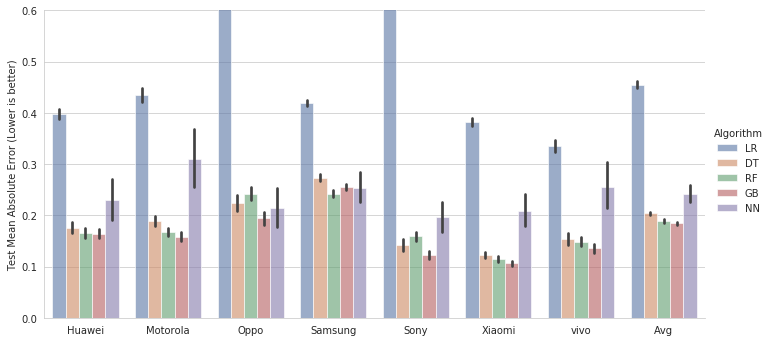

In [62]:
df = pd.read_csv('./data/fig6_data_ai.csv')

sns.set_style("whitegrid")
fig_size = (10, 5)
g = sns.catplot(
    data = df, 
    kind = "bar", 
    x = "Brand", 
    y = "Test Mean Absolute Error (Lower is better)", 
    hue = "Algorithm", 
    palette="deep", 
    alpha=.6, 
    height=fig_size[1],
    aspect=fig_size[0]/fig_size[1]
)
plt.xlabel("")
plt.ylim((0,0.6))
plt.savefig("./results/fig6_ai.png", dpi = 300)
plt.show()

In [65]:
np.mean(df.query("Brand=='Avg'")["Test Mean Absolute Error (Lower is better)"])

0.25784520223289464

In [66]:
np.mean(df.query("Brand=='Avg'").query("Algorithm=='LR'")["Test Mean Absolute Error (Lower is better)"])

0.45496698055824275

In [67]:
np.mean(df.query("Brand=='Avg'").query("Algorithm=='RF'")["Test Mean Absolute Error (Lower is better)"])

0.18916978535318707

In [68]:
np.mean(df.query("Brand=='Avg'").query("Algorithm=='GB'")["Test Mean Absolute Error (Lower is better)"])

0.1842633252712893

### Figure 7

In [79]:
system_dir = './data/systems/'
hard_dir = './data/procs/'

envs = pd.read_csv("data/ls_cp_info_post_join.csv").set_index("id")
envs.head()

to_keep = ['perf', 'nb_models', 'ls_architecture', 'ls_cpuop-mode', 'ls_cpu', 'ls_threadpercore',
           'ls_corepersocket', 
           'ls_socket', 'ls_numanode', 'ls_vendorid',  'ls_cpufamily', 'ls_model', 'ls_stepping', 
           'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz', 'ls_bogomips',
           'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_vendor_id','cp_cpufamily', 'cp_model',
           'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
           'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
           'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize',
           'cp_cache_alignment', 'cp_addresssizes', 'ls_range', 'price_dollar',
           'TDP', 'Process', 'Release Year']

num = ['nb_models', 'ls_cpu', 'ls_threadpercore', 'ls_corepersocket', 'ls_socket', 'ls_numanode', 
       'ls_cpufamily', 'ls_model', 'ls_stepping',  'ls_cpumhz', 'ls_cpumaxmhz', 
       'ls_cpuminmhz','ls_bogomips',  'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache',
       'cp_cpufamily', 'cp_model', 'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
       'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
       'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize', 
       'cp_cache_alignment', 'price_dollar', 'TDP', 'Process', 'Release Year']

categ = ['ls_architecture', 'ls_cpuop-mode', 'ls_vendorid', 'cp_vendor_id', 'cp_addresssizes', 'ls_range']

res = []

# add profile information
envs = pd.read_csv("data/ls_cp_info_post_join.csv").set_index("idPhoronix")
envs.head()

to_keep = ['perf', 'nb_models', 'ls_architecture', 'ls_cpuop-mode', 'ls_cpu', 'ls_threadpercore',
           'ls_corepersocket', 
           'ls_socket', 'ls_numanode', 'ls_vendorid',  'ls_cpufamily', 'ls_model', 'ls_stepping', 
           'ls_cpumhz', 'ls_cpumaxmhz', 'ls_cpuminmhz', 'ls_bogomips',
           'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache', 'cp_vendor_id','cp_cpufamily', 'cp_model',
           'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
           'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
           'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize',
           'cp_cache_alignment', 'cp_addresssizes', 'ls_range', 'price_dollar',
           'TDP', 'Process', 'Release Year']

num = ['nb_models', 'ls_cpu', 'ls_threadpercore', 'ls_corepersocket', 'ls_socket', 'ls_numanode', 
       'ls_cpufamily', 'ls_model', 'ls_stepping',  'ls_cpumhz', 'ls_cpumaxmhz', 
       'ls_cpuminmhz','ls_bogomips',  'ls_l1dcache', 'ls_l1icache', 'ls_l2cache', 'ls_l3cache',
       'cp_cpufamily', 'cp_model', 'cp_stepping', 'cp_cpumhz', 'cp_cachesize', 
       'cp_physicalid', 'cp_siblings', 'cp_cpucores', 'cp_apicid',
       'cp_cpuidlevel', 'cp_bogomips', 'cp_clflushsize', 
       'cp_cache_alignment', 'price_dollar', 'TDP', 'Process', 'Release Year']

categ = ['ls_architecture', 'ls_cpuop-mode', 'ls_vendorid', 'cp_vendor_id', 'cp_addresssizes', 'ls_range']

# separate average perfs from standard deviations
def separate_perf(perf):
    raw_perf = []
    std_perf = []

    for p in perf:
        tab = str(p).replace(" ", "").split("+/-")
        raw_perf.append(tab[0])
        if len(tab) > 1:
            std_perf.append(tab[1])
        else:
            std_perf.append('')

    return (raw_perf, std_perf)

maes = []
res = []
comp_col = False

for sys_name in os.listdir(system_dir):

        #try:

        sys = pd.read_csv(system_dir+sys_name, index_col = 0)

        if sys.shape[0] > 1:

            sys["id"] = [k.replace("/s/", "").replace("+", "") for k in sys["idproc"]]

            sys = sys.set_index("id")

            perf_meta = sys.join(envs)[to_keep].query("ls_cpu!='NaN'").query("ls_vendorid=='AuthenticAMD' or ls_vendorid=='GenuineIntel'").fillna("0")
            
            avg, std = separate_perf(perf_meta["perf"])

            perf_meta.loc[:, "avg"] = avg

            y = [float(k) for k in perf_meta["avg"]]
            y = (y-np.mean(y))/np.std(y)

            del perf_meta['avg']
            del perf_meta['perf']

            ind = [k for k in perf_meta.index]

            if not comp_col:
                cols = []
                cols.append("name_proc")
                cols.extend(perf_meta.columns)
                cols.append("name_workl")
                cols.append("score")
                comp_col = True

            for i in range(perf_meta.shape[0]):
                tab = []
                tab.append(ind[i])
                tab.extend(perf_meta.iloc[i])
                tab.append(sys_name[:-4])
                tab.append(y[i])
                res.append(tab)

        #except:
        #    print(sys_name)


df_agg = pd.DataFrame(res)
df_agg.columns = cols
to_keep2 = num
to_keep2.extend(['name_proc', 'name_workl', 'score'])
df_agg = df_agg[to_keep2]#.join(pd.get_dummies(df_agg[categ]))
df_agg

,nb_models,ls_cpu,ls_threadpercore,ls_corepersocket,ls_socket,ls_numanode,ls_cpufamily,ls_model,ls_stepping,ls_cpumhz,...,cp_bogomips,cp_clflushsize,cp_cache_alignment,price_dollar,TDP,Process,Release Year,name_proc,name_workl,score
0,1.0,12.0,2,6,1,1,25,33,0,3579.08,...,7386.52,64.0,64.0,315,65,7,2020,AMDRyzen55600X6-Core,pts-git,-0.497598
1,1.0,16.0,2,8,1,1,6,167,1,3500,...,7008.00,64.0,64.0,544,125,14,2021,IntelCorei9-11900K,pts-git,-0.479653
2,1.0,32.0,2,16,1,1,25,33,0,2200,...,6800.03,64.0,64.0,869,105,7,2020,AMDRyzen95950X16-Core,pts-git,-0.479653
3,1.0,16.0,2,8,1,1,25,33,0,2236.51,...,7585.67,64.0,64.0,465,105,7,2020,AMDRyzen75800X8-Core,pts-git,-0.479653
4,1.0,24.0,2,12,1,1,25,33,0,4950.19,...,7400.53,64.0,64.0,583,105,7,2020,AMDRyzen95900X12-Core,pts-git,-0.461708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18480,1.0,8.0,2,4,1,1,6,71,1,3610.79,...,6598.05,64.0,64.0,175,65,14,2015,IntelCorei7-5775C,pts-smhasher,0.224775
18481,1.0,4.0,1,4,1,1,6,60,3,4401,...,7999.48,64.0,64.0,235,88,22,2014,IntelCorei7-4790K,pts-smhasher,0.864722
18482,1.0,4.0,1,4,1,1,6,58,9,1600,...,6719.89,64.0,64.0,200,77,22,2012,IntelCorei5-3470,pts-smhasher,0.922899
18483,1.0,4.0,1,4,1,1,6,158,11,3629.9,...,7200.00,64.0,64.0,200,62,14,2017,IntelCorei3-8100,pts-smhasher,1.010165


In [80]:
len(works)

28

In [132]:
works = pd.Series(df_agg["name_workl"]).unique()

res = []

grd = dict()
for i in range(n_clusters):
    grd[i] = [names[j] for j in range(len(groups)) if groups[j]==i]

for w in works[0:10]:
    
    s = 0
    for i in range(n_clusters):
        if w in grd[i]:
            s = i
    print(s)
    
    df_rest = df_agg.query("name_workl!='"+w+"'")

    X_rest = df_rest.drop(['score','name_proc','name_workl'], axis=1)
    y_rest = df_rest['score']
    
    df = df_agg.query("""name_workl in """+str(grd[s]))
    X = df.drop(['score','name_proc','name_workl'], axis=1)
    y = df['score']

    clf = RandomForestRegressor()

    clf.fit(X_rest,y_rest)
    y_pred = clf.predict(X)

    res.append(mean_absolute_error(y_pred, y))

print(np.mean(res))
print(np.median(res))

1
0
3
1
1
0
1
3
1
1
0.6259593669785313


In [150]:
works = pd.Series(df_agg["name_workl"]).unique()

res = []

grd = dict()
for i in range(n_clusters):
    grd[i] = [names[j] for j in range(len(groups)) if groups[j]==i]

for w in works[0:10]:
    
    #s = 0
    #for i in range(n_clusters):
    #    if w in grd[i]:
    #        s = i
    #print(s)
    
    df_rest = df_agg.query("name_workl!='"+w+"'")

    X_rest = df_rest.drop(['score','name_proc','name_workl'], axis=1)
    y_rest = df_rest['score']
    
    df = df_agg.query("""name_workl in """+str(grd[s]))
    X = df.drop(['score','name_proc','name_workl'], axis=1)
    y = df['score']

    clf = RandomForestRegressor()

    clf.fit(X_rest,y_rest)
    y_pred = clf.predict(X)

    res.append(mean_absolute_error(y_pred, y))

print(np.mean(res))
print(np.median(res))

1
0
3
1
1
0
1
3


KeyboardInterrupt: 

In [84]:
np.median(df_agg.groupby(["name_proc"]).count()['nb_models'])

4.0

In [131]:
str(grd[s])

"['pts-git', 'pts-php', 'pts-smallpt', 'pts-pts-self-test', 'pts-arrayfire', 'pts-onnx', 'pts-java-scimark2', 'pts-rbenchmark', 'pts-geekbench', 'pts-plaidml', 'pts-mandelgpu', 'pts-aircrack-ng', 'pts-build-imagemagick', 'pts-blake2', 'pts-neatbench', 'pts-node-octane', 'system-gegl', 'pts-mencoder', 'pts-etqw-demo', 'pts-trislam', 'pts-nwchem', 'system-mpv', 'pts-mixbench', 'pts-batman-origins', 'pts-dow3', 'pts-neat', 'pts-mkl-dnn', 'pts-core-latency', 'pts-mpcbench', 'pts-metroll-redux', 'pts-ctx-clock', 'pts-dirt-showdown', 'pts-blogbench', 'pts-dolfyn', 'pts-mnn', 'pts-ior', 'pts-deus-exmd', 'pts-portal', 'system-rsvg', 'pts-encode-flac', 'pts-rodinia', 'pts-waifu2x-ncnn', 'pts-postmark', 'pts-etlegacy', 'pts-sqlite-speedtest', 'pts-pybench', 'pts-sunflow', 'pts-octanebench', 'pts-apache', 'pts-tesseract', 'pts-xonotic', 'pts-mt-dgemm', 'pts-unpack-linux', 'pts-dota2', 'pts-compress-rar', 'pts-c-ray', 'pts-aobench', 'pts-j2dbench', 'pts-build-gcc', 'pts-luxcorerender', 'pts-geexla

In [122]:
df_agg.query("name_workl in [1,2]")

,nb_models,ls_cpu,ls_threadpercore,ls_corepersocket,ls_socket,ls_numanode,ls_cpufamily,ls_model,ls_stepping,ls_cpumhz,...,cp_bogomips,cp_clflushsize,cp_cache_alignment,price_dollar,TDP,Process,Release Year,name_proc,name_workl,score


In [ ]:
works = pd.Series(df_agg["name_workl"]).unique()

res = []

grd = dict()
for i in range(n_clusters):
    grd[i] = [names[j] for j in range(len(groups)) if groups[j]==i]

for w in works[0:10]:
    
    df_rest = df_agg.query("name_workl!='"+w+"'")

    X_rest = df_rest.drop(['score','name_proc','name_workl'], axis=1)
    y_rest = df_rest['score']

    df = df_agg.query("name_workl=='"+w+"'")
    X = df.drop(['score','name_proc','name_workl'], axis=1)
    y = df['score']

    clf = RandomForestRegressor()

    clf.fit(X_rest,y_rest)
    y_pred = clf.predict(X)

    res.append(mean_absolute_error(y_pred, y))

print(np.mean(res))